# Go hard or go home

## Imports

- Load
- Drop duplicate rows
- Convert 0 to NaN
- Create 2 datasets
- Drop rows
- Drop columns
- Split feature/class
- Impute NaN
- Rebuild datasets
- Classify

In [53]:
# Module imports
import numpy as np
import pandas as pd
import sklearn as sk
import matplotlib as plt
import seaborn as sns
from time import time

# Dataset imports
from sklearn.model_selection import train_test_split

# Imputation imports
from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE

# Classifier & Algorithm imports
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# Validation imports
from sklearn.model_selection import cross_validate
from sklearn.model_selection import StratifiedKFold

# Visualisation imports
import graphviz
from sklearn.metrics import ConfusionMatrixDisplay

ImportError: cannot import name 'threadpool_limits' from 'sklearn.utils.fixes' (/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/fixes.py)

## Dataframes

In [2]:
# Full Dataset
dataset_full = pd.read_csv('dataset/heart-disease.csv')
dataset_full.head()

,Age,Gender,Chest pain type,Resting blood pressure,Serum cholesterol,Fasting blood sugar,Resting electrocardiographic,Maximum heart rate,Exercise induced angina,ST depression,ST segment,Number of major vessels,Thal,class
0,63.0,1.0,4.0,140.0,260.0,0.0,1.0,112.0,1.0,3.0,2.0,NaN,NaN,2
1,44.0,1.0,4.0,130.0,209.0,0.0,1.0,127.0,0.0,0.0,NaN,NaN,NaN,0
2,60.0,1.0,4.0,132.0,218.0,0.0,1.0,140.0,1.0,1.5,3.0,NaN,NaN,2
3,55.0,1.0,4.0,142.0,228.0,0.0,1.0,149.0,1.0,2.5,1.0,NaN,NaN,1
4,66.0,1.0,3.0,110.0,213.0,1.0,2.0,99.0,1.0,1.3,2.0,NaN,NaN,0


In [3]:
# Edited Dataset
dataset_edited = pd.read_csv('dataset/heart-disease.csv')
# dataset_edited = dataset_edited.drop(['Thal', 'Number of major vessels'], axis=1) # DROP LATER
dataset_edited.head()

,Age,Gender,Chest pain type,Resting blood pressure,Serum cholesterol,Fasting blood sugar,Resting electrocardiographic,Maximum heart rate,Exercise induced angina,ST depression,ST segment,Number of major vessels,Thal,class
0,63.0,1.0,4.0,140.0,260.0,0.0,1.0,112.0,1.0,3.0,2.0,NaN,NaN,2
1,44.0,1.0,4.0,130.0,209.0,0.0,1.0,127.0,0.0,0.0,NaN,NaN,NaN,0
2,60.0,1.0,4.0,132.0,218.0,0.0,1.0,140.0,1.0,1.5,3.0,NaN,NaN,2
3,55.0,1.0,4.0,142.0,228.0,0.0,1.0,149.0,1.0,2.5,1.0,NaN,NaN,1
4,66.0,1.0,3.0,110.0,213.0,1.0,2.0,99.0,1.0,1.3,2.0,NaN,NaN,0


## Duplicate deletion

In [4]:
# Removing duplicate rows
print("Number of rows before dropping duplicates:", dataset_full.shape[0])
dataset_full.drop_duplicates(subset=None, keep='first', inplace=True)
print("Number of rows after dropping duplicates:", dataset_full.shape[0])

print("Number of rows before dropping duplicates:", dataset_edited.shape[0])
dataset_edited.drop_duplicates(subset=None, keep='first', inplace=True)
print("Number of rows after dropping duplicates:", dataset_edited.shape[0])

Number of rows before dropping duplicates: 920
Number of rows after dropping duplicates: 918
Number of rows before dropping duplicates: 920
Number of rows after dropping duplicates: 918


## Zero handling

In [5]:
# Removing zero values from cholesterol
print("Null values before zero purge:\n", dataset_full['Serum cholesterol'].isnull().value_counts())

# Removing zero values and replacing with null for later imputation
dataset_full['Serum cholesterol'] = dataset_full['Serum cholesterol'].replace(0, np.nan)
dataset_edited['Serum cholesterol'] = dataset_edited['Serum cholesterol'].replace(0, np.nan)

print("\nNull values after zero purge:\n", dataset_full['Serum cholesterol'].isnull().value_counts())

Null values before zero purge:
 False    889
True      29
Name: Serum cholesterol, dtype: int64

Null values after zero purge:
 False    717
True     201
Name: Serum cholesterol, dtype: int64


Precentage of dataset consisting of rows with X missing values:
0    32.570806
3    25.163399
2    23.093682
4     9.803922
7     4.684096
1     2.832244
8     1.198257
5     0.435730
6     0.217865
Name: Missing count, dtype: float64


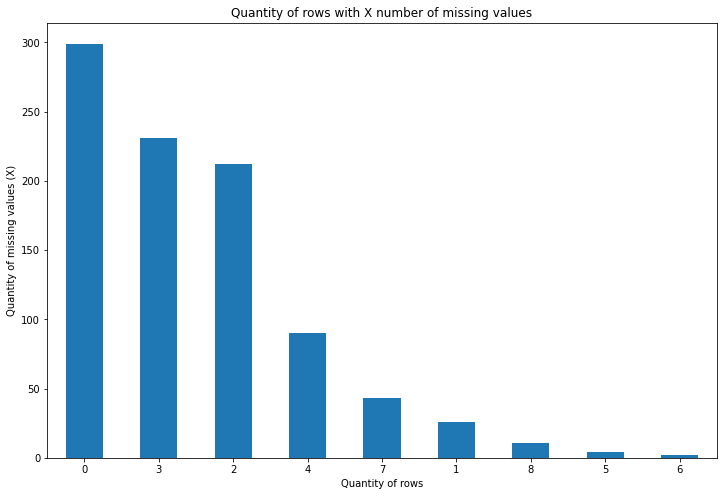

In [6]:
# Cool table
dataset_full_missing = dataset_full
dataset_full_missing['Missing count'] = dataset_full_missing.isnull().sum(axis=1)
chart = dataset_full_missing['Missing count'].value_counts().plot(kind='bar', title='Quantity of rows with X number of missing values', figsize=(12, 8), rot=0)
chart.set_xlabel("Quantity of rows")
chart.set_ylabel("Quantity of missing values (X)")

print("Precentage of dataset consisting of rows with X missing values:")
print(dataset_full_missing['Missing count'].value_counts(normalize=True) * 100)

In [7]:
dataset_full = dataset_full.drop(columns=['Missing count'])
print("Full:", dataset_full.shape[1])
print("Edited:", dataset_edited.shape[1])
dataset_full.head()

Full: 14
Edited: 14


,Age,Gender,Chest pain type,Resting blood pressure,Serum cholesterol,Fasting blood sugar,Resting electrocardiographic,Maximum heart rate,Exercise induced angina,ST depression,ST segment,Number of major vessels,Thal,class
0,63.0,1.0,4.0,140.0,260.0,0.0,1.0,112.0,1.0,3.0,2.0,NaN,NaN,2
1,44.0,1.0,4.0,130.0,209.0,0.0,1.0,127.0,0.0,0.0,NaN,NaN,NaN,0
2,60.0,1.0,4.0,132.0,218.0,0.0,1.0,140.0,1.0,1.5,3.0,NaN,NaN,2
3,55.0,1.0,4.0,142.0,228.0,0.0,1.0,149.0,1.0,2.5,1.0,NaN,NaN,1
4,66.0,1.0,3.0,110.0,213.0,1.0,2.0,99.0,1.0,1.3,2.0,NaN,NaN,0


Rows before drop - full:  918
Rows before drop - edited:  918
Rows after drop - full:  858
Rows after drop - edited:  858
Percentage reduction in size:  6.535947712418306 %
Full: 14
Edit: 14


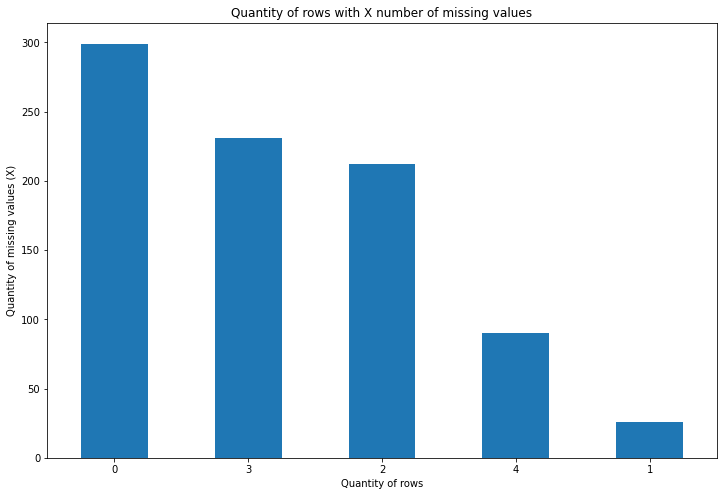

In [8]:
# Deleting rows with 5 or more missing values
df = dataset_full.shape[0]
de = dataset_edited.shape[0]
print("Rows before drop - full: ", df)
print("Rows before drop - edited: ", de)

dataset_full_dropped = dataset_full[dataset_full.isnull().sum(axis=1) < 5]
dataset_edited_dropped = dataset_edited[dataset_edited.isnull().sum(axis=1) < 5]

dfd = dataset_full_dropped.shape[0]
dfe = dataset_edited_dropped.shape[0]
print("Rows after drop - full: ", dfd)
print("Rows after drop - edited: ", dfe)

print("Percentage reduction in size: ", 100 - (dfd / df) * 100, "%")
print("Full:", dataset_full_dropped.shape[1])
print("Edit:", dataset_edited_dropped.shape[1])

# Cool table
dataset_full_missing = dataset_full_dropped.copy()
dataset_full_missing['Missing count'] = dataset_full_missing.isnull().sum(axis=1)
chart = dataset_full_missing['Missing count'].value_counts().plot(kind='bar', title='Quantity of rows with X number of missing values', figsize=(12, 8), rot=0)
chart.set_xlabel("Quantity of rows")
chart.set_ylabel("Quantity of missing values (X)")

dataset_full = dataset_full_dropped
# THEN DROPPING COLUMNS
dataset_edited = dataset_edited_dropped.drop(['Thal', 'Number of major vessels'], axis=1)

In [9]:
# Shapes of datasets
print("Full dataset:", dataset_full.shape[0], "rows.", dataset_full.shape[1], "columns.")
print("Edited dataset:", dataset_edited.shape[0], "rows.", dataset_edited.shape[1], "columns.")

Full dataset: 858 rows. 14 columns.
Edited dataset: 858 rows. 12 columns.


## Feature importance & selection

In [10]:
# Dropping all null values for feature importance
dataset_dropna = dataset_full.dropna()

# Splitting dataset into feature matrix and class labels
X_dropna = dataset_dropna.iloc[:,:len(dataset_dropna.columns)-1]
y_dropna = dataset_dropna.iloc[:,len(dataset_dropna.columns)-1]

# Instantiating random forest classifier with default hyperparams
random_forest = RandomForestClassifier(n_estimators=500, random_state=None)

# 5-fold cross-validation (returns trained model)
scores = cross_validate(random_forest, X_dropna, y_dropna, cv=10, return_estimator=True)

# Retrieving trained model from first fold
estimator = scores['estimator'][0]

In [11]:
# Creating a dataframe to hold the features and their importance
f_importance = pd.DataFrame()
f_importance['feature'] = dataset_dropna.columns[:13]
f_importance['importance'] = estimator.feature_importances_

f_importance = f_importance.sort_values(by='importance', ascending=True)

In [12]:
# Scaling and printing table
f_importance['importance'] = f_importance['importance'] * 100
f_importance

,feature,importance
5,Fasting blood sugar,1.761685
6,Resting electrocardiographic,2.823195
1,Gender,2.853499
10,ST segment,3.836462
8,Exercise induced angina,4.498789
2,Chest pain type,7.653369
12,Thal,8.339808
11,Number of major vessels,9.141202
3,Resting blood pressure,10.290332
4,Serum cholesterol,11.227478


Text(0, 0.5, 'Feature name')

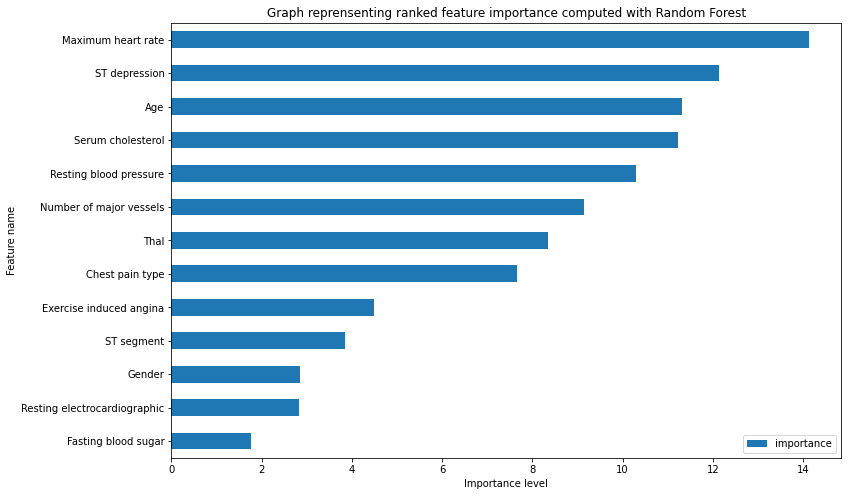

In [13]:
# Plotting graph representing feature importance
ic = f_importance.plot(kind='barh',
                  x='feature',
                  y='importance',
                  title="Graph reprensenting ranked feature importance computed with Random Forest",
                  figsize=(12,8))
ic.set_xlabel("Importance level")
ic.set_ylabel("Feature name")

### Features to drop
Full dataset:
- Fasting blood sugar (Unimportant & low correlation)
- Gender (Unimportant)
- Resting ECG (Unimportant & low correlation)

Edited Dataset:
- Fasting blood sugar (Unimportant & low correlation)
- Gender (Unimportant)
- Resting ECG (Unimportant & low correlation)
- Number of major vesssels (lots of missing values)
- Thal (lots of missing values)

## Seperating class labels

In [14]:
# Full set
y_full = dataset_full.iloc[:,len(dataset_full.columns)-1]

# Edited set
y_edited = dataset_edited.iloc[:,len(dataset_edited.columns)-1]

## Data imputation

In [15]:
# Splitting full dataset between continuous and categorical data
dataset_full_cont = dataset_full.filter(['Age', 'Resting blood pressure', 'Serum cholesterol', 'Maximum heart rate', 'ST depression', 'Number of major vessels', 'Thal'], axis=1)
dataset_full_cat = dataset_full.filter(['Chest pain type', 'Exercise induced angina', 'ST segment'], axis=1)

# Splitting edited dataset between continuous and categorical data
dataset_edited_cont = dataset_full.filter(['Age', 'Resting blood pressure', 'Serum cholesterol', 'Maximum heart rate', 'ST depression'], axis=1)
dataset_edited_cat = dataset_full.filter(['Chest pain type', 'Exercise induced angina', 'ST segment'], axis=1)

# KNN Imputer for continuous data
cont_imputer = KNNImputer(missing_values=np.nan, n_neighbors=3)

# KNN Imputer for categorical data
cat_imputer = KNNImputer(missing_values=np.nan, n_neighbors=1)

# setting up column names for imputation
full_cont_columns = ['Age', 'Resting blood pressure', 'Serum cholesterol', 'Maximum heart rate', 'ST depression', 'Number of major vessels', 'Thal']
full_cat_columns = ['Chest pain type', 'Exercise induced angina', 'ST segment']

edited_cont_columns = ['Age', 'Resting blood pressure', 'Serum cholesterol', 'Maximum heart rate', 'ST depression']
edited_cat_columns = ['Chest pain type', 'Exercise induced angina', 'ST segment']

# Imputing full continuous data using KNNImputer
full_cont_imputed = pd.DataFrame(cont_imputer.fit_transform(dataset_full_cont), columns=full_cont_columns)

# Imputing full categorical data using KNNImputer
full_cat_imputed = pd.DataFrame(cat_imputer.fit_transform(dataset_full_cat), columns=full_cat_columns)

# Imputing edited continuous data using KNNImputer
edited_cont_imputed = pd.DataFrame(cont_imputer.fit_transform(dataset_edited_cont), columns=edited_cont_columns)

# Imputing edited continuous data using KNNImputer
edited_cat_imputed = pd.DataFrame(cat_imputer.fit_transform(dataset_edited_cat), columns=edited_cat_columns)

# Reconstructing datasets
dataset_full_imputed = pd.concat([full_cont_imputed, full_cat_imputed], axis=1)
dataset_edited_imputed = pd.concat([edited_cont_imputed, edited_cat_imputed], axis=1)

## Dataset splitting

In [16]:
test_size = 0.1

# Full Dataset
X_full = dataset_full_imputed.iloc[:,:len(dataset_full.columns)-1]
X_full_train, X_full_test, y_full_train, y_full_test = train_test_split(X_full, y_full, test_size=test_size, stratify=y_full, random_state=1)

In [17]:
# Edited dataset
X_edited = dataset_edited_imputed.iloc[:,:len(dataset_edited.columns)-1]
X_edited_train, X_edited_test, y_edited_train, y_edited_test = train_test_split(X_edited, y_edited, test_size=test_size, stratify=y_edited, random_state=1)

In [18]:
X_full_train

,Age,Resting blood pressure,Serum cholesterol,Maximum heart rate,ST depression,Number of major vessels,Thal,Chest pain type,Exercise induced angina,ST segment
606,55.0,120.0,256.0,137.0,0.0,0.666667,7.000000,2.0,0.0,2.0
501,42.0,115.0,211.0,137.0,0.0,0.000000,6.666667,3.0,0.0,1.0
712,53.0,145.0,518.0,130.0,0.0,0.333333,5.333333,3.0,0.0,1.0
481,39.0,120.0,200.0,160.0,1.0,0.000000,5.333333,2.0,1.0,2.0
781,53.0,120.0,210.0,120.0,0.0,1.000000,7.000000,4.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...
666,57.0,140.0,265.0,145.0,1.0,0.333333,4.000000,2.0,1.0,2.0
256,61.0,145.0,307.0,146.0,1.0,0.000000,7.000000,4.0,1.0,2.0
218,62.0,120.0,267.0,99.0,1.8,2.000000,7.000000,4.0,1.0,2.0
398,64.0,128.0,263.0,105.0,0.2,1.000000,7.000000,4.0,1.0,2.0


In [19]:
X_edited_train

,Age,Resting blood pressure,Serum cholesterol,Maximum heart rate,ST depression,Chest pain type,Exercise induced angina,ST segment
606,55.0,120.0,256.0,137.0,0.0,2.0,0.0,2.0
501,42.0,115.0,211.0,137.0,0.0,3.0,0.0,1.0
712,53.0,145.0,518.0,130.0,0.0,3.0,0.0,1.0
481,39.0,120.0,200.0,160.0,1.0,2.0,1.0,2.0
781,53.0,120.0,210.0,120.0,0.0,4.0,0.0,2.0
...,...,...,...,...,...,...,...,...
666,57.0,140.0,265.0,145.0,1.0,2.0,1.0,2.0
256,61.0,145.0,307.0,146.0,1.0,4.0,1.0,2.0
218,62.0,120.0,267.0,99.0,1.8,4.0,1.0,2.0
398,64.0,128.0,263.0,105.0,0.2,4.0,1.0,2.0


## Class scaling

In [ ]:
# 

## Validation Functions

In [20]:
# Define Stratified 10-fold cross-val
cv_method = StratifiedKFold(n_splits=10)

# Dictionary of scoring metrics, defined from sklearn.metrics
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'prec_macro': make_scorer(precision_score, average='macro', zero_division=0),
    'rec_macro': make_scorer(recall_score, average='macro', zero_division=0),
    'f1_weighted': make_scorer(f1_score, average='weighted', zero_division=0)
}

# Utility function to report best scores
def report(results, rank_metric='score', n_top=3):
    """
    Utility function to report best scores.
    :param results: the cv_results_ data structure from the optimisation algorithm
    :param rank_metric: name of the metric to report results for
    :param n_top: the number of top results to report
    """
    print("\nModels ranked according to", rank_metric)
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results["rank_test_" + rank_metric] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.2f} (+/- {1:.2f})".format(
                  results["mean_test_" + rank_metric][candidate],
                  results["std_test_" + rank_metric][candidate]*2))
            print("Params: {0}".format(results['params'][candidate]))
            print("")

## Classifiers

### Decision Tree (CART)

In [26]:
# Parameters of Decision Tree
dt_params = {'criterion': ['gini', 'entropy'],
            'splitter': ['best', 'random'],
            'max_depth': [6, 7, 8, 9, 10],
            'min_samples_split': [2, 3, 4]}

# Instantiating model
model = tree.DecisionTreeClassifier()

# Defining a grid search for Decision Tree
gridsearch_dt = GridSearchCV(estimator=model, param_grid=dt_params, cv=cv_method, verbose=3, scoring=scoring, refit='accuracy', return_train_score=True)

# Fitting data
time_train_start = time()
gridsearch_dt.fit(X_full_train, y_full_train)
time_train_end = time()

Fitting 10 folds for each of 60 candidates, totalling 600 fits
[CV 1/10] END criterion=gini, max_depth=6, min_samples_split=2, splitter=best; accuracy: (train=0.720, test=0.590) f1_weighted: (train=0.713, test=0.568) prec_macro: (train=0.724, test=0.416) rec_macro: (train=0.545, test=0.393) total time=   0.0s
[CV 2/10] END criterion=gini, max_depth=6, min_samples_split=2, splitter=best; accuracy: (train=0.725, test=0.628) f1_weighted: (train=0.717, test=0.598) prec_macro: (train=0.683, test=0.408) rec_macro: (train=0.559, test=0.401) total time=   0.0s
[CV 3/10] END criterion=gini, max_depth=6, min_samples_split=2, splitter=best; accuracy: (train=0.724, test=0.494) f1_weighted: (train=0.711, test=0.490) prec_macro: (train=0.749, test=0.325) rec_macro: (train=0.538, test=0.332) total time=   0.0s
[CV 4/10] END criterion=gini, max_depth=6, min_samples_split=2, splitter=best; accuracy: (train=0.718, test=0.597) f1_weighted: (train=0.713, test=0.571) prec_macro: (train=0.761, test=0.327) r

[CV 6/10] END criterion=gini, max_depth=6, min_samples_split=4, splitter=best; accuracy: (train=0.705, test=0.481) f1_weighted: (train=0.708, test=0.465) prec_macro: (train=0.633, test=0.289) rec_macro: (train=0.581, test=0.285) total time=   0.0s
[CV 7/10] END criterion=gini, max_depth=6, min_samples_split=4, splitter=best; accuracy: (train=0.715, test=0.597) f1_weighted: (train=0.710, test=0.587) prec_macro: (train=0.719, test=0.702) rec_macro: (train=0.574, test=0.490) total time=   0.0s
[CV 8/10] END criterion=gini, max_depth=6, min_samples_split=4, splitter=best; accuracy: (train=0.705, test=0.571) f1_weighted: (train=0.699, test=0.578) prec_macro: (train=0.691, test=0.383) rec_macro: (train=0.555, test=0.391) total time=   0.0s
[CV 9/10] END criterion=gini, max_depth=6, min_samples_split=4, splitter=best; accuracy: (train=0.715, test=0.506) f1_weighted: (train=0.708, test=0.477) prec_macro: (train=0.713, test=0.260) rec_macro: (train=0.572, test=0.293) total time=   0.0s
[CV 10/1

[CV 10/10] END criterion=gini, max_depth=7, min_samples_split=3, splitter=best; accuracy: (train=0.791, test=0.494) f1_weighted: (train=0.788, test=0.499) prec_macro: (train=0.809, test=0.336) rec_macro: (train=0.689, test=0.342) total time=   0.0s
[CV 1/10] END criterion=gini, max_depth=7, min_samples_split=3, splitter=random; accuracy: (train=0.693, test=0.538) f1_weighted: (train=0.671, test=0.494) prec_macro: (train=0.754, test=0.250) rec_macro: (train=0.473, test=0.289) total time=   0.0s
[CV 2/10] END criterion=gini, max_depth=7, min_samples_split=3, splitter=random; accuracy: (train=0.692, test=0.487) f1_weighted: (train=0.671, test=0.458) prec_macro: (train=0.717, test=0.241) rec_macro: (train=0.484, test=0.258) total time=   0.0s
[CV 3/10] END criterion=gini, max_depth=7, min_samples_split=3, splitter=random; accuracy: (train=0.689, test=0.584) f1_weighted: (train=0.674, test=0.559) prec_macro: (train=0.680, test=0.321) rec_macro: (train=0.502, test=0.356) total time=   0.0s
[

[CV 5/10] END criterion=gini, max_depth=8, min_samples_split=2, splitter=random; accuracy: (train=0.791, test=0.442) f1_weighted: (train=0.784, test=0.436) prec_macro: (train=0.801, test=0.269) rec_macro: (train=0.654, test=0.257) total time=   0.0s
[CV 6/10] END criterion=gini, max_depth=8, min_samples_split=2, splitter=random; accuracy: (train=0.725, test=0.597) f1_weighted: (train=0.718, test=0.579) prec_macro: (train=0.774, test=0.442) rec_macro: (train=0.564, test=0.384) total time=   0.0s
[CV 7/10] END criterion=gini, max_depth=8, min_samples_split=2, splitter=random; accuracy: (train=0.776, test=0.519) f1_weighted: (train=0.767, test=0.512) prec_macro: (train=0.773, test=0.329) rec_macro: (train=0.619, test=0.342) total time=   0.0s
[CV 8/10] END criterion=gini, max_depth=8, min_samples_split=2, splitter=random; accuracy: (train=0.771, test=0.506) f1_weighted: (train=0.770, test=0.503) prec_macro: (train=0.804, test=0.309) rec_macro: (train=0.677, test=0.296) total time=   0.0s


[CV 2/10] END criterion=gini, max_depth=9, min_samples_split=2, splitter=best; accuracy: (train=0.882, test=0.474) f1_weighted: (train=0.880, test=0.470) prec_macro: (train=0.892, test=0.294) rec_macro: (train=0.813, test=0.288) total time=   0.0s
[CV 3/10] END criterion=gini, max_depth=9, min_samples_split=2, splitter=best; accuracy: (train=0.863, test=0.532) f1_weighted: (train=0.858, test=0.521) prec_macro: (train=0.897, test=0.406) rec_macro: (train=0.739, test=0.374) total time=   0.0s
[CV 4/10] END criterion=gini, max_depth=9, min_samples_split=2, splitter=best; accuracy: (train=0.836, test=0.545) f1_weighted: (train=0.832, test=0.520) prec_macro: (train=0.885, test=0.325) rec_macro: (train=0.704, test=0.322) total time=   0.0s
[CV 5/10] END criterion=gini, max_depth=9, min_samples_split=2, splitter=best; accuracy: (train=0.886, test=0.455) f1_weighted: (train=0.886, test=0.454) prec_macro: (train=0.886, test=0.344) rec_macro: (train=0.826, test=0.373) total time=   0.0s
[CV 6/10

[CV 6/10] END criterion=gini, max_depth=9, min_samples_split=4, splitter=best; accuracy: (train=0.853, test=0.558) f1_weighted: (train=0.850, test=0.532) prec_macro: (train=0.841, test=0.334) rec_macro: (train=0.724, test=0.328) total time=   0.0s
[CV 7/10] END criterion=gini, max_depth=9, min_samples_split=4, splitter=best; accuracy: (train=0.865, test=0.571) f1_weighted: (train=0.861, test=0.576) prec_macro: (train=0.881, test=0.656) rec_macro: (train=0.754, test=0.508) total time=   0.0s
[CV 8/10] END criterion=gini, max_depth=9, min_samples_split=4, splitter=best; accuracy: (train=0.827, test=0.506) f1_weighted: (train=0.823, test=0.498) prec_macro: (train=0.818, test=0.309) rec_macro: (train=0.696, test=0.306) total time=   0.0s
[CV 9/10] END criterion=gini, max_depth=9, min_samples_split=4, splitter=best; accuracy: (train=0.860, test=0.468) f1_weighted: (train=0.859, test=0.441) prec_macro: (train=0.867, test=0.242) rec_macro: (train=0.791, test=0.259) total time=   0.0s
[CV 10/1

[CV 3/10] END criterion=gini, max_depth=10, min_samples_split=3, splitter=random; accuracy: (train=0.807, test=0.481) f1_weighted: (train=0.796, test=0.452) prec_macro: (train=0.874, test=0.271) rec_macro: (train=0.634, test=0.307) total time=   0.0s
[CV 4/10] END criterion=gini, max_depth=10, min_samples_split=3, splitter=random; accuracy: (train=0.837, test=0.597) f1_weighted: (train=0.834, test=0.576) prec_macro: (train=0.838, test=0.401) rec_macro: (train=0.717, test=0.387) total time=   0.0s
[CV 5/10] END criterion=gini, max_depth=10, min_samples_split=3, splitter=random; accuracy: (train=0.856, test=0.416) f1_weighted: (train=0.852, test=0.414) prec_macro: (train=0.879, test=0.284) rec_macro: (train=0.723, test=0.262) total time=   0.0s
[CV 6/10] END criterion=gini, max_depth=10, min_samples_split=3, splitter=random; accuracy: (train=0.839, test=0.532) f1_weighted: (train=0.834, test=0.525) prec_macro: (train=0.874, test=0.432) rec_macro: (train=0.720, test=0.361) total time=   0

[CV 1/10] END criterion=entropy, max_depth=6, min_samples_split=3, splitter=best; accuracy: (train=0.693, test=0.538) f1_weighted: (train=0.676, test=0.512) prec_macro: (train=0.704, test=0.466) rec_macro: (train=0.528, test=0.360) total time=   0.0s
[CV 2/10] END criterion=entropy, max_depth=6, min_samples_split=3, splitter=best; accuracy: (train=0.723, test=0.564) f1_weighted: (train=0.711, test=0.541) prec_macro: (train=0.760, test=0.323) rec_macro: (train=0.557, test=0.323) total time=   0.0s
[CV 3/10] END criterion=entropy, max_depth=6, min_samples_split=3, splitter=best; accuracy: (train=0.676, test=0.403) f1_weighted: (train=0.646, test=0.360) prec_macro: (train=0.742, test=0.174) rec_macro: (train=0.450, test=0.206) total time=   0.0s
[CV 4/10] END criterion=entropy, max_depth=6, min_samples_split=3, splitter=best; accuracy: (train=0.714, test=0.610) f1_weighted: (train=0.704, test=0.586) prec_macro: (train=0.744, test=0.422) rec_macro: (train=0.539, test=0.392) total time=   0

[CV 8/10] END criterion=entropy, max_depth=7, min_samples_split=2, splitter=best; accuracy: (train=0.744, test=0.429) f1_weighted: (train=0.724, test=0.398) prec_macro: (train=0.750, test=0.202) rec_macro: (train=0.590, test=0.225) total time=   0.0s
[CV 9/10] END criterion=entropy, max_depth=7, min_samples_split=2, splitter=best; accuracy: (train=0.765, test=0.494) f1_weighted: (train=0.753, test=0.460) prec_macro: (train=0.755, test=0.250) rec_macro: (train=0.611, test=0.284) total time=   0.0s
[CV 10/10] END criterion=entropy, max_depth=7, min_samples_split=2, splitter=best; accuracy: (train=0.748, test=0.545) f1_weighted: (train=0.739, test=0.527) prec_macro: (train=0.759, test=0.363) rec_macro: (train=0.608, test=0.340) total time=   0.0s
[CV 1/10] END criterion=entropy, max_depth=7, min_samples_split=2, splitter=random; accuracy: (train=0.732, test=0.526) f1_weighted: (train=0.725, test=0.494) prec_macro: (train=0.766, test=0.266) rec_macro: (train=0.591, test=0.310) total time= 

[CV 2/10] END criterion=entropy, max_depth=7, min_samples_split=4, splitter=random; accuracy: (train=0.695, test=0.551) f1_weighted: (train=0.676, test=0.511) prec_macro: (train=0.770, test=0.458) rec_macro: (train=0.501, test=0.314) total time=   0.0s
[CV 3/10] END criterion=entropy, max_depth=7, min_samples_split=4, splitter=random; accuracy: (train=0.688, test=0.545) f1_weighted: (train=0.665, test=0.496) prec_macro: (train=0.707, test=0.259) rec_macro: (train=0.485, test=0.292) total time=   0.0s
[CV 4/10] END criterion=entropy, max_depth=7, min_samples_split=4, splitter=random; accuracy: (train=0.699, test=0.610) f1_weighted: (train=0.678, test=0.591) prec_macro: (train=0.632, test=0.418) rec_macro: (train=0.487, test=0.398) total time=   0.0s
[CV 5/10] END criterion=entropy, max_depth=7, min_samples_split=4, splitter=random; accuracy: (train=0.698, test=0.494) f1_weighted: (train=0.689, test=0.480) prec_macro: (train=0.695, test=0.296) rec_macro: (train=0.540, test=0.296) total t

[CV 7/10] END criterion=entropy, max_depth=8, min_samples_split=3, splitter=random; accuracy: (train=0.761, test=0.494) f1_weighted: (train=0.756, test=0.468) prec_macro: (train=0.784, test=0.271) rec_macro: (train=0.619, test=0.294) total time=   0.0s
[CV 8/10] END criterion=entropy, max_depth=8, min_samples_split=3, splitter=random; accuracy: (train=0.760, test=0.571) f1_weighted: (train=0.752, test=0.553) prec_macro: (train=0.796, test=0.300) rec_macro: (train=0.607, test=0.319) total time=   0.0s
[CV 9/10] END criterion=entropy, max_depth=8, min_samples_split=3, splitter=random; accuracy: (train=0.755, test=0.468) f1_weighted: (train=0.743, test=0.448) prec_macro: (train=0.732, test=0.253) rec_macro: (train=0.588, test=0.266) total time=   0.0s
[CV 10/10] END criterion=entropy, max_depth=8, min_samples_split=3, splitter=random; accuracy: (train=0.737, test=0.545) f1_weighted: (train=0.721, test=0.533) prec_macro: (train=0.713, test=0.327) rec_macro: (train=0.554, test=0.333) total 

[CV 10/10] END criterion=entropy, max_depth=9, min_samples_split=2, splitter=random; accuracy: (train=0.875, test=0.532) f1_weighted: (train=0.874, test=0.528) prec_macro: (train=0.873, test=0.342) rec_macro: (train=0.818, test=0.347) total time=   0.0s
[CV 1/10] END criterion=entropy, max_depth=9, min_samples_split=3, splitter=best; accuracy: (train=0.893, test=0.564) f1_weighted: (train=0.892, test=0.556) prec_macro: (train=0.899, test=0.456) rec_macro: (train=0.822, test=0.429) total time=   0.0s
[CV 2/10] END criterion=entropy, max_depth=9, min_samples_split=3, splitter=best; accuracy: (train=0.880, test=0.500) f1_weighted: (train=0.877, test=0.485) prec_macro: (train=0.897, test=0.306) rec_macro: (train=0.787, test=0.302) total time=   0.0s
[CV 3/10] END criterion=entropy, max_depth=9, min_samples_split=3, splitter=best; accuracy: (train=0.839, test=0.455) f1_weighted: (train=0.836, test=0.456) prec_macro: (train=0.857, test=0.304) rec_macro: (train=0.704, test=0.298) total time= 

[CV 3/10] END criterion=entropy, max_depth=10, min_samples_split=2, splitter=best; accuracy: (train=0.892, test=0.442) f1_weighted: (train=0.891, test=0.443) prec_macro: (train=0.890, test=0.307) rec_macro: (train=0.815, test=0.314) total time=   0.0s
[CV 4/10] END criterion=entropy, max_depth=10, min_samples_split=2, splitter=best; accuracy: (train=0.941, test=0.506) f1_weighted: (train=0.941, test=0.489) prec_macro: (train=0.951, test=0.316) rec_macro: (train=0.909, test=0.302) total time=   0.0s
[CV 5/10] END criterion=entropy, max_depth=10, min_samples_split=2, splitter=best; accuracy: (train=0.941, test=0.442) f1_weighted: (train=0.941, test=0.449) prec_macro: (train=0.950, test=0.333) rec_macro: (train=0.910, test=0.315) total time=   0.0s
[CV 6/10] END criterion=entropy, max_depth=10, min_samples_split=2, splitter=best; accuracy: (train=0.898, test=0.506) f1_weighted: (train=0.898, test=0.499) prec_macro: (train=0.870, test=0.332) rec_macro: (train=0.882, test=0.315) total time=

[CV 5/10] END criterion=entropy, max_depth=10, min_samples_split=4, splitter=best; accuracy: (train=0.905, test=0.429) f1_weighted: (train=0.904, test=0.440) prec_macro: (train=0.908, test=0.312) rec_macro: (train=0.828, test=0.290) total time=   0.0s
[CV 6/10] END criterion=entropy, max_depth=10, min_samples_split=4, splitter=best; accuracy: (train=0.849, test=0.494) f1_weighted: (train=0.848, test=0.481) prec_macro: (train=0.806, test=0.284) rec_macro: (train=0.796, test=0.290) total time=   0.0s
[CV 7/10] END criterion=entropy, max_depth=10, min_samples_split=4, splitter=best; accuracy: (train=0.894, test=0.403) f1_weighted: (train=0.891, test=0.403) prec_macro: (train=0.875, test=0.245) rec_macro: (train=0.796, test=0.257) total time=   0.0s
[CV 8/10] END criterion=entropy, max_depth=10, min_samples_split=4, splitter=best; accuracy: (train=0.878, test=0.442) f1_weighted: (train=0.876, test=0.428) prec_macro: (train=0.868, test=0.262) rec_macro: (train=0.787, test=0.264) total time=

In [27]:
time_train = time_train_end - time_train_start
print("Simulation time:", '%.2f' % time_train, 'seconds')

print("----------------------------------")

print("Best parameters:", gridsearch_dt.best_params_)
print("Best score:", '%.2f' % (gridsearch_dt.best_score_ * 100), "%")

report(gridsearch_dt.cv_results_, 'accuracy', n_top=3)

Simulation time: 8.49 seconds
----------------------------------
Best parameters: {'criterion': 'entropy', 'max_depth': 6, 'min_samples_split': 2, 'splitter': 'random'}
Best score: 57.90 %

Models ranked according to accuracy
Model with rank: 1
Mean validation score: 0.58 (+/- 0.09)
Params: {'criterion': 'entropy', 'max_depth': 6, 'min_samples_split': 2, 'splitter': 'random'}

Model with rank: 2
Mean validation score: 0.56 (+/- 0.06)
Params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 3, 'splitter': 'random'}

Model with rank: 3
Mean validation score: 0.56 (+/- 0.07)
Params: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 3, 'splitter': 'random'}



### Random Forest

In [30]:
# Parameters for Random Forest
rf_params = {'n_estimators': [150],
            'criterion': ['entropy'],
            'max_depth': [5, 6, 7, 8, 9, 10],
            'min_samples_split': [2, 3, 4, 5, 6, 7]}

# Instantiating model
model = RandomForestClassifier()

# Defining a grid search for Random Forest
gridsearch_rf = GridSearchCV(estimator=model, param_grid=rf_params, cv=cv_method, verbose=3, scoring=scoring, refit='accuracy', return_train_score=True)

# Fitting data
time_train_start = time()
gridsearch_rf.fit(X_full_train, y_full_train)
time_train_end = time()

Fitting 10 folds for each of 36 candidates, totalling 360 fits
[CV 1/10] END criterion=entropy, max_depth=5, min_samples_split=2, n_estimators=150; accuracy: (train=0.697, test=0.564) f1_weighted: (train=0.669, test=0.499) prec_macro: (train=0.810, test=0.225) rec_macro: (train=0.481, test=0.287) total time=   0.3s
[CV 2/10] END criterion=entropy, max_depth=5, min_samples_split=2, n_estimators=150; accuracy: (train=0.692, test=0.577) f1_weighted: (train=0.666, test=0.510) prec_macro: (train=0.792, test=0.292) rec_macro: (train=0.521, test=0.312) total time=   0.3s
[CV 3/10] END criterion=entropy, max_depth=5, min_samples_split=2, n_estimators=150; accuracy: (train=0.671, test=0.623) f1_weighted: (train=0.629, test=0.559) prec_macro: (train=0.806, test=0.443) rec_macro: (train=0.442, test=0.341) total time=   0.3s
[CV 4/10] END criterion=entropy, max_depth=5, min_samples_split=2, n_estimators=150; accuracy: (train=0.694, test=0.597) f1_weighted: (train=0.664, test=0.533) prec_macro: (tr

[CV 3/10] END criterion=entropy, max_depth=5, min_samples_split=5, n_estimators=150; accuracy: (train=0.689, test=0.623) f1_weighted: (train=0.655, test=0.557) prec_macro: (train=0.831, test=0.442) rec_macro: (train=0.465, test=0.341) total time=   0.3s
[CV 4/10] END criterion=entropy, max_depth=5, min_samples_split=5, n_estimators=150; accuracy: (train=0.678, test=0.597) f1_weighted: (train=0.644, test=0.532) prec_macro: (train=0.816, test=0.243) rec_macro: (train=0.449, test=0.302) total time=   0.3s
[CV 5/10] END criterion=entropy, max_depth=5, min_samples_split=5, n_estimators=150; accuracy: (train=0.695, test=0.519) f1_weighted: (train=0.657, test=0.461) prec_macro: (train=0.840, test=0.209) rec_macro: (train=0.470, test=0.267) total time=   0.3s
[CV 6/10] END criterion=entropy, max_depth=5, min_samples_split=5, n_estimators=150; accuracy: (train=0.689, test=0.610) f1_weighted: (train=0.658, test=0.566) prec_macro: (train=0.794, test=0.441) rec_macro: (train=0.456, test=0.349) tot

[CV 6/10] END criterion=entropy, max_depth=6, min_samples_split=2, n_estimators=150; accuracy: (train=0.786, test=0.623) f1_weighted: (train=0.777, test=0.586) prec_macro: (train=0.866, test=0.541) rec_macro: (train=0.644, test=0.374) total time=   0.3s
[CV 7/10] END criterion=entropy, max_depth=6, min_samples_split=2, n_estimators=150; accuracy: (train=0.777, test=0.545) f1_weighted: (train=0.767, test=0.474) prec_macro: (train=0.866, test=0.213) rec_macro: (train=0.616, test=0.277) total time=   0.3s
[CV 8/10] END criterion=entropy, max_depth=6, min_samples_split=2, n_estimators=150; accuracy: (train=0.777, test=0.571) f1_weighted: (train=0.769, test=0.523) prec_macro: (train=0.874, test=0.356) rec_macro: (train=0.638, test=0.328) total time=   0.3s
[CV 9/10] END criterion=entropy, max_depth=6, min_samples_split=2, n_estimators=150; accuracy: (train=0.788, test=0.610) f1_weighted: (train=0.781, test=0.559) prec_macro: (train=0.872, test=0.438) rec_macro: (train=0.646, test=0.349) tot

[CV 9/10] END criterion=entropy, max_depth=6, min_samples_split=5, n_estimators=150; accuracy: (train=0.764, test=0.558) f1_weighted: (train=0.753, test=0.495) prec_macro: (train=0.859, test=0.283) rec_macro: (train=0.605, test=0.303) total time=   0.3s
[CV 10/10] END criterion=entropy, max_depth=6, min_samples_split=5, n_estimators=150; accuracy: (train=0.777, test=0.584) f1_weighted: (train=0.767, test=0.536) prec_macro: (train=0.869, test=0.316) rec_macro: (train=0.636, test=0.336) total time=   0.3s
[CV 1/10] END criterion=entropy, max_depth=6, min_samples_split=6, n_estimators=150; accuracy: (train=0.765, test=0.577) f1_weighted: (train=0.751, test=0.517) prec_macro: (train=0.859, test=0.292) rec_macro: (train=0.582, test=0.309) total time=   0.3s
[CV 2/10] END criterion=entropy, max_depth=6, min_samples_split=6, n_estimators=150; accuracy: (train=0.759, test=0.590) f1_weighted: (train=0.749, test=0.537) prec_macro: (train=0.847, test=0.285) rec_macro: (train=0.612, test=0.321) to

[CV 2/10] END criterion=entropy, max_depth=7, min_samples_split=3, n_estimators=150; accuracy: (train=0.856, test=0.603) f1_weighted: (train=0.854, test=0.556) prec_macro: (train=0.915, test=0.361) rec_macro: (train=0.789, test=0.346) total time=   0.3s
[CV 3/10] END criterion=entropy, max_depth=7, min_samples_split=3, n_estimators=150; accuracy: (train=0.872, test=0.623) f1_weighted: (train=0.871, test=0.569) prec_macro: (train=0.926, test=0.377) rec_macro: (train=0.791, test=0.361) total time=   0.3s
[CV 4/10] END criterion=entropy, max_depth=7, min_samples_split=3, n_estimators=150; accuracy: (train=0.853, test=0.571) f1_weighted: (train=0.851, test=0.520) prec_macro: (train=0.918, test=0.241) rec_macro: (train=0.746, test=0.290) total time=   0.3s
[CV 5/10] END criterion=entropy, max_depth=7, min_samples_split=3, n_estimators=150; accuracy: (train=0.863, test=0.532) f1_weighted: (train=0.861, test=0.476) prec_macro: (train=0.920, test=0.218) rec_macro: (train=0.779, test=0.276) tot

[CV 5/10] END criterion=entropy, max_depth=7, min_samples_split=6, n_estimators=150; accuracy: (train=0.830, test=0.532) f1_weighted: (train=0.825, test=0.474) prec_macro: (train=0.897, test=0.217) rec_macro: (train=0.701, test=0.276) total time=   0.3s
[CV 6/10] END criterion=entropy, max_depth=7, min_samples_split=6, n_estimators=150; accuracy: (train=0.827, test=0.610) f1_weighted: (train=0.823, test=0.566) prec_macro: (train=0.892, test=0.408) rec_macro: (train=0.727, test=0.346) total time=   0.3s
[CV 7/10] END criterion=entropy, max_depth=7, min_samples_split=6, n_estimators=150; accuracy: (train=0.823, test=0.571) f1_weighted: (train=0.816, test=0.537) prec_macro: (train=0.879, test=0.443) rec_macro: (train=0.680, test=0.348) total time=   0.3s
[CV 8/10] END criterion=entropy, max_depth=7, min_samples_split=6, n_estimators=150; accuracy: (train=0.814, test=0.597) f1_weighted: (train=0.809, test=0.548) prec_macro: (train=0.893, test=0.370) rec_macro: (train=0.682, test=0.347) tot

[CV 8/10] END criterion=entropy, max_depth=8, min_samples_split=3, n_estimators=150; accuracy: (train=0.929, test=0.610) f1_weighted: (train=0.930, test=0.571) prec_macro: (train=0.957, test=0.440) rec_macro: (train=0.896, test=0.365) total time=   0.3s
[CV 9/10] END criterion=entropy, max_depth=8, min_samples_split=3, n_estimators=150; accuracy: (train=0.935, test=0.584) f1_weighted: (train=0.935, test=0.534) prec_macro: (train=0.964, test=0.315) rec_macro: (train=0.896, test=0.337) total time=   0.3s
[CV 10/10] END criterion=entropy, max_depth=8, min_samples_split=3, n_estimators=150; accuracy: (train=0.931, test=0.597) f1_weighted: (train=0.931, test=0.573) prec_macro: (train=0.962, test=0.403) rec_macro: (train=0.887, test=0.375) total time=   0.3s
[CV 1/10] END criterion=entropy, max_depth=8, min_samples_split=4, n_estimators=150; accuracy: (train=0.912, test=0.577) f1_weighted: (train=0.912, test=0.521) prec_macro: (train=0.950, test=0.295) rec_macro: (train=0.858, test=0.309) to

[CV 1/10] END criterion=entropy, max_depth=8, min_samples_split=7, n_estimators=150; accuracy: (train=0.872, test=0.564) f1_weighted: (train=0.868, test=0.513) prec_macro: (train=0.913, test=0.324) rec_macro: (train=0.750, test=0.304) total time=   0.3s
[CV 2/10] END criterion=entropy, max_depth=8, min_samples_split=7, n_estimators=150; accuracy: (train=0.863, test=0.615) f1_weighted: (train=0.860, test=0.571) prec_macro: (train=0.907, test=0.361) rec_macro: (train=0.755, test=0.355) total time=   0.3s
[CV 3/10] END criterion=entropy, max_depth=8, min_samples_split=7, n_estimators=150; accuracy: (train=0.860, test=0.636) f1_weighted: (train=0.858, test=0.608) prec_macro: (train=0.910, test=0.514) rec_macro: (train=0.749, test=0.396) total time=   0.3s
[CV 4/10] END criterion=entropy, max_depth=8, min_samples_split=7, n_estimators=150; accuracy: (train=0.850, test=0.610) f1_weighted: (train=0.847, test=0.566) prec_macro: (train=0.901, test=0.318) rec_macro: (train=0.727, test=0.349) tot

[CV 4/10] END criterion=entropy, max_depth=9, min_samples_split=4, n_estimators=150; accuracy: (train=0.961, test=0.584) f1_weighted: (train=0.961, test=0.538) prec_macro: (train=0.978, test=0.307) rec_macro: (train=0.930, test=0.315) total time=   0.3s
[CV 5/10] END criterion=entropy, max_depth=9, min_samples_split=4, n_estimators=150; accuracy: (train=0.965, test=0.571) f1_weighted: (train=0.965, test=0.537) prec_macro: (train=0.981, test=0.483) rec_macro: (train=0.933, test=0.332) total time=   0.4s
[CV 6/10] END criterion=entropy, max_depth=9, min_samples_split=4, n_estimators=150; accuracy: (train=0.961, test=0.610) f1_weighted: (train=0.961, test=0.579) prec_macro: (train=0.976, test=0.541) rec_macro: (train=0.944, test=0.365) total time=   0.4s
[CV 7/10] END criterion=entropy, max_depth=9, min_samples_split=4, n_estimators=150; accuracy: (train=0.965, test=0.519) f1_weighted: (train=0.965, test=0.496) prec_macro: (train=0.978, test=0.395) rec_macro: (train=0.933, test=0.322) tot

[CV 7/10] END criterion=entropy, max_depth=9, min_samples_split=7, n_estimators=150; accuracy: (train=0.904, test=0.571) f1_weighted: (train=0.902, test=0.532) prec_macro: (train=0.937, test=0.388) rec_macro: (train=0.820, test=0.338) total time=   0.3s
[CV 8/10] END criterion=entropy, max_depth=9, min_samples_split=7, n_estimators=150; accuracy: (train=0.906, test=0.584) f1_weighted: (train=0.905, test=0.555) prec_macro: (train=0.941, test=0.488) rec_macro: (train=0.827, test=0.364) total time=   0.3s
[CV 9/10] END criterion=entropy, max_depth=9, min_samples_split=7, n_estimators=150; accuracy: (train=0.894, test=0.571) f1_weighted: (train=0.891, test=0.541) prec_macro: (train=0.931, test=0.371) rec_macro: (train=0.796, test=0.341) total time=   0.3s
[CV 10/10] END criterion=entropy, max_depth=9, min_samples_split=7, n_estimators=150; accuracy: (train=0.908, test=0.584) f1_weighted: (train=0.906, test=0.551) prec_macro: (train=0.937, test=0.354) rec_macro: (train=0.826, test=0.349) to

[CV 10/10] END criterion=entropy, max_depth=10, min_samples_split=4, n_estimators=150; accuracy: (train=0.978, test=0.584) f1_weighted: (train=0.978, test=0.558) prec_macro: (train=0.988, test=0.376) rec_macro: (train=0.964, test=0.366) total time=   0.4s
[CV 1/10] END criterion=entropy, max_depth=10, min_samples_split=5, n_estimators=150; accuracy: (train=0.963, test=0.577) f1_weighted: (train=0.962, test=0.521) prec_macro: (train=0.976, test=0.328) rec_macro: (train=0.922, test=0.309) total time=   0.4s
[CV 2/10] END criterion=entropy, max_depth=10, min_samples_split=5, n_estimators=150; accuracy: (train=0.957, test=0.615) f1_weighted: (train=0.957, test=0.577) prec_macro: (train=0.970, test=0.398) rec_macro: (train=0.943, test=0.368) total time=   0.4s
[CV 3/10] END criterion=entropy, max_depth=10, min_samples_split=5, n_estimators=150; accuracy: (train=0.967, test=0.610) f1_weighted: (train=0.967, test=0.587) prec_macro: (train=0.977, test=0.456) rec_macro: (train=0.929, test=0.382

In [31]:
time_train = time_train_end - time_train_start
print("Simulation time:", '%.2f' % time_train, 'seconds')

print("----------------------------------")

print("Best parameters:", gridsearch_rf.best_params_)
print("Best score:", '%.2f' % (gridsearch_rf.best_score_ * 100), "%")

report(gridsearch_rf.cv_results_, 'accuracy', n_top=3)

Simulation time: 133.24 seconds
----------------------------------
Best parameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 150}
Best score: 59.33 %

Models ranked according to accuracy
Model with rank: 1
Mean validation score: 0.59 (+/- 0.05)
Params: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 150}

Model with rank: 2
Mean validation score: 0.59 (+/- 0.07)
Params: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 4, 'n_estimators': 150}

Model with rank: 3
Mean validation score: 0.59 (+/- 0.07)
Params: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 6, 'n_estimators': 150}



### K-Nearest Neighbor

In [33]:
# Parameters for KNN
knn_params = {'n_neighbors': [11, 12, 13],
              'weights': ['uniform', 'distance'],
              'algorithm': ['brute'],
              'p': [1, 2],
              'n_jobs': [4]}

# Instantiating model
model = KNeighborsClassifier()

# Defining a grid search for KNN
gridsearch_knn = GridSearchCV(estimator=model, param_grid=knn_params, cv=cv_method, verbose=3, scoring=scoring, refit='accuracy', return_train_score=True)

# Fitting data
time_train_start = time()
gridsearch_knn.fit(X_full_train.values, y_full_train)
time_train_end = time()

Fitting 10 folds for each of 12 candidates, totalling 120 fits
[CV 1/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=1, weights=uniform; accuracy: (train=0.573, test=0.462) f1_weighted: (train=0.517, test=0.397) prec_macro: (train=0.351, test=0.169) rec_macro: (train=0.317, test=0.225) total time=   0.0s
[CV 2/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=1, weights=uniform; accuracy: (train=0.539, test=0.590) f1_weighted: (train=0.484, test=0.530) prec_macro: (train=0.348, test=0.532) rec_macro: (train=0.299, test=0.337) total time=   0.0s
[CV 3/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=1, weights=uniform; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.502, test=0.483) prec_macro: (train=0.369, test=0.374) rec_macro: (train=0.312, test=0.300) total time=   0.0s
[CV 4/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=1, weights=uniform; accuracy: (train=0.557, test=0.558) f1_weighted: (train=0.504, test=0.501) prec_macro: (train=0.384, test=0.286) r

[CV 4/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=2, weights=distance; accuracy: (train=1.000, test=0.481) f1_weighted: (train=1.000, test=0.440) prec_macro: (train=1.000, test=0.259) rec_macro: (train=1.000, test=0.255) total time=   0.0s
[CV 5/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=2, weights=distance; accuracy: (train=1.000, test=0.519) f1_weighted: (train=1.000, test=0.486) prec_macro: (train=1.000, test=0.253) rec_macro: (train=1.000, test=0.287) total time=   0.0s
[CV 6/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=2, weights=distance; accuracy: (train=1.000, test=0.506) f1_weighted: (train=1.000, test=0.459) prec_macro: (train=1.000, test=0.438) rec_macro: (train=1.000, test=0.283) total time=   0.0s
[CV 7/10] END algorithm=brute, n_jobs=4, n_neighbors=11, p=2, weights=distance; accuracy: (train=1.000, test=0.429) f1_weighted: (train=1.000, test=0.362) prec_macro: (train=1.000, test=0.160) rec_macro: (train=1.000, test=0.205) total time=   0.0s
[CV 

[CV 9/10] END algorithm=brute, n_jobs=4, n_neighbors=12, p=2, weights=uniform; accuracy: (train=0.528, test=0.494) f1_weighted: (train=0.472, test=0.424) prec_macro: (train=0.328, test=0.202) rec_macro: (train=0.289, test=0.244) total time=   0.0s
[CV 10/10] END algorithm=brute, n_jobs=4, n_neighbors=12, p=2, weights=uniform; accuracy: (train=0.531, test=0.455) f1_weighted: (train=0.475, test=0.400) prec_macro: (train=0.337, test=0.205) rec_macro: (train=0.292, test=0.237) total time=   0.0s
[CV 1/10] END algorithm=brute, n_jobs=4, n_neighbors=12, p=2, weights=distance; accuracy: (train=1.000, test=0.397) f1_weighted: (train=1.000, test=0.355) prec_macro: (train=1.000, test=0.208) rec_macro: (train=1.000, test=0.206) total time=   0.0s
[CV 2/10] END algorithm=brute, n_jobs=4, n_neighbors=12, p=2, weights=distance; accuracy: (train=1.000, test=0.474) f1_weighted: (train=1.000, test=0.424) prec_macro: (train=1.000, test=0.289) rec_macro: (train=1.000, test=0.261) total time=   0.0s
[CV 3

[CV 4/10] END algorithm=brute, n_jobs=4, n_neighbors=13, p=2, weights=uniform; accuracy: (train=0.542, test=0.455) f1_weighted: (train=0.483, test=0.403) prec_macro: (train=0.356, test=0.366) rec_macro: (train=0.301, test=0.237) total time=   0.0s
[CV 5/10] END algorithm=brute, n_jobs=4, n_neighbors=13, p=2, weights=uniform; accuracy: (train=0.542, test=0.481) f1_weighted: (train=0.487, test=0.425) prec_macro: (train=0.341, test=0.194) rec_macro: (train=0.301, test=0.241) total time=   0.0s
[CV 6/10] END algorithm=brute, n_jobs=4, n_neighbors=13, p=2, weights=uniform; accuracy: (train=0.528, test=0.506) f1_weighted: (train=0.469, test=0.425) prec_macro: (train=0.319, test=0.191) rec_macro: (train=0.288, test=0.247) total time=   0.0s
[CV 7/10] END algorithm=brute, n_jobs=4, n_neighbors=13, p=2, weights=uniform; accuracy: (train=0.551, test=0.442) f1_weighted: (train=0.500, test=0.362) prec_macro: (train=0.384, test=0.156) rec_macro: (train=0.314, test=0.208) total time=   0.0s
[CV 8/10

In [34]:
time_train = time_train_end - time_train_start
print("Simulation time:", '%.2f' % time_train, 'seconds')

print("----------------------------------")

print("Best parameters:", gridsearch_knn.best_params_)
print("Best score:", '%.2f' % (gridsearch_knn.best_score_ * 100), "%")

report(gridsearch_knn.cv_results_, 'accuracy', n_top=3)

Simulation time: 5.27 seconds
----------------------------------
Best parameters: {'algorithm': 'brute', 'n_jobs': 4, 'n_neighbors': 12, 'p': 1, 'weights': 'uniform'}
Best score: 51.16 %

Models ranked according to accuracy
Model with rank: 1
Mean validation score: 0.51 (+/- 0.07)
Params: {'algorithm': 'brute', 'n_jobs': 4, 'n_neighbors': 12, 'p': 1, 'weights': 'uniform'}

Model with rank: 2
Mean validation score: 0.50 (+/- 0.09)
Params: {'algorithm': 'brute', 'n_jobs': 4, 'n_neighbors': 11, 'p': 1, 'weights': 'uniform'}

Model with rank: 3
Mean validation score: 0.50 (+/- 0.08)
Params: {'algorithm': 'brute', 'n_jobs': 4, 'n_neighbors': 13, 'p': 1, 'weights': 'distance'}



### Neural Network (MLP)

In [22]:
# Parameters for Neural Network
net_params = {'hidden_layer_sizes': [1, 2, 3, 4],
             'activation': ['identity', 'logistic', 'tanh', 'relu'],
             'solver': ['lbfgs', 'sgd', 'adam'],
             'learning_rate': ['constant', 'invscaling', 'adaptive'],
             'learning_rate_init': [0.001, 0.005, 0.01, 0.015],
             'max_iter': [150, 175, 200, 225, 250]
             }

# Instantiating model
model = MLPClassifier()

# Defining a grid search for Neural Network
gridsearch_net = GridSearchCV(estimator=model, param_grid=net_params, cv=cv_method, verbose=3, scoring=scoring, refit='accuracy', return_train_score=True)

# Fitting data
time_train_start = time()
gridsearch_net.fit(X_full_train.values, y_full_train)
time_train_end = time()

Fitting 10 folds for each of 2880 candidates, totalling 28800 fits
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.503, test=0.500) f1_weighted: (train=0.430, test=0.422) prec_macro: (train=0.191, test=0.184) rec_macro: (train=0.256, test=0.248) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.536, test=0.551) f1_weighted: (train=0.489, test=0.494) prec_macro: (train=0.274, test=0.267) rec_macro: (train=0.321, test=0.314) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.508, test=0.546) prec_macro: (train=0.299, test=0.334) rec_macro: (train=0.314, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.522, test=0.559) prec_macro: (train=0.310, test=0.312) rec_macro: (train=0.334, test=0.362) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.555, test=0.623) f1_weighted: (train=0.521, test=0.593) prec_macro: (train=0.457, test=0.377) rec_macro: (train=0.334, test=0.394) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.545) f1_weighted: (train=0.519, test=0.472) prec_macro: (train=0.301, test=0.270) rec_macro: (train=0.333, test=0.287) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.522, test=0.477) prec_macro: (train=0.313, test=0.277) rec_macro: (train=0.322, test=0.286) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.527, test=0.467) prec_macro: (train=0.314, test=0.211) rec_macro: (train=0.328, test=0.275) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.512, test=0.553) prec_macro: (train=0.326, test=0.347) rec_macro: (train=0.315, test=0.355) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.480, test=0.487) f1_weighted: (train=0.388, test=0.393) prec_macro: (train=0.192, test=0.238) rec_macro: (train=0.231, test=0.242) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.477, test=0.538) f1_weighted: (train=0.377, test=0.432) prec_macro: (train=0.170, test=0.211) rec_macro: (train=0.226, test=0.261) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.492, test=0.442) f1_weighted: (train=0.415, test=0.377) prec_macro: (train=0.263, test=0.268) rec_macro: (train=0.251, test=0.231) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.473, test=0.481) f1_weighted: (train=0.353, test=0.366) prec_macro: (train=0.162, test=0.186) rec_macro: (train=0.218, test=0.223) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.462, test=0.481) f1_weighted: (train=0.313, test=0.329) prec_macro: (train=0.166, test=0.177) rec_macro: (train=0.230, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.502, test=0.455) f1_weighted: (train=0.435, test=0.390) prec_macro: (train=0.208, test=0.167) rec_macro: (train=0.264, test=0.224) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.492, test=0.468) f1_weighted: (train=0.400, test=0.384) prec_macro: (train=0.181, test=0.169) rec_macro: (train=0.237, test=0.229) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.491, test=0.455) f1_weighted: (train=0.383, test=0.340) prec_macro: (train=0.178, test=0.152) rec_macro: (train=0.232, test=0.210) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.294, test=0.287) prec_macro: (train=0.212, test=0.092) rec_macro: (train=0.207, test=0.200) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.447, test=0.462) f1_weighted: (train=0.285, test=0.291) prec_macro: (train=0.130, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.340, test=0.321) f1_weighted: (train=0.246, test=0.230) prec_macro: (train=0.096, test=0.090) rec_macro: (train=0.164, test=0.159) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.321, test=0.325) f1_weighted: (train=0.241, test=0.270) prec_macro: (train=0.142, test=0.161) rec_macro: (train=0.151, test=0.149) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.400, test=0.455) f1_weighted: (train=0.336, test=0.402) prec_macro: (train=0.176, test=0.220) rec_macro: (train=0.192, test=0.224) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.387, test=0.377) f1_weighted: (train=0.311, test=0.305) prec_macro: (train=0.169, test=0.159) rec_macro: (train=0.198, test=0.207) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.406, test=0.403) f1_weighted: (train=0.296, test=0.335) prec_macro: (train=0.199, test=0.237) rec_macro: (train=0.202, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.437, test=0.468) f1_weighted: (train=0.334, test=0.356) prec_macro: (train=0.154, test=0.173) rec_macro: (train=0.261, test=0.288) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.222, test=0.247) f1_weighted: (train=0.147, test=0.191) prec_macro: (train=0.143, test=0.265) rec_macro: (train=0.186, test=0.176) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.330, test=0.286) prec_macro: (train=0.160, test=0.093) rec_macro: (train=0.208, test=0.194) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.582, test=0.551) f1_weighted: (train=0.527, test=0.477) prec_macro: (train=0.319, test=0.210) rec_macro: (train=0.326, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.518, test=0.533) prec_macro: (train=0.304, test=0.313) rec_macro: (train=0.322, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.518, test=0.527) prec_macro: (train=0.292, test=0.298) rec_macro: (train=0.327, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.649) f1_weighted: (train=0.495, test=0.579) prec_macro: (train=0.329, test=0.353) rec_macro: (train=0.305, test=0.353) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.512, test=0.532) f1_weighted: (train=0.452, test=0.486) prec_macro: (train=0.293, test=0.314) rec_macro: (train=0.277, test=0.295) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.509, test=0.531) prec_macro: (train=0.294, test=0.326) rec_macro: (train=0.308, test=0.334) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.519, test=0.470) prec_macro: (train=0.311, test=0.299) rec_macro: (train=0.320, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.494) f1_weighted: (train=0.524, test=0.456) prec_macro: (train=0.302, test=0.236) rec_macro: (train=0.331, test=0.267) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.540, test=0.519) f1_weighted: (train=0.467, test=0.444) prec_macro: (train=0.207, test=0.197) rec_macro: (train=0.276, test=0.266) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.526, test=0.551) prec_macro: (train=0.309, test=0.318) rec_macro: (train=0.330, test=0.368) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.474) f1_weighted: (train=0.409, test=0.378) prec_macro: (train=0.183, test=0.163) rec_macro: (train=0.242, test=0.220) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.499, test=0.538) f1_weighted: (train=0.431, test=0.481) prec_macro: (train=0.266, test=0.309) rec_macro: (train=0.260, test=0.314) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.472, test=0.429) f1_weighted: (train=0.378, test=0.339) prec_macro: (train=0.208, test=0.172) rec_macro: (train=0.232, test=0.212) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.483, test=0.494) f1_weighted: (train=0.407, test=0.422) prec_macro: (train=0.236, test=0.312) rec_macro: (train=0.250, test=0.270) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.297, test=0.311) prec_macro: (train=0.291, test=0.292) rec_macro: (train=0.204, test=0.209) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.481, test=0.474) f1_weighted: (train=0.406, test=0.391) prec_macro: (train=0.183, test=0.171) rec_macro: (train=0.243, test=0.230) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.245, test=0.244) f1_weighted: (train=0.233, test=0.222) prec_macro: (train=0.145, test=0.155) rec_macro: (train=0.177, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.245, test=0.273) f1_weighted: (train=0.228, test=0.254) prec_macro: (train=0.173, test=0.154) rec_macro: (train=0.162, test=0.175) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.426, test=0.403) f1_weighted: (train=0.302, test=0.297) prec_macro: (train=0.153, test=0.103) rec_macro: (train=0.238, test=0.177) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.341, test=0.377) f1_weighted: (train=0.337, test=0.343) prec_macro: (train=0.225, test=0.207) rec_macro: (train=0.220, test=0.221) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.283, test=0.247) f1_weighted: (train=0.254, test=0.217) prec_macro: (train=0.125, test=0.103) rec_macro: (train=0.148, test=0.132) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.491, test=0.442) f1_weighted: (train=0.413, test=0.378) prec_macro: (train=0.183, test=0.165) rec_macro: (train=0.244, test=0.221) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.432, test=0.455) f1_weighted: (train=0.412, test=0.418) prec_macro: (train=0.216, test=0.226) rec_macro: (train=0.231, test=0.260) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.129, test=0.156) f1_weighted: (train=0.091, test=0.114) prec_macro: (train=0.090, test=0.088) rec_macro: (train=0.196, test=0.175) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.582, test=0.551) f1_weighted: (train=0.529, test=0.487) prec_macro: (train=0.311, test=0.274) rec_macro: (train=0.331, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.582, test=0.590) f1_weighted: (train=0.531, test=0.539) prec_macro: (train=0.301, test=0.297) rec_macro: (train=0.333, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.517, test=0.546) prec_macro: (train=0.295, test=0.334) rec_macro: (train=0.325, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.516, test=0.572) prec_macro: (train=0.299, test=0.324) rec_macro: (train=0.318, test=0.371) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.514, test=0.535) prec_macro: (train=0.314, test=0.379) rec_macro: (train=0.312, test=0.357) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.507, test=0.511) prec_macro: (train=0.313, test=0.229) rec_macro: (train=0.305, test=0.299) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.535, test=0.480) prec_macro: (train=0.311, test=0.306) rec_macro: (train=0.335, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.506) f1_weighted: (train=0.539, test=0.468) prec_macro: (train=0.312, test=0.241) rec_macro: (train=0.344, test=0.273) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.511, test=0.519) f1_weighted: (train=0.449, test=0.452) prec_macro: (train=0.278, test=0.394) rec_macro: (train=0.274, test=0.279) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.521, test=0.486) prec_macro: (train=0.327, test=0.270) rec_macro: (train=0.326, test=0.301) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.491, test=0.526) f1_weighted: (train=0.410, test=0.442) prec_macro: (train=0.246, test=0.310) rec_macro: (train=0.271, test=0.320) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.311, test=0.315) prec_macro: (train=0.131, test=0.124) rec_macro: (train=0.220, test=0.222) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.462, test=0.403) f1_weighted: (train=0.354, test=0.302) prec_macro: (train=0.210, test=0.195) rec_macro: (train=0.237, test=0.180) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.473, test=0.481) f1_weighted: (train=0.339, test=0.354) prec_macro: (train=0.204, test=0.183) rec_macro: (train=0.224, test=0.220) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.291, test=0.287) prec_macro: (train=0.123, test=0.092) rec_macro: (train=0.218, test=0.200) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.429, test=0.379) prec_macro: (train=0.261, test=0.211) rec_macro: (train=0.258, test=0.240) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.512, test=0.455) f1_weighted: (train=0.439, test=0.359) prec_macro: (train=0.196, test=0.149) rec_macro: (train=0.262, test=0.214) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.485, test=0.468) f1_weighted: (train=0.371, test=0.368) prec_macro: (train=0.264, test=0.223) rec_macro: (train=0.246, test=0.232) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.504, test=0.494) f1_weighted: (train=0.432, test=0.422) prec_macro: (train=0.192, test=0.188) rec_macro: (train=0.252, test=0.254) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.405, test=0.410) f1_weighted: (train=0.337, test=0.324) prec_macro: (train=0.198, test=0.140) rec_macro: (train=0.200, test=0.185) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.429, test=0.494) f1_weighted: (train=0.349, test=0.410) prec_macro: (train=0.227, test=0.342) rec_macro: (train=0.239, test=0.297) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.423, test=0.468) f1_weighted: (train=0.317, test=0.370) prec_macro: (train=0.159, test=0.207) rec_macro: (train=0.224, test=0.324) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.290, test=0.295) prec_macro: (train=0.094, test=0.096) rec_macro: (train=0.199, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.413, test=0.429) f1_weighted: (train=0.374, test=0.345) prec_macro: (train=0.220, test=0.164) rec_macro: (train=0.258, test=0.290) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.391, test=0.416) f1_weighted: (train=0.288, test=0.297) prec_macro: (train=0.191, test=0.191) rec_macro: (train=0.193, test=0.186) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.345, test=0.416) f1_weighted: (train=0.329, test=0.392) prec_macro: (train=0.182, test=0.217) rec_macro: (train=0.208, test=0.250) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.367, test=0.390) f1_weighted: (train=0.291, test=0.324) prec_macro: (train=0.151, test=0.234) rec_macro: (train=0.180, test=0.198) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.572, test=0.551) f1_weighted: (train=0.521, test=0.487) prec_macro: (train=0.297, test=0.274) rec_macro: (train=0.325, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.603) f1_weighted: (train=0.521, test=0.542) prec_macro: (train=0.315, test=0.334) rec_macro: (train=0.326, test=0.349) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.517, test=0.527) prec_macro: (train=0.294, test=0.298) rec_macro: (train=0.323, test=0.318) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.525, test=0.576) prec_macro: (train=0.302, test=0.316) rec_macro: (train=0.330, test=0.371) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.518, test=0.557) prec_macro: (train=0.300, test=0.343) rec_macro: (train=0.325, test=0.388) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.610) f1_weighted: (train=0.523, test=0.557) prec_macro: (train=0.300, test=0.354) rec_macro: (train=0.323, test=0.365) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.519) f1_weighted: (train=0.500, test=0.445) prec_macro: (train=0.274, test=0.195) rec_macro: (train=0.298, test=0.262) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.524, test=0.442) f1_weighted: (train=0.459, test=0.382) prec_macro: (train=0.319, test=0.170) rec_macro: (train=0.279, test=0.228) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.509, test=0.532) f1_weighted: (train=0.455, test=0.476) prec_macro: (train=0.285, test=0.331) rec_macro: (train=0.281, test=0.301) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.526, test=0.553) prec_macro: (train=0.306, test=0.319) rec_macro: (train=0.328, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.468, test=0.500) f1_weighted: (train=0.333, test=0.356) prec_macro: (train=0.211, test=0.200) rec_macro: (train=0.256, test=0.294) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.301, test=0.314) prec_macro: (train=0.165, test=0.197) rec_macro: (train=0.225, test=0.225) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.518, test=0.545) f1_weighted: (train=0.446, test=0.468) prec_macro: (train=0.315, test=0.208) rec_macro: (train=0.268, test=0.276) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.291, test=0.292) prec_macro: (train=0.118, test=0.095) rec_macro: (train=0.218, test=0.200) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.489, test=0.481) f1_weighted: (train=0.386, test=0.350) prec_macro: (train=0.178, test=0.154) rec_macro: (train=0.232, test=0.217) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.315, test=0.287) prec_macro: (train=0.153, test=0.092) rec_macro: (train=0.207, test=0.200) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.440, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.153, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.362, test=0.337) prec_macro: (train=0.218, test=0.156) rec_macro: (train=0.224, test=0.212) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.441, test=0.449) f1_weighted: (train=0.417, test=0.416) prec_macro: (train=0.222, test=0.216) rec_macro: (train=0.256, test=0.252) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.262, test=0.299) f1_weighted: (train=0.212, test=0.238) prec_macro: (train=0.100, test=0.122) rec_macro: (train=0.147, test=0.181) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.481) f1_weighted: (train=0.418, test=0.429) prec_macro: (train=0.229, test=0.199) rec_macro: (train=0.255, test=0.247) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.324, test=0.308) prec_macro: (train=0.151, test=0.126) rec_macro: (train=0.250, test=0.219) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.442, test=0.455) f1_weighted: (train=0.405, test=0.415) prec_macro: (train=0.232, test=0.219) rec_macro: (train=0.269, test=0.252) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.319, test=0.390) f1_weighted: (train=0.233, test=0.260) prec_macro: (train=0.089, test=0.086) rec_macro: (train=0.155, test=0.171) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.334, test=0.351) f1_weighted: (train=0.313, test=0.314) prec_macro: (train=0.194, test=0.153) rec_macro: (train=0.190, test=0.195) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.298, test=0.278) prec_macro: (train=0.234, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.433, test=0.416) f1_weighted: (train=0.296, test=0.272) prec_macro: (train=0.121, test=0.089) rec_macro: (train=0.211, test=0.183) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.527, test=0.489) prec_macro: (train=0.308, test=0.275) rec_macro: (train=0.329, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.590) f1_weighted: (train=0.528, test=0.536) prec_macro: (train=0.303, test=0.303) rec_macro: (train=0.329, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.519, test=0.527) prec_macro: (train=0.299, test=0.298) rec_macro: (train=0.324, test=0.318) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.540, test=0.597) f1_weighted: (train=0.476, test=0.533) prec_macro: (train=0.305, test=0.427) rec_macro: (train=0.290, test=0.321) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.515, test=0.532) f1_weighted: (train=0.451, test=0.489) prec_macro: (train=0.282, test=0.285) rec_macro: (train=0.273, test=0.295) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.516, test=0.559) prec_macro: (train=0.306, test=0.354) rec_macro: (train=0.318, test=0.365) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.527, test=0.486) prec_macro: (train=0.302, test=0.276) rec_macro: (train=0.328, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.506) f1_weighted: (train=0.518, test=0.465) prec_macro: (train=0.299, test=0.247) rec_macro: (train=0.325, test=0.277) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.522, test=0.476) prec_macro: (train=0.301, test=0.273) rec_macro: (train=0.329, test=0.288) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.525, test=0.553) prec_macro: (train=0.309, test=0.319) rec_macro: (train=0.336, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.458, test=0.474) f1_weighted: (train=0.302, test=0.319) prec_macro: (train=0.131, test=0.163) rec_macro: (train=0.213, test=0.222) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.458, test=0.462) f1_weighted: (train=0.301, test=0.315) prec_macro: (train=0.192, test=0.296) rec_macro: (train=0.221, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.506, test=0.519) f1_weighted: (train=0.431, test=0.443) prec_macro: (train=0.338, test=0.203) rec_macro: (train=0.259, test=0.261) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.482, test=0.506) f1_weighted: (train=0.385, test=0.411) prec_macro: (train=0.189, test=0.186) rec_macro: (train=0.230, test=0.244) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.511, test=0.468) f1_weighted: (train=0.411, test=0.390) prec_macro: (train=0.385, test=0.168) rec_macro: (train=0.247, test=0.227) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.499, test=0.481) f1_weighted: (train=0.416, test=0.376) prec_macro: (train=0.242, test=0.168) rec_macro: (train=0.248, test=0.223) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.295, test=0.287) prec_macro: (train=0.136, test=0.092) rec_macro: (train=0.209, test=0.200) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.329, test=0.334) prec_macro: (train=0.163, test=0.176) rec_macro: (train=0.254, test=0.272) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.446, test=0.468) f1_weighted: (train=0.309, test=0.326) prec_macro: (train=0.121, test=0.156) rec_macro: (train=0.213, test=0.239) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.411, test=0.423) f1_weighted: (train=0.376, test=0.389) prec_macro: (train=0.189, test=0.189) rec_macro: (train=0.222, test=0.212) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.310, test=0.305) prec_macro: (train=0.183, test=0.191) rec_macro: (train=0.206, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.505, test=0.545) f1_weighted: (train=0.418, test=0.457) prec_macro: (train=0.303, test=0.309) rec_macro: (train=0.297, test=0.326) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.278, test=0.273) f1_weighted: (train=0.244, test=0.239) prec_macro: (train=0.123, test=0.109) rec_macro: (train=0.151, test=0.141) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.400, test=0.429) f1_weighted: (train=0.348, test=0.363) prec_macro: (train=0.157, test=0.159) rec_macro: (train=0.206, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.368, test=0.351) f1_weighted: (train=0.287, test=0.283) prec_macro: (train=0.135, test=0.157) rec_macro: (train=0.202, test=0.220) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.383, test=0.299) f1_weighted: (train=0.345, test=0.266) prec_macro: (train=0.173, test=0.123) rec_macro: (train=0.198, test=0.145) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.439, test=0.416) f1_weighted: (train=0.324, test=0.291) prec_macro: (train=0.174, test=0.155) rec_macro: (train=0.200, test=0.186) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.551) f1_weighted: (train=0.526, test=0.489) prec_macro: (train=0.311, test=0.306) rec_macro: (train=0.328, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.582, test=0.590) f1_weighted: (train=0.528, test=0.536) prec_macro: (train=0.306, test=0.314) rec_macro: (train=0.329, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.517, test=0.558) prec_macro: (train=0.302, test=0.341) rec_macro: (train=0.324, test=0.352) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.512, test=0.532) f1_weighted: (train=0.450, test=0.462) prec_macro: (train=0.283, test=0.205) rec_macro: (train=0.276, test=0.270) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.518, test=0.546) prec_macro: (train=0.300, test=0.359) rec_macro: (train=0.318, test=0.366) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.520, test=0.549) prec_macro: (train=0.299, test=0.350) rec_macro: (train=0.321, test=0.359) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.519, test=0.506) f1_weighted: (train=0.458, test=0.436) prec_macro: (train=0.283, test=0.378) rec_macro: (train=0.282, test=0.263) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.524, test=0.442) f1_weighted: (train=0.462, test=0.378) prec_macro: (train=0.322, test=0.167) rec_macro: (train=0.283, test=0.225) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.590, test=0.545) f1_weighted: (train=0.540, test=0.492) prec_macro: (train=0.326, test=0.283) rec_macro: (train=0.341, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.597) f1_weighted: (train=0.543, test=0.577) prec_macro: (train=0.387, test=0.405) rec_macro: (train=0.337, test=0.378) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.471, test=0.474) f1_weighted: (train=0.386, test=0.366) prec_macro: (train=0.172, test=0.163) rec_macro: (train=0.230, test=0.220) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.494, test=0.462) f1_weighted: (train=0.403, test=0.370) prec_macro: (train=0.184, test=0.167) rec_macro: (train=0.241, test=0.224) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.296, test=0.305) prec_macro: (train=0.206, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.492, test=0.571) f1_weighted: (train=0.418, test=0.485) prec_macro: (train=0.186, test=0.218) rec_macro: (train=0.249, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.312) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.298, test=0.292) prec_macro: (train=0.124, test=0.095) rec_macro: (train=0.208, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.515, test=0.481) f1_weighted: (train=0.437, test=0.405) prec_macro: (train=0.195, test=0.176) rec_macro: (train=0.260, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.324, test=0.306) prec_macro: (train=0.233, test=0.159) rec_macro: (train=0.212, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.506) f1_weighted: (train=0.456, test=0.436) prec_macro: (train=0.204, test=0.197) rec_macro: (train=0.273, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.479, test=0.506) f1_weighted: (train=0.402, test=0.428) prec_macro: (train=0.177, test=0.193) rec_macro: (train=0.237, test=0.260) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.566, test=0.538) f1_weighted: (train=0.516, test=0.466) prec_macro: (train=0.300, test=0.205) rec_macro: (train=0.320, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.527, test=0.536) prec_macro: (train=0.309, test=0.303) rec_macro: (train=0.334, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.524, test=0.527) prec_macro: (train=0.308, test=0.298) rec_macro: (train=0.326, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.623) f1_weighted: (train=0.526, test=0.576) prec_macro: (train=0.300, test=0.316) rec_macro: (train=0.329, test=0.371) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.508, test=0.516) prec_macro: (train=0.322, test=0.245) rec_macro: (train=0.307, test=0.305) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.523, test=0.548) prec_macro: (train=0.292, test=0.343) rec_macro: (train=0.321, test=0.376) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.527, test=0.476) prec_macro: (train=0.306, test=0.304) rec_macro: (train=0.328, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.526, test=0.453) prec_macro: (train=0.323, test=0.218) rec_macro: (train=0.328, test=0.264) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.530, test=0.478) prec_macro: (train=0.310, test=0.219) rec_macro: (train=0.327, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.518, test=0.468) f1_weighted: (train=0.461, test=0.405) prec_macro: (train=0.288, test=0.184) rec_macro: (train=0.283, test=0.246) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.501, test=0.513) f1_weighted: (train=0.437, test=0.463) prec_macro: (train=0.268, test=0.380) rec_macro: (train=0.263, test=0.309) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.325, test=0.307) prec_macro: (train=0.164, test=0.192) rec_macro: (train=0.206, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.483, test=0.494) f1_weighted: (train=0.411, test=0.421) prec_macro: (train=0.181, test=0.189) rec_macro: (train=0.244, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.501, test=0.545) f1_weighted: (train=0.423, test=0.460) prec_macro: (train=0.188, test=0.209) rec_macro: (train=0.252, test=0.273) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.305) prec_macro: (train=0.224, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.545) f1_weighted: (train=0.401, test=0.460) prec_macro: (train=0.176, test=0.210) rec_macro: (train=0.237, test=0.273) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.297, test=0.306) prec_macro: (train=0.191, test=0.159) rec_macro: (train=0.202, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.557, test=0.455) f1_weighted: (train=0.498, test=0.398) prec_macro: (train=0.316, test=0.177) rec_macro: (train=0.305, test=0.230) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.524, test=0.494) f1_weighted: (train=0.464, test=0.416) prec_macro: (train=0.409, test=0.180) rec_macro: (train=0.279, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.442) f1_weighted: (train=0.414, test=0.380) prec_macro: (train=0.188, test=0.173) rec_macro: (train=0.247, test=0.231) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.527, test=0.464) prec_macro: (train=0.316, test=0.203) rec_macro: (train=0.328, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.525, test=0.524) prec_macro: (train=0.308, test=0.290) rec_macro: (train=0.337, test=0.334) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.521, test=0.558) prec_macro: (train=0.302, test=0.341) rec_macro: (train=0.325, test=0.352) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.499, test=0.494) f1_weighted: (train=0.447, test=0.437) prec_macro: (train=0.263, test=0.194) rec_macro: (train=0.282, test=0.244) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.501, test=0.519) f1_weighted: (train=0.417, test=0.452) prec_macro: (train=0.188, test=0.206) rec_macro: (train=0.249, test=0.273) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.516, test=0.557) prec_macro: (train=0.293, test=0.354) rec_macro: (train=0.315, test=0.365) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.524, test=0.482) prec_macro: (train=0.301, test=0.273) rec_macro: (train=0.327, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.519) f1_weighted: (train=0.527, test=0.481) prec_macro: (train=0.310, test=0.254) rec_macro: (train=0.338, test=0.289) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.521, test=0.480) prec_macro: (train=0.298, test=0.251) rec_macro: (train=0.330, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.529, test=0.533) prec_macro: (train=0.304, test=0.297) rec_macro: (train=0.338, test=0.350) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.551) f1_weighted: (train=0.499, test=0.481) prec_macro: (train=0.226, test=0.215) rec_macro: (train=0.300, test=0.285) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.486, test=0.474) f1_weighted: (train=0.397, test=0.395) prec_macro: (train=0.279, test=0.371) rec_macro: (train=0.237, test=0.249) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.519) f1_weighted: (train=0.381, test=0.453) prec_macro: (train=0.171, test=0.243) rec_macro: (train=0.223, test=0.353) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.447, test=0.519) f1_weighted: (train=0.341, test=0.412) prec_macro: (train=0.156, test=0.205) rec_macro: (train=0.208, test=0.246) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.287, test=0.312) prec_macro: (train=0.191, test=0.292) rec_macro: (train=0.200, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.496, test=0.494) f1_weighted: (train=0.429, test=0.406) prec_macro: (train=0.284, test=0.176) rec_macro: (train=0.261, test=0.238) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.310, test=0.311) prec_macro: (train=0.179, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.489, test=0.468) f1_weighted: (train=0.413, test=0.385) prec_macro: (train=0.189, test=0.181) rec_macro: (train=0.247, test=0.233) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.469, test=0.442) f1_weighted: (train=0.386, test=0.369) prec_macro: (train=0.171, test=0.164) rec_macro: (train=0.229, test=0.221) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.476, test=0.468) f1_weighted: (train=0.393, test=0.381) prec_macro: (train=0.179, test=0.174) rec_macro: (train=0.235, test=0.229) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.572, test=0.551) f1_weighted: (train=0.522, test=0.489) prec_macro: (train=0.296, test=0.275) rec_macro: (train=0.325, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.513, test=0.564) f1_weighted: (train=0.452, test=0.504) prec_macro: (train=0.288, test=0.300) rec_macro: (train=0.274, test=0.326) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.508, test=0.549) prec_macro: (train=0.297, test=0.335) rec_macro: (train=0.325, test=0.362) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.517, test=0.549) prec_macro: (train=0.298, test=0.307) rec_macro: (train=0.325, test=0.356) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.519, test=0.559) prec_macro: (train=0.292, test=0.371) rec_macro: (train=0.321, test=0.388) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.526, test=0.502) prec_macro: (train=0.320, test=0.286) rec_macro: (train=0.322, test=0.304) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.522, test=0.474) prec_macro: (train=0.296, test=0.270) rec_macro: (train=0.330, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.591, test=0.519) f1_weighted: (train=0.538, test=0.474) prec_macro: (train=0.321, test=0.275) rec_macro: (train=0.335, test=0.286) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.523, test=0.487) prec_macro: (train=0.307, test=0.279) rec_macro: (train=0.331, test=0.297) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.504, test=0.455) f1_weighted: (train=0.445, test=0.404) prec_macro: (train=0.256, test=0.183) rec_macro: (train=0.277, test=0.230) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.292, test=0.299) prec_macro: (train=0.182, test=0.096) rec_macro: (train=0.204, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.575, test=0.603) f1_weighted: (train=0.521, test=0.543) prec_macro: (train=0.304, test=0.308) rec_macro: (train=0.327, test=0.349) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.468) f1_weighted: (train=0.305, test=0.345) prec_macro: (train=0.186, test=0.193) rec_macro: (train=0.204, test=0.215) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.481) f1_weighted: (train=0.319, test=0.338) prec_macro: (train=0.167, test=0.228) rec_macro: (train=0.207, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.540, test=0.519) f1_weighted: (train=0.464, test=0.459) prec_macro: (train=0.405, test=0.209) rec_macro: (train=0.277, test=0.270) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.352, test=0.340) prec_macro: (train=0.164, test=0.156) rec_macro: (train=0.214, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.534, test=0.468) f1_weighted: (train=0.476, test=0.394) prec_macro: (train=0.271, test=0.259) rec_macro: (train=0.301, test=0.239) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.306, test=0.312) prec_macro: (train=0.156, test=0.129) rec_macro: (train=0.202, test=0.203) total time=   0.5s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.298, test=0.278) prec_macro: (train=0.234, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.527, test=0.489) prec_macro: (train=0.301, test=0.275) rec_macro: (train=0.330, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.303, test=0.269) f1_weighted: (train=0.249, test=0.211) prec_macro: (train=0.128, test=0.097) rec_macro: (train=0.152, test=0.153) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.521, test=0.527) prec_macro: (train=0.303, test=0.298) rec_macro: (train=0.326, test=0.318) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.636) f1_weighted: (train=0.519, test=0.585) prec_macro: (train=0.297, test=0.317) rec_macro: (train=0.331, test=0.374) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.502, test=0.545) f1_weighted: (train=0.428, test=0.478) prec_macro: (train=0.257, test=0.219) rec_macro: (train=0.256, test=0.288) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.517, test=0.482) prec_macro: (train=0.295, test=0.273) rec_macro: (train=0.325, test=0.290) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.531, test=0.474) prec_macro: (train=0.314, test=0.258) rec_macro: (train=0.331, test=0.282) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.531, test=0.488) prec_macro: (train=0.302, test=0.265) rec_macro: (train=0.333, test=0.297) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.529, test=0.564) prec_macro: (train=0.309, test=0.323) rec_macro: (train=0.336, test=0.374) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.548, test=0.513) f1_weighted: (train=0.497, test=0.440) prec_macro: (train=0.294, test=0.193) rec_macro: (train=0.314, test=0.254) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.487, test=0.449) f1_weighted: (train=0.402, test=0.378) prec_macro: (train=0.177, test=0.358) rec_macro: (train=0.237, test=0.237) total time=   0.5s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.429) f1_weighted: (train=0.352, test=0.295) prec_macro: (train=0.168, test=0.123) rec_macro: (train=0.215, test=0.192) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.508, test=0.545) f1_weighted: (train=0.417, test=0.445) prec_macro: (train=0.192, test=0.211) rec_macro: (train=0.249, test=0.264) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.540, test=0.571) f1_weighted: (train=0.482, test=0.536) prec_macro: (train=0.283, test=0.381) rec_macro: (train=0.297, test=0.370) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.508, test=0.532) f1_weighted: (train=0.432, test=0.452) prec_macro: (train=0.275, test=0.201) rec_macro: (train=0.259, test=0.267) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.471, test=0.429) f1_weighted: (train=0.388, test=0.349) prec_macro: (train=0.271, test=0.147) rec_macro: (train=0.231, test=0.205) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.581, test=0.481) f1_weighted: (train=0.521, test=0.423) prec_macro: (train=0.318, test=0.188) rec_macro: (train=0.329, test=0.242) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.488, test=0.481) f1_weighted: (train=0.343, test=0.332) prec_macro: (train=0.170, test=0.157) rec_macro: (train=0.273, test=0.244) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.476, test=0.494) f1_weighted: (train=0.366, test=0.407) prec_macro: (train=0.180, test=0.243) rec_macro: (train=0.238, test=0.298) total time=   0.5s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.538) f1_weighted: (train=0.514, test=0.466) prec_macro: (train=0.300, test=0.205) rec_macro: (train=0.319, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.582, test=0.603) f1_weighted: (train=0.529, test=0.543) prec_macro: (train=0.317, test=0.367) rec_macro: (train=0.328, test=0.352) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.523, test=0.527) prec_macro: (train=0.302, test=0.298) rec_macro: (train=0.328, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.636) f1_weighted: (train=0.531, test=0.583) prec_macro: (train=0.310, test=0.338) rec_macro: (train=0.331, test=0.380) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.525, test=0.528) prec_macro: (train=0.295, test=0.312) rec_macro: (train=0.329, test=0.348) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.512, test=0.545) f1_weighted: (train=0.452, test=0.475) prec_macro: (train=0.281, test=0.287) rec_macro: (train=0.280, test=0.302) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.524, test=0.495) prec_macro: (train=0.296, test=0.280) rec_macro: (train=0.325, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.506) f1_weighted: (train=0.493, test=0.439) prec_macro: (train=0.220, test=0.195) rec_macro: (train=0.294, test=0.260) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.528, test=0.480) prec_macro: (train=0.306, test=0.218) rec_macro: (train=0.326, test=0.284) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.520, test=0.537) prec_macro: (train=0.298, test=0.302) rec_macro: (train=0.326, test=0.356) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.519, test=0.455) f1_weighted: (train=0.446, test=0.386) prec_macro: (train=0.198, test=0.170) rec_macro: (train=0.265, test=0.224) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.527, test=0.597) f1_weighted: (train=0.459, test=0.511) prec_macro: (train=0.270, test=0.228) rec_macro: (train=0.274, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.491, test=0.494) f1_weighted: (train=0.408, test=0.418) prec_macro: (train=0.256, test=0.253) rec_macro: (train=0.257, test=0.271) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.527, test=0.545) f1_weighted: (train=0.469, test=0.469) prec_macro: (train=0.277, test=0.285) rec_macro: (train=0.289, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.531, test=0.493) prec_macro: (train=0.308, test=0.280) rec_macro: (train=0.338, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.442) f1_weighted: (train=0.474, test=0.381) prec_macro: (train=0.286, test=0.166) rec_macro: (train=0.289, test=0.218) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.528, test=0.481) f1_weighted: (train=0.478, test=0.409) prec_macro: (train=0.277, test=0.178) rec_macro: (train=0.293, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.468) f1_weighted: (train=0.330, test=0.331) prec_macro: (train=0.168, test=0.174) rec_macro: (train=0.209, test=0.212) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.551) f1_weighted: (train=0.520, test=0.480) prec_macro: (train=0.300, test=0.212) rec_macro: (train=0.323, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.523, test=0.538) prec_macro: (train=0.306, test=0.304) rec_macro: (train=0.332, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.526, test=0.527) prec_macro: (train=0.306, test=0.298) rec_macro: (train=0.331, test=0.318) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.515, test=0.555) prec_macro: (train=0.300, test=0.308) rec_macro: (train=0.318, test=0.346) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.512, test=0.532) f1_weighted: (train=0.452, test=0.490) prec_macro: (train=0.271, test=0.292) rec_macro: (train=0.282, test=0.312) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.509, test=0.532) f1_weighted: (train=0.441, test=0.460) prec_macro: (train=0.316, test=0.395) rec_macro: (train=0.267, test=0.280) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.506) f1_weighted: (train=0.518, test=0.437) prec_macro: (train=0.301, test=0.193) rec_macro: (train=0.321, test=0.257) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.522, test=0.551) prec_macro: (train=0.302, test=0.318) rec_macro: (train=0.323, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.491, test=0.474) f1_weighted: (train=0.411, test=0.379) prec_macro: (train=0.264, test=0.264) rec_macro: (train=0.249, test=0.271) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.488, test=0.526) f1_weighted: (train=0.416, test=0.454) prec_macro: (train=0.282, test=0.398) rec_macro: (train=0.248, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.499, test=0.494) f1_weighted: (train=0.425, test=0.423) prec_macro: (train=0.237, test=0.193) rec_macro: (train=0.253, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.496, test=0.545) f1_weighted: (train=0.423, test=0.456) prec_macro: (train=0.319, test=0.207) rec_macro: (train=0.253, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.515, test=0.545) f1_weighted: (train=0.436, test=0.486) prec_macro: (train=0.192, test=0.223) rec_macro: (train=0.259, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.475, test=0.494) f1_weighted: (train=0.393, test=0.406) prec_macro: (train=0.174, test=0.176) rec_macro: (train=0.234, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.489, test=0.481) f1_weighted: (train=0.413, test=0.395) prec_macro: (train=0.183, test=0.172) rec_macro: (train=0.244, test=0.235) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.492, test=0.532) f1_weighted: (train=0.414, test=0.478) prec_macro: (train=0.228, test=0.392) rec_macro: (train=0.246, test=0.298) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.547, test=0.506) f1_weighted: (train=0.484, test=0.446) prec_macro: (train=0.336, test=0.288) rec_macro: (train=0.293, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.488, test=0.481) f1_weighted: (train=0.426, test=0.417) prec_macro: (train=0.235, test=0.189) rec_macro: (train=0.258, test=0.252) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.525, test=0.487) prec_macro: (train=0.305, test=0.274) rec_macro: (train=0.328, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.519, test=0.549) prec_macro: (train=0.311, test=0.369) rec_macro: (train=0.319, test=0.352) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.519, test=0.519) f1_weighted: (train=0.463, test=0.466) prec_macro: (train=0.268, test=0.304) rec_macro: (train=0.293, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.636) f1_weighted: (train=0.514, test=0.580) prec_macro: (train=0.297, test=0.336) rec_macro: (train=0.317, test=0.377) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.517, test=0.555) prec_macro: (train=0.311, test=0.443) rec_macro: (train=0.313, test=0.355) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.514, test=0.537) prec_macro: (train=0.299, test=0.345) rec_macro: (train=0.314, test=0.354) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.508, test=0.468) f1_weighted: (train=0.445, test=0.380) prec_macro: (train=0.290, test=0.158) rec_macro: (train=0.271, test=0.223) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.494) f1_weighted: (train=0.522, test=0.460) prec_macro: (train=0.304, test=0.250) rec_macro: (train=0.330, test=0.274) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.531, test=0.505) prec_macro: (train=0.305, test=0.274) rec_macro: (train=0.331, test=0.306) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.518, test=0.551) prec_macro: (train=0.309, test=0.322) rec_macro: (train=0.321, test=0.349) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.516, test=0.449) f1_weighted: (train=0.436, test=0.367) prec_macro: (train=0.194, test=0.153) rec_macro: (train=0.260, test=0.212) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.449) f1_weighted: (train=0.299, test=0.278) prec_macro: (train=0.192, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.544, test=0.519) f1_weighted: (train=0.486, test=0.463) prec_macro: (train=0.303, test=0.253) rec_macro: (train=0.301, test=0.281) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.469, test=0.506) f1_weighted: (train=0.374, test=0.421) prec_macro: (train=0.302, test=0.202) rec_macro: (train=0.227, test=0.250) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.488, test=0.506) f1_weighted: (train=0.409, test=0.425) prec_macro: (train=0.181, test=0.187) rec_macro: (train=0.242, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.505, test=0.416) f1_weighted: (train=0.430, test=0.321) prec_macro: (train=0.290, test=0.125) rec_macro: (train=0.256, test=0.190) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.485, test=0.442) f1_weighted: (train=0.399, test=0.352) prec_macro: (train=0.244, test=0.154) rec_macro: (train=0.239, test=0.211) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.512, test=0.506) f1_weighted: (train=0.438, test=0.451) prec_macro: (train=0.195, test=0.394) rec_macro: (train=0.259, test=0.280) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.302, test=0.298) prec_macro: (train=0.162, test=0.156) rec_macro: (train=0.202, test=0.198) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.569, test=0.551) f1_weighted: (train=0.520, test=0.487) prec_macro: (train=0.296, test=0.274) rec_macro: (train=0.325, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.577) f1_weighted: (train=0.527, test=0.524) prec_macro: (train=0.308, test=0.290) rec_macro: (train=0.335, test=0.334) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.521, test=0.564) prec_macro: (train=0.299, test=0.342) rec_macro: (train=0.332, test=0.371) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.452, test=0.468) f1_weighted: (train=0.289, test=0.312) prec_macro: (train=0.131, test=0.292) rec_macro: (train=0.199, test=0.209) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.521, test=0.545) prec_macro: (train=0.304, test=0.355) rec_macro: (train=0.321, test=0.363) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.518, test=0.535) prec_macro: (train=0.292, test=0.325) rec_macro: (train=0.320, test=0.351) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.558, test=0.558) f1_weighted: (train=0.507, test=0.499) prec_macro: (train=0.298, test=0.339) rec_macro: (train=0.317, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.591, test=0.519) f1_weighted: (train=0.539, test=0.475) prec_macro: (train=0.307, test=0.250) rec_macro: (train=0.336, test=0.282) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.527, test=0.469) prec_macro: (train=0.304, test=0.213) rec_macro: (train=0.332, test=0.275) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.527, test=0.553) prec_macro: (train=0.306, test=0.319) rec_macro: (train=0.337, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.461, test=0.449) f1_weighted: (train=0.320, test=0.280) prec_macro: (train=0.169, test=0.091) rec_macro: (train=0.208, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.558) f1_weighted: (train=0.485, test=0.505) prec_macro: (train=0.295, test=0.269) rec_macro: (train=0.305, test=0.298) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.550, test=0.571) f1_weighted: (train=0.513, test=0.542) prec_macro: (train=0.302, test=0.338) rec_macro: (train=0.333, test=0.379) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.506) f1_weighted: (train=0.421, test=0.427) prec_macro: (train=0.187, test=0.187) rec_macro: (train=0.251, test=0.250) total time=   0.5s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.548, test=0.442) f1_weighted: (train=0.483, test=0.381) prec_macro: (train=0.302, test=0.168) rec_macro: (train=0.291, test=0.225) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.528, test=0.558) f1_weighted: (train=0.476, test=0.501) prec_macro: (train=0.292, test=0.312) rec_macro: (train=0.296, test=0.316) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.515, test=0.502) prec_macro: (train=0.308, test=0.280) rec_macro: (train=0.317, test=0.322) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.513, test=0.526) f1_weighted: (train=0.447, test=0.466) prec_macro: (train=0.274, test=0.326) rec_macro: (train=0.270, test=0.298) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.518, test=0.544) prec_macro: (train=0.300, test=0.318) rec_macro: (train=0.317, test=0.349) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.519, test=0.546) prec_macro: (train=0.296, test=0.334) rec_macro: (train=0.327, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.523, test=0.549) prec_macro: (train=0.300, test=0.307) rec_macro: (train=0.326, test=0.356) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.521, test=0.583) prec_macro: (train=0.291, test=0.386) rec_macro: (train=0.321, test=0.405) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.520, test=0.521) prec_macro: (train=0.293, test=0.318) rec_macro: (train=0.320, test=0.342) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.531, test=0.476) prec_macro: (train=0.307, test=0.304) rec_macro: (train=0.330, test=0.288) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.494) f1_weighted: (train=0.526, test=0.459) prec_macro: (train=0.309, test=0.241) rec_macro: (train=0.333, test=0.271) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.509, test=0.481) f1_weighted: (train=0.434, test=0.417) prec_macro: (train=0.232, test=0.374) rec_macro: (train=0.258, test=0.255) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.523, test=0.562) prec_macro: (train=0.306, test=0.344) rec_macro: (train=0.324, test=0.377) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.471, test=0.487) f1_weighted: (train=0.381, test=0.378) prec_macro: (train=0.223, test=0.278) rec_macro: (train=0.231, test=0.273) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.519, test=0.551) f1_weighted: (train=0.459, test=0.492) prec_macro: (train=0.270, test=0.407) rec_macro: (train=0.277, test=0.320) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.511, test=0.513) prec_macro: (train=0.308, test=0.303) rec_macro: (train=0.319, test=0.326) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.468, test=0.558) f1_weighted: (train=0.384, test=0.460) prec_macro: (train=0.171, test=0.219) rec_macro: (train=0.229, test=0.273) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.544, test=0.597) f1_weighted: (train=0.495, test=0.561) prec_macro: (train=0.295, test=0.360) rec_macro: (train=0.313, test=0.391) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.481, test=0.494) f1_weighted: (train=0.394, test=0.397) prec_macro: (train=0.175, test=0.175) rec_macro: (train=0.235, test=0.235) total time=   0.6s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.295, test=0.311) prec_macro: (train=0.205, test=0.292) rec_macro: (train=0.202, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.535, test=0.442) f1_weighted: (train=0.479, test=0.381) prec_macro: (train=0.290, test=0.166) rec_macro: (train=0.294, test=0.218) total time=   0.6s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.521, test=0.485) prec_macro: (train=0.309, test=0.266) rec_macro: (train=0.325, test=0.295) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.501, test=0.468) f1_weighted: (train=0.428, test=0.394) prec_macro: (train=0.272, test=0.175) rec_macro: (train=0.259, test=0.236) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.551) f1_weighted: (train=0.516, test=0.487) prec_macro: (train=0.308, test=0.274) rec_macro: (train=0.323, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.577) f1_weighted: (train=0.526, test=0.524) prec_macro: (train=0.309, test=0.296) rec_macro: (train=0.336, test=0.334) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.516, test=0.549) prec_macro: (train=0.302, test=0.324) rec_macro: (train=0.330, test=0.362) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.610) f1_weighted: (train=0.517, test=0.560) prec_macro: (train=0.302, test=0.309) rec_macro: (train=0.333, test=0.362) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.476, test=0.494) f1_weighted: (train=0.390, test=0.408) prec_macro: (train=0.250, test=0.183) rec_macro: (train=0.236, test=0.241) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.512, test=0.484) prec_macro: (train=0.377, test=0.215) rec_macro: (train=0.309, test=0.284) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.515, test=0.519) f1_weighted: (train=0.454, test=0.443) prec_macro: (train=0.280, test=0.382) rec_macro: (train=0.277, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.495, test=0.468) f1_weighted: (train=0.410, test=0.385) prec_macro: (train=0.182, test=0.168) rec_macro: (train=0.243, test=0.229) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.529, test=0.478) prec_macro: (train=0.301, test=0.274) rec_macro: (train=0.337, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.518, test=0.529) prec_macro: (train=0.304, test=0.293) rec_macro: (train=0.323, test=0.334) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.478, test=0.487) f1_weighted: (train=0.409, test=0.420) prec_macro: (train=0.225, test=0.274) rec_macro: (train=0.252, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.327, test=0.307) prec_macro: (train=0.165, test=0.192) rec_macro: (train=0.207, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.485, test=0.455) f1_weighted: (train=0.398, test=0.369) prec_macro: (train=0.177, test=0.163) rec_macro: (train=0.237, test=0.218) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.532) f1_weighted: (train=0.477, test=0.491) prec_macro: (train=0.287, test=0.289) rec_macro: (train=0.293, test=0.298) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.505, test=0.519) f1_weighted: (train=0.442, test=0.440) prec_macro: (train=0.283, test=0.194) rec_macro: (train=0.268, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.521, test=0.429) f1_weighted: (train=0.447, test=0.335) prec_macro: (train=0.330, test=0.135) rec_macro: (train=0.267, test=0.199) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.492, test=0.519) f1_weighted: (train=0.421, test=0.467) prec_macro: (train=0.239, test=0.323) rec_macro: (train=0.252, test=0.289) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.506) f1_weighted: (train=0.472, test=0.446) prec_macro: (train=0.298, test=0.291) rec_macro: (train=0.287, test=0.273) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.566, test=0.538) f1_weighted: (train=0.512, test=0.464) prec_macro: (train=0.304, test=0.203) rec_macro: (train=0.313, test=0.269) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.497, test=0.615) f1_weighted: (train=0.430, test=0.543) prec_macro: (train=0.263, test=0.328) rec_macro: (train=0.260, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.519, test=0.468) f1_weighted: (train=0.459, test=0.410) prec_macro: (train=0.286, test=0.248) rec_macro: (train=0.281, test=0.252) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.521, test=0.580) prec_macro: (train=0.299, test=0.320) rec_macro: (train=0.333, test=0.374) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.649) f1_weighted: (train=0.517, test=0.609) prec_macro: (train=0.298, test=0.400) rec_macro: (train=0.324, test=0.420) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.518, test=0.521) prec_macro: (train=0.293, test=0.322) rec_macro: (train=0.317, test=0.329) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.532) f1_weighted: (train=0.518, test=0.468) prec_macro: (train=0.322, test=0.302) rec_macro: (train=0.325, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.525, test=0.469) prec_macro: (train=0.346, test=0.220) rec_macro: (train=0.323, test=0.276) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.494) f1_weighted: (train=0.528, test=0.426) prec_macro: (train=0.309, test=0.188) rec_macro: (train=0.341, test=0.248) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.519, test=0.529) prec_macro: (train=0.303, test=0.302) rec_macro: (train=0.324, test=0.337) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.538) f1_weighted: (train=0.480, test=0.460) prec_macro: (train=0.215, test=0.202) rec_macro: (train=0.286, test=0.272) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.493, test=0.500) f1_weighted: (train=0.390, test=0.386) prec_macro: (train=0.187, test=0.210) rec_macro: (train=0.235, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.542, test=0.519) f1_weighted: (train=0.490, test=0.468) prec_macro: (train=0.289, test=0.279) rec_macro: (train=0.303, test=0.297) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.514, test=0.545) f1_weighted: (train=0.461, test=0.500) prec_macro: (train=0.276, test=0.267) rec_macro: (train=0.294, test=0.308) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.377, test=0.384) prec_macro: (train=0.244, test=0.184) rec_macro: (train=0.232, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.489, test=0.506) f1_weighted: (train=0.428, test=0.434) prec_macro: (train=0.245, test=0.266) rec_macro: (train=0.259, test=0.279) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.314, test=0.322) prec_macro: (train=0.232, test=0.190) rec_macro: (train=0.216, test=0.207) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.302, test=0.284) prec_macro: (train=0.185, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.532, test=0.532) f1_weighted: (train=0.471, test=0.465) prec_macro: (train=0.320, test=0.299) rec_macro: (train=0.286, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.535, test=0.506) f1_weighted: (train=0.482, test=0.450) prec_macro: (train=0.286, test=0.207) rec_macro: (train=0.296, test=0.267) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.500, test=0.449) f1_weighted: (train=0.422, test=0.376) prec_macro: (train=0.187, test=0.162) rec_macro: (train=0.250, test=0.219) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.590) f1_weighted: (train=0.519, test=0.534) prec_macro: (train=0.301, test=0.313) rec_macro: (train=0.320, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.518, test=0.546) prec_macro: (train=0.299, test=0.334) rec_macro: (train=0.327, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.517, test=0.564) prec_macro: (train=0.297, test=0.311) rec_macro: (train=0.324, test=0.365) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.610) f1_weighted: (train=0.524, test=0.568) prec_macro: (train=0.299, test=0.366) rec_macro: (train=0.323, test=0.377) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.610) f1_weighted: (train=0.507, test=0.557) prec_macro: (train=0.279, test=0.354) rec_macro: (train=0.306, test=0.365) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.522, test=0.506) f1_weighted: (train=0.463, test=0.434) prec_macro: (train=0.290, test=0.378) rec_macro: (train=0.290, test=0.263) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.494) f1_weighted: (train=0.525, test=0.455) prec_macro: (train=0.306, test=0.241) rec_macro: (train=0.332, test=0.267) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.529, test=0.480) prec_macro: (train=0.301, test=0.251) rec_macro: (train=0.333, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.519, test=0.543) prec_macro: (train=0.300, test=0.315) rec_macro: (train=0.327, test=0.362) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.552, test=0.538) f1_weighted: (train=0.480, test=0.456) prec_macro: (train=0.255, test=0.199) rec_macro: (train=0.287, test=0.269) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.494, test=0.449) f1_weighted: (train=0.399, test=0.352) prec_macro: (train=0.186, test=0.162) rec_macro: (train=0.239, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.308, test=0.316) prec_macro: (train=0.231, test=0.195) rec_macro: (train=0.207, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.532) f1_weighted: (train=0.379, test=0.436) prec_macro: (train=0.167, test=0.201) rec_macro: (train=0.226, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.512, test=0.570) prec_macro: (train=0.288, test=0.348) rec_macro: (train=0.324, test=0.393) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.481, test=0.481) f1_weighted: (train=0.410, test=0.376) prec_macro: (train=0.220, test=0.220) rec_macro: (train=0.248, test=0.240) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.321, test=0.324) prec_macro: (train=0.249, test=0.160) rec_macro: (train=0.207, test=0.207) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.421, test=0.405) prec_macro: (train=0.186, test=0.182) rec_macro: (train=0.249, test=0.245) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.479, test=0.519) f1_weighted: (train=0.396, test=0.432) prec_macro: (train=0.177, test=0.205) rec_macro: (train=0.235, test=0.262) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.551) f1_weighted: (train=0.524, test=0.487) prec_macro: (train=0.306, test=0.274) rec_macro: (train=0.327, test=0.294) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.569, test=0.564) f1_weighted: (train=0.518, test=0.514) prec_macro: (train=0.297, test=0.292) rec_macro: (train=0.321, test=0.329) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.520, test=0.527) prec_macro: (train=0.296, test=0.298) rec_macro: (train=0.325, test=0.318) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.623) f1_weighted: (train=0.503, test=0.568) prec_macro: (train=0.298, test=0.326) rec_macro: (train=0.309, test=0.355) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.508, test=0.543) prec_macro: (train=0.299, test=0.436) rec_macro: (train=0.308, test=0.346) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.516, test=0.535) prec_macro: (train=0.287, test=0.335) rec_macro: (train=0.320, test=0.367) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.528, test=0.495) prec_macro: (train=0.304, test=0.280) rec_macro: (train=0.327, test=0.299) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.514, test=0.506) f1_weighted: (train=0.456, test=0.452) prec_macro: (train=0.264, test=0.267) rec_macro: (train=0.283, test=0.283) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.521, test=0.505) prec_macro: (train=0.296, test=0.274) rec_macro: (train=0.328, test=0.306) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.527, test=0.552) prec_macro: (train=0.307, test=0.313) rec_macro: (train=0.333, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.483, test=0.500) f1_weighted: (train=0.403, test=0.402) prec_macro: (train=0.178, test=0.177) rec_macro: (train=0.239, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.590) f1_weighted: (train=0.516, test=0.533) prec_macro: (train=0.299, test=0.313) rec_macro: (train=0.332, test=0.343) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.501, test=0.494) f1_weighted: (train=0.441, test=0.439) prec_macro: (train=0.252, test=0.242) rec_macro: (train=0.270, test=0.266) total time=   0.5s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.494) f1_weighted: (train=0.326, test=0.361) prec_macro: (train=0.164, test=0.295) rec_macro: (train=0.208, test=0.226) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.555, test=0.519) f1_weighted: (train=0.505, test=0.461) prec_macro: (train=0.300, test=0.391) rec_macro: (train=0.319, test=0.275) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.234, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.522, test=0.545) f1_weighted: (train=0.469, test=0.488) prec_macro: (train=0.283, test=0.288) rec_macro: (train=0.292, test=0.307) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.525, test=0.539) prec_macro: (train=0.313, test=0.313) rec_macro: (train=0.331, test=0.362) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.538) f1_weighted: (train=0.522, test=0.466) prec_macro: (train=0.318, test=0.205) rec_macro: (train=0.321, test=0.269) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.572, test=0.590) f1_weighted: (train=0.520, test=0.535) prec_macro: (train=0.297, test=0.303) rec_macro: (train=0.323, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.523, test=0.527) prec_macro: (train=0.303, test=0.298) rec_macro: (train=0.329, test=0.318) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.519, test=0.564) prec_macro: (train=0.298, test=0.311) rec_macro: (train=0.325, test=0.365) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.521, test=0.558) prec_macro: (train=0.298, test=0.353) rec_macro: (train=0.326, test=0.385) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.514, test=0.526) prec_macro: (train=0.290, test=0.338) rec_macro: (train=0.313, test=0.345) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.524, test=0.472) prec_macro: (train=0.299, test=0.269) rec_macro: (train=0.326, test=0.285) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.506) f1_weighted: (train=0.526, test=0.469) prec_macro: (train=0.308, test=0.244) rec_macro: (train=0.332, test=0.277) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.518, test=0.490) prec_macro: (train=0.293, test=0.266) rec_macro: (train=0.325, test=0.297) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.526, test=0.543) prec_macro: (train=0.307, test=0.307) rec_macro: (train=0.336, test=0.359) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.538) f1_weighted: (train=0.521, test=0.464) prec_macro: (train=0.317, test=0.203) rec_macro: (train=0.319, test=0.269) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.468, test=0.423) f1_weighted: (train=0.358, test=0.318) prec_macro: (train=0.161, test=0.138) rec_macro: (train=0.218, test=0.198) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.571) f1_weighted: (train=0.517, test=0.529) prec_macro: (train=0.299, test=0.313) rec_macro: (train=0.334, test=0.348) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.304, test=0.287) prec_macro: (train=0.161, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.515, test=0.519) f1_weighted: (train=0.439, test=0.451) prec_macro: (train=0.268, test=0.204) rec_macro: (train=0.263, test=0.270) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.481, test=0.494) f1_weighted: (train=0.416, test=0.411) prec_macro: (train=0.245, test=0.219) rec_macro: (train=0.258, test=0.251) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.505, test=0.468) f1_weighted: (train=0.426, test=0.363) prec_macro: (train=0.191, test=0.155) rec_macro: (train=0.254, test=0.219) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.529, test=0.463) prec_macro: (train=0.313, test=0.273) rec_macro: (train=0.335, test=0.300) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.431, test=0.408) prec_macro: (train=0.277, test=0.224) rec_macro: (train=0.272, test=0.248) total time=   0.5s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.522, test=0.516) prec_macro: (train=0.317, test=0.289) rec_macro: (train=0.329, test=0.332) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.538) f1_weighted: (train=0.519, test=0.471) prec_macro: (train=0.334, test=0.208) rec_macro: (train=0.316, test=0.272) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.523, test=0.524) prec_macro: (train=0.303, test=0.290) rec_macro: (train=0.335, test=0.334) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.506, test=0.455) f1_weighted: (train=0.422, test=0.369) prec_macro: (train=0.190, test=0.163) rec_macro: (train=0.252, test=0.218) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.509, test=0.519) f1_weighted: (train=0.448, test=0.456) prec_macro: (train=0.270, test=0.202) rec_macro: (train=0.282, test=0.258) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.557, test=0.584) f1_weighted: (train=0.493, test=0.532) prec_macro: (train=0.265, test=0.254) rec_macro: (train=0.340, test=0.311) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.555, test=0.558) f1_weighted: (train=0.502, test=0.512) prec_macro: (train=0.284, test=0.331) rec_macro: (train=0.309, test=0.336) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.506) f1_weighted: (train=0.499, test=0.444) prec_macro: (train=0.291, test=0.198) rec_macro: (train=0.308, test=0.257) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.525, test=0.442) f1_weighted: (train=0.469, test=0.399) prec_macro: (train=0.289, test=0.186) rec_macro: (train=0.299, test=0.225) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.267, test=0.244) f1_weighted: (train=0.257, test=0.243) prec_macro: (train=0.140, test=0.131) rec_macro: (train=0.154, test=0.134) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.476, test=0.494) f1_weighted: (train=0.355, test=0.374) prec_macro: (train=0.171, test=0.199) rec_macro: (train=0.220, test=0.229) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.443, test=0.481) f1_weighted: (train=0.310, test=0.342) prec_macro: (train=0.126, test=0.155) rec_macro: (train=0.219, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.357, test=0.351) f1_weighted: (train=0.290, test=0.321) prec_macro: (train=0.215, test=0.325) rec_macro: (train=0.246, test=0.252) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.327, test=0.338) f1_weighted: (train=0.273, test=0.287) prec_macro: (train=0.130, test=0.137) rec_macro: (train=0.221, test=0.215) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.181, test=0.208) f1_weighted: (train=0.143, test=0.163) prec_macro: (train=0.128, test=0.128) rec_macro: (train=0.214, test=0.198) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.219, test=0.247) f1_weighted: (train=0.128, test=0.147) prec_macro: (train=0.136, test=0.093) rec_macro: (train=0.242, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.360, test=0.338) f1_weighted: (train=0.309, test=0.302) prec_macro: (train=0.159, test=0.178) rec_macro: (train=0.183, test=0.195) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.260, test=0.273) f1_weighted: (train=0.126, test=0.129) prec_macro: (train=0.057, test=0.059) rec_macro: (train=0.178, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.306, test=0.288) prec_macro: (train=0.371, test=0.092) rec_macro: (train=0.205, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.388, test=0.295) f1_weighted: (train=0.320, test=0.238) prec_macro: (train=0.231, test=0.103) rec_macro: (train=0.249, test=0.170) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.416) f1_weighted: (train=0.399, test=0.347) prec_macro: (train=0.211, test=0.191) rec_macro: (train=0.250, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.128, test=0.078) f1_weighted: (train=0.098, test=0.083) prec_macro: (train=0.100, test=0.112) rec_macro: (train=0.248, test=0.157) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.358, test=0.390) f1_weighted: (train=0.319, test=0.347) prec_macro: (train=0.166, test=0.227) rec_macro: (train=0.185, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.282, test=0.286) f1_weighted: (train=0.268, test=0.253) prec_macro: (train=0.135, test=0.118) rec_macro: (train=0.172, test=0.135) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.386, test=0.312) f1_weighted: (train=0.347, test=0.279) prec_macro: (train=0.179, test=0.131) rec_macro: (train=0.207, test=0.164) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.417, test=0.481) f1_weighted: (train=0.293, test=0.345) prec_macro: (train=0.121, test=0.168) rec_macro: (train=0.213, test=0.277) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.515, test=0.481) f1_weighted: (train=0.442, test=0.397) prec_macro: (train=0.196, test=0.172) rec_macro: (train=0.262, test=0.235) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.447, test=0.442) f1_weighted: (train=0.293, test=0.298) prec_macro: (train=0.146, test=0.156) rec_macro: (train=0.199, test=0.198) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.585, test=0.526) f1_weighted: (train=0.528, test=0.451) prec_macro: (train=0.348, test=0.195) rec_macro: (train=0.327, test=0.260) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.525, test=0.534) prec_macro: (train=0.308, test=0.313) rec_macro: (train=0.332, test=0.343) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.515, test=0.546) prec_macro: (train=0.292, test=0.334) rec_macro: (train=0.320, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.610) f1_weighted: (train=0.516, test=0.560) prec_macro: (train=0.296, test=0.309) rec_macro: (train=0.324, test=0.362) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.509, test=0.532) f1_weighted: (train=0.448, test=0.495) prec_macro: (train=0.278, test=0.313) rec_macro: (train=0.275, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.524, test=0.535) prec_macro: (train=0.296, test=0.325) rec_macro: (train=0.324, test=0.351) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.517, test=0.481) f1_weighted: (train=0.459, test=0.411) prec_macro: (train=0.261, test=0.209) rec_macro: (train=0.306, test=0.245) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.532, test=0.487) prec_macro: (train=0.318, test=0.266) rec_macro: (train=0.332, test=0.291) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.514, test=0.468) f1_weighted: (train=0.430, test=0.390) prec_macro: (train=0.192, test=0.172) rec_macro: (train=0.256, test=0.233) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.253, test=0.286) f1_weighted: (train=0.236, test=0.266) prec_macro: (train=0.124, test=0.140) rec_macro: (train=0.143, test=0.162) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.399, test=0.410) f1_weighted: (train=0.321, test=0.326) prec_macro: (train=0.153, test=0.151) rec_macro: (train=0.295, test=0.256) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.427, test=0.462) f1_weighted: (train=0.329, test=0.341) prec_macro: (train=0.172, test=0.144) rec_macro: (train=0.253, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.388, test=0.403) f1_weighted: (train=0.328, test=0.339) prec_macro: (train=0.186, test=0.211) rec_macro: (train=0.275, test=0.268) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.504, test=0.494) f1_weighted: (train=0.433, test=0.432) prec_macro: (train=0.192, test=0.191) rec_macro: (train=0.258, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.304, test=0.338) f1_weighted: (train=0.299, test=0.328) prec_macro: (train=0.176, test=0.169) rec_macro: (train=0.195, test=0.181) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.305, test=0.315) prec_macro: (train=0.177, test=0.161) rec_macro: (train=0.203, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.273, test=0.247) f1_weighted: (train=0.144, test=0.121) prec_macro: (train=0.136, test=0.056) rec_macro: (train=0.191, test=0.173) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.442, test=0.403) f1_weighted: (train=0.345, test=0.318) prec_macro: (train=0.165, test=0.155) rec_macro: (train=0.276, test=0.243) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.423, test=0.416) f1_weighted: (train=0.302, test=0.309) prec_macro: (train=0.136, test=0.127) rec_macro: (train=0.222, test=0.216) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.332, test=0.320) prec_macro: (train=0.159, test=0.149) rec_macro: (train=0.251, test=0.239) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.513) f1_weighted: (train=0.431, test=0.433) prec_macro: (train=0.192, test=0.188) rec_macro: (train=0.257, test=0.254) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.411, test=0.397) f1_weighted: (train=0.333, test=0.321) prec_macro: (train=0.158, test=0.138) rec_macro: (train=0.260, test=0.227) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.282, test=0.260) f1_weighted: (train=0.261, test=0.226) prec_macro: (train=0.145, test=0.115) rec_macro: (train=0.159, test=0.156) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.432, test=0.416) f1_weighted: (train=0.303, test=0.316) prec_macro: (train=0.134, test=0.152) rec_macro: (train=0.217, test=0.249) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.315, test=0.273) f1_weighted: (train=0.282, test=0.246) prec_macro: (train=0.167, test=0.123) rec_macro: (train=0.210, test=0.129) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.386, test=0.312) f1_weighted: (train=0.398, test=0.319) prec_macro: (train=0.244, test=0.206) rec_macro: (train=0.245, test=0.197) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.521, test=0.506) f1_weighted: (train=0.448, test=0.437) prec_macro: (train=0.214, test=0.193) rec_macro: (train=0.270, test=0.257) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.170, test=0.169) f1_weighted: (train=0.150, test=0.146) prec_macro: (train=0.078, test=0.074) rec_macro: (train=0.116, test=0.124) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.332, test=0.260) f1_weighted: (train=0.322, test=0.250) prec_macro: (train=0.214, test=0.193) rec_macro: (train=0.223, test=0.222) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.564) f1_weighted: (train=0.530, test=0.501) prec_macro: (train=0.305, test=0.282) rec_macro: (train=0.333, test=0.303) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.590) f1_weighted: (train=0.512, test=0.531) prec_macro: (train=0.297, test=0.313) rec_macro: (train=0.317, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.516, test=0.546) prec_macro: (train=0.297, test=0.334) rec_macro: (train=0.328, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.513, test=0.582) prec_macro: (train=0.298, test=0.325) rec_macro: (train=0.319, test=0.377) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.514, test=0.571) prec_macro: (train=0.291, test=0.378) rec_macro: (train=0.317, test=0.396) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.519, test=0.490) prec_macro: (train=0.326, test=0.279) rec_macro: (train=0.315, test=0.295) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.518, test=0.455) f1_weighted: (train=0.452, test=0.363) prec_macro: (train=0.316, test=0.149) rec_macro: (train=0.275, test=0.214) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.494) f1_weighted: (train=0.522, test=0.457) prec_macro: (train=0.319, test=0.254) rec_macro: (train=0.324, test=0.271) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.519, test=0.506) f1_weighted: (train=0.457, test=0.443) prec_macro: (train=0.290, test=0.388) rec_macro: (train=0.277, test=0.273) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.515, test=0.551) prec_macro: (train=0.312, test=0.342) rec_macro: (train=0.315, test=0.352) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.290, test=0.282) f1_weighted: (train=0.246, test=0.241) prec_macro: (train=0.160, test=0.202) rec_macro: (train=0.188, test=0.188) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.471, test=0.500) f1_weighted: (train=0.413, test=0.432) prec_macro: (train=0.189, test=0.203) rec_macro: (train=0.248, test=0.274) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.311, test=0.325) f1_weighted: (train=0.291, test=0.297) prec_macro: (train=0.181, test=0.163) rec_macro: (train=0.200, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.472, test=0.481) f1_weighted: (train=0.341, test=0.351) prec_macro: (train=0.158, test=0.156) rec_macro: (train=0.283, test=0.289) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.273, test=0.273) f1_weighted: (train=0.150, test=0.151) prec_macro: (train=0.155, test=0.093) rec_macro: (train=0.199, test=0.215) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.386, test=0.351) f1_weighted: (train=0.352, test=0.341) prec_macro: (train=0.175, test=0.173) rec_macro: (train=0.226, test=0.187) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.409, test=0.404) prec_macro: (train=0.259, test=0.220) rec_macro: (train=0.310, test=0.280) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.452, test=0.364) f1_weighted: (train=0.383, test=0.297) prec_macro: (train=0.184, test=0.130) rec_macro: (train=0.239, test=0.174) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.142, test=0.130) f1_weighted: (train=0.118, test=0.097) prec_macro: (train=0.117, test=0.116) rec_macro: (train=0.209, test=0.261) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.098, test=0.104) f1_weighted: (train=0.039, test=0.038) prec_macro: (train=0.043, test=0.042) rec_macro: (train=0.174, test=0.189) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.158, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.354, test=0.295) f1_weighted: (train=0.276, test=0.227) prec_macro: (train=0.187, test=0.095) rec_macro: (train=0.226, test=0.170) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.321, test=0.338) f1_weighted: (train=0.314, test=0.342) prec_macro: (train=0.197, test=0.372) rec_macro: (train=0.193, test=0.211) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.473, test=0.571) f1_weighted: (train=0.415, test=0.502) prec_macro: (train=0.228, test=0.237) rec_macro: (train=0.253, test=0.287) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.430, test=0.455) f1_weighted: (train=0.383, test=0.404) prec_macro: (train=0.215, test=0.248) rec_macro: (train=0.247, test=0.308) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.481, test=0.481) f1_weighted: (train=0.404, test=0.408) prec_macro: (train=0.182, test=0.179) rec_macro: (train=0.242, test=0.238) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.105, test=0.117) f1_weighted: (train=0.025, test=0.024) prec_macro: (train=0.065, test=0.023) rec_macro: (train=0.194, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.417, test=0.351) f1_weighted: (train=0.302, test=0.253) prec_macro: (train=0.125, test=0.097) rec_macro: (train=0.215, test=0.171) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.423, test=0.468) f1_weighted: (train=0.388, test=0.395) prec_macro: (train=0.206, test=0.239) rec_macro: (train=0.240, test=0.298) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.289, test=0.286) f1_weighted: (train=0.238, test=0.248) prec_macro: (train=0.122, test=0.129) rec_macro: (train=0.172, test=0.166) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.146, test=0.128) f1_weighted: (train=0.080, test=0.060) prec_macro: (train=0.064, test=0.051) rec_macro: (train=0.202, test=0.202) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.577) f1_weighted: (train=0.519, test=0.523) prec_macro: (train=0.298, test=0.290) rec_macro: (train=0.332, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.518, test=0.546) prec_macro: (train=0.293, test=0.334) rec_macro: (train=0.326, test=0.343) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.522, test=0.574) prec_macro: (train=0.299, test=0.316) rec_macro: (train=0.328, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.519, test=0.544) prec_macro: (train=0.302, test=0.342) rec_macro: (train=0.321, test=0.346) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.530, test=0.486) prec_macro: (train=0.305, test=0.276) rec_macro: (train=0.333, test=0.294) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.519) f1_weighted: (train=0.516, test=0.479) prec_macro: (train=0.308, test=0.247) rec_macro: (train=0.323, test=0.282) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.524, test=0.482) prec_macro: (train=0.311, test=0.219) rec_macro: (train=0.328, test=0.284) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.529, test=0.551) prec_macro: (train=0.308, test=0.318) rec_macro: (train=0.330, test=0.368) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.406, test=0.436) f1_weighted: (train=0.321, test=0.334) prec_macro: (train=0.160, test=0.177) rec_macro: (train=0.189, test=0.199) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.365, test=0.385) f1_weighted: (train=0.257, test=0.254) prec_macro: (train=0.090, test=0.085) rec_macro: (train=0.179, test=0.171) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.442, test=0.403) f1_weighted: (train=0.328, test=0.289) prec_macro: (train=0.175, test=0.112) rec_macro: (train=0.246, test=0.196) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.176, test=0.182) f1_weighted: (train=0.176, test=0.173) prec_macro: (train=0.147, test=0.157) rec_macro: (train=0.204, test=0.215) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.229, test=0.208) f1_weighted: (train=0.193, test=0.193) prec_macro: (train=0.191, test=0.205) rec_macro: (train=0.233, test=0.184) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.443, test=0.442) f1_weighted: (train=0.312, test=0.302) prec_macro: (train=0.127, test=0.121) rec_macro: (train=0.221, test=0.211) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.286) f1_weighted: (train=0.134, test=0.127) prec_macro: (train=0.079, test=0.057) rec_macro: (train=0.208, test=0.200) total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.435, test=0.436) f1_weighted: (train=0.380, test=0.375) prec_macro: (train=0.180, test=0.164) rec_macro: (train=0.224, test=0.214) total time=   1.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.347, test=0.295) f1_weighted: (train=0.317, test=0.268) prec_macro: (train=0.195, test=0.128) rec_macro: (train=0.193, test=0.155) total time=   1.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.400, test=0.377) f1_weighted: (train=0.347, test=0.323) prec_macro: (train=0.207, test=0.226) rec_macro: (train=0.222, test=0.243) total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.419, test=0.390) f1_weighted: (train=0.379, test=0.353) prec_macro: (train=0.193, test=0.204) rec_macro: (train=0.225, test=0.252) total time=   0.9s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.276, test=0.234) f1_weighted: (train=0.258, test=0.221) prec_macro: (train=0.141, test=0.120) rec_macro: (train=0.171, test=0.112) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.381, test=0.429) f1_weighted: (train=0.348, test=0.386) prec_macro: (train=0.188, test=0.180) rec_macro: (train=0.214, test=0.226) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.416) f1_weighted: (train=0.401, test=0.366) prec_macro: (train=0.219, test=0.180) rec_macro: (train=0.268, test=0.234) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.427, test=0.442) f1_weighted: (train=0.308, test=0.310) prec_macro: (train=0.131, test=0.136) rec_macro: (train=0.228, test=0.227) total time=   0.9s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.165, test=0.182) f1_weighted: (train=0.106, test=0.109) prec_macro: (train=0.087, test=0.086) rec_macro: (train=0.208, test=0.232) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.538) f1_weighted: (train=0.518, test=0.466) prec_macro: (train=0.308, test=0.205) rec_macro: (train=0.321, test=0.269) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.504, test=0.564) f1_weighted: (train=0.448, test=0.503) prec_macro: (train=0.252, test=0.317) rec_macro: (train=0.270, test=0.326) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.511, test=0.494) f1_weighted: (train=0.453, test=0.437) prec_macro: (train=0.279, test=0.261) rec_macro: (train=0.275, test=0.269) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.517, test=0.574) prec_macro: (train=0.296, test=0.316) rec_macro: (train=0.323, test=0.371) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.508, test=0.532) f1_weighted: (train=0.443, test=0.471) prec_macro: (train=0.284, test=0.216) rec_macro: (train=0.269, test=0.279) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.521, test=0.531) prec_macro: (train=0.302, test=0.326) rec_macro: (train=0.318, test=0.334) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.511, test=0.494) f1_weighted: (train=0.451, test=0.423) prec_macro: (train=0.268, test=0.272) rec_macro: (train=0.279, test=0.254) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.468) f1_weighted: (train=0.529, test=0.417) prec_macro: (train=0.332, test=0.189) rec_macro: (train=0.331, test=0.239) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.524, test=0.480) prec_macro: (train=0.316, test=0.218) rec_macro: (train=0.322, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.520, test=0.530) prec_macro: (train=0.297, test=0.308) rec_macro: (train=0.322, test=0.353) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.288, test=0.288) prec_macro: (train=0.191, test=0.092) rec_macro: (train=0.201, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.256, test=0.295) f1_weighted: (train=0.135, test=0.163) prec_macro: (train=0.064, test=0.093) rec_macro: (train=0.178, test=0.233) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.412, test=0.429) f1_weighted: (train=0.335, test=0.345) prec_macro: (train=0.164, test=0.155) rec_macro: (train=0.203, test=0.200) total time=   0.8s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.283, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.141, test=0.143) f1_weighted: (train=0.112, test=0.121) prec_macro: (train=0.121, test=0.129) rec_macro: (train=0.191, test=0.185) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.430, test=0.468) f1_weighted: (train=0.325, test=0.342) prec_macro: (train=0.148, test=0.184) rec_macro: (train=0.252, test=0.333) total time=   0.8s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.158, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.374, test=0.416) f1_weighted: (train=0.273, test=0.286) prec_macro: (train=0.115, test=0.133) rec_macro: (train=0.190, test=0.244) total time=   0.8s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.414, test=0.538) f1_weighted: (train=0.339, test=0.465) prec_macro: (train=0.183, test=0.328) rec_macro: (train=0.210, test=0.289) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.429) f1_weighted: (train=0.436, test=0.412) prec_macro: (train=0.270, test=0.258) rec_macro: (train=0.273, test=0.248) total time=   0.9s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.401, test=0.351) f1_weighted: (train=0.359, test=0.327) prec_macro: (train=0.190, test=0.217) rec_macro: (train=0.224, test=0.206) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.481) f1_weighted: (train=0.393, test=0.414) prec_macro: (train=0.176, test=0.182) rec_macro: (train=0.235, test=0.241) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.403) f1_weighted: (train=0.405, test=0.342) prec_macro: (train=0.222, test=0.173) rec_macro: (train=0.257, test=0.207) total time=   0.9s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.394, test=0.368) prec_macro: (train=0.174, test=0.167) rec_macro: (train=0.233, test=0.223) total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.253, test=0.208) f1_weighted: (train=0.236, test=0.186) prec_macro: (train=0.160, test=0.138) rec_macro: (train=0.197, test=0.171) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.572, test=0.538) f1_weighted: (train=0.518, test=0.466) prec_macro: (train=0.300, test=0.205) rec_macro: (train=0.318, test=0.269) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.566, test=0.564) f1_weighted: (train=0.516, test=0.510) prec_macro: (train=0.302, test=0.291) rec_macro: (train=0.329, test=0.329) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.508, test=0.532) f1_weighted: (train=0.439, test=0.467) prec_macro: (train=0.316, test=0.307) rec_macro: (train=0.266, test=0.286) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.554, test=0.636) f1_weighted: (train=0.507, test=0.584) prec_macro: (train=0.289, test=0.322) rec_macro: (train=0.318, test=0.377) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.518, test=0.508) prec_macro: (train=0.293, test=0.286) rec_macro: (train=0.318, test=0.307) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.571) f1_weighted: (train=0.532, test=0.521) prec_macro: (train=0.300, test=0.322) rec_macro: (train=0.328, test=0.329) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.531, test=0.463) prec_macro: (train=0.310, test=0.296) rec_macro: (train=0.331, test=0.279) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.494) f1_weighted: (train=0.520, test=0.453) prec_macro: (train=0.301, test=0.249) rec_macro: (train=0.333, test=0.290) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.515, test=0.497) prec_macro: (train=0.304, test=0.281) rec_macro: (train=0.320, test=0.299) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.529, test=0.536) prec_macro: (train=0.309, test=0.301) rec_macro: (train=0.340, test=0.353) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.401, test=0.410) f1_weighted: (train=0.329, test=0.346) prec_macro: (train=0.229, test=0.247) rec_macro: (train=0.243, test=0.252) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.471, test=0.462) f1_weighted: (train=0.352, test=0.334) prec_macro: (train=0.177, test=0.147) rec_macro: (train=0.218, test=0.207) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.501, test=0.564) f1_weighted: (train=0.434, test=0.477) prec_macro: (train=0.309, test=0.218) rec_macro: (train=0.260, test=0.290) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.558) f1_weighted: (train=0.462, test=0.505) prec_macro: (train=0.229, test=0.233) rec_macro: (train=0.272, test=0.281) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.519) f1_weighted: (train=0.336, test=0.411) prec_macro: (train=0.159, test=0.212) rec_macro: (train=0.207, test=0.246) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.494, test=0.481) f1_weighted: (train=0.411, test=0.417) prec_macro: (train=0.185, test=0.187) rec_macro: (train=0.245, test=0.247) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.521, test=0.519) f1_weighted: (train=0.440, test=0.449) prec_macro: (train=0.197, test=0.199) rec_macro: (train=0.263, test=0.264) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.301, test=0.298) prec_macro: (train=0.179, test=0.156) rec_macro: (train=0.202, test=0.198) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.327, test=0.305) prec_macro: (train=0.239, test=0.191) rec_macro: (train=0.222, test=0.203) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.340, test=0.365) prec_macro: (train=0.192, test=0.231) rec_macro: (train=0.248, test=0.288) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.491, test=0.455) f1_weighted: (train=0.407, test=0.376) prec_macro: (train=0.328, test=0.164) rec_macro: (train=0.244, test=0.224) total time=   0.6s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.517, test=0.526) f1_weighted: (train=0.457, test=0.467) prec_macro: (train=0.286, test=0.325) rec_macro: (train=0.280, test=0.298) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.590) f1_weighted: (train=0.520, test=0.533) prec_macro: (train=0.298, test=0.303) rec_macro: (train=0.324, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.511, test=0.558) prec_macro: (train=0.291, test=0.341) rec_macro: (train=0.317, test=0.352) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.610) f1_weighted: (train=0.506, test=0.554) prec_macro: (train=0.285, test=0.318) rec_macro: (train=0.305, test=0.346) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.517, test=0.559) prec_macro: (train=0.295, test=0.371) rec_macro: (train=0.318, test=0.388) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.513, test=0.545) prec_macro: (train=0.297, test=0.347) rec_macro: (train=0.317, test=0.356) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.511, test=0.506) f1_weighted: (train=0.447, test=0.428) prec_macro: (train=0.263, test=0.373) rec_macro: (train=0.272, test=0.260) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.512, test=0.429) f1_weighted: (train=0.450, test=0.370) prec_macro: (train=0.268, test=0.161) rec_macro: (train=0.275, test=0.212) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.529, test=0.462) prec_macro: (train=0.306, test=0.207) rec_macro: (train=0.336, test=0.271) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.526, test=0.551) prec_macro: (train=0.303, test=0.318) rec_macro: (train=0.330, test=0.368) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.496, test=0.564) f1_weighted: (train=0.425, test=0.479) prec_macro: (train=0.189, test=0.219) rec_macro: (train=0.251, test=0.293) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.443, test=0.468) f1_weighted: (train=0.340, test=0.383) prec_macro: (train=0.155, test=0.174) rec_macro: (train=0.207, test=0.227) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.494, test=0.519) f1_weighted: (train=0.351, test=0.376) prec_macro: (train=0.170, test=0.175) rec_macro: (train=0.288, test=0.325) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.496, test=0.494) f1_weighted: (train=0.421, test=0.437) prec_macro: (train=0.252, test=0.196) rec_macro: (train=0.250, test=0.253) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.313, test=0.278) prec_macro: (train=0.184, test=0.089) rec_macro: (train=0.206, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.469, test=0.468) f1_weighted: (train=0.380, test=0.360) prec_macro: (train=0.173, test=0.159) rec_macro: (train=0.227, test=0.219) total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.489, test=0.468) prec_macro: (train=0.218, test=0.208) rec_macro: (train=0.291, test=0.281) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.529, test=0.487) prec_macro: (train=0.300, test=0.274) rec_macro: (train=0.332, test=0.294) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.577) f1_weighted: (train=0.510, test=0.523) prec_macro: (train=0.293, test=0.298) rec_macro: (train=0.318, test=0.337) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.518, test=0.546) prec_macro: (train=0.297, test=0.334) rec_macro: (train=0.323, test=0.343) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.525, test=0.581) prec_macro: (train=0.305, test=0.329) rec_macro: (train=0.330, test=0.377) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.510, test=0.534) prec_macro: (train=0.313, test=0.343) rec_macro: (train=0.313, test=0.330) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.571) f1_weighted: (train=0.507, test=0.526) prec_macro: (train=0.290, test=0.338) rec_macro: (train=0.309, test=0.345) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.523, test=0.496) prec_macro: (train=0.296, test=0.266) rec_macro: (train=0.326, test=0.299) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.528, test=0.465) prec_macro: (train=0.309, test=0.247) rec_macro: (train=0.331, test=0.277) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.526, test=0.490) prec_macro: (train=0.304, test=0.266) rec_macro: (train=0.335, test=0.297) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.525, test=0.530) prec_macro: (train=0.302, test=0.299) rec_macro: (train=0.334, test=0.350) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.509, test=0.526) f1_weighted: (train=0.427, test=0.437) prec_macro: (train=0.189, test=0.189) rec_macro: (train=0.254, test=0.256) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.449, test=0.403) f1_weighted: (train=0.316, test=0.298) prec_macro: (train=0.138, test=0.117) rec_macro: (train=0.225, test=0.194) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.442, test=0.423) f1_weighted: (train=0.317, test=0.285) prec_macro: (train=0.172, test=0.093) rec_macro: (train=0.201, test=0.183) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.590) f1_weighted: (train=0.488, test=0.531) prec_macro: (train=0.298, test=0.362) rec_macro: (train=0.301, test=0.346) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.473, test=0.519) f1_weighted: (train=0.384, test=0.439) prec_macro: (train=0.176, test=0.203) rec_macro: (train=0.230, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.450, test=0.506) f1_weighted: (train=0.357, test=0.410) prec_macro: (train=0.159, test=0.192) rec_macro: (train=0.214, test=0.244) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.558, test=0.506) f1_weighted: (train=0.465, test=0.423) prec_macro: (train=0.221, test=0.191) rec_macro: (train=0.280, test=0.250) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.537, test=0.545) f1_weighted: (train=0.460, test=0.459) prec_macro: (train=0.204, test=0.203) rec_macro: (train=0.273, test=0.270) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.570, test=0.532) f1_weighted: (train=0.504, test=0.453) prec_macro: (train=0.303, test=0.288) rec_macro: (train=0.308, test=0.274) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.486, test=0.429) f1_weighted: (train=0.385, test=0.334) prec_macro: (train=0.182, test=0.147) rec_macro: (train=0.232, test=0.202) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.502, test=0.481) f1_weighted: (train=0.427, test=0.425) prec_macro: (train=0.189, test=0.382) rec_macro: (train=0.253, test=0.265) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.482, test=0.481) f1_weighted: (train=0.400, test=0.401) prec_macro: (train=0.176, test=0.181) rec_macro: (train=0.237, test=0.242) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.500, test=0.500) f1_weighted: (train=0.425, test=0.422) prec_macro: (train=0.189, test=0.184) rec_macro: (train=0.254, test=0.248) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.491, test=0.519) f1_weighted: (train=0.408, test=0.442) prec_macro: (train=0.181, test=0.205) rec_macro: (train=0.242, test=0.261) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.521, test=0.560) prec_macro: (train=0.305, test=0.309) rec_macro: (train=0.330, test=0.362) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.513, test=0.562) prec_macro: (train=0.289, test=0.358) rec_macro: (train=0.316, test=0.388) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.520, test=0.537) prec_macro: (train=0.297, test=0.345) rec_macro: (train=0.319, test=0.354) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.527, test=0.472) prec_macro: (train=0.304, test=0.269) rec_macro: (train=0.328, test=0.285) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.532, test=0.474) prec_macro: (train=0.304, test=0.258) rec_macro: (train=0.329, test=0.282) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.594, test=0.519) f1_weighted: (train=0.548, test=0.462) prec_macro: (train=0.324, test=0.212) rec_macro: (train=0.354, test=0.272) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.524, test=0.455) f1_weighted: (train=0.464, test=0.401) prec_macro: (train=0.282, test=0.184) rec_macro: (train=0.291, test=0.227) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.474) f1_weighted: (train=0.312, test=0.328) prec_macro: (train=0.146, test=0.133) rec_macro: (train=0.204, test=0.209) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.487) f1_weighted: (train=0.338, test=0.367) prec_macro: (train=0.160, test=0.197) rec_macro: (train=0.209, test=0.229) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.532) f1_weighted: (train=0.478, test=0.484) prec_macro: (train=0.292, test=0.256) rec_macro: (train=0.292, test=0.292) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.496, test=0.494) f1_weighted: (train=0.407, test=0.411) prec_macro: (train=0.178, test=0.175) rec_macro: (train=0.241, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.338, test=0.330) prec_macro: (train=0.174, test=0.193) rec_macro: (train=0.212, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.521, test=0.571) f1_weighted: (train=0.441, test=0.472) prec_macro: (train=0.260, test=0.348) rec_macro: (train=0.312, test=0.360) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.518, test=0.461) prec_macro: (train=0.309, test=0.292) rec_macro: (train=0.320, test=0.278) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.524, test=0.442) f1_weighted: (train=0.448, test=0.361) prec_macro: (train=0.298, test=0.156) rec_macro: (train=0.269, test=0.215) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.485, test=0.416) f1_weighted: (train=0.400, test=0.336) prec_macro: (train=0.179, test=0.144) rec_macro: (train=0.238, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.508, test=0.481) f1_weighted: (train=0.454, test=0.447) prec_macro: (train=0.364, test=0.227) rec_macro: (train=0.270, test=0.265) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.551) f1_weighted: (train=0.528, test=0.487) prec_macro: (train=0.308, test=0.274) rec_macro: (train=0.330, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.521, test=0.528) prec_macro: (train=0.301, test=0.311) rec_macro: (train=0.330, test=0.340) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.524, test=0.549) prec_macro: (train=0.305, test=0.341) rec_macro: (train=0.326, test=0.336) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.520, test=0.574) prec_macro: (train=0.302, test=0.316) rec_macro: (train=0.326, test=0.371) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.564, test=0.610) f1_weighted: (train=0.511, test=0.569) prec_macro: (train=0.296, test=0.370) rec_macro: (train=0.315, test=0.380) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.512, test=0.494) f1_weighted: (train=0.444, test=0.426) prec_macro: (train=0.318, test=0.232) rec_macro: (train=0.269, test=0.257) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.545) f1_weighted: (train=0.534, test=0.490) prec_macro: (train=0.320, test=0.310) rec_macro: (train=0.332, test=0.294) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.297, test=0.284) prec_macro: (train=0.174, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.527, test=0.499) prec_macro: (train=0.307, test=0.284) rec_macro: (train=0.328, test=0.303) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.526, test=0.555) prec_macro: (train=0.298, test=0.310) rec_macro: (train=0.328, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.491, test=0.474) f1_weighted: (train=0.386, test=0.350) prec_macro: (train=0.178, test=0.139) rec_macro: (train=0.233, test=0.213) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.212, test=0.195) f1_weighted: (train=0.140, test=0.144) prec_macro: (train=0.084, test=0.081) rec_macro: (train=0.187, test=0.144) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.438, test=0.430) prec_macro: (train=0.203, test=0.208) rec_macro: (train=0.264, test=0.259) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.477, test=0.462) f1_weighted: (train=0.389, test=0.352) prec_macro: (train=0.175, test=0.146) rec_macro: (train=0.232, test=0.211) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.522, test=0.481) f1_weighted: (train=0.447, test=0.414) prec_macro: (train=0.197, test=0.182) rec_macro: (train=0.264, test=0.241) total time=   0.5s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.649) f1_weighted: (train=0.490, test=0.557) prec_macro: (train=0.220, test=0.251) rec_macro: (train=0.295, test=0.333) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.558) f1_weighted: (train=0.401, test=0.497) prec_macro: (train=0.249, test=0.357) rec_macro: (train=0.246, test=0.330) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.163, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.532) f1_weighted: (train=0.484, test=0.444) prec_macro: (train=0.218, test=0.202) rec_macro: (train=0.291, test=0.268) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.499, test=0.558) f1_weighted: (train=0.447, test=0.518) prec_macro: (train=0.252, test=0.325) rec_macro: (train=0.286, test=0.365) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.520, test=0.499) prec_macro: (train=0.334, test=0.286) rec_macro: (train=0.323, test=0.306) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.502, test=0.558) f1_weighted: (train=0.424, test=0.474) prec_macro: (train=0.387, test=0.215) rec_macro: (train=0.253, test=0.290) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.551) f1_weighted: (train=0.525, test=0.487) prec_macro: (train=0.301, test=0.274) rec_macro: (train=0.328, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.579, test=0.590) f1_weighted: (train=0.529, test=0.535) prec_macro: (train=0.311, test=0.303) rec_macro: (train=0.336, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.514, test=0.546) prec_macro: (train=0.292, test=0.334) rec_macro: (train=0.322, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.636) f1_weighted: (train=0.524, test=0.581) prec_macro: (train=0.311, test=0.333) rec_macro: (train=0.322, test=0.363) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.526, test=0.538) prec_macro: (train=0.305, test=0.326) rec_macro: (train=0.339, test=0.373) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.512, test=0.548) prec_macro: (train=0.307, test=0.359) rec_macro: (train=0.324, test=0.376) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.519) f1_weighted: (train=0.524, test=0.461) prec_macro: (train=0.300, test=0.265) rec_macro: (train=0.329, test=0.279) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.522, test=0.477) prec_macro: (train=0.310, test=0.263) rec_macro: (train=0.322, test=0.286) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.533, test=0.480) prec_macro: (train=0.307, test=0.218) rec_macro: (train=0.331, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.522, test=0.538) prec_macro: (train=0.295, test=0.310) rec_macro: (train=0.323, test=0.359) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.464, test=0.449) f1_weighted: (train=0.376, test=0.341) prec_macro: (train=0.170, test=0.145) rec_macro: (train=0.225, test=0.205) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.158, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.478, test=0.494) f1_weighted: (train=0.388, test=0.407) prec_macro: (train=0.174, test=0.188) rec_macro: (train=0.232, test=0.241) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.494, test=0.532) f1_weighted: (train=0.428, test=0.460) prec_macro: (train=0.276, test=0.207) rec_macro: (train=0.264, test=0.264) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.545) f1_weighted: (train=0.436, test=0.481) prec_macro: (train=0.192, test=0.219) rec_macro: (train=0.258, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.478, test=0.468) f1_weighted: (train=0.386, test=0.383) prec_macro: (train=0.174, test=0.164) rec_macro: (train=0.231, test=0.224) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.554, test=0.519) f1_weighted: (train=0.508, test=0.473) prec_macro: (train=0.301, test=0.390) rec_macro: (train=0.323, test=0.292) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.519, test=0.494) prec_macro: (train=0.305, test=0.295) rec_macro: (train=0.332, test=0.321) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.494, test=0.519) f1_weighted: (train=0.426, test=0.454) prec_macro: (train=0.270, test=0.295) rec_macro: (train=0.260, test=0.289) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.486, test=0.468) f1_weighted: (train=0.378, test=0.331) prec_macro: (train=0.189, test=0.174) rec_macro: (train=0.229, test=0.212) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.575, test=0.538) f1_weighted: (train=0.522, test=0.470) prec_macro: (train=0.314, test=0.209) rec_macro: (train=0.330, test=0.272) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.590) f1_weighted: (train=0.520, test=0.533) prec_macro: (train=0.296, test=0.303) rec_macro: (train=0.332, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.521, test=0.468) f1_weighted: (train=0.460, test=0.414) prec_macro: (train=0.278, test=0.278) rec_macro: (train=0.284, test=0.268) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.519, test=0.554) prec_macro: (train=0.301, test=0.306) rec_macro: (train=0.324, test=0.359) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.515, test=0.557) prec_macro: (train=0.297, test=0.362) rec_macro: (train=0.315, test=0.371) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.508, test=0.494) f1_weighted: (train=0.443, test=0.429) prec_macro: (train=0.308, test=0.280) rec_macro: (train=0.270, test=0.260) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.506) f1_weighted: (train=0.525, test=0.464) prec_macro: (train=0.312, test=0.255) rec_macro: (train=0.325, test=0.277) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.508, test=0.519) f1_weighted: (train=0.448, test=0.453) prec_macro: (train=0.259, test=0.393) rec_macro: (train=0.273, test=0.279) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.571) f1_weighted: (train=0.514, test=0.533) prec_macro: (train=0.295, test=0.294) rec_macro: (train=0.333, test=0.350) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.303, test=0.282) f1_weighted: (train=0.155, test=0.124) prec_macro: (train=0.237, test=0.056) rec_macro: (train=0.204, test=0.200) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.488, test=0.538) f1_weighted: (train=0.400, test=0.429) prec_macro: (train=0.176, test=0.204) rec_macro: (train=0.237, test=0.261) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.526, test=0.538) f1_weighted: (train=0.457, test=0.462) prec_macro: (train=0.302, test=0.205) rec_macro: (train=0.274, test=0.272) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.562, test=0.564) f1_weighted: (train=0.521, test=0.514) prec_macro: (train=0.298, test=0.285) rec_macro: (train=0.336, test=0.329) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.465, test=0.468) f1_weighted: (train=0.358, test=0.368) prec_macro: (train=0.168, test=0.174) rec_macro: (train=0.218, test=0.221) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.564, test=0.571) f1_weighted: (train=0.484, test=0.493) prec_macro: (train=0.218, test=0.219) rec_macro: (train=0.292, test=0.290) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.564, test=0.623) f1_weighted: (train=0.526, test=0.587) prec_macro: (train=0.300, test=0.367) rec_macro: (train=0.337, test=0.408) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.468, test=0.442) f1_weighted: (train=0.336, test=0.321) prec_macro: (train=0.249, test=0.159) rec_macro: (train=0.223, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.508, test=0.442) f1_weighted: (train=0.435, test=0.351) prec_macro: (train=0.291, test=0.145) rec_macro: (train=0.260, test=0.208) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.468) f1_weighted: (train=0.523, test=0.449) prec_macro: (train=0.304, test=0.268) rec_macro: (train=0.344, test=0.296) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.373, test=0.374) prec_macro: (train=0.166, test=0.173) rec_macro: (train=0.222, test=0.226) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.482, test=0.506) f1_weighted: (train=0.401, test=0.423) prec_macro: (train=0.178, test=0.194) rec_macro: (train=0.238, test=0.257) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.501, test=0.513) f1_weighted: (train=0.431, test=0.435) prec_macro: (train=0.291, test=0.191) rec_macro: (train=0.257, test=0.258) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.520, test=0.535) prec_macro: (train=0.300, test=0.303) rec_macro: (train=0.324, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.515, test=0.546) prec_macro: (train=0.294, test=0.334) rec_macro: (train=0.326, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.636) f1_weighted: (train=0.514, test=0.583) prec_macro: (train=0.297, test=0.324) rec_macro: (train=0.322, test=0.377) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.610) f1_weighted: (train=0.513, test=0.575) prec_macro: (train=0.289, test=0.366) rec_macro: (train=0.318, test=0.396) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.584) f1_weighted: (train=0.529, test=0.531) prec_macro: (train=0.303, test=0.326) rec_macro: (train=0.327, test=0.334) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.530, test=0.471) prec_macro: (train=0.307, test=0.255) rec_macro: (train=0.334, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.529, test=0.487) prec_macro: (train=0.309, test=0.266) rec_macro: (train=0.331, test=0.291) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.523, test=0.469) prec_macro: (train=0.302, test=0.213) rec_macro: (train=0.329, test=0.275) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.522, test=0.537) prec_macro: (train=0.300, test=0.302) rec_macro: (train=0.328, test=0.356) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.286, test=0.280) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.520, test=0.526) f1_weighted: (train=0.442, test=0.434) prec_macro: (train=0.197, test=0.191) rec_macro: (train=0.264, test=0.256) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.299, test=0.307) prec_macro: (train=0.171, test=0.159) rec_macro: (train=0.202, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.486, test=0.558) f1_weighted: (train=0.389, test=0.461) prec_macro: (train=0.183, test=0.237) rec_macro: (train=0.234, test=0.273) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.450, test=0.429) f1_weighted: (train=0.351, test=0.348) prec_macro: (train=0.162, test=0.148) rec_macro: (train=0.212, test=0.203) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.535, test=0.541) prec_macro: (train=0.316, test=0.348) rec_macro: (train=0.341, test=0.357) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.488, test=0.468) f1_weighted: (train=0.406, test=0.371) prec_macro: (train=0.180, test=0.161) rec_macro: (train=0.241, test=0.223) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.512, test=0.519) f1_weighted: (train=0.456, test=0.481) prec_macro: (train=0.261, test=0.279) rec_macro: (train=0.289, test=0.312) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.519) f1_weighted: (train=0.494, test=0.462) prec_macro: (train=0.293, test=0.250) rec_macro: (train=0.311, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.565, test=0.545) f1_weighted: (train=0.517, test=0.507) prec_macro: (train=0.310, test=0.298) rec_macro: (train=0.326, test=0.342) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.526) f1_weighted: (train=0.520, test=0.451) prec_macro: (train=0.304, test=0.195) rec_macro: (train=0.327, test=0.260) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.521, test=0.538) prec_macro: (train=0.301, test=0.304) rec_macro: (train=0.326, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.519, test=0.527) prec_macro: (train=0.296, test=0.298) rec_macro: (train=0.327, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.496, test=0.532) f1_weighted: (train=0.438, test=0.463) prec_macro: (train=0.254, test=0.204) rec_macro: (train=0.268, test=0.267) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.512, test=0.550) prec_macro: (train=0.290, test=0.351) rec_macro: (train=0.319, test=0.379) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.521, test=0.521) prec_macro: (train=0.297, test=0.322) rec_macro: (train=0.317, test=0.329) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.531, test=0.486) prec_macro: (train=0.309, test=0.276) rec_macro: (train=0.334, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.528, test=0.467) prec_macro: (train=0.310, test=0.257) rec_macro: (train=0.336, test=0.277) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.531, test=0.492) prec_macro: (train=0.309, test=0.269) rec_macro: (train=0.333, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.311, test=0.312) f1_weighted: (train=0.267, test=0.278) prec_macro: (train=0.132, test=0.139) rec_macro: (train=0.177, test=0.174) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.287, test=0.269) f1_weighted: (train=0.133, test=0.128) prec_macro: (train=0.070, test=0.057) rec_macro: (train=0.206, test=0.183) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.527, test=0.538) f1_weighted: (train=0.453, test=0.456) prec_macro: (train=0.267, test=0.203) rec_macro: (train=0.270, test=0.269) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.519, test=0.513) f1_weighted: (train=0.471, test=0.460) prec_macro: (train=0.473, test=0.251) rec_macro: (train=0.310, test=0.294) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.116, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.557, test=0.597) f1_weighted: (train=0.500, test=0.538) prec_macro: (train=0.299, test=0.292) rec_macro: (train=0.312, test=0.334) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.518, test=0.561) prec_macro: (train=0.300, test=0.378) rec_macro: (train=0.329, test=0.394) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.557, test=0.597) f1_weighted: (train=0.507, test=0.541) prec_macro: (train=0.329, test=0.331) rec_macro: (train=0.318, test=0.340) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.343, test=0.325) prec_macro: (train=0.231, test=0.151) rec_macro: (train=0.227, test=0.207) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.442) f1_weighted: (train=0.458, test=0.374) prec_macro: (train=0.204, test=0.161) rec_macro: (train=0.272, test=0.218) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.429) f1_weighted: (train=0.326, test=0.291) prec_macro: (train=0.168, test=0.138) rec_macro: (train=0.208, test=0.192) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.527, test=0.477) prec_macro: (train=0.318, test=0.210) rec_macro: (train=0.331, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.566, test=0.590) f1_weighted: (train=0.517, test=0.536) prec_macro: (train=0.299, test=0.303) rec_macro: (train=0.328, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.520, test=0.546) prec_macro: (train=0.298, test=0.334) rec_macro: (train=0.325, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.610) f1_weighted: (train=0.514, test=0.561) prec_macro: (train=0.315, test=0.314) rec_macro: (train=0.325, test=0.352) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.516, test=0.571) prec_macro: (train=0.297, test=0.378) rec_macro: (train=0.319, test=0.396) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.523, test=0.548) prec_macro: (train=0.294, test=0.343) rec_macro: (train=0.325, test=0.376) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.545) f1_weighted: (train=0.535, test=0.483) prec_macro: (train=0.309, test=0.259) rec_macro: (train=0.336, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.481) f1_weighted: (train=0.529, test=0.446) prec_macro: (train=0.311, test=0.233) rec_macro: (train=0.338, test=0.262) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.591, test=0.545) f1_weighted: (train=0.536, test=0.477) prec_macro: (train=0.317, test=0.217) rec_macro: (train=0.332, test=0.284) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.522, test=0.556) prec_macro: (train=0.305, test=0.323) rec_macro: (train=0.326, test=0.371) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.470, test=0.474) f1_weighted: (train=0.385, test=0.383) prec_macro: (train=0.172, test=0.170) rec_macro: (train=0.229, test=0.227) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.552, test=0.615) f1_weighted: (train=0.505, test=0.555) prec_macro: (train=0.297, test=0.343) rec_macro: (train=0.321, test=0.361) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.508, test=0.511) prec_macro: (train=0.299, test=0.290) rec_macro: (train=0.315, test=0.309) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.511, test=0.584) f1_weighted: (train=0.450, test=0.507) prec_macro: (train=0.293, test=0.228) rec_macro: (train=0.274, test=0.299) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.501, test=0.532) f1_weighted: (train=0.428, test=0.467) prec_macro: (train=0.277, test=0.299) rec_macro: (train=0.261, test=0.283) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.511, test=0.532) f1_weighted: (train=0.447, test=0.460) prec_macro: (train=0.308, test=0.395) rec_macro: (train=0.272, test=0.280) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.545, test=0.494) f1_weighted: (train=0.466, test=0.409) prec_macro: (train=0.207, test=0.175) rec_macro: (train=0.277, test=0.241) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.540, test=0.481) f1_weighted: (train=0.488, test=0.432) prec_macro: (train=0.291, test=0.253) rec_macro: (train=0.303, test=0.262) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.561, test=0.532) f1_weighted: (train=0.513, test=0.479) prec_macro: (train=0.305, test=0.276) rec_macro: (train=0.327, test=0.291) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sca

[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.548, test=0.571) f1_weighted: (train=0.471, test=0.495) prec_macro: (train=0.210, test=0.223) rec_macro: (train=0.280, test=0.299) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.569, test=0.538) f1_weighted: (train=0.516, test=0.466) prec_macro: (train=0.301, test=0.205) rec_macro: (train=0.319, test=0.269) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.510, test=0.564) f1_weighted: (train=0.449, test=0.504) prec_macro: (train=0.273, test=0.300) rec_macro: (train=0.277, test=0.326) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.610) f1_weighted: (train=0.531, test=0.563) prec_macro: (train=0.306, test=0.346) rec_macro: (train=0.335, test=0.355) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.551, test=0.662) f1_weighted: (train=0.486, test=0.577) prec_macro: (train=0.267, test=0.356) rec_macro: (train=0.295, test=0.430) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.514, test=0.535) prec_macro: (train=0.311, test=0.312) rec_macro: (train=0.316, test=0.330) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.558) f1_weighted: (train=0.515, test=0.511) prec_macro: (train=0.289, test=0.323) rec_macro: (train=0.317, test=0.353) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.520, test=0.495) prec_macro: (train=0.300, test=0.280) rec_macro: (train=0.319, test=0.299) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.561, test=0.468) f1_weighted: (train=0.507, test=0.412) prec_macro: (train=0.342, test=0.186) rec_macro: (train=0.311, test=0.243) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.512, test=0.506) f1_weighted: (train=0.444, test=0.443) prec_macro: (train=0.253, test=0.388) rec_macro: (train=0.264, test=0.273) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.513, test=0.557) prec_macro: (train=0.290, test=0.306) rec_macro: (train=0.328, test=0.365) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.262, test=0.282) f1_weighted: (train=0.150, test=0.157) prec_macro: (train=0.101, test=0.115) rec_macro: (train=0.252, test=0.280) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.551) f1_weighted: (train=0.465, test=0.489) prec_macro: (train=0.277, test=0.333) rec_macro: (train=0.280, test=0.310) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.496, test=0.551) f1_weighted: (train=0.418, test=0.456) prec_macro: (train=0.183, test=0.209) rec_macro: (train=0.246, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.515, test=0.532) f1_weighted: (train=0.453, test=0.491) prec_macro: (train=0.267, test=0.289) rec_macro: (train=0.274, test=0.298) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.560, test=0.558) f1_weighted: (train=0.507, test=0.500) prec_macro: (train=0.302, test=0.308) rec_macro: (train=0.319, test=0.330) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.506) f1_weighted: (train=0.478, test=0.446) prec_macro: (train=0.277, test=0.383) rec_macro: (train=0.291, test=0.266) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.498, test=0.455) f1_weighted: (train=0.401, test=0.348) prec_macro: (train=0.197, test=0.167) rec_macro: (train=0.240, test=0.214) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.466, test=0.403) f1_weighted: (train=0.373, test=0.317) prec_macro: (train=0.169, test=0.137) rec_macro: (train=0.223, test=0.191) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.561, test=0.597) f1_weighted: (train=0.500, test=0.532) prec_macro: (train=0.324, test=0.432) rec_macro: (train=0.305, test=0.333) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.579, test=0.526) f1_weighted: (train=0.526, test=0.453) prec_macro: (train=0.309, test=0.198) rec_macro: (train=0.329, test=0.260) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.521, test=0.521) prec_macro: (train=0.307, test=0.290) rec_macro: (train=0.337, test=0.334) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.518, test=0.548) prec_macro: (train=0.298, test=0.337) rec_macro: (train=0.320, test=0.346) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.662) f1_weighted: (train=0.501, test=0.595) prec_macro: (train=0.287, test=0.331) rec_macro: (train=0.303, test=0.361) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.518, test=0.535) prec_macro: (train=0.297, test=0.342) rec_macro: (train=0.320, test=0.351) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.520, test=0.482) prec_macro: (train=0.305, test=0.273) rec_macro: (train=0.322, test=0.290) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.481) f1_weighted: (train=0.522, test=0.450) prec_macro: (train=0.299, test=0.234) rec_macro: (train=0.334, test=0.265) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.296, test=0.260) f1_weighted: (train=0.264, test=0.244) prec_macro: (train=0.132, test=0.118) rec_macro: (train=0.157, test=0.135) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.518, test=0.523) prec_macro: (train=0.304, test=0.283) rec_macro: (train=0.327, test=0.328) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.130, test=0.115) f1_weighted: (train=0.050, test=0.024) prec_macro: (train=0.204, test=0.023) rec_macro: (train=0.206, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.545, test=0.513) f1_weighted: (train=0.463, test=0.430) prec_macro: (train=0.206, test=0.185) rec_macro: (train=0.276, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.490, test=0.564) f1_weighted: (train=0.406, test=0.473) prec_macro: (train=0.181, test=0.221) rec_macro: (train=0.241, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.540, test=0.506) f1_weighted: (train=0.483, test=0.451) prec_macro: (train=0.282, test=0.246) rec_macro: (train=0.294, test=0.272) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.597) f1_weighted: (train=0.500, test=0.551) prec_macro: (train=0.257, test=0.286) rec_macro: (train=0.298, test=0.329) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.535, test=0.545) f1_weighted: (train=0.477, test=0.500) prec_macro: (train=0.279, test=0.423) rec_macro: (train=0.291, test=0.307) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.502, test=0.488) prec_macro: (train=0.303, test=0.307) rec_macro: (train=0.303, test=0.292) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.551, test=0.545) f1_weighted: (train=0.497, test=0.475) prec_macro: (train=0.296, test=0.397) rec_macro: (train=0.314, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.475, test=0.442) f1_weighted: (train=0.377, test=0.340) prec_macro: (train=0.176, test=0.159) rec_macro: (train=0.226, test=0.208) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.300, test=0.305) prec_macro: (train=0.173, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.518, test=0.520) prec_macro: (train=0.298, test=0.296) rec_macro: (train=0.331, test=0.351) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.577) f1_weighted: (train=0.522, test=0.524) prec_macro: (train=0.305, test=0.290) rec_macro: (train=0.332, test=0.334) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.509, test=0.455) f1_weighted: (train=0.448, test=0.405) prec_macro: (train=0.268, test=0.302) rec_macro: (train=0.275, test=0.262) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.508, test=0.545) f1_weighted: (train=0.443, test=0.479) prec_macro: (train=0.260, test=0.214) rec_macro: (train=0.265, test=0.279) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.522, test=0.559) prec_macro: (train=0.297, test=0.371) rec_macro: (train=0.321, test=0.388) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.505, test=0.545) f1_weighted: (train=0.446, test=0.468) prec_macro: (train=0.266, test=0.289) rec_macro: (train=0.275, test=0.299) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.509, test=0.481) f1_weighted: (train=0.444, test=0.390) prec_macro: (train=0.301, test=0.162) rec_macro: (train=0.269, test=0.228) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.521, test=0.442) f1_weighted: (train=0.457, test=0.378) prec_macro: (train=0.297, test=0.165) rec_macro: (train=0.279, test=0.221) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.528, test=0.501) prec_macro: (train=0.300, test=0.272) rec_macro: (train=0.333, test=0.306) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.525, test=0.540) prec_macro: (train=0.306, test=0.312) rec_macro: (train=0.332, test=0.359) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.095, test=0.051) f1_weighted: (train=0.038, test=0.019) prec_macro: (train=0.048, test=0.025) rec_macro: (train=0.172, test=0.097) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.526) f1_weighted: (train=0.492, test=0.461) prec_macro: (train=0.291, test=0.286) rec_macro: (train=0.302, test=0.291) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.511, test=0.522) prec_macro: (train=0.311, test=0.327) rec_macro: (train=0.314, test=0.318) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.532, test=0.532) f1_weighted: (train=0.477, test=0.495) prec_macro: (train=0.269, test=0.295) rec_macro: (train=0.295, test=0.325) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.521, test=0.544) prec_macro: (train=0.302, test=0.347) rec_macro: (train=0.322, test=0.356) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.570, test=0.545) f1_weighted: (train=0.513, test=0.481) prec_macro: (train=0.304, test=0.304) rec_macro: (train=0.315, test=0.290) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.473, test=0.390) f1_weighted: (train=0.384, test=0.307) prec_macro: (train=0.172, test=0.134) rec_macro: (train=0.229, test=0.185) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.506, test=0.494) f1_weighted: (train=0.425, test=0.414) prec_macro: (train=0.191, test=0.188) rec_macro: (train=0.253, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.513, test=0.542) prec_macro: (train=0.300, test=0.305) rec_macro: (train=0.327, test=0.362) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.579, test=0.564) f1_weighted: (train=0.527, test=0.503) prec_macro: (train=0.303, test=0.282) rec_macro: (train=0.329, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.590) f1_weighted: (train=0.536, test=0.539) prec_macro: (train=0.310, test=0.297) rec_macro: (train=0.342, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.517, test=0.524) prec_macro: (train=0.311, test=0.328) rec_macro: (train=0.320, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.560, test=0.623) f1_weighted: (train=0.511, test=0.574) prec_macro: (train=0.292, test=0.316) rec_macro: (train=0.321, test=0.371) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.519, test=0.552) prec_macro: (train=0.301, test=0.375) rec_macro: (train=0.317, test=0.352) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.508, test=0.558) f1_weighted: (train=0.439, test=0.479) prec_macro: (train=0.292, test=0.310) rec_macro: (train=0.263, test=0.292) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.571) f1_weighted: (train=0.532, test=0.507) prec_macro: (train=0.315, test=0.318) rec_macro: (train=0.329, test=0.308) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.560, test=0.481) f1_weighted: (train=0.507, test=0.442) prec_macro: (train=0.304, test=0.316) rec_macro: (train=0.315, test=0.278) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.530, test=0.511) prec_macro: (train=0.314, test=0.291) rec_macro: (train=0.332, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.521, test=0.455) f1_weighted: (train=0.463, test=0.403) prec_macro: (train=0.284, test=0.185) rec_macro: (train=0.291, test=0.230) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.487) f1_weighted: (train=0.445, test=0.424) prec_macro: (train=0.206, test=0.188) rec_macro: (train=0.270, test=0.250) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.487, test=0.500) f1_weighted: (train=0.420, test=0.441) prec_macro: (train=0.242, test=0.321) rec_macro: (train=0.252, test=0.288) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.387, test=0.375) prec_macro: (train=0.174, test=0.167) rec_macro: (train=0.231, test=0.221) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.509, test=0.519) f1_weighted: (train=0.433, test=0.451) prec_macro: (train=0.291, test=0.204) rec_macro: (train=0.260, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.517, test=0.527) prec_macro: (train=0.319, test=0.323) rec_macro: (train=0.316, test=0.331) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.515, test=0.494) f1_weighted: (train=0.434, test=0.403) prec_macro: (train=0.251, test=0.177) rec_macro: (train=0.259, test=0.241) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.300, test=0.308) prec_macro: (train=0.165, test=0.143) rec_macro: (train=0.201, test=0.203) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.521, test=0.463) prec_macro: (train=0.317, test=0.208) rec_macro: (train=0.322, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.486, test=0.468) f1_weighted: (train=0.399, test=0.387) prec_macro: (train=0.179, test=0.175) rec_macro: (train=0.238, test=0.233) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.525, test=0.489) prec_macro: (train=0.304, test=0.275) rec_macro: (train=0.327, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.575, test=0.590) f1_weighted: (train=0.525, test=0.536) prec_macro: (train=0.307, test=0.303) rec_macro: (train=0.334, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.623) f1_weighted: (train=0.526, test=0.575) prec_macro: (train=0.304, test=0.364) rec_macro: (train=0.331, test=0.377) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.518, test=0.574) prec_macro: (train=0.298, test=0.316) rec_macro: (train=0.324, test=0.371) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.506, test=0.519) f1_weighted: (train=0.446, test=0.474) prec_macro: (train=0.269, test=0.276) rec_macro: (train=0.272, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.524, test=0.521) prec_macro: (train=0.296, test=0.318) rec_macro: (train=0.324, test=0.342) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.527, test=0.485) prec_macro: (train=0.309, test=0.307) rec_macro: (train=0.328, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.494) f1_weighted: (train=0.530, test=0.455) prec_macro: (train=0.305, test=0.241) rec_macro: (train=0.336, test=0.267) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.527, test=0.465) prec_macro: (train=0.321, test=0.211) rec_macro: (train=0.323, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.530, test=0.530) prec_macro: (train=0.305, test=0.295) rec_macro: (train=0.336, test=0.350) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.107, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.473, test=0.436) f1_weighted: (train=0.339, test=0.305) prec_macro: (train=0.159, test=0.130) rec_macro: (train=0.279, test=0.233) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.536, test=0.564) f1_weighted: (train=0.483, test=0.502) prec_macro: (train=0.282, test=0.277) rec_macro: (train=0.303, test=0.320) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.523, test=0.514) prec_macro: (train=0.317, test=0.324) rec_macro: (train=0.336, test=0.312) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.471, test=0.571) f1_weighted: (train=0.382, test=0.475) prec_macro: (train=0.172, test=0.236) rec_macro: (train=0.228, test=0.281) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.535, test=0.545) f1_weighted: (train=0.487, test=0.508) prec_macro: (train=0.284, test=0.306) rec_macro: (train=0.304, test=0.323) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.545, test=0.545) f1_weighted: (train=0.495, test=0.490) prec_macro: (train=0.303, test=0.293) rec_macro: (train=0.314, test=0.325) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.313, test=0.306) prec_macro: (train=0.192, test=0.159) rec_macro: (train=0.206, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.551, test=0.545) f1_weighted: (train=0.454, test=0.443) prec_macro: (train=0.206, test=0.204) rec_macro: (train=0.271, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.532) f1_weighted: (train=0.510, test=0.469) prec_macro: (train=0.310, test=0.268) rec_macro: (train=0.329, test=0.285) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.532, test=0.584) f1_weighted: (train=0.468, test=0.505) prec_macro: (train=0.294, test=0.229) rec_macro: (train=0.281, test=0.308) total time=   0.5s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.500, test=0.500) f1_weighted: (train=0.428, test=0.426) prec_macro: (train=0.190, test=0.187) rec_macro: (train=0.255, test=0.252) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.561, test=0.623) f1_weighted: (train=0.512, test=0.574) prec_macro: (train=0.286, test=0.336) rec_macro: (train=0.322, test=0.377) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.623) f1_weighted: (train=0.508, test=0.581) prec_macro: (train=0.292, test=0.401) rec_macro: (train=0.311, test=0.386) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.526, test=0.523) prec_macro: (train=0.303, test=0.323) rec_macro: (train=0.324, test=0.329) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.528, test=0.476) prec_macro: (train=0.304, test=0.273) rec_macro: (train=0.328, test=0.288) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.519) f1_weighted: (train=0.523, test=0.479) prec_macro: (train=0.307, test=0.247) rec_macro: (train=0.326, test=0.282) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.545) f1_weighted: (train=0.512, test=0.509) prec_macro: (train=0.295, test=0.285) rec_macro: (train=0.323, test=0.335) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.488, test=0.513) f1_weighted: (train=0.404, test=0.426) prec_macro: (train=0.229, test=0.194) rec_macro: (train=0.248, test=0.247) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.460, test=0.449) f1_weighted: (train=0.312, test=0.299) prec_macro: (train=0.137, test=0.100) rec_macro: (train=0.220, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.501, test=0.455) f1_weighted: (train=0.420, test=0.381) prec_macro: (train=0.187, test=0.174) rec_macro: (train=0.250, test=0.224) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.482, test=0.506) f1_weighted: (train=0.381, test=0.428) prec_macro: (train=0.175, test=0.190) rec_macro: (train=0.228, test=0.250) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.504, test=0.506) f1_weighted: (train=0.429, test=0.424) prec_macro: (train=0.191, test=0.188) rec_macro: (train=0.257, test=0.250) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.323, test=0.284) prec_macro: (train=0.231, test=0.092) rec_macro: (train=0.229, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.481, test=0.468) f1_weighted: (train=0.341, test=0.339) prec_macro: (train=0.163, test=0.157) rec_macro: (train=0.276, test=0.272) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.447, test=0.468) f1_weighted: (train=0.310, test=0.325) prec_macro: (train=0.124, test=0.149) rec_macro: (train=0.217, test=0.239) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.471, test=0.468) f1_weighted: (train=0.332, test=0.336) prec_macro: (train=0.217, test=0.232) rec_macro: (train=0.243, test=0.228) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.416, test=0.403) f1_weighted: (train=0.382, test=0.372) prec_macro: (train=0.199, test=0.199) rec_macro: (train=0.231, test=0.231) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.252, test=0.286) f1_weighted: (train=0.147, test=0.171) prec_macro: (train=0.080, test=0.097) rec_macro: (train=0.194, test=0.232) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.439, test=0.403) f1_weighted: (train=0.343, test=0.278) prec_macro: (train=0.167, test=0.118) rec_macro: (train=0.206, test=0.180) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.481) f1_weighted: (train=0.407, test=0.427) prec_macro: (train=0.199, test=0.194) rec_macro: (train=0.245, test=0.247) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.351, test=0.273) f1_weighted: (train=0.306, test=0.234) prec_macro: (train=0.170, test=0.147) rec_macro: (train=0.189, test=0.173) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.259, test=0.247) f1_weighted: (train=0.154, test=0.131) prec_macro: (train=0.124, test=0.062) rec_macro: (train=0.184, test=0.173) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.426, test=0.390) f1_weighted: (train=0.399, test=0.377) prec_macro: (train=0.220, test=0.189) rec_macro: (train=0.239, test=0.202) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.582, test=0.538) f1_weighted: (train=0.521, test=0.464) prec_macro: (train=0.347, test=0.203) rec_macro: (train=0.320, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.590) f1_weighted: (train=0.516, test=0.528) prec_macro: (train=0.297, test=0.311) rec_macro: (train=0.327, test=0.340) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.518, test=0.527) prec_macro: (train=0.296, test=0.298) rec_macro: (train=0.322, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.517, test=0.549) prec_macro: (train=0.297, test=0.299) rec_macro: (train=0.334, test=0.354) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.501, test=0.513) prec_macro: (train=0.281, test=0.243) rec_macro: (train=0.313, test=0.305) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.514, test=0.535) prec_macro: (train=0.287, test=0.341) rec_macro: (train=0.319, test=0.383) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.518, test=0.466) prec_macro: (train=0.297, test=0.265) rec_macro: (train=0.326, test=0.281) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.519) f1_weighted: (train=0.521, test=0.479) prec_macro: (train=0.301, test=0.263) rec_macro: (train=0.340, test=0.305) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.525, test=0.480) prec_macro: (train=0.301, test=0.219) rec_macro: (train=0.328, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.528, test=0.541) prec_macro: (train=0.302, test=0.306) rec_macro: (train=0.330, test=0.359) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.467, test=0.487) f1_weighted: (train=0.344, test=0.345) prec_macro: (train=0.277, test=0.233) rec_macro: (train=0.243, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.504, test=0.519) f1_weighted: (train=0.445, test=0.455) prec_macro: (train=0.274, test=0.203) rec_macro: (train=0.276, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.483, test=0.506) f1_weighted: (train=0.395, test=0.436) prec_macro: (train=0.177, test=0.195) rec_macro: (train=0.235, test=0.259) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.498, test=0.455) f1_weighted: (train=0.416, test=0.365) prec_macro: (train=0.282, test=0.243) rec_macro: (train=0.255, test=0.228) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.294, test=0.281) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.201, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.485, test=0.455) f1_weighted: (train=0.392, test=0.371) prec_macro: (train=0.179, test=0.160) rec_macro: (train=0.232, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.512, test=0.494) f1_weighted: (train=0.440, test=0.419) prec_macro: (train=0.195, test=0.186) rec_macro: (train=0.261, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.512, test=0.545) f1_weighted: (train=0.436, test=0.466) prec_macro: (train=0.193, test=0.212) rec_macro: (train=0.259, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.360, test=0.385) f1_weighted: (train=0.283, test=0.280) prec_macro: (train=0.135, test=0.108) rec_macro: (train=0.201, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.470, test=0.513) f1_weighted: (train=0.366, test=0.395) prec_macro: (train=0.173, test=0.195) rec_macro: (train=0.221, test=0.243) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.295, test=0.234) f1_weighted: (train=0.254, test=0.200) prec_macro: (train=0.116, test=0.091) rec_macro: (train=0.155, test=0.121) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.416, test=0.403) f1_weighted: (train=0.346, test=0.381) prec_macro: (train=0.193, test=0.240) rec_macro: (train=0.244, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.414, test=0.416) f1_weighted: (train=0.371, test=0.347) prec_macro: (train=0.193, test=0.153) rec_macro: (train=0.224, test=0.198) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.420, test=0.416) f1_weighted: (train=0.286, test=0.281) prec_macro: (train=0.164, test=0.118) rec_macro: (train=0.209, test=0.277) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.413, test=0.338) f1_weighted: (train=0.362, test=0.283) prec_macro: (train=0.239, test=0.124) rec_macro: (train=0.209, test=0.159) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.494) f1_weighted: (train=0.416, test=0.423) prec_macro: (train=0.210, test=0.192) rec_macro: (train=0.246, test=0.261) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.582, test=0.551) f1_weighted: (train=0.530, test=0.487) prec_macro: (train=0.306, test=0.305) rec_macro: (train=0.331, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.522, test=0.526) prec_macro: (train=0.305, test=0.290) rec_macro: (train=0.332, test=0.334) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.441, test=0.434) prec_macro: (train=0.282, test=0.260) rec_macro: (train=0.267, test=0.266) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.506, test=0.545) f1_weighted: (train=0.445, test=0.468) prec_macro: (train=0.270, test=0.208) rec_macro: (train=0.273, test=0.276) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.500, test=0.541) prec_macro: (train=0.319, test=0.437) rec_macro: (train=0.304, test=0.349) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.517, test=0.557) prec_macro: (train=0.290, test=0.354) rec_macro: (train=0.316, test=0.365) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.523, test=0.495) prec_macro: (train=0.300, test=0.280) rec_macro: (train=0.325, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.494) f1_weighted: (train=0.528, test=0.455) prec_macro: (train=0.313, test=0.243) rec_macro: (train=0.334, test=0.271) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.529, test=0.499) prec_macro: (train=0.312, test=0.272) rec_macro: (train=0.335, test=0.306) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.518, test=0.528) prec_macro: (train=0.306, test=0.300) rec_macro: (train=0.325, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.464, test=0.462) f1_weighted: (train=0.347, test=0.325) prec_macro: (train=0.177, test=0.133) rec_macro: (train=0.223, test=0.204) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.467, test=0.487) f1_weighted: (train=0.323, test=0.337) prec_macro: (train=0.157, test=0.184) rec_macro: (train=0.244, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.481, test=0.429) f1_weighted: (train=0.404, test=0.356) prec_macro: (train=0.281, test=0.184) rec_macro: (train=0.249, test=0.203) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.329, test=0.329) prec_macro: (train=0.138, test=0.139) rec_macro: (train=0.239, test=0.239) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.466, test=0.481) f1_weighted: (train=0.328, test=0.375) prec_macro: (train=0.184, test=0.190) rec_macro: (train=0.219, test=0.223) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.486, test=0.481) f1_weighted: (train=0.401, test=0.363) prec_macro: (train=0.265, test=0.165) rec_macro: (train=0.242, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.318, test=0.302) prec_macro: (train=0.156, test=0.191) rec_macro: (train=0.236, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.322, test=0.331) prec_macro: (train=0.133, test=0.152) rec_macro: (train=0.230, test=0.266) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.465, test=0.468) f1_weighted: (train=0.339, test=0.335) prec_macro: (train=0.171, test=0.164) rec_macro: (train=0.220, test=0.212) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.471, test=0.468) f1_weighted: (train=0.335, test=0.351) prec_macro: (train=0.192, test=0.220) rec_macro: (train=0.255, test=0.280) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.471, test=0.487) f1_weighted: (train=0.404, test=0.418) prec_macro: (train=0.215, test=0.229) rec_macro: (train=0.248, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.493, test=0.538) f1_weighted: (train=0.431, test=0.461) prec_macro: (train=0.280, test=0.272) rec_macro: (train=0.268, test=0.316) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.437, test=0.468) f1_weighted: (train=0.300, test=0.320) prec_macro: (train=0.115, test=0.300) rec_macro: (train=0.205, test=0.300) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.443, test=0.455) f1_weighted: (train=0.321, test=0.319) prec_macro: (train=0.132, test=0.139) rec_macro: (train=0.232, test=0.233) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.440, test=0.455) f1_weighted: (train=0.330, test=0.344) prec_macro: (train=0.170, test=0.194) rec_macro: (train=0.202, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.249, test=0.208) f1_weighted: (train=0.227, test=0.220) prec_macro: (train=0.127, test=0.122) rec_macro: (train=0.128, test=0.106) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.396, test=0.416) f1_weighted: (train=0.344, test=0.341) prec_macro: (train=0.163, test=0.152) rec_macro: (train=0.195, test=0.200) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.384, test=0.403) f1_weighted: (train=0.288, test=0.296) prec_macro: (train=0.164, test=0.159) rec_macro: (train=0.233, test=0.181) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.422, test=0.416) f1_weighted: (train=0.295, test=0.282) prec_macro: (train=0.117, test=0.094) rec_macro: (train=0.206, test=0.183) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.533, test=0.513) f1_weighted: (train=0.474, test=0.460) prec_macro: (train=0.420, test=0.214) rec_macro: (train=0.287, test=0.272) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.590) f1_weighted: (train=0.517, test=0.528) prec_macro: (train=0.298, test=0.311) rec_macro: (train=0.328, test=0.340) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.518, test=0.546) prec_macro: (train=0.295, test=0.334) rec_macro: (train=0.326, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.521, test=0.574) prec_macro: (train=0.304, test=0.316) rec_macro: (train=0.327, test=0.371) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.514, test=0.557) prec_macro: (train=0.298, test=0.362) rec_macro: (train=0.315, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.610) f1_weighted: (train=0.524, test=0.558) prec_macro: (train=0.293, test=0.348) rec_macro: (train=0.324, test=0.381) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.519) f1_weighted: (train=0.522, test=0.463) prec_macro: (train=0.302, test=0.265) rec_macro: (train=0.325, test=0.279) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.506) f1_weighted: (train=0.532, test=0.469) prec_macro: (train=0.307, test=0.244) rec_macro: (train=0.337, test=0.277) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.523, test=0.480) prec_macro: (train=0.320, test=0.218) rec_macro: (train=0.324, test=0.284) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.520, test=0.549) prec_macro: (train=0.306, test=0.309) rec_macro: (train=0.325, test=0.349) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.491, test=0.487) f1_weighted: (train=0.407, test=0.411) prec_macro: (train=0.181, test=0.369) rec_macro: (train=0.241, test=0.249) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.458, test=0.429) f1_weighted: (train=0.307, test=0.283) prec_macro: (train=0.129, test=0.093) rec_macro: (train=0.214, test=0.189) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.323, test=0.306) prec_macro: (train=0.160, test=0.129) rec_macro: (train=0.246, test=0.219) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.502, test=0.506) f1_weighted: (train=0.416, test=0.440) prec_macro: (train=0.187, test=0.197) rec_macro: (train=0.247, test=0.259) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.506) f1_weighted: (train=0.433, test=0.425) prec_macro: (train=0.192, test=0.187) rec_macro: (train=0.258, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.509, test=0.416) f1_weighted: (train=0.444, test=0.312) prec_macro: (train=0.331, test=0.116) rec_macro: (train=0.271, test=0.186) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.479, test=0.468) f1_weighted: (train=0.338, test=0.338) prec_macro: (train=0.164, test=0.159) rec_macro: (train=0.271, test=0.272) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.505, test=0.481) f1_weighted: (train=0.428, test=0.401) prec_macro: (train=0.256, test=0.260) rec_macro: (train=0.275, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.511, test=0.519) f1_weighted: (train=0.444, test=0.446) prec_macro: (train=0.423, test=0.202) rec_macro: (train=0.263, test=0.269) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.128, test=0.128) f1_weighted: (train=0.055, test=0.048) prec_macro: (train=0.112, test=0.124) rec_macro: (train=0.202, test=0.209) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.402, test=0.526) f1_weighted: (train=0.363, test=0.462) prec_macro: (train=0.185, test=0.217) rec_macro: (train=0.215, test=0.276) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.501, test=0.506) f1_weighted: (train=0.467, test=0.468) prec_macro: (train=0.263, test=0.253) rec_macro: (train=0.304, test=0.294) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.286, test=0.278) prec_macro: (train=0.110, test=0.089) rec_macro: (train=0.214, test=0.194) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.271, test=0.299) f1_weighted: (train=0.235, test=0.240) prec_macro: (train=0.132, test=0.124) rec_macro: (train=0.169, test=0.182) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.286, test=0.278) prec_macro: (train=0.092, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.427, test=0.442) f1_weighted: (train=0.359, test=0.373) prec_macro: (train=0.162, test=0.171) rec_macro: (train=0.215, test=0.228) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.575, test=0.551) f1_weighted: (train=0.524, test=0.487) prec_macro: (train=0.303, test=0.274) rec_macro: (train=0.327, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.590) f1_weighted: (train=0.533, test=0.538) prec_macro: (train=0.303, test=0.304) rec_macro: (train=0.330, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.521, test=0.527) prec_macro: (train=0.304, test=0.298) rec_macro: (train=0.327, test=0.318) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.675) f1_weighted: (train=0.521, test=0.618) prec_macro: (train=0.307, test=0.349) rec_macro: (train=0.332, test=0.400) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.509, test=0.532) prec_macro: (train=0.301, test=0.432) rec_macro: (train=0.311, test=0.341) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.521, test=0.521) prec_macro: (train=0.295, test=0.318) rec_macro: (train=0.321, test=0.342) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.531, test=0.486) prec_macro: (train=0.306, test=0.262) rec_macro: (train=0.336, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.594, test=0.506) f1_weighted: (train=0.544, test=0.463) prec_macro: (train=0.315, test=0.238) rec_macro: (train=0.345, test=0.273) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.528, test=0.492) prec_macro: (train=0.303, test=0.269) rec_macro: (train=0.331, test=0.300) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.526, test=0.533) prec_macro: (train=0.303, test=0.294) rec_macro: (train=0.335, test=0.350) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.471, test=0.462) f1_weighted: (train=0.356, test=0.343) prec_macro: (train=0.202, test=0.193) rec_macro: (train=0.223, test=0.220) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.452, test=0.449) f1_weighted: (train=0.293, test=0.291) prec_macro: (train=0.125, test=0.096) rec_macro: (train=0.210, test=0.200) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.290, test=0.278) prec_macro: (train=0.104, test=0.089) rec_macro: (train=0.209, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.479, test=0.481) f1_weighted: (train=0.360, test=0.360) prec_macro: (train=0.231, test=0.267) rec_macro: (train=0.282, test=0.264) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.489, test=0.481) f1_weighted: (train=0.402, test=0.406) prec_macro: (train=0.178, test=0.182) rec_macro: (train=0.238, test=0.245) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.487, test=0.474) f1_weighted: (train=0.343, test=0.326) prec_macro: (train=0.170, test=0.146) rec_macro: (train=0.271, test=0.250) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.406, test=0.401) prec_macro: (train=0.223, test=0.208) rec_macro: (train=0.272, test=0.248) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.506, test=0.494) f1_weighted: (train=0.454, test=0.439) prec_macro: (train=0.256, test=0.212) rec_macro: (train=0.302, test=0.254) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.435, test=0.442) f1_weighted: (train=0.291, test=0.315) prec_macro: (train=0.122, test=0.150) rec_macro: (train=0.213, test=0.211) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.495, test=0.468) f1_weighted: (train=0.425, test=0.393) prec_macro: (train=0.190, test=0.171) rec_macro: (train=0.254, test=0.233) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.396, test=0.442) f1_weighted: (train=0.355, test=0.404) prec_macro: (train=0.190, test=0.237) rec_macro: (train=0.222, test=0.297) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.353, test=0.286) f1_weighted: (train=0.352, test=0.292) prec_macro: (train=0.214, test=0.192) rec_macro: (train=0.216, test=0.195) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.397, test=0.377) f1_weighted: (train=0.278, test=0.256) prec_macro: (train=0.144, test=0.085) rec_macro: (train=0.185, test=0.166) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.516, test=0.487) f1_weighted: (train=0.455, test=0.435) prec_macro: (train=0.268, test=0.309) rec_macro: (train=0.279, test=0.278) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.191, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.519, test=0.455) f1_weighted: (train=0.460, test=0.400) prec_macro: (train=0.284, test=0.243) rec_macro: (train=0.283, test=0.246) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.513, test=0.564) prec_macro: (train=0.296, test=0.311) rec_macro: (train=0.322, test=0.365) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.512, test=0.560) prec_macro: (train=0.300, test=0.348) rec_macro: (train=0.322, test=0.391) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.506) f1_weighted: (train=0.531, test=0.465) prec_macro: (train=0.307, test=0.247) rec_macro: (train=0.336, test=0.277) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.514, test=0.519) f1_weighted: (train=0.458, test=0.461) prec_macro: (train=0.265, test=0.324) rec_macro: (train=0.285, test=0.292) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.519, test=0.553) prec_macro: (train=0.304, test=0.341) rec_macro: (train=0.323, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.292, test=0.308) prec_macro: (train=0.100, test=0.100) rec_macro: (train=0.208, test=0.200) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.339, test=0.359) f1_weighted: (train=0.307, test=0.313) prec_macro: (train=0.139, test=0.147) rec_macro: (train=0.299, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.436, test=0.442) f1_weighted: (train=0.297, test=0.291) prec_macro: (train=0.110, test=0.123) rec_macro: (train=0.236, test=0.289) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.465, test=0.462) f1_weighted: (train=0.400, test=0.392) prec_macro: (train=0.196, test=0.175) rec_macro: (train=0.239, test=0.232) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.514, test=0.416) f1_weighted: (train=0.435, test=0.339) prec_macro: (train=0.191, test=0.144) rec_macro: (train=0.257, test=0.198) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.290, test=0.278) prec_macro: (train=0.158, test=0.089) rec_macro: (train=0.205, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.491, test=0.532) f1_weighted: (train=0.419, test=0.461) prec_macro: (train=0.187, test=0.206) rec_macro: (train=0.251, test=0.273) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.540, test=0.584) f1_weighted: (train=0.478, test=0.516) prec_macro: (train=0.272, test=0.333) rec_macro: (train=0.308, test=0.358) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.440, test=0.455) f1_weighted: (train=0.285, test=0.306) prec_macro: (train=0.127, test=0.159) rec_macro: (train=0.195, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.437, test=0.403) f1_weighted: (train=0.373, test=0.324) prec_macro: (train=0.185, test=0.139) rec_macro: (train=0.235, test=0.191) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.485, test=0.532) f1_weighted: (train=0.398, test=0.443) prec_macro: (train=0.179, test=0.206) rec_macro: (train=0.235, test=0.268) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.525, test=0.464) prec_macro: (train=0.314, test=0.203) rec_macro: (train=0.326, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.590) f1_weighted: (train=0.532, test=0.535) prec_macro: (train=0.312, test=0.303) rec_macro: (train=0.343, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.518, test=0.527) prec_macro: (train=0.296, test=0.298) rec_macro: (train=0.323, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.540, test=0.623) f1_weighted: (train=0.486, test=0.573) prec_macro: (train=0.273, test=0.313) rec_macro: (train=0.318, test=0.365) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.512, test=0.558) prec_macro: (train=0.285, test=0.353) rec_macro: (train=0.315, test=0.385) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.521, test=0.514) prec_macro: (train=0.328, test=0.316) rec_macro: (train=0.325, test=0.323) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.533, test=0.476) prec_macro: (train=0.318, test=0.273) rec_macro: (train=0.337, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.521, test=0.532) f1_weighted: (train=0.466, test=0.479) prec_macro: (train=0.271, test=0.309) rec_macro: (train=0.288, test=0.295) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.526, test=0.477) prec_macro: (train=0.302, test=0.258) rec_macro: (train=0.336, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.571) f1_weighted: (train=0.515, test=0.532) prec_macro: (train=0.299, test=0.292) rec_macro: (train=0.322, test=0.337) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.431, test=0.436) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.100, test=0.094) rec_macro: (train=0.209, test=0.189) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.411, test=0.436) f1_weighted: (train=0.317, test=0.349) prec_macro: (train=0.143, test=0.147) rec_macro: (train=0.261, test=0.244) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.514, test=0.462) f1_weighted: (train=0.470, test=0.409) prec_macro: (train=0.252, test=0.183) rec_macro: (train=0.293, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.483, test=0.474) f1_weighted: (train=0.407, test=0.413) prec_macro: (train=0.245, test=0.370) rec_macro: (train=0.246, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.508, test=0.519) f1_weighted: (train=0.443, test=0.457) prec_macro: (train=0.320, test=0.253) rec_macro: (train=0.269, test=0.278) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.519) f1_weighted: (train=0.336, test=0.403) prec_macro: (train=0.162, test=0.243) rec_macro: (train=0.211, test=0.243) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.506, test=0.574) prec_macro: (train=0.304, test=0.401) rec_macro: (train=0.313, test=0.393) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.465, test=0.506) f1_weighted: (train=0.374, test=0.413) prec_macro: (train=0.299, test=0.194) rec_macro: (train=0.226, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.302, test=0.305) prec_macro: (train=0.148, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.506) f1_weighted: (train=0.507, test=0.437) prec_macro: (train=0.312, test=0.193) rec_macro: (train=0.314, test=0.257) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.521, test=0.455) f1_weighted: (train=0.457, test=0.380) prec_macro: (train=0.333, test=0.160) rec_macro: (train=0.274, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.463, test=0.442) f1_weighted: (train=0.347, test=0.330) prec_macro: (train=0.168, test=0.153) rec_macro: (train=0.214, test=0.204) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.564) f1_weighted: (train=0.534, test=0.503) prec_macro: (train=0.304, test=0.282) rec_macro: (train=0.333, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.590) f1_weighted: (train=0.522, test=0.536) prec_macro: (train=0.303, test=0.314) rec_macro: (train=0.329, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.522, test=0.546) prec_macro: (train=0.298, test=0.334) rec_macro: (train=0.330, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.515, test=0.571) f1_weighted: (train=0.475, test=0.531) prec_macro: (train=0.277, test=0.293) rec_macro: (train=0.305, test=0.332) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.558, test=0.623) f1_weighted: (train=0.515, test=0.584) prec_macro: (train=0.293, test=0.343) rec_macro: (train=0.326, test=0.389) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.517, test=0.526) prec_macro: (train=0.293, test=0.338) rec_macro: (train=0.318, test=0.345) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.525, test=0.472) prec_macro: (train=0.299, test=0.269) rec_macro: (train=0.328, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.494) f1_weighted: (train=0.526, test=0.458) prec_macro: (train=0.307, test=0.246) rec_macro: (train=0.331, test=0.271) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.508, test=0.506) f1_weighted: (train=0.446, test=0.442) prec_macro: (train=0.271, test=0.389) rec_macro: (train=0.271, test=0.273) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.517, test=0.529) prec_macro: (train=0.313, test=0.295) rec_macro: (train=0.325, test=0.337) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.448, test=0.500) f1_weighted: (train=0.326, test=0.360) prec_macro: (train=0.144, test=0.178) rec_macro: (train=0.260, test=0.314) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.281, test=0.179) f1_weighted: (train=0.152, test=0.099) prec_macro: (train=0.097, test=0.054) rec_macro: (train=0.218, test=0.135) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.467, test=0.487) f1_weighted: (train=0.411, test=0.410) prec_macro: (train=0.216, test=0.231) rec_macro: (train=0.249, test=0.264) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.449) f1_weighted: (train=0.298, test=0.278) prec_macro: (train=0.216, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.472, test=0.506) f1_weighted: (train=0.380, test=0.406) prec_macro: (train=0.265, test=0.192) rec_macro: (train=0.233, test=0.241) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.486, test=0.494) f1_weighted: (train=0.403, test=0.423) prec_macro: (train=0.181, test=0.188) rec_macro: (train=0.241, test=0.250) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.466, test=0.403) f1_weighted: (train=0.345, test=0.299) prec_macro: (train=0.180, test=0.121) rec_macro: (train=0.215, test=0.183) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.520, test=0.468) prec_macro: (train=0.358, test=0.296) rec_macro: (train=0.329, test=0.281) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.339, test=0.302) prec_macro: (train=0.173, test=0.132) rec_macro: (train=0.212, test=0.198) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.504, test=0.519) f1_weighted: (train=0.448, test=0.460) prec_macro: (train=0.262, test=0.272) rec_macro: (train=0.277, test=0.289) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.465, test=0.468) f1_weighted: (train=0.386, test=0.391) prec_macro: (train=0.170, test=0.177) rec_macro: (train=0.229, test=0.236) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.551) f1_weighted: (train=0.497, test=0.469) prec_macro: (train=0.223, test=0.206) rec_macro: (train=0.296, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.569, test=0.590) f1_weighted: (train=0.517, test=0.533) prec_macro: (train=0.298, test=0.313) rec_macro: (train=0.320, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.521, test=0.468) f1_weighted: (train=0.462, test=0.419) prec_macro: (train=0.273, test=0.278) rec_macro: (train=0.283, test=0.271) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.557, test=0.623) f1_weighted: (train=0.505, test=0.565) prec_macro: (train=0.292, test=0.323) rec_macro: (train=0.316, test=0.368) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.529, test=0.561) prec_macro: (train=0.306, test=0.349) rec_macro: (train=0.335, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.512, test=0.512) prec_macro: (train=0.300, test=0.290) rec_macro: (train=0.312, test=0.309) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.522, test=0.494) f1_weighted: (train=0.461, test=0.430) prec_macro: (train=0.281, test=0.374) rec_macro: (train=0.283, test=0.257) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.506) f1_weighted: (train=0.525, test=0.468) prec_macro: (train=0.312, test=0.249) rec_macro: (train=0.331, test=0.277) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.528, test=0.480) prec_macro: (train=0.310, test=0.218) rec_macro: (train=0.329, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.525, test=0.553) prec_macro: (train=0.303, test=0.327) rec_macro: (train=0.326, test=0.368) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.461, test=0.513) f1_weighted: (train=0.322, test=0.368) prec_macro: (train=0.146, test=0.213) rec_macro: (train=0.244, test=0.319) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.408, test=0.397) f1_weighted: (train=0.334, test=0.347) prec_macro: (train=0.161, test=0.159) rec_macro: (train=0.293, test=0.243) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.517, test=0.487) f1_weighted: (train=0.436, test=0.392) prec_macro: (train=0.218, test=0.173) rec_macro: (train=0.258, test=0.229) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.457, test=0.513) f1_weighted: (train=0.372, test=0.417) prec_macro: (train=0.167, test=0.199) rec_macro: (train=0.219, test=0.252) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.515, test=0.442) f1_weighted: (train=0.444, test=0.370) prec_macro: (train=0.307, test=0.440) rec_macro: (train=0.267, test=0.239) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.662) f1_weighted: (train=0.506, test=0.598) prec_macro: (train=0.295, test=0.357) rec_macro: (train=0.310, test=0.388) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.496, test=0.532) f1_weighted: (train=0.423, test=0.473) prec_macro: (train=0.244, test=0.399) rec_macro: (train=0.252, test=0.286) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.499, test=0.545) f1_weighted: (train=0.422, test=0.453) prec_macro: (train=0.252, test=0.202) rec_macro: (train=0.251, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.506) f1_weighted: (train=0.456, test=0.430) prec_macro: (train=0.202, test=0.190) rec_macro: (train=0.271, test=0.257) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.539, test=0.481) prec_macro: (train=0.310, test=0.267) rec_macro: (train=0.348, test=0.308) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.469, test=0.429) f1_weighted: (train=0.335, test=0.307) prec_macro: (train=0.181, test=0.154) rec_macro: (train=0.213, test=0.195) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.482, test=0.519) f1_weighted: (train=0.420, test=0.461) prec_macro: (train=0.236, test=0.278) rec_macro: (train=0.278, test=0.329) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.529, test=0.487) prec_macro: (train=0.315, test=0.274) rec_macro: (train=0.332, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.565, test=0.577) f1_weighted: (train=0.516, test=0.523) prec_macro: (train=0.296, test=0.298) rec_macro: (train=0.325, test=0.337) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.515, test=0.468) f1_weighted: (train=0.452, test=0.409) prec_macro: (train=0.279, test=0.278) rec_macro: (train=0.277, test=0.252) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.302, test=0.299) f1_weighted: (train=0.274, test=0.273) prec_macro: (train=0.180, test=0.149) rec_macro: (train=0.163, test=0.166) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.508, test=0.528) prec_macro: (train=0.372, test=0.253) rec_macro: (train=0.329, test=0.314) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.505, test=0.545) f1_weighted: (train=0.449, test=0.468) prec_macro: (train=0.263, test=0.294) rec_macro: (train=0.274, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.533, test=0.472) prec_macro: (train=0.305, test=0.269) rec_macro: (train=0.334, test=0.285) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.530, test=0.469) prec_macro: (train=0.307, test=0.244) rec_macro: (train=0.334, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.526, test=0.478) prec_macro: (train=0.309, test=0.274) rec_macro: (train=0.328, test=0.288) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.526, test=0.528) prec_macro: (train=0.300, test=0.294) rec_macro: (train=0.332, test=0.350) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.176, test=0.090) f1_weighted: (train=0.132, test=0.064) prec_macro: (train=0.098, test=0.052) rec_macro: (train=0.192, test=0.111) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.513) f1_weighted: (train=0.352, test=0.403) prec_macro: (train=0.159, test=0.197) rec_macro: (train=0.213, test=0.246) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.525, test=0.468) f1_weighted: (train=0.466, test=0.407) prec_macro: (train=0.251, test=0.182) rec_macro: (train=0.277, test=0.239) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.558, test=0.584) f1_weighted: (train=0.478, test=0.498) prec_macro: (train=0.212, test=0.220) rec_macro: (train=0.285, test=0.293) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.471, test=0.506) f1_weighted: (train=0.413, test=0.458) prec_macro: (train=0.212, test=0.253) rec_macro: (train=0.247, test=0.281) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.446, test=0.429) f1_weighted: (train=0.333, test=0.311) prec_macro: (train=0.154, test=0.136) rec_macro: (train=0.206, test=0.195) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.496, test=0.390) f1_weighted: (train=0.408, test=0.313) prec_macro: (train=0.183, test=0.131) rec_macro: (train=0.243, test=0.185) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.545, test=0.545) f1_weighted: (train=0.489, test=0.483) prec_macro: (train=0.296, test=0.307) rec_macro: (train=0.302, test=0.294) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sca

[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.492, test=0.532) f1_weighted: (train=0.408, test=0.450) prec_macro: (train=0.182, test=0.205) rec_macro: (train=0.243, test=0.275) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.497, test=0.526) f1_weighted: (train=0.436, test=0.443) prec_macro: (train=0.266, test=0.192) rec_macro: (train=0.265, test=0.260) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.504, test=0.603) f1_weighted: (train=0.443, test=0.532) prec_macro: (train=0.253, test=0.328) rec_macro: (train=0.294, test=0.373) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.610) f1_weighted: (train=0.516, test=0.558) prec_macro: (train=0.293, test=0.341) rec_macro: (train=0.324, test=0.352) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.557, test=0.636) f1_weighted: (train=0.493, test=0.571) prec_macro: (train=0.316, test=0.448) rec_macro: (train=0.299, test=0.347) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.571) f1_weighted: (train=0.512, test=0.535) prec_macro: (train=0.284, test=0.324) rec_macro: (train=0.319, test=0.357) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.584) f1_weighted: (train=0.504, test=0.535) prec_macro: (train=0.284, test=0.342) rec_macro: (train=0.307, test=0.351) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.532, test=0.478) prec_macro: (train=0.308, test=0.274) rec_macro: (train=0.331, test=0.288) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.525, test=0.478) prec_macro: (train=0.313, test=0.274) rec_macro: (train=0.330, test=0.288) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.515, test=0.468) f1_weighted: (train=0.457, test=0.405) prec_macro: (train=0.293, test=0.182) rec_macro: (train=0.283, test=0.239) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.378, test=0.410) f1_weighted: (train=0.305, test=0.327) prec_macro: (train=0.123, test=0.134) rec_macro: (train=0.269, test=0.300) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.509, test=0.500) f1_weighted: (train=0.419, test=0.406) prec_macro: (train=0.198, test=0.184) rec_macro: (train=0.251, test=0.241) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.295, test=0.305) prec_macro: (train=0.205, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.571) f1_weighted: (train=0.475, test=0.523) prec_macro: (train=0.266, test=0.282) rec_macro: (train=0.318, test=0.336) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.418, test=0.429) prec_macro: (train=0.185, test=0.197) rec_macro: (train=0.249, test=0.250) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.553, test=0.519) f1_weighted: (train=0.500, test=0.461) prec_macro: (train=0.300, test=0.262) rec_macro: (train=0.313, test=0.291) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.501, test=0.429) f1_weighted: (train=0.422, test=0.326) prec_macro: (train=0.388, test=0.127) rec_macro: (train=0.252, test=0.195) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.471, test=0.442) f1_weighted: (train=0.377, test=0.355) prec_macro: (train=0.171, test=0.167) rec_macro: (train=0.226, test=0.215) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.548, test=0.571) f1_weighted: (train=0.495, test=0.528) prec_macro: (train=0.286, test=0.317) rec_macro: (train=0.305, test=0.357) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.504, test=0.526) f1_weighted: (train=0.433, test=0.456) prec_macro: (train=0.291, test=0.294) rec_macro: (train=0.260, test=0.279) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.503, test=0.577) f1_weighted: (train=0.437, test=0.505) prec_macro: (train=0.279, test=0.422) rec_macro: (train=0.262, test=0.318) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.520, test=0.560) prec_macro: (train=0.306, test=0.326) rec_macro: (train=0.324, test=0.365) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.557, test=0.597) f1_weighted: (train=0.505, test=0.551) prec_macro: (train=0.302, test=0.345) rec_macro: (train=0.310, test=0.355) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.512, test=0.521) prec_macro: (train=0.289, test=0.322) rec_macro: (train=0.311, test=0.329) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.523, test=0.466) prec_macro: (train=0.319, test=0.396) rec_macro: (train=0.326, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.506) f1_weighted: (train=0.524, test=0.469) prec_macro: (train=0.304, test=0.244) rec_macro: (train=0.330, test=0.277) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.491, test=0.455) f1_weighted: (train=0.404, test=0.366) prec_macro: (train=0.184, test=0.165) rec_macro: (train=0.241, test=0.220) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.522, test=0.552) prec_macro: (train=0.302, test=0.313) rec_macro: (train=0.332, test=0.368) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.393, test=0.436) f1_weighted: (train=0.265, test=0.291) prec_macro: (train=0.093, test=0.094) rec_macro: (train=0.177, test=0.189) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.421, test=0.436) f1_weighted: (train=0.305, test=0.309) prec_macro: (train=0.115, test=0.119) rec_macro: (train=0.250, test=0.255) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.066, test=0.013) f1_weighted: (train=0.030, test=0.008) prec_macro: (train=0.042, test=0.009) rec_macro: (train=0.219, test=0.022) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.542, test=0.513) f1_weighted: (train=0.485, test=0.457) prec_macro: (train=0.313, test=0.317) rec_macro: (train=0.297, test=0.289) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.484, test=0.423) f1_weighted: (train=0.379, test=0.316) prec_macro: (train=0.184, test=0.144) rec_macro: (train=0.229, test=0.198) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.468) f1_weighted: (train=0.295, test=0.312) prec_macro: (train=0.224, test=0.292) rec_macro: (train=0.203, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.479, test=0.558) f1_weighted: (train=0.395, test=0.465) prec_macro: (train=0.178, test=0.216) rec_macro: (train=0.236, test=0.276) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.375, test=0.363) prec_macro: (train=0.256, test=0.178) rec_macro: (train=0.233, test=0.218) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.529, test=0.494) f1_weighted: (train=0.472, test=0.419) prec_macro: (train=0.284, test=0.176) rec_macro: (train=0.291, test=0.237) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.551, test=0.506) f1_weighted: (train=0.498, test=0.465) prec_macro: (train=0.282, test=0.265) rec_macro: (train=0.331, test=0.329) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.499, test=0.519) f1_weighted: (train=0.433, test=0.455) prec_macro: (train=0.308, test=0.293) rec_macro: (train=0.264, test=0.289) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.311, test=0.298) prec_macro: (train=0.154, test=0.156) rec_macro: (train=0.204, test=0.198) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.538) f1_weighted: (train=0.524, test=0.466) prec_macro: (train=0.309, test=0.205) rec_macro: (train=0.329, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.520, test=0.524) prec_macro: (train=0.303, test=0.296) rec_macro: (train=0.328, test=0.334) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.522, test=0.527) prec_macro: (train=0.295, test=0.298) rec_macro: (train=0.324, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.521, test=0.560) prec_macro: (train=0.299, test=0.309) rec_macro: (train=0.333, test=0.362) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.520, test=0.557) prec_macro: (train=0.297, test=0.362) rec_macro: (train=0.320, test=0.371) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.308, test=0.284) prec_macro: (train=0.192, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.532, test=0.486) prec_macro: (train=0.304, test=0.276) rec_macro: (train=0.333, test=0.294) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.529, test=0.465) prec_macro: (train=0.308, test=0.247) rec_macro: (train=0.335, test=0.277) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.511, test=0.506) f1_weighted: (train=0.448, test=0.434) prec_macro: (train=0.229, test=0.192) rec_macro: (train=0.264, test=0.257) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.527, test=0.522) prec_macro: (train=0.310, test=0.300) rec_macro: (train=0.339, test=0.347) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.275, test=0.231) f1_weighted: (train=0.153, test=0.115) prec_macro: (train=0.096, test=0.055) rec_macro: (train=0.221, test=0.164) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.393, test=0.282) f1_weighted: (train=0.288, test=0.209) prec_macro: (train=0.121, test=0.089) rec_macro: (train=0.215, test=0.164) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.188, test=0.286) f1_weighted: (train=0.122, test=0.191) prec_macro: (train=0.094, test=0.127) rec_macro: (train=0.227, test=0.300) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.520, test=0.538) f1_weighted: (train=0.468, test=0.480) prec_macro: (train=0.272, test=0.269) rec_macro: (train=0.292, test=0.308) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.486, test=0.390) f1_weighted: (train=0.409, test=0.314) prec_macro: (train=0.234, test=0.315) rec_macro: (train=0.246, test=0.197) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.328, test=0.309) prec_macro: (train=0.265, test=0.160) rec_macro: (train=0.220, test=0.203) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.308, test=0.330) prec_macro: (train=0.192, test=0.193) rec_macro: (train=0.205, test=0.212) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.571) f1_weighted: (train=0.483, test=0.507) prec_macro: (train=0.310, test=0.320) rec_macro: (train=0.292, test=0.309) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.297, test=0.305) prec_macro: (train=0.154, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.517, test=0.442) f1_weighted: (train=0.442, test=0.386) prec_macro: (train=0.197, test=0.173) rec_macro: (train=0.263, test=0.228) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.297, test=0.305) prec_macro: (train=0.191, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.462, test=0.481) f1_weighted: (train=0.371, test=0.390) prec_macro: (train=0.168, test=0.182) rec_macro: (train=0.222, test=0.235) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.564) f1_weighted: (train=0.519, test=0.501) prec_macro: (train=0.292, test=0.282) rec_macro: (train=0.322, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.603) f1_weighted: (train=0.519, test=0.544) prec_macro: (train=0.300, test=0.318) rec_macro: (train=0.323, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.517, test=0.527) prec_macro: (train=0.290, test=0.298) rec_macro: (train=0.324, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.649) f1_weighted: (train=0.521, test=0.591) prec_macro: (train=0.313, test=0.319) rec_macro: (train=0.336, test=0.366) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.522, test=0.557) prec_macro: (train=0.300, test=0.362) rec_macro: (train=0.322, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.525, test=0.529) prec_macro: (train=0.298, test=0.307) rec_macro: (train=0.325, test=0.331) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.532) f1_weighted: (train=0.512, test=0.472) prec_macro: (train=0.292, test=0.269) rec_macro: (train=0.319, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.494) f1_weighted: (train=0.522, test=0.462) prec_macro: (train=0.307, test=0.243) rec_macro: (train=0.329, test=0.271) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.531, test=0.480) prec_macro: (train=0.311, test=0.218) rec_macro: (train=0.330, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.521, test=0.521) prec_macro: (train=0.307, test=0.294) rec_macro: (train=0.330, test=0.332) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.282, test=0.269) f1_weighted: (train=0.130, test=0.121) prec_macro: (train=0.058, test=0.055) rec_macro: (train=0.193, test=0.191) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.376, test=0.410) f1_weighted: (train=0.315, test=0.341) prec_macro: (train=0.132, test=0.145) rec_macro: (train=0.296, test=0.305) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.615) f1_weighted: (train=0.520, test=0.552) prec_macro: (train=0.307, test=0.371) rec_macro: (train=0.319, test=0.358) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.560, test=0.584) f1_weighted: (train=0.515, test=0.539) prec_macro: (train=0.299, test=0.319) rec_macro: (train=0.330, test=0.357) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.548, test=0.571) f1_weighted: (train=0.501, test=0.531) prec_macro: (train=0.285, test=0.287) rec_macro: (train=0.320, test=0.329) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.486, test=0.455) f1_weighted: (train=0.403, test=0.396) prec_macro: (train=0.179, test=0.175) rec_macro: (train=0.240, test=0.230) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.151, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.514, test=0.416) f1_weighted: (train=0.446, test=0.347) prec_macro: (train=0.327, test=0.143) rec_macro: (train=0.268, test=0.196) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.468) f1_weighted: (train=0.523, test=0.453) prec_macro: (train=0.306, test=0.289) rec_macro: (train=0.341, test=0.303) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.486, test=0.494) f1_weighted: (train=0.399, test=0.413) prec_macro: (train=0.278, test=0.193) rec_macro: (train=0.238, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.506) f1_weighted: (train=0.437, test=0.436) prec_macro: (train=0.268, test=0.197) rec_macro: (train=0.263, test=0.263) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.525, test=0.489) prec_macro: (train=0.310, test=0.275) rec_macro: (train=0.327, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.525, test=0.534) prec_macro: (train=0.304, test=0.313) rec_macro: (train=0.330, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.514, test=0.481) f1_weighted: (train=0.458, test=0.429) prec_macro: (train=0.271, test=0.284) rec_macro: (train=0.284, test=0.277) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.520, test=0.570) prec_macro: (train=0.303, test=0.314) rec_macro: (train=0.329, test=0.368) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.523, test=0.572) prec_macro: (train=0.300, test=0.364) rec_macro: (train=0.330, test=0.396) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.518, test=0.526) prec_macro: (train=0.292, test=0.338) rec_macro: (train=0.318, test=0.345) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.524, test=0.480) prec_macro: (train=0.301, test=0.273) rec_macro: (train=0.333, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.518, test=0.442) f1_weighted: (train=0.452, test=0.378) prec_macro: (train=0.329, test=0.167) rec_macro: (train=0.275, test=0.225) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.521, test=0.501) prec_macro: (train=0.297, test=0.285) rec_macro: (train=0.324, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.524, test=0.538) prec_macro: (train=0.303, test=0.310) rec_macro: (train=0.329, test=0.359) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.274, test=0.269) f1_weighted: (train=0.128, test=0.125) prec_macro: (train=0.057, test=0.058) rec_macro: (train=0.187, test=0.191) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.421, test=0.397) f1_weighted: (train=0.291, test=0.270) prec_macro: (train=0.105, test=0.091) rec_macro: (train=0.222, test=0.177) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.529, test=0.455) f1_weighted: (train=0.452, test=0.388) prec_macro: (train=0.200, test=0.169) rec_macro: (train=0.268, test=0.224) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.496, test=0.571) f1_weighted: (train=0.441, test=0.508) prec_macro: (train=0.249, test=0.266) rec_macro: (train=0.278, test=0.301) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.479, test=0.494) f1_weighted: (train=0.386, test=0.415) prec_macro: (train=0.176, test=0.184) rec_macro: (train=0.231, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.623) f1_weighted: (train=0.523, test=0.568) prec_macro: (train=0.302, test=0.353) rec_macro: (train=0.331, test=0.387) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.296, test=0.305) prec_macro: (train=0.331, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.494) f1_weighted: (train=0.532, test=0.475) prec_macro: (train=0.304, test=0.278) rec_macro: (train=0.343, test=0.307) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.491, test=0.468) f1_weighted: (train=0.405, test=0.389) prec_macro: (train=0.182, test=0.182) rec_macro: (train=0.241, test=0.236) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sca

[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.508, test=0.519) f1_weighted: (train=0.457, test=0.465) prec_macro: (train=0.279, test=0.256) rec_macro: (train=0.285, test=0.288) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.582, test=0.551) f1_weighted: (train=0.531, test=0.489) prec_macro: (train=0.303, test=0.275) rec_macro: (train=0.333, test=0.294) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.577) f1_weighted: (train=0.525, test=0.528) prec_macro: (train=0.303, test=0.291) rec_macro: (train=0.334, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.529, test=0.551) prec_macro: (train=0.305, test=0.335) rec_macro: (train=0.337, test=0.362) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.514, test=0.572) prec_macro: (train=0.301, test=0.324) rec_macro: (train=0.320, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.312) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.209) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.623) f1_weighted: (train=0.502, test=0.570) prec_macro: (train=0.291, test=0.387) rec_macro: (train=0.301, test=0.374) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.588, test=0.545) f1_weighted: (train=0.536, test=0.489) prec_macro: (train=0.307, test=0.263) rec_macro: (train=0.338, test=0.294) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.526, test=0.553) prec_macro: (train=0.303, test=0.319) rec_macro: (train=0.330, test=0.368) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.467, test=0.513) f1_weighted: (train=0.327, test=0.368) prec_macro: (train=0.153, test=0.213) rec_macro: (train=0.252, test=0.319) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.293, test=0.286) prec_macro: (train=0.102, test=0.093) rec_macro: (train=0.209, test=0.200) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.496, test=0.538) f1_weighted: (train=0.415, test=0.453) prec_macro: (train=0.185, test=0.209) rec_macro: (train=0.247, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.478, test=0.506) f1_weighted: (train=0.375, test=0.401) prec_macro: (train=0.255, test=0.314) rec_macro: (train=0.237, test=0.254) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.550, test=0.623) f1_weighted: (train=0.494, test=0.555) prec_macro: (train=0.307, test=0.310) rec_macro: (train=0.305, test=0.335) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.478, test=0.455) f1_weighted: (train=0.395, test=0.392) prec_macro: (train=0.176, test=0.173) rec_macro: (train=0.235, test=0.227) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.476, test=0.474) prec_macro: (train=0.212, test=0.209) rec_macro: (train=0.284, test=0.279) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.531, test=0.455) f1_weighted: (train=0.479, test=0.407) prec_macro: (train=0.273, test=0.268) rec_macro: (train=0.299, test=0.240) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.499, test=0.403) f1_weighted: (train=0.420, test=0.342) prec_macro: (train=0.187, test=0.151) rec_macro: (train=0.250, test=0.204) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.495, test=0.451) prec_macro: (train=0.314, test=0.292) rec_macro: (train=0.301, test=0.273) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.304, test=0.284) prec_macro: (train=0.220, test=0.092) rec_macro: (train=0.204, test=0.194) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.562, test=0.526) f1_weighted: (train=0.506, test=0.451) prec_macro: (train=0.307, test=0.195) rec_macro: (train=0.323, test=0.260) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.590) f1_weighted: (train=0.520, test=0.535) prec_macro: (train=0.301, test=0.303) rec_macro: (train=0.326, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.514, test=0.546) prec_macro: (train=0.289, test=0.334) rec_macro: (train=0.320, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.509, test=0.532) f1_weighted: (train=0.449, test=0.459) prec_macro: (train=0.275, test=0.204) rec_macro: (train=0.279, test=0.267) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.560, test=0.584) f1_weighted: (train=0.508, test=0.539) prec_macro: (train=0.300, test=0.348) rec_macro: (train=0.312, test=0.330) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.525, test=0.521) prec_macro: (train=0.307, test=0.322) rec_macro: (train=0.321, test=0.329) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.530, test=0.484) prec_macro: (train=0.306, test=0.276) rec_macro: (train=0.329, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.525, test=0.479) prec_macro: (train=0.306, test=0.247) rec_macro: (train=0.330, test=0.282) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.517, test=0.494) f1_weighted: (train=0.452, test=0.432) prec_macro: (train=0.295, test=0.384) rec_macro: (train=0.275, test=0.267) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.511, test=0.519) f1_weighted: (train=0.435, test=0.445) prec_macro: (train=0.194, test=0.203) rec_macro: (train=0.259, test=0.276) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.494, test=0.603) f1_weighted: (train=0.430, test=0.510) prec_macro: (train=0.247, test=0.239) rec_macro: (train=0.255, test=0.307) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.495, test=0.535) prec_macro: (train=0.222, test=0.243) rec_macro: (train=0.296, test=0.319) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.519, test=0.526) prec_macro: (train=0.306, test=0.285) rec_macro: (train=0.330, test=0.339) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.515, test=0.541) prec_macro: (train=0.307, test=0.340) rec_macro: (train=0.317, test=0.346) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.534, test=0.555) prec_macro: (train=0.312, test=0.364) rec_macro: (train=0.335, test=0.382) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.509, test=0.429) f1_weighted: (train=0.448, test=0.357) prec_macro: (train=0.253, test=0.150) rec_macro: (train=0.269, test=0.205) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.302, test=0.284) prec_macro: (train=0.199, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.479, test=0.481) f1_weighted: (train=0.394, test=0.404) prec_macro: (train=0.272, test=0.233) rec_macro: (train=0.248, test=0.248) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.548, test=0.584) f1_weighted: (train=0.488, test=0.529) prec_macro: (train=0.324, test=0.288) rec_macro: (train=0.296, test=0.327) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.527, test=0.489) prec_macro: (train=0.310, test=0.275) rec_macro: (train=0.329, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.582, test=0.590) f1_weighted: (train=0.532, test=0.536) prec_macro: (train=0.310, test=0.303) rec_macro: (train=0.341, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.560, test=0.584) f1_weighted: (train=0.510, test=0.541) prec_macro: (train=0.297, test=0.331) rec_macro: (train=0.326, test=0.357) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.517, test=0.506) f1_weighted: (train=0.457, test=0.440) prec_macro: (train=0.290, test=0.193) rec_macro: (train=0.283, test=0.253) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.514, test=0.575) prec_macro: (train=0.311, test=0.448) rec_macro: (train=0.314, test=0.380) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.518, test=0.524) prec_macro: (train=0.294, test=0.338) rec_macro: (train=0.318, test=0.345) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.525, test=0.472) prec_macro: (train=0.300, test=0.269) rec_macro: (train=0.327, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.519) f1_weighted: (train=0.531, test=0.478) prec_macro: (train=0.309, test=0.255) rec_macro: (train=0.335, test=0.286) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.525, test=0.482) prec_macro: (train=0.305, test=0.220) rec_macro: (train=0.325, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.526, test=0.554) prec_macro: (train=0.300, test=0.314) rec_macro: (train=0.330, test=0.368) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.451, test=0.474) f1_weighted: (train=0.289, test=0.314) prec_macro: (train=0.101, test=0.139) rec_macro: (train=0.208, test=0.267) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.252, test=0.308) f1_weighted: (train=0.134, test=0.167) prec_macro: (train=0.080, test=0.128) rec_macro: (train=0.191, test=0.236) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.509, test=0.526) f1_weighted: (train=0.447, test=0.469) prec_macro: (train=0.285, test=0.397) rec_macro: (train=0.271, test=0.306) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.519) f1_weighted: (train=0.494, test=0.470) prec_macro: (train=0.287, test=0.299) rec_macro: (train=0.305, test=0.300) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.519) f1_weighted: (train=0.371, test=0.426) prec_macro: (train=0.164, test=0.197) rec_macro: (train=0.221, test=0.252) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.507, test=0.545) prec_macro: (train=0.298, test=0.355) rec_macro: (train=0.308, test=0.363) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.462, test=0.442) f1_weighted: (train=0.357, test=0.331) prec_macro: (train=0.170, test=0.153) rec_macro: (train=0.217, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.498, test=0.455) f1_weighted: (train=0.413, test=0.354) prec_macro: (train=0.385, test=0.152) rec_macro: (train=0.247, test=0.214) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.307, test=0.298) prec_macro: (train=0.186, test=0.156) rec_macro: (train=0.204, test=0.198) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.301, test=0.305) prec_macro: (train=0.211, test=0.191) rec_macro: (train=0.204, test=0.203) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.523, test=0.533) prec_macro: (train=0.318, test=0.306) rec_macro: (train=0.334, test=0.357) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.512, test=0.500) f1_weighted: (train=0.448, test=0.445) prec_macro: (train=0.272, test=0.313) rec_macro: (train=0.272, test=0.284) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.506, test=0.590) f1_weighted: (train=0.439, test=0.524) prec_macro: (train=0.270, test=0.428) rec_macro: (train=0.265, test=0.340) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.636) f1_weighted: (train=0.517, test=0.584) prec_macro: (train=0.300, test=0.322) rec_macro: (train=0.324, test=0.377) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.506, test=0.521) prec_macro: (train=0.228, test=0.430) rec_macro: (train=0.302, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.584) f1_weighted: (train=0.528, test=0.531) prec_macro: (train=0.301, test=0.326) rec_macro: (train=0.326, test=0.334) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.515, test=0.494) f1_weighted: (train=0.450, test=0.411) prec_macro: (train=0.273, test=0.175) rec_macro: (train=0.271, test=0.241) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.534, test=0.479) prec_macro: (train=0.310, test=0.247) rec_macro: (train=0.334, test=0.282) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.520, test=0.481) prec_macro: (train=0.304, test=0.277) rec_macro: (train=0.324, test=0.291) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.521, test=0.546) prec_macro: (train=0.298, test=0.307) rec_macro: (train=0.328, test=0.362) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.448, test=0.462) f1_weighted: (train=0.291, test=0.311) prec_macro: (train=0.105, test=0.101) rec_macro: (train=0.216, test=0.200) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.447, test=0.462) f1_weighted: (train=0.322, test=0.336) prec_macro: (train=0.142, test=0.127) rec_macro: (train=0.244, test=0.222) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.499, test=0.513) f1_weighted: (train=0.423, test=0.423) prec_macro: (train=0.188, test=0.188) rec_macro: (train=0.251, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.522, test=0.551) f1_weighted: (train=0.466, test=0.483) prec_macro: (train=0.283, test=0.254) rec_macro: (train=0.286, test=0.295) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.550, test=0.584) f1_weighted: (train=0.476, test=0.517) prec_macro: (train=0.290, test=0.325) rec_macro: (train=0.286, test=0.315) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.555, test=0.584) f1_weighted: (train=0.501, test=0.533) prec_macro: (train=0.280, test=0.322) rec_macro: (train=0.306, test=0.348) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.358, test=0.339) prec_macro: (train=0.168, test=0.156) rec_macro: (train=0.217, test=0.210) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.304, test=0.284) prec_macro: (train=0.162, test=0.091) rec_macro: (train=0.218, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.528, test=0.466) prec_macro: (train=0.304, test=0.269) rec_macro: (train=0.334, test=0.282) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.545) f1_weighted: (train=0.515, test=0.514) prec_macro: (train=0.295, test=0.296) rec_macro: (train=0.332, test=0.345) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.526) f1_weighted: (train=0.533, test=0.451) prec_macro: (train=0.319, test=0.195) rec_macro: (train=0.334, test=0.260) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.615) f1_weighted: (train=0.522, test=0.561) prec_macro: (train=0.308, test=0.330) rec_macro: (train=0.336, test=0.364) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.597) f1_weighted: (train=0.512, test=0.546) prec_macro: (train=0.291, test=0.334) rec_macro: (train=0.321, test=0.343) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.512, test=0.519) f1_weighted: (train=0.453, test=0.455) prec_macro: (train=0.285, test=0.202) rec_macro: (train=0.282, test=0.261) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.584) f1_weighted: (train=0.531, test=0.531) prec_macro: (train=0.304, test=0.326) rec_macro: (train=0.328, test=0.334) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.496, test=0.472) prec_macro: (train=0.222, test=0.209) rec_macro: (train=0.296, test=0.283) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.468) f1_weighted: (train=0.533, test=0.431) prec_macro: (train=0.337, test=0.250) rec_macro: (train=0.342, test=0.269) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.506) f1_weighted: (train=0.521, test=0.456) prec_macro: (train=0.296, test=0.263) rec_macro: (train=0.329, test=0.273) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.524, test=0.536) prec_macro: (train=0.312, test=0.295) rec_macro: (train=0.329, test=0.340) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.474, test=0.500) f1_weighted: (train=0.338, test=0.359) prec_macro: (train=0.157, test=0.186) rec_macro: (train=0.272, test=0.314) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.284, test=0.244) f1_weighted: (train=0.133, test=0.116) prec_macro: (train=0.074, test=0.051) rec_macro: (train=0.213, test=0.165) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.506, test=0.526) f1_weighted: (train=0.431, test=0.440) prec_macro: (train=0.192, test=0.193) rec_macro: (train=0.257, test=0.260) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.473, test=0.462) f1_weighted: (train=0.349, test=0.307) prec_macro: (train=0.182, test=0.192) rec_macro: (train=0.217, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.515, test=0.494) f1_weighted: (train=0.441, test=0.423) prec_macro: (train=0.273, test=0.193) rec_macro: (train=0.263, test=0.250) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.459, test=0.494) f1_weighted: (train=0.312, test=0.361) prec_macro: (train=0.183, test=0.295) rec_macro: (train=0.206, test=0.226) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.524, test=0.532) f1_weighted: (train=0.469, test=0.496) prec_macro: (train=0.275, test=0.299) rec_macro: (train=0.287, test=0.315) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.507, test=0.494) prec_macro: (train=0.304, test=0.306) rec_macro: (train=0.311, test=0.311) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.492, test=0.442) f1_weighted: (train=0.415, test=0.367) prec_macro: (train=0.240, test=0.156) rec_macro: (train=0.247, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.586, test=0.506) f1_weighted: (train=0.532, test=0.470) prec_macro: (train=0.323, test=0.295) rec_macro: (train=0.335, test=0.306) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.527, test=0.499) prec_macro: (train=0.313, test=0.288) rec_macro: (train=0.333, test=0.300) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.305, test=0.281) prec_macro: (train=0.342, test=0.091) rec_macro: (train=0.204, test=0.194) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.579, test=0.615) f1_weighted: (train=0.528, test=0.557) prec_macro: (train=0.308, test=0.324) rec_macro: (train=0.330, test=0.358) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.490, test=0.528) prec_macro: (train=0.222, test=0.242) rec_macro: (train=0.292, test=0.314) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.522, test=0.565) prec_macro: (train=0.325, test=0.316) rec_macro: (train=0.325, test=0.338) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.551, test=0.545) f1_weighted: (train=0.491, test=0.509) prec_macro: (train=0.308, test=0.422) rec_macro: (train=0.299, test=0.326) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.558) f1_weighted: (train=0.514, test=0.519) prec_macro: (train=0.294, test=0.317) rec_macro: (train=0.324, test=0.372) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.528, test=0.482) prec_macro: (train=0.310, test=0.273) rec_macro: (train=0.329, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.468) f1_weighted: (train=0.527, test=0.429) prec_macro: (train=0.389, test=0.224) rec_macro: (train=0.317, test=0.256) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.481) f1_weighted: (train=0.526, test=0.441) prec_macro: (train=0.359, test=0.389) rec_macro: (train=0.343, test=0.262) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.525, test=0.586) prec_macro: (train=0.298, test=0.335) rec_macro: (train=0.348, test=0.404) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.487, test=0.500) f1_weighted: (train=0.365, test=0.371) prec_macro: (train=0.377, test=0.171) rec_macro: (train=0.227, test=0.227) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.501, test=0.538) f1_weighted: (train=0.454, test=0.488) prec_macro: (train=0.365, test=0.417) rec_macro: (train=0.275, test=0.298) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.422, test=0.474) f1_weighted: (train=0.388, test=0.416) prec_macro: (train=0.244, test=0.192) rec_macro: (train=0.226, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.320, test=0.372) f1_weighted: (train=0.313, test=0.365) prec_macro: (train=0.184, test=0.213) rec_macro: (train=0.196, test=0.227) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.428, test=0.421) prec_macro: (train=0.221, test=0.229) rec_macro: (train=0.257, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.361, test=0.455) f1_weighted: (train=0.348, test=0.463) prec_macro: (train=0.178, test=0.307) rec_macro: (train=0.196, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.610) f1_weighted: (train=0.480, test=0.587) prec_macro: (train=0.303, test=0.441) rec_macro: (train=0.298, test=0.395) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.186, test=0.234) f1_weighted: (train=0.124, test=0.173) prec_macro: (train=0.124, test=0.312) rec_macro: (train=0.198, test=0.248) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.276, test=0.325) f1_weighted: (train=0.254, test=0.293) prec_macro: (train=0.138, test=0.181) rec_macro: (train=0.162, test=0.206) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.472, test=0.429) f1_weighted: (train=0.462, test=0.427) prec_macro: (train=0.288, test=0.312) rec_macro: (train=0.294, test=0.311) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.494, test=0.455) f1_weighted: (train=0.451, test=0.414) prec_macro: (train=0.253, test=0.225) rec_macro: (train=0.287, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.423, test=0.411) prec_macro: (train=0.225, test=0.385) rec_macro: (train=0.252, test=0.305) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.513, test=0.526) f1_weighted: (train=0.449, test=0.467) prec_macro: (train=0.262, test=0.325) rec_macro: (train=0.270, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.559, test=0.590) f1_weighted: (train=0.522, test=0.535) prec_macro: (train=0.337, test=0.304) rec_macro: (train=0.329, test=0.340) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.361, test=0.351) f1_weighted: (train=0.245, test=0.243) prec_macro: (train=0.081, test=0.082) rec_macro: (train=0.159, test=0.154) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.636) f1_weighted: (train=0.513, test=0.582) prec_macro: (train=0.300, test=0.328) rec_macro: (train=0.322, test=0.377) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.513, test=0.526) prec_macro: (train=0.336, test=0.434) rec_macro: (train=0.322, test=0.316) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.514, test=0.571) prec_macro: (train=0.290, test=0.388) rec_macro: (train=0.317, test=0.374) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.468, test=0.377) f1_weighted: (train=0.396, test=0.312) prec_macro: (train=0.177, test=0.132) rec_macro: (train=0.237, test=0.183) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.534, test=0.480) prec_macro: (train=0.300, test=0.269) rec_macro: (train=0.336, test=0.302) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.519) f1_weighted: (train=0.527, test=0.460) prec_macro: (train=0.306, test=0.209) rec_macro: (train=0.331, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.512, test=0.481) f1_weighted: (train=0.456, test=0.432) prec_macro: (train=0.282, test=0.199) rec_macro: (train=0.284, test=0.249) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.526) f1_weighted: (train=0.448, test=0.488) prec_macro: (train=0.275, test=0.351) rec_macro: (train=0.275, test=0.329) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.491, test=0.500) f1_weighted: (train=0.422, test=0.417) prec_macro: (train=0.244, test=0.190) rec_macro: (train=0.257, test=0.244) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.558) f1_weighted: (train=0.424, test=0.478) prec_macro: (train=0.284, test=0.215) rec_macro: (train=0.255, test=0.284) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.508, test=0.545) f1_weighted: (train=0.436, test=0.480) prec_macro: (train=0.292, test=0.221) rec_macro: (train=0.262, test=0.288) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.502, test=0.455) f1_weighted: (train=0.424, test=0.368) prec_macro: (train=0.280, test=0.197) rec_macro: (train=0.259, test=0.228) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.251, test=0.218) f1_weighted: (train=0.199, test=0.156) prec_macro: (train=0.172, test=0.112) rec_macro: (train=0.206, test=0.142) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.445, test=0.377) f1_weighted: (train=0.415, test=0.359) prec_macro: (train=0.220, test=0.193) rec_macro: (train=0.255, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.506) f1_weighted: (train=0.419, test=0.480) prec_macro: (train=0.215, test=0.265) rec_macro: (train=0.248, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.450, test=0.482) prec_macro: (train=0.278, test=0.326) rec_macro: (train=0.286, test=0.340) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.433, test=0.444) prec_macro: (train=0.288, test=0.352) rec_macro: (train=0.270, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.443, test=0.429) f1_weighted: (train=0.364, test=0.366) prec_macro: (train=0.271, test=0.248) rec_macro: (train=0.277, test=0.258) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.413, test=0.351) f1_weighted: (train=0.334, test=0.279) prec_macro: (train=0.160, test=0.129) rec_macro: (train=0.304, test=0.237) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.386, test=0.338) f1_weighted: (train=0.360, test=0.318) prec_macro: (train=0.216, test=0.172) rec_macro: (train=0.237, test=0.198) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.525, test=0.484) prec_macro: (train=0.300, test=0.218) rec_macro: (train=0.322, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.522, test=0.543) prec_macro: (train=0.300, test=0.308) rec_macro: (train=0.327, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.521, test=0.571) prec_macro: (train=0.302, test=0.380) rec_macro: (train=0.322, test=0.364) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.649) f1_weighted: (train=0.491, test=0.560) prec_macro: (train=0.221, test=0.251) rec_macro: (train=0.293, test=0.333) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.503, test=0.553) prec_macro: (train=0.279, test=0.379) rec_macro: (train=0.307, test=0.355) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.512, test=0.526) prec_macro: (train=0.289, test=0.338) rec_macro: (train=0.309, test=0.345) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.524, test=0.480) prec_macro: (train=0.302, test=0.273) rec_macro: (train=0.322, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.522, test=0.467) prec_macro: (train=0.300, test=0.212) rec_macro: (train=0.315, test=0.278) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.527, test=0.448) prec_macro: (train=0.299, test=0.204) rec_macro: (train=0.323, test=0.263) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.545) f1_weighted: (train=0.516, test=0.506) prec_macro: (train=0.309, test=0.284) rec_macro: (train=0.328, test=0.322) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.500, test=0.500) f1_weighted: (train=0.400, test=0.377) prec_macro: (train=0.256, test=0.354) rec_macro: (train=0.246, test=0.243) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.507, test=0.551) f1_weighted: (train=0.453, test=0.496) prec_macro: (train=0.294, test=0.314) rec_macro: (train=0.275, test=0.323) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.410) f1_weighted: (train=0.401, test=0.354) prec_macro: (train=0.230, test=0.182) rec_macro: (train=0.247, test=0.227) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.500) f1_weighted: (train=0.417, test=0.448) prec_macro: (train=0.218, test=0.227) rec_macro: (train=0.256, test=0.263) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.422, test=0.468) f1_weighted: (train=0.383, test=0.416) prec_macro: (train=0.194, test=0.196) rec_macro: (train=0.232, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.435, test=0.506) f1_weighted: (train=0.418, test=0.483) prec_macro: (train=0.252, test=0.257) rec_macro: (train=0.259, test=0.272) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.364, test=0.351) f1_weighted: (train=0.284, test=0.293) prec_macro: (train=0.337, test=0.153) rec_macro: (train=0.179, test=0.180) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.400, test=0.338) f1_weighted: (train=0.363, test=0.268) prec_macro: (train=0.182, test=0.116) rec_macro: (train=0.206, test=0.155) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.538, test=0.494) f1_weighted: (train=0.453, test=0.417) prec_macro: (train=0.200, test=0.183) rec_macro: (train=0.268, test=0.248) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.445, test=0.429) f1_weighted: (train=0.375, test=0.381) prec_macro: (train=0.305, test=0.270) rec_macro: (train=0.235, test=0.283) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.538) f1_weighted: (train=0.524, test=0.466) prec_macro: (train=0.346, test=0.205) rec_macro: (train=0.320, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.615) f1_weighted: (train=0.500, test=0.543) prec_macro: (train=0.296, test=0.341) rec_macro: (train=0.300, test=0.341) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.529, test=0.561) prec_macro: (train=0.299, test=0.340) rec_macro: (train=0.337, test=0.368) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.636) f1_weighted: (train=0.510, test=0.581) prec_macro: (train=0.301, test=0.329) rec_macro: (train=0.318, test=0.377) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.529, test=0.525) prec_macro: (train=0.499, test=0.318) rec_macro: (train=0.348, test=0.348) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.526, test=0.518) prec_macro: (train=0.307, test=0.319) rec_macro: (train=0.324, test=0.326) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.591, test=0.519) f1_weighted: (train=0.541, test=0.487) prec_macro: (train=0.315, test=0.274) rec_macro: (train=0.347, test=0.302) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.527, test=0.506) f1_weighted: (train=0.463, test=0.441) prec_macro: (train=0.287, test=0.385) rec_macro: (train=0.280, test=0.270) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.522, test=0.566) prec_macro: (train=0.298, test=0.319) rec_macro: (train=0.335, test=0.374) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.510, test=0.538) f1_weighted: (train=0.444, test=0.477) prec_macro: (train=0.283, test=0.330) rec_macro: (train=0.267, test=0.304) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.366, test=0.423) f1_weighted: (train=0.332, test=0.360) prec_macro: (train=0.175, test=0.209) rec_macro: (train=0.189, test=0.214) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.486, test=0.564) f1_weighted: (train=0.432, test=0.482) prec_macro: (train=0.229, test=0.220) rec_macro: (train=0.259, test=0.296) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.135, test=0.169) f1_weighted: (train=0.119, test=0.152) prec_macro: (train=0.091, test=0.119) rec_macro: (train=0.161, test=0.146) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.472, test=0.481) f1_weighted: (train=0.404, test=0.440) prec_macro: (train=0.219, test=0.248) rec_macro: (train=0.276, test=0.306) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.447, test=0.481) f1_weighted: (train=0.411, test=0.445) prec_macro: (train=0.239, test=0.248) rec_macro: (train=0.278, test=0.286) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.413, test=0.377) f1_weighted: (train=0.379, test=0.367) prec_macro: (train=0.191, test=0.199) rec_macro: (train=0.222, test=0.226) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.537, test=0.494) f1_weighted: (train=0.455, test=0.425) prec_macro: (train=0.203, test=0.189) rec_macro: (train=0.271, test=0.254) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.479, test=0.416) f1_weighted: (train=0.440, test=0.378) prec_macro: (train=0.251, test=0.175) rec_macro: (train=0.278, test=0.206) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.420, test=0.442) f1_weighted: (train=0.377, test=0.386) prec_macro: (train=0.197, test=0.178) rec_macro: (train=0.218, test=0.221) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.556, test=0.526) f1_weighted: (train=0.500, test=0.449) prec_macro: (train=0.288, test=0.195) rec_macro: (train=0.305, test=0.260) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.577) f1_weighted: (train=0.543, test=0.526) prec_macro: (train=0.371, test=0.286) rec_macro: (train=0.364, test=0.334) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.610) f1_weighted: (train=0.513, test=0.559) prec_macro: (train=0.295, test=0.324) rec_macro: (train=0.324, test=0.352) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.649) f1_weighted: (train=0.504, test=0.565) prec_macro: (train=0.382, test=0.255) rec_macro: (train=0.302, test=0.333) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.610) f1_weighted: (train=0.530, test=0.570) prec_macro: (train=0.310, test=0.348) rec_macro: (train=0.332, test=0.393) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.529, test=0.512) prec_macro: (train=0.307, test=0.299) rec_macro: (train=0.326, test=0.320) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.591, test=0.532) f1_weighted: (train=0.543, test=0.478) prec_macro: (train=0.314, test=0.256) rec_macro: (train=0.347, test=0.285) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.534, test=0.495) prec_macro: (train=0.316, test=0.276) rec_macro: (train=0.346, test=0.308) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.533, test=0.510) prec_macro: (train=0.307, test=0.316) rec_macro: (train=0.332, test=0.319) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.597) f1_weighted: (train=0.544, test=0.565) prec_macro: (train=0.414, test=0.404) rec_macro: (train=0.352, test=0.406) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.523, test=0.500) f1_weighted: (train=0.470, test=0.446) prec_macro: (train=0.272, test=0.313) rec_macro: (train=0.290, test=0.284) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.501, test=0.526) f1_weighted: (train=0.428, test=0.444) prec_macro: (train=0.389, test=0.204) rec_macro: (train=0.255, test=0.270) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.383, test=0.295) f1_weighted: (train=0.357, test=0.280) prec_macro: (train=0.194, test=0.150) rec_macro: (train=0.220, test=0.173) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.519) f1_weighted: (train=0.479, test=0.457) prec_macro: (train=0.459, test=0.209) rec_macro: (train=0.287, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.443, test=0.545) f1_weighted: (train=0.393, test=0.508) prec_macro: (train=0.251, test=0.385) rec_macro: (train=0.265, test=0.384) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.478, test=0.481) f1_weighted: (train=0.335, test=0.337) prec_macro: (train=0.158, test=0.167) rec_macro: (train=0.261, test=0.269) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.545) f1_weighted: (train=0.484, test=0.463) prec_macro: (train=0.280, test=0.204) rec_macro: (train=0.291, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.407, test=0.364) f1_weighted: (train=0.376, test=0.334) prec_macro: (train=0.200, test=0.171) rec_macro: (train=0.231, test=0.193) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.489, test=0.377) f1_weighted: (train=0.424, test=0.327) prec_macro: (train=0.195, test=0.149) rec_macro: (train=0.262, test=0.199) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.489, test=0.455) f1_weighted: (train=0.455, test=0.429) prec_macro: (train=0.261, test=0.226) rec_macro: (train=0.289, test=0.260) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.551) f1_weighted: (train=0.519, test=0.480) prec_macro: (train=0.352, test=0.212) rec_macro: (train=0.313, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.525, test=0.542) prec_macro: (train=0.308, test=0.317) rec_macro: (train=0.340, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.519, test=0.540) prec_macro: (train=0.306, test=0.320) rec_macro: (train=0.340, test=0.357) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.675) f1_weighted: (train=0.532, test=0.626) prec_macro: (train=0.354, test=0.463) rec_macro: (train=0.331, test=0.391) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.533, test=0.572) prec_macro: (train=0.305, test=0.338) rec_macro: (train=0.342, test=0.396) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.587, test=0.558) f1_weighted: (train=0.522, test=0.489) prec_macro: (train=0.340, test=0.217) rec_macro: (train=0.319, test=0.281) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.442, test=0.442) f1_weighted: (train=0.279, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.194, test=0.194) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.481) f1_weighted: (train=0.517, test=0.421) prec_macro: (train=0.321, test=0.190) rec_macro: (train=0.314, test=0.249) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.506) f1_weighted: (train=0.533, test=0.443) prec_macro: (train=0.315, test=0.199) rec_macro: (train=0.335, test=0.260) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.523, test=0.535) prec_macro: (train=0.299, test=0.296) rec_macro: (train=0.325, test=0.343) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.447, test=0.449) f1_weighted: (train=0.281, test=0.286) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.512, test=0.487) f1_weighted: (train=0.418, test=0.380) prec_macro: (train=0.197, test=0.171) rec_macro: (train=0.250, test=0.232) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.502, test=0.525) prec_macro: (train=0.426, test=0.240) rec_macro: (train=0.299, test=0.314) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.554, test=0.623) f1_weighted: (train=0.469, test=0.528) prec_macro: (train=0.208, test=0.237) rec_macro: (train=0.279, test=0.313) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.514, test=0.558) f1_weighted: (train=0.457, test=0.521) prec_macro: (train=0.262, test=0.313) rec_macro: (train=0.285, test=0.345) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.545) f1_weighted: (train=0.477, test=0.484) prec_macro: (train=0.294, test=0.252) rec_macro: (train=0.306, test=0.289) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.501, test=0.456) prec_macro: (train=0.323, test=0.201) rec_macro: (train=0.304, test=0.268) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.442) f1_weighted: (train=0.478, test=0.392) prec_macro: (train=0.291, test=0.284) rec_macro: (train=0.303, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.548, test=0.481) f1_weighted: (train=0.464, test=0.391) prec_macro: (train=0.206, test=0.167) rec_macro: (train=0.276, test=0.232) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.466, test=0.435) prec_macro: (train=0.315, test=0.206) rec_macro: (train=0.311, test=0.255) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.562, test=0.564) f1_weighted: (train=0.494, test=0.486) prec_macro: (train=0.321, test=0.214) rec_macro: (train=0.296, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.590) f1_weighted: (train=0.499, test=0.517) prec_macro: (train=0.265, test=0.242) rec_macro: (train=0.296, test=0.308) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.649) f1_weighted: (train=0.523, test=0.594) prec_macro: (train=0.307, test=0.391) rec_macro: (train=0.325, test=0.378) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.420, test=0.403) f1_weighted: (train=0.274, test=0.266) prec_macro: (train=0.098, test=0.087) rec_macro: (train=0.203, test=0.177) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.514, test=0.532) f1_weighted: (train=0.448, test=0.471) prec_macro: (train=0.343, test=0.216) rec_macro: (train=0.272, test=0.279) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.239, test=0.208) f1_weighted: (train=0.194, test=0.170) prec_macro: (train=0.086, test=0.069) rec_macro: (train=0.150, test=0.111) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.527, test=0.533) prec_macro: (train=0.299, test=0.294) rec_macro: (train=0.336, test=0.350) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.563, test=0.615) f1_weighted: (train=0.487, test=0.526) prec_macro: (train=0.217, test=0.241) rec_macro: (train=0.289, test=0.325) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.535, test=0.623) f1_weighted: (train=0.471, test=0.554) prec_macro: (train=0.305, test=0.346) rec_macro: (train=0.284, test=0.344) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.471, test=0.468) f1_weighted: (train=0.364, test=0.355) prec_macro: (train=0.316, test=0.240) rec_macro: (train=0.249, test=0.242) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.486, test=0.519) f1_weighted: (train=0.401, test=0.452) prec_macro: (train=0.182, test=0.207) rec_macro: (train=0.239, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.558) f1_weighted: (train=0.483, test=0.477) prec_macro: (train=0.215, test=0.209) rec_macro: (train=0.288, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.501, test=0.494) f1_weighted: (train=0.443, test=0.424) prec_macro: (train=0.287, test=0.370) rec_macro: (train=0.276, test=0.254) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.558) f1_weighted: (train=0.473, test=0.518) prec_macro: (train=0.264, test=0.308) rec_macro: (train=0.296, test=0.336) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.496, test=0.457) prec_macro: (train=0.223, test=0.206) rec_macro: (train=0.294, test=0.278) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.500, test=0.499) prec_macro: (train=0.226, test=0.226) rec_macro: (train=0.297, test=0.299) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.564) f1_weighted: (train=0.522, test=0.500) prec_macro: (train=0.301, test=0.312) rec_macro: (train=0.326, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.590) f1_weighted: (train=0.528, test=0.534) prec_macro: (train=0.334, test=0.313) rec_macro: (train=0.334, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.524, test=0.547) prec_macro: (train=0.298, test=0.367) rec_macro: (train=0.329, test=0.346) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.507, test=0.518) prec_macro: (train=0.298, test=0.265) rec_macro: (train=0.320, test=0.309) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.255, test=0.221) f1_weighted: (train=0.146, test=0.130) prec_macro: (train=0.096, test=0.082) rec_macro: (train=0.244, test=0.213) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.516, test=0.572) prec_macro: (train=0.340, test=0.390) rec_macro: (train=0.344, test=0.377) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.537, test=0.506) prec_macro: (train=0.307, test=0.313) rec_macro: (train=0.345, test=0.316) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.334, test=0.338) f1_weighted: (train=0.237, test=0.240) prec_macro: (train=0.089, test=0.094) rec_macro: (train=0.159, test=0.165) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.531, test=0.488) prec_macro: (train=0.305, test=0.265) rec_macro: (train=0.333, test=0.297) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.538, test=0.506) f1_weighted: (train=0.494, test=0.478) prec_macro: (train=0.281, test=0.273) rec_macro: (train=0.316, test=0.321) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.512, test=0.538) f1_weighted: (train=0.452, test=0.482) prec_macro: (train=0.274, test=0.341) rec_macro: (train=0.274, test=0.320) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.501, test=0.538) f1_weighted: (train=0.468, test=0.500) prec_macro: (train=0.278, test=0.285) rec_macro: (train=0.298, test=0.347) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.492, test=0.475) prec_macro: (train=0.232, test=0.228) rec_macro: (train=0.299, test=0.288) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.462, test=0.429) f1_weighted: (train=0.326, test=0.299) prec_macro: (train=0.160, test=0.118) rec_macro: (train=0.209, test=0.192) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.547, test=0.545) f1_weighted: (train=0.494, test=0.508) prec_macro: (train=0.256, test=0.294) rec_macro: (train=0.298, test=0.310) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.529, test=0.558) f1_weighted: (train=0.474, test=0.496) prec_macro: (train=0.275, test=0.314) rec_macro: (train=0.314, test=0.330) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.494) f1_weighted: (train=0.489, test=0.427) prec_macro: (train=0.221, test=0.190) rec_macro: (train=0.293, test=0.254) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.560, test=0.584) f1_weighted: (train=0.475, test=0.489) prec_macro: (train=0.211, test=0.227) rec_macro: (train=0.282, test=0.298) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.571) f1_weighted: (train=0.530, test=0.527) prec_macro: (train=0.357, test=0.341) rec_macro: (train=0.323, test=0.341) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.521, test=0.532) f1_weighted: (train=0.458, test=0.468) prec_macro: (train=0.288, test=0.302) rec_macro: (train=0.283, test=0.291) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.526) f1_weighted: (train=0.535, test=0.475) prec_macro: (train=0.304, test=0.246) rec_macro: (train=0.348, test=0.283) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.569, test=0.641) f1_weighted: (train=0.495, test=0.550) prec_macro: (train=0.223, test=0.253) rec_macro: (train=0.296, test=0.342) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.521, test=0.587) prec_macro: (train=0.301, test=0.371) rec_macro: (train=0.329, test=0.386) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.649) f1_weighted: (train=0.515, test=0.587) prec_macro: (train=0.315, test=0.353) rec_macro: (train=0.317, test=0.369) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.509, test=0.509) prec_macro: (train=0.284, test=0.423) rec_macro: (train=0.305, test=0.310) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.525, test=0.522) prec_macro: (train=0.307, test=0.294) rec_macro: (train=0.321, test=0.315) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.535, test=0.489) prec_macro: (train=0.304, test=0.261) rec_macro: (train=0.337, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.468) f1_weighted: (train=0.534, test=0.417) prec_macro: (train=0.317, test=0.189) rec_macro: (train=0.334, test=0.239) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.533, test=0.457) prec_macro: (train=0.306, test=0.207) rec_macro: (train=0.330, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.533, test=0.595) prec_macro: (train=0.341, test=0.395) rec_macro: (train=0.333, test=0.396) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.127, test=0.103) f1_weighted: (train=0.109, test=0.087) prec_macro: (train=0.059, test=0.053) rec_macro: (train=0.107, test=0.103) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.519, test=0.538) f1_weighted: (train=0.467, test=0.479) prec_macro: (train=0.268, test=0.261) rec_macro: (train=0.303, test=0.305) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.503, test=0.523) prec_macro: (train=0.292, test=0.238) rec_macro: (train=0.305, test=0.308) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.509, test=0.486) prec_macro: (train=0.233, test=0.229) rec_macro: (train=0.307, test=0.291) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.308, test=0.281) prec_macro: (train=0.269, test=0.091) rec_macro: (train=0.240, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.312, test=0.292) prec_macro: (train=0.175, test=0.095) rec_macro: (train=0.235, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.551, test=0.494) f1_weighted: (train=0.468, test=0.414) prec_macro: (train=0.207, test=0.179) rec_macro: (train=0.278, test=0.244) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.513, test=0.484) prec_macro: (train=0.296, test=0.416) rec_macro: (train=0.311, test=0.301) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.521, test=0.523) prec_macro: (train=0.294, test=0.293) rec_macro: (train=0.328, test=0.344) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.514, test=0.494) f1_weighted: (train=0.455, test=0.439) prec_macro: (train=0.289, test=0.289) rec_macro: (train=0.282, test=0.269) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.492, test=0.571) f1_weighted: (train=0.430, test=0.490) prec_macro: (train=0.302, test=0.219) rec_macro: (train=0.258, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.324, test=0.338) f1_weighted: (train=0.237, test=0.242) prec_macro: (train=0.093, test=0.094) rec_macro: (train=0.163, test=0.165) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.525, test=0.576) prec_macro: (train=0.295, test=0.373) rec_macro: (train=0.326, test=0.393) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.530, test=0.500) prec_macro: (train=0.301, test=0.268) rec_macro: (train=0.331, test=0.299) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.506) f1_weighted: (train=0.540, test=0.454) prec_macro: (train=0.317, test=0.209) rec_macro: (train=0.341, test=0.263) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.591, test=0.506) f1_weighted: (train=0.544, test=0.460) prec_macro: (train=0.320, test=0.244) rec_macro: (train=0.354, test=0.277) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.610) f1_weighted: (train=0.535, test=0.564) prec_macro: (train=0.317, test=0.323) rec_macro: (train=0.337, test=0.374) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.542, test=0.564) f1_weighted: (train=0.456, test=0.465) prec_macro: (train=0.233, test=0.217) rec_macro: (train=0.270, test=0.281) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.521, test=0.571) f1_weighted: (train=0.431, test=0.479) prec_macro: (train=0.193, test=0.223) rec_macro: (train=0.257, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.561, test=0.649) f1_weighted: (train=0.507, test=0.584) prec_macro: (train=0.288, test=0.323) rec_macro: (train=0.315, test=0.363) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.471, test=0.481) f1_weighted: (train=0.346, test=0.353) prec_macro: (train=0.367, test=0.214) rec_macro: (train=0.218, test=0.220) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.545) f1_weighted: (train=0.455, test=0.457) prec_macro: (train=0.301, test=0.199) rec_macro: (train=0.273, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.561, test=0.532) f1_weighted: (train=0.490, test=0.452) prec_macro: (train=0.323, test=0.201) rec_macro: (train=0.306, test=0.268) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.534, test=0.571) f1_weighted: (train=0.459, test=0.497) prec_macro: (train=0.236, test=0.330) rec_macro: (train=0.271, test=0.298) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.525, test=0.506) f1_weighted: (train=0.457, test=0.446) prec_macro: (train=0.281, test=0.286) rec_macro: (train=0.279, test=0.283) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.515, test=0.544) prec_macro: (train=0.316, test=0.339) rec_macro: (train=0.314, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.538) f1_weighted: (train=0.512, test=0.490) prec_macro: (train=0.355, test=0.306) rec_macro: (train=0.322, test=0.311) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.532, test=0.551) f1_weighted: (train=0.482, test=0.494) prec_macro: (train=0.240, test=0.230) rec_macro: (train=0.282, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.525, test=0.576) prec_macro: (train=0.301, test=0.350) rec_macro: (train=0.334, test=0.380) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.550, test=0.649) f1_weighted: (train=0.489, test=0.577) prec_macro: (train=0.326, test=0.450) rec_macro: (train=0.298, test=0.353) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.495, test=0.532) f1_weighted: (train=0.435, test=0.487) prec_macro: (train=0.256, test=0.283) rec_macro: (train=0.266, test=0.295) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.528, test=0.546) prec_macro: (train=0.302, test=0.332) rec_macro: (train=0.329, test=0.359) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.558) f1_weighted: (train=0.497, test=0.501) prec_macro: (train=0.289, test=0.406) rec_macro: (train=0.307, test=0.316) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.481) f1_weighted: (train=0.526, test=0.432) prec_macro: (train=0.302, test=0.198) rec_macro: (train=0.325, test=0.249) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.529, test=0.471) prec_macro: (train=0.302, test=0.250) rec_macro: (train=0.343, test=0.286) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.512, test=0.519) f1_weighted: (train=0.453, test=0.450) prec_macro: (train=0.287, test=0.204) rec_macro: (train=0.280, test=0.272) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.536, test=0.538) f1_weighted: (train=0.488, test=0.485) prec_macro: (train=0.284, test=0.309) rec_macro: (train=0.326, test=0.339) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.526, test=0.524) prec_macro: (train=0.303, test=0.298) rec_macro: (train=0.335, test=0.324) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.517, test=0.536) prec_macro: (train=0.317, test=0.372) rec_macro: (train=0.327, test=0.354) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.544, test=0.623) f1_weighted: (train=0.460, test=0.532) prec_macro: (train=0.255, test=0.241) rec_macro: (train=0.275, test=0.313) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.558) f1_weighted: (train=0.448, test=0.510) prec_macro: (train=0.275, test=0.348) rec_macro: (train=0.276, test=0.323) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.416, test=0.381) prec_macro: (train=0.269, test=0.202) rec_macro: (train=0.269, test=0.256) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.476, test=0.416) f1_weighted: (train=0.385, test=0.306) prec_macro: (train=0.250, test=0.148) rec_macro: (train=0.243, test=0.199) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.403, test=0.377) f1_weighted: (train=0.350, test=0.312) prec_macro: (train=0.256, test=0.141) rec_macro: (train=0.214, test=0.186) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.522, test=0.434) prec_macro: (train=0.352, test=0.192) rec_macro: (train=0.329, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.491, test=0.532) f1_weighted: (train=0.418, test=0.450) prec_macro: (train=0.258, test=0.201) rec_macro: (train=0.257, test=0.271) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.526, test=0.502) prec_macro: (train=0.302, test=0.313) rec_macro: (train=0.329, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.575, test=0.577) f1_weighted: (train=0.525, test=0.521) prec_macro: (train=0.305, test=0.287) rec_macro: (train=0.340, test=0.331) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.521, test=0.563) prec_macro: (train=0.299, test=0.329) rec_macro: (train=0.333, test=0.368) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.544, test=0.545) f1_weighted: (train=0.461, test=0.466) prec_macro: (train=0.205, test=0.205) rec_macro: (train=0.275, test=0.273) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.508, test=0.539) prec_macro: (train=0.296, test=0.445) rec_macro: (train=0.303, test=0.330) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.534, test=0.485) prec_macro: (train=0.302, test=0.284) rec_macro: (train=0.338, test=0.303) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.367, test=0.390) f1_weighted: (train=0.256, test=0.269) prec_macro: (train=0.094, test=0.108) rec_macro: (train=0.172, test=0.188) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.494) f1_weighted: (train=0.489, test=0.429) prec_macro: (train=0.222, test=0.195) rec_macro: (train=0.294, test=0.261) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.526, test=0.487) prec_macro: (train=0.305, test=0.279) rec_macro: (train=0.333, test=0.297) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.623) f1_weighted: (train=0.530, test=0.574) prec_macro: (train=0.307, test=0.330) rec_macro: (train=0.333, test=0.383) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.582, test=0.551) f1_weighted: (train=0.521, test=0.480) prec_macro: (train=0.309, test=0.211) rec_macro: (train=0.317, test=0.278) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.556, test=0.577) f1_weighted: (train=0.503, test=0.509) prec_macro: (train=0.320, test=0.238) rec_macro: (train=0.299, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.519, test=0.581) prec_macro: (train=0.294, test=0.354) rec_macro: (train=0.328, test=0.369) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.518, test=0.583) prec_macro: (train=0.298, test=0.324) rec_macro: (train=0.329, test=0.377) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.512, test=0.494) f1_weighted: (train=0.479, test=0.462) prec_macro: (train=0.353, test=0.260) rec_macro: (train=0.307, test=0.307) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.482, test=0.532) f1_weighted: (train=0.405, test=0.429) prec_macro: (train=0.275, test=0.352) rec_macro: (train=0.261, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.551, test=0.545) f1_weighted: (train=0.497, test=0.474) prec_macro: (train=0.293, test=0.294) rec_macro: (train=0.334, test=0.297) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.494, test=0.442) f1_weighted: (train=0.426, test=0.369) prec_macro: (train=0.265, test=0.160) rec_macro: (train=0.258, test=0.218) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.538, test=0.558) f1_weighted: (train=0.525, test=0.548) prec_macro: (train=0.339, test=0.419) rec_macro: (train=0.340, test=0.382) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.501, test=0.506) f1_weighted: (train=0.432, test=0.447) prec_macro: (train=0.267, test=0.261) rec_macro: (train=0.304, test=0.320) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.538) f1_weighted: (train=0.519, test=0.469) prec_macro: (train=0.306, test=0.206) rec_macro: (train=0.324, test=0.269) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.556, test=0.577) f1_weighted: (train=0.503, test=0.507) prec_macro: (train=0.260, test=0.234) rec_macro: (train=0.299, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.522, test=0.546) prec_macro: (train=0.303, test=0.334) rec_macro: (train=0.330, test=0.343) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.419, test=0.455) f1_weighted: (train=0.387, test=0.408) prec_macro: (train=0.212, test=0.191) rec_macro: (train=0.251, test=0.224) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.597) f1_weighted: (train=0.533, test=0.561) prec_macro: (train=0.306, test=0.338) rec_macro: (train=0.340, test=0.388) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.517, test=0.539) prec_macro: (train=0.286, test=0.361) rec_macro: (train=0.318, test=0.340) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.558) f1_weighted: (train=0.526, test=0.509) prec_macro: (train=0.398, test=0.468) rec_macro: (train=0.344, test=0.394) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.494) f1_weighted: (train=0.533, test=0.442) prec_macro: (train=0.313, test=0.201) rec_macro: (train=0.332, test=0.254) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.523, test=0.482) prec_macro: (train=0.371, test=0.269) rec_macro: (train=0.341, test=0.304) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.623) f1_weighted: (train=0.531, test=0.578) prec_macro: (train=0.304, test=0.322) rec_macro: (train=0.340, test=0.383) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.566, test=0.564) f1_weighted: (train=0.515, test=0.506) prec_macro: (train=0.306, test=0.278) rec_macro: (train=0.333, test=0.323) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.564, test=0.610) f1_weighted: (train=0.506, test=0.546) prec_macro: (train=0.292, test=0.346) rec_macro: (train=0.351, test=0.414) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.610) f1_weighted: (train=0.511, test=0.565) prec_macro: (train=0.290, test=0.315) rec_macro: (train=0.323, test=0.365) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.512, test=0.532) prec_macro: (train=0.298, test=0.335) rec_macro: (train=0.314, test=0.338) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.553, test=0.558) f1_weighted: (train=0.517, test=0.511) prec_macro: (train=0.292, test=0.304) rec_macro: (train=0.358, test=0.388) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.519) f1_weighted: (train=0.489, test=0.433) prec_macro: (train=0.294, test=0.282) rec_macro: (train=0.295, test=0.265) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.564) f1_weighted: (train=0.528, test=0.502) prec_macro: (train=0.306, test=0.313) rec_macro: (train=0.329, test=0.303) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.579, test=0.577) f1_weighted: (train=0.529, test=0.523) prec_macro: (train=0.309, test=0.290) rec_macro: (train=0.346, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.560, test=0.636) f1_weighted: (train=0.514, test=0.588) prec_macro: (train=0.292, test=0.398) rec_macro: (train=0.327, test=0.386) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.610) f1_weighted: (train=0.518, test=0.557) prec_macro: (train=0.302, test=0.306) rec_macro: (train=0.335, test=0.359) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.527, test=0.562) prec_macro: (train=0.298, test=0.327) rec_macro: (train=0.340, test=0.388) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.514, test=0.496) prec_macro: (train=0.349, test=0.222) rec_macro: (train=0.309, test=0.293) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.535, test=0.489) prec_macro: (train=0.317, test=0.305) rec_macro: (train=0.342, test=0.307) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.481) f1_weighted: (train=0.500, test=0.417) prec_macro: (train=0.269, test=0.189) rec_macro: (train=0.299, test=0.252) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.537, test=0.466) prec_macro: (train=0.309, test=0.246) rec_macro: (train=0.348, test=0.282) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.526, test=0.535) prec_macro: (train=0.305, test=0.314) rec_macro: (train=0.332, test=0.357) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.543, test=0.577) f1_weighted: (train=0.495, test=0.519) prec_macro: (train=0.286, test=0.293) rec_macro: (train=0.315, test=0.331) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.447, test=0.571) f1_weighted: (train=0.380, test=0.493) prec_macro: (train=0.173, test=0.224) rec_macro: (train=0.230, test=0.299) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.554, test=0.571) f1_weighted: (train=0.481, test=0.498) prec_macro: (train=0.216, test=0.223) rec_macro: (train=0.288, test=0.293) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.513, test=0.512) prec_macro: (train=0.291, test=0.435) rec_macro: (train=0.308, test=0.319) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.588, test=0.571) f1_weighted: (train=0.515, test=0.501) prec_macro: (train=0.237, test=0.226) rec_macro: (train=0.314, test=0.296) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.514, test=0.416) f1_weighted: (train=0.445, test=0.333) prec_macro: (train=0.282, test=0.138) rec_macro: (train=0.272, test=0.196) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.538, test=0.494) f1_weighted: (train=0.491, test=0.443) prec_macro: (train=0.294, test=0.252) rec_macro: (train=0.321, test=0.277) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.526, test=0.568) prec_macro: (train=0.308, test=0.333) rec_macro: (train=0.334, test=0.379) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.522, test=0.506) prec_macro: (train=0.300, test=0.341) rec_macro: (train=0.323, test=0.319) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.615) f1_weighted: (train=0.516, test=0.551) prec_macro: (train=0.303, test=0.372) rec_macro: (train=0.315, test=0.358) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.515, test=0.586) prec_macro: (train=0.298, test=0.397) rec_macro: (train=0.324, test=0.386) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.662) f1_weighted: (train=0.528, test=0.604) prec_macro: (train=0.506, test=0.342) rec_macro: (train=0.338, test=0.391) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.530, test=0.570) prec_macro: (train=0.302, test=0.348) rec_macro: (train=0.335, test=0.393) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.527, test=0.513) prec_macro: (train=0.303, test=0.314) rec_macro: (train=0.328, test=0.336) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.597, test=0.494) f1_weighted: (train=0.545, test=0.442) prec_macro: (train=0.321, test=0.204) rec_macro: (train=0.341, test=0.258) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.591, test=0.506) f1_weighted: (train=0.540, test=0.448) prec_macro: (train=0.315, test=0.204) rec_macro: (train=0.339, test=0.263) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.545, test=0.494) f1_weighted: (train=0.494, test=0.467) prec_macro: (train=0.276, test=0.254) rec_macro: (train=0.319, test=0.305) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.556, test=0.474) f1_weighted: (train=0.507, test=0.416) prec_macro: (train=0.289, test=0.239) rec_macro: (train=0.319, test=0.250) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.518, test=0.532) prec_macro: (train=0.305, test=0.293) rec_macro: (train=0.335, test=0.340) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.541, test=0.597) f1_weighted: (train=0.482, test=0.545) prec_macro: (train=0.296, test=0.341) rec_macro: (train=0.304, test=0.337) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.496, test=0.545) f1_weighted: (train=0.430, test=0.473) prec_macro: (train=0.200, test=0.222) rec_macro: (train=0.269, test=0.297) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.514, test=0.564) prec_macro: (train=0.293, test=0.363) rec_macro: (train=0.323, test=0.391) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.531, test=0.558) f1_weighted: (train=0.477, test=0.493) prec_macro: (train=0.367, test=0.337) rec_macro: (train=0.293, test=0.311) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.519, test=0.558) f1_weighted: (train=0.466, test=0.496) prec_macro: (train=0.235, test=0.245) rec_macro: (train=0.287, test=0.310) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.567, test=0.494) f1_weighted: (train=0.532, test=0.473) prec_macro: (train=0.396, test=0.277) rec_macro: (train=0.359, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.501, test=0.508) prec_macro: (train=0.303, test=0.292) rec_macro: (train=0.306, test=0.311) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.475, test=0.442) f1_weighted: (train=0.418, test=0.384) prec_macro: (train=0.209, test=0.201) rec_macro: (train=0.265, test=0.255) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.516, test=0.513) f1_weighted: (train=0.441, test=0.428) prec_macro: (train=0.195, test=0.185) rec_macro: (train=0.261, test=0.251) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.549, test=0.577) f1_weighted: (train=0.480, test=0.501) prec_macro: (train=0.217, test=0.231) rec_macro: (train=0.286, test=0.308) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.256, test=0.260) f1_weighted: (train=0.136, test=0.149) prec_macro: (train=0.078, test=0.095) rec_macro: (train=0.193, test=0.214) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.508, test=0.557) prec_macro: (train=0.329, test=0.343) rec_macro: (train=0.314, test=0.338) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.393, test=0.390) f1_weighted: (train=0.294, test=0.302) prec_macro: (train=0.123, test=0.133) rec_macro: (train=0.217, test=0.237) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.506, test=0.503) prec_macro: (train=0.298, test=0.223) rec_macro: (train=0.305, test=0.296) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.533, test=0.480) prec_macro: (train=0.318, test=0.273) rec_macro: (train=0.333, test=0.290) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.468) f1_weighted: (train=0.522, test=0.432) prec_macro: (train=0.294, test=0.234) rec_macro: (train=0.326, test=0.259) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.532, test=0.462) prec_macro: (train=0.302, test=0.264) rec_macro: (train=0.342, test=0.290) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.516, test=0.508) prec_macro: (train=0.312, test=0.307) rec_macro: (train=0.325, test=0.326) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.555, test=0.551) f1_weighted: (train=0.472, test=0.463) prec_macro: (train=0.313, test=0.215) rec_macro: (train=0.280, test=0.276) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.481) f1_weighted: (train=0.305, test=0.340) prec_macro: (train=0.238, test=0.295) rec_macro: (train=0.208, test=0.217) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.488, test=0.533) prec_macro: (train=0.218, test=0.235) rec_macro: (train=0.291, test=0.313) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.544, test=0.532) f1_weighted: (train=0.461, test=0.476) prec_macro: (train=0.278, test=0.274) rec_macro: (train=0.316, test=0.332) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.504, test=0.481) prec_macro: (train=0.323, test=0.212) rec_macro: (train=0.302, test=0.281) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.544, test=0.481) f1_weighted: (train=0.490, test=0.411) prec_macro: (train=0.309, test=0.217) rec_macro: (train=0.313, test=0.245) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.508, test=0.351) f1_weighted: (train=0.444, test=0.295) prec_macro: (train=0.265, test=0.143) rec_macro: (train=0.348, test=0.237) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.521, test=0.468) f1_weighted: (train=0.464, test=0.423) prec_macro: (train=0.282, test=0.275) rec_macro: (train=0.284, test=0.269) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.482, test=0.468) f1_weighted: (train=0.346, test=0.344) prec_macro: (train=0.238, test=0.244) rec_macro: (train=0.252, test=0.258) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.509, test=0.526) f1_weighted: (train=0.453, test=0.468) prec_macro: (train=0.278, test=0.281) rec_macro: (train=0.282, test=0.303) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.649) f1_weighted: (train=0.524, test=0.594) prec_macro: (train=0.299, test=0.391) rec_macro: (train=0.333, test=0.378) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.662) f1_weighted: (train=0.530, test=0.594) prec_macro: (train=0.304, test=0.315) rec_macro: (train=0.335, test=0.358) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.519, test=0.572) prec_macro: (train=0.297, test=0.377) rec_macro: (train=0.315, test=0.393) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.519, test=0.527) prec_macro: (train=0.301, test=0.321) rec_macro: (train=0.326, test=0.345) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.383, test=0.442) f1_weighted: (train=0.331, test=0.382) prec_macro: (train=0.150, test=0.172) rec_macro: (train=0.201, test=0.231) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.590, test=0.532) f1_weighted: (train=0.536, test=0.486) prec_macro: (train=0.304, test=0.291) rec_macro: (train=0.334, test=0.311) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.504, test=0.532) f1_weighted: (train=0.437, test=0.467) prec_macro: (train=0.323, test=0.402) rec_macro: (train=0.263, test=0.291) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.114, test=0.156) f1_weighted: (train=0.088, test=0.144) prec_macro: (train=0.129, test=0.138) rec_macro: (train=0.207, test=0.257) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.529, test=0.513) f1_weighted: (train=0.484, test=0.462) prec_macro: (train=0.278, test=0.231) rec_macro: (train=0.312, test=0.275) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.557, test=0.545) f1_weighted: (train=0.516, test=0.504) prec_macro: (train=0.345, test=0.274) rec_macro: (train=0.319, test=0.307) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.551, test=0.597) f1_weighted: (train=0.501, test=0.547) prec_macro: (train=0.293, test=0.289) rec_macro: (train=0.326, test=0.337) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.479, test=0.506) f1_weighted: (train=0.363, test=0.396) prec_macro: (train=0.233, test=0.270) rec_macro: (train=0.234, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.518, test=0.541) prec_macro: (train=0.308, test=0.327) rec_macro: (train=0.328, test=0.354) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.530, test=0.470) prec_macro: (train=0.312, test=0.269) rec_macro: (train=0.336, test=0.285) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.561, test=0.481) f1_weighted: (train=0.511, test=0.438) prec_macro: (train=0.292, test=0.262) rec_macro: (train=0.325, test=0.285) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.498, test=0.545) f1_weighted: (train=0.431, test=0.479) prec_macro: (train=0.334, test=0.334) rec_macro: (train=0.281, test=0.297) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.641) f1_weighted: (train=0.503, test=0.549) prec_macro: (train=0.228, test=0.251) rec_macro: (train=0.301, test=0.339) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.636) f1_weighted: (train=0.532, test=0.587) prec_macro: (train=0.304, test=0.371) rec_macro: (train=0.342, test=0.386) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.558) f1_weighted: (train=0.528, test=0.519) prec_macro: (train=0.301, test=0.280) rec_macro: (train=0.339, test=0.333) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.526, test=0.567) prec_macro: (train=0.300, test=0.332) rec_macro: (train=0.335, test=0.388) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.492, test=0.471) prec_macro: (train=0.224, test=0.208) rec_macro: (train=0.297, test=0.276) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.247, test=0.221) f1_weighted: (train=0.142, test=0.133) prec_macro: (train=0.082, test=0.079) rec_macro: (train=0.201, test=0.194) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.507, test=0.477) prec_macro: (train=0.229, test=0.219) rec_macro: (train=0.302, test=0.291) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.481) f1_weighted: (train=0.536, test=0.421) prec_macro: (train=0.316, test=0.187) rec_macro: (train=0.341, test=0.245) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.507, test=0.525) prec_macro: (train=0.317, test=0.299) rec_macro: (train=0.317, test=0.324) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.546, test=0.564) f1_weighted: (train=0.502, test=0.510) prec_macro: (train=0.290, test=0.276) rec_macro: (train=0.327, test=0.323) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.148, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.532) f1_weighted: (train=0.509, test=0.502) prec_macro: (train=0.301, test=0.329) rec_macro: (train=0.321, test=0.353) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.442, test=0.416) f1_weighted: (train=0.333, test=0.294) prec_macro: (train=0.242, test=0.114) rec_macro: (train=0.236, test=0.199) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.553, test=0.494) f1_weighted: (train=0.505, test=0.450) prec_macro: (train=0.288, test=0.233) rec_macro: (train=0.320, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.570, test=0.481) f1_weighted: (train=0.499, test=0.406) prec_macro: (train=0.291, test=0.176) rec_macro: (train=0.303, test=0.235) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.506, test=0.465) prec_macro: (train=0.231, test=0.212) rec_macro: (train=0.303, test=0.282) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.610) f1_weighted: (train=0.527, test=0.564) prec_macro: (train=0.303, test=0.326) rec_macro: (train=0.330, test=0.377) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.585, test=0.564) f1_weighted: (train=0.521, test=0.488) prec_macro: (train=0.349, test=0.215) rec_macro: (train=0.316, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.551) f1_weighted: (train=0.517, test=0.502) prec_macro: (train=0.299, test=0.287) rec_macro: (train=0.328, test=0.323) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.547, test=0.597) f1_weighted: (train=0.499, test=0.546) prec_macro: (train=0.251, test=0.282) rec_macro: (train=0.294, test=0.327) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.623) f1_weighted: (train=0.525, test=0.572) prec_macro: (train=0.308, test=0.324) rec_macro: (train=0.331, test=0.371) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.519, test=0.560) prec_macro: (train=0.291, test=0.356) rec_macro: (train=0.324, test=0.388) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.528, test=0.562) prec_macro: (train=0.305, test=0.357) rec_macro: (train=0.328, test=0.368) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.590, test=0.532) f1_weighted: (train=0.541, test=0.479) prec_macro: (train=0.310, test=0.280) rec_macro: (train=0.347, test=0.298) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.482, test=0.403) f1_weighted: (train=0.410, test=0.337) prec_macro: (train=0.184, test=0.148) rec_macro: (train=0.246, test=0.201) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.531, test=0.450) prec_macro: (train=0.323, test=0.206) rec_macro: (train=0.325, test=0.263) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.311, test=0.351) f1_weighted: (train=0.262, test=0.290) prec_macro: (train=0.115, test=0.131) rec_macro: (train=0.155, test=0.175) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.572, test=0.590) f1_weighted: (train=0.525, test=0.532) prec_macro: (train=0.297, test=0.300) rec_macro: (train=0.337, test=0.340) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.397, test=0.390) f1_weighted: (train=0.306, test=0.310) prec_macro: (train=0.133, test=0.120) rec_macro: (train=0.237, test=0.188) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.649) f1_weighted: (train=0.526, test=0.591) prec_macro: (train=0.303, test=0.334) rec_macro: (train=0.331, test=0.382) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.519, test=0.573) prec_macro: (train=0.288, test=0.336) rec_macro: (train=0.323, test=0.393) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.597) f1_weighted: (train=0.537, test=0.550) prec_macro: (train=0.300, test=0.343) rec_macro: (train=0.338, test=0.376) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.519) f1_weighted: (train=0.525, test=0.462) prec_macro: (train=0.349, test=0.248) rec_macro: (train=0.325, test=0.275) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.534, test=0.464) prec_macro: (train=0.312, test=0.212) rec_macro: (train=0.331, test=0.269) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.596, test=0.506) f1_weighted: (train=0.543, test=0.445) prec_macro: (train=0.329, test=0.202) rec_macro: (train=0.342, test=0.263) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.521, test=0.543) prec_macro: (train=0.300, test=0.315) rec_macro: (train=0.331, test=0.362) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.503, test=0.526) prec_macro: (train=0.289, test=0.300) rec_macro: (train=0.315, test=0.353) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.551) f1_weighted: (train=0.520, test=0.491) prec_macro: (train=0.302, test=0.280) rec_macro: (train=0.328, test=0.301) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.603) f1_weighted: (train=0.506, test=0.540) prec_macro: (train=0.312, test=0.335) rec_macro: (train=0.319, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.610) f1_weighted: (train=0.535, test=0.559) prec_macro: (train=0.303, test=0.324) rec_macro: (train=0.340, test=0.352) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.610) f1_weighted: (train=0.513, test=0.560) prec_macro: (train=0.302, test=0.319) rec_macro: (train=0.330, test=0.365) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.490, test=0.485) prec_macro: (train=0.222, test=0.217) rec_macro: (train=0.295, test=0.287) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.508, test=0.468) f1_weighted: (train=0.439, test=0.392) prec_macro: (train=0.394, test=0.168) rec_macro: (train=0.262, test=0.229) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.551, test=0.494) f1_weighted: (train=0.507, test=0.455) prec_macro: (train=0.287, test=0.256) rec_macro: (train=0.340, test=0.297) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.531, test=0.458) prec_macro: (train=0.317, test=0.207) rec_macro: (train=0.328, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.557, test=0.571) f1_weighted: (train=0.516, test=0.534) prec_macro: (train=0.328, test=0.297) rec_macro: (train=0.326, test=0.353) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.428, test=0.474) f1_weighted: (train=0.353, test=0.372) prec_macro: (train=0.219, test=0.233) rec_macro: (train=0.228, test=0.252) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.421, test=0.564) f1_weighted: (train=0.368, test=0.504) prec_macro: (train=0.179, test=0.294) rec_macro: (train=0.216, test=0.315) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.380, test=0.260) f1_weighted: (train=0.404, test=0.268) prec_macro: (train=0.259, test=0.153) rec_macro: (train=0.252, test=0.153) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.449, test=0.506) f1_weighted: (train=0.417, test=0.471) prec_macro: (train=0.226, test=0.253) rec_macro: (train=0.249, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.403, test=0.390) f1_weighted: (train=0.352, test=0.341) prec_macro: (train=0.195, test=0.187) rec_macro: (train=0.225, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.424, test=0.506) f1_weighted: (train=0.419, test=0.504) prec_macro: (train=0.241, test=0.338) rec_macro: (train=0.249, test=0.341) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.450, test=0.429) f1_weighted: (train=0.415, test=0.402) prec_macro: (train=0.310, test=0.222) rec_macro: (train=0.248, test=0.239) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.416, test=0.442) f1_weighted: (train=0.386, test=0.421) prec_macro: (train=0.222, test=0.242) rec_macro: (train=0.258, test=0.291) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.442, test=0.390) f1_weighted: (train=0.356, test=0.307) prec_macro: (train=0.287, test=0.151) rec_macro: (train=0.249, test=0.221) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.429) f1_weighted: (train=0.432, test=0.415) prec_macro: (train=0.275, test=0.233) rec_macro: (train=0.309, test=0.261) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.526) f1_weighted: (train=0.374, test=0.436) prec_macro: (train=0.198, test=0.228) rec_macro: (train=0.225, test=0.255) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.413, test=0.338) f1_weighted: (train=0.392, test=0.321) prec_macro: (train=0.256, test=0.182) rec_macro: (train=0.271, test=0.196) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.436, test=0.455) f1_weighted: (train=0.388, test=0.429) prec_macro: (train=0.234, test=0.235) rec_macro: (train=0.261, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.387, test=0.403) f1_weighted: (train=0.347, test=0.358) prec_macro: (train=0.200, test=0.169) rec_macro: (train=0.208, test=0.201) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.337, test=0.416) f1_weighted: (train=0.313, test=0.380) prec_macro: (train=0.168, test=0.205) rec_macro: (train=0.192, test=0.240) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.506) f1_weighted: (train=0.492, test=0.439) prec_macro: (train=0.220, test=0.199) rec_macro: (train=0.295, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.489, test=0.455) f1_weighted: (train=0.446, test=0.399) prec_macro: (train=0.291, test=0.206) rec_macro: (train=0.296, test=0.247) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.403, test=0.377) f1_weighted: (train=0.343, test=0.321) prec_macro: (train=0.263, test=0.150) rec_macro: (train=0.210, test=0.193) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.529, test=0.526) f1_weighted: (train=0.476, test=0.460) prec_macro: (train=0.244, test=0.202) rec_macro: (train=0.282, test=0.263) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.590) f1_weighted: (train=0.512, test=0.532) prec_macro: (train=0.289, test=0.300) rec_macro: (train=0.317, test=0.340) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.519, test=0.548) prec_macro: (train=0.304, test=0.320) rec_macro: (train=0.329, test=0.346) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.517, test=0.532) prec_macro: (train=0.392, test=0.275) rec_macro: (train=0.322, test=0.312) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.544, test=0.571) f1_weighted: (train=0.485, test=0.530) prec_macro: (train=0.237, test=0.299) rec_macro: (train=0.284, test=0.322) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.524, test=0.484) prec_macro: (train=0.291, test=0.260) rec_macro: (train=0.330, test=0.286) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.509, test=0.470) prec_macro: (train=0.308, test=0.299) rec_macro: (train=0.311, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.525, test=0.468) f1_weighted: (train=0.444, test=0.379) prec_macro: (train=0.199, test=0.164) rec_macro: (train=0.266, test=0.226) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.524, test=0.485) prec_macro: (train=0.298, test=0.276) rec_macro: (train=0.338, test=0.304) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.528, test=0.529) prec_macro: (train=0.312, test=0.305) rec_macro: (train=0.332, test=0.350) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.449) f1_weighted: (train=0.386, test=0.376) prec_macro: (train=0.287, test=0.227) rec_macro: (train=0.272, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.497, test=0.538) f1_weighted: (train=0.466, test=0.506) prec_macro: (train=0.263, test=0.281) rec_macro: (train=0.314, test=0.347) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.491, test=0.519) f1_weighted: (train=0.417, test=0.451) prec_macro: (train=0.184, test=0.204) rec_macro: (train=0.247, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.386, test=0.338) f1_weighted: (train=0.299, test=0.256) prec_macro: (train=0.166, test=0.106) rec_macro: (train=0.234, test=0.168) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.485, test=0.506) f1_weighted: (train=0.456, test=0.501) prec_macro: (train=0.264, test=0.323) rec_macro: (train=0.273, test=0.352) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.365, test=0.338) f1_weighted: (train=0.309, test=0.290) prec_macro: (train=0.182, test=0.191) rec_macro: (train=0.226, test=0.196) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.436, test=0.364) f1_weighted: (train=0.387, test=0.331) prec_macro: (train=0.182, test=0.152) rec_macro: (train=0.221, test=0.180) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.422, test=0.468) f1_weighted: (train=0.350, test=0.365) prec_macro: (train=0.185, test=0.180) rec_macro: (train=0.208, test=0.219) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.459, test=0.429) f1_weighted: (train=0.433, test=0.394) prec_macro: (train=0.228, test=0.182) rec_macro: (train=0.261, test=0.216) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.515, test=0.519) f1_weighted: (train=0.439, test=0.449) prec_macro: (train=0.193, test=0.205) rec_macro: (train=0.259, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.352, test=0.474) f1_weighted: (train=0.314, test=0.430) prec_macro: (train=0.180, test=0.277) rec_macro: (train=0.206, test=0.331) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.251, test=0.205) f1_weighted: (train=0.244, test=0.218) prec_macro: (train=0.204, test=0.162) rec_macro: (train=0.189, test=0.142) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.229, test=0.247) f1_weighted: (train=0.215, test=0.231) prec_macro: (train=0.128, test=0.113) rec_macro: (train=0.127, test=0.129) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.289, test=0.247) f1_weighted: (train=0.283, test=0.243) prec_macro: (train=0.170, test=0.149) rec_macro: (train=0.188, test=0.171) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.236, test=0.221) f1_weighted: (train=0.214, test=0.196) prec_macro: (train=0.132, test=0.090) rec_macro: (train=0.140, test=0.115) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.272, test=0.312) f1_weighted: (train=0.268, test=0.303) prec_macro: (train=0.158, test=0.155) rec_macro: (train=0.163, test=0.168) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.462, test=0.506) f1_weighted: (train=0.424, test=0.476) prec_macro: (train=0.281, test=0.297) rec_macro: (train=0.270, test=0.333) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.485, test=0.442) f1_weighted: (train=0.442, test=0.395) prec_macro: (train=0.264, test=0.234) rec_macro: (train=0.279, test=0.241) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.396, test=0.396) prec_macro: (train=0.178, test=0.182) rec_macro: (train=0.234, test=0.244) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.551) f1_weighted: (train=0.526, test=0.487) prec_macro: (train=0.308, test=0.305) rec_macro: (train=0.328, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.540, test=0.564) f1_weighted: (train=0.503, test=0.517) prec_macro: (train=0.340, test=0.323) rec_macro: (train=0.316, test=0.326) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.517, test=0.569) prec_macro: (train=0.298, test=0.377) rec_macro: (train=0.317, test=0.361) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.243, test=0.208) f1_weighted: (train=0.193, test=0.165) prec_macro: (train=0.081, test=0.077) rec_macro: (train=0.135, test=0.141) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.515, test=0.582) prec_macro: (train=0.285, test=0.376) rec_macro: (train=0.312, test=0.386) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.527, test=0.499) prec_macro: (train=0.304, test=0.283) rec_macro: (train=0.325, test=0.301) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.263, test=0.364) f1_weighted: (train=0.227, test=0.310) prec_macro: (train=0.101, test=0.144) rec_macro: (train=0.136, test=0.197) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.455) f1_weighted: (train=0.528, test=0.414) prec_macro: (train=0.303, test=0.230) rec_macro: (train=0.335, test=0.257) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.597, test=0.532) f1_weighted: (train=0.544, test=0.488) prec_macro: (train=0.364, test=0.308) rec_macro: (train=0.339, test=0.308) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.528, test=0.551) prec_macro: (train=0.311, test=0.311) rec_macro: (train=0.332, test=0.349) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.369, test=0.410) f1_weighted: (train=0.334, test=0.370) prec_macro: (train=0.204, test=0.338) rec_macro: (train=0.203, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.406, test=0.449) f1_weighted: (train=0.367, test=0.376) prec_macro: (train=0.260, test=0.228) rec_macro: (train=0.237, test=0.302) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.388, test=0.377) f1_weighted: (train=0.398, test=0.375) prec_macro: (train=0.278, test=0.238) rec_macro: (train=0.270, test=0.240) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.422, test=0.455) f1_weighted: (train=0.419, test=0.460) prec_macro: (train=0.248, test=0.260) rec_macro: (train=0.275, test=0.268) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.414, test=0.403) f1_weighted: (train=0.314, test=0.312) prec_macro: (train=0.164, test=0.159) rec_macro: (train=0.237, test=0.304) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.255, test=0.234) f1_weighted: (train=0.268, test=0.270) prec_macro: (train=0.194, test=0.230) rec_macro: (train=0.200, test=0.190) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.354, test=0.338) f1_weighted: (train=0.333, test=0.308) prec_macro: (train=0.192, test=0.231) rec_macro: (train=0.200, test=0.182) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.486, test=0.338) f1_weighted: (train=0.445, test=0.303) prec_macro: (train=0.246, test=0.149) rec_macro: (train=0.281, test=0.175) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.417, test=0.455) f1_weighted: (train=0.409, test=0.403) prec_macro: (train=0.242, test=0.188) rec_macro: (train=0.244, test=0.234) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.433, test=0.429) f1_weighted: (train=0.385, test=0.390) prec_macro: (train=0.214, test=0.215) rec_macro: (train=0.230, test=0.242) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.347, test=0.346) f1_weighted: (train=0.318, test=0.317) prec_macro: (train=0.168, test=0.151) rec_macro: (train=0.194, test=0.171) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.483, test=0.449) f1_weighted: (train=0.416, test=0.398) prec_macro: (train=0.237, test=0.233) rec_macro: (train=0.248, test=0.259) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.485, test=0.545) f1_weighted: (train=0.444, test=0.512) prec_macro: (train=0.244, test=0.276) rec_macro: (train=0.285, test=0.314) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.219, test=0.195) f1_weighted: (train=0.139, test=0.122) prec_macro: (train=0.087, test=0.076) rec_macro: (train=0.216, test=0.196) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.393, test=0.351) f1_weighted: (train=0.346, test=0.302) prec_macro: (train=0.283, test=0.173) rec_macro: (train=0.210, test=0.183) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.532) f1_weighted: (train=0.487, test=0.449) prec_macro: (train=0.221, test=0.201) rec_macro: (train=0.295, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.447, test=0.390) f1_weighted: (train=0.391, test=0.331) prec_macro: (train=0.231, test=0.148) rec_macro: (train=0.239, test=0.195) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.436, test=0.403) f1_weighted: (train=0.418, test=0.381) prec_macro: (train=0.319, test=0.185) rec_macro: (train=0.266, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.429, test=0.455) f1_weighted: (train=0.361, test=0.390) prec_macro: (train=0.259, test=0.184) rec_macro: (train=0.215, test=0.237) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.564) f1_weighted: (train=0.503, test=0.484) prec_macro: (train=0.426, test=0.214) rec_macro: (train=0.302, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.562, test=0.577) f1_weighted: (train=0.525, test=0.522) prec_macro: (train=0.338, test=0.297) rec_macro: (train=0.333, test=0.329) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.511, test=0.546) prec_macro: (train=0.308, test=0.334) rec_macro: (train=0.316, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.520, test=0.558) prec_macro: (train=0.306, test=0.316) rec_macro: (train=0.325, test=0.362) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.553, test=0.558) f1_weighted: (train=0.503, test=0.527) prec_macro: (train=0.288, test=0.292) rec_macro: (train=0.313, test=0.316) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.519, test=0.532) prec_macro: (train=0.306, test=0.331) rec_macro: (train=0.316, test=0.324) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.446, test=0.468) f1_weighted: (train=0.331, test=0.345) prec_macro: (train=0.149, test=0.165) rec_macro: (train=0.279, test=0.305) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.523, test=0.471) prec_macro: (train=0.303, test=0.253) rec_macro: (train=0.321, test=0.280) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.528, test=0.482) prec_macro: (train=0.310, test=0.220) rec_macro: (train=0.331, test=0.284) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.596, test=0.610) f1_weighted: (train=0.549, test=0.571) prec_macro: (train=0.318, test=0.315) rec_macro: (train=0.358, test=0.377) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.408, test=0.397) f1_weighted: (train=0.355, test=0.338) prec_macro: (train=0.271, test=0.182) rec_macro: (train=0.344, test=0.331) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.186, test=0.244) f1_weighted: (train=0.117, test=0.151) prec_macro: (train=0.078, test=0.123) rec_macro: (train=0.178, test=0.239) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.399, test=0.403) f1_weighted: (train=0.305, test=0.329) prec_macro: (train=0.148, test=0.193) rec_macro: (train=0.228, test=0.252) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.378, test=0.377) f1_weighted: (train=0.266, test=0.294) prec_macro: (train=0.118, test=0.218) rec_macro: (train=0.171, test=0.172) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.481) f1_weighted: (train=0.416, test=0.464) prec_macro: (train=0.215, test=0.260) rec_macro: (train=0.245, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.458, test=0.519) f1_weighted: (train=0.399, test=0.443) prec_macro: (train=0.257, test=0.340) rec_macro: (train=0.266, test=0.296) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.447, test=0.351) f1_weighted: (train=0.388, test=0.295) prec_macro: (train=0.282, test=0.124) rec_macro: (train=0.237, test=0.168) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.439, test=0.403) f1_weighted: (train=0.397, test=0.358) prec_macro: (train=0.203, test=0.198) rec_macro: (train=0.239, test=0.221) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.399, test=0.403) f1_weighted: (train=0.360, test=0.339) prec_macro: (train=0.172, test=0.148) rec_macro: (train=0.208, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.335, test=0.338) f1_weighted: (train=0.264, test=0.266) prec_macro: (train=0.133, test=0.130) rec_macro: (train=0.178, test=0.182) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.357, test=0.385) f1_weighted: (train=0.248, test=0.263) prec_macro: (train=0.089, test=0.105) rec_macro: (train=0.186, test=0.228) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.278, test=0.308) f1_weighted: (train=0.272, test=0.292) prec_macro: (train=0.147, test=0.155) rec_macro: (train=0.163, test=0.180) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.348, test=0.403) f1_weighted: (train=0.316, test=0.384) prec_macro: (train=0.188, test=0.239) rec_macro: (train=0.192, test=0.247) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.472, test=0.494) f1_weighted: (train=0.376, test=0.394) prec_macro: (train=0.241, test=0.247) rec_macro: (train=0.310, test=0.344) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.430, test=0.429) f1_weighted: (train=0.399, test=0.421) prec_macro: (train=0.407, test=0.233) rec_macro: (train=0.241, test=0.265) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.338, test=0.208) f1_weighted: (train=0.317, test=0.207) prec_macro: (train=0.212, test=0.107) rec_macro: (train=0.184, test=0.109) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.481, test=0.429) f1_weighted: (train=0.428, test=0.350) prec_macro: (train=0.278, test=0.187) rec_macro: (train=0.292, test=0.241) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.259, test=0.247) f1_weighted: (train=0.244, test=0.227) prec_macro: (train=0.153, test=0.114) rec_macro: (train=0.171, test=0.115) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.407, test=0.376) prec_macro: (train=0.409, test=0.168) rec_macro: (train=0.238, test=0.217) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.306, test=0.234) f1_weighted: (train=0.302, test=0.237) prec_macro: (train=0.179, test=0.144) rec_macro: (train=0.183, test=0.140) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.529, test=0.506) prec_macro: (train=0.302, test=0.341) rec_macro: (train=0.329, test=0.319) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.572, test=0.538) f1_weighted: (train=0.529, test=0.495) prec_macro: (train=0.334, test=0.277) rec_macro: (train=0.334, test=0.308) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.527, test=0.559) prec_macro: (train=0.304, test=0.324) rec_macro: (train=0.339, test=0.352) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.623) f1_weighted: (train=0.528, test=0.571) prec_macro: (train=0.310, test=0.316) rec_macro: (train=0.346, test=0.368) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.520, test=0.572) prec_macro: (train=0.306, test=0.353) rec_macro: (train=0.330, test=0.377) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.512, test=0.492) prec_macro: (train=0.293, test=0.280) rec_macro: (train=0.309, test=0.295) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.536, test=0.469) prec_macro: (train=0.336, test=0.255) rec_macro: (train=0.332, test=0.282) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.519) f1_weighted: (train=0.532, test=0.462) prec_macro: (train=0.359, test=0.214) rec_macro: (train=0.330, test=0.272) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.507, test=0.544) prec_macro: (train=0.289, test=0.295) rec_macro: (train=0.307, test=0.333) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.363, test=0.487) f1_weighted: (train=0.296, test=0.382) prec_macro: (train=0.189, test=0.277) rec_macro: (train=0.218, test=0.331) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.418, test=0.410) f1_weighted: (train=0.297, test=0.292) prec_macro: (train=0.140, test=0.120) rec_macro: (train=0.199, test=0.199) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.240, test=0.273) f1_weighted: (train=0.210, test=0.247) prec_macro: (train=0.107, test=0.123) rec_macro: (train=0.145, test=0.153) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.367, test=0.351) f1_weighted: (train=0.349, test=0.347) prec_macro: (train=0.207, test=0.180) rec_macro: (train=0.217, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.443, test=0.390) f1_weighted: (train=0.402, test=0.348) prec_macro: (train=0.264, test=0.156) rec_macro: (train=0.248, test=0.195) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.468, test=0.494) f1_weighted: (train=0.458, test=0.467) prec_macro: (train=0.284, test=0.282) rec_macro: (train=0.274, test=0.280) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.481, test=0.468) f1_weighted: (train=0.458, test=0.433) prec_macro: (train=0.271, test=0.413) rec_macro: (train=0.287, test=0.272) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.334, test=0.325) f1_weighted: (train=0.285, test=0.273) prec_macro: (train=0.127, test=0.125) rec_macro: (train=0.170, test=0.166) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.458, test=0.403) f1_weighted: (train=0.416, test=0.363) prec_macro: (train=0.263, test=0.201) rec_macro: (train=0.273, test=0.220) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.433, test=0.455) f1_weighted: (train=0.385, test=0.403) prec_macro: (train=0.181, test=0.187) rec_macro: (train=0.230, test=0.241) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.366, test=0.321) f1_weighted: (train=0.331, test=0.272) prec_macro: (train=0.223, test=0.158) rec_macro: (train=0.234, test=0.239) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.390) f1_weighted: (train=0.425, test=0.336) prec_macro: (train=0.191, test=0.145) rec_macro: (train=0.250, test=0.192) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.494, test=0.545) f1_weighted: (train=0.456, test=0.501) prec_macro: (train=0.287, test=0.311) rec_macro: (train=0.285, test=0.313) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.384, test=0.416) f1_weighted: (train=0.374, test=0.392) prec_macro: (train=0.229, test=0.265) rec_macro: (train=0.237, test=0.266) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.302, test=0.260) f1_weighted: (train=0.274, test=0.243) prec_macro: (train=0.157, test=0.134) rec_macro: (train=0.170, test=0.149) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.445, test=0.429) f1_weighted: (train=0.351, test=0.349) prec_macro: (train=0.232, test=0.214) rec_macro: (train=0.270, test=0.241) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.403) f1_weighted: (train=0.420, test=0.366) prec_macro: (train=0.245, test=0.219) rec_macro: (train=0.267, test=0.234) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.514, test=0.442) f1_weighted: (train=0.479, test=0.396) prec_macro: (train=0.336, test=0.194) rec_macro: (train=0.319, test=0.231) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.523, test=0.520) prec_macro: (train=0.296, test=0.316) rec_macro: (train=0.332, test=0.344) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.543, test=0.615) f1_weighted: (train=0.491, test=0.551) prec_macro: (train=0.295, test=0.372) rec_macro: (train=0.307, test=0.358) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.489, test=0.481) f1_weighted: (train=0.421, test=0.424) prec_macro: (train=0.264, test=0.256) rec_macro: (train=0.253, test=0.261) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.584) f1_weighted: (train=0.478, test=0.511) prec_macro: (train=0.216, test=0.230) rec_macro: (train=0.287, test=0.302) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.519, test=0.551) prec_macro: (train=0.299, test=0.361) rec_macro: (train=0.323, test=0.379) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.529, test=0.516) prec_macro: (train=0.309, test=0.317) rec_macro: (train=0.331, test=0.322) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.511, test=0.442) f1_weighted: (train=0.449, test=0.376) prec_macro: (train=0.287, test=0.164) rec_macro: (train=0.274, test=0.221) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.422, test=0.377) f1_weighted: (train=0.364, test=0.308) prec_macro: (train=0.162, test=0.128) rec_macro: (train=0.216, test=0.179) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.527, test=0.550) prec_macro: (train=0.308, test=0.323) rec_macro: (train=0.333, test=0.365) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.512, test=0.526) f1_weighted: (train=0.474, test=0.481) prec_macro: (train=0.264, test=0.301) rec_macro: (train=0.308, test=0.357) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.488, test=0.603) f1_weighted: (train=0.408, test=0.512) prec_macro: (train=0.178, test=0.234) rec_macro: (train=0.240, test=0.313) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.525, test=0.519) f1_weighted: (train=0.438, test=0.436) prec_macro: (train=0.199, test=0.198) rec_macro: (train=0.262, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.545, test=0.636) f1_weighted: (train=0.459, test=0.540) prec_macro: (train=0.402, test=0.247) rec_macro: (train=0.273, test=0.322) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.532, test=0.545) f1_weighted: (train=0.503, test=0.538) prec_macro: (train=0.273, test=0.389) rec_macro: (train=0.293, test=0.374) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.485, test=0.464) prec_macro: (train=0.218, test=0.205) rec_macro: (train=0.291, test=0.273) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.506) f1_weighted: (train=0.466, test=0.424) prec_macro: (train=0.245, test=0.187) rec_macro: (train=0.315, test=0.246) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.501, test=0.390) f1_weighted: (train=0.428, test=0.327) prec_macro: (train=0.191, test=0.138) rec_macro: (train=0.254, test=0.188) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.545, test=0.481) f1_weighted: (train=0.467, test=0.400) prec_macro: (train=0.207, test=0.171) rec_macro: (train=0.276, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.537, test=0.519) f1_weighted: (train=0.445, test=0.423) prec_macro: (train=0.215, test=0.210) rec_macro: (train=0.266, test=0.256) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.523, test=0.502) prec_macro: (train=0.306, test=0.313) rec_macro: (train=0.322, test=0.303) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.610) f1_weighted: (train=0.535, test=0.561) prec_macro: (train=0.308, test=0.377) rec_macro: (train=0.341, test=0.358) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.520, test=0.538) prec_macro: (train=0.343, test=0.296) rec_macro: (train=0.341, test=0.348) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.545, test=0.571) f1_weighted: (train=0.486, test=0.522) prec_macro: (train=0.339, test=0.434) rec_macro: (train=0.296, test=0.321) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.520, test=0.529) prec_macro: (train=0.315, test=0.307) rec_macro: (train=0.319, test=0.331) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.514, test=0.481) f1_weighted: (train=0.457, test=0.425) prec_macro: (train=0.258, test=0.277) rec_macro: (train=0.280, test=0.255) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.525, test=0.462) prec_macro: (train=0.314, test=0.214) rec_macro: (train=0.322, test=0.276) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.481) f1_weighted: (train=0.532, test=0.437) prec_macro: (train=0.303, test=0.243) rec_macro: (train=0.338, test=0.265) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.594, test=0.597) f1_weighted: (train=0.544, test=0.553) prec_macro: (train=0.323, test=0.319) rec_macro: (train=0.352, test=0.368) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.468, test=0.487) f1_weighted: (train=0.373, test=0.381) prec_macro: (train=0.277, test=0.212) rec_macro: (train=0.238, test=0.283) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.488, test=0.615) f1_weighted: (train=0.404, test=0.519) prec_macro: (train=0.178, test=0.238) rec_macro: (train=0.237, test=0.316) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.529, test=0.532) f1_weighted: (train=0.455, test=0.454) prec_macro: (train=0.321, test=0.206) rec_macro: (train=0.273, test=0.267) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.489, test=0.571) f1_weighted: (train=0.423, test=0.489) prec_macro: (train=0.307, test=0.222) rec_macro: (train=0.255, test=0.293) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.468) f1_weighted: (train=0.287, test=0.312) prec_macro: (train=0.141, test=0.292) rec_macro: (train=0.200, test=0.209) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.500, test=0.448) prec_macro: (train=0.224, test=0.200) rec_macro: (train=0.297, test=0.266) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.492, test=0.468) f1_weighted: (train=0.415, test=0.418) prec_macro: (train=0.223, test=0.376) rec_macro: (train=0.246, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.532) f1_weighted: (train=0.462, test=0.441) prec_macro: (train=0.205, test=0.197) rec_macro: (train=0.274, test=0.265) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.455) f1_weighted: (train=0.383, test=0.369) prec_macro: (train=0.231, test=0.167) rec_macro: (train=0.230, test=0.220) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.507, test=0.538) f1_weighted: (train=0.448, test=0.472) prec_macro: (train=0.268, test=0.398) rec_macro: (train=0.271, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.543, test=0.564) f1_weighted: (train=0.499, test=0.504) prec_macro: (train=0.317, test=0.238) rec_macro: (train=0.299, test=0.290) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.541, test=0.584) f1_weighted: (train=0.502, test=0.547) prec_macro: (train=0.383, test=0.375) rec_macro: (train=0.309, test=0.335) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.563, test=0.636) f1_weighted: (train=0.512, test=0.581) prec_macro: (train=0.300, test=0.338) rec_macro: (train=0.323, test=0.390) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.623) f1_weighted: (train=0.527, test=0.584) prec_macro: (train=0.297, test=0.351) rec_macro: (train=0.327, test=0.405) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.558) f1_weighted: (train=0.509, test=0.516) prec_macro: (train=0.300, test=0.334) rec_macro: (train=0.314, test=0.339) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.532, test=0.485) prec_macro: (train=0.311, test=0.301) rec_macro: (train=0.337, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.481) f1_weighted: (train=0.537, test=0.437) prec_macro: (train=0.318, test=0.204) rec_macro: (train=0.339, test=0.252) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.590, test=0.519) f1_weighted: (train=0.538, test=0.469) prec_macro: (train=0.326, test=0.272) rec_macro: (train=0.339, test=0.286) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.476, test=0.474) f1_weighted: (train=0.343, test=0.332) prec_macro: (train=0.185, test=0.195) rec_macro: (train=0.217, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.465, test=0.468) f1_weighted: (train=0.317, test=0.314) prec_macro: (train=0.241, test=0.163) rec_macro: (train=0.218, test=0.225) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.297, test=0.289) prec_macro: (train=0.181, test=0.093) rec_macro: (train=0.210, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.547, test=0.506) f1_weighted: (train=0.463, test=0.451) prec_macro: (train=0.206, test=0.204) rec_macro: (train=0.272, test=0.259) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.489, test=0.467) prec_macro: (train=0.219, test=0.203) rec_macro: (train=0.293, test=0.273) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.565, test=0.506) f1_weighted: (train=0.475, test=0.410) prec_macro: (train=0.214, test=0.184) rec_macro: (train=0.284, test=0.246) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.591, test=0.494) f1_weighted: (train=0.543, test=0.465) prec_macro: (train=0.322, test=0.277) rec_macro: (train=0.347, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.553, test=0.494) f1_weighted: (train=0.502, test=0.445) prec_macro: (train=0.298, test=0.246) rec_macro: (train=0.324, test=0.277) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.531, test=0.558) f1_weighted: (train=0.476, test=0.507) prec_macro: (train=0.266, test=0.283) rec_macro: (train=0.305, test=0.337) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.564) f1_weighted: (train=0.540, test=0.495) prec_macro: (train=0.350, test=0.220) rec_macro: (train=0.340, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.562, test=0.500) f1_weighted: (train=0.512, test=0.454) prec_macro: (train=0.287, test=0.224) rec_macro: (train=0.331, test=0.266) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.649) f1_weighted: (train=0.529, test=0.599) prec_macro: (train=0.302, test=0.404) rec_macro: (train=0.328, test=0.394) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.649) f1_weighted: (train=0.525, test=0.592) prec_macro: (train=0.303, test=0.340) rec_macro: (train=0.340, test=0.399) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.623) f1_weighted: (train=0.528, test=0.583) prec_macro: (train=0.309, test=0.356) rec_macro: (train=0.332, test=0.402) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.525, test=0.549) prec_macro: (train=0.294, test=0.339) rec_macro: (train=0.331, test=0.392) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.540, test=0.503) prec_macro: (train=0.409, test=0.311) rec_macro: (train=0.355, test=0.309) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.295, test=0.377) f1_weighted: (train=0.216, test=0.273) prec_macro: (train=0.076, test=0.124) rec_macro: (train=0.132, test=0.215) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.494) f1_weighted: (train=0.521, test=0.438) prec_macro: (train=0.327, test=0.198) rec_macro: (train=0.318, test=0.254) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.515, test=0.553) prec_macro: (train=0.300, test=0.319) rec_macro: (train=0.325, test=0.368) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.556, test=0.615) f1_weighted: (train=0.482, test=0.541) prec_macro: (train=0.324, test=0.438) rec_macro: (train=0.288, test=0.341) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.381, test=0.359) prec_macro: (train=0.218, test=0.165) rec_macro: (train=0.236, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.522, test=0.558) f1_weighted: (train=0.470, test=0.500) prec_macro: (train=0.269, test=0.251) rec_macro: (train=0.298, test=0.295) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.545, test=0.519) f1_weighted: (train=0.473, test=0.462) prec_macro: (train=0.286, test=0.243) rec_macro: (train=0.298, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.548, test=0.532) f1_weighted: (train=0.476, test=0.458) prec_macro: (train=0.214, test=0.201) rec_macro: (train=0.284, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.499, test=0.429) f1_weighted: (train=0.423, test=0.327) prec_macro: (train=0.276, test=0.137) rec_macro: (train=0.255, test=0.199) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.524, test=0.429) f1_weighted: (train=0.469, test=0.382) prec_macro: (train=0.286, test=0.224) rec_macro: (train=0.291, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.494, test=0.481) f1_weighted: (train=0.436, test=0.415) prec_macro: (train=0.273, test=0.272) rec_macro: (train=0.270, test=0.265) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.533, test=0.519) prec_macro: (train=0.306, test=0.291) rec_macro: (train=0.366, test=0.353) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.556, test=0.526) f1_weighted: (train=0.486, test=0.458) prec_macro: (train=0.221, test=0.203) rec_macro: (train=0.291, test=0.270) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.603) f1_weighted: (train=0.519, test=0.535) prec_macro: (train=0.331, test=0.434) rec_macro: (train=0.316, test=0.336) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.519, test=0.481) f1_weighted: (train=0.463, test=0.433) prec_macro: (train=0.271, test=0.284) rec_macro: (train=0.286, test=0.280) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.623) f1_weighted: (train=0.511, test=0.572) prec_macro: (train=0.293, test=0.324) rec_macro: (train=0.317, test=0.371) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.491, test=0.510) prec_macro: (train=0.220, test=0.427) rec_macro: (train=0.293, test=0.313) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.503, test=0.513) prec_macro: (train=0.230, test=0.232) rec_macro: (train=0.298, test=0.299) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.526, test=0.487) prec_macro: (train=0.296, test=0.260) rec_macro: (train=0.333, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.533, test=0.446) prec_macro: (train=0.314, test=0.199) rec_macro: (train=0.337, test=0.257) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.494) f1_weighted: (train=0.512, test=0.428) prec_macro: (train=0.300, test=0.190) rec_macro: (train=0.308, test=0.251) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.554, test=0.494) f1_weighted: (train=0.506, test=0.455) prec_macro: (train=0.298, test=0.273) rec_macro: (train=0.316, test=0.280) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.461, test=0.487) f1_weighted: (train=0.319, test=0.338) prec_macro: (train=0.141, test=0.168) rec_macro: (train=0.235, test=0.275) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.538) f1_weighted: (train=0.483, test=0.455) prec_macro: (train=0.215, test=0.200) rec_macro: (train=0.287, test=0.269) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.497, test=0.487) f1_weighted: (train=0.411, test=0.404) prec_macro: (train=0.185, test=0.374) rec_macro: (train=0.244, test=0.254) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.524, test=0.519) f1_weighted: (train=0.448, test=0.449) prec_macro: (train=0.267, test=0.291) rec_macro: (train=0.313, test=0.304) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.468, test=0.532) f1_weighted: (train=0.347, test=0.422) prec_macro: (train=0.166, test=0.251) rec_macro: (train=0.215, test=0.252) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.518, test=0.526) prec_macro: (train=0.296, test=0.316) rec_macro: (train=0.332, test=0.368) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.469, test=0.481) f1_weighted: (train=0.405, test=0.419) prec_macro: (train=0.253, test=0.195) rec_macro: (train=0.255, test=0.232) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.545) f1_weighted: (train=0.499, test=0.463) prec_macro: (train=0.256, test=0.202) rec_macro: (train=0.297, test=0.274) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.479, test=0.468) f1_weighted: (train=0.362, test=0.333) prec_macro: (train=0.317, test=0.128) rec_macro: (train=0.252, test=0.222) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.506) f1_weighted: (train=0.504, test=0.451) prec_macro: (train=0.233, test=0.208) rec_macro: (train=0.303, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sca

[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.502, test=0.519) f1_weighted: (train=0.443, test=0.449) prec_macro: (train=0.272, test=0.203) rec_macro: (train=0.272, test=0.272) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.551) f1_weighted: (train=0.514, test=0.485) prec_macro: (train=0.284, test=0.274) rec_macro: (train=0.321, test=0.294) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.582, test=0.538) f1_weighted: (train=0.534, test=0.492) prec_macro: (train=0.303, test=0.261) rec_macro: (train=0.341, test=0.308) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.584) f1_weighted: (train=0.521, test=0.540) prec_macro: (train=0.303, test=0.434) rec_macro: (train=0.316, test=0.346) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.491, test=0.463) prec_macro: (train=0.220, test=0.203) rec_macro: (train=0.293, test=0.267) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.494, test=0.463) prec_macro: (train=0.223, test=0.209) rec_macro: (train=0.296, test=0.278) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.533, test=0.468) prec_macro: (train=0.312, test=0.213) rec_macro: (train=0.331, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.516, test=0.545) prec_macro: (train=0.326, test=0.314) rec_macro: (train=0.315, test=0.336) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.182, test=0.128) f1_weighted: (train=0.141, test=0.080) prec_macro: (train=0.270, test=0.072) rec_macro: (train=0.202, test=0.170) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.549, test=0.564) f1_weighted: (train=0.499, test=0.507) prec_macro: (train=0.285, test=0.276) rec_macro: (train=0.327, test=0.323) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.506, test=0.545) f1_weighted: (train=0.426, test=0.467) prec_macro: (train=0.191, test=0.210) rec_macro: (train=0.255, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.506, test=0.506) f1_weighted: (train=0.405, test=0.409) prec_macro: (train=0.334, test=0.263) rec_macro: (train=0.290, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.561, test=0.506) f1_weighted: (train=0.503, test=0.466) prec_macro: (train=0.282, test=0.261) rec_macro: (train=0.312, test=0.284) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.505, test=0.511) prec_macro: (train=0.294, test=0.229) rec_macro: (train=0.308, test=0.299) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.292, test=0.287) prec_macro: (train=0.211, test=0.092) rec_macro: (train=0.206, test=0.200) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.321, test=0.324) prec_macro: (train=0.274, test=0.154) rec_macro: (train=0.220, test=0.239) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.547, test=0.558) f1_weighted: (train=0.497, test=0.511) prec_macro: (train=0.285, test=0.280) rec_macro: (train=0.315, test=0.328) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.559, test=0.551) f1_weighted: (train=0.513, test=0.484) prec_macro: (train=0.343, test=0.214) rec_macro: (train=0.306, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.549, test=0.538) f1_weighted: (train=0.496, test=0.486) prec_macro: (train=0.286, test=0.246) rec_macro: (train=0.311, test=0.292) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.534, test=0.562) prec_macro: (train=0.445, test=0.342) rec_macro: (train=0.344, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.524, test=0.558) f1_weighted: (train=0.452, test=0.482) prec_macro: (train=0.238, test=0.219) rec_macro: (train=0.271, test=0.273) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.560, test=0.532) f1_weighted: (train=0.510, test=0.507) prec_macro: (train=0.291, test=0.283) rec_macro: (train=0.328, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.515, test=0.532) f1_weighted: (train=0.459, test=0.452) prec_macro: (train=0.280, test=0.276) rec_macro: (train=0.290, test=0.291) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.522, test=0.491) prec_macro: (train=0.297, test=0.310) rec_macro: (train=0.327, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.513, test=0.450) prec_macro: (train=0.290, test=0.207) rec_macro: (train=0.307, test=0.267) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.509, test=0.519) f1_weighted: (train=0.448, test=0.456) prec_macro: (train=0.292, test=0.395) rec_macro: (train=0.272, test=0.282) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.515, test=0.543) prec_macro: (train=0.339, test=0.305) rec_macro: (train=0.323, test=0.345) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.460, test=0.487) f1_weighted: (train=0.305, test=0.356) prec_macro: (train=0.241, test=0.428) rec_macro: (train=0.206, test=0.242) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.547, test=0.584) f1_weighted: (train=0.482, test=0.524) prec_macro: (train=0.316, test=0.325) rec_macro: (train=0.292, test=0.331) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.557, test=0.636) f1_weighted: (train=0.494, test=0.577) prec_macro: (train=0.289, test=0.316) rec_macro: (train=0.308, test=0.360) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.508, test=0.545) f1_weighted: (train=0.457, test=0.510) prec_macro: (train=0.278, test=0.360) rec_macro: (train=0.282, test=0.326) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.558) f1_weighted: (train=0.527, test=0.524) prec_macro: (train=0.300, test=0.323) rec_macro: (train=0.338, test=0.362) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.545) f1_weighted: (train=0.510, test=0.475) prec_macro: (train=0.297, test=0.269) rec_macro: (train=0.316, test=0.287) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.488, test=0.470) prec_macro: (train=0.353, test=0.209) rec_macro: (train=0.293, test=0.279) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.510, test=0.523) prec_macro: (train=0.295, test=0.281) rec_macro: (train=0.310, test=0.320) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.528, test=0.485) prec_macro: (train=0.308, test=0.271) rec_macro: (train=0.337, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.529, test=0.532) prec_macro: (train=0.300, test=0.300) rec_macro: (train=0.337, test=0.340) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.554, test=0.558) f1_weighted: (train=0.479, test=0.487) prec_macro: (train=0.214, test=0.218) rec_macro: (train=0.285, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.519, test=0.570) prec_macro: (train=0.305, test=0.342) rec_macro: (train=0.322, test=0.371) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.522, test=0.553) prec_macro: (train=0.296, test=0.325) rec_macro: (train=0.340, test=0.382) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.514, test=0.562) prec_macro: (train=0.289, test=0.346) rec_macro: (train=0.325, test=0.401) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.529, test=0.488) prec_macro: (train=0.312, test=0.311) rec_macro: (train=0.333, test=0.297) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.535, test=0.489) prec_macro: (train=0.315, test=0.289) rec_macro: (train=0.338, test=0.304) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.468) f1_weighted: (train=0.514, test=0.414) prec_macro: (train=0.288, test=0.212) rec_macro: (train=0.323, test=0.242) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.524, test=0.549) prec_macro: (train=0.313, test=0.303) rec_macro: (train=0.328, test=0.349) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.262, test=0.192) f1_weighted: (train=0.238, test=0.148) prec_macro: (train=0.249, test=0.282) rec_macro: (train=0.207, test=0.185) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.159, test=0.154) f1_weighted: (train=0.106, test=0.090) prec_macro: (train=0.293, test=0.309) rec_macro: (train=0.242, test=0.258) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.513, test=0.531) prec_macro: (train=0.300, test=0.281) rec_macro: (train=0.337, test=0.326) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.518, test=0.545) f1_weighted: (train=0.413, test=0.459) prec_macro: (train=0.218, test=0.215) rec_macro: (train=0.249, test=0.273) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.510, test=0.470) prec_macro: (train=0.327, test=0.211) rec_macro: (train=0.307, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.517, test=0.429) f1_weighted: (train=0.444, test=0.324) prec_macro: (train=0.295, test=0.128) rec_macro: (train=0.268, test=0.195) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.554, test=0.506) f1_weighted: (train=0.474, test=0.421) prec_macro: (train=0.277, test=0.183) rec_macro: (train=0.284, test=0.250) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.503, test=0.466) prec_macro: (train=0.299, test=0.308) rec_macro: (train=0.306, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.560, test=0.610) f1_weighted: (train=0.509, test=0.559) prec_macro: (train=0.300, test=0.329) rec_macro: (train=0.326, test=0.374) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.551) f1_weighted: (train=0.524, test=0.480) prec_macro: (train=0.325, test=0.211) rec_macro: (train=0.320, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.538) f1_weighted: (train=0.527, test=0.495) prec_macro: (train=0.352, test=0.284) rec_macro: (train=0.332, test=0.314) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.520, test=0.573) prec_macro: (train=0.295, test=0.332) rec_macro: (train=0.332, test=0.361) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.525, test=0.566) prec_macro: (train=0.310, test=0.307) rec_macro: (train=0.336, test=0.352) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.610) f1_weighted: (train=0.516, test=0.570) prec_macro: (train=0.298, test=0.362) rec_macro: (train=0.324, test=0.396) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.590, test=0.558) f1_weighted: (train=0.539, test=0.497) prec_macro: (train=0.309, test=0.281) rec_macro: (train=0.339, test=0.299) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.593, test=0.494) f1_weighted: (train=0.543, test=0.447) prec_macro: (train=0.318, test=0.207) rec_macro: (train=0.348, test=0.258) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.519) f1_weighted: (train=0.528, test=0.477) prec_macro: (train=0.299, test=0.273) rec_macro: (train=0.342, test=0.299) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.407, test=0.377) f1_weighted: (train=0.302, test=0.279) prec_macro: (train=0.116, test=0.116) rec_macro: (train=0.263, test=0.288) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.310, test=0.231) f1_weighted: (train=0.282, test=0.193) prec_macro: (train=0.255, test=0.271) rec_macro: (train=0.207, test=0.166) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.510, test=0.526) f1_weighted: (train=0.436, test=0.466) prec_macro: (train=0.242, test=0.386) rec_macro: (train=0.259, test=0.295) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.568, test=0.577) f1_weighted: (train=0.510, test=0.517) prec_macro: (train=0.290, test=0.263) rec_macro: (train=0.315, test=0.312) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.497, test=0.516) prec_macro: (train=0.231, test=0.240) rec_macro: (train=0.300, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.528, test=0.545) f1_weighted: (train=0.474, test=0.491) prec_macro: (train=0.288, test=0.248) rec_macro: (train=0.296, test=0.289) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.495, test=0.532) f1_weighted: (train=0.421, test=0.473) prec_macro: (train=0.274, test=0.304) rec_macro: (train=0.255, test=0.289) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.558, test=0.584) f1_weighted: (train=0.480, test=0.505) prec_macro: (train=0.267, test=0.319) rec_macro: (train=0.290, test=0.306) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.522, test=0.507) prec_macro: (train=0.277, test=0.275) rec_macro: (train=0.315, test=0.306) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.570, test=0.532) f1_weighted: (train=0.501, test=0.460) prec_macro: (train=0.310, test=0.205) rec_macro: (train=0.300, test=0.275) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.596, test=0.519) f1_weighted: (train=0.544, test=0.471) prec_macro: (train=0.321, test=0.281) rec_macro: (train=0.349, test=0.299) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.560, test=0.532) f1_weighted: (train=0.477, test=0.450) prec_macro: (train=0.299, test=0.198) rec_macro: (train=0.287, test=0.268) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.590) f1_weighted: (train=0.533, test=0.538) prec_macro: (train=0.301, test=0.327) rec_macro: (train=0.341, test=0.353) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.522, test=0.542) prec_macro: (train=0.296, test=0.317) rec_macro: (train=0.322, test=0.349) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.623) f1_weighted: (train=0.505, test=0.564) prec_macro: (train=0.279, test=0.351) rec_macro: (train=0.307, test=0.344) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.662) f1_weighted: (train=0.526, test=0.602) prec_macro: (train=0.305, test=0.349) rec_macro: (train=0.327, test=0.391) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.506, test=0.563) prec_macro: (train=0.293, test=0.358) rec_macro: (train=0.308, test=0.355) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.548, test=0.532) f1_weighted: (train=0.490, test=0.467) prec_macro: (train=0.240, test=0.209) rec_macro: (train=0.287, test=0.264) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.534, test=0.486) prec_macro: (train=0.304, test=0.284) rec_macro: (train=0.344, test=0.303) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.494) f1_weighted: (train=0.512, test=0.436) prec_macro: (train=0.281, test=0.196) rec_macro: (train=0.309, test=0.254) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.520, test=0.488) prec_macro: (train=0.333, test=0.281) rec_macro: (train=0.316, test=0.300) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.529, test=0.566) prec_macro: (train=0.306, test=0.325) rec_macro: (train=0.339, test=0.374) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.193, test=0.141) f1_weighted: (train=0.209, test=0.173) prec_macro: (train=0.300, test=0.347) rec_macro: (train=0.209, test=0.160) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.190, test=0.218) f1_weighted: (train=0.153, test=0.200) prec_macro: (train=0.213, test=0.188) rec_macro: (train=0.236, test=0.229) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.573, test=0.564) f1_weighted: (train=0.503, test=0.488) prec_macro: (train=0.229, test=0.215) rec_macro: (train=0.301, test=0.287) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.559, test=0.641) f1_weighted: (train=0.497, test=0.556) prec_macro: (train=0.232, test=0.258) rec_macro: (train=0.297, test=0.345) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.547, test=0.532) f1_weighted: (train=0.502, test=0.488) prec_macro: (train=0.288, test=0.291) rec_macro: (train=0.320, test=0.312) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.501, test=0.481) f1_weighted: (train=0.455, test=0.429) prec_macro: (train=0.332, test=0.252) rec_macro: (train=0.326, test=0.286) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.565, test=0.558) f1_weighted: (train=0.474, test=0.489) prec_macro: (train=0.212, test=0.219) rec_macro: (train=0.283, test=0.287) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.538, test=0.506) f1_weighted: (train=0.483, test=0.454) prec_macro: (train=0.279, test=0.288) rec_macro: (train=0.301, test=0.286) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.522, test=0.494) f1_weighted: (train=0.501, test=0.482) prec_macro: (train=0.338, test=0.260) rec_macro: (train=0.308, test=0.281) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.569, test=0.577) f1_weighted: (train=0.496, test=0.505) prec_macro: (train=0.225, test=0.227) rec_macro: (train=0.298, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.556, test=0.564) f1_weighted: (train=0.508, test=0.502) prec_macro: (train=0.302, test=0.289) rec_macro: (train=0.315, test=0.312) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.535, test=0.553) prec_macro: (train=0.305, test=0.341) rec_macro: (train=0.344, test=0.346) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.553, test=0.610) f1_weighted: (train=0.495, test=0.556) prec_macro: (train=0.309, test=0.408) rec_macro: (train=0.307, test=0.424) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.524, test=0.534) prec_macro: (train=0.296, test=0.306) rec_macro: (train=0.330, test=0.354) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.529, test=0.525) prec_macro: (train=0.298, test=0.326) rec_macro: (train=0.342, test=0.378) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.547, test=0.455) f1_weighted: (train=0.501, test=0.420) prec_macro: (train=0.303, test=0.227) rec_macro: (train=0.320, test=0.250) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.519) f1_weighted: (train=0.513, test=0.451) prec_macro: (train=0.364, test=0.203) rec_macro: (train=0.311, test=0.269) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.497, test=0.514) prec_macro: (train=0.423, test=0.237) rec_macro: (train=0.299, test=0.311) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.432, test=0.455) f1_weighted: (train=0.310, test=0.327) prec_macro: (train=0.137, test=0.164) rec_macro: (train=0.216, test=0.250) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.276, test=0.286) f1_weighted: (train=0.137, test=0.135) prec_macro: (train=0.082, test=0.059) rec_macro: (train=0.189, test=0.191) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.539, test=0.526) f1_weighted: (train=0.490, test=0.457) prec_macro: (train=0.283, test=0.201) rec_macro: (train=0.306, test=0.263) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.473, test=0.538) f1_weighted: (train=0.410, test=0.462) prec_macro: (train=0.187, test=0.212) rec_macro: (train=0.250, test=0.288) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.534, test=0.525) prec_macro: (train=0.389, test=0.310) rec_macro: (train=0.371, test=0.345) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.584) f1_weighted: (train=0.478, test=0.544) prec_macro: (train=0.271, test=0.337) rec_macro: (train=0.295, test=0.363) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.539, test=0.543) prec_macro: (train=0.362, test=0.332) rec_macro: (train=0.347, test=0.354) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.525, test=0.403) f1_weighted: (train=0.457, test=0.307) prec_macro: (train=0.331, test=0.167) rec_macro: (train=0.281, test=0.194) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.455) f1_weighted: (train=0.454, test=0.392) prec_macro: (train=0.334, test=0.174) rec_macro: (train=0.273, test=0.230) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.394, test=0.404) prec_macro: (train=0.188, test=0.184) rec_macro: (train=0.232, test=0.242) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.538) f1_weighted: (train=0.507, test=0.475) prec_macro: (train=0.293, test=0.253) rec_macro: (train=0.331, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.506, test=0.513) f1_weighted: (train=0.445, test=0.452) prec_macro: (train=0.274, test=0.292) rec_macro: (train=0.274, test=0.294) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.517, test=0.536) prec_macro: (train=0.297, test=0.312) rec_macro: (train=0.321, test=0.337) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.623) f1_weighted: (train=0.535, test=0.574) prec_macro: (train=0.306, test=0.316) rec_macro: (train=0.356, test=0.371) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.515, test=0.589) prec_macro: (train=0.304, test=0.446) rec_macro: (train=0.311, test=0.402) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.542, test=0.558) f1_weighted: (train=0.490, test=0.506) prec_macro: (train=0.303, test=0.312) rec_macro: (train=0.305, test=0.317) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.530, test=0.484) prec_macro: (train=0.307, test=0.273) rec_macro: (train=0.339, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.533, test=0.487) prec_macro: (train=0.314, test=0.268) rec_macro: (train=0.336, test=0.295) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.587, test=0.558) f1_weighted: (train=0.512, test=0.485) prec_macro: (train=0.231, test=0.219) rec_macro: (train=0.306, test=0.293) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.524, test=0.527) prec_macro: (train=0.306, test=0.304) rec_macro: (train=0.330, test=0.350) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.409, test=0.346) f1_weighted: (train=0.414, test=0.363) prec_macro: (train=0.243, test=0.199) rec_macro: (train=0.270, test=0.197) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.447, test=0.462) f1_weighted: (train=0.305, test=0.306) prec_macro: (train=0.307, test=0.125) rec_macro: (train=0.225, test=0.267) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.591, test=0.538) f1_weighted: (train=0.535, test=0.469) prec_macro: (train=0.311, test=0.245) rec_macro: (train=0.344, test=0.286) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.560, test=0.519) f1_weighted: (train=0.520, test=0.485) prec_macro: (train=0.293, test=0.266) rec_macro: (train=0.338, test=0.303) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.558) f1_weighted: (train=0.521, test=0.503) prec_macro: (train=0.312, test=0.253) rec_macro: (train=0.330, test=0.295) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.483, test=0.468) f1_weighted: (train=0.356, test=0.364) prec_macro: (train=0.155, test=0.167) rec_macro: (train=0.271, test=0.305) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.500, test=0.473) prec_macro: (train=0.224, test=0.209) rec_macro: (train=0.299, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.538, test=0.494) f1_weighted: (train=0.484, test=0.430) prec_macro: (train=0.290, test=0.374) rec_macro: (train=0.304, test=0.257) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.519) f1_weighted: (train=0.495, test=0.444) prec_macro: (train=0.367, test=0.197) rec_macro: (train=0.297, test=0.266) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.507, test=0.443) prec_macro: (train=0.229, test=0.200) rec_macro: (train=0.303, test=0.263) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.623) f1_weighted: (train=0.511, test=0.575) prec_macro: (train=0.288, test=0.319) rec_macro: (train=0.326, test=0.379) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.562, test=0.526) f1_weighted: (train=0.510, test=0.472) prec_macro: (train=0.302, test=0.270) rec_macro: (train=0.317, test=0.286) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.603) f1_weighted: (train=0.531, test=0.542) prec_macro: (train=0.314, test=0.334) rec_macro: (train=0.333, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.523, test=0.564) prec_macro: (train=0.304, test=0.342) rec_macro: (train=0.333, test=0.371) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.636) f1_weighted: (train=0.515, test=0.581) prec_macro: (train=0.298, test=0.311) rec_macro: (train=0.332, test=0.360) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.328, test=0.286) f1_weighted: (train=0.254, test=0.233) prec_macro: (train=0.107, test=0.103) rec_macro: (train=0.185, test=0.175) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.532, test=0.571) f1_weighted: (train=0.474, test=0.509) prec_macro: (train=0.311, test=0.287) rec_macro: (train=0.288, test=0.306) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.536, test=0.493) prec_macro: (train=0.309, test=0.288) rec_macro: (train=0.356, test=0.307) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.591, test=0.506) f1_weighted: (train=0.543, test=0.466) prec_macro: (train=0.312, test=0.242) rec_macro: (train=0.345, test=0.277) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.535, test=0.464) prec_macro: (train=0.312, test=0.265) rec_macro: (train=0.347, test=0.290) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.519, test=0.566) prec_macro: (train=0.301, test=0.327) rec_macro: (train=0.326, test=0.377) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.461, test=0.487) f1_weighted: (train=0.338, test=0.354) prec_macro: (train=0.173, test=0.177) rec_macro: (train=0.266, test=0.289) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.553, test=0.481) f1_weighted: (train=0.495, test=0.431) prec_macro: (train=0.236, test=0.221) rec_macro: (train=0.297, test=0.269) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.481) f1_weighted: (train=0.505, test=0.423) prec_macro: (train=0.290, test=0.189) rec_macro: (train=0.304, test=0.245) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.558, test=0.610) f1_weighted: (train=0.516, test=0.567) prec_macro: (train=0.346, test=0.322) rec_macro: (train=0.330, test=0.377) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.577) f1_weighted: (train=0.521, test=0.522) prec_macro: (train=0.302, test=0.326) rec_macro: (train=0.323, test=0.337) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.525, test=0.559) prec_macro: (train=0.299, test=0.343) rec_macro: (train=0.339, test=0.355) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.649) f1_weighted: (train=0.500, test=0.576) prec_macro: (train=0.336, test=0.351) rec_macro: (train=0.307, test=0.350) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.509, test=0.569) prec_macro: (train=0.304, test=0.454) rec_macro: (train=0.307, test=0.364) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.597) f1_weighted: (train=0.534, test=0.548) prec_macro: (train=0.299, test=0.343) rec_macro: (train=0.333, test=0.376) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.530, test=0.493) prec_macro: (train=0.303, test=0.288) rec_macro: (train=0.337, test=0.307) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.494) f1_weighted: (train=0.532, test=0.442) prec_macro: (train=0.309, test=0.201) rec_macro: (train=0.332, test=0.254) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.590, test=0.532) f1_weighted: (train=0.545, test=0.470) prec_macro: (train=0.448, test=0.214) rec_macro: (train=0.362, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.519, test=0.560) prec_macro: (train=0.286, test=0.311) rec_macro: (train=0.326, test=0.370) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.329, test=0.218) f1_weighted: (train=0.355, test=0.251) prec_macro: (train=0.243, test=0.185) rec_macro: (train=0.235, test=0.151) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.249, test=0.282) f1_weighted: (train=0.172, test=0.177) prec_macro: (train=0.262, test=0.097) rec_macro: (train=0.187, test=0.205) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.506) f1_weighted: (train=0.473, test=0.448) prec_macro: (train=0.288, test=0.286) rec_macro: (train=0.288, test=0.283) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.500, test=0.521) prec_macro: (train=0.236, test=0.254) rec_macro: (train=0.305, test=0.321) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.526, test=0.464) prec_macro: (train=0.308, test=0.203) rec_macro: (train=0.331, test=0.269) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.577) f1_weighted: (train=0.534, test=0.526) prec_macro: (train=0.310, test=0.290) rec_macro: (train=0.353, test=0.334) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.565, test=0.610) f1_weighted: (train=0.514, test=0.557) prec_macro: (train=0.294, test=0.371) rec_macro: (train=0.318, test=0.352) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.636) f1_weighted: (train=0.530, test=0.579) prec_macro: (train=0.297, test=0.309) rec_macro: (train=0.341, test=0.357) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.529, test=0.550) prec_macro: (train=0.302, test=0.316) rec_macro: (train=0.338, test=0.379) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.524, test=0.522) prec_macro: (train=0.309, test=0.294) rec_macro: (train=0.320, test=0.315) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.388, test=0.338) f1_weighted: (train=0.336, test=0.291) prec_macro: (train=0.163, test=0.133) rec_macro: (train=0.206, test=0.159) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.481) f1_weighted: (train=0.511, test=0.434) prec_macro: (train=0.298, test=0.237) rec_macro: (train=0.317, test=0.258) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.515, test=0.468) f1_weighted: (train=0.456, test=0.414) prec_macro: (train=0.278, test=0.251) rec_macro: (train=0.283, test=0.262) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.337, test=0.364) f1_weighted: (train=0.297, test=0.306) prec_macro: (train=0.130, test=0.133) rec_macro: (train=0.281, test=0.349) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.299, test=0.273) f1_weighted: (train=0.259, test=0.223) prec_macro: (train=0.149, test=0.114) rec_macro: (train=0.227, test=0.216) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.610) f1_weighted: (train=0.511, test=0.554) prec_macro: (train=0.300, test=0.297) rec_macro: (train=0.331, test=0.343) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.529, test=0.558) prec_macro: (train=0.303, test=0.338) rec_macro: (train=0.336, test=0.391) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.505, test=0.486) prec_macro: (train=0.229, test=0.216) rec_macro: (train=0.301, test=0.284) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.539, test=0.564) f1_weighted: (train=0.490, test=0.506) prec_macro: (train=0.295, test=0.274) rec_macro: (train=0.303, test=0.309) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.542, test=0.545) f1_weighted: (train=0.480, test=0.486) prec_macro: (train=0.318, test=0.309) rec_macro: (train=0.291, test=0.295) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.520, test=0.561) prec_macro: (train=0.375, test=0.323) rec_macro: (train=0.337, test=0.379) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.623) f1_weighted: (train=0.526, test=0.583) prec_macro: (train=0.302, test=0.368) rec_macro: (train=0.329, test=0.402) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.526, test=0.537) prec_macro: (train=0.300, test=0.328) rec_macro: (train=0.330, test=0.337) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.544, test=0.468) f1_weighted: (train=0.464, test=0.388) prec_macro: (train=0.206, test=0.168) rec_macro: (train=0.276, test=0.229) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.591, test=0.481) f1_weighted: (train=0.541, test=0.438) prec_macro: (train=0.319, test=0.235) rec_macro: (train=0.346, test=0.265) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.545) f1_weighted: (train=0.512, test=0.498) prec_macro: (train=0.286, test=0.296) rec_macro: (train=0.311, test=0.317) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.521, test=0.546) prec_macro: (train=0.297, test=0.296) rec_macro: (train=0.336, test=0.356) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.529, test=0.577) f1_weighted: (train=0.460, test=0.513) prec_macro: (train=0.266, test=0.359) rec_macro: (train=0.279, test=0.340) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.514, test=0.564) f1_weighted: (train=0.455, test=0.501) prec_macro: (train=0.328, test=0.290) rec_macro: (train=0.275, test=0.320) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.518, test=0.455) f1_weighted: (train=0.458, test=0.401) prec_macro: (train=0.273, test=0.242) rec_macro: (train=0.280, test=0.246) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.479, test=0.532) f1_weighted: (train=0.416, test=0.461) prec_macro: (train=0.241, test=0.246) rec_macro: (train=0.270, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.527, test=0.532) f1_weighted: (train=0.464, test=0.489) prec_macro: (train=0.288, test=0.285) rec_macro: (train=0.281, test=0.295) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.485, test=0.481) f1_weighted: (train=0.421, test=0.413) prec_macro: (train=0.246, test=0.246) rec_macro: (train=0.264, test=0.265) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.540, test=0.481) f1_weighted: (train=0.483, test=0.405) prec_macro: (train=0.281, test=0.176) rec_macro: (train=0.296, test=0.238) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.519, test=0.455) f1_weighted: (train=0.457, test=0.393) prec_macro: (train=0.286, test=0.173) rec_macro: (train=0.279, test=0.230) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.521, test=0.506) f1_weighted: (train=0.471, test=0.456) prec_macro: (train=0.316, test=0.295) rec_macro: (train=0.293, test=0.293) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.434, test=0.420) prec_macro: (train=0.271, test=0.192) rec_macro: (train=0.263, test=0.249) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.494) f1_weighted: (train=0.369, test=0.404) prec_macro: (train=0.194, test=0.214) rec_macro: (train=0.222, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.259, test=0.299) f1_weighted: (train=0.236, test=0.266) prec_macro: (train=0.124, test=0.125) rec_macro: (train=0.144, test=0.149) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.378, test=0.364) f1_weighted: (train=0.345, test=0.317) prec_macro: (train=0.190, test=0.147) rec_macro: (train=0.212, test=0.172) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.435, test=0.506) f1_weighted: (train=0.368, test=0.431) prec_macro: (train=0.167, test=0.200) rec_macro: (train=0.220, test=0.274) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.479, test=0.468) f1_weighted: (train=0.398, test=0.383) prec_macro: (train=0.182, test=0.178) rec_macro: (train=0.237, test=0.229) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.582, test=0.526) f1_weighted: (train=0.522, test=0.451) prec_macro: (train=0.318, test=0.195) rec_macro: (train=0.320, test=0.260) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.603) f1_weighted: (train=0.524, test=0.545) prec_macro: (train=0.307, test=0.307) rec_macro: (train=0.325, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.557, test=0.558) f1_weighted: (train=0.488, test=0.489) prec_macro: (train=0.317, test=0.220) rec_macro: (train=0.293, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.521, test=0.540) prec_macro: (train=0.301, test=0.299) rec_macro: (train=0.326, test=0.351) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.529, test=0.552) prec_macro: (train=0.389, test=0.464) rec_macro: (train=0.324, test=0.357) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.571) f1_weighted: (train=0.517, test=0.495) prec_macro: (train=0.353, test=0.220) rec_macro: (train=0.314, test=0.290) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.517, test=0.461) prec_macro: (train=0.324, test=0.202) rec_macro: (train=0.315, test=0.274) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.380, test=0.390) f1_weighted: (train=0.256, test=0.275) prec_macro: (train=0.100, test=0.152) rec_macro: (train=0.185, test=0.188) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.591, test=0.494) f1_weighted: (train=0.541, test=0.437) prec_macro: (train=0.316, test=0.198) rec_macro: (train=0.344, test=0.254) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.520, test=0.555) prec_macro: (train=0.309, test=0.306) rec_macro: (train=0.329, test=0.349) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.510, test=0.526) f1_weighted: (train=0.450, test=0.465) prec_macro: (train=0.277, test=0.394) rec_macro: (train=0.273, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.533, test=0.564) f1_weighted: (train=0.479, test=0.507) prec_macro: (train=0.280, test=0.316) rec_macro: (train=0.296, test=0.342) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.515, test=0.519) f1_weighted: (train=0.457, test=0.470) prec_macro: (train=0.285, test=0.302) rec_macro: (train=0.279, test=0.303) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.522, test=0.506) f1_weighted: (train=0.468, test=0.450) prec_macro: (train=0.294, test=0.201) rec_macro: (train=0.289, test=0.256) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.499, test=0.571) f1_weighted: (train=0.437, test=0.530) prec_macro: (train=0.267, test=0.327) rec_macro: (train=0.270, test=0.351) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.505, test=0.506) f1_weighted: (train=0.438, test=0.424) prec_macro: (train=0.344, test=0.187) rec_macro: (train=0.262, test=0.247) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.525, test=0.481) f1_weighted: (train=0.479, test=0.437) prec_macro: (train=0.285, test=0.204) rec_macro: (train=0.294, test=0.252) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.506, test=0.455) f1_weighted: (train=0.447, test=0.393) prec_macro: (train=0.266, test=0.173) rec_macro: (train=0.272, test=0.227) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.558, test=0.532) f1_weighted: (train=0.488, test=0.473) prec_macro: (train=0.316, test=0.402) rec_macro: (train=0.295, test=0.291) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.531, test=0.506) f1_weighted: (train=0.472, test=0.450) prec_macro: (train=0.285, test=0.207) rec_macro: (train=0.287, test=0.267) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.520, test=0.538) f1_weighted: (train=0.447, test=0.466) prec_macro: (train=0.226, test=0.215) rec_macro: (train=0.265, test=0.282) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.411, test=0.425) prec_macro: (train=0.200, test=0.227) rec_macro: (train=0.240, test=0.249) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.289, test=0.299) f1_weighted: (train=0.130, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.199, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.242, test=0.208) f1_weighted: (train=0.245, test=0.213) prec_macro: (train=0.206, test=0.171) rec_macro: (train=0.228, test=0.207) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.312, test=0.273) f1_weighted: (train=0.303, test=0.271) prec_macro: (train=0.182, test=0.153) rec_macro: (train=0.190, test=0.160) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.309, test=0.351) f1_weighted: (train=0.296, test=0.337) prec_macro: (train=0.201, test=0.261) rec_macro: (train=0.169, test=0.205) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.416) f1_weighted: (train=0.393, test=0.355) prec_macro: (train=0.201, test=0.164) rec_macro: (train=0.258, test=0.213) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.509, test=0.471) prec_macro: (train=0.306, test=0.207) rec_macro: (train=0.307, test=0.278) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.513, test=0.529) prec_macro: (train=0.315, test=0.334) rec_macro: (train=0.315, test=0.324) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.610) f1_weighted: (train=0.516, test=0.560) prec_macro: (train=0.296, test=0.304) rec_macro: (train=0.334, test=0.359) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.335, test=0.390) f1_weighted: (train=0.244, test=0.277) prec_macro: (train=0.093, test=0.118) rec_macro: (train=0.164, test=0.210) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.508, test=0.571) f1_weighted: (train=0.453, test=0.501) prec_macro: (train=0.258, test=0.299) rec_macro: (train=0.281, test=0.317) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.521, test=0.470) prec_macro: (train=0.301, test=0.269) rec_macro: (train=0.320, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.590, test=0.506) f1_weighted: (train=0.542, test=0.460) prec_macro: (train=0.318, test=0.244) rec_macro: (train=0.345, test=0.277) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.529, test=0.492) prec_macro: (train=0.304, test=0.269) rec_macro: (train=0.332, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.563, test=0.494) f1_weighted: (train=0.514, test=0.466) prec_macro: (train=0.296, test=0.256) rec_macro: (train=0.327, test=0.293) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.506, test=0.500) f1_weighted: (train=0.443, test=0.420) prec_macro: (train=0.277, test=0.184) rec_macro: (train=0.264, test=0.245) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.499, test=0.513) f1_weighted: (train=0.440, test=0.450) prec_macro: (train=0.249, test=0.261) rec_macro: (train=0.267, test=0.291) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.529, test=0.481) f1_weighted: (train=0.470, test=0.426) prec_macro: (train=0.296, test=0.252) rec_macro: (train=0.285, test=0.261) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.524, test=0.558) f1_weighted: (train=0.467, test=0.493) prec_macro: (train=0.293, test=0.222) rec_macro: (train=0.289, test=0.284) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.527, test=0.532) f1_weighted: (train=0.467, test=0.477) prec_macro: (train=0.323, test=0.224) rec_macro: (train=0.282, test=0.282) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.518, test=0.506) f1_weighted: (train=0.457, test=0.440) prec_macro: (train=0.268, test=0.254) rec_macro: (train=0.277, test=0.266) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.521, test=0.481) f1_weighted: (train=0.460, test=0.403) prec_macro: (train=0.311, test=0.170) rec_macro: (train=0.280, test=0.232) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.498, test=0.455) f1_weighted: (train=0.438, test=0.393) prec_macro: (train=0.260, test=0.173) rec_macro: (train=0.267, test=0.227) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.522, test=0.481) f1_weighted: (train=0.461, test=0.415) prec_macro: (train=0.276, test=0.272) rec_macro: (train=0.278, test=0.252) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.491, test=0.410) f1_weighted: (train=0.441, test=0.367) prec_macro: (train=0.230, test=0.165) rec_macro: (train=0.262, test=0.210) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.388, test=0.321) f1_weighted: (train=0.311, test=0.248) prec_macro: (train=0.211, test=0.120) rec_macro: (train=0.190, test=0.146) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.269, test=0.312) f1_weighted: (train=0.255, test=0.302) prec_macro: (train=0.142, test=0.392) rec_macro: (train=0.153, test=0.315) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.506) f1_weighted: (train=0.436, test=0.489) prec_macro: (train=0.268, test=0.269) rec_macro: (train=0.289, test=0.302) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.374, test=0.416) f1_weighted: (train=0.319, test=0.360) prec_macro: (train=0.159, test=0.170) rec_macro: (train=0.186, test=0.210) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.412, test=0.377) f1_weighted: (train=0.379, test=0.343) prec_macro: (train=0.185, test=0.175) rec_macro: (train=0.218, test=0.187) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.486, test=0.448) prec_macro: (train=0.218, test=0.202) rec_macro: (train=0.291, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.445, test=0.403) f1_weighted: (train=0.404, test=0.370) prec_macro: (train=0.209, test=0.212) rec_macro: (train=0.243, test=0.237) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.429, test=0.416) f1_weighted: (train=0.420, test=0.366) prec_macro: (train=0.258, test=0.195) rec_macro: (train=0.275, test=0.213) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.376, test=0.416) f1_weighted: (train=0.345, test=0.394) prec_macro: (train=0.211, test=0.228) rec_macro: (train=0.226, test=0.242) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.572, test=0.551) f1_weighted: (train=0.529, test=0.486) prec_macro: (train=0.361, test=0.218) rec_macro: (train=0.323, test=0.278) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.522, test=0.581) prec_macro: (train=0.301, test=0.384) rec_macro: (train=0.326, test=0.369) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.517, test=0.571) prec_macro: (train=0.300, test=0.316) rec_macro: (train=0.323, test=0.368) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.519, test=0.527) prec_macro: (train=0.300, test=0.341) rec_macro: (train=0.316, test=0.321) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.540, test=0.571) f1_weighted: (train=0.476, test=0.495) prec_macro: (train=0.234, test=0.222) rec_macro: (train=0.282, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.518, test=0.494) prec_macro: (train=0.316, test=0.222) rec_macro: (train=0.316, test=0.295) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.531, test=0.453) prec_macro: (train=0.300, test=0.235) rec_macro: (train=0.341, test=0.274) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.532) f1_weighted: (train=0.511, test=0.471) prec_macro: (train=0.326, test=0.271) rec_macro: (train=0.316, test=0.288) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.521, test=0.535) prec_macro: (train=0.300, test=0.307) rec_macro: (train=0.325, test=0.356) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.524, test=0.551) f1_weighted: (train=0.461, test=0.486) prec_macro: (train=0.298, test=0.335) rec_macro: (train=0.278, test=0.310) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.477, test=0.551) f1_weighted: (train=0.417, test=0.492) prec_macro: (train=0.251, test=0.283) rec_macro: (train=0.256, test=0.317) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.514, test=0.519) f1_weighted: (train=0.459, test=0.470) prec_macro: (train=0.284, test=0.304) rec_macro: (train=0.281, test=0.300) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.443, test=0.396) prec_macro: (train=0.315, test=0.169) rec_macro: (train=0.267, test=0.232) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.495, test=0.429) f1_weighted: (train=0.430, test=0.360) prec_macro: (train=0.258, test=0.154) rec_macro: (train=0.262, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.535, test=0.494) f1_weighted: (train=0.471, test=0.436) prec_macro: (train=0.296, test=0.384) rec_macro: (train=0.283, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.515, test=0.545) f1_weighted: (train=0.452, test=0.475) prec_macro: (train=0.252, test=0.217) rec_macro: (train=0.270, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.463, test=0.449) f1_weighted: (train=0.446, test=0.432) prec_macro: (train=0.259, test=0.281) rec_macro: (train=0.264, test=0.271) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.449, test=0.435) prec_macro: (train=0.253, test=0.227) rec_macro: (train=0.270, test=0.243) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.226, test=0.208) f1_weighted: (train=0.227, test=0.204) prec_macro: (train=0.177, test=0.191) rec_macro: (train=0.171, test=0.242) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.481) f1_weighted: (train=0.406, test=0.458) prec_macro: (train=0.247, test=0.265) rec_macro: (train=0.267, test=0.318) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.540, test=0.532) f1_weighted: (train=0.486, test=0.460) prec_macro: (train=0.268, test=0.249) rec_macro: (train=0.320, test=0.323) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.541, test=0.506) f1_weighted: (train=0.464, test=0.417) prec_macro: (train=0.208, test=0.185) rec_macro: (train=0.276, test=0.250) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.435, test=0.429) f1_weighted: (train=0.400, test=0.402) prec_macro: (train=0.211, test=0.229) rec_macro: (train=0.244, test=0.291) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.446, test=0.468) f1_weighted: (train=0.418, test=0.415) prec_macro: (train=0.271, test=0.260) rec_macro: (train=0.275, test=0.252) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.501, test=0.481) f1_weighted: (train=0.429, test=0.415) prec_macro: (train=0.258, test=0.189) rec_macro: (train=0.263, test=0.242) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.564) f1_weighted: (train=0.526, test=0.501) prec_macro: (train=0.296, test=0.282) rec_macro: (train=0.324, test=0.303) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.528, test=0.533) prec_macro: (train=0.308, test=0.314) rec_macro: (train=0.337, test=0.340) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.564, test=0.623) f1_weighted: (train=0.503, test=0.571) prec_macro: (train=0.285, test=0.380) rec_macro: (train=0.304, test=0.364) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.623) f1_weighted: (train=0.523, test=0.570) prec_macro: (train=0.303, test=0.314) rec_macro: (train=0.336, test=0.368) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.285, test=0.299) f1_weighted: (train=0.134, test=0.140) prec_macro: (train=0.078, test=0.061) rec_macro: (train=0.222, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.520, test=0.561) prec_macro: (train=0.290, test=0.357) rec_macro: (train=0.321, test=0.401) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.596, test=0.584) f1_weighted: (train=0.556, test=0.542) prec_macro: (train=0.361, test=0.500) rec_macro: (train=0.353, test=0.340) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.594, test=0.532) f1_weighted: (train=0.544, test=0.488) prec_macro: (train=0.324, test=0.258) rec_macro: (train=0.351, test=0.291) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.499, test=0.455) f1_weighted: (train=0.420, test=0.384) prec_macro: (train=0.185, test=0.170) rec_macro: (train=0.248, test=0.227) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.486, test=0.487) f1_weighted: (train=0.418, test=0.407) prec_macro: (train=0.246, test=0.265) rec_macro: (train=0.254, test=0.248) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.510, test=0.513) f1_weighted: (train=0.452, test=0.451) prec_macro: (train=0.268, test=0.259) rec_macro: (train=0.277, test=0.291) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.515, test=0.455) f1_weighted: (train=0.460, test=0.406) prec_macro: (train=0.274, test=0.252) rec_macro: (train=0.284, test=0.262) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.499, test=0.506) f1_weighted: (train=0.436, test=0.438) prec_macro: (train=0.260, test=0.194) rec_macro: (train=0.264, test=0.250) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.524, test=0.494) f1_weighted: (train=0.456, test=0.429) prec_macro: (train=0.307, test=0.280) rec_macro: (train=0.273, test=0.261) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.492, test=0.532) f1_weighted: (train=0.425, test=0.464) prec_macro: (train=0.258, test=0.261) rec_macro: (train=0.274, test=0.287) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.300, test=0.333) f1_weighted: (train=0.248, test=0.268) prec_macro: (train=0.121, test=0.133) rec_macro: (train=0.218, test=0.261) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.545, test=0.538) f1_weighted: (train=0.472, test=0.457) prec_macro: (train=0.212, test=0.208) rec_macro: (train=0.282, test=0.279) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.494, test=0.455) f1_weighted: (train=0.487, test=0.457) prec_macro: (train=0.288, test=0.344) rec_macro: (train=0.283, test=0.373) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.416, test=0.403) f1_weighted: (train=0.399, test=0.381) prec_macro: (train=0.243, test=0.225) rec_macro: (train=0.270, test=0.272) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.447, test=0.519) f1_weighted: (train=0.386, test=0.451) prec_macro: (train=0.188, test=0.204) rec_macro: (train=0.230, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.397, test=0.299) f1_weighted: (train=0.352, test=0.272) prec_macro: (train=0.174, test=0.128) rec_macro: (train=0.204, test=0.155) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.394, test=0.325) f1_weighted: (train=0.336, test=0.276) prec_macro: (train=0.152, test=0.125) rec_macro: (train=0.203, test=0.166) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.437, test=0.429) f1_weighted: (train=0.321, test=0.299) prec_macro: (train=0.259, test=0.290) rec_macro: (train=0.229, test=0.192) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.517, test=0.481) f1_weighted: (train=0.477, test=0.447) prec_macro: (train=0.263, test=0.252) rec_macro: (train=0.306, test=0.291) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.538) f1_weighted: (train=0.497, test=0.465) prec_macro: (train=0.301, test=0.263) rec_macro: (train=0.314, test=0.281) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.543, test=0.603) f1_weighted: (train=0.465, test=0.509) prec_macro: (train=0.207, test=0.235) rec_macro: (train=0.277, test=0.310) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.597) f1_weighted: (train=0.503, test=0.550) prec_macro: (train=0.279, test=0.322) rec_macro: (train=0.316, test=0.359) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.515, test=0.555) prec_macro: (train=0.294, test=0.293) rec_macro: (train=0.328, test=0.340) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.508, test=0.547) prec_macro: (train=0.312, test=0.350) rec_macro: (train=0.312, test=0.382) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.558) f1_weighted: (train=0.512, test=0.513) prec_macro: (train=0.294, test=0.323) rec_macro: (train=0.320, test=0.353) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.545) f1_weighted: (train=0.470, test=0.453) prec_macro: (train=0.209, test=0.200) rec_macro: (train=0.280, test=0.270) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.524, test=0.416) f1_weighted: (train=0.461, test=0.356) prec_macro: (train=0.306, test=0.154) rec_macro: (train=0.283, test=0.206) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.520, test=0.479) prec_macro: (train=0.305, test=0.276) rec_macro: (train=0.323, test=0.291) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.497, test=0.467) prec_macro: (train=0.354, test=0.216) rec_macro: (train=0.305, test=0.285) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.385, test=0.295) f1_weighted: (train=0.372, test=0.298) prec_macro: (train=0.257, test=0.191) rec_macro: (train=0.261, test=0.191) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.418, test=0.436) f1_weighted: (train=0.413, test=0.444) prec_macro: (train=0.260, test=0.281) rec_macro: (train=0.266, test=0.285) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.555, test=0.590) f1_weighted: (train=0.480, test=0.510) prec_macro: (train=0.214, test=0.233) rec_macro: (train=0.285, test=0.314) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.547, test=0.532) f1_weighted: (train=0.475, test=0.466) prec_macro: (train=0.233, test=0.209) rec_macro: (train=0.296, test=0.267) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.326, test=0.315) prec_macro: (train=0.215, test=0.161) rec_macro: (train=0.213, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.557, test=0.558) f1_weighted: (train=0.503, test=0.528) prec_macro: (train=0.289, test=0.379) rec_macro: (train=0.315, test=0.365) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.468) f1_weighted: (train=0.442, test=0.352) prec_macro: (train=0.338, test=0.213) rec_macro: (train=0.322, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.468) f1_weighted: (train=0.485, test=0.413) prec_macro: (train=0.271, test=0.186) rec_macro: (train=0.289, test=0.239) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.497, test=0.465) prec_macro: (train=0.320, test=0.212) rec_macro: (train=0.295, test=0.282) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.520, test=0.487) prec_macro: (train=0.336, test=0.472) rec_macro: (train=0.315, test=0.302) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.537, test=0.506) f1_weighted: (train=0.472, test=0.444) prec_macro: (train=0.342, test=0.200) rec_macro: (train=0.300, test=0.257) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.569, test=0.603) f1_weighted: (train=0.497, test=0.534) prec_macro: (train=0.288, test=0.333) rec_macro: (train=0.298, test=0.330) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.470, test=0.423) f1_weighted: (train=0.345, test=0.316) prec_macro: (train=0.159, test=0.140) rec_macro: (train=0.294, test=0.266) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.513, test=0.577) prec_macro: (train=0.292, test=0.367) rec_macro: (train=0.318, test=0.380) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.649) f1_weighted: (train=0.498, test=0.583) prec_macro: (train=0.300, test=0.352) rec_macro: (train=0.302, test=0.366) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.517, test=0.552) prec_macro: (train=0.287, test=0.309) rec_macro: (train=0.339, test=0.373) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.528, test=0.508) prec_macro: (train=0.301, test=0.285) rec_macro: (train=0.332, test=0.317) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.534, test=0.519) f1_weighted: (train=0.465, test=0.437) prec_macro: (train=0.255, test=0.190) rec_macro: (train=0.276, test=0.256) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.481) f1_weighted: (train=0.532, test=0.438) prec_macro: (train=0.308, test=0.222) rec_macro: (train=0.339, test=0.258) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.510, test=0.469) prec_macro: (train=0.295, test=0.402) rec_macro: (train=0.305, test=0.286) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.520, test=0.537) prec_macro: (train=0.368, test=0.291) rec_macro: (train=0.339, test=0.340) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.408, test=0.462) f1_weighted: (train=0.378, test=0.437) prec_macro: (train=0.259, test=0.351) rec_macro: (train=0.255, test=0.306) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.572, test=0.538) f1_weighted: (train=0.491, test=0.458) prec_macro: (train=0.218, test=0.200) rec_macro: (train=0.292, test=0.269) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.491, test=0.526) f1_weighted: (train=0.429, test=0.443) prec_macro: (train=0.289, test=0.272) rec_macro: (train=0.279, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.548, test=0.532) f1_weighted: (train=0.474, test=0.462) prec_macro: (train=0.212, test=0.205) rec_macro: (train=0.283, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.525, test=0.551) prec_macro: (train=0.303, test=0.289) rec_macro: (train=0.340, test=0.337) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.443, test=0.442) f1_weighted: (train=0.360, test=0.379) prec_macro: (train=0.226, test=0.354) rec_macro: (train=0.226, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.545) f1_weighted: (train=0.471, test=0.455) prec_macro: (train=0.212, test=0.200) rec_macro: (train=0.283, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.506, test=0.445) prec_macro: (train=0.317, test=0.195) rec_macro: (train=0.308, test=0.265) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.494) f1_weighted: (train=0.388, test=0.382) prec_macro: (train=0.258, test=0.240) rec_macro: (train=0.277, test=0.303) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.519) f1_weighted: (train=0.461, test=0.453) prec_macro: (train=0.282, test=0.296) rec_macro: (train=0.280, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.558) f1_weighted: (train=0.499, test=0.511) prec_macro: (train=0.271, test=0.280) rec_macro: (train=0.307, test=0.328) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.564) f1_weighted: (train=0.531, test=0.500) prec_macro: (train=0.310, test=0.312) rec_macro: (train=0.330, test=0.303) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.615) f1_weighted: (train=0.519, test=0.553) prec_macro: (train=0.299, test=0.291) rec_macro: (train=0.318, test=0.341) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.517, test=0.557) prec_macro: (train=0.298, test=0.371) rec_macro: (train=0.320, test=0.352) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.649) f1_weighted: (train=0.517, test=0.593) prec_macro: (train=0.305, test=0.343) rec_macro: (train=0.330, test=0.385) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.485, test=0.472) prec_macro: (train=0.217, test=0.219) rec_macro: (train=0.291, test=0.282) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.513, test=0.492) prec_macro: (train=0.290, test=0.280) rec_macro: (train=0.310, test=0.295) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.526, test=0.486) prec_macro: (train=0.308, test=0.276) rec_macro: (train=0.329, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.534, test=0.484) prec_macro: (train=0.309, test=0.264) rec_macro: (train=0.334, test=0.291) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.494) f1_weighted: (train=0.521, test=0.449) prec_macro: (train=0.291, test=0.246) rec_macro: (train=0.330, test=0.267) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.526, test=0.552) prec_macro: (train=0.299, test=0.307) rec_macro: (train=0.331, test=0.365) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.427, test=0.410) f1_weighted: (train=0.400, test=0.386) prec_macro: (train=0.255, test=0.244) rec_macro: (train=0.264, test=0.254) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.435, test=0.449) f1_weighted: (train=0.409, test=0.431) prec_macro: (train=0.285, test=0.291) rec_macro: (train=0.326, test=0.319) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.474, test=0.449) f1_weighted: (train=0.363, test=0.311) prec_macro: (train=0.252, test=0.162) rec_macro: (train=0.250, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.493, test=0.540) prec_macro: (train=0.270, test=0.340) rec_macro: (train=0.308, test=0.411) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.519, test=0.519) f1_weighted: (train=0.485, test=0.500) prec_macro: (train=0.316, test=0.286) rec_macro: (train=0.321, test=0.291) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.547, test=0.545) f1_weighted: (train=0.510, test=0.523) prec_macro: (train=0.289, test=0.306) rec_macro: (train=0.344, test=0.375) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.534, test=0.545) f1_weighted: (train=0.478, test=0.491) prec_macro: (train=0.253, test=0.230) rec_macro: (train=0.293, test=0.273) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.494) f1_weighted: (train=0.496, test=0.419) prec_macro: (train=0.312, test=0.203) rec_macro: (train=0.303, test=0.247) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.468) f1_weighted: (train=0.474, test=0.394) prec_macro: (train=0.311, test=0.171) rec_macro: (train=0.286, test=0.233) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.485, test=0.455) f1_weighted: (train=0.410, test=0.385) prec_macro: (train=0.280, test=0.173) rec_macro: (train=0.244, test=0.230) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.560, test=0.610) f1_weighted: (train=0.512, test=0.568) prec_macro: (train=0.294, test=0.318) rec_macro: (train=0.324, test=0.377) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.564) f1_weighted: (train=0.508, test=0.503) prec_macro: (train=0.289, test=0.293) rec_macro: (train=0.333, test=0.319) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.520, test=0.541) prec_macro: (train=0.308, test=0.334) rec_macro: (train=0.326, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.649) f1_weighted: (train=0.521, test=0.598) prec_macro: (train=0.297, test=0.377) rec_macro: (train=0.332, test=0.394) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.649) f1_weighted: (train=0.514, test=0.589) prec_macro: (train=0.299, test=0.336) rec_macro: (train=0.322, test=0.382) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.534, test=0.537) prec_macro: (train=0.302, test=0.302) rec_macro: (train=0.338, test=0.351) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.512, test=0.512) prec_macro: (train=0.289, test=0.331) rec_macro: (train=0.314, test=0.336) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.590, test=0.584) f1_weighted: (train=0.539, test=0.527) prec_macro: (train=0.321, test=0.324) rec_macro: (train=0.344, test=0.331) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.539, test=0.475) prec_macro: (train=0.316, test=0.250) rec_macro: (train=0.349, test=0.282) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.508, test=0.506) f1_weighted: (train=0.448, test=0.444) prec_macro: (train=0.272, test=0.388) rec_macro: (train=0.272, test=0.273) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.517, test=0.497) prec_macro: (train=0.306, test=0.234) rec_macro: (train=0.320, test=0.287) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.264, test=0.218) f1_weighted: (train=0.279, test=0.239) prec_macro: (train=0.277, test=0.310) rec_macro: (train=0.270, test=0.231) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.356, test=0.244) f1_weighted: (train=0.353, test=0.237) prec_macro: (train=0.256, test=0.131) rec_macro: (train=0.253, test=0.134) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.478, test=0.538) f1_weighted: (train=0.395, test=0.452) prec_macro: (train=0.194, test=0.408) rec_macro: (train=0.234, test=0.283) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.301, test=0.305) prec_macro: (train=0.434, test=0.191) rec_macro: (train=0.206, test=0.203) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.570, test=0.649) f1_weighted: (train=0.494, test=0.565) prec_macro: (train=0.222, test=0.254) rec_macro: (train=0.296, test=0.336) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.571) f1_weighted: (train=0.529, test=0.559) prec_macro: (train=0.347, test=0.388) rec_macro: (train=0.342, test=0.378) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.496, test=0.476) prec_macro: (train=0.223, test=0.212) rec_macro: (train=0.296, test=0.279) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.532, test=0.506) f1_weighted: (train=0.481, test=0.440) prec_macro: (train=0.268, test=0.228) rec_macro: (train=0.331, test=0.273) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.492, test=0.451) prec_macro: (train=0.220, test=0.200) rec_macro: (train=0.295, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.468, test=0.481) f1_weighted: (train=0.354, test=0.360) prec_macro: (train=0.252, test=0.297) rec_macro: (train=0.224, test=0.235) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.491, test=0.506) prec_macro: (train=0.222, test=0.233) rec_macro: (train=0.297, test=0.315) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.525, test=0.536) prec_macro: (train=0.296, test=0.349) rec_macro: (train=0.341, test=0.369) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.562, test=0.590) f1_weighted: (train=0.515, test=0.536) prec_macro: (train=0.291, test=0.294) rec_macro: (train=0.330, test=0.340) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.649) f1_weighted: (train=0.542, test=0.598) prec_macro: (train=0.334, test=0.333) rec_macro: (train=0.348, test=0.382) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.597) f1_weighted: (train=0.504, test=0.560) prec_macro: (train=0.359, test=0.352) rec_macro: (train=0.306, test=0.350) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.512, test=0.522) prec_macro: (train=0.292, test=0.294) rec_macro: (train=0.310, test=0.315) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.529, test=0.495) prec_macro: (train=0.307, test=0.280) rec_macro: (train=0.329, test=0.299) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.406, test=0.416) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.108, test=0.098) rec_macro: (train=0.241, test=0.183) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.531, test=0.485) prec_macro: (train=0.303, test=0.266) rec_macro: (train=0.339, test=0.295) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.531, test=0.556) prec_macro: (train=0.311, test=0.315) rec_macro: (train=0.337, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.402, test=0.423) f1_weighted: (train=0.398, test=0.420) prec_macro: (train=0.259, test=0.290) rec_macro: (train=0.267, test=0.283) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.365, test=0.423) f1_weighted: (train=0.374, test=0.431) prec_macro: (train=0.236, test=0.271) rec_macro: (train=0.236, test=0.312) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.522, test=0.571) f1_weighted: (train=0.454, test=0.495) prec_macro: (train=0.312, test=0.224) rec_macro: (train=0.273, test=0.293) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.554, test=0.610) f1_weighted: (train=0.488, test=0.539) prec_macro: (train=0.224, test=0.249) rec_macro: (train=0.293, test=0.322) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.509, test=0.506) f1_weighted: (train=0.438, test=0.455) prec_macro: (train=0.289, test=0.263) rec_macro: (train=0.267, test=0.275) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.564, test=0.571) f1_weighted: (train=0.505, test=0.509) prec_macro: (train=0.287, test=0.268) rec_macro: (train=0.319, test=0.306) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.224, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.455) f1_weighted: (train=0.510, test=0.393) prec_macro: (train=0.358, test=0.173) rec_macro: (train=0.307, test=0.230) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.532) f1_weighted: (train=0.476, test=0.450) prec_macro: (train=0.299, test=0.290) rec_macro: (train=0.287, test=0.274) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.532) f1_weighted: (train=0.471, test=0.452) prec_macro: (train=0.308, test=0.198) rec_macro: (train=0.281, test=0.268) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.497, test=0.577) f1_weighted: (train=0.432, test=0.506) prec_macro: (train=0.273, test=0.322) rec_macro: (train=0.265, test=0.342) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.584) f1_weighted: (train=0.501, test=0.542) prec_macro: (train=0.313, test=0.430) rec_macro: (train=0.317, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.610) f1_weighted: (train=0.521, test=0.550) prec_macro: (train=0.302, test=0.316) rec_macro: (train=0.321, test=0.343) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.516, test=0.550) prec_macro: (train=0.279, test=0.360) rec_macro: (train=0.312, test=0.363) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.532) f1_weighted: (train=0.495, test=0.462) prec_macro: (train=0.295, test=0.205) rec_macro: (train=0.298, test=0.270) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.515, test=0.447) prec_macro: (train=0.458, test=0.197) rec_macro: (train=0.311, test=0.262) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.554, test=0.468) f1_weighted: (train=0.503, test=0.417) prec_macro: (train=0.299, test=0.193) rec_macro: (train=0.310, test=0.246) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.325, test=0.312) f1_weighted: (train=0.232, test=0.233) prec_macro: (train=0.087, test=0.090) rec_macro: (train=0.154, test=0.154) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.545, test=0.506) f1_weighted: (train=0.486, test=0.455) prec_macro: (train=0.269, test=0.220) rec_macro: (train=0.294, test=0.277) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.369, test=0.385) f1_weighted: (train=0.355, test=0.351) prec_macro: (train=0.198, test=0.188) rec_macro: (train=0.209, test=0.201) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.334, test=0.308) f1_weighted: (train=0.337, test=0.322) prec_macro: (train=0.204, test=0.197) rec_macro: (train=0.203, test=0.185) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.472, test=0.377) f1_weighted: (train=0.420, test=0.311) prec_macro: (train=0.281, test=0.199) rec_macro: (train=0.267, test=0.266) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.519, test=0.571) f1_weighted: (train=0.481, test=0.544) prec_macro: (train=0.315, test=0.329) rec_macro: (train=0.311, test=0.344) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.333, test=0.333) prec_macro: (train=0.195, test=0.194) rec_macro: (train=0.214, test=0.212) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.494) f1_weighted: (train=0.475, test=0.442) prec_macro: (train=0.336, test=0.212) rec_macro: (train=0.295, test=0.265) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.542, test=0.545) f1_weighted: (train=0.492, test=0.487) prec_macro: (train=0.284, test=0.329) rec_macro: (train=0.307, test=0.300) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.519, test=0.571) f1_weighted: (train=0.470, test=0.534) prec_macro: (train=0.263, test=0.377) rec_macro: (train=0.289, test=0.361) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.561, test=0.545) f1_weighted: (train=0.516, test=0.489) prec_macro: (train=0.306, test=0.280) rec_macro: (train=0.329, test=0.297) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.499, test=0.494) f1_weighted: (train=0.427, test=0.422) prec_macro: (train=0.267, test=0.186) rec_macro: (train=0.256, test=0.251) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.577) f1_weighted: (train=0.520, test=0.528) prec_macro: (train=0.298, test=0.306) rec_macro: (train=0.339, test=0.354) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.520, test=0.548) prec_macro: (train=0.305, test=0.338) rec_macro: (train=0.328, test=0.357) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.636) f1_weighted: (train=0.531, test=0.584) prec_macro: (train=0.312, test=0.322) rec_macro: (train=0.345, test=0.377) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.520, test=0.571) prec_macro: (train=0.297, test=0.378) rec_macro: (train=0.319, test=0.396) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.529, test=0.531) prec_macro: (train=0.303, test=0.326) rec_macro: (train=0.331, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.531, test=0.529) prec_macro: (train=0.309, test=0.357) rec_macro: (train=0.339, test=0.334) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.494) f1_weighted: (train=0.529, test=0.431) prec_macro: (train=0.335, test=0.193) rec_macro: (train=0.329, test=0.254) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.317, test=0.260) f1_weighted: (train=0.228, test=0.198) prec_macro: (train=0.085, test=0.070) rec_macro: (train=0.150, test=0.114) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.533, test=0.551) prec_macro: (train=0.306, test=0.310) rec_macro: (train=0.340, test=0.365) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.448, test=0.436) f1_weighted: (train=0.451, test=0.432) prec_macro: (train=0.302, test=0.259) rec_macro: (train=0.302, test=0.263) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.448, test=0.487) f1_weighted: (train=0.447, test=0.477) prec_macro: (train=0.296, test=0.296) rec_macro: (train=0.299, test=0.302) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.510, test=0.513) f1_weighted: (train=0.427, test=0.420) prec_macro: (train=0.225, test=0.278) rec_macro: (train=0.255, test=0.259) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.555, test=0.564) f1_weighted: (train=0.464, test=0.470) prec_macro: (train=0.206, test=0.218) rec_macro: (train=0.275, test=0.284) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.584) f1_weighted: (train=0.507, test=0.534) prec_macro: (train=0.342, test=0.343) rec_macro: (train=0.308, test=0.330) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.532, test=0.545) f1_weighted: (train=0.478, test=0.493) prec_macro: (train=0.288, test=0.246) rec_macro: (train=0.312, test=0.289) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.519) f1_weighted: (train=0.473, test=0.443) prec_macro: (train=0.288, test=0.197) rec_macro: (train=0.286, test=0.258) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.610) f1_weighted: (train=0.514, test=0.557) prec_macro: (train=0.347, test=0.348) rec_macro: (train=0.338, test=0.381) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.550, test=0.494) f1_weighted: (train=0.467, test=0.391) prec_macro: (train=0.247, test=0.173) rec_macro: (train=0.279, test=0.234) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.494) f1_weighted: (train=0.502, test=0.435) prec_macro: (train=0.232, test=0.209) rec_macro: (train=0.302, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.532, test=0.494) f1_weighted: (train=0.472, test=0.433) prec_macro: (train=0.347, test=0.272) rec_macro: (train=0.298, test=0.270) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.485, test=0.463) prec_macro: (train=0.218, test=0.208) rec_macro: (train=0.291, test=0.281) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.585, test=0.538) f1_weighted: (train=0.538, test=0.477) prec_macro: (train=0.311, test=0.277) rec_macro: (train=0.345, test=0.301) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.590) f1_weighted: (train=0.530, test=0.536) prec_macro: (train=0.313, test=0.314) rec_macro: (train=0.340, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.523, test=0.583) prec_macro: (train=0.298, test=0.355) rec_macro: (train=0.328, test=0.369) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.515, test=0.557) prec_macro: (train=0.294, test=0.343) rec_macro: (train=0.314, test=0.368) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.533, test=0.514) prec_macro: (train=0.308, test=0.316) rec_macro: (train=0.343, test=0.322) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.533, test=0.472) prec_macro: (train=0.323, test=0.257) rec_macro: (train=0.333, test=0.282) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.521, test=0.482) prec_macro: (train=0.300, test=0.250) rec_macro: (train=0.332, test=0.291) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.529, test=0.524) prec_macro: (train=0.311, test=0.294) rec_macro: (train=0.334, test=0.346) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.458, test=0.449) f1_weighted: (train=0.421, test=0.429) prec_macro: (train=0.299, test=0.307) rec_macro: (train=0.292, test=0.281) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.572, test=0.551) f1_weighted: (train=0.517, test=0.487) prec_macro: (train=0.300, test=0.274) rec_macro: (train=0.328, test=0.294) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.441, test=0.423) f1_weighted: (train=0.330, test=0.301) prec_macro: (train=0.158, test=0.153) rec_macro: (train=0.204, test=0.195) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.363, test=0.378) prec_macro: (train=0.166, test=0.168) rec_macro: (train=0.218, test=0.224) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.675) f1_weighted: (train=0.494, test=0.610) prec_macro: (train=0.285, test=0.368) rec_macro: (train=0.306, test=0.397) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.480, test=0.489) prec_macro: (train=0.213, test=0.219) rec_macro: (train=0.286, test=0.287) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.517, test=0.532) f1_weighted: (train=0.498, test=0.495) prec_macro: (train=0.288, test=0.285) rec_macro: (train=0.353, test=0.374) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.541, test=0.506) f1_weighted: (train=0.487, test=0.444) prec_macro: (train=0.279, test=0.287) rec_macro: (train=0.312, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.574, test=0.506) f1_weighted: (train=0.523, test=0.460) prec_macro: (train=0.307, test=0.286) rec_macro: (train=0.332, test=0.299) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.506, test=0.469) prec_macro: (train=0.423, test=0.211) rec_macro: (train=0.304, test=0.284) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.489, test=0.455) f1_weighted: (train=0.420, test=0.400) prec_macro: (train=0.330, test=0.219) rec_macro: (train=0.282, test=0.230) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.575, test=0.590) f1_weighted: (train=0.500, test=0.511) prec_macro: (train=0.227, test=0.230) rec_macro: (train=0.301, test=0.309) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.538) f1_weighted: (train=0.531, test=0.489) prec_macro: (train=0.301, test=0.264) rec_macro: (train=0.338, test=0.308) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.520, test=0.558) prec_macro: (train=0.297, test=0.341) rec_macro: (train=0.326, test=0.352) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.511, test=0.531) prec_macro: (train=0.299, test=0.429) rec_macro: (train=0.307, test=0.338) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.597) f1_weighted: (train=0.501, test=0.547) prec_macro: (train=0.319, test=0.367) rec_macro: (train=0.310, test=0.346) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.524, test=0.488) prec_macro: (train=0.298, test=0.305) rec_macro: (train=0.331, test=0.307) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.545) f1_weighted: (train=0.537, test=0.507) prec_macro: (train=0.314, test=0.302) rec_macro: (train=0.343, test=0.317) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.545) f1_weighted: (train=0.512, test=0.492) prec_macro: (train=0.311, test=0.283) rec_macro: (train=0.320, test=0.300) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.528, test=0.544) prec_macro: (train=0.303, test=0.299) rec_macro: (train=0.346, test=0.359) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.436) f1_weighted: (train=0.435, test=0.435) prec_macro: (train=0.354, test=0.442) rec_macro: (train=0.278, test=0.260) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.560, test=0.662) f1_weighted: (train=0.509, test=0.602) prec_macro: (train=0.309, test=0.349) rec_macro: (train=0.320, test=0.391) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.508, test=0.498) prec_macro: (train=0.260, test=0.272) rec_macro: (train=0.305, test=0.301) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.557, test=0.597) f1_weighted: (train=0.520, test=0.553) prec_macro: (train=0.293, test=0.338) rec_macro: (train=0.334, test=0.365) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.506, test=0.442) prec_macro: (train=0.302, test=0.200) rec_macro: (train=0.310, test=0.261) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.530, test=0.502) prec_macro: (train=0.308, test=0.313) rec_macro: (train=0.332, test=0.303) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.437, test=0.449) f1_weighted: (train=0.383, test=0.397) prec_macro: (train=0.245, test=0.236) rec_macro: (train=0.251, test=0.289) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.518, test=0.546) prec_macro: (train=0.294, test=0.334) rec_macro: (train=0.326, test=0.343) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.506, test=0.545) f1_weighted: (train=0.443, test=0.468) prec_macro: (train=0.313, test=0.208) rec_macro: (train=0.271, test=0.276) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.517, test=0.521) prec_macro: (train=0.299, test=0.332) rec_macro: (train=0.315, test=0.318) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.525, test=0.512) prec_macro: (train=0.309, test=0.290) rec_macro: (train=0.321, test=0.309) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.494) f1_weighted: (train=0.542, test=0.442) prec_macro: (train=0.409, test=0.229) rec_macro: (train=0.349, test=0.261) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.494) f1_weighted: (train=0.533, test=0.442) prec_macro: (train=0.316, test=0.204) rec_macro: (train=0.331, test=0.258) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.593, test=0.468) f1_weighted: (train=0.541, test=0.422) prec_macro: (train=0.318, test=0.232) rec_macro: (train=0.344, test=0.253) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.520, test=0.579) prec_macro: (train=0.299, test=0.352) rec_macro: (train=0.324, test=0.383) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.468, test=0.410) f1_weighted: (train=0.460, test=0.394) prec_macro: (train=0.278, test=0.232) rec_macro: (train=0.288, test=0.257) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.476, test=0.545) f1_weighted: (train=0.394, test=0.466) prec_macro: (train=0.375, test=0.215) rec_macro: (train=0.235, test=0.276) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.528, test=0.584) f1_weighted: (train=0.475, test=0.544) prec_macro: (train=0.284, test=0.383) rec_macro: (train=0.308, test=0.342) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.481) f1_weighted: (train=0.285, test=0.337) prec_macro: (train=0.091, test=0.293) rec_macro: (train=0.200, test=0.217) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.510, test=0.510) prec_macro: (train=0.289, test=0.321) rec_macro: (train=0.321, test=0.352) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.636) f1_weighted: (train=0.510, test=0.566) prec_macro: (train=0.286, test=0.355) rec_macro: (train=0.336, test=0.428) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.636) f1_weighted: (train=0.503, test=0.557) prec_macro: (train=0.326, test=0.252) rec_macro: (train=0.303, test=0.331) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.495, test=0.518) prec_macro: (train=0.270, test=0.428) rec_macro: (train=0.295, test=0.318) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.517, test=0.532) f1_weighted: (train=0.474, test=0.485) prec_macro: (train=0.271, test=0.296) rec_macro: (train=0.309, test=0.335) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.494) f1_weighted: (train=0.501, test=0.419) prec_macro: (train=0.283, test=0.185) rec_macro: (train=0.304, test=0.248) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.494) f1_weighted: (train=0.534, test=0.450) prec_macro: (train=0.332, test=0.240) rec_macro: (train=0.338, test=0.271) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.502, test=0.475) prec_macro: (train=0.228, test=0.215) rec_macro: (train=0.300, test=0.284) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.551, test=0.506) f1_weighted: (train=0.482, test=0.447) prec_macro: (train=0.219, test=0.207) rec_macro: (train=0.289, test=0.270) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.382, test=0.359) f1_weighted: (train=0.373, test=0.356) prec_macro: (train=0.214, test=0.229) rec_macro: (train=0.216, test=0.230) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.424, test=0.462) f1_weighted: (train=0.396, test=0.447) prec_macro: (train=0.287, test=0.351) rec_macro: (train=0.272, test=0.314) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.325) f1_weighted: (train=0.458, test=0.327) prec_macro: (train=0.289, test=0.217) rec_macro: (train=0.288, test=0.246) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.504, test=0.487) f1_weighted: (train=0.431, test=0.413) prec_macro: (train=0.193, test=0.180) rec_macro: (train=0.258, test=0.243) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.545, test=0.628) f1_weighted: (train=0.466, test=0.549) prec_macro: (train=0.244, test=0.442) rec_macro: (train=0.275, test=0.344) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.553, test=0.545) f1_weighted: (train=0.514, test=0.507) prec_macro: (train=0.305, test=0.325) rec_macro: (train=0.328, test=0.326) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.520, test=0.552) prec_macro: (train=0.315, test=0.279) rec_macro: (train=0.341, test=0.327) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.528, test=0.519) f1_weighted: (train=0.475, test=0.488) prec_macro: (train=0.283, test=0.315) rec_macro: (train=0.299, test=0.309) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.548, test=0.584) f1_weighted: (train=0.503, test=0.528) prec_macro: (train=0.310, test=0.323) rec_macro: (train=0.324, test=0.364) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.508, test=0.468) f1_weighted: (train=0.426, test=0.370) prec_macro: (train=0.250, test=0.171) rec_macro: (train=0.258, test=0.223) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.586, test=0.506) f1_weighted: (train=0.532, test=0.469) prec_macro: (train=0.313, test=0.268) rec_macro: (train=0.339, test=0.290) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.610) f1_weighted: (train=0.506, test=0.586) prec_macro: (train=0.329, test=0.463) rec_macro: (train=0.313, test=0.405) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.545, test=0.545) f1_weighted: (train=0.456, test=0.457) prec_macro: (train=0.276, test=0.202) rec_macro: (train=0.273, test=0.274) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.538) f1_weighted: (train=0.513, test=0.467) prec_macro: (train=0.334, test=0.204) rec_macro: (train=0.311, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.590) f1_weighted: (train=0.538, test=0.533) prec_macro: (train=0.317, test=0.303) rec_macro: (train=0.346, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.423, test=0.416) f1_weighted: (train=0.281, test=0.280) prec_macro: (train=0.107, test=0.093) rec_macro: (train=0.231, test=0.183) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.662) f1_weighted: (train=0.508, test=0.598) prec_macro: (train=0.293, test=0.330) rec_macro: (train=0.313, test=0.372) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.597) f1_weighted: (train=0.511, test=0.561) prec_macro: (train=0.295, test=0.332) rec_macro: (train=0.327, test=0.388) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.597) f1_weighted: (train=0.513, test=0.552) prec_macro: (train=0.289, test=0.352) rec_macro: (train=0.319, test=0.395) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.271, test=0.286) f1_weighted: (train=0.238, test=0.244) prec_macro: (train=0.114, test=0.113) rec_macro: (train=0.141, test=0.149) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.519) f1_weighted: (train=0.531, test=0.477) prec_macro: (train=0.317, test=0.265) rec_macro: (train=0.336, test=0.289) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.590, test=0.506) f1_weighted: (train=0.533, test=0.443) prec_macro: (train=0.337, test=0.199) rec_macro: (train=0.331, test=0.260) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.528, test=0.572) prec_macro: (train=0.354, test=0.365) rec_macro: (train=0.322, test=0.378) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.438, test=0.449) f1_weighted: (train=0.339, test=0.328) prec_macro: (train=0.205, test=0.179) rec_macro: (train=0.262, test=0.231) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.406, test=0.474) f1_weighted: (train=0.400, test=0.455) prec_macro: (train=0.312, test=0.251) rec_macro: (train=0.269, test=0.289) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.575, test=0.538) f1_weighted: (train=0.528, test=0.477) prec_macro: (train=0.303, test=0.253) rec_macro: (train=0.339, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.559, test=0.590) f1_weighted: (train=0.508, test=0.528) prec_macro: (train=0.298, test=0.311) rec_macro: (train=0.327, test=0.340) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.494) f1_weighted: (train=0.468, test=0.446) prec_macro: (train=0.267, test=0.287) rec_macro: (train=0.287, test=0.286) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.517, test=0.532) f1_weighted: (train=0.417, test=0.424) prec_macro: (train=0.227, test=0.226) rec_macro: (train=0.250, test=0.252) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.526, test=0.561) prec_macro: (train=0.315, test=0.373) rec_macro: (train=0.329, test=0.388) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.529, test=0.545) f1_weighted: (train=0.456, test=0.456) prec_macro: (train=0.266, test=0.286) rec_macro: (train=0.304, test=0.329) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.502, test=0.429) f1_weighted: (train=0.430, test=0.327) prec_macro: (train=0.287, test=0.128) rec_macro: (train=0.258, test=0.195) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.517, test=0.551) prec_macro: (train=0.314, test=0.316) rec_macro: (train=0.328, test=0.355) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.551) f1_weighted: (train=0.522, test=0.489) prec_macro: (train=0.302, test=0.306) rec_macro: (train=0.323, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.594, test=0.603) f1_weighted: (train=0.543, test=0.546) prec_macro: (train=0.415, test=0.318) rec_macro: (train=0.351, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.533, test=0.538) prec_macro: (train=0.302, test=0.316) rec_macro: (train=0.336, test=0.340) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.507, test=0.525) prec_macro: (train=0.293, test=0.280) rec_macro: (train=0.315, test=0.315) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.530, test=0.550) prec_macro: (train=0.305, test=0.314) rec_macro: (train=0.333, test=0.360) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.525, test=0.512) prec_macro: (train=0.304, test=0.331) rec_macro: (train=0.323, test=0.336) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.526, test=0.482) prec_macro: (train=0.307, test=0.273) rec_macro: (train=0.328, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.481) f1_weighted: (train=0.519, test=0.442) prec_macro: (train=0.298, test=0.239) rec_macro: (train=0.339, test=0.271) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.506) f1_weighted: (train=0.531, test=0.463) prec_macro: (train=0.298, test=0.255) rec_macro: (train=0.344, test=0.286) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.610) f1_weighted: (train=0.532, test=0.562) prec_macro: (train=0.308, test=0.324) rec_macro: (train=0.334, test=0.377) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.457, test=0.487) f1_weighted: (train=0.446, test=0.467) prec_macro: (train=0.295, test=0.334) rec_macro: (train=0.305, test=0.349) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.363, test=0.487) f1_weighted: (train=0.335, test=0.458) prec_macro: (train=0.214, test=0.332) rec_macro: (train=0.221, test=0.326) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.514, test=0.532) f1_weighted: (train=0.442, test=0.455) prec_macro: (train=0.281, test=0.270) rec_macro: (train=0.270, test=0.277) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.551, test=0.545) f1_weighted: (train=0.501, test=0.517) prec_macro: (train=0.286, test=0.340) rec_macro: (train=0.314, test=0.362) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.583, test=0.584) f1_weighted: (train=0.539, test=0.537) prec_macro: (train=0.306, test=0.316) rec_macro: (train=0.352, test=0.367) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.560, test=0.545) f1_weighted: (train=0.507, test=0.477) prec_macro: (train=0.294, test=0.213) rec_macro: (train=0.308, test=0.281) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.529, test=0.416) f1_weighted: (train=0.499, test=0.391) prec_macro: (train=0.305, test=0.276) rec_macro: (train=0.315, test=0.257) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.527, test=0.494) f1_weighted: (train=0.474, test=0.449) prec_macro: (train=0.271, test=0.254) rec_macro: (train=0.344, test=0.307) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.534, test=0.571) f1_weighted: (train=0.481, test=0.495) prec_macro: (train=0.301, test=0.224) rec_macro: (train=0.297, test=0.299) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.551) f1_weighted: (train=0.529, test=0.477) prec_macro: (train=0.309, test=0.210) rec_macro: (train=0.334, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.569, test=0.513) f1_weighted: (train=0.518, test=0.452) prec_macro: (train=0.306, test=0.233) rec_macro: (train=0.335, test=0.275) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.536, test=0.558) prec_macro: (train=0.364, test=0.329) rec_macro: (train=0.346, test=0.362) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.610) f1_weighted: (train=0.502, test=0.557) prec_macro: (train=0.318, test=0.371) rec_macro: (train=0.310, test=0.352) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.530, test=0.559) prec_macro: (train=0.310, test=0.344) rec_macro: (train=0.336, test=0.388) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.520, test=0.501) prec_macro: (train=0.295, test=0.281) rec_macro: (train=0.336, test=0.311) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.545) f1_weighted: (train=0.536, test=0.484) prec_macro: (train=0.314, test=0.273) rec_macro: (train=0.338, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.534, test=0.465) prec_macro: (train=0.312, test=0.251) rec_macro: (train=0.348, test=0.286) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.417, test=0.403) f1_weighted: (train=0.378, test=0.350) prec_macro: (train=0.234, test=0.220) rec_macro: (train=0.238, test=0.220) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.519, test=0.566) prec_macro: (train=0.291, test=0.312) rec_macro: (train=0.323, test=0.374) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.555, test=0.577) f1_weighted: (train=0.511, test=0.523) prec_macro: (train=0.297, test=0.277) rec_macro: (train=0.324, test=0.318) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.503, test=0.542) prec_macro: (train=0.281, test=0.331) rec_macro: (train=0.318, test=0.356) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.518, test=0.536) prec_macro: (train=0.308, test=0.270) rec_macro: (train=0.334, test=0.315) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.522, test=0.506) f1_weighted: (train=0.487, test=0.491) prec_macro: (train=0.274, test=0.290) rec_macro: (train=0.337, test=0.355) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.587, test=0.571) f1_weighted: (train=0.532, test=0.514) prec_macro: (train=0.298, test=0.291) rec_macro: (train=0.330, test=0.309) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.547, test=0.506) f1_weighted: (train=0.490, test=0.450) prec_macro: (train=0.299, test=0.290) rec_macro: (train=0.306, test=0.270) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.511, test=0.518) prec_macro: (train=0.301, test=0.318) rec_macro: (train=0.317, test=0.346) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.530, test=0.501) prec_macro: (train=0.307, test=0.282) rec_macro: (train=0.342, test=0.303) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.590) f1_weighted: (train=0.533, test=0.533) prec_macro: (train=0.306, test=0.301) rec_macro: (train=0.340, test=0.340) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.348, test=0.338) f1_weighted: (train=0.244, test=0.232) prec_macro: (train=0.090, test=0.078) rec_macro: (train=0.163, test=0.149) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.511, test=0.560) prec_macro: (train=0.295, test=0.438) rec_macro: (train=0.310, test=0.371) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.530, test=0.550) prec_macro: (train=0.296, test=0.332) rec_macro: (train=0.339, test=0.376) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.518, test=0.472) prec_macro: (train=0.337, test=0.210) rec_macro: (train=0.314, test=0.281) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.386, test=0.403) f1_weighted: (train=0.255, test=0.274) prec_macro: (train=0.084, test=0.114) rec_macro: (train=0.170, test=0.194) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 9/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.597, test=0.519) f1_weighted: (train=0.546, test=0.457) prec_macro: (train=0.325, test=0.207) rec_macro: (train=0.346, test=0.269) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.346, test=0.385) f1_weighted: (train=0.348, test=0.385) prec_macro: (train=0.245, test=0.330) rec_macro: (train=0.243, test=0.319) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.571) f1_weighted: (train=0.515, test=0.530) prec_macro: (train=0.298, test=0.327) rec_macro: (train=0.334, test=0.351) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.540, test=0.623) f1_weighted: (train=0.486, test=0.563) prec_macro: (train=0.285, test=0.302) rec_macro: (train=0.311, test=0.349) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.558) f1_weighted: (train=0.503, test=0.519) prec_macro: (train=0.287, test=0.310) rec_macro: (train=0.314, test=0.329) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.550, test=0.532) f1_weighted: (train=0.471, test=0.449) prec_macro: (train=0.290, test=0.234) rec_macro: (train=0.304, test=0.271) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.554, test=0.610) f1_weighted: (train=0.510, test=0.552) prec_macro: (train=0.310, test=0.317) rec_macro: (train=0.330, test=0.345) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.385, test=0.423) f1_weighted: (train=0.291, test=0.306) prec_macro: (train=0.124, test=0.125) rec_macro: (train=0.219, test=0.217) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.526) f1_weighted: (train=0.531, test=0.486) prec_macro: (train=0.454, test=0.272) rec_macro: (train=0.338, test=0.277) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.538, test=0.610) f1_weighted: (train=0.488, test=0.563) prec_macro: (train=0.336, test=0.502) rec_macro: (train=0.310, test=0.356) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.535, test=0.524) prec_macro: (train=0.311, test=0.301) rec_macro: (train=0.342, test=0.362) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.528, test=0.476) prec_macro: (train=0.299, test=0.212) rec_macro: (train=0.325, test=0.279) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.505, test=0.463) prec_macro: (train=0.325, test=0.208) rec_macro: (train=0.308, test=0.275) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.443, test=0.390) f1_weighted: (train=0.391, test=0.356) prec_macro: (train=0.185, test=0.355) rec_macro: (train=0.237, test=0.222) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.429, test=0.351) f1_weighted: (train=0.368, test=0.300) prec_macro: (train=0.166, test=0.130) rec_macro: (train=0.223, test=0.175) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.521, test=0.545) prec_macro: (train=0.298, test=0.320) rec_macro: (train=0.332, test=0.366) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.522, test=0.564) f1_weighted: (train=0.468, test=0.498) prec_macro: (train=0.285, test=0.312) rec_macro: (train=0.286, test=0.303) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.501, test=0.526) f1_weighted: (train=0.441, test=0.456) prec_macro: (train=0.272, test=0.282) rec_macro: (train=0.270, test=0.297) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.432, test=0.423) f1_weighted: (train=0.394, test=0.379) prec_macro: (train=0.242, test=0.192) rec_macro: (train=0.237, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.357, test=0.462) f1_weighted: (train=0.357, test=0.455) prec_macro: (train=0.210, test=0.313) rec_macro: (train=0.215, test=0.350) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.440, test=0.481) f1_weighted: (train=0.379, test=0.412) prec_macro: (train=0.269, test=0.351) rec_macro: (train=0.259, test=0.322) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.475, test=0.468) f1_weighted: (train=0.448, test=0.455) prec_macro: (train=0.317, test=0.233) rec_macro: (train=0.282, test=0.252) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.424, test=0.455) f1_weighted: (train=0.418, test=0.446) prec_macro: (train=0.272, test=0.278) rec_macro: (train=0.270, test=0.313) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.412, test=0.377) f1_weighted: (train=0.405, test=0.387) prec_macro: (train=0.251, test=0.270) rec_macro: (train=0.253, test=0.231) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.429) f1_weighted: (train=0.418, test=0.396) prec_macro: (train=0.214, test=0.237) rec_macro: (train=0.249, test=0.295) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.383, test=0.416) f1_weighted: (train=0.370, test=0.400) prec_macro: (train=0.222, test=0.221) rec_macro: (train=0.228, test=0.237) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.485, test=0.442) f1_weighted: (train=0.449, test=0.401) prec_macro: (train=0.321, test=0.217) rec_macro: (train=0.276, test=0.251) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.525, test=0.548) prec_macro: (train=0.306, test=0.357) rec_macro: (train=0.336, test=0.378) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.538) f1_weighted: (train=0.514, test=0.484) prec_macro: (train=0.391, test=0.264) rec_macro: (train=0.339, test=0.308) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.529, test=0.532) f1_weighted: (train=0.471, test=0.475) prec_macro: (train=0.262, test=0.274) rec_macro: (train=0.285, test=0.289) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.491, test=0.545) f1_weighted: (train=0.441, test=0.494) prec_macro: (train=0.244, test=0.267) rec_macro: (train=0.275, test=0.308) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.584) f1_weighted: (train=0.534, test=0.550) prec_macro: (train=0.313, test=0.351) rec_macro: (train=0.339, test=0.379) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.499, test=0.506) f1_weighted: (train=0.431, test=0.427) prec_macro: (train=0.193, test=0.187) rec_macro: (train=0.257, test=0.250) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.590, test=0.545) f1_weighted: (train=0.545, test=0.482) prec_macro: (train=0.386, test=0.273) rec_macro: (train=0.346, test=0.290) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.455) f1_weighted: (train=0.509, test=0.408) prec_macro: (train=0.313, test=0.226) rec_macro: (train=0.319, test=0.247) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.364, test=0.351) f1_weighted: (train=0.332, test=0.319) prec_macro: (train=0.168, test=0.159) rec_macro: (train=0.192, test=0.178) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.532) f1_weighted: (train=0.502, test=0.502) prec_macro: (train=0.280, test=0.273) rec_macro: (train=0.320, test=0.326) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.493, test=0.526) f1_weighted: (train=0.427, test=0.450) prec_macro: (train=0.251, test=0.389) rec_macro: (train=0.262, test=0.276) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.491, test=0.577) f1_weighted: (train=0.443, test=0.521) prec_macro: (train=0.254, test=0.423) rec_macro: (train=0.267, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.468, test=0.474) f1_weighted: (train=0.438, test=0.429) prec_macro: (train=0.272, test=0.205) rec_macro: (train=0.267, test=0.234) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.375, test=0.333) f1_weighted: (train=0.346, test=0.295) prec_macro: (train=0.282, test=0.145) rec_macro: (train=0.218, test=0.166) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.378, test=0.377) f1_weighted: (train=0.331, test=0.324) prec_macro: (train=0.167, test=0.142) rec_macro: (train=0.195, test=0.184) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.481) f1_weighted: (train=0.418, test=0.470) prec_macro: (train=0.295, test=0.430) rec_macro: (train=0.285, test=0.274) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.494) f1_weighted: (train=0.404, test=0.414) prec_macro: (train=0.283, test=0.237) rec_macro: (train=0.249, test=0.332) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.468, test=0.429) f1_weighted: (train=0.444, test=0.392) prec_macro: (train=0.281, test=0.259) rec_macro: (train=0.276, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.531, test=0.558) f1_weighted: (train=0.464, test=0.491) prec_macro: (train=0.209, test=0.228) rec_macro: (train=0.275, test=0.300) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.462, test=0.450) prec_macro: (train=0.295, test=0.267) rec_macro: (train=0.299, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.374, test=0.325) f1_weighted: (train=0.358, test=0.309) prec_macro: (train=0.219, test=0.211) rec_macro: (train=0.211, test=0.247) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.346, test=0.397) f1_weighted: (train=0.249, test=0.287) prec_macro: (train=0.095, test=0.108) rec_macro: (train=0.167, test=0.189) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.577) f1_weighted: (train=0.529, test=0.519) prec_macro: (train=0.298, test=0.293) rec_macro: (train=0.334, test=0.331) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.623) f1_weighted: (train=0.521, test=0.570) prec_macro: (train=0.309, test=0.380) rec_macro: (train=0.326, test=0.361) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.523, test=0.580) prec_macro: (train=0.303, test=0.320) rec_macro: (train=0.338, test=0.374) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.558, test=0.610) f1_weighted: (train=0.507, test=0.572) prec_macro: (train=0.292, test=0.342) rec_macro: (train=0.312, test=0.377) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.538, test=0.532) f1_weighted: (train=0.486, test=0.458) prec_macro: (train=0.378, test=0.200) rec_macro: (train=0.307, test=0.265) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.551, test=0.429) f1_weighted: (train=0.498, test=0.392) prec_macro: (train=0.276, test=0.221) rec_macro: (train=0.315, test=0.252) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.533, test=0.483) prec_macro: (train=0.304, test=0.286) rec_macro: (train=0.346, test=0.304) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.514, test=0.537) prec_macro: (train=0.291, test=0.297) rec_macro: (train=0.319, test=0.340) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.530, test=0.513) f1_weighted: (train=0.474, test=0.443) prec_macro: (train=0.300, test=0.196) rec_macro: (train=0.286, test=0.261) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.501, test=0.526) f1_weighted: (train=0.450, test=0.471) prec_macro: (train=0.304, test=0.271) rec_macro: (train=0.303, test=0.319) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.490, test=0.474) f1_weighted: (train=0.472, test=0.446) prec_macro: (train=0.295, test=0.241) rec_macro: (train=0.299, test=0.257) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.406, test=0.487) f1_weighted: (train=0.332, test=0.414) prec_macro: (train=0.197, test=0.267) rec_macro: (train=0.203, test=0.257) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.344, test=0.338) f1_weighted: (train=0.326, test=0.319) prec_macro: (train=0.244, test=0.191) rec_macro: (train=0.215, test=0.199) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.194, test=0.182) f1_weighted: (train=0.112, test=0.107) prec_macro: (train=0.059, test=0.059) rec_macro: (train=0.176, test=0.213) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.433, test=0.455) f1_weighted: (train=0.424, test=0.453) prec_macro: (train=0.242, test=0.257) rec_macro: (train=0.245, test=0.263) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.416, test=0.429) f1_weighted: (train=0.335, test=0.371) prec_macro: (train=0.195, test=0.228) rec_macro: (train=0.225, test=0.242) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.305, test=0.351) f1_weighted: (train=0.296, test=0.315) prec_macro: (train=0.222, test=0.143) rec_macro: (train=0.199, test=0.171) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.314, test=0.312) f1_weighted: (train=0.267, test=0.272) prec_macro: (train=0.127, test=0.188) rec_macro: (train=0.189, test=0.187) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.545, test=0.494) f1_weighted: (train=0.484, test=0.426) prec_macro: (train=0.266, test=0.189) rec_macro: (train=0.287, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.433, test=0.481) f1_weighted: (train=0.417, test=0.463) prec_macro: (train=0.256, test=0.293) rec_macro: (train=0.273, test=0.300) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.530, test=0.551) f1_weighted: (train=0.494, test=0.504) prec_macro: (train=0.274, test=0.269) rec_macro: (train=0.314, test=0.314) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.554, test=0.584) f1_weighted: (train=0.489, test=0.523) prec_macro: (train=0.233, test=0.242) rec_macro: (train=0.289, test=0.305) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.504, test=0.508) prec_macro: (train=0.280, test=0.326) rec_macro: (train=0.302, test=0.313) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.554, test=0.519) f1_weighted: (train=0.517, test=0.480) prec_macro: (train=0.320, test=0.274) rec_macro: (train=0.324, test=0.297) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.599, test=0.558) f1_weighted: (train=0.550, test=0.504) prec_macro: (train=0.316, test=0.292) rec_macro: (train=0.359, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.524, test=0.461) prec_macro: (train=0.317, test=0.272) rec_macro: (train=0.331, test=0.283) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.410, test=0.364) f1_weighted: (train=0.267, test=0.250) prec_macro: (train=0.087, test=0.084) rec_macro: (train=0.180, test=0.160) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.526, test=0.520) prec_macro: (train=0.296, test=0.286) rec_macro: (train=0.343, test=0.341) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.487) f1_weighted: (train=0.429, test=0.404) prec_macro: (train=0.389, test=0.173) rec_macro: (train=0.256, test=0.236) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.484, test=0.513) f1_weighted: (train=0.415, test=0.428) prec_macro: (train=0.269, test=0.301) rec_macro: (train=0.274, test=0.293) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.551) f1_weighted: (train=0.485, test=0.534) prec_macro: (train=0.322, test=0.388) rec_macro: (train=0.304, test=0.327) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.318, test=0.295) f1_weighted: (train=0.227, test=0.214) prec_macro: (train=0.081, test=0.092) rec_macro: (train=0.145, test=0.164) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.471, test=0.532) f1_weighted: (train=0.433, test=0.490) prec_macro: (train=0.224, test=0.304) rec_macro: (train=0.255, test=0.317) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.527, test=0.584) f1_weighted: (train=0.508, test=0.549) prec_macro: (train=0.318, test=0.285) rec_macro: (train=0.311, test=0.326) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.286, test=0.312) f1_weighted: (train=0.228, test=0.238) prec_macro: (train=0.103, test=0.109) rec_macro: (train=0.183, test=0.203) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.469, test=0.506) f1_weighted: (train=0.460, test=0.467) prec_macro: (train=0.278, test=0.261) rec_macro: (train=0.289, test=0.266) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.419, test=0.404) prec_macro: (train=0.241, test=0.369) rec_macro: (train=0.254, test=0.237) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.406, test=0.390) f1_weighted: (train=0.363, test=0.338) prec_macro: (train=0.202, test=0.150) rec_macro: (train=0.218, test=0.195) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.429) f1_weighted: (train=0.382, test=0.325) prec_macro: (train=0.302, test=0.195) rec_macro: (train=0.244, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.491, test=0.416) f1_weighted: (train=0.448, test=0.378) prec_macro: (train=0.300, test=0.181) rec_macro: (train=0.266, test=0.223) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.530, test=0.526) f1_weighted: (train=0.464, test=0.441) prec_macro: (train=0.353, test=0.192) rec_macro: (train=0.276, test=0.260) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.582, test=0.551) f1_weighted: (train=0.536, test=0.504) prec_macro: (train=0.335, test=0.281) rec_macro: (train=0.337, test=0.320) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.649) f1_weighted: (train=0.527, test=0.599) prec_macro: (train=0.306, test=0.404) rec_macro: (train=0.338, test=0.394) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.538, test=0.649) f1_weighted: (train=0.490, test=0.594) prec_macro: (train=0.273, test=0.336) rec_macro: (train=0.309, test=0.385) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.473, test=0.532) f1_weighted: (train=0.399, test=0.454) prec_macro: (train=0.177, test=0.205) rec_macro: (train=0.238, test=0.270) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.517, test=0.498) prec_macro: (train=0.289, test=0.291) rec_macro: (train=0.318, test=0.311) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.558) f1_weighted: (train=0.497, test=0.476) prec_macro: (train=0.423, test=0.212) rec_macro: (train=0.299, test=0.286) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.525, test=0.445) prec_macro: (train=0.310, test=0.205) rec_macro: (train=0.325, test=0.258) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.527, test=0.492) prec_macro: (train=0.292, test=0.279) rec_macro: (train=0.331, test=0.304) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.557, test=0.610) f1_weighted: (train=0.507, test=0.562) prec_macro: (train=0.285, test=0.324) rec_macro: (train=0.319, test=0.377) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.519, test=0.500) f1_weighted: (train=0.469, test=0.436) prec_macro: (train=0.276, test=0.193) rec_macro: (train=0.285, test=0.256) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.537, test=0.526) f1_weighted: (train=0.480, test=0.465) prec_macro: (train=0.297, test=0.267) rec_macro: (train=0.302, test=0.300) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.388, test=0.359) f1_weighted: (train=0.353, test=0.327) prec_macro: (train=0.196, test=0.174) rec_macro: (train=0.207, test=0.183) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.356, test=0.346) f1_weighted: (train=0.318, test=0.291) prec_macro: (train=0.219, test=0.129) rec_macro: (train=0.193, test=0.172) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.497, test=0.519) prec_macro: (train=0.263, test=0.234) rec_macro: (train=0.298, test=0.311) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.462, test=0.403) f1_weighted: (train=0.453, test=0.390) prec_macro: (train=0.305, test=0.213) rec_macro: (train=0.297, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.465, test=0.494) f1_weighted: (train=0.450, test=0.490) prec_macro: (train=0.494, test=0.323) rec_macro: (train=0.298, test=0.346) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.223, test=0.169) f1_weighted: (train=0.155, test=0.120) prec_macro: (train=0.101, test=0.074) rec_macro: (train=0.219, test=0.154) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.471, test=0.442) f1_weighted: (train=0.464, test=0.446) prec_macro: (train=0.302, test=0.361) rec_macro: (train=0.299, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.396, test=0.442) f1_weighted: (train=0.392, test=0.443) prec_macro: (train=0.269, test=0.321) rec_macro: (train=0.277, test=0.324) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.410, test=0.442) f1_weighted: (train=0.404, test=0.425) prec_macro: (train=0.238, test=0.249) rec_macro: (train=0.241, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.494, test=0.481) f1_weighted: (train=0.484, test=0.483) prec_macro: (train=0.302, test=0.276) rec_macro: (train=0.298, test=0.281) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.575, test=0.526) f1_weighted: (train=0.518, test=0.463) prec_macro: (train=0.310, test=0.207) rec_macro: (train=0.316, test=0.267) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.519, test=0.551) f1_weighted: (train=0.472, test=0.500) prec_macro: (train=0.310, test=0.368) rec_macro: (train=0.292, test=0.314) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.377, test=0.377) f1_weighted: (train=0.289, test=0.293) prec_macro: (train=0.125, test=0.105) rec_macro: (train=0.214, test=0.166) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.554, test=0.584) f1_weighted: (train=0.506, test=0.530) prec_macro: (train=0.299, test=0.266) rec_macro: (train=0.324, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.516, test=0.518) prec_macro: (train=0.284, test=0.290) rec_macro: (train=0.321, test=0.329) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.509, test=0.468) f1_weighted: (train=0.457, test=0.384) prec_macro: (train=0.259, test=0.212) rec_macro: (train=0.296, test=0.253) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.530, test=0.487) prec_macro: (train=0.318, test=0.312) rec_macro: (train=0.331, test=0.300) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.541, test=0.532) f1_weighted: (train=0.494, test=0.492) prec_macro: (train=0.310, test=0.293) rec_macro: (train=0.304, test=0.321) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.588, test=0.481) f1_weighted: (train=0.536, test=0.436) prec_macro: (train=0.315, test=0.278) rec_macro: (train=0.340, test=0.271) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.364, test=0.390) f1_weighted: (train=0.258, test=0.270) prec_macro: (train=0.096, test=0.091) rec_macro: (train=0.172, test=0.171) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.506, test=0.513) f1_weighted: (train=0.446, test=0.453) prec_macro: (train=0.266, test=0.334) rec_macro: (train=0.276, test=0.321) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.486, test=0.487) f1_weighted: (train=0.429, test=0.443) prec_macro: (train=0.236, test=0.320) rec_macro: (train=0.261, test=0.286) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.515, test=0.558) f1_weighted: (train=0.458, test=0.503) prec_macro: (train=0.296, test=0.276) rec_macro: (train=0.279, test=0.301) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.281) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.565, test=0.519) f1_weighted: (train=0.508, test=0.486) prec_macro: (train=0.279, test=0.282) rec_macro: (train=0.309, test=0.306) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.548, test=0.558) f1_weighted: (train=0.490, test=0.501) prec_macro: (train=0.279, test=0.312) rec_macro: (train=0.307, test=0.317) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.512, test=0.481) f1_weighted: (train=0.409, test=0.358) prec_macro: (train=0.207, test=0.158) rec_macro: (train=0.245, test=0.222) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.512, test=0.494) f1_weighted: (train=0.447, test=0.408) prec_macro: (train=0.259, test=0.185) rec_macro: (train=0.282, test=0.237) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.565, test=0.494) f1_weighted: (train=0.504, test=0.432) prec_macro: (train=0.343, test=0.222) rec_macro: (train=0.314, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
 

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.550, test=0.584) f1_weighted: (train=0.509, test=0.549) prec_macro: (train=0.291, test=0.308) rec_macro: (train=0.327, test=0.359) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.515, test=0.508) prec_macro: (train=0.299, test=0.315) rec_macro: (train=0.328, test=0.320) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.535, test=0.558) f1_weighted: (train=0.474, test=0.490) prec_macro: (train=0.270, test=0.219) rec_macro: (train=0.287, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.516, test=0.501) prec_macro: (train=0.288, test=0.266) rec_macro: (train=0.320, test=0.301) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.404, test=0.481) f1_weighted: (train=0.356, test=0.407) prec_macro: (train=0.162, test=0.183) rec_macro: (train=0.212, test=0.241) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.590, test=0.571) f1_weighted: (train=0.544, test=0.517) prec_macro: (train=0.358, test=0.352) rec_macro: (train=0.348, test=0.325) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.542, test=0.494) f1_weighted: (train=0.508, test=0.462) prec_macro: (train=0.333, test=0.346) rec_macro: (train=0.319, test=0.284) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.534, test=0.485) prec_macro: (train=0.306, test=0.276) rec_macro: (train=0.342, test=0.304) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.538, test=0.494) f1_weighted: (train=0.500, test=0.473) prec_macro: (train=0.322, test=0.278) rec_macro: (train=0.307, test=0.309) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.500, test=0.513) f1_weighted: (train=0.448, test=0.449) prec_macro: (train=0.290, test=0.304) rec_macro: (train=0.270, test=0.266) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.500) f1_weighted: (train=0.511, test=0.456) prec_macro: (train=0.273, test=0.230) rec_macro: (train=0.317, test=0.260) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.518, test=0.545) f1_weighted: (train=0.421, test=0.455) prec_macro: (train=0.248, test=0.410) rec_macro: (train=0.255, test=0.280) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.550, test=0.649) f1_weighted: (train=0.468, test=0.569) prec_macro: (train=0.209, test=0.354) rec_macro: (train=0.277, test=0.344) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.505, test=0.557) prec_macro: (train=0.311, test=0.436) rec_macro: (train=0.304, test=0.354) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.541, test=0.481) f1_weighted: (train=0.521, test=0.458) prec_macro: (train=0.309, test=0.286) rec_macro: (train=0.373, test=0.327) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.548, test=0.526) f1_weighted: (train=0.482, test=0.439) prec_macro: (train=0.408, test=0.192) rec_macro: (train=0.289, test=0.256) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.562, test=0.628) f1_weighted: (train=0.509, test=0.568) prec_macro: (train=0.285, test=0.336) rec_macro: (train=0.321, test=0.380) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.517, test=0.517) prec_macro: (train=0.304, test=0.278) rec_macro: (train=0.320, test=0.309) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.531, test=0.558) prec_macro: (train=0.306, test=0.294) rec_macro: (train=0.342, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.610) f1_weighted: (train=0.533, test=0.583) prec_macro: (train=0.310, test=0.536) rec_macro: (train=0.336, test=0.394) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.508, test=0.486) prec_macro: (train=0.350, test=0.304) rec_macro: (train=0.308, test=0.289) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.558) f1_weighted: (train=0.538, test=0.497) prec_macro: (train=0.315, test=0.281) rec_macro: (train=0.342, test=0.299) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.519) f1_weighted: (train=0.512, test=0.475) prec_macro: (train=0.278, test=0.333) rec_macro: (train=0.311, test=0.302) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.250, test=0.234) f1_weighted: (train=0.218, test=0.203) prec_macro: (train=0.101, test=0.097) rec_macro: (train=0.133, test=0.130) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.401, test=0.390) f1_weighted: (train=0.366, test=0.358) prec_macro: (train=0.189, test=0.183) rec_macro: (train=0.216, test=0.198) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.549, test=0.564) f1_weighted: (train=0.494, test=0.501) prec_macro: (train=0.286, test=0.415) rec_macro: (train=0.291, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.564) f1_weighted: (train=0.523, test=0.537) prec_macro: (train=0.456, test=0.289) rec_macro: (train=0.336, test=0.315) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.472, test=0.506) f1_weighted: (train=0.345, test=0.402) prec_macro: (train=0.205, test=0.209) rec_macro: (train=0.217, test=0.241) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.583, test=0.636) f1_weighted: (train=0.520, test=0.570) prec_macro: (train=0.336, test=0.319) rec_macro: (train=0.317, test=0.347) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.532) f1_weighted: (train=0.517, test=0.472) prec_macro: (train=0.306, test=0.302) rec_macro: (train=0.327, test=0.288) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.553, test=0.519) f1_weighted: (train=0.481, test=0.445) prec_macro: (train=0.281, test=0.267) rec_macro: (train=0.306, test=0.282) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.482, test=0.455) f1_weighted: (train=0.372, test=0.324) prec_macro: (train=0.190, test=0.160) rec_macro: (train=0.226, test=0.207) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.564) f1_weighted: (train=0.520, test=0.514) prec_macro: (train=0.359, test=0.292) rec_macro: (train=0.348, test=0.329) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.504, test=0.455) f1_weighted: (train=0.456, test=0.401) prec_macro: (train=0.355, test=0.228) rec_macro: (train=0.283, test=0.243) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.529, test=0.556) prec_macro: (train=0.302, test=0.308) rec_macro: (train=0.345, test=0.359) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.593, test=0.584) f1_weighted: (train=0.531, test=0.540) prec_macro: (train=0.333, test=0.319) rec_macro: (train=0.326, test=0.343) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.531, test=0.509) prec_macro: (train=0.335, test=0.313) rec_macro: (train=0.334, test=0.312) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.594, test=0.558) f1_weighted: (train=0.543, test=0.514) prec_macro: (train=0.305, test=0.300) rec_macro: (train=0.344, test=0.339) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.597, test=0.481) f1_weighted: (train=0.537, test=0.421) prec_macro: (train=0.339, test=0.187) rec_macro: (train=0.333, test=0.245) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.281, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.196, test=0.194) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.513) f1_weighted: (train=0.515, test=0.460) prec_macro: (train=0.308, test=0.216) rec_macro: (train=0.313, test=0.252) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.550, test=0.545) f1_weighted: (train=0.491, test=0.483) prec_macro: (train=0.346, test=0.285) rec_macro: (train=0.330, test=0.322) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.571) f1_weighted: (train=0.518, test=0.525) prec_macro: (train=0.325, test=0.287) rec_macro: (train=0.319, test=0.315) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.509, test=0.526) prec_macro: (train=0.259, test=0.275) rec_macro: (train=0.303, test=0.316) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.468) f1_weighted: (train=0.520, test=0.411) prec_macro: (train=0.318, test=0.184) rec_macro: (train=0.320, test=0.239) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.567, test=0.519) f1_weighted: (train=0.504, test=0.448) prec_macro: (train=0.267, test=0.245) rec_macro: (train=0.305, test=0.272) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.623) f1_weighted: (train=0.495, test=0.578) prec_macro: (train=0.282, test=0.333) rec_macro: (train=0.327, test=0.402) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.564) f1_weighted: (train=0.501, test=0.487) prec_macro: (train=0.282, test=0.217) rec_macro: (train=0.301, test=0.290) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.516, test=0.531) prec_macro: (train=0.344, test=0.246) rec_macro: (train=0.311, test=0.293) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.344, test=0.377) f1_weighted: (train=0.276, test=0.290) prec_macro: (train=0.131, test=0.134) rec_macro: (train=0.224, test=0.243) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.522, test=0.560) prec_macro: (train=0.393, test=0.344) rec_macro: (train=0.341, test=0.417) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.545) f1_weighted: (train=0.522, test=0.471) prec_macro: (train=0.342, test=0.207) rec_macro: (train=0.316, test=0.274) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.494) f1_weighted: (train=0.538, test=0.455) prec_macro: (train=0.309, test=0.246) rec_macro: (train=0.347, test=0.274) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.315, test=0.351) f1_weighted: (train=0.296, test=0.323) prec_macro: (train=0.183, test=0.171) rec_macro: (train=0.291, test=0.253) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.491, test=0.468) f1_weighted: (train=0.427, test=0.407) prec_macro: (train=0.193, test=0.191) rec_macro: (train=0.257, test=0.256) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.489, test=0.558) f1_weighted: (train=0.411, test=0.477) prec_macro: (train=0.289, test=0.418) rec_macro: (train=0.252, test=0.292) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.496, test=0.520) prec_macro: (train=0.283, test=0.339) rec_macro: (train=0.308, test=0.342) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.553, test=0.558) f1_weighted: (train=0.490, test=0.503) prec_macro: (train=0.259, test=0.257) rec_macro: (train=0.295, test=0.295) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.542, test=0.603) f1_weighted: (train=0.497, test=0.542) prec_macro: (train=0.408, test=0.285) rec_macro: (train=0.296, test=0.327) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.636) f1_weighted: (train=0.520, test=0.600) prec_macro: (train=0.340, test=0.593) rec_macro: (train=0.324, test=0.399) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.294, test=0.312) f1_weighted: (train=0.261, test=0.276) prec_macro: (train=0.130, test=0.122) rec_macro: (train=0.169, test=0.155) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.529, test=0.522) prec_macro: (train=0.297, test=0.299) rec_macro: (train=0.332, test=0.345) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.514, test=0.482) prec_macro: (train=0.301, test=0.276) rec_macro: (train=0.321, test=0.289) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.322, test=0.351) f1_weighted: (train=0.260, test=0.295) prec_macro: (train=0.122, test=0.139) rec_macro: (train=0.229, test=0.237) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.450, test=0.403) f1_weighted: (train=0.388, test=0.345) prec_macro: (train=0.174, test=0.154) rec_macro: (train=0.233, test=0.208) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.322, test=0.286) f1_weighted: (train=0.286, test=0.265) prec_macro: (train=0.141, test=0.122) rec_macro: (train=0.227, test=0.159) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.526, test=0.578) prec_macro: (train=0.302, test=0.322) rec_macro: (train=0.341, test=0.383) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.587, test=0.571) f1_weighted: (train=0.514, test=0.493) prec_macro: (train=0.234, test=0.218) rec_macro: (train=0.308, test=0.292) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.447, test=0.434) prec_macro: (train=0.276, test=0.383) rec_macro: (train=0.278, test=0.294) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.519) f1_weighted: (train=0.506, test=0.458) prec_macro: (train=0.332, test=0.264) rec_macro: (train=0.304, test=0.279) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.559, test=0.538) f1_weighted: (train=0.508, test=0.469) prec_macro: (train=0.276, test=0.208) rec_macro: (train=0.310, test=0.269) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.590) f1_weighted: (train=0.493, test=0.510) prec_macro: (train=0.243, test=0.235) rec_macro: (train=0.294, test=0.308) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.597) f1_weighted: (train=0.516, test=0.551) prec_macro: (train=0.292, test=0.335) rec_macro: (train=0.330, test=0.362) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.545, test=0.597) f1_weighted: (train=0.493, test=0.542) prec_macro: (train=0.282, test=0.275) rec_macro: (train=0.325, test=0.321) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.524, test=0.525) prec_macro: (train=0.355, test=0.320) rec_macro: (train=0.321, test=0.315) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.414, test=0.455) f1_weighted: (train=0.317, test=0.345) prec_macro: (train=0.138, test=0.155) rec_macro: (train=0.247, test=0.283) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.519) f1_weighted: (train=0.519, test=0.463) prec_macro: (train=0.328, test=0.266) rec_macro: (train=0.329, test=0.275) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.506) f1_weighted: (train=0.536, test=0.473) prec_macro: (train=0.357, test=0.316) rec_macro: (train=0.333, test=0.306) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.312, test=0.325) f1_weighted: (train=0.276, test=0.280) prec_macro: (train=0.141, test=0.138) rec_macro: (train=0.188, test=0.187) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.493, test=0.521) prec_macro: (train=0.223, test=0.238) rec_macro: (train=0.295, test=0.317) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.526, test=0.549) prec_macro: (train=0.307, test=0.273) rec_macro: (train=0.336, test=0.321) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.551, test=0.545) f1_weighted: (train=0.494, test=0.513) prec_macro: (train=0.292, test=0.311) rec_macro: (train=0.309, test=0.340) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.558) f1_weighted: (train=0.473, test=0.488) prec_macro: (train=0.282, test=0.278) rec_macro: (train=0.300, test=0.308) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.512, test=0.403) f1_weighted: (train=0.483, test=0.368) prec_macro: (train=0.368, test=0.167) rec_macro: (train=0.306, test=0.201) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.442) f1_weighted: (train=0.481, test=0.392) prec_macro: (train=0.299, test=0.267) rec_macro: (train=0.299, test=0.234) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.415, test=0.321) f1_weighted: (train=0.331, test=0.245) prec_macro: (train=0.175, test=0.102) rec_macro: (train=0.256, test=0.181) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.306, test=0.338) f1_weighted: (train=0.261, test=0.289) prec_macro: (train=0.117, test=0.127) rec_macro: (train=0.156, test=0.169) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.528, test=0.573) prec_macro: (train=0.372, test=0.294) rec_macro: (train=0.340, test=0.338) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.384, test=0.390) f1_weighted: (train=0.334, test=0.347) prec_macro: (train=0.180, test=0.197) rec_macro: (train=0.263, test=0.301) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.550, test=0.545) f1_weighted: (train=0.512, test=0.507) prec_macro: (train=0.373, test=0.378) rec_macro: (train=0.319, test=0.309) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.545) f1_weighted: (train=0.526, test=0.504) prec_macro: (train=0.332, test=0.503) rec_macro: (train=0.337, test=0.323) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.593, test=0.545) f1_weighted: (train=0.543, test=0.505) prec_macro: (train=0.310, test=0.313) rec_macro: (train=0.348, test=0.330) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.494) f1_weighted: (train=0.509, test=0.422) prec_macro: (train=0.311, test=0.186) rec_macro: (train=0.306, test=0.251) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.196, test=0.169) f1_weighted: (train=0.126, test=0.100) prec_macro: (train=0.077, test=0.050) rec_macro: (train=0.171, test=0.118) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.584, test=0.590) f1_weighted: (train=0.538, test=0.540) prec_macro: (train=0.307, test=0.296) rec_macro: (train=0.342, test=0.340) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.541, test=0.558) f1_weighted: (train=0.446, test=0.473) prec_macro: (train=0.266, test=0.216) rec_macro: (train=0.266, test=0.279) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.636) f1_weighted: (train=0.508, test=0.584) prec_macro: (train=0.382, test=0.302) rec_macro: (train=0.307, test=0.347) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.513) f1_weighted: (train=0.530, test=0.464) prec_macro: (train=0.399, test=0.248) rec_macro: (train=0.347, test=0.294) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.560, test=0.558) f1_weighted: (train=0.500, test=0.504) prec_macro: (train=0.285, test=0.287) rec_macro: (train=0.304, test=0.304) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.531, test=0.554) prec_macro: (train=0.380, test=0.292) rec_macro: (train=0.342, test=0.321) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.529, test=0.534) prec_macro: (train=0.295, test=0.312) rec_macro: (train=0.331, test=0.354) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.519) f1_weighted: (train=0.510, test=0.455) prec_macro: (train=0.362, test=0.202) rec_macro: (train=0.308, test=0.261) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.532, test=0.485) prec_macro: (train=0.301, test=0.284) rec_macro: (train=0.346, test=0.303) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.593, test=0.519) f1_weighted: (train=0.543, test=0.476) prec_macro: (train=0.323, test=0.270) rec_macro: (train=0.347, test=0.295) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.526, test=0.564) prec_macro: (train=0.318, test=0.318) rec_macro: (train=0.330, test=0.370) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.526) f1_weighted: (train=0.527, test=0.476) prec_macro: (train=0.306, test=0.273) rec_macro: (train=0.329, test=0.306) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.610) f1_weighted: (train=0.514, test=0.562) prec_macro: (train=0.293, test=0.357) rec_macro: (train=0.322, test=0.368) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.623) f1_weighted: (train=0.518, test=0.564) prec_macro: (train=0.292, test=0.283) rec_macro: (train=0.327, test=0.329) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.355, test=0.403) f1_weighted: (train=0.253, test=0.271) prec_macro: (train=0.096, test=0.090) rec_macro: (train=0.171, test=0.177) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.360, test=0.364) f1_weighted: (train=0.277, test=0.264) prec_macro: (train=0.126, test=0.101) rec_macro: (train=0.238, test=0.179) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.494) f1_weighted: (train=0.527, test=0.439) prec_macro: (train=0.342, test=0.204) rec_macro: (train=0.319, test=0.261) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.275, test=0.247) f1_weighted: (train=0.130, test=0.117) prec_macro: (train=0.068, test=0.054) rec_macro: (train=0.205, test=0.173) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.533, test=0.547) prec_macro: (train=0.311, test=0.305) rec_macro: (train=0.343, test=0.340) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.610) f1_weighted: (train=0.525, test=0.559) prec_macro: (train=0.339, test=0.324) rec_macro: (train=0.323, test=0.352) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.545) f1_weighted: (train=0.507, test=0.510) prec_macro: (train=0.269, test=0.264) rec_macro: (train=0.307, test=0.303) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.436, test=0.455) f1_weighted: (train=0.277, test=0.284) prec_macro: (train=0.089, test=0.091) rec_macro: (train=0.192, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.512, test=0.532) f1_weighted: (train=0.477, test=0.484) prec_macro: (train=0.313, test=0.303) rec_macro: (train=0.305, test=0.313) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.505, test=0.457) prec_macro: (train=0.425, test=0.202) rec_macro: (train=0.303, test=0.271) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.512, test=0.468) prec_macro: (train=0.272, test=0.219) rec_macro: (train=0.307, test=0.288) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.381, test=0.325) f1_weighted: (train=0.376, test=0.326) prec_macro: (train=0.236, test=0.204) rec_macro: (train=0.250, test=0.209) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.522, test=0.520) prec_macro: (train=0.293, test=0.291) rec_macro: (train=0.333, test=0.344) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.566, test=0.551) f1_weighted: (train=0.503, test=0.473) prec_macro: (train=0.305, test=0.207) rec_macro: (train=0.302, test=0.278) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.497, test=0.526) f1_weighted: (train=0.441, test=0.474) prec_macro: (train=0.260, test=0.297) rec_macro: (train=0.356, test=0.365) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.495, test=0.506) f1_weighted: (train=0.377, test=0.394) prec_macro: (train=0.267, test=0.368) rec_macro: (train=0.314, test=0.322) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.517, test=0.517) prec_macro: (train=0.303, test=0.315) rec_macro: (train=0.325, test=0.339) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.528, test=0.494) f1_weighted: (train=0.498, test=0.428) prec_macro: (train=0.443, test=0.422) rec_macro: (train=0.355, test=0.371) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.503, test=0.447) prec_macro: (train=0.355, test=0.288) rec_macro: (train=0.324, test=0.271) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.372, test=0.349) prec_macro: (train=0.177, test=0.162) rec_macro: (train=0.224, test=0.214) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.537, test=0.580) prec_macro: (train=0.315, test=0.330) rec_macro: (train=0.342, test=0.367) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.540, test=0.571) f1_weighted: (train=0.496, test=0.519) prec_macro: (train=0.313, test=0.307) rec_macro: (train=0.308, test=0.332) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.541, test=0.623) f1_weighted: (train=0.503, test=0.584) prec_macro: (train=0.295, test=0.378) rec_macro: (train=0.300, test=0.362) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.516, test=0.501) prec_macro: (train=0.290, test=0.274) rec_macro: (train=0.329, test=0.311) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.506) f1_weighted: (train=0.502, test=0.454) prec_macro: (train=0.288, test=0.257) rec_macro: (train=0.322, test=0.283) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.468) f1_weighted: (train=0.511, test=0.415) prec_macro: (train=0.361, test=0.189) rec_macro: (train=0.313, test=0.243) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.551, test=0.494) f1_weighted: (train=0.505, test=0.432) prec_macro: (train=0.388, test=0.231) rec_macro: (train=0.347, test=0.257) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.525, test=0.533) prec_macro: (train=0.293, test=0.289) rec_macro: (train=0.330, test=0.340) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.545, test=0.526) f1_weighted: (train=0.497, test=0.473) prec_macro: (train=0.285, test=0.309) rec_macro: (train=0.322, test=0.314) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.603) f1_weighted: (train=0.496, test=0.534) prec_macro: (train=0.293, test=0.289) rec_macro: (train=0.306, test=0.330) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.499, test=0.481) f1_weighted: (train=0.395, test=0.390) prec_macro: (train=0.273, test=0.288) rec_macro: (train=0.305, test=0.283) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.502, test=0.506) f1_weighted: (train=0.494, test=0.501) prec_macro: (train=0.331, test=0.299) rec_macro: (train=0.357, test=0.365) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.571) f1_weighted: (train=0.530, test=0.526) prec_macro: (train=0.359, test=0.335) rec_macro: (train=0.337, test=0.358) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.511, test=0.468) f1_weighted: (train=0.410, test=0.335) prec_macro: (train=0.413, test=0.164) rec_macro: (train=0.246, test=0.212) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.526, test=0.511) prec_macro: (train=0.305, test=0.311) rec_macro: (train=0.332, test=0.329) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.556, test=0.551) f1_weighted: (train=0.509, test=0.492) prec_macro: (train=0.290, test=0.289) rec_macro: (train=0.318, test=0.313) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.256, test=0.269) f1_weighted: (train=0.134, test=0.142) prec_macro: (train=0.065, test=0.066) rec_macro: (train=0.194, test=0.183) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.523, test=0.551) prec_macro: (train=0.290, test=0.317) rec_macro: (train=0.338, test=0.362) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.526, test=0.552) prec_macro: (train=0.300, test=0.300) rec_macro: (train=0.338, test=0.343) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.407, test=0.377) f1_weighted: (train=0.289, test=0.275) prec_macro: (train=0.117, test=0.114) rec_macro: (train=0.208, test=0.204) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.508, test=0.480) prec_macro: (train=0.304, test=0.215) rec_macro: (train=0.306, test=0.286) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.530, test=0.483) prec_macro: (train=0.309, test=0.302) rec_macro: (train=0.334, test=0.315) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.386, test=0.377) f1_weighted: (train=0.270, test=0.276) prec_macro: (train=0.105, test=0.122) rec_macro: (train=0.188, test=0.215) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.623) f1_weighted: (train=0.533, test=0.578) prec_macro: (train=0.299, test=0.320) rec_macro: (train=0.344, test=0.383) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.516, test=0.581) prec_macro: (train=0.418, test=0.384) rec_macro: (train=0.315, test=0.369) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.554, test=0.558) f1_weighted: (train=0.495, test=0.500) prec_macro: (train=0.292, test=0.252) rec_macro: (train=0.311, test=0.295) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.610) f1_weighted: (train=0.510, test=0.565) prec_macro: (train=0.274, test=0.447) rec_macro: (train=0.305, test=0.361) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.584) f1_weighted: (train=0.535, test=0.535) prec_macro: (train=0.313, test=0.310) rec_macro: (train=0.342, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.528, test=0.508) prec_macro: (train=0.336, test=0.418) rec_macro: (train=0.326, test=0.312) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.439, test=0.442) f1_weighted: (train=0.278, test=0.281) prec_macro: (train=0.089, test=0.091) rec_macro: (train=0.193, test=0.194) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.510, test=0.548) prec_macro: (train=0.295, test=0.304) rec_macro: (train=0.320, test=0.352) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.481) f1_weighted: (train=0.485, test=0.440) prec_macro: (train=0.338, test=0.282) rec_macro: (train=0.299, test=0.275) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.550, test=0.558) f1_weighted: (train=0.471, test=0.481) prec_macro: (train=0.308, test=0.221) rec_macro: (train=0.279, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.551) f1_weighted: (train=0.531, test=0.490) prec_macro: (train=0.298, test=0.277) rec_macro: (train=0.334, test=0.294) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.506, test=0.462) f1_weighted: (train=0.447, test=0.397) prec_macro: (train=0.259, test=0.217) rec_macro: (train=0.284, test=0.259) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.636) f1_weighted: (train=0.531, test=0.586) prec_macro: (train=0.303, test=0.397) rec_macro: (train=0.336, test=0.386) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.516, test=0.556) prec_macro: (train=0.334, test=0.341) rec_macro: (train=0.326, test=0.334) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.531, test=0.510) prec_macro: (train=0.311, test=0.231) rec_macro: (train=0.340, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.533, test=0.493) prec_macro: (train=0.302, test=0.280) rec_macro: (train=0.339, test=0.299) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.506) f1_weighted: (train=0.520, test=0.461) prec_macro: (train=0.306, test=0.265) rec_macro: (train=0.323, test=0.273) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.386, test=0.364) f1_weighted: (train=0.357, test=0.343) prec_macro: (train=0.179, test=0.201) rec_macro: (train=0.203, test=0.291) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.410, test=0.377) f1_weighted: (train=0.275, test=0.251) prec_macro: (train=0.109, test=0.083) rec_macro: (train=0.193, test=0.166) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.553, test=0.623) f1_weighted: (train=0.497, test=0.567) prec_macro: (train=0.313, test=0.441) rec_macro: (train=0.304, test=0.358) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.550, test=0.636) f1_weighted: (train=0.496, test=0.578) prec_macro: (train=0.323, test=0.322) rec_macro: (train=0.303, test=0.357) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.555, test=0.584) f1_weighted: (train=0.498, test=0.549) prec_macro: (train=0.280, test=0.431) rec_macro: (train=0.300, test=0.363) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.610) f1_weighted: (train=0.525, test=0.557) prec_macro: (train=0.299, test=0.337) rec_macro: (train=0.325, test=0.365) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.514, test=0.466) prec_macro: (train=0.309, test=0.208) rec_macro: (train=0.312, test=0.281) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.538, test=0.494) f1_weighted: (train=0.490, test=0.434) prec_macro: (train=0.283, test=0.227) rec_macro: (train=0.313, test=0.261) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.545) f1_weighted: (train=0.518, test=0.522) prec_macro: (train=0.378, test=0.316) rec_macro: (train=0.329, test=0.326) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.284, test=0.231) f1_weighted: (train=0.312, test=0.244) prec_macro: (train=0.222, test=0.128) rec_macro: (train=0.215, test=0.114) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.451, test=0.487) f1_weighted: (train=0.426, test=0.461) prec_macro: (train=0.238, test=0.338) rec_macro: (train=0.250, test=0.283) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.449, test=0.403) f1_weighted: (train=0.430, test=0.397) prec_macro: (train=0.269, test=0.237) rec_macro: (train=0.278, test=0.247) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.458, test=0.532) f1_weighted: (train=0.451, test=0.526) prec_macro: (train=0.308, test=0.407) rec_macro: (train=0.292, test=0.414) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.416, test=0.429) f1_weighted: (train=0.353, test=0.390) prec_macro: (train=0.219, test=0.268) rec_macro: (train=0.240, test=0.302) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.410, test=0.455) f1_weighted: (train=0.360, test=0.403) prec_macro: (train=0.164, test=0.183) rec_macro: (train=0.210, test=0.230) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.437, test=0.416) f1_weighted: (train=0.431, test=0.381) prec_macro: (train=0.307, test=0.302) rec_macro: (train=0.311, test=0.246) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.376, test=0.364) f1_weighted: (train=0.373, test=0.359) prec_macro: (train=0.231, test=0.224) rec_macro: (train=0.228, test=0.213) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.358, test=0.299) f1_weighted: (train=0.356, test=0.289) prec_macro: (train=0.225, test=0.185) rec_macro: (train=0.223, test=0.171) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.387, test=0.416) f1_weighted: (train=0.330, test=0.366) prec_macro: (train=0.157, test=0.176) rec_macro: (train=0.188, test=0.213) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.432, test=0.551) f1_weighted: (train=0.411, test=0.513) prec_macro: (train=0.249, test=0.460) rec_macro: (train=0.252, test=0.326) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.473, test=0.481) f1_weighted: (train=0.453, test=0.474) prec_macro: (train=0.285, test=0.297) rec_macro: (train=0.294, test=0.310) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.438, test=0.433) prec_macro: (train=0.293, test=0.271) rec_macro: (train=0.283, test=0.273) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.294, test=0.299) f1_weighted: (train=0.281, test=0.280) prec_macro: (train=0.170, test=0.145) rec_macro: (train=0.171, test=0.149) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.443, test=0.494) f1_weighted: (train=0.435, test=0.457) prec_macro: (train=0.290, test=0.276) rec_macro: (train=0.296, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.423, test=0.390) f1_weighted: (train=0.393, test=0.380) prec_macro: (train=0.206, test=0.374) rec_macro: (train=0.230, test=0.241) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.367, test=0.325) f1_weighted: (train=0.363, test=0.303) prec_macro: (train=0.223, test=0.150) rec_macro: (train=0.230, test=0.160) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.132, test=0.156) f1_weighted: (train=0.123, test=0.142) prec_macro: (train=0.061, test=0.066) rec_macro: (train=0.147, test=0.163) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.236, test=0.195) f1_weighted: (train=0.212, test=0.164) prec_macro: (train=0.178, test=0.103) rec_macro: (train=0.210, test=0.126) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.526) f1_weighted: (train=0.478, test=0.465) prec_macro: (train=0.262, test=0.299) rec_macro: (train=0.286, test=0.283) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.538) f1_weighted: (train=0.535, test=0.491) prec_macro: (train=0.508, test=0.281) rec_macro: (train=0.354, test=0.314) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.623) f1_weighted: (train=0.509, test=0.564) prec_macro: (train=0.391, test=0.351) rec_macro: (train=0.307, test=0.344) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.521, test=0.571) f1_weighted: (train=0.477, test=0.540) prec_macro: (train=0.293, test=0.318) rec_macro: (train=0.301, test=0.320) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.591, test=0.584) f1_weighted: (train=0.543, test=0.549) prec_macro: (train=0.312, test=0.324) rec_macro: (train=0.351, test=0.379) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.305, test=0.286) f1_weighted: (train=0.260, test=0.240) prec_macro: (train=0.114, test=0.105) rec_macro: (train=0.153, test=0.141) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.571) f1_weighted: (train=0.492, test=0.492) prec_macro: (train=0.421, test=0.220) rec_macro: (train=0.296, test=0.295) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.430, test=0.338) f1_weighted: (train=0.396, test=0.320) prec_macro: (train=0.200, test=0.334) rec_macro: (train=0.231, test=0.179) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.367, test=0.338) f1_weighted: (train=0.348, test=0.317) prec_macro: (train=0.182, test=0.181) rec_macro: (train=0.204, test=0.283) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.558) f1_weighted: (train=0.520, test=0.511) prec_macro: (train=0.308, test=0.281) rec_macro: (train=0.330, test=0.312) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.438, test=0.436) f1_weighted: (train=0.405, test=0.391) prec_macro: (train=0.235, test=0.182) rec_macro: (train=0.244, test=0.214) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.451, test=0.436) f1_weighted: (train=0.406, test=0.373) prec_macro: (train=0.222, test=0.168) rec_macro: (train=0.248, test=0.218) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.322, test=0.273) f1_weighted: (train=0.332, test=0.278) prec_macro: (train=0.191, test=0.183) rec_macro: (train=0.185, test=0.190) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.478, test=0.532) f1_weighted: (train=0.418, test=0.480) prec_macro: (train=0.207, test=0.277) rec_macro: (train=0.246, test=0.289) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.260, test=0.312) f1_weighted: (train=0.259, test=0.304) prec_macro: (train=0.145, test=0.166) rec_macro: (train=0.148, test=0.180) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.399, test=0.442) f1_weighted: (train=0.399, test=0.401) prec_macro: (train=0.277, test=0.256) rec_macro: (train=0.281, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.390) f1_weighted: (train=0.438, test=0.382) prec_macro: (train=0.253, test=0.205) rec_macro: (train=0.262, test=0.215) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.435, test=0.455) f1_weighted: (train=0.426, test=0.456) prec_macro: (train=0.254, test=0.305) rec_macro: (train=0.252, test=0.310) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.377, test=0.351) f1_weighted: (train=0.367, test=0.336) prec_macro: (train=0.235, test=0.194) rec_macro: (train=0.234, test=0.188) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.370, test=0.403) f1_weighted: (train=0.368, test=0.403) prec_macro: (train=0.225, test=0.284) rec_macro: (train=0.226, test=0.273) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.416, test=0.449) f1_weighted: (train=0.403, test=0.428) prec_macro: (train=0.243, test=0.265) rec_macro: (train=0.249, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.439, test=0.372) f1_weighted: (train=0.432, test=0.355) prec_macro: (train=0.267, test=0.219) rec_macro: (train=0.271, test=0.213) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.184, test=0.143) f1_weighted: (train=0.107, test=0.101) prec_macro: (train=0.077, test=0.065) rec_macro: (train=0.224, test=0.136) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.353, test=0.364) f1_weighted: (train=0.351, test=0.369) prec_macro: (train=0.242, test=0.240) rec_macro: (train=0.233, test=0.236) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.407, test=0.481) f1_weighted: (train=0.400, test=0.492) prec_macro: (train=0.240, test=0.321) rec_macro: (train=0.238, test=0.323) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.106, test=0.104) f1_weighted: (train=0.024, test=0.021) prec_macro: (train=0.037, test=0.023) rec_macro: (train=0.225, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.436, test=0.338) f1_weighted: (train=0.426, test=0.331) prec_macro: (train=0.257, test=0.206) rec_macro: (train=0.263, test=0.212) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.148, test=0.143) f1_weighted: (train=0.112, test=0.095) prec_macro: (train=0.079, test=0.071) rec_macro: (train=0.155, test=0.166) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.399, test=0.390) f1_weighted: (train=0.310, test=0.287) prec_macro: (train=0.121, test=0.100) rec_macro: (train=0.255, test=0.171) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.403, test=0.351) f1_weighted: (train=0.398, test=0.330) prec_macro: (train=0.261, test=0.227) rec_macro: (train=0.269, test=0.245) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.615) f1_weighted: (train=0.522, test=0.570) prec_macro: (train=0.335, test=0.468) rec_macro: (train=0.316, test=0.368) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.538) f1_weighted: (train=0.530, test=0.511) prec_macro: (train=0.350, test=0.393) rec_macro: (train=0.324, test=0.338) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.521, test=0.558) f1_weighted: (train=0.462, test=0.516) prec_macro: (train=0.259, test=0.490) rec_macro: (train=0.307, test=0.347) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.623) f1_weighted: (train=0.529, test=0.554) prec_macro: (train=0.314, test=0.294) rec_macro: (train=0.337, test=0.332) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.095, test=0.104) f1_weighted: (train=0.038, test=0.041) prec_macro: (train=0.042, test=0.046) rec_macro: (train=0.168, test=0.186) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.488, test=0.468) f1_weighted: (train=0.433, test=0.401) prec_macro: (train=0.325, test=0.233) rec_macro: (train=0.287, test=0.259) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.529, test=0.472) prec_macro: (train=0.308, test=0.302) rec_macro: (train=0.335, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.506) f1_weighted: (train=0.536, test=0.477) prec_macro: (train=0.303, test=0.274) rec_macro: (train=0.344, test=0.306) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.596, test=0.494) f1_weighted: (train=0.545, test=0.447) prec_macro: (train=0.313, test=0.261) rec_macro: (train=0.347, test=0.271) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.527, test=0.561) prec_macro: (train=0.309, test=0.341) rec_macro: (train=0.331, test=0.370) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.418, test=0.462) f1_weighted: (train=0.413, test=0.446) prec_macro: (train=0.279, test=0.299) rec_macro: (train=0.287, test=0.296) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.458, test=0.346) f1_weighted: (train=0.406, test=0.306) prec_macro: (train=0.217, test=0.179) rec_macro: (train=0.250, test=0.221) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.302, test=0.325) f1_weighted: (train=0.294, test=0.315) prec_macro: (train=0.176, test=0.376) rec_macro: (train=0.182, test=0.291) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.430, test=0.455) f1_weighted: (train=0.410, test=0.433) prec_macro: (train=0.235, test=0.207) rec_macro: (train=0.239, test=0.230) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.383, test=0.338) f1_weighted: (train=0.385, test=0.355) prec_macro: (train=0.247, test=0.248) rec_macro: (train=0.247, test=0.286) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.460, test=0.519) f1_weighted: (train=0.430, test=0.499) prec_macro: (train=0.245, test=0.394) rec_macro: (train=0.255, test=0.338) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.396, test=0.377) f1_weighted: (train=0.367, test=0.346) prec_macro: (train=0.228, test=0.184) rec_macro: (train=0.253, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.397, test=0.351) f1_weighted: (train=0.361, test=0.308) prec_macro: (train=0.222, test=0.166) rec_macro: (train=0.228, test=0.184) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.437, test=0.468) f1_weighted: (train=0.429, test=0.441) prec_macro: (train=0.252, test=0.238) rec_macro: (train=0.254, test=0.259) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.437, test=0.442) f1_weighted: (train=0.432, test=0.437) prec_macro: (train=0.298, test=0.260) rec_macro: (train=0.274, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.411, test=0.410) f1_weighted: (train=0.375, test=0.374) prec_macro: (train=0.188, test=0.177) rec_macro: (train=0.215, test=0.199) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.154, test=0.231) f1_weighted: (train=0.138, test=0.193) prec_macro: (train=0.063, test=0.097) rec_macro: (train=0.092, test=0.180) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.295, test=0.403) f1_weighted: (train=0.295, test=0.439) prec_macro: (train=0.166, test=0.259) rec_macro: (train=0.168, test=0.226) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.282, test=0.312) f1_weighted: (train=0.245, test=0.268) prec_macro: (train=0.136, test=0.132) rec_macro: (train=0.206, test=0.214) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.387, test=0.390) f1_weighted: (train=0.281, test=0.275) prec_macro: (train=0.105, test=0.094) rec_macro: (train=0.224, test=0.171) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.505, test=0.481) f1_weighted: (train=0.473, test=0.447) prec_macro: (train=0.260, test=0.211) rec_macro: (train=0.291, test=0.235) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.545) f1_weighted: (train=0.469, test=0.453) prec_macro: (train=0.408, test=0.207) rec_macro: (train=0.281, test=0.274) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.404, test=0.312) f1_weighted: (train=0.393, test=0.285) prec_macro: (train=0.267, test=0.132) rec_macro: (train=0.249, test=0.157) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.436, test=0.416) f1_weighted: (train=0.416, test=0.382) prec_macro: (train=0.235, test=0.210) rec_macro: (train=0.245, test=0.223) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.506, test=0.494) f1_weighted: (train=0.484, test=0.465) prec_macro: (train=0.304, test=0.244) rec_macro: (train=0.298, test=0.274) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.564) f1_weighted: (train=0.502, test=0.482) prec_macro: (train=0.279, test=0.213) rec_macro: (train=0.303, test=0.287) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.192, test=0.256) f1_weighted: (train=0.127, test=0.174) prec_macro: (train=0.073, test=0.096) rec_macro: (train=0.222, test=0.232) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.513, test=0.567) prec_macro: (train=0.349, test=0.380) rec_macro: (train=0.312, test=0.355) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.636) f1_weighted: (train=0.523, test=0.568) prec_macro: (train=0.307, test=0.291) rec_macro: (train=0.333, test=0.338) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.510, test=0.485) prec_macro: (train=0.305, test=0.223) rec_macro: (train=0.307, test=0.285) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.533, test=0.517) prec_macro: (train=0.306, test=0.278) rec_macro: (train=0.338, test=0.309) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.245, test=0.208) f1_weighted: (train=0.146, test=0.126) prec_macro: (train=0.084, test=0.067) rec_macro: (train=0.202, test=0.159) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.596, test=0.532) f1_weighted: (train=0.545, test=0.492) prec_macro: (train=0.317, test=0.274) rec_macro: (train=0.354, test=0.308) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.590, test=0.532) f1_weighted: (train=0.525, test=0.490) prec_macro: (train=0.328, test=0.404) rec_macro: (train=0.316, test=0.304) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.610) f1_weighted: (train=0.537, test=0.569) prec_macro: (train=0.308, test=0.322) rec_macro: (train=0.338, test=0.374) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.452, test=0.385) f1_weighted: (train=0.450, test=0.386) prec_macro: (train=0.286, test=0.286) rec_macro: (train=0.289, test=0.285) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.438, test=0.487) f1_weighted: (train=0.430, test=0.487) prec_macro: (train=0.276, test=0.309) rec_macro: (train=0.290, test=0.319) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.285, test=0.286) f1_weighted: (train=0.130, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.196, test=0.191) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.453, test=0.571) f1_weighted: (train=0.449, test=0.563) prec_macro: (train=0.291, test=0.399) rec_macro: (train=0.287, test=0.378) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.384, test=0.468) f1_weighted: (train=0.355, test=0.454) prec_macro: (train=0.183, test=0.289) rec_macro: (train=0.197, test=0.294) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.376, test=0.403) f1_weighted: (train=0.317, test=0.326) prec_macro: (train=0.191, test=0.201) rec_macro: (train=0.226, test=0.257) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.447, test=0.351) f1_weighted: (train=0.400, test=0.313) prec_macro: (train=0.214, test=0.166) rec_macro: (train=0.243, test=0.188) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.390) f1_weighted: (train=0.447, test=0.393) prec_macro: (train=0.301, test=0.242) rec_macro: (train=0.312, test=0.238) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.446, test=0.416) f1_weighted: (train=0.429, test=0.386) prec_macro: (train=0.257, test=0.204) rec_macro: (train=0.252, test=0.229) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.404, test=0.351) f1_weighted: (train=0.405, test=0.371) prec_macro: (train=0.246, test=0.236) rec_macro: (train=0.250, test=0.224) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.366, test=0.346) f1_weighted: (train=0.369, test=0.327) prec_macro: (train=0.243, test=0.184) rec_macro: (train=0.243, test=0.234) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.357, test=0.231) f1_weighted: (train=0.356, test=0.235) prec_macro: (train=0.237, test=0.157) rec_macro: (train=0.237, test=0.143) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.519) f1_weighted: (train=0.457, test=0.482) prec_macro: (train=0.285, test=0.255) rec_macro: (train=0.293, test=0.272) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.466, test=0.532) f1_weighted: (train=0.424, test=0.492) prec_macro: (train=0.264, test=0.343) rec_macro: (train=0.253, test=0.309) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.534, test=0.545) f1_weighted: (train=0.483, test=0.514) prec_macro: (train=0.331, test=0.420) rec_macro: (train=0.299, test=0.320) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.446, test=0.519) f1_weighted: (train=0.417, test=0.483) prec_macro: (train=0.267, test=0.310) rec_macro: (train=0.270, test=0.308) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.491, test=0.429) f1_weighted: (train=0.440, test=0.363) prec_macro: (train=0.236, test=0.164) rec_macro: (train=0.263, test=0.205) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.468) f1_weighted: (train=0.503, test=0.430) prec_macro: (train=0.276, test=0.242) rec_macro: (train=0.306, test=0.266) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.271, test=0.195) f1_weighted: (train=0.268, test=0.203) prec_macro: (train=0.167, test=0.126) rec_macro: (train=0.171, test=0.129) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.170, test=0.208) f1_weighted: (train=0.131, test=0.148) prec_macro: (train=0.103, test=0.122) rec_macro: (train=0.187, test=0.254) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.525, test=0.487) prec_macro: (train=0.311, test=0.274) rec_macro: (train=0.330, test=0.294) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.451, test=0.436) f1_weighted: (train=0.283, test=0.272) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.198, test=0.194) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.106, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.517, test=0.539) prec_macro: (train=0.303, test=0.286) rec_macro: (train=0.324, test=0.321) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.527, test=0.515) prec_macro: (train=0.434, test=0.291) rec_macro: (train=0.343, test=0.320) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.597) f1_weighted: (train=0.531, test=0.544) prec_macro: (train=0.301, test=0.333) rec_macro: (train=0.333, test=0.343) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.571) f1_weighted: (train=0.525, test=0.491) prec_macro: (train=0.339, test=0.217) rec_macro: (train=0.323, test=0.292) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.494) f1_weighted: (train=0.535, test=0.459) prec_macro: (train=0.310, test=0.238) rec_macro: (train=0.342, test=0.267) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.539, test=0.474) prec_macro: (train=0.316, test=0.269) rec_macro: (train=0.344, test=0.295) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.527, test=0.519) f1_weighted: (train=0.469, test=0.456) prec_macro: (train=0.275, test=0.210) rec_macro: (train=0.286, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.424, test=0.385) f1_weighted: (train=0.425, test=0.387) prec_macro: (train=0.266, test=0.265) rec_macro: (train=0.263, test=0.260) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.363, test=0.346) f1_weighted: (train=0.354, test=0.333) prec_macro: (train=0.211, test=0.190) rec_macro: (train=0.245, test=0.208) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.427, test=0.351) f1_weighted: (train=0.407, test=0.332) prec_macro: (train=0.258, test=0.212) rec_macro: (train=0.237, test=0.205) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.384, test=0.416) f1_weighted: (train=0.330, test=0.356) prec_macro: (train=0.172, test=0.165) rec_macro: (train=0.195, test=0.201) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.412, test=0.429) f1_weighted: (train=0.403, test=0.434) prec_macro: (train=0.261, test=0.275) rec_macro: (train=0.265, test=0.290) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.501, test=0.506) f1_weighted: (train=0.460, test=0.467) prec_macro: (train=0.277, test=0.258) rec_macro: (train=0.277, test=0.278) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.403, test=0.364) f1_weighted: (train=0.365, test=0.329) prec_macro: (train=0.194, test=0.180) rec_macro: (train=0.212, test=0.190) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.327, test=0.299) f1_weighted: (train=0.298, test=0.275) prec_macro: (train=0.160, test=0.221) rec_macro: (train=0.178, test=0.172) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.386, test=0.390) f1_weighted: (train=0.377, test=0.381) prec_macro: (train=0.220, test=0.213) rec_macro: (train=0.225, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.466, test=0.403) f1_weighted: (train=0.454, test=0.399) prec_macro: (train=0.318, test=0.316) rec_macro: (train=0.309, test=0.288) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.363, test=0.385) f1_weighted: (train=0.362, test=0.386) prec_macro: (train=0.227, test=0.349) rec_macro: (train=0.227, test=0.364) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.350, test=0.256) f1_weighted: (train=0.338, test=0.255) prec_macro: (train=0.209, test=0.208) rec_macro: (train=0.200, test=0.181) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.393, test=0.377) f1_weighted: (train=0.296, test=0.293) prec_macro: (train=0.127, test=0.125) rec_macro: (train=0.230, test=0.224) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.386, test=0.351) f1_weighted: (train=0.351, test=0.325) prec_macro: (train=0.243, test=0.213) rec_macro: (train=0.239, test=0.283) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.527, test=0.519) f1_weighted: (train=0.481, test=0.482) prec_macro: (train=0.245, test=0.262) rec_macro: (train=0.286, test=0.290) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.433, test=0.416) f1_weighted: (train=0.384, test=0.341) prec_macro: (train=0.248, test=0.159) rec_macro: (train=0.242, test=0.201) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.567, test=0.506) f1_weighted: (train=0.505, test=0.443) prec_macro: (train=0.251, test=0.201) rec_macro: (train=0.301, test=0.260) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.411, test=0.397) prec_macro: (train=0.212, test=0.208) rec_macro: (train=0.244, test=0.238) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.176, test=0.169) f1_weighted: (train=0.102, test=0.086) prec_macro: (train=0.172, test=0.072) rec_macro: (train=0.226, test=0.236) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.537, test=0.577) f1_weighted: (train=0.497, test=0.515) prec_macro: (train=0.354, test=0.294) rec_macro: (train=0.313, test=0.319) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.545, test=0.487) f1_weighted: (train=0.513, test=0.449) prec_macro: (train=0.371, test=0.221) rec_macro: (train=0.334, test=0.257) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.584) f1_weighted: (train=0.483, test=0.527) prec_macro: (train=0.255, test=0.298) rec_macro: (train=0.289, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.547, test=0.558) f1_weighted: (train=0.499, test=0.516) prec_macro: (train=0.282, test=0.280) rec_macro: (train=0.315, test=0.323) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.553, test=0.519) f1_weighted: (train=0.493, test=0.472) prec_macro: (train=0.270, test=0.222) rec_macro: (train=0.304, test=0.273) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.538, test=0.558) f1_weighted: (train=0.482, test=0.502) prec_macro: (train=0.294, test=0.413) rec_macro: (train=0.290, test=0.295) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.353, test=0.390) f1_weighted: (train=0.258, test=0.280) prec_macro: (train=0.105, test=0.117) rec_macro: (train=0.188, test=0.204) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.494) f1_weighted: (train=0.500, test=0.433) prec_macro: (train=0.460, test=0.195) rec_macro: (train=0.298, test=0.254) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.544, test=0.558) f1_weighted: (train=0.490, test=0.507) prec_macro: (train=0.275, test=0.318) rec_macro: (train=0.301, test=0.328) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.464, test=0.462) f1_weighted: (train=0.364, test=0.342) prec_macro: (train=0.269, test=0.171) rec_macro: (train=0.241, test=0.233) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.575, test=0.538) f1_weighted: (train=0.533, test=0.466) prec_macro: (train=0.358, test=0.211) rec_macro: (train=0.336, test=0.265) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.565, test=0.577) f1_weighted: (train=0.490, test=0.504) prec_macro: (train=0.268, test=0.324) rec_macro: (train=0.293, test=0.315) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.571) f1_weighted: (train=0.446, test=0.494) prec_macro: (train=0.295, test=0.315) rec_macro: (train=0.268, test=0.301) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.541, test=0.584) f1_weighted: (train=0.477, test=0.515) prec_macro: (train=0.225, test=0.241) rec_macro: (train=0.293, test=0.314) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.479, test=0.545) f1_weighted: (train=0.426, test=0.520) prec_macro: (train=0.289, test=0.354) rec_macro: (train=0.294, test=0.371) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.531, test=0.494) f1_weighted: (train=0.441, test=0.390) prec_macro: (train=0.246, test=0.169) rec_macro: (train=0.264, test=0.232) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.512, test=0.403) f1_weighted: (train=0.454, test=0.335) prec_macro: (train=0.276, test=0.228) rec_macro: (train=0.294, test=0.204) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.485, test=0.468) f1_weighted: (train=0.374, test=0.348) prec_macro: (train=0.198, test=0.159) rec_macro: (train=0.228, test=0.216) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.232, test=0.182) f1_weighted: (train=0.236, test=0.192) prec_macro: (train=0.163, test=0.124) rec_macro: (train=0.180, test=0.113) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.522, test=0.481) prec_macro: (train=0.295, test=0.268) rec_macro: (train=0.323, test=0.322) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.525, test=0.543) prec_macro: (train=0.333, test=0.310) rec_macro: (train=0.329, test=0.330) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.623) f1_weighted: (train=0.513, test=0.555) prec_macro: (train=0.301, test=0.312) rec_macro: (train=0.314, test=0.338) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.518, test=0.570) prec_macro: (train=0.293, test=0.346) rec_macro: (train=0.328, test=0.390) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.558) f1_weighted: (train=0.527, test=0.514) prec_macro: (train=0.339, test=0.304) rec_macro: (train=0.325, test=0.317) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.593, test=0.545) f1_weighted: (train=0.539, test=0.485) prec_macro: (train=0.318, test=0.307) rec_macro: (train=0.338, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.590, test=0.481) f1_weighted: (train=0.540, test=0.434) prec_macro: (train=0.314, test=0.200) rec_macro: (train=0.344, test=0.249) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.539, test=0.486) prec_macro: (train=0.314, test=0.307) rec_macro: (train=0.346, test=0.308) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.519, test=0.552) prec_macro: (train=0.303, test=0.302) rec_macro: (train=0.339, test=0.359) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.115) f1_weighted: (train=0.028, test=0.030) prec_macro: (train=0.028, test=0.043) rec_macro: (train=0.185, test=0.244) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.269, test=0.321) f1_weighted: (train=0.200, test=0.213) prec_macro: (train=0.245, test=0.305) rec_macro: (train=0.192, test=0.241) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.513, test=0.449) f1_weighted: (train=0.457, test=0.372) prec_macro: (train=0.286, test=0.164) rec_macro: (train=0.291, test=0.209) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.542, test=0.513) f1_weighted: (train=0.492, test=0.458) prec_macro: (train=0.346, test=0.395) rec_macro: (train=0.307, test=0.288) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.541, test=0.545) f1_weighted: (train=0.451, test=0.462) prec_macro: (train=0.200, test=0.206) rec_macro: (train=0.268, test=0.273) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.518, test=0.506) f1_weighted: (train=0.456, test=0.458) prec_macro: (train=0.311, test=0.254) rec_macro: (train=0.309, test=0.260) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.468) f1_weighted: (train=0.417, test=0.391) prec_macro: (train=0.319, test=0.285) rec_macro: (train=0.294, test=0.247) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.547, test=0.558) f1_weighted: (train=0.478, test=0.468) prec_macro: (train=0.358, test=0.207) rec_macro: (train=0.292, test=0.273) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.517, test=0.403) f1_weighted: (train=0.489, test=0.372) prec_macro: (train=0.303, test=0.170) rec_macro: (train=0.304, test=0.197) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.514, test=0.416) f1_weighted: (train=0.435, test=0.352) prec_macro: (train=0.235, test=0.245) rec_macro: (train=0.260, test=0.216) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.496, test=0.453) prec_macro: (train=0.287, test=0.204) rec_macro: (train=0.296, test=0.271) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.544, test=0.571) f1_weighted: (train=0.475, test=0.515) prec_macro: (train=0.332, test=0.424) rec_macro: (train=0.282, test=0.315) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.538) f1_weighted: (train=0.516, test=0.467) prec_macro: (train=0.285, test=0.204) rec_macro: (train=0.313, test=0.269) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.589, test=0.551) f1_weighted: (train=0.539, test=0.495) prec_macro: (train=0.304, test=0.268) rec_macro: (train=0.346, test=0.314) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.636) f1_weighted: (train=0.526, test=0.575) prec_macro: (train=0.291, test=0.325) rec_macro: (train=0.321, test=0.353) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.517, test=0.555) prec_macro: (train=0.498, test=0.297) rec_macro: (train=0.351, test=0.340) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.391, test=0.312) f1_weighted: (train=0.340, test=0.279) prec_macro: (train=0.169, test=0.132) rec_macro: (train=0.207, test=0.167) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.596, test=0.519) f1_weighted: (train=0.545, test=0.480) prec_macro: (train=0.316, test=0.247) rec_macro: (train=0.352, test=0.289) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.443, test=0.442) f1_weighted: (train=0.284, test=0.286) prec_macro: (train=0.112, test=0.093) rec_macro: (train=0.213, test=0.194) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.524, test=0.551) prec_macro: (train=0.299, test=0.318) rec_macro: (train=0.332, test=0.365) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.460, test=0.487) f1_weighted: (train=0.298, test=0.340) prec_macro: (train=0.203, test=0.296) rec_macro: (train=0.213, test=0.250) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.399, test=0.436) f1_weighted: (train=0.336, test=0.372) prec_macro: (train=0.194, test=0.204) rec_macro: (train=0.237, test=0.254) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.314, test=0.351) f1_weighted: (train=0.188, test=0.239) prec_macro: (train=0.329, test=0.265) rec_macro: (train=0.216, test=0.223) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.590) f1_weighted: (train=0.508, test=0.526) prec_macro: (train=0.305, test=0.307) rec_macro: (train=0.340, test=0.351) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.571) f1_weighted: (train=0.488, test=0.522) prec_macro: (train=0.265, test=0.307) rec_macro: (train=0.303, test=0.332) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.564, test=0.649) f1_weighted: (train=0.506, test=0.582) prec_macro: (train=0.314, test=0.325) rec_macro: (train=0.303, test=0.350) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.586, test=0.597) f1_weighted: (train=0.532, test=0.558) prec_macro: (train=0.377, test=0.330) rec_macro: (train=0.353, test=0.379) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.558, test=0.532) f1_weighted: (train=0.506, test=0.472) prec_macro: (train=0.292, test=0.219) rec_macro: (train=0.309, test=0.282) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.553, test=0.558) f1_weighted: (train=0.506, test=0.503) prec_macro: (train=0.336, test=0.463) rec_macro: (train=0.339, test=0.319) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.452, test=0.426) prec_macro: (train=0.330, test=0.287) rec_macro: (train=0.326, test=0.347) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.583, test=0.506) f1_weighted: (train=0.531, test=0.450) prec_macro: (train=0.363, test=0.249) rec_macro: (train=0.346, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.509, test=0.545) f1_weighted: (train=0.451, test=0.496) prec_macro: (train=0.255, test=0.274) rec_macro: (train=0.297, test=0.328) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.564) f1_weighted: (train=0.526, test=0.493) prec_macro: (train=0.330, test=0.222) rec_macro: (train=0.326, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.589, test=0.590) f1_weighted: (train=0.543, test=0.535) prec_macro: (train=0.393, test=0.333) rec_macro: (train=0.350, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.649) f1_weighted: (train=0.512, test=0.600) prec_macro: (train=0.299, test=0.378) rec_macro: (train=0.314, test=0.394) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.376, test=0.390) f1_weighted: (train=0.267, test=0.267) prec_macro: (train=0.103, test=0.090) rec_macro: (train=0.182, test=0.171) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.516, test=0.550) prec_macro: (train=0.296, test=0.304) rec_macro: (train=0.317, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.530, test=0.508) prec_macro: (train=0.297, test=0.285) rec_macro: (train=0.328, test=0.317) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.522, test=0.476) prec_macro: (train=0.316, test=0.304) rec_macro: (train=0.323, test=0.288) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.302, test=0.338) f1_weighted: (train=0.231, test=0.260) prec_macro: (train=0.104, test=0.120) rec_macro: (train=0.161, test=0.165) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.525, test=0.456) prec_macro: (train=0.417, test=0.395) rec_macro: (train=0.339, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.525, test=0.546) prec_macro: (train=0.301, test=0.301) rec_macro: (train=0.336, test=0.356) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.461, test=0.462) f1_weighted: (train=0.299, test=0.303) prec_macro: (train=0.217, test=0.291) rec_macro: (train=0.213, test=0.225) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.519, test=0.535) prec_macro: (train=0.339, test=0.305) rec_macro: (train=0.341, test=0.348) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.506, test=0.506) f1_weighted: (train=0.499, test=0.481) prec_macro: (train=0.324, test=0.290) rec_macro: (train=0.352, test=0.365) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.521, test=0.494) f1_weighted: (train=0.486, test=0.431) prec_macro: (train=0.323, test=0.250) rec_macro: (train=0.365, test=0.310) total time=   0.5s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.481) f1_weighted: (train=0.512, test=0.434) prec_macro: (train=0.248, test=0.212) rec_macro: (train=0.304, test=0.262) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.481) f1_weighted: (train=0.475, test=0.414) prec_macro: (train=0.270, test=0.226) rec_macro: (train=0.335, test=0.274) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.545) f1_weighted: (train=0.511, test=0.473) prec_macro: (train=0.367, test=0.214) rec_macro: (train=0.314, test=0.287) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.590) f1_weighted: (train=0.520, test=0.520) prec_macro: (train=0.315, test=0.326) rec_macro: (train=0.315, test=0.321) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.527, test=0.533) prec_macro: (train=0.300, test=0.303) rec_macro: (train=0.342, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.525, test=0.575) prec_macro: (train=0.308, test=0.336) rec_macro: (train=0.337, test=0.364) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.465, test=0.519) f1_weighted: (train=0.423, test=0.468) prec_macro: (train=0.274, test=0.283) rec_macro: (train=0.266, test=0.300) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.517, test=0.551) prec_macro: (train=0.292, test=0.312) rec_macro: (train=0.330, test=0.376) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.526, test=0.487) prec_macro: (train=0.301, test=0.287) rec_macro: (train=0.336, test=0.319) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.506) f1_weighted: (train=0.530, test=0.444) prec_macro: (train=0.354, test=0.196) rec_macro: (train=0.322, test=0.253) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.455) f1_weighted: (train=0.531, test=0.411) prec_macro: (train=0.364, test=0.189) rec_macro: (train=0.331, test=0.234) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.553, test=0.506) f1_weighted: (train=0.498, test=0.454) prec_macro: (train=0.299, test=0.275) rec_macro: (train=0.314, test=0.290) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.517, test=0.549) prec_macro: (train=0.287, test=0.298) rec_macro: (train=0.314, test=0.342) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.401, test=0.385) f1_weighted: (train=0.333, test=0.300) prec_macro: (train=0.223, test=0.242) rec_macro: (train=0.242, test=0.244) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.543, test=0.577) f1_weighted: (train=0.491, test=0.516) prec_macro: (train=0.274, test=0.300) rec_macro: (train=0.309, test=0.361) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.636) f1_weighted: (train=0.522, test=0.589) prec_macro: (train=0.287, test=0.357) rec_macro: (train=0.327, test=0.389) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.506, test=0.519) f1_weighted: (train=0.444, test=0.447) prec_macro: (train=0.262, test=0.290) rec_macro: (train=0.277, test=0.272) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.534, test=0.559) prec_macro: (train=0.312, test=0.330) rec_macro: (train=0.343, test=0.388) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.503, test=0.465) prec_macro: (train=0.348, test=0.204) rec_macro: (train=0.314, test=0.267) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.547, test=0.506) f1_weighted: (train=0.487, test=0.431) prec_macro: (train=0.498, test=0.190) rec_macro: (train=0.300, test=0.257) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.506) f1_weighted: (train=0.523, test=0.465) prec_macro: (train=0.496, test=0.236) rec_macro: (train=0.346, test=0.273) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.542, test=0.467) prec_macro: (train=0.352, test=0.271) rec_macro: (train=0.342, test=0.286) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.519) f1_weighted: (train=0.519, test=0.473) prec_macro: (train=0.342, test=0.309) rec_macro: (train=0.321, test=0.292) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.392, test=0.333) f1_weighted: (train=0.318, test=0.222) prec_macro: (train=0.229, test=0.259) rec_macro: (train=0.240, test=0.222) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.463, test=0.423) f1_weighted: (train=0.410, test=0.371) prec_macro: (train=0.226, test=0.192) rec_macro: (train=0.264, test=0.234) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.649) f1_weighted: (train=0.501, test=0.571) prec_macro: (train=0.324, test=0.350) rec_macro: (train=0.305, test=0.347) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.532, test=0.520) prec_macro: (train=0.505, test=0.293) rec_macro: (train=0.364, test=0.356) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.558) f1_weighted: (train=0.478, test=0.498) prec_macro: (train=0.324, test=0.384) rec_macro: (train=0.304, test=0.435) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.519, test=0.532) f1_weighted: (train=0.481, test=0.457) prec_macro: (train=0.325, test=0.262) rec_macro: (train=0.302, test=0.301) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.403) f1_weighted: (train=0.509, test=0.390) prec_macro: (train=0.291, test=0.227) rec_macro: (train=0.350, test=0.270) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.506) f1_weighted: (train=0.506, test=0.448) prec_macro: (train=0.254, test=0.206) rec_macro: (train=0.311, test=0.267) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.509, test=0.558) f1_weighted: (train=0.431, test=0.473) prec_macro: (train=0.258, test=0.227) rec_macro: (train=0.270, test=0.286) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.256, test=0.234) f1_weighted: (train=0.149, test=0.138) prec_macro: (train=0.083, test=0.071) rec_macro: (train=0.204, test=0.170) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.636) f1_weighted: (train=0.522, test=0.562) prec_macro: (train=0.315, test=0.312) rec_macro: (train=0.328, test=0.338) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.554, test=0.519) f1_weighted: (train=0.480, test=0.467) prec_macro: (train=0.281, test=0.218) rec_macro: (train=0.295, test=0.273) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.527, test=0.532) f1_weighted: (train=0.478, test=0.483) prec_macro: (train=0.247, test=0.262) rec_macro: (train=0.287, test=0.287) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.527, test=0.480) prec_macro: (train=0.302, test=0.215) rec_macro: (train=0.326, test=0.286) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.542, test=0.475) prec_macro: (train=0.483, test=0.311) rec_macro: (train=0.360, test=0.289) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.494) f1_weighted: (train=0.521, test=0.439) prec_macro: (train=0.373, test=0.263) rec_macro: (train=0.344, test=0.277) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.553, test=0.584) f1_weighted: (train=0.488, test=0.529) prec_macro: (train=0.285, test=0.288) rec_macro: (train=0.292, test=0.327) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.412, test=0.449) f1_weighted: (train=0.417, test=0.452) prec_macro: (train=0.230, test=0.248) rec_macro: (train=0.247, test=0.265) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.558) f1_weighted: (train=0.518, test=0.524) prec_macro: (train=0.295, test=0.314) rec_macro: (train=0.333, test=0.368) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.525, test=0.504) prec_macro: (train=0.315, test=0.287) rec_macro: (train=0.325, test=0.304) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.494) f1_weighted: (train=0.507, test=0.409) prec_macro: (train=0.393, test=0.225) rec_macro: (train=0.333, test=0.251) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.538, test=0.442) f1_weighted: (train=0.481, test=0.392) prec_macro: (train=0.289, test=0.239) rec_macro: (train=0.307, test=0.261) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.515, test=0.460) prec_macro: (train=0.292, test=0.268) rec_macro: (train=0.328, test=0.281) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.544, test=0.545) f1_weighted: (train=0.503, test=0.490) prec_macro: (train=0.317, test=0.248) rec_macro: (train=0.311, test=0.304) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.553, test=0.571) f1_weighted: (train=0.500, test=0.523) prec_macro: (train=0.320, test=0.522) rec_macro: (train=0.300, test=0.404) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.555, test=0.610) f1_weighted: (train=0.509, test=0.563) prec_macro: (train=0.290, test=0.314) rec_macro: (train=0.318, test=0.365) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.610) f1_weighted: (train=0.538, test=0.572) prec_macro: (train=0.311, test=0.344) rec_macro: (train=0.342, test=0.396) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.442, test=0.468) f1_weighted: (train=0.375, test=0.404) prec_macro: (train=0.170, test=0.182) rec_macro: (train=0.227, test=0.241) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.550, test=0.571) f1_weighted: (train=0.496, test=0.500) prec_macro: (train=0.279, test=0.315) rec_macro: (train=0.303, test=0.305) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.481) f1_weighted: (train=0.518, test=0.442) prec_macro: (train=0.298, test=0.244) rec_macro: (train=0.331, test=0.271) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.524, test=0.494) prec_macro: (train=0.308, test=0.285) rec_macro: (train=0.323, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.636) f1_weighted: (train=0.536, test=0.586) prec_macro: (train=0.308, test=0.329) rec_macro: (train=0.344, test=0.389) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.501, test=0.474) f1_weighted: (train=0.428, test=0.401) prec_macro: (train=0.190, test=0.179) rec_macro: (train=0.255, test=0.241) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.558) f1_weighted: (train=0.508, test=0.515) prec_macro: (train=0.293, test=0.336) rec_macro: (train=0.325, test=0.342) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.511, test=0.530) prec_macro: (train=0.294, test=0.302) rec_macro: (train=0.341, test=0.345) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.485, test=0.519) f1_weighted: (train=0.439, test=0.471) prec_macro: (train=0.263, test=0.259) rec_macro: (train=0.280, test=0.291) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.551) f1_weighted: (train=0.537, test=0.505) prec_macro: (train=0.310, test=0.274) rec_macro: (train=0.353, test=0.317) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.531, test=0.558) prec_macro: (train=0.307, test=0.341) rec_macro: (train=0.344, test=0.352) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.499, test=0.522) prec_macro: (train=0.345, test=0.245) rec_macro: (train=0.309, test=0.296) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.376, test=0.312) f1_weighted: (train=0.345, test=0.300) prec_macro: (train=0.174, test=0.145) rec_macro: (train=0.197, test=0.155) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.371, test=0.312) f1_weighted: (train=0.347, test=0.294) prec_macro: (train=0.172, test=0.143) rec_macro: (train=0.197, test=0.155) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.536, test=0.512) prec_macro: (train=0.337, test=0.316) rec_macro: (train=0.343, test=0.322) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.347, test=0.286) f1_weighted: (train=0.314, test=0.243) prec_macro: (train=0.182, test=0.118) rec_macro: (train=0.199, test=0.146) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.526, test=0.461) prec_macro: (train=0.321, test=0.265) rec_macro: (train=0.320, test=0.279) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.499, test=0.506) f1_weighted: (train=0.423, test=0.434) prec_macro: (train=0.188, test=0.197) rec_macro: (train=0.252, test=0.267) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.107, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.288, test=0.299) f1_weighted: (train=0.149, test=0.145) prec_macro: (train=0.205, test=0.064) rec_macro: (train=0.202, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.401, test=0.403) f1_weighted: (train=0.321, test=0.330) prec_macro: (train=0.142, test=0.160) rec_macro: (train=0.248, test=0.293) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.459, test=0.481) f1_weighted: (train=0.359, test=0.368) prec_macro: (train=0.201, test=0.219) rec_macro: (train=0.283, test=0.283) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.523, test=0.567) prec_macro: (train=0.350, test=0.380) rec_macro: (train=0.323, test=0.355) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.318, test=0.325) f1_weighted: (train=0.259, test=0.252) prec_macro: (train=0.140, test=0.107) rec_macro: (train=0.187, test=0.176) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.527, test=0.522) prec_macro: (train=0.292, test=0.292) rec_macro: (train=0.329, test=0.326) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.538, test=0.505) prec_macro: (train=0.346, test=0.447) rec_macro: (train=0.338, test=0.307) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.506) f1_weighted: (train=0.538, test=0.467) prec_macro: (train=0.308, test=0.269) rec_macro: (train=0.344, test=0.293) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.597, test=0.519) f1_weighted: (train=0.549, test=0.472) prec_macro: (train=0.316, test=0.259) rec_macro: (train=0.355, test=0.286) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.560, test=0.571) f1_weighted: (train=0.517, test=0.527) prec_macro: (train=0.291, test=0.289) rec_macro: (train=0.337, test=0.346) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.474) f1_weighted: (train=0.357, test=0.346) prec_macro: (train=0.210, test=0.163) rec_macro: (train=0.231, test=0.239) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.451, test=0.487) f1_weighted: (train=0.334, test=0.355) prec_macro: (train=0.170, test=0.203) rec_macro: (train=0.239, test=0.272) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.364, test=0.338) f1_weighted: (train=0.331, test=0.309) prec_macro: (train=0.184, test=0.185) rec_macro: (train=0.261, test=0.278) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.508, test=0.493) prec_macro: (train=0.310, test=0.219) rec_macro: (train=0.312, test=0.287) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.517, test=0.442) f1_weighted: (train=0.447, test=0.353) prec_macro: (train=0.233, test=0.153) rec_macro: (train=0.266, test=0.208) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.583, test=0.623) f1_weighted: (train=0.531, test=0.580) prec_macro: (train=0.372, test=0.434) rec_macro: (train=0.326, test=0.381) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.525, test=0.519) f1_weighted: (train=0.458, test=0.465) prec_macro: (train=0.276, test=0.306) rec_macro: (train=0.278, test=0.287) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.610) f1_weighted: (train=0.509, test=0.539) prec_macro: (train=0.381, test=0.244) rec_macro: (train=0.320, test=0.310) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.538, test=0.532) f1_weighted: (train=0.482, test=0.497) prec_macro: (train=0.477, test=0.302) rec_macro: (train=0.302, test=0.364) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.511, test=0.494) f1_weighted: (train=0.438, test=0.408) prec_macro: (train=0.356, test=0.176) rec_macro: (train=0.265, test=0.238) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.532) f1_weighted: (train=0.514, test=0.460) prec_macro: (train=0.454, test=0.202) rec_macro: (train=0.305, test=0.268) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.515, test=0.429) f1_weighted: (train=0.451, test=0.365) prec_macro: (train=0.302, test=0.157) rec_macro: (train=0.274, test=0.212) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.439, test=0.429) f1_weighted: (train=0.278, test=0.275) prec_macro: (train=0.089, test=0.089) rec_macro: (train=0.193, test=0.189) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.553, test=0.481) f1_weighted: (train=0.495, test=0.434) prec_macro: (train=0.257, test=0.200) rec_macro: (train=0.296, test=0.249) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.308) f1_weighted: (train=0.215, test=0.226) prec_macro: (train=0.080, test=0.077) rec_macro: (train=0.138, test=0.133) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.549, test=0.564) f1_weighted: (train=0.509, test=0.505) prec_macro: (train=0.273, test=0.232) rec_macro: (train=0.312, test=0.294) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.564) f1_weighted: (train=0.508, test=0.522) prec_macro: (train=0.489, test=0.295) rec_macro: (train=0.353, test=0.351) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.502, test=0.512) prec_macro: (train=0.228, test=0.235) rec_macro: (train=0.300, test=0.308) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.583, test=0.494) f1_weighted: (train=0.530, test=0.465) prec_macro: (train=0.307, test=0.337) rec_macro: (train=0.335, test=0.297) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.570, test=0.506) f1_weighted: (train=0.522, test=0.445) prec_macro: (train=0.299, test=0.201) rec_macro: (train=0.333, test=0.260) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
 

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.553, test=0.571) f1_weighted: (train=0.518, test=0.537) prec_macro: (train=0.294, test=0.290) rec_macro: (train=0.347, test=0.346) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.450, test=0.462) f1_weighted: (train=0.282, test=0.291) prec_macro: (train=0.090, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.293, test=0.346) f1_weighted: (train=0.231, test=0.260) prec_macro: (train=0.090, test=0.120) rec_macro: (train=0.143, test=0.231) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.508, test=0.544) prec_macro: (train=0.339, test=0.438) rec_macro: (train=0.306, test=0.327) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.517, test=0.570) prec_macro: (train=0.293, test=0.309) rec_macro: (train=0.329, test=0.365) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.509, test=0.511) prec_macro: (train=0.305, test=0.373) rec_macro: (train=0.307, test=0.309) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.610) f1_weighted: (train=0.535, test=0.558) prec_macro: (train=0.309, test=0.348) rec_macro: (train=0.343, test=0.381) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.519) f1_weighted: (train=0.504, test=0.441) prec_macro: (train=0.303, test=0.197) rec_macro: (train=0.303, test=0.266) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.520, test=0.479) prec_macro: (train=0.288, test=0.276) rec_macro: (train=0.318, test=0.291) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.551, test=0.532) f1_weighted: (train=0.501, test=0.478) prec_macro: (train=0.290, test=0.256) rec_macro: (train=0.310, test=0.285) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.531, test=0.556) prec_macro: (train=0.307, test=0.315) rec_macro: (train=0.342, test=0.368) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.218) f1_weighted: (train=0.256, test=0.173) prec_macro: (train=0.246, test=0.265) rec_macro: (train=0.201, test=0.147) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.511, test=0.452) prec_macro: (train=0.330, test=0.202) rec_macro: (train=0.309, test=0.266) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.531, test=0.494) f1_weighted: (train=0.435, test=0.385) prec_macro: (train=0.230, test=0.176) rec_macro: (train=0.259, test=0.234) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.520, test=0.543) prec_macro: (train=0.354, test=0.310) rec_macro: (train=0.327, test=0.333) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.545, test=0.551) f1_weighted: (train=0.477, test=0.479) prec_macro: (train=0.287, test=0.215) rec_macro: (train=0.288, test=0.281) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.592, test=0.513) f1_weighted: (train=0.544, test=0.459) prec_macro: (train=0.316, test=0.238) rec_macro: (train=0.358, test=0.288) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.511, test=0.530) prec_macro: (train=0.296, test=0.328) rec_macro: (train=0.317, test=0.337) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.396, test=0.390) f1_weighted: (train=0.266, test=0.260) prec_macro: (train=0.099, test=0.086) rec_macro: (train=0.182, test=0.171) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.506, test=0.551) prec_macro: (train=0.307, test=0.437) rec_macro: (train=0.305, test=0.352) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.548, test=0.506) f1_weighted: (train=0.490, test=0.442) prec_macro: (train=0.245, test=0.197) rec_macro: (train=0.291, test=0.250) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.519) f1_weighted: (train=0.510, test=0.449) prec_macro: (train=0.277, test=0.202) rec_macro: (train=0.313, test=0.266) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.527, test=0.512) prec_macro: (train=0.308, test=0.413) rec_macro: (train=0.330, test=0.337) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.532) f1_weighted: (train=0.529, test=0.474) prec_macro: (train=0.348, test=0.272) rec_macro: (train=0.325, test=0.288) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.282, test=0.269) f1_weighted: (train=0.270, test=0.206) prec_macro: (train=0.266, test=0.322) rec_macro: (train=0.228, test=0.239) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.580, test=0.506) f1_weighted: (train=0.526, test=0.458) prec_macro: (train=0.507, test=0.250) rec_macro: (train=0.346, test=0.283) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.531, test=0.532) f1_weighted: (train=0.446, test=0.438) prec_macro: (train=0.322, test=0.391) rec_macro: (train=0.282, test=0.271) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.504, test=0.506) f1_weighted: (train=0.442, test=0.458) prec_macro: (train=0.293, test=0.327) rec_macro: (train=0.272, test=0.318) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.558, test=0.577) f1_weighted: (train=0.492, test=0.498) prec_macro: (train=0.323, test=0.221) rec_macro: (train=0.294, test=0.296) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.538) f1_weighted: (train=0.536, test=0.485) prec_macro: (train=0.308, test=0.243) rec_macro: (train=0.339, test=0.289) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.514, test=0.547) prec_macro: (train=0.310, test=0.367) rec_macro: (train=0.314, test=0.346) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.517, test=0.568) prec_macro: (train=0.310, test=0.315) rec_macro: (train=0.318, test=0.341) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.542, test=0.584) f1_weighted: (train=0.491, test=0.548) prec_macro: (train=0.282, test=0.391) rec_macro: (train=0.300, test=0.369) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.594, test=0.571) f1_weighted: (train=0.542, test=0.502) prec_macro: (train=0.308, test=0.315) rec_macro: (train=0.343, test=0.305) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.531, test=0.494) prec_macro: (train=0.309, test=0.295) rec_macro: (train=0.332, test=0.308) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.519) f1_weighted: (train=0.519, test=0.452) prec_macro: (train=0.311, test=0.202) rec_macro: (train=0.320, test=0.266) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.623) f1_weighted: (train=0.526, test=0.574) prec_macro: (train=0.287, test=0.330) rec_macro: (train=0.324, test=0.383) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.474, test=0.462) f1_weighted: (train=0.421, test=0.409) prec_macro: (train=0.208, test=0.200) rec_macro: (train=0.262, test=0.257) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.563, test=0.474) f1_weighted: (train=0.516, test=0.435) prec_macro: (train=0.321, test=0.225) rec_macro: (train=0.336, test=0.271) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.289, test=0.260) f1_weighted: (train=0.250, test=0.229) prec_macro: (train=0.113, test=0.102) rec_macro: (train=0.150, test=0.132) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.636) f1_weighted: (train=0.534, test=0.582) prec_macro: (train=0.304, test=0.314) rec_macro: (train=0.342, test=0.363) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.527, test=0.549) prec_macro: (train=0.303, test=0.324) rec_macro: (train=0.335, test=0.379) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.533, test=0.504) prec_macro: (train=0.378, test=0.228) rec_macro: (train=0.328, test=0.293) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.511, test=0.528) prec_macro: (train=0.330, test=0.428) rec_macro: (train=0.309, test=0.327) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.494) f1_weighted: (train=0.541, test=0.461) prec_macro: (train=0.340, test=0.268) rec_macro: (train=0.346, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.481) f1_weighted: (train=0.530, test=0.443) prec_macro: (train=0.515, test=0.266) rec_macro: (train=0.363, test=0.298) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.591, test=0.610) f1_weighted: (train=0.541, test=0.570) prec_macro: (train=0.310, test=0.319) rec_macro: (train=0.345, test=0.374) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.395, test=0.385) f1_weighted: (train=0.403, test=0.385) prec_macro: (train=0.253, test=0.223) rec_macro: (train=0.280, test=0.255) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.318, test=0.359) f1_weighted: (train=0.288, test=0.323) prec_macro: (train=0.253, test=0.294) rec_macro: (train=0.213, test=0.266) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.529, test=0.546) prec_macro: (train=0.403, test=0.301) rec_macro: (train=0.349, test=0.349) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.555, test=0.545) f1_weighted: (train=0.498, test=0.490) prec_macro: (train=0.355, test=0.412) rec_macro: (train=0.303, test=0.301) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.503, test=0.573) prec_macro: (train=0.407, test=0.351) rec_macro: (train=0.303, test=0.344) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.636) f1_weighted: (train=0.504, test=0.622) prec_macro: (train=0.312, test=0.558) rec_macro: (train=0.298, test=0.435) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.571) f1_weighted: (train=0.536, test=0.524) prec_macro: (train=0.316, test=0.304) rec_macro: (train=0.348, test=0.326) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.537, test=0.506) f1_weighted: (train=0.473, test=0.427) prec_macro: (train=0.278, test=0.184) rec_macro: (train=0.283, test=0.250) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.537, test=0.519) f1_weighted: (train=0.487, test=0.461) prec_macro: (train=0.249, test=0.261) rec_macro: (train=0.289, test=0.289) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.351, test=0.364) f1_weighted: (train=0.311, test=0.319) prec_macro: (train=0.151, test=0.148) rec_macro: (train=0.189, test=0.194) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.507, test=0.538) f1_weighted: (train=0.447, test=0.462) prec_macro: (train=0.237, test=0.203) rec_macro: (train=0.264, test=0.272) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.497, test=0.551) f1_weighted: (train=0.435, test=0.461) prec_macro: (train=0.262, test=0.283) rec_macro: (train=0.273, test=0.318) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.545, test=0.545) f1_weighted: (train=0.477, test=0.472) prec_macro: (train=0.278, test=0.210) rec_macro: (train=0.285, test=0.276) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.514, test=0.545) f1_weighted: (train=0.451, test=0.469) prec_macro: (train=0.272, test=0.211) rec_macro: (train=0.289, test=0.270) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.518, test=0.558) f1_weighted: (train=0.458, test=0.517) prec_macro: (train=0.276, test=0.326) rec_macro: (train=0.285, test=0.329) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.537, test=0.494) f1_weighted: (train=0.482, test=0.426) prec_macro: (train=0.269, test=0.187) rec_macro: (train=0.296, test=0.241) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.501, test=0.468) f1_weighted: (train=0.434, test=0.380) prec_macro: (train=0.252, test=0.160) rec_macro: (train=0.261, test=0.223) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.547, test=0.468) f1_weighted: (train=0.478, test=0.392) prec_macro: (train=0.300, test=0.168) rec_macro: (train=0.291, test=0.229) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.521, test=0.494) f1_weighted: (train=0.463, test=0.435) prec_macro: (train=0.288, test=0.384) rec_macro: (train=0.281, test=0.267) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.508, test=0.506) f1_weighted: (train=0.444, test=0.456) prec_macro: (train=0.246, test=0.242) rec_macro: (train=0.266, test=0.279) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.323, test=0.308) f1_weighted: (train=0.315, test=0.312) prec_macro: (train=0.211, test=0.186) rec_macro: (train=0.208, test=0.181) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.441, test=0.436) f1_weighted: (train=0.420, test=0.415) prec_macro: (train=0.234, test=0.209) rec_macro: (train=0.246, test=0.221) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.390, test=0.299) f1_weighted: (train=0.380, test=0.297) prec_macro: (train=0.232, test=0.150) rec_macro: (train=0.235, test=0.152) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.424, test=0.429) f1_weighted: (train=0.339, test=0.341) prec_macro: (train=0.281, test=0.180) rec_macro: (train=0.252, test=0.260) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.525, test=0.494) f1_weighted: (train=0.474, test=0.468) prec_macro: (train=0.249, test=0.260) rec_macro: (train=0.290, test=0.311) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.506) f1_weighted: (train=0.442, test=0.489) prec_macro: (train=0.270, test=0.284) rec_macro: (train=0.276, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.383, test=0.351) f1_weighted: (train=0.366, test=0.346) prec_macro: (train=0.210, test=0.235) rec_macro: (train=0.219, test=0.231) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.475, test=0.416) f1_weighted: (train=0.433, test=0.385) prec_macro: (train=0.230, test=0.275) rec_macro: (train=0.255, test=0.240) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.294, test=0.312) f1_weighted: (train=0.295, test=0.297) prec_macro: (train=0.165, test=0.145) rec_macro: (train=0.228, test=0.248) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.289, test=0.377) f1_weighted: (train=0.277, test=0.338) prec_macro: (train=0.168, test=0.214) rec_macro: (train=0.174, test=0.241) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.551) f1_weighted: (train=0.518, test=0.492) prec_macro: (train=0.363, test=0.313) rec_macro: (train=0.317, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.564) f1_weighted: (train=0.522, test=0.513) prec_macro: (train=0.301, test=0.288) rec_macro: (train=0.335, test=0.342) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.545, test=0.571) f1_weighted: (train=0.501, test=0.529) prec_macro: (train=0.282, test=0.297) rec_macro: (train=0.329, test=0.345) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.553, test=0.545) f1_weighted: (train=0.505, test=0.487) prec_macro: (train=0.296, test=0.219) rec_macro: (train=0.314, test=0.276) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.523, test=0.548) prec_macro: (train=0.295, test=0.326) rec_macro: (train=0.332, test=0.382) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.524, test=0.526) prec_macro: (train=0.276, test=0.268) rec_macro: (train=0.318, test=0.309) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.588, test=0.571) f1_weighted: (train=0.538, test=0.507) prec_macro: (train=0.314, test=0.318) rec_macro: (train=0.340, test=0.308) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.526, test=0.516) prec_macro: (train=0.298, test=0.308) rec_macro: (train=0.337, test=0.339) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.505, test=0.506) f1_weighted: (train=0.444, test=0.444) prec_macro: (train=0.369, test=0.392) rec_macro: (train=0.270, test=0.277) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.374, test=0.338) f1_weighted: (train=0.261, test=0.240) prec_macro: (train=0.097, test=0.094) rec_macro: (train=0.176, test=0.165) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.527, test=0.551) f1_weighted: (train=0.475, test=0.500) prec_macro: (train=0.313, test=0.289) rec_macro: (train=0.291, test=0.317) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.525, test=0.545) f1_weighted: (train=0.474, test=0.498) prec_macro: (train=0.277, test=0.329) rec_macro: (train=0.294, test=0.334) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.515, test=0.545) f1_weighted: (train=0.458, test=0.492) prec_macro: (train=0.268, test=0.255) rec_macro: (train=0.285, test=0.292) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.537, test=0.532) f1_weighted: (train=0.481, test=0.501) prec_macro: (train=0.284, test=0.292) rec_macro: (train=0.303, test=0.315) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.508, test=0.506) f1_weighted: (train=0.444, test=0.428) prec_macro: (train=0.250, test=0.189) rec_macro: (train=0.268, test=0.247) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.504, test=0.468) f1_weighted: (train=0.443, test=0.378) prec_macro: (train=0.247, test=0.158) rec_macro: (train=0.267, test=0.223) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.531, test=0.442) f1_weighted: (train=0.474, test=0.385) prec_macro: (train=0.292, test=0.256) rec_macro: (train=0.291, test=0.231) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.524, test=0.519) f1_weighted: (train=0.461, test=0.454) prec_macro: (train=0.266, test=0.392) rec_macro: (train=0.278, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.521, test=0.558) f1_weighted: (train=0.466, test=0.499) prec_macro: (train=0.267, test=0.275) rec_macro: (train=0.289, test=0.316) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.439, test=0.397) f1_weighted: (train=0.400, test=0.361) prec_macro: (train=0.308, test=0.259) rec_macro: (train=0.244, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.466, test=0.494) f1_weighted: (train=0.445, test=0.485) prec_macro: (train=0.286, test=0.308) rec_macro: (train=0.285, test=0.305) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.439, test=0.494) f1_weighted: (train=0.413, test=0.488) prec_macro: (train=0.239, test=0.294) rec_macro: (train=0.247, test=0.280) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.377, test=0.455) f1_weighted: (train=0.355, test=0.427) prec_macro: (train=0.202, test=0.275) rec_macro: (train=0.207, test=0.314) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.196, test=0.260) f1_weighted: (train=0.157, test=0.194) prec_macro: (train=0.126, test=0.174) rec_macro: (train=0.214, test=0.322) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.394, test=0.325) f1_weighted: (train=0.370, test=0.311) prec_macro: (train=0.227, test=0.194) rec_macro: (train=0.232, test=0.196) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.515, test=0.571) f1_weighted: (train=0.482, test=0.540) prec_macro: (train=0.273, test=0.320) rec_macro: (train=0.321, test=0.362) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.479, test=0.429) f1_weighted: (train=0.458, test=0.437) prec_macro: (train=0.269, test=0.255) rec_macro: (train=0.273, test=0.268) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.559, test=0.590) f1_weighted: (train=0.519, test=0.537) prec_macro: (train=0.295, test=0.344) rec_macro: (train=0.320, test=0.353) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.594, test=0.551) f1_weighted: (train=0.550, test=0.502) prec_macro: (train=0.356, test=0.269) rec_macro: (train=0.357, test=0.314) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.610) f1_weighted: (train=0.528, test=0.552) prec_macro: (train=0.302, test=0.312) rec_macro: (train=0.333, test=0.336) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.518, test=0.576) prec_macro: (train=0.318, test=0.330) rec_macro: (train=0.321, test=0.360) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.532, test=0.545) f1_weighted: (train=0.467, test=0.507) prec_macro: (train=0.242, test=0.327) rec_macro: (train=0.280, test=0.324) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.519, test=0.486) prec_macro: (train=0.353, test=0.216) rec_macro: (train=0.311, test=0.284) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.525, test=0.497) prec_macro: (train=0.305, test=0.316) rec_macro: (train=0.327, test=0.306) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.350, test=0.247) f1_weighted: (train=0.336, test=0.243) prec_macro: (train=0.183, test=0.133) rec_macro: (train=0.211, test=0.139) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.501, test=0.500) f1_weighted: (train=0.440, test=0.424) prec_macro: (train=0.254, test=0.184) rec_macro: (train=0.266, test=0.248) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.491, test=0.462) f1_weighted: (train=0.435, test=0.404) prec_macro: (train=0.290, test=0.247) rec_macro: (train=0.265, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.527, test=0.532) f1_weighted: (train=0.467, test=0.481) prec_macro: (train=0.279, test=0.334) rec_macro: (train=0.281, test=0.306) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.537, test=0.571) f1_weighted: (train=0.485, test=0.505) prec_macro: (train=0.303, test=0.228) rec_macro: (train=0.301, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.521, test=0.519) f1_weighted: (train=0.472, test=0.501) prec_macro: (train=0.336, test=0.393) rec_macro: (train=0.295, test=0.322) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.518, test=0.494) f1_weighted: (train=0.457, test=0.419) prec_macro: (train=0.274, test=0.184) rec_macro: (train=0.281, test=0.241) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.534, test=0.442) f1_weighted: (train=0.474, test=0.357) prec_macro: (train=0.422, test=0.146) rec_macro: (train=0.298, test=0.208) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.551, test=0.468) f1_weighted: (train=0.495, test=0.420) prec_macro: (train=0.409, test=0.245) rec_macro: (train=0.315, test=0.249) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.515, test=0.494) f1_weighted: (train=0.451, test=0.433) prec_macro: (train=0.300, test=0.283) rec_macro: (train=0.274, test=0.264) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.522, test=0.545) f1_weighted: (train=0.462, test=0.491) prec_macro: (train=0.299, test=0.283) rec_macro: (train=0.292, test=0.319) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.438, test=0.449) f1_weighted: (train=0.416, test=0.433) prec_macro: (train=0.263, test=0.397) rec_macro: (train=0.241, test=0.246) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.423) f1_weighted: (train=0.374, test=0.337) prec_macro: (train=0.213, test=0.163) rec_macro: (train=0.233, test=0.211) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.410, test=0.364) f1_weighted: (train=0.394, test=0.350) prec_macro: (train=0.232, test=0.186) rec_macro: (train=0.237, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.419, test=0.416) f1_weighted: (train=0.405, test=0.409) prec_macro: (train=0.243, test=0.243) rec_macro: (train=0.257, test=0.262) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.444, test=0.442) prec_macro: (train=0.236, test=0.237) rec_macro: (train=0.269, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.433, test=0.481) f1_weighted: (train=0.410, test=0.472) prec_macro: (train=0.235, test=0.264) rec_macro: (train=0.240, test=0.264) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.471, test=0.468) f1_weighted: (train=0.411, test=0.388) prec_macro: (train=0.209, test=0.165) rec_macro: (train=0.240, test=0.226) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.376, test=0.312) f1_weighted: (train=0.379, test=0.321) prec_macro: (train=0.270, test=0.213) rec_macro: (train=0.260, test=0.210) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.460, test=0.429) f1_weighted: (train=0.429, test=0.390) prec_macro: (train=0.227, test=0.181) rec_macro: (train=0.260, test=0.216) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.419, test=0.455) f1_weighted: (train=0.390, test=0.425) prec_macro: (train=0.245, test=0.273) rec_macro: (train=0.240, test=0.263) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.538) f1_weighted: (train=0.520, test=0.465) prec_macro: (train=0.296, test=0.208) rec_macro: (train=0.326, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.438, test=0.551) f1_weighted: (train=0.411, test=0.501) prec_macro: (train=0.225, test=0.263) rec_macro: (train=0.252, test=0.307) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.514, test=0.519) f1_weighted: (train=0.446, test=0.467) prec_macro: (train=0.240, test=0.302) rec_macro: (train=0.266, test=0.300) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.636) f1_weighted: (train=0.529, test=0.580) prec_macro: (train=0.306, test=0.321) rec_macro: (train=0.338, test=0.374) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.315, test=0.338) f1_weighted: (train=0.273, test=0.306) prec_macro: (train=0.144, test=0.177) rec_macro: (train=0.242, test=0.281) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.558, test=0.558) f1_weighted: (train=0.511, test=0.512) prec_macro: (train=0.321, test=0.288) rec_macro: (train=0.322, test=0.320) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.571) f1_weighted: (train=0.532, test=0.491) prec_macro: (train=0.315, test=0.219) rec_macro: (train=0.330, test=0.292) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.538, test=0.484) prec_macro: (train=0.307, test=0.277) rec_macro: (train=0.346, test=0.315) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.501, test=0.506) f1_weighted: (train=0.437, test=0.434) prec_macro: (train=0.197, test=0.195) rec_macro: (train=0.260, test=0.263) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.533, test=0.551) prec_macro: (train=0.384, test=0.322) rec_macro: (train=0.336, test=0.362) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.517, test=0.526) f1_weighted: (train=0.453, test=0.454) prec_macro: (train=0.267, test=0.387) rec_macro: (train=0.276, test=0.276) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.520, test=0.551) f1_weighted: (train=0.465, test=0.500) prec_macro: (train=0.286, test=0.320) rec_macro: (train=0.277, test=0.314) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.511, test=0.494) f1_weighted: (train=0.443, test=0.430) prec_macro: (train=0.435, test=0.193) rec_macro: (train=0.264, test=0.253) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.519, test=0.532) f1_weighted: (train=0.459, test=0.463) prec_macro: (train=0.272, test=0.209) rec_macro: (train=0.287, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.527, test=0.532) f1_weighted: (train=0.466, test=0.489) prec_macro: (train=0.254, test=0.272) rec_macro: (train=0.282, test=0.298) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.525, test=0.506) f1_weighted: (train=0.485, test=0.450) prec_macro: (train=0.296, test=0.243) rec_macro: (train=0.301, test=0.269) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.522, test=0.532) f1_weighted: (train=0.463, test=0.457) prec_macro: (train=0.262, test=0.390) rec_macro: (train=0.284, test=0.278) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.548, test=0.506) f1_weighted: (train=0.476, test=0.431) prec_macro: (train=0.284, test=0.190) rec_macro: (train=0.284, test=0.257) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.537, test=0.468) f1_weighted: (train=0.481, test=0.406) prec_macro: (train=0.324, test=0.237) rec_macro: (train=0.300, test=0.246) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.502, test=0.506) f1_weighted: (train=0.447, test=0.454) prec_macro: (train=0.278, test=0.209) rec_macro: (train=0.272, test=0.263) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.464, test=0.526) f1_weighted: (train=0.421, test=0.470) prec_macro: (train=0.244, test=0.303) rec_macro: (train=0.269, test=0.330) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.562, test=0.603) f1_weighted: (train=0.484, test=0.515) prec_macro: (train=0.217, test=0.235) rec_macro: (train=0.291, test=0.316) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.377, test=0.286) f1_weighted: (train=0.323, test=0.248) prec_macro: (train=0.194, test=0.106) rec_macro: (train=0.227, test=0.129) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.420, test=0.429) f1_weighted: (train=0.419, test=0.436) prec_macro: (train=0.271, test=0.237) rec_macro: (train=0.259, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.383, test=0.390) f1_weighted: (train=0.366, test=0.367) prec_macro: (train=0.224, test=0.177) rec_macro: (train=0.232, test=0.195) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.437, test=0.434) prec_macro: (train=0.265, test=0.277) rec_macro: (train=0.262, test=0.273) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.412, test=0.389) prec_macro: (train=0.223, test=0.236) rec_macro: (train=0.253, test=0.261) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.381, test=0.403) f1_weighted: (train=0.259, test=0.271) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.186, test=0.177) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.528, test=0.532) f1_weighted: (train=0.477, test=0.473) prec_macro: (train=0.247, test=0.257) rec_macro: (train=0.284, test=0.288) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.444, test=0.444) prec_macro: (train=0.300, test=0.273) rec_macro: (train=0.288, test=0.277) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.537, test=0.504) prec_macro: (train=0.309, test=0.263) rec_macro: (train=0.348, test=0.306) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.532, test=0.509) prec_macro: (train=0.301, test=0.275) rec_macro: (train=0.347, test=0.323) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.515, test=0.561) prec_macro: (train=0.309, test=0.344) rec_macro: (train=0.318, test=0.355) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.266, test=0.273) f1_weighted: (train=0.145, test=0.157) prec_macro: (train=0.082, test=0.087) rec_macro: (train=0.207, test=0.215) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.525, test=0.530) prec_macro: (train=0.305, test=0.302) rec_macro: (train=0.324, test=0.332) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.528, test=0.548) prec_macro: (train=0.303, test=0.333) rec_macro: (train=0.338, test=0.359) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.571) f1_weighted: (train=0.540, test=0.508) prec_macro: (train=0.306, test=0.313) rec_macro: (train=0.350, test=0.318) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.593, test=0.494) f1_weighted: (train=0.543, test=0.453) prec_macro: (train=0.317, test=0.242) rec_macro: (train=0.352, test=0.271) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.532, test=0.461) prec_macro: (train=0.303, test=0.292) rec_macro: (train=0.341, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.517, test=0.544) prec_macro: (train=0.295, test=0.282) rec_macro: (train=0.322, test=0.333) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.504, test=0.500) f1_weighted: (train=0.439, test=0.427) prec_macro: (train=0.253, test=0.279) rec_macro: (train=0.267, test=0.261) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.483, test=0.500) f1_weighted: (train=0.421, test=0.440) prec_macro: (train=0.255, test=0.322) rec_macro: (train=0.256, test=0.282) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.509, test=0.558) f1_weighted: (train=0.449, test=0.519) prec_macro: (train=0.258, test=0.328) rec_macro: (train=0.275, test=0.329) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.511, test=0.506) f1_weighted: (train=0.453, test=0.439) prec_macro: (train=0.320, test=0.255) rec_macro: (train=0.278, test=0.266) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.538, test=0.506) f1_weighted: (train=0.480, test=0.421) prec_macro: (train=0.284, test=0.188) rec_macro: (train=0.299, test=0.250) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.544, test=0.558) f1_weighted: (train=0.484, test=0.487) prec_macro: (train=0.316, test=0.223) rec_macro: (train=0.297, test=0.296) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.481, test=0.513) f1_weighted: (train=0.442, test=0.486) prec_macro: (train=0.261, test=0.285) rec_macro: (train=0.279, test=0.294) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.477, test=0.423) f1_weighted: (train=0.449, test=0.402) prec_macro: (train=0.302, test=0.309) rec_macro: (train=0.281, test=0.260) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.204, test=0.208) f1_weighted: (train=0.166, test=0.175) prec_macro: (train=0.068, test=0.067) rec_macro: (train=0.110, test=0.091) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.495, test=0.558) f1_weighted: (train=0.443, test=0.498) prec_macro: (train=0.220, test=0.224) rec_macro: (train=0.260, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.525, test=0.545) f1_weighted: (train=0.462, test=0.486) prec_macro: (train=0.280, test=0.228) rec_macro: (train=0.304, test=0.291) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.473, test=0.429) f1_weighted: (train=0.415, test=0.353) prec_macro: (train=0.247, test=0.152) rec_macro: (train=0.255, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.462, test=0.338) f1_weighted: (train=0.460, test=0.341) prec_macro: (train=0.325, test=0.198) rec_macro: (train=0.327, test=0.198) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.527, test=0.468) f1_weighted: (train=0.466, test=0.397) prec_macro: (train=0.359, test=0.177) rec_macro: (train=0.298, test=0.229) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.401, test=0.364) f1_weighted: (train=0.395, test=0.369) prec_macro: (train=0.227, test=0.208) rec_macro: (train=0.227, test=0.204) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.538) f1_weighted: (train=0.543, test=0.466) prec_macro: (train=0.352, test=0.205) rec_macro: (train=0.348, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.551) f1_weighted: (train=0.515, test=0.509) prec_macro: (train=0.298, test=0.279) rec_macro: (train=0.340, test=0.323) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.517, test=0.544) prec_macro: (train=0.312, test=0.364) rec_macro: (train=0.322, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.512, test=0.519) f1_weighted: (train=0.472, test=0.485) prec_macro: (train=0.289, test=0.258) rec_macro: (train=0.287, test=0.278) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.524, test=0.513) prec_macro: (train=0.287, test=0.283) rec_macro: (train=0.327, test=0.320) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.524, test=0.465) prec_macro: (train=0.312, test=0.208) rec_macro: (train=0.346, test=0.261) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.545, test=0.519) f1_weighted: (train=0.482, test=0.441) prec_macro: (train=0.290, test=0.197) rec_macro: (train=0.292, test=0.266) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.413, test=0.325) f1_weighted: (train=0.326, test=0.266) prec_macro: (train=0.153, test=0.116) rec_macro: (train=0.266, test=0.176) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.590, test=0.506) f1_weighted: (train=0.538, test=0.447) prec_macro: (train=0.582, test=0.206) rec_macro: (train=0.338, test=0.267) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.521, test=0.521) prec_macro: (train=0.308, test=0.306) rec_macro: (train=0.328, test=0.334) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.406, test=0.436) f1_weighted: (train=0.413, test=0.441) prec_macro: (train=0.270, test=0.295) rec_macro: (train=0.274, test=0.315) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.432, test=0.462) f1_weighted: (train=0.431, test=0.481) prec_macro: (train=0.311, test=0.351) rec_macro: (train=0.309, test=0.340) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.526) f1_weighted: (train=0.478, test=0.458) prec_macro: (train=0.326, test=0.294) rec_macro: (train=0.300, test=0.291) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.539, test=0.487) f1_weighted: (train=0.501, test=0.435) prec_macro: (train=0.344, test=0.234) rec_macro: (train=0.320, test=0.282) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.509, test=0.545) f1_weighted: (train=0.485, test=0.516) prec_macro: (train=0.278, test=0.293) rec_macro: (train=0.333, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.623) f1_weighted: (train=0.476, test=0.569) prec_macro: (train=0.290, test=0.422) rec_macro: (train=0.300, test=0.433) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.475, test=0.558) f1_weighted: (train=0.384, test=0.492) prec_macro: (train=0.240, test=0.317) rec_macro: (train=0.271, test=0.363) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.512, test=0.528) prec_macro: (train=0.359, test=0.360) rec_macro: (train=0.314, test=0.335) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.514, test=0.429) f1_weighted: (train=0.454, test=0.349) prec_macro: (train=0.308, test=0.182) rec_macro: (train=0.339, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.558, test=0.468) f1_weighted: (train=0.515, test=0.432) prec_macro: (train=0.272, test=0.233) rec_macro: (train=0.310, test=0.273) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.554, test=0.545) f1_weighted: (train=0.473, test=0.460) prec_macro: (train=0.248, test=0.213) rec_macro: (train=0.282, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.521, test=0.481) f1_weighted: (train=0.416, test=0.377) prec_macro: (train=0.306, test=0.279) rec_macro: (train=0.284, test=0.241) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.324, test=0.397) f1_weighted: (train=0.276, test=0.339) prec_macro: (train=0.123, test=0.154) rec_macro: (train=0.165, test=0.208) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.582, test=0.615) f1_weighted: (train=0.520, test=0.550) prec_macro: (train=0.403, test=0.444) rec_macro: (train=0.314, test=0.341) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.534, test=0.532) f1_weighted: (train=0.459, test=0.463) prec_macro: (train=0.223, test=0.214) rec_macro: (train=0.275, test=0.270) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.675) f1_weighted: (train=0.521, test=0.616) prec_macro: (train=0.288, test=0.338) rec_macro: (train=0.324, test=0.380) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.521, test=0.517) prec_macro: (train=0.294, test=0.289) rec_macro: (train=0.336, test=0.337) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.571) f1_weighted: (train=0.509, test=0.520) prec_macro: (train=0.287, test=0.300) rec_macro: (train=0.314, test=0.323) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.533, test=0.493) prec_macro: (train=0.368, test=0.313) rec_macro: (train=0.336, test=0.299) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.506) f1_weighted: (train=0.502, test=0.456) prec_macro: (train=0.284, test=0.252) rec_macro: (train=0.318, test=0.280) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.481) f1_weighted: (train=0.520, test=0.440) prec_macro: (train=0.495, test=0.250) rec_macro: (train=0.339, test=0.271) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.560, test=0.571) f1_weighted: (train=0.509, test=0.532) prec_macro: (train=0.300, test=0.314) rec_macro: (train=0.322, test=0.360) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.427, test=0.372) f1_weighted: (train=0.401, test=0.351) prec_macro: (train=0.244, test=0.224) rec_macro: (train=0.263, test=0.265) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.561, test=0.577) f1_weighted: (train=0.521, test=0.507) prec_macro: (train=0.292, test=0.228) rec_macro: (train=0.324, test=0.296) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.477, test=0.462) f1_weighted: (train=0.373, test=0.317) prec_macro: (train=0.279, test=0.135) rec_macro: (train=0.242, test=0.222) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.502, test=0.481) f1_weighted: (train=0.431, test=0.404) prec_macro: (train=0.232, test=0.185) rec_macro: (train=0.256, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.469, test=0.481) f1_weighted: (train=0.424, test=0.440) prec_macro: (train=0.301, test=0.272) rec_macro: (train=0.289, test=0.274) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.505, test=0.532) f1_weighted: (train=0.397, test=0.440) prec_macro: (train=0.252, test=0.304) rec_macro: (train=0.260, test=0.304) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.506, test=0.481) f1_weighted: (train=0.432, test=0.407) prec_macro: (train=0.249, test=0.239) rec_macro: (train=0.265, test=0.249) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.547, test=0.558) f1_weighted: (train=0.481, test=0.488) prec_macro: (train=0.261, test=0.307) rec_macro: (train=0.287, test=0.296) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.495, test=0.455) f1_weighted: (train=0.437, test=0.392) prec_macro: (train=0.299, test=0.228) rec_macro: (train=0.307, test=0.260) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.540, test=0.532) f1_weighted: (train=0.522, test=0.511) prec_macro: (train=0.326, test=0.324) rec_macro: (train=0.333, test=0.321) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.413, test=0.425) prec_macro: (train=0.345, test=0.338) rec_macro: (train=0.272, test=0.264) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.555, test=0.513) f1_weighted: (train=0.505, test=0.442) prec_macro: (train=0.319, test=0.196) rec_macro: (train=0.317, test=0.254) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.551) f1_weighted: (train=0.504, test=0.477) prec_macro: (train=0.332, test=0.217) rec_macro: (train=0.305, test=0.284) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.250, test=0.169) f1_weighted: (train=0.208, test=0.150) prec_macro: (train=0.113, test=0.078) rec_macro: (train=0.162, test=0.098) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.401, test=0.429) f1_weighted: (train=0.357, test=0.389) prec_macro: (train=0.169, test=0.185) rec_macro: (train=0.217, test=0.224) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.558) f1_weighted: (train=0.542, test=0.524) prec_macro: (train=0.360, test=0.298) rec_macro: (train=0.354, test=0.342) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.341, test=0.299) f1_weighted: (train=0.332, test=0.287) prec_macro: (train=0.191, test=0.145) rec_macro: (train=0.199, test=0.161) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.357, test=0.429) f1_weighted: (train=0.273, test=0.323) prec_macro: (train=0.122, test=0.156) rec_macro: (train=0.201, test=0.271) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.600, test=0.636) f1_weighted: (train=0.554, test=0.587) prec_macro: (train=0.367, test=0.333) rec_macro: (train=0.358, test=0.389) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.416, test=0.423) f1_weighted: (train=0.423, test=0.440) prec_macro: (train=0.273, test=0.331) rec_macro: (train=0.271, test=0.328) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.437, test=0.487) f1_weighted: (train=0.430, test=0.469) prec_macro: (train=0.268, test=0.259) rec_macro: (train=0.263, test=0.283) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.563, test=0.623) f1_weighted: (train=0.513, test=0.570) prec_macro: (train=0.296, test=0.314) rec_macro: (train=0.333, test=0.368) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.494, test=0.498) prec_macro: (train=0.221, test=0.419) rec_macro: (train=0.294, test=0.304) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.545) f1_weighted: (train=0.494, test=0.479) prec_macro: (train=0.227, test=0.216) rec_macro: (train=0.296, test=0.282) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.500, test=0.444) prec_macro: (train=0.459, test=0.200) rec_macro: (train=0.306, test=0.265) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.506) f1_weighted: (train=0.501, test=0.431) prec_macro: (train=0.321, test=0.190) rec_macro: (train=0.301, test=0.257) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.597) f1_weighted: (train=0.496, test=0.560) prec_macro: (train=0.455, test=0.304) rec_macro: (train=0.298, test=0.356) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.538) f1_weighted: (train=0.527, test=0.480) prec_macro: (train=0.303, test=0.273) rec_macro: (train=0.325, test=0.292) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.577) f1_weighted: (train=0.536, test=0.524) prec_macro: (train=0.315, test=0.290) rec_macro: (train=0.351, test=0.334) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.649) f1_weighted: (train=0.521, test=0.598) prec_macro: (train=0.294, test=0.377) rec_macro: (train=0.328, test=0.394) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.517, test=0.539) prec_macro: (train=0.322, test=0.313) rec_macro: (train=0.324, test=0.320) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.439, test=0.429) f1_weighted: (train=0.300, test=0.306) prec_macro: (train=0.113, test=0.105) rec_macro: (train=0.246, test=0.189) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.517, test=0.506) prec_macro: (train=0.295, test=0.265) rec_macro: (train=0.321, test=0.301) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.596, test=0.532) f1_weighted: (train=0.544, test=0.464) prec_macro: (train=0.305, test=0.247) rec_macro: (train=0.343, test=0.278) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.506) f1_weighted: (train=0.535, test=0.461) prec_macro: (train=0.311, test=0.239) rec_macro: (train=0.347, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.481) f1_weighted: (train=0.525, test=0.431) prec_macro: (train=0.310, test=0.250) rec_macro: (train=0.337, test=0.258) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.610) f1_weighted: (train=0.535, test=0.565) prec_macro: (train=0.308, test=0.321) rec_macro: (train=0.344, test=0.374) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.370, test=0.321) f1_weighted: (train=0.373, test=0.323) prec_macro: (train=0.235, test=0.189) rec_macro: (train=0.257, test=0.218) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.587, test=0.558) f1_weighted: (train=0.531, test=0.524) prec_macro: (train=0.306, test=0.298) rec_macro: (train=0.340, test=0.342) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.510, test=0.529) prec_macro: (train=0.279, test=0.329) rec_macro: (train=0.312, test=0.321) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.516, test=0.468) prec_macro: (train=0.362, test=0.296) rec_macro: (train=0.313, test=0.281) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.290, test=0.231) f1_weighted: (train=0.243, test=0.184) prec_macro: (train=0.107, test=0.071) rec_macro: (train=0.144, test=0.106) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.523, test=0.587) prec_macro: (train=0.315, test=0.371) rec_macro: (train=0.330, test=0.386) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.520, test=0.552) prec_macro: (train=0.325, test=0.335) rec_macro: (train=0.319, test=0.346) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.571) f1_weighted: (train=0.530, test=0.503) prec_macro: (train=0.316, test=0.225) rec_macro: (train=0.335, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.594, test=0.571) f1_weighted: (train=0.547, test=0.508) prec_macro: (train=0.337, test=0.297) rec_macro: (train=0.350, test=0.318) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.538, test=0.466) prec_macro: (train=0.311, test=0.246) rec_macro: (train=0.350, test=0.282) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.481) f1_weighted: (train=0.536, test=0.425) prec_macro: (train=0.340, test=0.191) rec_macro: (train=0.336, test=0.245) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.511, test=0.514) prec_macro: (train=0.305, test=0.237) rec_macro: (train=0.310, test=0.311) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.414, test=0.449) f1_weighted: (train=0.394, test=0.417) prec_macro: (train=0.263, test=0.293) rec_macro: (train=0.264, test=0.300) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.577, test=0.623) f1_weighted: (train=0.520, test=0.567) prec_macro: (train=0.265, test=0.305) rec_macro: (train=0.311, test=0.341) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.527, test=0.623) f1_weighted: (train=0.471, test=0.567) prec_macro: (train=0.270, test=0.320) rec_macro: (train=0.301, test=0.368) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.506, test=0.474) prec_macro: (train=0.369, test=0.215) rec_macro: (train=0.320, test=0.273) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.377, test=0.377) f1_weighted: (train=0.331, test=0.339) prec_macro: (train=0.149, test=0.158) rec_macro: (train=0.193, test=0.196) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.515, test=0.549) prec_macro: (train=0.296, test=0.299) rec_macro: (train=0.329, test=0.354) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.520, test=0.505) prec_macro: (train=0.418, test=0.288) rec_macro: (train=0.334, test=0.331) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.529, test=0.508) prec_macro: (train=0.310, test=0.285) rec_macro: (train=0.335, test=0.317) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.550, test=0.545) f1_weighted: (train=0.507, test=0.493) prec_macro: (train=0.285, test=0.290) rec_macro: (train=0.319, test=0.307) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.535, test=0.455) f1_weighted: (train=0.473, test=0.391) prec_macro: (train=0.258, test=0.173) rec_macro: (train=0.285, test=0.230) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.468) f1_weighted: (train=0.519, test=0.408) prec_macro: (train=0.320, test=0.181) rec_macro: (train=0.326, test=0.236) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.571) f1_weighted: (train=0.491, test=0.525) prec_macro: (train=0.316, test=0.525) rec_macro: (train=0.296, test=0.379) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.464, test=0.436) f1_weighted: (train=0.448, test=0.407) prec_macro: (train=0.307, test=0.224) rec_macro: (train=0.307, test=0.258) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.382, test=0.423) f1_weighted: (train=0.388, test=0.427) prec_macro: (train=0.240, test=0.270) rec_macro: (train=0.237, test=0.248) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.436, test=0.416) f1_weighted: (train=0.423, test=0.392) prec_macro: (train=0.239, test=0.239) rec_macro: (train=0.263, test=0.313) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.441, test=0.410) f1_weighted: (train=0.390, test=0.361) prec_macro: (train=0.217, test=0.176) rec_macro: (train=0.268, test=0.228) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.498, test=0.468) f1_weighted: (train=0.395, test=0.378) prec_macro: (train=0.238, test=0.212) rec_macro: (train=0.262, test=0.234) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.504, test=0.506) f1_weighted: (train=0.444, test=0.461) prec_macro: (train=0.357, test=0.237) rec_macro: (train=0.297, test=0.269) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.520, test=0.494) prec_macro: (train=0.296, test=0.310) rec_macro: (train=0.318, test=0.314) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.557, test=0.519) f1_weighted: (train=0.490, test=0.460) prec_macro: (train=0.288, test=0.397) rec_macro: (train=0.297, test=0.286) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.519, test=0.558) f1_weighted: (train=0.455, test=0.484) prec_macro: (train=0.242, test=0.223) rec_macro: (train=0.277, test=0.300) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.582, test=0.513) f1_weighted: (train=0.522, test=0.450) prec_macro: (train=0.296, test=0.203) rec_macro: (train=0.322, test=0.265) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.577) f1_weighted: (train=0.513, test=0.521) prec_macro: (train=0.300, test=0.287) rec_macro: (train=0.318, test=0.331) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.516, test=0.563) prec_macro: (train=0.297, test=0.378) rec_macro: (train=0.316, test=0.358) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.535, test=0.558) f1_weighted: (train=0.483, test=0.498) prec_macro: (train=0.298, test=0.225) rec_macro: (train=0.299, test=0.284) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.532, test=0.517) prec_macro: (train=0.368, test=0.350) rec_macro: (train=0.334, test=0.322) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.516, test=0.481) prec_macro: (train=0.358, test=0.281) rec_macro: (train=0.309, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.531, test=0.494) f1_weighted: (train=0.463, test=0.424) prec_macro: (train=0.209, test=0.187) rec_macro: (train=0.275, test=0.251) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.557, test=0.545) f1_weighted: (train=0.487, test=0.481) prec_macro: (train=0.286, test=0.229) rec_macro: (train=0.293, test=0.297) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.254, test=0.282) f1_weighted: (train=0.168, test=0.167) prec_macro: (train=0.093, test=0.092) rec_macro: (train=0.164, test=0.193) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.535, test=0.519) f1_weighted: (train=0.459, test=0.426) prec_macro: (train=0.274, test=0.260) rec_macro: (train=0.319, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.468) f1_weighted: (train=0.510, test=0.406) prec_macro: (train=0.325, test=0.179) rec_macro: (train=0.315, test=0.236) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.512, test=0.481) f1_weighted: (train=0.459, test=0.431) prec_macro: (train=0.263, test=0.263) rec_macro: (train=0.281, test=0.275) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.495, test=0.403) f1_weighted: (train=0.452, test=0.376) prec_macro: (train=0.237, test=0.202) rec_macro: (train=0.274, test=0.228) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.552, test=0.577) f1_weighted: (train=0.507, test=0.516) prec_macro: (train=0.332, test=0.294) rec_macro: (train=0.321, test=0.342) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.522, test=0.547) prec_macro: (train=0.298, test=0.325) rec_macro: (train=0.340, test=0.357) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.550, test=0.545) f1_weighted: (train=0.506, test=0.504) prec_macro: (train=0.285, test=0.263) rec_macro: (train=0.323, test=0.308) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.319, test=0.312) f1_weighted: (train=0.254, test=0.248) prec_macro: (train=0.108, test=0.104) rec_macro: (train=0.151, test=0.146) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.235, test=0.221) f1_weighted: (train=0.191, test=0.174) prec_macro: (train=0.090, test=0.080) rec_macro: (train=0.140, test=0.147) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.542, test=0.506) f1_weighted: (train=0.492, test=0.417) prec_macro: (train=0.310, test=0.249) rec_macro: (train=0.320, test=0.283) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.536, test=0.505) prec_macro: (train=0.312, test=0.302) rec_macro: (train=0.342, test=0.330) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.529, test=0.505) prec_macro: (train=0.304, test=0.287) rec_macro: (train=0.338, test=0.319) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.597) f1_weighted: (train=0.540, test=0.553) prec_macro: (train=0.310, test=0.313) rec_macro: (train=0.352, test=0.381) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.228, test=0.308) f1_weighted: (train=0.209, test=0.305) prec_macro: (train=0.156, test=0.359) rec_macro: (train=0.153, test=0.264) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.564) f1_weighted: (train=0.501, test=0.488) prec_macro: (train=0.225, test=0.215) rec_macro: (train=0.299, test=0.287) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.293, test=0.308) prec_macro: (train=0.118, test=0.293) rec_macro: (train=0.203, test=0.225) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.511, test=0.519) f1_weighted: (train=0.500, test=0.504) prec_macro: (train=0.418, test=0.362) rec_macro: (train=0.385, test=0.398) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.589, test=0.590) f1_weighted: (train=0.551, test=0.541) prec_macro: (train=0.379, test=0.310) rec_macro: (train=0.351, test=0.343) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.424, test=0.429) f1_weighted: (train=0.303, test=0.289) prec_macro: (train=0.111, test=0.129) rec_macro: (train=0.231, test=0.377) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.534, test=0.571) f1_weighted: (train=0.502, test=0.532) prec_macro: (train=0.339, test=0.289) rec_macro: (train=0.308, test=0.331) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.524, test=0.551) prec_macro: (train=0.412, test=0.320) rec_macro: (train=0.329, test=0.336) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.524, test=0.508) prec_macro: (train=0.299, test=0.285) rec_macro: (train=0.331, test=0.317) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.597) f1_weighted: (train=0.535, test=0.538) prec_macro: (train=0.303, test=0.422) rec_macro: (train=0.333, test=0.336) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.594, test=0.506) f1_weighted: (train=0.540, test=0.464) prec_macro: (train=0.346, test=0.272) rec_macro: (train=0.339, test=0.280) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.505, test=0.506) f1_weighted: (train=0.457, test=0.469) prec_macro: (train=0.317, test=0.399) rec_macro: (train=0.286, test=0.306) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.551, test=0.571) f1_weighted: (train=0.511, test=0.537) prec_macro: (train=0.305, test=0.292) rec_macro: (train=0.329, test=0.346) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.373, test=0.372) f1_weighted: (train=0.356, test=0.339) prec_macro: (train=0.207, test=0.198) rec_macro: (train=0.208, test=0.236) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.448, test=0.538) f1_weighted: (train=0.358, test=0.423) prec_macro: (train=0.232, test=0.385) rec_macro: (train=0.274, test=0.389) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.519) f1_weighted: (train=0.498, test=0.502) prec_macro: (train=0.329, test=0.315) rec_macro: (train=0.318, test=0.313) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.501, test=0.506) f1_weighted: (train=0.445, test=0.426) prec_macro: (train=0.326, test=0.306) rec_macro: (train=0.298, test=0.271) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.494) f1_weighted: (train=0.546, test=0.465) prec_macro: (train=0.364, test=0.254) rec_macro: (train=0.380, test=0.294) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.563, test=0.603) f1_weighted: (train=0.508, test=0.543) prec_macro: (train=0.286, test=0.308) rec_macro: (train=0.311, test=0.349) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.498, test=0.528) prec_macro: (train=0.323, test=0.242) rec_macro: (train=0.298, test=0.314) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.314, test=0.299) f1_weighted: (train=0.228, test=0.216) prec_macro: (train=0.084, test=0.074) rec_macro: (train=0.148, test=0.131) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.516, test=0.531) prec_macro: (train=0.301, test=0.295) rec_macro: (train=0.324, test=0.335) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.390, test=0.403) f1_weighted: (train=0.287, test=0.283) prec_macro: (train=0.124, test=0.109) rec_macro: (train=0.224, test=0.196) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.537, test=0.484) prec_macro: (train=0.319, test=0.276) rec_macro: (train=0.337, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.591, test=0.545) f1_weighted: (train=0.542, test=0.508) prec_macro: (train=0.316, test=0.298) rec_macro: (train=0.356, test=0.360) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.468) f1_weighted: (train=0.527, test=0.425) prec_macro: (train=0.300, test=0.225) rec_macro: (train=0.339, test=0.253) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.533, test=0.555) prec_macro: (train=0.303, test=0.305) rec_macro: (train=0.345, test=0.365) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.434, test=0.359) f1_weighted: (train=0.427, test=0.361) prec_macro: (train=0.287, test=0.267) rec_macro: (train=0.307, test=0.277) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.473, test=0.423) f1_weighted: (train=0.462, test=0.409) prec_macro: (train=0.299, test=0.235) rec_macro: (train=0.314, test=0.251) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.518, test=0.460) prec_macro: (train=0.314, test=0.202) rec_macro: (train=0.325, test=0.268) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.481) f1_weighted: (train=0.484, test=0.445) prec_macro: (train=0.276, test=0.245) rec_macro: (train=0.317, test=0.285) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.583, test=0.494) f1_weighted: (train=0.537, test=0.442) prec_macro: (train=0.310, test=0.204) rec_macro: (train=0.347, test=0.258) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.503, test=0.523) prec_macro: (train=0.298, test=0.294) rec_macro: (train=0.317, test=0.333) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.582, test=0.577) f1_weighted: (train=0.530, test=0.515) prec_macro: (train=0.300, test=0.291) rec_macro: (train=0.333, test=0.315) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.566, test=0.526) f1_weighted: (train=0.517, test=0.474) prec_macro: (train=0.292, test=0.253) rec_macro: (train=0.331, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.424, test=0.429) f1_weighted: (train=0.397, test=0.395) prec_macro: (train=0.227, test=0.253) rec_macro: (train=0.272, test=0.293) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.528, test=0.571) f1_weighted: (train=0.470, test=0.499) prec_macro: (train=0.278, test=0.222) rec_macro: (train=0.287, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.506, test=0.509) prec_macro: (train=0.290, test=0.292) rec_macro: (train=0.307, test=0.307) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.532, test=0.484) prec_macro: (train=0.333, test=0.247) rec_macro: (train=0.337, test=0.283) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.521, test=0.455) f1_weighted: (train=0.466, test=0.390) prec_macro: (train=0.283, test=0.224) rec_macro: (train=0.293, test=0.233) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.545) f1_weighted: (train=0.515, test=0.497) prec_macro: (train=0.301, test=0.326) rec_macro: (train=0.321, test=0.327) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.528, test=0.468) f1_weighted: (train=0.479, test=0.421) prec_macro: (train=0.251, test=0.265) rec_macro: (train=0.290, test=0.275) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.461, test=0.500) f1_weighted: (train=0.363, test=0.394) prec_macro: (train=0.307, test=0.356) rec_macro: (train=0.285, test=0.372) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.570, test=0.506) f1_weighted: (train=0.536, test=0.471) prec_macro: (train=0.344, test=0.276) rec_macro: (train=0.332, test=0.303) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.520, test=0.453) prec_macro: (train=0.308, test=0.243) rec_macro: (train=0.333, test=0.272) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.556, test=0.549) prec_macro: (train=0.364, test=0.364) rec_macro: (train=0.364, test=0.383) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.603) f1_weighted: (train=0.528, test=0.548) prec_macro: (train=0.301, test=0.336) rec_macro: (train=0.340, test=0.401) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.506, test=0.554) prec_macro: (train=0.316, test=0.347) rec_macro: (train=0.303, test=0.339) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.662) f1_weighted: (train=0.537, test=0.626) prec_macro: (train=0.370, test=0.461) rec_macro: (train=0.334, test=0.405) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.544, test=0.558) f1_weighted: (train=0.514, test=0.519) prec_macro: (train=0.317, test=0.264) rec_macro: (train=0.314, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.521, test=0.497) prec_macro: (train=0.332, test=0.314) rec_macro: (train=0.320, test=0.299) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.410, test=0.390) f1_weighted: (train=0.289, test=0.267) prec_macro: (train=0.114, test=0.090) rec_macro: (train=0.201, test=0.171) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.494) f1_weighted: (train=0.523, test=0.443) prec_macro: (train=0.363, test=0.240) rec_macro: (train=0.340, test=0.264) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.521, test=0.571) f1_weighted: (train=0.463, test=0.495) prec_macro: (train=0.266, test=0.229) rec_macro: (train=0.288, test=0.302) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.406, test=0.385) f1_weighted: (train=0.394, test=0.368) prec_macro: (train=0.211, test=0.198) rec_macro: (train=0.225, test=0.227) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.416, test=0.462) f1_weighted: (train=0.415, test=0.462) prec_macro: (train=0.241, test=0.246) rec_macro: (train=0.243, test=0.249) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.532, test=0.597) f1_weighted: (train=0.481, test=0.531) prec_macro: (train=0.277, test=0.276) rec_macro: (train=0.304, test=0.318) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.462, test=0.494) f1_weighted: (train=0.411, test=0.443) prec_macro: (train=0.263, test=0.216) rec_macro: (train=0.252, test=0.268) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.517, test=0.512) prec_macro: (train=0.302, test=0.286) rec_macro: (train=0.330, test=0.320) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.610) f1_weighted: (train=0.522, test=0.557) prec_macro: (train=0.330, test=0.371) rec_macro: (train=0.321, test=0.352) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.226, test=0.182) f1_weighted: (train=0.178, test=0.146) prec_macro: (train=0.073, test=0.054) rec_macro: (train=0.121, test=0.080) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.590, test=0.623) f1_weighted: (train=0.536, test=0.576) prec_macro: (train=0.301, test=0.351) rec_macro: (train=0.333, test=0.383) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.555, test=0.519) f1_weighted: (train=0.513, test=0.474) prec_macro: (train=0.351, test=0.314) rec_macro: (train=0.329, test=0.289) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.545, test=0.442) f1_weighted: (train=0.497, test=0.403) prec_macro: (train=0.426, test=0.230) rec_macro: (train=0.336, test=0.261) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.539, test=0.480) prec_macro: (train=0.313, test=0.264) rec_macro: (train=0.343, test=0.295) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.427, test=0.390) f1_weighted: (train=0.328, test=0.319) prec_macro: (train=0.142, test=0.141) rec_macro: (train=0.252, test=0.237) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.538) f1_weighted: (train=0.507, test=0.481) prec_macro: (train=0.282, test=0.260) rec_macro: (train=0.325, test=0.301) total time=   0.4s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.508, test=0.489) prec_macro: (train=0.389, test=0.222) rec_macro: (train=0.304, test=0.287) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.506, test=0.468) f1_weighted: (train=0.419, test=0.352) prec_macro: (train=0.399, test=0.273) rec_macro: (train=0.313, test=0.261) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.513, test=0.490) prec_macro: (train=0.288, test=0.217) rec_macro: (train=0.311, test=0.287) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.522, test=0.534) prec_macro: (train=0.298, test=0.297) rec_macro: (train=0.333, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.523, test=0.588) prec_macro: (train=0.295, test=0.400) rec_macro: (train=0.332, test=0.389) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.636) f1_weighted: (train=0.531, test=0.581) prec_macro: (train=0.306, test=0.307) rec_macro: (train=0.350, test=0.357) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.519, test=0.556) prec_macro: (train=0.295, test=0.312) rec_macro: (train=0.333, test=0.346) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.512, test=0.497) prec_macro: (train=0.277, test=0.266) rec_macro: (train=0.312, test=0.298) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.558) f1_weighted: (train=0.513, test=0.489) prec_macro: (train=0.346, test=0.221) rec_macro: (train=0.310, test=0.290) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.593, test=0.519) f1_weighted: (train=0.543, test=0.478) prec_macro: (train=0.325, test=0.284) rec_macro: (train=0.348, test=0.292) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.531, test=0.465) prec_macro: (train=0.299, test=0.279) rec_macro: (train=0.340, test=0.293) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.531, test=0.538) prec_macro: (train=0.356, test=0.296) rec_macro: (train=0.335, test=0.334) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.438, test=0.449) f1_weighted: (train=0.409, test=0.415) prec_macro: (train=0.247, test=0.240) rec_macro: (train=0.297, test=0.293) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 3/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.518, test=0.587) prec_macro: (train=0.299, test=0.371) rec_macro: (train=0.329, test=0.386) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.522, test=0.556) prec_macro: (train=0.297, test=0.302) rec_macro: (train=0.333, test=0.346) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.446, test=0.429) f1_weighted: (train=0.289, test=0.283) prec_macro: (train=0.110, test=0.093) rec_macro: (train=0.223, test=0.189) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.512, test=0.580) prec_macro: (train=0.285, test=0.365) rec_macro: (train=0.312, test=0.380) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.542, test=0.481) f1_weighted: (train=0.483, test=0.402) prec_macro: (train=0.264, test=0.176) rec_macro: (train=0.295, test=0.235) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.527, test=0.486) prec_macro: (train=0.294, test=0.274) rec_macro: (train=0.335, test=0.314) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.536, test=0.470) prec_macro: (train=0.309, test=0.214) rec_macro: (train=0.338, test=0.278) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.351, test=0.338) f1_weighted: (train=0.317, test=0.300) prec_macro: (train=0.161, test=0.150) rec_macro: (train=0.212, test=0.192) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.399, test=0.397) f1_weighted: (train=0.427, test=0.414) prec_macro: (train=0.319, test=0.334) rec_macro: (train=0.356, test=0.361) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.551) f1_weighted: (train=0.513, test=0.486) prec_macro: (train=0.322, test=0.257) rec_macro: (train=0.314, test=0.298) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.542, test=0.558) f1_weighted: (train=0.491, test=0.506) prec_macro: (train=0.389, test=0.421) rec_macro: (train=0.296, test=0.304) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.538, test=0.597) f1_weighted: (train=0.471, test=0.520) prec_macro: (train=0.302, test=0.237) rec_macro: (train=0.287, test=0.302) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.584) f1_weighted: (train=0.512, test=0.562) prec_macro: (train=0.310, test=0.417) rec_macro: (train=0.332, test=0.406) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.507, test=0.506) prec_macro: (train=0.278, test=0.284) rec_macro: (train=0.306, test=0.301) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.519) f1_weighted: (train=0.519, test=0.439) prec_macro: (train=0.293, test=0.193) rec_macro: (train=0.318, test=0.259) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.530, test=0.462) prec_macro: (train=0.324, test=0.214) rec_macro: (train=0.322, test=0.276) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.593, test=0.532) f1_weighted: (train=0.544, test=0.486) prec_macro: (train=0.317, test=0.289) rec_macro: (train=0.356, test=0.308) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.548, test=0.571) f1_weighted: (train=0.504, test=0.532) prec_macro: (train=0.296, test=0.302) rec_macro: (train=0.310, test=0.357) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.517, test=0.500) f1_weighted: (train=0.487, test=0.468) prec_macro: (train=0.328, test=0.409) rec_macro: (train=0.300, test=0.282) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.500, test=0.500) f1_weighted: (train=0.446, test=0.419) prec_macro: (train=0.302, test=0.257) rec_macro: (train=0.285, test=0.273) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.380, test=0.385) f1_weighted: (train=0.371, test=0.356) prec_macro: (train=0.242, test=0.186) rec_macro: (train=0.241, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.291, test=0.333) f1_weighted: (train=0.294, test=0.324) prec_macro: (train=0.187, test=0.215) rec_macro: (train=0.180, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.407, test=0.351) f1_weighted: (train=0.403, test=0.358) prec_macro: (train=0.257, test=0.247) rec_macro: (train=0.256, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.407, test=0.403) f1_weighted: (train=0.394, test=0.401) prec_macro: (train=0.256, test=0.231) rec_macro: (train=0.261, test=0.234) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.404, test=0.468) f1_weighted: (train=0.379, test=0.433) prec_macro: (train=0.219, test=0.231) rec_macro: (train=0.222, test=0.255) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.506) f1_weighted: (train=0.438, test=0.500) prec_macro: (train=0.278, test=0.356) rec_macro: (train=0.279, test=0.317) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.446, test=0.407) prec_macro: (train=0.267, test=0.248) rec_macro: (train=0.266, test=0.248) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.417, test=0.455) f1_weighted: (train=0.415, test=0.443) prec_macro: (train=0.237, test=0.287) rec_macro: (train=0.238, test=0.280) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.364) f1_weighted: (train=0.455, test=0.364) prec_macro: (train=0.336, test=0.210) rec_macro: (train=0.328, test=0.216) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.553, test=0.538) f1_weighted: (train=0.495, test=0.465) prec_macro: (train=0.458, test=0.208) rec_macro: (train=0.304, test=0.272) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.566, test=0.603) f1_weighted: (train=0.519, test=0.554) prec_macro: (train=0.447, test=0.388) rec_macro: (train=0.329, test=0.343) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.498, test=0.530) prec_macro: (train=0.289, test=0.243) rec_macro: (train=0.296, test=0.311) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.636) f1_weighted: (train=0.514, test=0.557) prec_macro: (train=0.313, test=0.251) rec_macro: (train=0.319, test=0.328) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.593, test=0.584) f1_weighted: (train=0.533, test=0.540) prec_macro: (train=0.326, test=0.319) rec_macro: (train=0.331, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.551, test=0.571) f1_weighted: (train=0.507, test=0.526) prec_macro: (train=0.313, test=0.302) rec_macro: (train=0.331, test=0.345) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.590, test=0.532) f1_weighted: (train=0.535, test=0.471) prec_macro: (train=0.356, test=0.402) rec_macro: (train=0.329, test=0.288) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.599, test=0.545) f1_weighted: (train=0.549, test=0.504) prec_macro: (train=0.322, test=0.282) rec_macro: (train=0.353, test=0.317) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.272, test=0.260) f1_weighted: (train=0.247, test=0.220) prec_macro: (train=0.124, test=0.098) rec_macro: (train=0.139, test=0.121) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.323, test=0.423) f1_weighted: (train=0.314, test=0.404) prec_macro: (train=0.189, test=0.245) rec_macro: (train=0.189, test=0.277) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.166, test=0.128) f1_weighted: (train=0.122, test=0.083) prec_macro: (train=0.122, test=0.101) rec_macro: (train=0.260, test=0.251) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.403, test=0.377) f1_weighted: (train=0.390, test=0.363) prec_macro: (train=0.243, test=0.217) rec_macro: (train=0.248, test=0.222) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.066, test=0.078) f1_weighted: (train=0.029, test=0.031) prec_macro: (train=0.038, test=0.038) rec_macro: (train=0.191, test=0.211) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.363, test=0.481) f1_weighted: (train=0.347, test=0.470) prec_macro: (train=0.201, test=0.334) rec_macro: (train=0.204, test=0.310) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.496, test=0.416) f1_weighted: (train=0.473, test=0.381) prec_macro: (train=0.303, test=0.175) rec_macro: (train=0.310, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.492, test=0.468) f1_weighted: (train=0.464, test=0.447) prec_macro: (train=0.323, test=0.268) rec_macro: (train=0.294, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.445, test=0.403) f1_weighted: (train=0.426, test=0.342) prec_macro: (train=0.267, test=0.173) rec_macro: (train=0.261, test=0.200) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.178, test=0.143) f1_weighted: (train=0.128, test=0.095) prec_macro: (train=0.094, test=0.071) rec_macro: (train=0.188, test=0.166) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.451, test=0.385) f1_weighted: (train=0.395, test=0.340) prec_macro: (train=0.179, test=0.152) rec_macro: (train=0.235, test=0.198) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.340, test=0.282) f1_weighted: (train=0.267, test=0.211) prec_macro: (train=0.115, test=0.081) rec_macro: (train=0.160, test=0.129) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.649) f1_weighted: (train=0.528, test=0.599) prec_macro: (train=0.299, test=0.404) rec_macro: (train=0.335, test=0.394) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.590, test=0.597) f1_weighted: (train=0.537, test=0.543) prec_macro: (train=0.314, test=0.268) rec_macro: (train=0.340, test=0.315) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.262, test=0.234) f1_weighted: (train=0.224, test=0.194) prec_macro: (train=0.100, test=0.082) rec_macro: (train=0.135, test=0.112) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.522, test=0.531) prec_macro: (train=0.325, test=0.326) rec_macro: (train=0.319, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.535, test=0.510) prec_macro: (train=0.305, test=0.313) rec_macro: (train=0.342, test=0.318) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.413, test=0.481) f1_weighted: (train=0.396, test=0.463) prec_macro: (train=0.233, test=0.249) rec_macro: (train=0.263, test=0.262) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.603, test=0.545) f1_weighted: (train=0.552, test=0.493) prec_macro: (train=0.319, test=0.280) rec_macro: (train=0.358, test=0.310) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.623) f1_weighted: (train=0.519, test=0.580) prec_macro: (train=0.331, test=0.330) rec_macro: (train=0.317, test=0.367) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.509, test=0.513) f1_weighted: (train=0.419, test=0.407) prec_macro: (train=0.465, test=0.384) rec_macro: (train=0.263, test=0.256) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.506, test=0.526) f1_weighted: (train=0.447, test=0.451) prec_macro: (train=0.291, test=0.285) rec_macro: (train=0.294, test=0.288) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.429, test=0.423) f1_weighted: (train=0.422, test=0.416) prec_macro: (train=0.287, test=0.271) rec_macro: (train=0.280, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.340, test=0.321) f1_weighted: (train=0.331, test=0.313) prec_macro: (train=0.239, test=0.198) rec_macro: (train=0.243, test=0.229) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.491, test=0.429) f1_weighted: (train=0.409, test=0.352) prec_macro: (train=0.179, test=0.153) rec_macro: (train=0.242, test=0.206) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.443, test=0.455) f1_weighted: (train=0.427, test=0.458) prec_macro: (train=0.269, test=0.293) rec_macro: (train=0.267, test=0.295) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.482, test=0.416) f1_weighted: (train=0.435, test=0.389) prec_macro: (train=0.231, test=0.180) rec_macro: (train=0.261, test=0.207) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.545) f1_weighted: (train=0.494, test=0.490) prec_macro: (train=0.359, test=0.455) rec_macro: (train=0.320, test=0.300) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.403) f1_weighted: (train=0.427, test=0.373) prec_macro: (train=0.233, test=0.190) rec_macro: (train=0.248, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.273, test=0.325) f1_weighted: (train=0.269, test=0.307) prec_macro: (train=0.181, test=0.162) rec_macro: (train=0.172, test=0.180) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.489, test=0.519) f1_weighted: (train=0.467, test=0.486) prec_macro: (train=0.284, test=0.329) rec_macro: (train=0.307, test=0.322) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.492, test=0.429) f1_weighted: (train=0.478, test=0.402) prec_macro: (train=0.308, test=0.239) rec_macro: (train=0.306, test=0.254) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.528, test=0.466) prec_macro: (train=0.306, test=0.205) rec_macro: (train=0.331, test=0.269) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.552, test=0.500) f1_weighted: (train=0.506, test=0.462) prec_macro: (train=0.325, test=0.258) rec_macro: (train=0.318, test=0.288) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.610) f1_weighted: (train=0.528, test=0.535) prec_macro: (train=0.315, test=0.241) rec_macro: (train=0.325, test=0.313) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.542, test=0.506) f1_weighted: (train=0.480, test=0.454) prec_macro: (train=0.332, test=0.212) rec_macro: (train=0.291, test=0.268) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.532) f1_weighted: (train=0.517, test=0.476) prec_macro: (train=0.317, test=0.215) rec_macro: (train=0.317, test=0.267) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.571) f1_weighted: (train=0.548, test=0.519) prec_macro: (train=0.357, test=0.352) rec_macro: (train=0.345, test=0.325) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.494) f1_weighted: (train=0.530, test=0.451) prec_macro: (train=0.298, test=0.233) rec_macro: (train=0.338, test=0.267) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.536, test=0.481) prec_macro: (train=0.341, test=0.254) rec_macro: (train=0.343, test=0.291) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.317, test=0.312) f1_weighted: (train=0.244, test=0.234) prec_macro: (train=0.105, test=0.095) rec_macro: (train=0.162, test=0.154) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.535, test=0.526) f1_weighted: (train=0.461, test=0.433) prec_macro: (train=0.278, test=0.188) rec_macro: (train=0.279, test=0.253) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.476, test=0.423) f1_weighted: (train=0.440, test=0.392) prec_macro: (train=0.280, test=0.366) rec_macro: (train=0.295, test=0.217) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.476, test=0.513) f1_weighted: (train=0.442, test=0.472) prec_macro: (train=0.309, test=0.292) rec_macro: (train=0.295, test=0.300) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.318, test=0.338) f1_weighted: (train=0.311, test=0.352) prec_macro: (train=0.171, test=0.196) rec_macro: (train=0.173, test=0.186) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.462, test=0.506) f1_weighted: (train=0.399, test=0.434) prec_macro: (train=0.301, test=0.307) rec_macro: (train=0.241, test=0.263) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.419, test=0.403) f1_weighted: (train=0.399, test=0.384) prec_macro: (train=0.232, test=0.228) rec_macro: (train=0.240, test=0.237) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.495, test=0.494) f1_weighted: (train=0.477, test=0.447) prec_macro: (train=0.341, test=0.268) rec_macro: (train=0.325, test=0.277) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.436, test=0.429) f1_weighted: (train=0.414, test=0.407) prec_macro: (train=0.249, test=0.228) rec_macro: (train=0.259, test=0.249) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.496, test=0.468) f1_weighted: (train=0.471, test=0.427) prec_macro: (train=0.248, test=0.262) rec_macro: (train=0.276, test=0.327) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.538) f1_weighted: (train=0.539, test=0.498) prec_macro: (train=0.366, test=0.256) rec_macro: (train=0.341, test=0.292) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.636) f1_weighted: (train=0.532, test=0.583) prec_macro: (train=0.314, test=0.355) rec_macro: (train=0.331, test=0.369) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.662) f1_weighted: (train=0.523, test=0.597) prec_macro: (train=0.335, test=0.331) rec_macro: (train=0.328, test=0.372) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.529, test=0.538) prec_macro: (train=0.341, test=0.304) rec_macro: (train=0.335, test=0.338) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.396, test=0.416) f1_weighted: (train=0.347, test=0.367) prec_macro: (train=0.189, test=0.186) rec_macro: (train=0.281, test=0.277) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.532, test=0.519) f1_weighted: (train=0.478, test=0.450) prec_macro: (train=0.362, test=0.293) rec_macro: (train=0.299, test=0.275) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.417, test=0.455) f1_weighted: (train=0.307, test=0.327) prec_macro: (train=0.131, test=0.158) rec_macro: (train=0.237, test=0.266) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.636) f1_weighted: (train=0.535, test=0.596) prec_macro: (train=0.313, test=0.540) rec_macro: (train=0.342, test=0.437) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.519, test=0.526) f1_weighted: (train=0.446, test=0.440) prec_macro: (train=0.297, test=0.193) rec_macro: (train=0.265, test=0.260) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.510, test=0.513) f1_weighted: (train=0.462, test=0.460) prec_macro: (train=0.268, test=0.262) rec_macro: (train=0.303, test=0.307) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.559, test=0.590) f1_weighted: (train=0.523, test=0.559) prec_macro: (train=0.351, test=0.402) rec_macro: (train=0.334, test=0.370) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.492, test=0.494) f1_weighted: (train=0.443, test=0.446) prec_macro: (train=0.241, test=0.204) rec_macro: (train=0.273, test=0.247) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.482, test=0.481) f1_weighted: (train=0.445, test=0.453) prec_macro: (train=0.235, test=0.239) rec_macro: (train=0.258, test=0.264) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.491, test=0.442) f1_weighted: (train=0.438, test=0.391) prec_macro: (train=0.283, test=0.194) rec_macro: (train=0.279, test=0.242) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.511, test=0.435) prec_macro: (train=0.282, test=0.195) rec_macro: (train=0.311, test=0.259) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.503, test=0.487) prec_macro: (train=0.280, test=0.408) rec_macro: (train=0.315, test=0.299) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.541, test=0.519) f1_weighted: (train=0.485, test=0.468) prec_macro: (train=0.276, test=0.329) rec_macro: (train=0.288, test=0.292) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.558, test=0.571) f1_weighted: (train=0.509, test=0.507) prec_macro: (train=0.314, test=0.234) rec_macro: (train=0.298, test=0.299) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.572, test=0.513) f1_weighted: (train=0.523, test=0.450) prec_macro: (train=0.300, test=0.200) rec_macro: (train=0.329, test=0.258) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.582, test=0.577) f1_weighted: (train=0.521, test=0.512) prec_macro: (train=0.329, test=0.280) rec_macro: (train=0.314, test=0.318) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.522, test=0.519) f1_weighted: (train=0.463, test=0.446) prec_macro: (train=0.303, test=0.198) rec_macro: (train=0.291, test=0.252) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.509, test=0.483) prec_macro: (train=0.290, test=0.260) rec_macro: (train=0.324, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.538, test=0.571) f1_weighted: (train=0.472, test=0.490) prec_macro: (train=0.292, test=0.216) rec_macro: (train=0.289, test=0.284) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.540, test=0.519) f1_weighted: (train=0.502, test=0.471) prec_macro: (train=0.316, test=0.344) rec_macro: (train=0.319, test=0.289) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.532, test=0.532) f1_weighted: (train=0.484, test=0.480) prec_macro: (train=0.268, test=0.300) rec_macro: (train=0.303, test=0.301) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.500) f1_weighted: (train=0.467, test=0.440) prec_macro: (train=0.319, test=0.277) rec_macro: (train=0.324, test=0.306) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.506) f1_weighted: (train=0.455, test=0.440) prec_macro: (train=0.244, test=0.218) rec_macro: (train=0.273, test=0.260) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.499, test=0.468) f1_weighted: (train=0.416, test=0.354) prec_macro: (train=0.354, test=0.226) rec_macro: (train=0.265, test=0.225) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.509, test=0.494) f1_weighted: (train=0.494, test=0.478) prec_macro: (train=0.375, test=0.275) rec_macro: (train=0.308, test=0.295) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.429) f1_weighted: (train=0.373, test=0.336) prec_macro: (train=0.244, test=0.327) rec_macro: (train=0.232, test=0.211) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.481) f1_weighted: (train=0.490, test=0.428) prec_macro: (train=0.297, test=0.229) rec_macro: (train=0.311, test=0.252) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.532) f1_weighted: (train=0.454, test=0.485) prec_macro: (train=0.322, test=0.368) rec_macro: (train=0.303, test=0.334) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.514, test=0.473) prec_macro: (train=0.335, test=0.269) rec_macro: (train=0.326, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.522, test=0.540) prec_macro: (train=0.288, test=0.292) rec_macro: (train=0.320, test=0.330) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.559, test=0.564) f1_weighted: (train=0.511, test=0.498) prec_macro: (train=0.296, test=0.225) rec_macro: (train=0.326, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.641) f1_weighted: (train=0.489, test=0.565) prec_macro: (train=0.300, test=0.448) rec_macro: (train=0.292, test=0.356) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.521, test=0.548) prec_macro: (train=0.294, test=0.370) rec_macro: (train=0.330, test=0.349) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.321, test=0.377) f1_weighted: (train=0.269, test=0.306) prec_macro: (train=0.133, test=0.154) rec_macro: (train=0.231, test=0.262) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.529, test=0.501) prec_macro: (train=0.344, test=0.306) rec_macro: (train=0.326, test=0.328) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.571) f1_weighted: (train=0.512, test=0.516) prec_macro: (train=0.304, test=0.305) rec_macro: (train=0.324, test=0.328) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.518, test=0.494) prec_macro: (train=0.327, test=0.224) rec_macro: (train=0.314, test=0.290) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.526, test=0.597) prec_macro: (train=0.353, test=0.349) rec_macro: (train=0.340, test=0.386) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.515, test=0.568) prec_macro: (train=0.263, test=0.296) rec_macro: (train=0.308, test=0.338) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.506, test=0.489) prec_macro: (train=0.272, test=0.322) rec_macro: (train=0.304, test=0.301) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.491, test=0.519) f1_weighted: (train=0.447, test=0.443) prec_macro: (train=0.287, test=0.308) rec_macro: (train=0.296, test=0.312) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.519) f1_weighted: (train=0.525, test=0.449) prec_macro: (train=0.340, test=0.201) rec_macro: (train=0.318, test=0.259) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.515, test=0.416) f1_weighted: (train=0.485, test=0.393) prec_macro: (train=0.314, test=0.210) rec_macro: (train=0.293, test=0.230) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.471, test=0.532) f1_weighted: (train=0.351, test=0.415) prec_macro: (train=0.298, test=0.417) rec_macro: (train=0.241, test=0.307) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.482, test=0.482) prec_macro: (train=0.273, test=0.215) rec_macro: (train=0.288, test=0.286) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.551) f1_weighted: (train=0.524, test=0.477) prec_macro: (train=0.332, test=0.210) rec_macro: (train=0.325, test=0.278) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.512, test=0.523) prec_macro: (train=0.321, test=0.300) rec_macro: (train=0.315, test=0.327) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.489, test=0.442) f1_weighted: (train=0.417, test=0.369) prec_macro: (train=0.262, test=0.167) rec_macro: (train=0.249, test=0.218) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.649) f1_weighted: (train=0.526, test=0.588) prec_macro: (train=0.298, test=0.353) rec_macro: (train=0.327, test=0.369) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.557, test=0.519) f1_weighted: (train=0.485, test=0.459) prec_macro: (train=0.373, test=0.213) rec_macro: (train=0.295, test=0.276) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.528, test=0.531) prec_macro: (train=0.297, test=0.307) rec_macro: (train=0.339, test=0.331) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.540, test=0.506) f1_weighted: (train=0.484, test=0.435) prec_macro: (train=0.274, test=0.271) rec_macro: (train=0.303, test=0.273) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.504, test=0.483) prec_macro: (train=0.271, test=0.411) rec_macro: (train=0.301, test=0.295) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.519, test=0.484) prec_macro: (train=0.306, test=0.221) rec_macro: (train=0.313, test=0.284) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.521, test=0.497) prec_macro: (train=0.313, test=0.256) rec_macro: (train=0.324, test=0.296) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.526) f1_weighted: (train=0.532, test=0.471) prec_macro: (train=0.406, test=0.218) rec_macro: (train=0.341, test=0.267) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.603) f1_weighted: (train=0.526, test=0.546) prec_macro: (train=0.298, test=0.308) rec_macro: (train=0.340, test=0.362) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.502, test=0.519) prec_macro: (train=0.274, test=0.242) rec_macro: (train=0.303, test=0.311) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.518, test=0.610) f1_weighted: (train=0.454, test=0.583) prec_macro: (train=0.330, test=0.490) rec_macro: (train=0.292, test=0.463) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.527, test=0.519) f1_weighted: (train=0.490, test=0.449) prec_macro: (train=0.349, test=0.258) rec_macro: (train=0.319, test=0.263) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.554, test=0.506) f1_weighted: (train=0.520, test=0.441) prec_macro: (train=0.342, test=0.333) rec_macro: (train=0.343, test=0.286) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
 

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.537, test=0.531) prec_macro: (train=0.425, test=0.248) rec_macro: (train=0.338, test=0.320) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.300, test=0.321) f1_weighted: (train=0.254, test=0.272) prec_macro: (train=0.112, test=0.122) rec_macro: (train=0.150, test=0.164) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.623) f1_weighted: (train=0.545, test=0.567) prec_macro: (train=0.373, test=0.352) rec_macro: (train=0.356, test=0.344) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.508, test=0.519) prec_macro: (train=0.287, test=0.236) rec_macro: (train=0.313, test=0.296) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.496, test=0.516) prec_macro: (train=0.263, test=0.302) rec_macro: (train=0.295, test=0.313) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.571) f1_weighted: (train=0.532, test=0.518) prec_macro: (train=0.410, test=0.317) rec_macro: (train=0.341, test=0.323) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.541, test=0.481) f1_weighted: (train=0.485, test=0.409) prec_macro: (train=0.284, test=0.180) rec_macro: (train=0.298, test=0.238) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.494) f1_weighted: (train=0.514, test=0.454) prec_macro: (train=0.364, test=0.298) rec_macro: (train=0.317, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.506) f1_weighted: (train=0.532, test=0.464) prec_macro: (train=0.309, test=0.265) rec_macro: (train=0.343, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.623) f1_weighted: (train=0.504, test=0.565) prec_macro: (train=0.277, test=0.299) rec_macro: (train=0.302, test=0.351) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.482, test=0.493) prec_macro: (train=0.303, test=0.226) rec_macro: (train=0.291, test=0.290) total time=   0.6s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.561, test=0.545) f1_weighted: (train=0.523, test=0.518) prec_macro: (train=0.375, test=0.310) rec_macro: (train=0.349, test=0.329) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.526, test=0.494) prec_macro: (train=0.344, test=0.268) rec_macro: (train=0.324, test=0.292) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.577) f1_weighted: (train=0.539, test=0.540) prec_macro: (train=0.354, test=0.352) rec_macro: (train=0.338, test=0.348) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.404, test=0.403) f1_weighted: (train=0.279, test=0.271) prec_macro: (train=0.106, test=0.090) rec_macro: (train=0.192, test=0.177) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.386, test=0.325) f1_weighted: (train=0.287, test=0.255) prec_macro: (train=0.118, test=0.106) rec_macro: (train=0.208, test=0.181) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.529, test=0.564) prec_macro: (train=0.304, test=0.329) rec_macro: (train=0.341, test=0.388) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.399, test=0.403) f1_weighted: (train=0.262, test=0.261) prec_macro: (train=0.086, test=0.085) rec_macro: (train=0.175, test=0.177) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.518, test=0.480) prec_macro: (train=0.290, test=0.306) rec_macro: (train=0.326, test=0.290) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.519) f1_weighted: (train=0.541, test=0.473) prec_macro: (train=0.319, test=0.253) rec_macro: (train=0.350, test=0.289) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.521, test=0.486) prec_macro: (train=0.298, test=0.283) rec_macro: (train=0.328, test=0.304) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.597) f1_weighted: (train=0.547, test=0.561) prec_macro: (train=0.367, test=0.312) rec_macro: (train=0.349, test=0.365) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.507, test=0.500) f1_weighted: (train=0.435, test=0.422) prec_macro: (train=0.241, test=0.184) rec_macro: (train=0.258, test=0.248) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.569, test=0.551) f1_weighted: (train=0.524, test=0.493) prec_macro: (train=0.457, test=0.279) rec_macro: (train=0.334, test=0.314) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.564, test=0.571) f1_weighted: (train=0.519, test=0.529) prec_macro: (train=0.430, test=0.331) rec_macro: (train=0.336, test=0.329) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.554, test=0.623) f1_weighted: (train=0.488, test=0.557) prec_macro: (train=0.288, test=0.308) rec_macro: (train=0.293, test=0.332) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.502, test=0.506) f1_weighted: (train=0.441, test=0.438) prec_macro: (train=0.243, test=0.277) rec_macro: (train=0.268, test=0.279) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.526, test=0.497) prec_macro: (train=0.297, test=0.413) rec_macro: (train=0.327, test=0.305) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.564, test=0.506) f1_weighted: (train=0.521, test=0.485) prec_macro: (train=0.308, test=0.311) rec_macro: (train=0.325, test=0.310) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.439, test=0.390) f1_weighted: (train=0.313, test=0.300) prec_macro: (train=0.145, test=0.133) rec_macro: (train=0.239, test=0.221) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.526, test=0.573) prec_macro: (train=0.326, test=0.316) rec_macro: (train=0.343, test=0.377) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.531, test=0.506) prec_macro: (train=0.354, test=0.278) rec_macro: (train=0.335, test=0.317) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.545, test=0.597) f1_weighted: (train=0.503, test=0.554) prec_macro: (train=0.354, test=0.354) rec_macro: (train=0.319, test=0.362) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.341, test=0.286) f1_weighted: (train=0.289, test=0.241) prec_macro: (train=0.130, test=0.105) rec_macro: (train=0.174, test=0.141) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.516, test=0.521) prec_macro: (train=0.301, test=0.324) rec_macro: (train=0.324, test=0.365) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.410, test=0.325) f1_weighted: (train=0.350, test=0.285) prec_macro: (train=0.159, test=0.132) rec_macro: (train=0.210, test=0.173) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.410, test=0.390) f1_weighted: (train=0.283, test=0.270) prec_macro: (train=0.108, test=0.091) rec_macro: (train=0.195, test=0.171) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.519) f1_weighted: (train=0.518, test=0.472) prec_macro: (train=0.302, test=0.279) rec_macro: (train=0.325, test=0.295) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.531, test=0.567) prec_macro: (train=0.365, test=0.329) rec_macro: (train=0.334, test=0.377) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.533, test=0.513) f1_weighted: (train=0.493, test=0.470) prec_macro: (train=0.278, test=0.296) rec_macro: (train=0.316, test=0.296) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.513) f1_weighted: (train=0.528, test=0.478) prec_macro: (train=0.352, test=0.303) rec_macro: (train=0.356, test=0.299) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.584) f1_weighted: (train=0.491, test=0.529) prec_macro: (train=0.299, test=0.358) rec_macro: (train=0.294, test=0.337) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.519) f1_weighted: (train=0.524, test=0.463) prec_macro: (train=0.348, test=0.399) rec_macro: (train=0.319, test=0.272) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.388, test=0.377) f1_weighted: (train=0.307, test=0.290) prec_macro: (train=0.249, test=0.264) rec_macro: (train=0.241, test=0.240) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.542, test=0.555) prec_macro: (train=0.554, test=0.416) rec_macro: (train=0.370, test=0.401) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.419, test=0.425) prec_macro: (train=0.340, test=0.252) rec_macro: (train=0.309, test=0.274) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.545, test=0.513) f1_weighted: (train=0.503, test=0.451) prec_macro: (train=0.335, test=0.201) rec_macro: (train=0.321, test=0.254) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.577) f1_weighted: (train=0.547, test=0.548) prec_macro: (train=0.356, test=0.352) rec_macro: (train=0.351, test=0.358) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.623) f1_weighted: (train=0.520, test=0.581) prec_macro: (train=0.293, test=0.397) rec_macro: (train=0.319, test=0.380) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.517, test=0.552) prec_macro: (train=0.297, test=0.279) rec_macro: (train=0.330, test=0.327) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.541, test=0.519) f1_weighted: (train=0.498, test=0.506) prec_macro: (train=0.485, test=0.485) rec_macro: (train=0.322, test=0.342) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.521, test=0.480) prec_macro: (train=0.366, test=0.213) rec_macro: (train=0.318, test=0.276) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.539, test=0.479) prec_macro: (train=0.312, test=0.280) rec_macro: (train=0.353, test=0.298) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.535, test=0.490) prec_macro: (train=0.306, test=0.310) rec_macro: (train=0.336, test=0.308) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.550, test=0.481) f1_weighted: (train=0.500, test=0.421) prec_macro: (train=0.293, test=0.227) rec_macro: (train=0.331, test=0.252) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.537, test=0.494) prec_macro: (train=0.314, test=0.287) rec_macro: (train=0.341, test=0.336) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.545, test=0.597) f1_weighted: (train=0.497, test=0.545) prec_macro: (train=0.365, test=0.296) rec_macro: (train=0.297, test=0.327) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.502, test=0.532) f1_weighted: (train=0.444, test=0.457) prec_macro: (train=0.319, test=0.209) rec_macro: (train=0.282, test=0.261) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.526, test=0.543) prec_macro: (train=0.306, test=0.361) rec_macro: (train=0.326, test=0.340) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.393, test=0.312) f1_weighted: (train=0.362, test=0.283) prec_macro: (train=0.185, test=0.132) rec_macro: (train=0.215, test=0.157) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.526, test=0.464) prec_macro: (train=0.328, test=0.268) rec_macro: (train=0.332, test=0.282) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.315, test=0.286) f1_weighted: (train=0.229, test=0.216) prec_macro: (train=0.087, test=0.084) rec_macro: (train=0.153, test=0.142) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.636) f1_weighted: (train=0.544, test=0.602) prec_macro: (train=0.357, test=0.352) rec_macro: (train=0.349, test=0.392) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.551) f1_weighted: (train=0.549, test=0.496) prec_macro: (train=0.345, test=0.283) rec_macro: (train=0.346, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.513) f1_weighted: (train=0.535, test=0.469) prec_macro: (train=0.427, test=0.245) rec_macro: (train=0.348, test=0.291) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.227, test=0.221) f1_weighted: (train=0.184, test=0.181) prec_macro: (train=0.081, test=0.084) rec_macro: (train=0.137, test=0.147) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.558) f1_weighted: (train=0.549, test=0.527) prec_macro: (train=0.421, test=0.306) rec_macro: (train=0.364, test=0.329) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.517, test=0.500) prec_macro: (train=0.396, test=0.270) rec_macro: (train=0.336, test=0.303) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.538, test=0.479) prec_macro: (train=0.305, test=0.264) rec_macro: (train=0.347, test=0.295) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.584) f1_weighted: (train=0.544, test=0.555) prec_macro: (train=0.434, test=0.479) rec_macro: (train=0.345, test=0.385) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.513) f1_weighted: (train=0.518, test=0.471) prec_macro: (train=0.325, test=0.307) rec_macro: (train=0.319, test=0.272) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.623) f1_weighted: (train=0.532, test=0.567) prec_macro: (train=0.311, test=0.346) rec_macro: (train=0.347, test=0.361) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.518, test=0.530) prec_macro: (train=0.306, test=0.240) rec_macro: (train=0.320, test=0.305) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.506) f1_weighted: (train=0.485, test=0.455) prec_macro: (train=0.266, test=0.211) rec_macro: (train=0.289, test=0.265) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.521, test=0.540) prec_macro: (train=0.316, test=0.346) rec_macro: (train=0.321, test=0.351) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.420, test=0.455) f1_weighted: (train=0.273, test=0.294) prec_macro: (train=0.094, test=0.159) rec_macro: (train=0.194, test=0.294) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.430, test=0.442) f1_weighted: (train=0.276, test=0.284) prec_macro: (train=0.097, test=0.092) rec_macro: (train=0.198, test=0.194) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.545, test=0.506) f1_weighted: (train=0.491, test=0.446) prec_macro: (train=0.321, test=0.288) rec_macro: (train=0.296, test=0.270) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.542, test=0.558) f1_weighted: (train=0.502, test=0.527) prec_macro: (train=0.293, test=0.339) rec_macro: (train=0.302, test=0.325) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.523, test=0.542) prec_macro: (train=0.361, test=0.330) rec_macro: (train=0.346, test=0.373) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.594, test=0.545) f1_weighted: (train=0.550, test=0.502) prec_macro: (train=0.402, test=0.312) rec_macro: (train=0.348, test=0.310) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.471, test=0.442) f1_weighted: (train=0.329, test=0.289) prec_macro: (train=0.245, test=0.094) rec_macro: (train=0.236, test=0.194) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.577) f1_weighted: (train=0.517, test=0.500) prec_macro: (train=0.420, test=0.223) rec_macro: (train=0.314, test=0.296) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.590) f1_weighted: (train=0.520, test=0.531) prec_macro: (train=0.306, test=0.318) rec_macro: (train=0.328, test=0.356) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.557, test=0.610) f1_weighted: (train=0.505, test=0.564) prec_macro: (train=0.321, test=0.454) rec_macro: (train=0.303, test=0.339) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.610) f1_weighted: (train=0.520, test=0.548) prec_macro: (train=0.514, test=0.285) rec_macro: (train=0.330, test=0.330) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.405, test=0.424) prec_macro: (train=0.193, test=0.211) rec_macro: (train=0.236, test=0.245) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.503, test=0.436) prec_macro: (train=0.281, test=0.195) rec_macro: (train=0.310, test=0.244) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.519, test=0.472) prec_macro: (train=0.417, test=0.297) rec_macro: (train=0.341, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.545) f1_weighted: (train=0.517, test=0.503) prec_macro: (train=0.305, test=0.303) rec_macro: (train=0.326, test=0.333) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.494) f1_weighted: (train=0.512, test=0.451) prec_macro: (train=0.290, test=0.288) rec_macro: (train=0.326, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.584) f1_weighted: (train=0.539, test=0.536) prec_macro: (train=0.369, test=0.310) rec_macro: (train=0.337, test=0.327) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.350, test=0.442) f1_weighted: (train=0.293, test=0.380) prec_macro: (train=0.131, test=0.173) rec_macro: (train=0.175, test=0.230) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.553, test=0.584) f1_weighted: (train=0.497, test=0.532) prec_macro: (train=0.290, test=0.290) rec_macro: (train=0.313, test=0.331) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.545) f1_weighted: (train=0.502, test=0.490) prec_macro: (train=0.278, test=0.227) rec_macro: (train=0.301, test=0.285) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.528, test=0.535) prec_macro: (train=0.360, test=0.310) rec_macro: (train=0.336, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.522, test=0.475) prec_macro: (train=0.297, test=0.255) rec_macro: (train=0.326, test=0.285) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.531, test=0.480) prec_macro: (train=0.306, test=0.288) rec_macro: (train=0.338, test=0.302) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.596, test=0.506) f1_weighted: (train=0.544, test=0.462) prec_macro: (train=0.310, test=0.275) rec_macro: (train=0.350, test=0.290) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.549, test=0.577) f1_weighted: (train=0.519, test=0.533) prec_macro: (train=0.340, test=0.339) rec_macro: (train=0.323, test=0.319) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.525, test=0.484) prec_macro: (train=0.293, test=0.267) rec_macro: (train=0.328, test=0.308) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.506) f1_weighted: (train=0.501, test=0.445) prec_macro: (train=0.346, test=0.200) rec_macro: (train=0.304, test=0.253) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.524, test=0.529) prec_macro: (train=0.346, test=0.273) rec_macro: (train=0.336, test=0.306) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.498, test=0.530) prec_macro: (train=0.334, test=0.435) rec_macro: (train=0.299, test=0.324) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.522, test=0.503) prec_macro: (train=0.338, test=0.225) rec_macro: (train=0.320, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.532) f1_weighted: (train=0.542, test=0.462) prec_macro: (train=0.320, test=0.204) rec_macro: (train=0.344, test=0.268) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.516, test=0.507) prec_macro: (train=0.300, test=0.319) rec_macro: (train=0.314, test=0.326) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.468) f1_weighted: (train=0.518, test=0.402) prec_macro: (train=0.307, test=0.173) rec_macro: (train=0.325, test=0.229) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.527, test=0.507) prec_macro: (train=0.314, test=0.292) rec_macro: (train=0.337, test=0.338) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.517, test=0.535) prec_macro: (train=0.325, test=0.440) rec_macro: (train=0.310, test=0.327) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.554, test=0.571) f1_weighted: (train=0.509, test=0.524) prec_macro: (train=0.289, test=0.327) rec_macro: (train=0.329, test=0.332) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.532, test=0.548) prec_macro: (train=0.308, test=0.295) rec_macro: (train=0.341, test=0.337) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.213, test=0.169) f1_weighted: (train=0.126, test=0.100) prec_macro: (train=0.074, test=0.047) rec_macro: (train=0.181, test=0.113) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.531, test=0.513) prec_macro: (train=0.300, test=0.314) rec_macro: (train=0.341, test=0.336) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.546, test=0.502) prec_macro: (train=0.356, test=0.290) rec_macro: (train=0.354, test=0.324) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.494) f1_weighted: (train=0.542, test=0.451) prec_macro: (train=0.335, test=0.269) rec_macro: (train=0.344, test=0.281) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.437, test=0.429) f1_weighted: (train=0.293, test=0.291) prec_macro: (train=0.102, test=0.097) rec_macro: (train=0.211, test=0.189) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.532, test=0.519) prec_macro: (train=0.380, test=0.285) rec_macro: (train=0.332, test=0.312) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.557, test=0.545) f1_weighted: (train=0.522, test=0.521) prec_macro: (train=0.336, test=0.377) rec_macro: (train=0.326, test=0.344) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.511, test=0.545) f1_weighted: (train=0.466, test=0.489) prec_macro: (train=0.275, test=0.262) rec_macro: (train=0.302, test=0.292) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.519) f1_weighted: (train=0.505, test=0.485) prec_macro: (train=0.291, test=0.284) rec_macro: (train=0.309, test=0.309) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.289, test=0.234) f1_weighted: (train=0.246, test=0.199) prec_macro: (train=0.110, test=0.094) rec_macro: (train=0.148, test=0.130) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.545) f1_weighted: (train=0.505, test=0.463) prec_macro: (train=0.296, test=0.205) rec_macro: (train=0.308, test=0.277) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.498, test=0.442) f1_weighted: (train=0.448, test=0.411) prec_macro: (train=0.285, test=0.256) rec_macro: (train=0.285, test=0.254) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.597, test=0.545) f1_weighted: (train=0.546, test=0.495) prec_macro: (train=0.487, test=0.312) rec_macro: (train=0.344, test=0.317) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.516, test=0.566) prec_macro: (train=0.291, test=0.319) rec_macro: (train=0.331, test=0.380) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.487, test=0.500) f1_weighted: (train=0.441, test=0.436) prec_macro: (train=0.262, test=0.285) rec_macro: (train=0.270, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.372, test=0.436) f1_weighted: (train=0.362, test=0.416) prec_macro: (train=0.238, test=0.249) rec_macro: (train=0.238, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.436, test=0.468) f1_weighted: (train=0.427, test=0.464) prec_macro: (train=0.272, test=0.237) rec_macro: (train=0.258, test=0.241) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.409, test=0.442) f1_weighted: (train=0.399, test=0.445) prec_macro: (train=0.253, test=0.261) rec_macro: (train=0.252, test=0.257) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.380, test=0.377) f1_weighted: (train=0.367, test=0.384) prec_macro: (train=0.211, test=0.233) rec_macro: (train=0.214, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.404, test=0.390) f1_weighted: (train=0.401, test=0.386) prec_macro: (train=0.262, test=0.239) rec_macro: (train=0.263, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.437, test=0.442) f1_weighted: (train=0.428, test=0.433) prec_macro: (train=0.257, test=0.263) rec_macro: (train=0.261, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.436, test=0.506) f1_weighted: (train=0.437, test=0.511) prec_macro: (train=0.301, test=0.377) rec_macro: (train=0.300, test=0.369) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.441, test=0.436) prec_macro: (train=0.257, test=0.294) rec_macro: (train=0.261, test=0.273) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.427, test=0.442) f1_weighted: (train=0.415, test=0.432) prec_macro: (train=0.261, test=0.372) rec_macro: (train=0.262, test=0.335) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.385, test=0.372) f1_weighted: (train=0.374, test=0.352) prec_macro: (train=0.211, test=0.199) rec_macro: (train=0.219, test=0.202) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.444, test=0.513) f1_weighted: (train=0.421, test=0.480) prec_macro: (train=0.236, test=0.261) rec_macro: (train=0.250, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.351) f1_weighted: (train=0.431, test=0.333) prec_macro: (train=0.255, test=0.177) rec_macro: (train=0.275, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.435, test=0.506) f1_weighted: (train=0.421, test=0.492) prec_macro: (train=0.264, test=0.280) rec_macro: (train=0.275, test=0.291) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.390) f1_weighted: (train=0.460, test=0.413) prec_macro: (train=0.327, test=0.242) rec_macro: (train=0.319, test=0.218) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.486, test=0.519) f1_weighted: (train=0.434, test=0.446) prec_macro: (train=0.249, test=0.213) rec_macro: (train=0.257, test=0.252) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.455) f1_weighted: (train=0.431, test=0.369) prec_macro: (train=0.193, test=0.161) rec_macro: (train=0.257, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.351) f1_weighted: (train=0.445, test=0.316) prec_macro: (train=0.302, test=0.147) rec_macro: (train=0.287, test=0.185) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.403) f1_weighted: (train=0.437, test=0.382) prec_macro: (train=0.273, test=0.208) rec_macro: (train=0.270, test=0.211) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.437, test=0.454) prec_macro: (train=0.250, test=0.253) rec_macro: (train=0.264, test=0.267) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.553, test=0.577) f1_weighted: (train=0.506, test=0.508) prec_macro: (train=0.494, test=0.230) rec_macro: (train=0.324, test=0.299) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.569, test=0.590) f1_weighted: (train=0.524, test=0.534) prec_macro: (train=0.328, test=0.294) rec_macro: (train=0.344, test=0.340) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.564, test=0.636) f1_weighted: (train=0.518, test=0.581) prec_macro: (train=0.296, test=0.384) rec_macro: (train=0.334, test=0.369) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.520, test=0.563) prec_macro: (train=0.305, test=0.302) rec_macro: (train=0.333, test=0.349) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.526, test=0.565) prec_macro: (train=0.312, test=0.326) rec_macro: (train=0.328, test=0.371) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.536, test=0.533) prec_macro: (train=0.347, test=0.322) rec_macro: (train=0.334, test=0.348) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.318, test=0.364) f1_weighted: (train=0.240, test=0.247) prec_macro: (train=0.162, test=0.082) rec_macro: (train=0.170, test=0.160) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.547, test=0.494) f1_weighted: (train=0.498, test=0.455) prec_macro: (train=0.276, test=0.258) rec_macro: (train=0.309, test=0.291) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.545) f1_weighted: (train=0.496, test=0.483) prec_macro: (train=0.281, test=0.278) rec_macro: (train=0.301, test=0.297) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.525, test=0.496) prec_macro: (train=0.299, test=0.236) rec_macro: (train=0.328, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.408, test=0.397) f1_weighted: (train=0.398, test=0.373) prec_macro: (train=0.245, test=0.176) rec_macro: (train=0.247, test=0.193) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.280, test=0.282) f1_weighted: (train=0.273, test=0.266) prec_macro: (train=0.158, test=0.196) rec_macro: (train=0.162, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.469, test=0.519) f1_weighted: (train=0.465, test=0.514) prec_macro: (train=0.301, test=0.366) rec_macro: (train=0.298, test=0.384) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.386, test=0.429) f1_weighted: (train=0.356, test=0.389) prec_macro: (train=0.219, test=0.256) rec_macro: (train=0.223, test=0.317) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.473, test=0.403) f1_weighted: (train=0.468, test=0.410) prec_macro: (train=0.319, test=0.219) rec_macro: (train=0.318, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.435, test=0.494) f1_weighted: (train=0.432, test=0.461) prec_macro: (train=0.291, test=0.269) rec_macro: (train=0.292, test=0.291) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.445, test=0.416) f1_weighted: (train=0.435, test=0.395) prec_macro: (train=0.256, test=0.190) rec_macro: (train=0.263, test=0.213) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.435, test=0.325) f1_weighted: (train=0.429, test=0.328) prec_macro: (train=0.282, test=0.198) rec_macro: (train=0.280, test=0.193) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.413, test=0.468) f1_weighted: (train=0.398, test=0.439) prec_macro: (train=0.247, test=0.247) rec_macro: (train=0.251, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.468) f1_weighted: (train=0.417, test=0.438) prec_macro: (train=0.216, test=0.293) rec_macro: (train=0.240, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.436, test=0.425) prec_macro: (train=0.282, test=0.274) rec_macro: (train=0.273, test=0.297) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.496, test=0.538) f1_weighted: (train=0.472, test=0.506) prec_macro: (train=0.328, test=0.350) rec_macro: (train=0.335, test=0.352) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.413, test=0.390) f1_weighted: (train=0.386, test=0.363) prec_macro: (train=0.251, test=0.221) rec_macro: (train=0.231, test=0.228) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.427, test=0.455) f1_weighted: (train=0.414, test=0.434) prec_macro: (train=0.267, test=0.285) rec_macro: (train=0.276, test=0.309) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.435, test=0.506) f1_weighted: (train=0.433, test=0.503) prec_macro: (train=0.264, test=0.331) rec_macro: (train=0.273, test=0.323) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.505, test=0.532) f1_weighted: (train=0.496, test=0.528) prec_macro: (train=0.340, test=0.395) rec_macro: (train=0.339, test=0.347) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.190, test=0.221) f1_weighted: (train=0.165, test=0.188) prec_macro: (train=0.071, test=0.072) rec_macro: (train=0.146, test=0.097) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.416) f1_weighted: (train=0.429, test=0.396) prec_macro: (train=0.258, test=0.228) rec_macro: (train=0.262, test=0.226) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.212, test=0.234) f1_weighted: (train=0.127, test=0.140) prec_macro: (train=0.080, test=0.087) rec_macro: (train=0.207, test=0.227) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.577) f1_weighted: (train=0.528, test=0.510) prec_macro: (train=0.302, test=0.233) rec_macro: (train=0.335, test=0.303) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.540, test=0.538) f1_weighted: (train=0.498, test=0.492) prec_macro: (train=0.301, test=0.274) rec_macro: (train=0.311, test=0.314) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.512, test=0.568) prec_macro: (train=0.302, test=0.322) rec_macro: (train=0.310, test=0.344) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.530, test=0.532) prec_macro: (train=0.335, test=0.275) rec_macro: (train=0.343, test=0.309) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.560, test=0.558) f1_weighted: (train=0.508, test=0.526) prec_macro: (train=0.291, test=0.308) rec_macro: (train=0.319, test=0.345) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.526, test=0.448) prec_macro: (train=0.416, test=0.263) rec_macro: (train=0.341, test=0.282) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.558) f1_weighted: (train=0.523, test=0.491) prec_macro: (train=0.388, test=0.277) rec_macro: (train=0.335, test=0.296) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.534, test=0.537) prec_macro: (train=0.362, test=0.354) rec_macro: (train=0.333, test=0.352) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.527, test=0.455) prec_macro: (train=0.368, test=0.264) rec_macro: (train=0.337, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.584) f1_weighted: (train=0.532, test=0.517) prec_macro: (train=0.308, test=0.238) rec_macro: (train=0.328, test=0.308) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.344, test=0.462) f1_weighted: (train=0.334, test=0.428) prec_macro: (train=0.187, test=0.250) rec_macro: (train=0.190, test=0.248) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.445, test=0.462) f1_weighted: (train=0.444, test=0.466) prec_macro: (train=0.286, test=0.300) rec_macro: (train=0.300, test=0.310) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.439, test=0.377) f1_weighted: (train=0.434, test=0.370) prec_macro: (train=0.289, test=0.221) rec_macro: (train=0.287, test=0.241) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.420, test=0.481) f1_weighted: (train=0.391, test=0.432) prec_macro: (train=0.231, test=0.268) rec_macro: (train=0.254, test=0.290) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.433, test=0.519) f1_weighted: (train=0.408, test=0.496) prec_macro: (train=0.279, test=0.323) rec_macro: (train=0.248, test=0.306) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.344, test=0.351) f1_weighted: (train=0.324, test=0.301) prec_macro: (train=0.223, test=0.153) rec_macro: (train=0.230, test=0.177) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.384, test=0.377) f1_weighted: (train=0.365, test=0.349) prec_macro: (train=0.215, test=0.200) rec_macro: (train=0.222, test=0.216) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.423, test=0.364) f1_weighted: (train=0.414, test=0.345) prec_macro: (train=0.248, test=0.239) rec_macro: (train=0.255, test=0.240) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.473, test=0.519) f1_weighted: (train=0.470, test=0.497) prec_macro: (train=0.328, test=0.339) rec_macro: (train=0.324, test=0.328) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.410, test=0.414) prec_macro: (train=0.234, test=0.223) rec_macro: (train=0.260, test=0.250) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.373, test=0.372) f1_weighted: (train=0.283, test=0.276) prec_macro: (train=0.119, test=0.095) rec_macro: (train=0.213, test=0.161) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.202, test=0.269) f1_weighted: (train=0.169, test=0.219) prec_macro: (train=0.071, test=0.105) rec_macro: (train=0.111, test=0.197) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.443, test=0.455) f1_weighted: (train=0.411, test=0.415) prec_macro: (train=0.378, test=0.273) rec_macro: (train=0.261, test=0.265) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.134, test=0.182) f1_weighted: (train=0.119, test=0.157) prec_macro: (train=0.057, test=0.061) rec_macro: (train=0.089, test=0.080) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.436, test=0.405) prec_macro: (train=0.284, test=0.188) rec_macro: (train=0.282, test=0.218) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.414, test=0.416) f1_weighted: (train=0.401, test=0.369) prec_macro: (train=0.246, test=0.211) rec_macro: (train=0.241, test=0.229) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.397, test=0.442) f1_weighted: (train=0.379, test=0.429) prec_macro: (train=0.221, test=0.247) rec_macro: (train=0.223, test=0.258) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.416, test=0.325) f1_weighted: (train=0.392, test=0.322) prec_macro: (train=0.226, test=0.170) rec_macro: (train=0.238, test=0.180) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.442, test=0.442) f1_weighted: (train=0.414, test=0.413) prec_macro: (train=0.211, test=0.201) rec_macro: (train=0.236, test=0.235) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.551) f1_weighted: (train=0.528, test=0.477) prec_macro: (train=0.340, test=0.210) rec_macro: (train=0.329, test=0.278) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.501, test=0.538) f1_weighted: (train=0.431, test=0.458) prec_macro: (train=0.191, test=0.208) rec_macro: (train=0.255, test=0.279) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.623) f1_weighted: (train=0.522, test=0.575) prec_macro: (train=0.320, test=0.364) rec_macro: (train=0.323, test=0.377) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.610) f1_weighted: (train=0.513, test=0.559) prec_macro: (train=0.323, test=0.489) rec_macro: (train=0.326, test=0.421) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.519, test=0.558) prec_macro: (train=0.292, test=0.327) rec_macro: (train=0.335, test=0.385) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.518, test=0.504) prec_macro: (train=0.281, test=0.318) rec_macro: (train=0.314, test=0.304) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.399, test=0.429) f1_weighted: (train=0.263, test=0.275) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.177, test=0.189) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.455) f1_weighted: (train=0.529, test=0.409) prec_macro: (train=0.313, test=0.185) rec_macro: (train=0.336, test=0.230) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.545) f1_weighted: (train=0.513, test=0.484) prec_macro: (train=0.367, test=0.309) rec_macro: (train=0.339, test=0.297) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.520, test=0.562) prec_macro: (train=0.324, test=0.336) rec_macro: (train=0.320, test=0.365) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.285, test=0.385) f1_weighted: (train=0.258, test=0.357) prec_macro: (train=0.139, test=0.323) rec_macro: (train=0.161, test=0.278) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.352, test=0.256) f1_weighted: (train=0.342, test=0.248) prec_macro: (train=0.211, test=0.150) rec_macro: (train=0.212, test=0.162) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.365, test=0.468) f1_weighted: (train=0.356, test=0.441) prec_macro: (train=0.239, test=0.362) rec_macro: (train=0.225, test=0.377) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.393, test=0.429) f1_weighted: (train=0.382, test=0.403) prec_macro: (train=0.234, test=0.196) rec_macro: (train=0.231, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.419, test=0.468) f1_weighted: (train=0.404, test=0.469) prec_macro: (train=0.233, test=0.282) rec_macro: (train=0.240, test=0.291) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.466, test=0.532) f1_weighted: (train=0.463, test=0.487) prec_macro: (train=0.306, test=0.271) rec_macro: (train=0.315, test=0.286) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.440, test=0.429) f1_weighted: (train=0.428, test=0.426) prec_macro: (train=0.280, test=0.372) rec_macro: (train=0.291, test=0.382) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.367, test=0.325) f1_weighted: (train=0.340, test=0.296) prec_macro: (train=0.247, test=0.170) rec_macro: (train=0.216, test=0.180) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.413, test=0.390) f1_weighted: (train=0.401, test=0.390) prec_macro: (train=0.238, test=0.242) rec_macro: (train=0.243, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.386, test=0.364) f1_weighted: (train=0.379, test=0.353) prec_macro: (train=0.255, test=0.232) rec_macro: (train=0.265, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.405, test=0.474) f1_weighted: (train=0.393, test=0.467) prec_macro: (train=0.241, test=0.325) rec_macro: (train=0.241, test=0.306) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.439, test=0.333) f1_weighted: (train=0.413, test=0.304) prec_macro: (train=0.319, test=0.157) rec_macro: (train=0.250, test=0.183) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.524, test=0.571) f1_weighted: (train=0.472, test=0.518) prec_macro: (train=0.261, test=0.268) rec_macro: (train=0.292, test=0.312) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.435, test=0.429) f1_weighted: (train=0.418, test=0.411) prec_macro: (train=0.241, test=0.212) rec_macro: (train=0.247, test=0.223) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.522, test=0.481) f1_weighted: (train=0.461, test=0.429) prec_macro: (train=0.256, test=0.201) rec_macro: (train=0.275, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.515, test=0.494) f1_weighted: (train=0.471, test=0.435) prec_macro: (train=0.327, test=0.313) rec_macro: (train=0.305, test=0.268) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.422, test=0.403) f1_weighted: (train=0.402, test=0.373) prec_macro: (train=0.213, test=0.210) rec_macro: (train=0.226, test=0.214) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.468, test=0.442) f1_weighted: (train=0.454, test=0.432) prec_macro: (train=0.299, test=0.330) rec_macro: (train=0.290, test=0.261) total time=   0.4s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.360, test=0.377) f1_weighted: (train=0.355, test=0.362) prec_macro: (train=0.230, test=0.230) rec_macro: (train=0.237, test=0.238) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.577) f1_weighted: (train=0.533, test=0.511) prec_macro: (train=0.300, test=0.275) rec_macro: (train=0.332, test=0.312) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.538) f1_weighted: (train=0.533, test=0.498) prec_macro: (train=0.376, test=0.321) rec_macro: (train=0.333, test=0.308) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.558, test=0.610) f1_weighted: (train=0.504, test=0.552) prec_macro: (train=0.304, test=0.294) rec_macro: (train=0.313, test=0.330) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.519, test=0.556) prec_macro: (train=0.309, test=0.388) rec_macro: (train=0.315, test=0.371) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.272, test=0.221) f1_weighted: (train=0.239, test=0.196) prec_macro: (train=0.116, test=0.092) rec_macro: (train=0.150, test=0.118) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.536, test=0.495) prec_macro: (train=0.311, test=0.280) rec_macro: (train=0.347, test=0.299) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.536, test=0.502) prec_macro: (train=0.503, test=0.285) rec_macro: (train=0.349, test=0.314) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.443, test=0.442) f1_weighted: (train=0.284, test=0.281) prec_macro: (train=0.118, test=0.091) rec_macro: (train=0.199, test=0.194) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.501, test=0.504) prec_macro: (train=0.305, test=0.234) rec_macro: (train=0.301, test=0.305) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.447, test=0.397) f1_weighted: (train=0.448, test=0.376) prec_macro: (train=0.295, test=0.236) rec_macro: (train=0.295, test=0.275) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.439, test=0.526) f1_weighted: (train=0.400, test=0.476) prec_macro: (train=0.234, test=0.266) rec_macro: (train=0.253, test=0.309) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.447, test=0.494) f1_weighted: (train=0.439, test=0.487) prec_macro: (train=0.284, test=0.316) rec_macro: (train=0.279, test=0.289) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.378, test=0.390) f1_weighted: (train=0.366, test=0.382) prec_macro: (train=0.253, test=0.245) rec_macro: (train=0.252, test=0.242) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.396, test=0.364) f1_weighted: (train=0.384, test=0.359) prec_macro: (train=0.234, test=0.201) rec_macro: (train=0.232, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.460, test=0.506) f1_weighted: (train=0.457, test=0.464) prec_macro: (train=0.315, test=0.265) rec_macro: (train=0.310, test=0.305) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.445, test=0.390) f1_weighted: (train=0.433, test=0.354) prec_macro: (train=0.288, test=0.194) rec_macro: (train=0.281, test=0.201) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.404, test=0.364) f1_weighted: (train=0.390, test=0.354) prec_macro: (train=0.216, test=0.221) rec_macro: (train=0.221, test=0.213) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.368, test=0.377) f1_weighted: (train=0.359, test=0.346) prec_macro: (train=0.223, test=0.233) rec_macro: (train=0.224, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.423, test=0.338) f1_weighted: (train=0.410, test=0.338) prec_macro: (train=0.263, test=0.192) rec_macro: (train=0.263, test=0.198) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.497, test=0.449) f1_weighted: (train=0.455, test=0.413) prec_macro: (train=0.225, test=0.210) rec_macro: (train=0.259, test=0.239) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.477, test=0.500) f1_weighted: (train=0.423, test=0.444) prec_macro: (train=0.266, test=0.411) rec_macro: (train=0.256, test=0.260) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.518, test=0.455) f1_weighted: (train=0.469, test=0.413) prec_macro: (train=0.288, test=0.193) rec_macro: (train=0.276, test=0.224) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.426, test=0.429) f1_weighted: (train=0.363, test=0.363) prec_macro: (train=0.195, test=0.199) rec_macro: (train=0.217, test=0.220) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.224, test=0.169) f1_weighted: (train=0.129, test=0.096) prec_macro: (train=0.087, test=0.068) rec_macro: (train=0.238, test=0.211) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.364, test=0.403) f1_weighted: (train=0.284, test=0.302) prec_macro: (train=0.113, test=0.117) rec_macro: (train=0.258, test=0.271) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.518, test=0.455) f1_weighted: (train=0.488, test=0.414) prec_macro: (train=0.306, test=0.233) rec_macro: (train=0.313, test=0.260) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.429, test=0.338) f1_weighted: (train=0.339, test=0.290) prec_macro: (train=0.158, test=0.134) rec_macro: (train=0.302, test=0.215) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.404, test=0.494) f1_weighted: (train=0.368, test=0.453) prec_macro: (train=0.224, test=0.272) rec_macro: (train=0.225, test=0.297) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.545) f1_weighted: (train=0.500, test=0.489) prec_macro: (train=0.328, test=0.279) rec_macro: (train=0.324, test=0.341) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.529, test=0.482) prec_macro: (train=0.470, test=0.213) rec_macro: (train=0.331, test=0.278) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.529, test=0.551) f1_weighted: (train=0.468, test=0.488) prec_macro: (train=0.271, test=0.280) rec_macro: (train=0.283, test=0.311) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.561, test=0.623) f1_weighted: (train=0.508, test=0.576) prec_macro: (train=0.281, test=0.385) rec_macro: (train=0.307, test=0.364) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.547, test=0.545) f1_weighted: (train=0.502, test=0.504) prec_macro: (train=0.321, test=0.259) rec_macro: (train=0.309, test=0.295) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.522, test=0.507) prec_macro: (train=0.295, test=0.284) rec_macro: (train=0.323, test=0.320) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.587, test=0.571) f1_weighted: (train=0.534, test=0.512) prec_macro: (train=0.432, test=0.344) rec_macro: (train=0.345, test=0.320) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.532) f1_weighted: (train=0.510, test=0.476) prec_macro: (train=0.291, test=0.297) rec_macro: (train=0.330, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.544, test=0.455) f1_weighted: (train=0.492, test=0.420) prec_macro: (train=0.253, test=0.235) rec_macro: (train=0.292, test=0.267) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.550, test=0.519) f1_weighted: (train=0.501, test=0.470) prec_macro: (train=0.354, test=0.299) rec_macro: (train=0.329, test=0.299) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.272, test=0.273) f1_weighted: (train=0.231, test=0.238) prec_macro: (train=0.129, test=0.119) rec_macro: (train=0.157, test=0.127) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.523, test=0.487) f1_weighted: (train=0.498, test=0.462) prec_macro: (train=0.296, test=0.278) rec_macro: (train=0.302, test=0.286) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.521, test=0.545) f1_weighted: (train=0.476, test=0.502) prec_macro: (train=0.275, test=0.336) rec_macro: (train=0.297, test=0.391) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.554, test=0.623) f1_weighted: (train=0.505, test=0.557) prec_macro: (train=0.296, test=0.286) rec_macro: (train=0.314, test=0.332) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.584) f1_weighted: (train=0.513, test=0.584) prec_macro: (train=0.363, test=0.394) rec_macro: (train=0.352, test=0.408) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.564, test=0.610) f1_weighted: (train=0.517, test=0.550) prec_macro: (train=0.326, test=0.341) rec_macro: (train=0.316, test=0.333) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.542, test=0.519) f1_weighted: (train=0.523, test=0.484) prec_macro: (train=0.371, test=0.382) rec_macro: (train=0.335, test=0.390) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.510, test=0.473) prec_macro: (train=0.335, test=0.354) rec_macro: (train=0.322, test=0.326) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.502, test=0.494) f1_weighted: (train=0.405, test=0.406) prec_macro: (train=0.266, test=0.268) rec_macro: (train=0.275, test=0.264) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.558) f1_weighted: (train=0.484, test=0.518) prec_macro: (train=0.312, test=0.289) rec_macro: (train=0.312, test=0.341) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.538) f1_weighted: (train=0.498, test=0.464) prec_macro: (train=0.309, test=0.205) rec_macro: (train=0.300, test=0.269) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.284, test=0.231) f1_weighted: (train=0.258, test=0.196) prec_macro: (train=0.144, test=0.132) rec_macro: (train=0.166, test=0.180) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.522, test=0.547) prec_macro: (train=0.392, test=0.367) rec_macro: (train=0.347, test=0.346) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.517, test=0.537) prec_macro: (train=0.292, test=0.290) rec_macro: (train=0.319, test=0.327) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.584) f1_weighted: (train=0.516, test=0.555) prec_macro: (train=0.305, test=0.326) rec_macro: (train=0.325, test=0.379) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.593, test=0.571) f1_weighted: (train=0.541, test=0.515) prec_macro: (train=0.405, test=0.291) rec_macro: (train=0.335, test=0.306) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.553, test=0.506) f1_weighted: (train=0.515, test=0.459) prec_macro: (train=0.352, test=0.399) rec_macro: (train=0.314, test=0.277) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.563, test=0.519) f1_weighted: (train=0.519, test=0.481) prec_macro: (train=0.497, test=0.279) rec_macro: (train=0.346, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.596, test=0.506) f1_weighted: (train=0.548, test=0.461) prec_macro: (train=0.411, test=0.270) rec_macro: (train=0.348, test=0.280) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.515, test=0.506) f1_weighted: (train=0.465, test=0.464) prec_macro: (train=0.308, test=0.247) rec_macro: (train=0.286, test=0.279) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.487) f1_weighted: (train=0.330, test=0.382) prec_macro: (train=0.223, test=0.379) rec_macro: (train=0.211, test=0.257) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.550, test=0.623) f1_weighted: (train=0.469, test=0.530) prec_macro: (train=0.208, test=0.236) rec_macro: (train=0.277, test=0.313) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.498, test=0.503) prec_macro: (train=0.282, test=0.230) rec_macro: (train=0.300, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.521, test=0.460) prec_macro: (train=0.359, test=0.207) rec_macro: (train=0.350, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.557, test=0.481) f1_weighted: (train=0.521, test=0.432) prec_macro: (train=0.375, test=0.249) rec_macro: (train=0.329, test=0.248) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.544, test=0.455) f1_weighted: (train=0.509, test=0.443) prec_macro: (train=0.387, test=0.483) rec_macro: (train=0.340, test=0.378) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.521, test=0.455) f1_weighted: (train=0.470, test=0.412) prec_macro: (train=0.343, test=0.211) rec_macro: (train=0.303, test=0.254) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.534, test=0.571) f1_weighted: (train=0.502, test=0.537) prec_macro: (train=0.308, test=0.275) rec_macro: (train=0.296, test=0.319) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.353, test=0.321) f1_weighted: (train=0.287, test=0.277) prec_macro: (train=0.137, test=0.120) rec_macro: (train=0.205, test=0.172) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.559, test=0.474) f1_weighted: (train=0.520, test=0.444) prec_macro: (train=0.339, test=0.250) rec_macro: (train=0.332, test=0.271) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.550, test=0.623) f1_weighted: (train=0.498, test=0.574) prec_macro: (train=0.286, test=0.357) rec_macro: (train=0.310, test=0.393) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.518, test=0.558) prec_macro: (train=0.301, test=0.351) rec_macro: (train=0.330, test=0.407) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.534, test=0.511) prec_macro: (train=0.327, test=0.278) rec_macro: (train=0.337, test=0.320) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.511, test=0.523) prec_macro: (train=0.285, test=0.325) rec_macro: (train=0.311, test=0.315) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.528, test=0.492) prec_macro: (train=0.307, test=0.408) rec_macro: (train=0.336, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.506) f1_weighted: (train=0.547, test=0.473) prec_macro: (train=0.375, test=0.268) rec_macro: (train=0.357, test=0.310) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.557, test=0.571) f1_weighted: (train=0.502, test=0.498) prec_macro: (train=0.278, test=0.227) rec_macro: (train=0.304, test=0.299) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.523, test=0.567) prec_macro: (train=0.294, test=0.322) rec_macro: (train=0.334, test=0.377) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.121, test=0.115) f1_weighted: (train=0.035, test=0.024) prec_macro: (train=0.052, test=0.023) rec_macro: (train=0.201, test=0.200) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.545) f1_weighted: (train=0.493, test=0.514) prec_macro: (train=0.277, test=0.306) rec_macro: (train=0.310, test=0.356) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.527, test=0.506) f1_weighted: (train=0.447, test=0.413) prec_macro: (train=0.236, test=0.189) rec_macro: (train=0.268, test=0.238) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.537, test=0.468) f1_weighted: (train=0.466, test=0.358) prec_macro: (train=0.311, test=0.218) rec_macro: (train=0.320, test=0.229) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.537, test=0.494) f1_weighted: (train=0.452, test=0.403) prec_macro: (train=0.267, test=0.177) rec_macro: (train=0.269, test=0.241) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.588, test=0.532) f1_weighted: (train=0.545, test=0.497) prec_macro: (train=0.356, test=0.299) rec_macro: (train=0.340, test=0.311) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.558, test=0.545) f1_weighted: (train=0.525, test=0.535) prec_macro: (train=0.322, test=0.333) rec_macro: (train=0.334, test=0.336) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.582, test=0.590) f1_weighted: (train=0.528, test=0.529) prec_macro: (train=0.304, test=0.332) rec_macro: (train=0.328, test=0.328) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.531, test=0.503) prec_macro: (train=0.307, test=0.284) rec_macro: (train=0.343, test=0.323) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.636) f1_weighted: (train=0.540, test=0.592) prec_macro: (train=0.334, test=0.377) rec_macro: (train=0.345, test=0.389) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.442, test=0.442) f1_weighted: (train=0.293, test=0.294) prec_macro: (train=0.103, test=0.097) rec_macro: (train=0.212, test=0.194) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.510, test=0.463) prec_macro: (train=0.300, test=0.204) rec_macro: (train=0.310, test=0.267) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.525, test=0.460) prec_macro: (train=0.300, test=0.206) rec_macro: (train=0.324, test=0.271) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.558) f1_weighted: (train=0.540, test=0.521) prec_macro: (train=0.311, test=0.328) rec_macro: (train=0.347, test=0.346) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.506) f1_weighted: (train=0.538, test=0.462) prec_macro: (train=0.326, test=0.269) rec_macro: (train=0.342, test=0.273) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.517, test=0.509) prec_macro: (train=0.330, test=0.263) rec_macro: (train=0.326, test=0.300) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.286, test=0.294) prec_macro: (train=0.141, test=0.094) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.548, test=0.519) f1_weighted: (train=0.503, test=0.454) prec_macro: (train=0.318, test=0.248) rec_macro: (train=0.319, test=0.272) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.522, test=0.477) prec_macro: (train=0.336, test=0.213) rec_macro: (train=0.318, test=0.281) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.519) f1_weighted: (train=0.516, test=0.438) prec_macro: (train=0.419, test=0.196) rec_macro: (train=0.320, test=0.256) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.448, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.119, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.623) f1_weighted: (train=0.528, test=0.568) prec_macro: (train=0.300, test=0.304) rec_macro: (train=0.337, test=0.352) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.571) f1_weighted: (train=0.510, test=0.534) prec_macro: (train=0.286, test=0.320) rec_macro: (train=0.314, test=0.354) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.360, test=0.377) f1_weighted: (train=0.270, test=0.289) prec_macro: (train=0.108, test=0.117) rec_macro: (train=0.189, test=0.204) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.527, test=0.485) prec_macro: (train=0.315, test=0.307) rec_macro: (train=0.335, test=0.294) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.427, test=0.429) f1_weighted: (train=0.273, test=0.275) prec_macro: (train=0.088, test=0.089) rec_macro: (train=0.188, test=0.189) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.593, test=0.519) f1_weighted: (train=0.545, test=0.473) prec_macro: (train=0.312, test=0.271) rec_macro: (train=0.355, test=0.299) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.267, test=0.179) f1_weighted: (train=0.255, test=0.151) prec_macro: (train=0.256, test=0.276) rec_macro: (train=0.191, test=0.140) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.579, test=0.526) f1_weighted: (train=0.530, test=0.480) prec_macro: (train=0.307, test=0.257) rec_macro: (train=0.344, test=0.303) total time=   0.4s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.537, test=0.521) prec_macro: (train=0.388, test=0.440) rec_macro: (train=0.337, test=0.385) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.567, test=0.636) f1_weighted: (train=0.516, test=0.578) prec_macro: (train=0.292, test=0.324) rec_macro: (train=0.328, test=0.374) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.543, test=0.551) f1_weighted: (train=0.504, test=0.501) prec_macro: (train=0.341, test=0.321) rec_macro: (train=0.324, test=0.308) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.547, test=0.571) f1_weighted: (train=0.500, test=0.529) prec_macro: (train=0.314, test=0.330) rec_macro: (train=0.305, test=0.332) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.276, test=0.312) f1_weighted: (train=0.230, test=0.248) prec_macro: (train=0.111, test=0.119) rec_macro: (train=0.201, test=0.234) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.535, test=0.558) f1_weighted: (train=0.471, test=0.481) prec_macro: (train=0.287, test=0.214) rec_macro: (train=0.290, test=0.284) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.560, test=0.519) f1_weighted: (train=0.510, test=0.470) prec_macro: (train=0.305, test=0.281) rec_macro: (train=0.318, test=0.299) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.517, test=0.597) f1_weighted: (train=0.459, test=0.545) prec_macro: (train=0.271, test=0.325) rec_macro: (train=0.304, test=0.384) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.342, test=0.337) prec_macro: (train=0.207, test=0.143) rec_macro: (train=0.239, test=0.233) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.452, test=0.474) f1_weighted: (train=0.321, test=0.336) prec_macro: (train=0.134, test=0.141) rec_macro: (train=0.230, test=0.244) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.561, test=0.590) f1_weighted: (train=0.509, test=0.527) prec_macro: (train=0.300, test=0.242) rec_macro: (train=0.323, test=0.309) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.496, test=0.449) f1_weighted: (train=0.409, test=0.361) prec_macro: (train=0.361, test=0.152) rec_macro: (train=0.317, test=0.250) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.419, test=0.377) f1_weighted: (train=0.425, test=0.389) prec_macro: (train=0.312, test=0.443) rec_macro: (train=0.337, test=0.319) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.524, test=0.550) prec_macro: (train=0.289, test=0.360) rec_macro: (train=0.322, test=0.363) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.494, test=0.455) prec_macro: (train=0.255, test=0.200) rec_macro: (train=0.296, test=0.267) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.547, test=0.506) f1_weighted: (train=0.467, test=0.396) prec_macro: (train=0.361, test=0.275) rec_macro: (train=0.312, test=0.331) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.518, test=0.500) prec_macro: (train=0.366, test=0.412) rec_macro: (train=0.327, test=0.303) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.290, test=0.256) f1_weighted: (train=0.214, test=0.189) prec_macro: (train=0.079, test=0.075) rec_macro: (train=0.137, test=0.134) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.515, test=0.532) f1_weighted: (train=0.466, test=0.483) prec_macro: (train=0.251, test=0.288) rec_macro: (train=0.286, test=0.309) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.399, test=0.429) f1_weighted: (train=0.364, test=0.390) prec_macro: (train=0.174, test=0.183) rec_macro: (train=0.208, test=0.221) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.560, test=0.571) f1_weighted: (train=0.505, test=0.532) prec_macro: (train=0.289, test=0.330) rec_macro: (train=0.309, test=0.354) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.540, test=0.532) f1_weighted: (train=0.495, test=0.469) prec_macro: (train=0.339, test=0.211) rec_macro: (train=0.301, test=0.261) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.553, test=0.584) f1_weighted: (train=0.513, test=0.527) prec_macro: (train=0.320, test=0.309) rec_macro: (train=0.332, test=0.334) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.596, test=0.494) f1_weighted: (train=0.543, test=0.457) prec_macro: (train=0.319, test=0.276) rec_macro: (train=0.344, test=0.287) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.410, test=0.377) f1_weighted: (train=0.300, test=0.282) prec_macro: (train=0.126, test=0.107) rec_macro: (train=0.221, test=0.182) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.569, test=0.615) f1_weighted: (train=0.521, test=0.559) prec_macro: (train=0.300, test=0.346) rec_macro: (train=0.328, test=0.361) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.387, test=0.390) f1_weighted: (train=0.267, test=0.267) prec_macro: (train=0.103, test=0.090) rec_macro: (train=0.183, test=0.171) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.537, test=0.529) prec_macro: (train=0.317, test=0.389) rec_macro: (train=0.345, test=0.350) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.594, test=0.584) f1_weighted: (train=0.549, test=0.539) prec_macro: (train=0.516, test=0.345) rec_macro: (train=0.364, test=0.386) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.537, test=0.457) prec_macro: (train=0.329, test=0.205) rec_macro: (train=0.344, test=0.266) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.526, test=0.479) prec_macro: (train=0.313, test=0.311) rec_macro: (train=0.323, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.544, test=0.494) f1_weighted: (train=0.502, test=0.439) prec_macro: (train=0.337, test=0.248) rec_macro: (train=0.333, test=0.277) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.558) f1_weighted: (train=0.536, test=0.511) prec_macro: (train=0.339, test=0.283) rec_macro: (train=0.338, test=0.316) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.298, test=0.256) f1_weighted: (train=0.217, test=0.139) prec_macro: (train=0.236, test=0.078) rec_macro: (train=0.200, test=0.195) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.577) f1_weighted: (train=0.537, test=0.524) prec_macro: (train=0.380, test=0.290) rec_macro: (train=0.341, test=0.331) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.536, test=0.589) prec_macro: (train=0.371, test=0.355) rec_macro: (train=0.345, test=0.386) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.636) f1_weighted: (train=0.526, test=0.586) prec_macro: (train=0.318, test=0.329) rec_macro: (train=0.333, test=0.377) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.437, test=0.455) f1_weighted: (train=0.279, test=0.287) prec_macro: (train=0.100, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.340, test=0.325) f1_weighted: (train=0.241, test=0.235) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.162, test=0.159) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.525, test=0.450) prec_macro: (train=0.302, test=0.204) rec_macro: (train=0.318, test=0.257) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.584) f1_weighted: (train=0.506, test=0.530) prec_macro: (train=0.299, test=0.305) rec_macro: (train=0.314, test=0.327) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.284, test=0.231) f1_weighted: (train=0.236, test=0.162) prec_macro: (train=0.240, test=0.280) rec_macro: (train=0.196, test=0.186) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.562, test=0.577) f1_weighted: (train=0.515, test=0.518) prec_macro: (train=0.303, test=0.357) rec_macro: (train=0.322, test=0.340) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.589, test=0.538) f1_weighted: (train=0.549, test=0.493) prec_macro: (train=0.375, test=0.253) rec_macro: (train=0.352, test=0.292) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.511, test=0.494) f1_weighted: (train=0.468, test=0.454) prec_macro: (train=0.295, test=0.264) rec_macro: (train=0.297, test=0.289) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.533, test=0.531) prec_macro: (train=0.353, test=0.273) rec_macro: (train=0.338, test=0.304) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.636) f1_weighted: (train=0.536, test=0.583) prec_macro: (train=0.307, test=0.364) rec_macro: (train=0.348, test=0.431) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.516, test=0.492) prec_macro: (train=0.331, test=0.408) rec_macro: (train=0.329, test=0.299) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.533, test=0.485) prec_macro: (train=0.321, test=0.307) rec_macro: (train=0.337, test=0.319) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.529, test=0.490) prec_macro: (train=0.326, test=0.292) rec_macro: (train=0.339, test=0.304) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.584) f1_weighted: (train=0.527, test=0.535) prec_macro: (train=0.299, test=0.298) rec_macro: (train=0.325, test=0.346) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.290, test=0.256) f1_weighted: (train=0.215, test=0.147) prec_macro: (train=0.237, test=0.087) rec_macro: (train=0.200, test=0.208) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.526, test=0.551) f1_weighted: (train=0.475, test=0.493) prec_macro: (train=0.262, test=0.286) rec_macro: (train=0.295, test=0.327) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.495, test=0.377) f1_weighted: (train=0.454, test=0.340) prec_macro: (train=0.254, test=0.214) rec_macro: (train=0.289, test=0.219) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.514, test=0.506) f1_weighted: (train=0.454, test=0.444) prec_macro: (train=0.268, test=0.205) rec_macro: (train=0.283, test=0.253) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.551, test=0.532) f1_weighted: (train=0.491, test=0.498) prec_macro: (train=0.276, test=0.301) rec_macro: (train=0.302, test=0.315) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.363, test=0.364) f1_weighted: (train=0.349, test=0.353) prec_macro: (train=0.185, test=0.187) rec_macro: (train=0.209, test=0.206) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.513, test=0.465) prec_macro: (train=0.296, test=0.397) rec_macro: (train=0.315, test=0.285) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.529, test=0.473) prec_macro: (train=0.301, test=0.266) rec_macro: (train=0.339, test=0.306) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.535, test=0.519) f1_weighted: (train=0.488, test=0.481) prec_macro: (train=0.420, test=0.404) rec_macro: (train=0.294, test=0.302) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.252, test=0.208) f1_weighted: (train=0.145, test=0.114) prec_macro: (train=0.079, test=0.055) rec_macro: (train=0.198, test=0.145) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.281, test=0.321) f1_weighted: (train=0.151, test=0.185) prec_macro: (train=0.109, test=0.192) rec_macro: (train=0.219, test=0.291) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.458, test=0.449) f1_weighted: (train=0.292, test=0.280) prec_macro: (train=0.342, test=0.091) rec_macro: (train=0.213, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.158, test=0.169) f1_weighted: (train=0.096, test=0.133) prec_macro: (train=0.197, test=0.207) rec_macro: (train=0.242, test=0.221) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.662) f1_weighted: (train=0.533, test=0.617) prec_macro: (train=0.362, test=0.382) rec_macro: (train=0.337, test=0.419) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.555, test=0.597) f1_weighted: (train=0.504, test=0.546) prec_macro: (train=0.315, test=0.299) rec_macro: (train=0.325, test=0.334) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.440, test=0.442) f1_weighted: (train=0.318, test=0.332) prec_macro: (train=0.137, test=0.151) rec_macro: (train=0.245, test=0.291) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.528, test=0.515) prec_macro: (train=0.373, test=0.293) rec_macro: (train=0.337, test=0.312) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.571) f1_weighted: (train=0.518, test=0.520) prec_macro: (train=0.338, test=0.492) rec_macro: (train=0.327, test=0.331) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.453, test=0.451) prec_macro: (train=0.309, test=0.315) rec_macro: (train=0.295, test=0.301) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.519, test=0.456) prec_macro: (train=0.515, test=0.294) rec_macro: (train=0.316, test=0.273) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.430, test=0.429) f1_weighted: (train=0.283, test=0.278) prec_macro: (train=0.093, test=0.090) rec_macro: (train=0.189, test=0.189) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.476, test=0.513) f1_weighted: (train=0.437, test=0.472) prec_macro: (train=0.273, test=0.300) rec_macro: (train=0.271, test=0.312) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.365, test=0.377) f1_weighted: (train=0.281, test=0.289) prec_macro: (train=0.223, test=0.220) rec_macro: (train=0.229, test=0.231) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.597, test=0.481) f1_weighted: (train=0.551, test=0.453) prec_macro: (train=0.318, test=0.258) rec_macro: (train=0.374, test=0.311) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.494, test=0.492) prec_macro: (train=0.255, test=0.410) rec_macro: (train=0.292, test=0.302) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.519) f1_weighted: (train=0.452, test=0.485) prec_macro: (train=0.346, test=0.358) rec_macro: (train=0.357, test=0.355) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.628) f1_weighted: (train=0.533, test=0.568) prec_macro: (train=0.342, test=0.318) rec_macro: (train=0.340, test=0.366) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.636) f1_weighted: (train=0.496, test=0.565) prec_macro: (train=0.302, test=0.260) rec_macro: (train=0.295, test=0.334) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.649) f1_weighted: (train=0.512, test=0.576) prec_macro: (train=0.310, test=0.319) rec_macro: (train=0.315, test=0.347) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.246, test=0.208) f1_weighted: (train=0.222, test=0.183) prec_macro: (train=0.116, test=0.082) rec_macro: (train=0.127, test=0.097) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.393, test=0.377) f1_weighted: (train=0.270, test=0.251) prec_macro: (train=0.131, test=0.083) rec_macro: (train=0.183, test=0.166) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.529, test=0.459) prec_macro: (train=0.295, test=0.261) rec_macro: (train=0.334, test=0.291) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.506) f1_weighted: (train=0.533, test=0.462) prec_macro: (train=0.377, test=0.275) rec_macro: (train=0.347, test=0.290) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.649) f1_weighted: (train=0.528, test=0.613) prec_macro: (train=0.306, test=0.479) rec_macro: (train=0.336, test=0.481) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.373, test=0.359) f1_weighted: (train=0.330, test=0.306) prec_macro: (train=0.255, test=0.200) rec_macro: (train=0.196, test=0.179) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.468, test=0.474) f1_weighted: (train=0.354, test=0.336) prec_macro: (train=0.230, test=0.144) rec_macro: (train=0.245, test=0.250) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.564) f1_weighted: (train=0.543, test=0.493) prec_macro: (train=0.365, test=0.222) rec_macro: (train=0.352, test=0.287) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.451, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.131, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.553, test=0.623) f1_weighted: (train=0.505, test=0.574) prec_macro: (train=0.284, test=0.390) rec_macro: (train=0.319, test=0.377) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.291, test=0.312) f1_weighted: (train=0.218, test=0.228) prec_macro: (train=0.081, test=0.088) rec_macro: (train=0.138, test=0.156) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.324, test=0.286) f1_weighted: (train=0.240, test=0.216) prec_macro: (train=0.096, test=0.084) rec_macro: (train=0.166, test=0.142) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.590, test=0.558) f1_weighted: (train=0.542, test=0.499) prec_macro: (train=0.309, test=0.292) rec_macro: (train=0.350, test=0.312) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.468) f1_weighted: (train=0.527, test=0.436) prec_macro: (train=0.323, test=0.243) rec_macro: (train=0.333, test=0.266) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.531, test=0.475) prec_macro: (train=0.419, test=0.305) rec_macro: (train=0.340, test=0.291) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.328, test=0.325) f1_weighted: (train=0.247, test=0.241) prec_macro: (train=0.101, test=0.094) rec_macro: (train=0.176, test=0.159) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.464, test=0.462) f1_weighted: (train=0.352, test=0.342) prec_macro: (train=0.232, test=0.168) rec_macro: (train=0.288, test=0.236) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.551) f1_weighted: (train=0.525, test=0.483) prec_macro: (train=0.317, test=0.218) rec_macro: (train=0.331, test=0.281) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.528, test=0.489) prec_macro: (train=0.303, test=0.266) rec_macro: (train=0.332, test=0.305) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.600, test=0.636) f1_weighted: (train=0.561, test=0.589) prec_macro: (train=0.393, test=0.344) rec_macro: (train=0.366, test=0.386) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.551, test=0.597) f1_weighted: (train=0.505, test=0.547) prec_macro: (train=0.323, test=0.307) rec_macro: (train=0.327, test=0.356) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.597) f1_weighted: (train=0.533, test=0.558) prec_macro: (train=0.305, test=0.333) rec_macro: (train=0.341, test=0.385) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.517, test=0.480) prec_macro: (train=0.458, test=0.215) rec_macro: (train=0.312, test=0.276) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.530, test=0.462) prec_macro: (train=0.310, test=0.204) rec_macro: (train=0.331, test=0.268) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.529, test=0.510) prec_macro: (train=0.294, test=0.299) rec_macro: (train=0.331, test=0.330) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.538, test=0.498) prec_macro: (train=0.332, test=0.312) rec_macro: (train=0.337, test=0.314) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.516, test=0.542) prec_macro: (train=0.346, test=0.307) rec_macro: (train=0.329, test=0.337) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.470, test=0.436) f1_weighted: (train=0.410, test=0.362) prec_macro: (train=0.271, test=0.203) rec_macro: (train=0.277, test=0.213) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.458, test=0.462) f1_weighted: (train=0.305, test=0.309) prec_macro: (train=0.126, test=0.131) rec_macro: (train=0.212, test=0.222) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.552, test=0.538) f1_weighted: (train=0.504, test=0.489) prec_macro: (train=0.368, test=0.276) rec_macro: (train=0.303, test=0.316) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.282, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.197, test=0.194) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.623) f1_weighted: (train=0.527, test=0.562) prec_macro: (train=0.307, test=0.297) rec_macro: (train=0.335, test=0.335) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.495, test=0.519) f1_weighted: (train=0.444, test=0.488) prec_macro: (train=0.272, test=0.288) rec_macro: (train=0.271, test=0.287) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.529, test=0.532) f1_weighted: (train=0.488, test=0.479) prec_macro: (train=0.297, test=0.300) rec_macro: (train=0.297, test=0.300) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.519, test=0.491) prec_macro: (train=0.298, test=0.267) rec_macro: (train=0.322, test=0.299) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.516, test=0.447) prec_macro: (train=0.390, test=0.207) rec_macro: (train=0.329, test=0.270) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.440, test=0.442) f1_weighted: (train=0.281, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.194, test=0.194) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.501, test=0.474) f1_weighted: (train=0.432, test=0.383) prec_macro: (train=0.244, test=0.163) rec_macro: (train=0.260, test=0.223) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.524, test=0.564) f1_weighted: (train=0.468, test=0.503) prec_macro: (train=0.282, test=0.301) rec_macro: (train=0.293, test=0.326) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.489, test=0.545) f1_weighted: (train=0.425, test=0.490) prec_macro: (train=0.256, test=0.314) rec_macro: (train=0.260, test=0.328) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.498, test=0.506) f1_weighted: (train=0.434, test=0.434) prec_macro: (train=0.266, test=0.194) rec_macro: (train=0.269, test=0.247) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.545, test=0.545) f1_weighted: (train=0.494, test=0.510) prec_macro: (train=0.306, test=0.328) rec_macro: (train=0.308, test=0.326) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.508, test=0.494) f1_weighted: (train=0.445, test=0.420) prec_macro: (train=0.484, test=0.252) rec_macro: (train=0.278, test=0.271) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.550, test=0.519) f1_weighted: (train=0.491, test=0.455) prec_macro: (train=0.313, test=0.389) rec_macro: (train=0.301, test=0.275) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.532, test=0.481) f1_weighted: (train=0.481, test=0.437) prec_macro: (train=0.290, test=0.312) rec_macro: (train=0.298, test=0.275) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.557, test=0.494) f1_weighted: (train=0.512, test=0.455) prec_macro: (train=0.308, test=0.293) rec_macro: (train=0.323, test=0.287) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.505, test=0.558) f1_weighted: (train=0.445, test=0.502) prec_macro: (train=0.267, test=0.301) rec_macro: (train=0.277, test=0.328) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.442, test=0.436) f1_weighted: (train=0.438, test=0.416) prec_macro: (train=0.260, test=0.230) rec_macro: (train=0.262, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.277, test=0.205) f1_weighted: (train=0.275, test=0.203) prec_macro: (train=0.177, test=0.135) rec_macro: (train=0.176, test=0.139) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.419, test=0.377) f1_weighted: (train=0.381, test=0.341) prec_macro: (train=0.223, test=0.177) rec_macro: (train=0.227, test=0.210) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.348, test=0.312) f1_weighted: (train=0.340, test=0.308) prec_macro: (train=0.184, test=0.172) rec_macro: (train=0.190, test=0.172) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.435, test=0.452) prec_macro: (train=0.313, test=0.248) rec_macro: (train=0.273, test=0.274) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.432, test=0.468) f1_weighted: (train=0.424, test=0.478) prec_macro: (train=0.257, test=0.309) rec_macro: (train=0.262, test=0.288) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.424, test=0.351) f1_weighted: (train=0.415, test=0.338) prec_macro: (train=0.268, test=0.163) rec_macro: (train=0.258, test=0.175) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.479, test=0.390) f1_weighted: (train=0.471, test=0.383) prec_macro: (train=0.296, test=0.235) rec_macro: (train=0.308, test=0.231) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.420, test=0.338) f1_weighted: (train=0.406, test=0.335) prec_macro: (train=0.248, test=0.187) rec_macro: (train=0.252, test=0.194) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.546, test=0.513) f1_weighted: (train=0.494, test=0.457) prec_macro: (train=0.277, test=0.269) rec_macro: (train=0.308, test=0.289) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.510, test=0.546) prec_macro: (train=0.283, test=0.317) rec_macro: (train=0.315, test=0.343) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.557, test=0.623) f1_weighted: (train=0.514, test=0.584) prec_macro: (train=0.296, test=0.338) rec_macro: (train=0.336, test=0.402) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.523, test=0.520) prec_macro: (train=0.376, test=0.335) rec_macro: (train=0.341, test=0.397) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.253, test=0.338) f1_weighted: (train=0.219, test=0.287) prec_macro: (train=0.098, test=0.132) rec_macro: (train=0.130, test=0.179) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.324, test=0.364) f1_weighted: (train=0.234, test=0.262) prec_macro: (train=0.087, test=0.111) rec_macro: (train=0.155, test=0.193) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.497, test=0.500) f1_weighted: (train=0.430, test=0.418) prec_macro: (train=0.264, test=0.181) rec_macro: (train=0.259, test=0.245) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.517, test=0.538) f1_weighted: (train=0.465, test=0.481) prec_macro: (train=0.272, test=0.280) rec_macro: (train=0.288, test=0.322) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.525, test=0.532) f1_weighted: (train=0.469, test=0.480) prec_macro: (train=0.277, test=0.323) rec_macro: (train=0.293, test=0.322) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.502, test=0.494) f1_weighted: (train=0.441, test=0.423) prec_macro: (train=0.274, test=0.187) rec_macro: (train=0.269, test=0.241) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.509, test=0.532) f1_weighted: (train=0.449, test=0.487) prec_macro: (train=0.268, test=0.283) rec_macro: (train=0.279, test=0.295) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.515, test=0.532) f1_weighted: (train=0.457, test=0.467) prec_macro: (train=0.257, test=0.295) rec_macro: (train=0.282, test=0.297) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.557, test=0.558) f1_weighted: (train=0.501, test=0.488) prec_macro: (train=0.313, test=0.405) rec_macro: (train=0.313, test=0.296) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.545, test=0.442) f1_weighted: (train=0.492, test=0.397) prec_macro: (train=0.309, test=0.244) rec_macro: (train=0.315, test=0.264) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.544, test=0.506) f1_weighted: (train=0.484, test=0.455) prec_macro: (train=0.280, test=0.322) rec_macro: (train=0.296, test=0.290) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.541, test=0.558) f1_weighted: (train=0.484, test=0.491) prec_macro: (train=0.308, test=0.227) rec_macro: (train=0.301, test=0.296) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.435, test=0.487) f1_weighted: (train=0.424, test=0.471) prec_macro: (train=0.261, test=0.422) rec_macro: (train=0.276, test=0.393) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.441, test=0.526) f1_weighted: (train=0.414, test=0.498) prec_macro: (train=0.242, test=0.346) rec_macro: (train=0.247, test=0.306) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.338, test=0.312) f1_weighted: (train=0.318, test=0.290) prec_macro: (train=0.210, test=0.143) rec_macro: (train=0.202, test=0.146) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.423, test=0.416) f1_weighted: (train=0.412, test=0.433) prec_macro: (train=0.266, test=0.308) rec_macro: (train=0.270, test=0.301) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.405, test=0.432) prec_macro: (train=0.247, test=0.208) rec_macro: (train=0.252, test=0.233) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.515, test=0.364) f1_weighted: (train=0.472, test=0.328) prec_macro: (train=0.289, test=0.163) rec_macro: (train=0.319, test=0.190) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.468, test=0.429) f1_weighted: (train=0.459, test=0.408) prec_macro: (train=0.285, test=0.214) rec_macro: (train=0.292, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.430, test=0.377) f1_weighted: (train=0.426, test=0.378) prec_macro: (train=0.320, test=0.264) rec_macro: (train=0.289, test=0.300) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.522, test=0.499) prec_macro: (train=0.399, test=0.225) rec_macro: (train=0.317, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.546, test=0.551) f1_weighted: (train=0.498, test=0.503) prec_macro: (train=0.290, test=0.278) rec_macro: (train=0.319, test=0.320) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.532, test=0.545) f1_weighted: (train=0.498, test=0.515) prec_macro: (train=0.335, test=0.361) rec_macro: (train=0.314, test=0.312) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.427, test=0.429) f1_weighted: (train=0.316, test=0.321) prec_macro: (train=0.141, test=0.142) rec_macro: (train=0.261, test=0.266) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.440, test=0.455) f1_weighted: (train=0.279, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.194, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.524, test=0.474) prec_macro: (train=0.297, test=0.211) rec_macro: (train=0.324, test=0.276) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.555, test=0.545) f1_weighted: (train=0.496, test=0.488) prec_macro: (train=0.290, test=0.409) rec_macro: (train=0.298, test=0.294) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.511, test=0.506) prec_macro: (train=0.298, test=0.408) rec_macro: (train=0.319, test=0.337) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.563, test=0.545) f1_weighted: (train=0.530, test=0.518) prec_macro: (train=0.355, test=0.286) rec_macro: (train=0.343, test=0.332) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.522, test=0.506) f1_weighted: (train=0.466, test=0.456) prec_macro: (train=0.288, test=0.292) rec_macro: (train=0.288, test=0.308) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.499, test=0.571) f1_weighted: (train=0.439, test=0.504) prec_macro: (train=0.271, test=0.270) rec_macro: (train=0.276, test=0.304) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.554, test=0.506) f1_weighted: (train=0.488, test=0.474) prec_macro: (train=0.317, test=0.306) rec_macro: (train=0.298, test=0.300) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.531, test=0.532) f1_weighted: (train=0.469, test=0.462) prec_macro: (train=0.256, test=0.291) rec_macro: (train=0.284, test=0.294) total time=   0.3s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.506, test=0.442) f1_weighted: (train=0.444, test=0.354) prec_macro: (train=0.259, test=0.147) rec_macro: (train=0.273, test=0.208) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.527, test=0.481) f1_weighted: (train=0.469, test=0.433) prec_macro: (train=0.281, test=0.291) rec_macro: (train=0.291, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.521, test=0.494) f1_weighted: (train=0.462, test=0.436) prec_macro: (train=0.268, test=0.286) rec_macro: (train=0.279, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.524, test=0.494) f1_weighted: (train=0.475, test=0.456) prec_macro: (train=0.283, test=0.238) rec_macro: (train=0.303, test=0.277) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.449) f1_weighted: (train=0.437, test=0.434) prec_macro: (train=0.253, test=0.267) rec_macro: (train=0.256, test=0.246) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.182, test=0.244) f1_weighted: (train=0.129, test=0.176) prec_macro: (train=0.084, test=0.120) rec_macro: (train=0.175, test=0.246) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.551, test=0.597) f1_weighted: (train=0.518, test=0.560) prec_macro: (train=0.402, test=0.287) rec_macro: (train=0.316, test=0.330) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.494, test=0.390) f1_weighted: (train=0.480, test=0.381) prec_macro: (train=0.314, test=0.205) rec_macro: (train=0.319, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.436, test=0.481) f1_weighted: (train=0.400, test=0.425) prec_macro: (train=0.232, test=0.253) rec_macro: (train=0.251, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.427, test=0.418) prec_macro: (train=0.246, test=0.274) rec_macro: (train=0.260, test=0.254) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.422, test=0.403) prec_macro: (train=0.236, test=0.189) rec_macro: (train=0.252, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.399, test=0.390) f1_weighted: (train=0.347, test=0.323) prec_macro: (train=0.181, test=0.145) rec_macro: (train=0.205, test=0.185) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.401, test=0.397) f1_weighted: (train=0.310, test=0.303) prec_macro: (train=0.134, test=0.127) rec_macro: (train=0.235, test=0.222) total time=   0.0s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.552, test=0.590) f1_weighted: (train=0.507, test=0.536) prec_macro: (train=0.319, test=0.297) rec_macro: (train=0.331, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.550, test=0.597) f1_weighted: (train=0.482, test=0.526) prec_macro: (train=0.316, test=0.239) rec_macro: (train=0.288, test=0.311) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.538, test=0.532) f1_weighted: (train=0.487, test=0.492) prec_macro: (train=0.285, test=0.256) rec_macro: (train=0.301, test=0.283) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.649) f1_weighted: (train=0.523, test=0.594) prec_macro: (train=0.297, test=0.367) rec_macro: (train=0.334, test=0.405) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.530, test=0.476) prec_macro: (train=0.307, test=0.297) rec_macro: (train=0.343, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.558) f1_weighted: (train=0.536, test=0.501) prec_macro: (train=0.310, test=0.320) rec_macro: (train=0.336, test=0.309) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.506) f1_weighted: (train=0.512, test=0.448) prec_macro: (train=0.276, test=0.203) rec_macro: (train=0.310, test=0.263) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.623) f1_weighted: (train=0.532, test=0.583) prec_macro: (train=0.331, test=0.373) rec_macro: (train=0.328, test=0.383) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.530, test=0.564) f1_weighted: (train=0.476, test=0.494) prec_macro: (train=0.300, test=0.409) rec_macro: (train=0.291, test=0.303) total time=   0.3s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.513) f1_weighted: (train=0.445, test=0.444) prec_macro: (train=0.267, test=0.267) rec_macro: (train=0.274, test=0.288) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.540, test=0.545) f1_weighted: (train=0.489, test=0.495) prec_macro: (train=0.295, test=0.323) rec_macro: (train=0.306, test=0.328) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.528, test=0.571) f1_weighted: (train=0.470, test=0.493) prec_macro: (train=0.295, test=0.219) rec_macro: (train=0.296, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.554, test=0.506) f1_weighted: (train=0.491, test=0.472) prec_macro: (train=0.294, test=0.289) rec_macro: (train=0.306, test=0.303) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.509, test=0.455) f1_weighted: (train=0.447, test=0.374) prec_macro: (train=0.269, test=0.196) rec_macro: (train=0.286, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.538, test=0.571) f1_weighted: (train=0.483, test=0.501) prec_macro: (train=0.271, test=0.412) rec_macro: (train=0.293, test=0.305) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.528, test=0.442) f1_weighted: (train=0.473, test=0.388) prec_macro: (train=0.300, test=0.260) rec_macro: (train=0.295, test=0.234) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.519, test=0.494) f1_weighted: (train=0.462, test=0.444) prec_macro: (train=0.293, test=0.318) rec_macro: (train=0.286, test=0.284) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.548, test=0.597) f1_weighted: (train=0.493, test=0.535) prec_macro: (train=0.282, test=0.290) rec_macro: (train=0.307, test=0.333) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.545, test=0.590) f1_weighted: (train=0.505, test=0.556) prec_macro: (train=0.294, test=0.429) rec_macro: (train=0.307, test=0.373) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.520, test=0.564) f1_weighted: (train=0.458, test=0.496) prec_macro: (train=0.324, test=0.322) rec_macro: (train=0.285, test=0.336) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.494, test=0.455) f1_weighted: (train=0.472, test=0.421) prec_macro: (train=0.374, test=0.258) rec_macro: (train=0.315, test=0.257) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.468, test=0.519) f1_weighted: (train=0.454, test=0.506) prec_macro: (train=0.303, test=0.337) rec_macro: (train=0.291, test=0.324) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.437, test=0.468) f1_weighted: (train=0.418, test=0.447) prec_macro: (train=0.239, test=0.222) rec_macro: (train=0.246, test=0.247) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.203, test=0.195) f1_weighted: (train=0.144, test=0.138) prec_macro: (train=0.121, test=0.106) rec_macro: (train=0.249, test=0.204) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.501, test=0.494) f1_weighted: (train=0.427, test=0.402) prec_macro: (train=0.268, test=0.221) rec_macro: (train=0.287, test=0.260) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.517, test=0.506) f1_weighted: (train=0.475, test=0.460) prec_macro: (train=0.289, test=0.298) rec_macro: (train=0.284, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.479, test=0.429) f1_weighted: (train=0.465, test=0.416) prec_macro: (train=0.285, test=0.260) rec_macro: (train=0.290, test=0.245) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.452, test=0.442) prec_macro: (train=0.281, test=0.292) rec_macro: (train=0.284, test=0.309) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.538, test=0.514) prec_macro: (train=0.310, test=0.289) rec_macro: (train=0.353, test=0.322) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.549, test=0.513) f1_weighted: (train=0.504, test=0.469) prec_macro: (train=0.394, test=0.237) rec_macro: (train=0.306, test=0.278) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.547, test=0.571) f1_weighted: (train=0.493, test=0.512) prec_macro: (train=0.297, test=0.324) rec_macro: (train=0.291, test=0.313) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.515, test=0.556) prec_macro: (train=0.370, test=0.286) rec_macro: (train=0.314, test=0.327) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.584) f1_weighted: (train=0.531, test=0.552) prec_macro: (train=0.309, test=0.464) rec_macro: (train=0.327, test=0.357) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.538, test=0.501) prec_macro: (train=0.319, test=0.230) rec_macro: (train=0.344, test=0.287) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.518, test=0.467) prec_macro: (train=0.299, test=0.208) rec_macro: (train=0.320, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.593, test=0.545) f1_weighted: (train=0.546, test=0.510) prec_macro: (train=0.345, test=0.311) rec_macro: (train=0.344, test=0.337) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.593, test=0.532) f1_weighted: (train=0.547, test=0.485) prec_macro: (train=0.377, test=0.267) rec_macro: (train=0.354, test=0.295) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.124, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.535, test=0.538) f1_weighted: (train=0.478, test=0.478) prec_macro: (train=0.289, test=0.304) rec_macro: (train=0.292, test=0.292) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.524, test=0.577) f1_weighted: (train=0.470, test=0.520) prec_macro: (train=0.269, test=0.315) rec_macro: (train=0.291, test=0.348) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.548, test=0.532) f1_weighted: (train=0.488, test=0.473) prec_macro: (train=0.281, test=0.258) rec_macro: (train=0.299, test=0.286) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.505, test=0.519) f1_weighted: (train=0.446, test=0.468) prec_macro: (train=0.261, test=0.240) rec_macro: (train=0.281, test=0.275) total time=   0.4s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.517, test=0.519) f1_weighted: (train=0.454, test=0.480) prec_macro: (train=0.277, test=0.306) rec_macro: (train=0.281, test=0.306) total time=   0.4s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.515, test=0.532) f1_weighted: (train=0.455, test=0.469) prec_macro: (train=0.273, test=0.324) rec_macro: (train=0.279, test=0.297) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.507, test=0.491) prec_macro: (train=0.301, test=0.280) rec_macro: (train=0.316, test=0.299) total time=   0.4s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.511, test=0.442) f1_weighted: (train=0.451, test=0.392) prec_macro: (train=0.274, test=0.287) rec_macro: (train=0.282, test=0.248) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.496, test=0.444) prec_macro: (train=0.274, test=0.287) rec_macro: (train=0.301, test=0.270) total time=   0.4s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.521, test=0.532) f1_weighted: (train=0.467, test=0.484) prec_macro: (train=0.288, test=0.274) rec_macro: (train=0.298, test=0.317) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.484, test=0.526) f1_weighted: (train=0.479, test=0.502) prec_macro: (train=0.302, test=0.254) rec_macro: (train=0.297, test=0.283) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.473, test=0.615) f1_weighted: (train=0.423, test=0.551) prec_macro: (train=0.247, test=0.320) rec_macro: (train=0.247, test=0.338) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.407, test=0.338) f1_weighted: (train=0.401, test=0.324) prec_macro: (train=0.223, test=0.282) rec_macro: (train=0.225, test=0.301) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.505, test=0.532) f1_weighted: (train=0.498, test=0.516) prec_macro: (train=0.315, test=0.298) rec_macro: (train=0.327, test=0.338) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.416) f1_weighted: (train=0.432, test=0.424) prec_macro: (train=0.255, test=0.267) rec_macro: (train=0.272, test=0.275) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.551, test=0.532) f1_weighted: (train=0.492, test=0.480) prec_macro: (train=0.326, test=0.405) rec_macro: (train=0.309, test=0.289) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.496, test=0.468) f1_weighted: (train=0.460, test=0.418) prec_macro: (train=0.296, test=0.236) rec_macro: (train=0.298, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.468, test=0.351) f1_weighted: (train=0.423, test=0.293) prec_macro: (train=0.238, test=0.117) rec_macro: (train=0.270, test=0.161) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.478, test=0.442) f1_weighted: (train=0.461, test=0.410) prec_macro: (train=0.282, test=0.218) rec_macro: (train=0.286, test=0.234) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.541, test=0.545) f1_weighted: (train=0.482, test=0.496) prec_macro: (train=0.284, test=0.366) rec_macro: (train=0.287, test=0.313) total time=   0.4s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.536, test=0.526) f1_weighted: (train=0.482, test=0.439) prec_macro: (train=0.528, test=0.284) rec_macro: (train=0.309, test=0.268) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.533, test=0.590) f1_weighted: (train=0.489, test=0.528) prec_macro: (train=0.315, test=0.312) rec_macro: (train=0.317, test=0.337) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.555, test=0.584) f1_weighted: (train=0.508, test=0.538) prec_macro: (train=0.296, test=0.328) rec_macro: (train=0.320, test=0.354) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.517, test=0.540) prec_macro: (train=0.300, test=0.289) rec_macro: (train=0.318, test=0.324) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.551, test=0.571) f1_weighted: (train=0.509, test=0.553) prec_macro: (train=0.334, test=0.347) rec_macro: (train=0.315, test=0.351) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.541, test=0.532) f1_weighted: (train=0.492, test=0.467) prec_macro: (train=0.272, test=0.270) rec_macro: (train=0.321, test=0.294) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.530, test=0.495) prec_macro: (train=0.333, test=0.327) rec_macro: (train=0.329, test=0.324) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.519, test=0.532) f1_weighted: (train=0.472, test=0.497) prec_macro: (train=0.273, test=0.289) rec_macro: (train=0.297, test=0.336) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.416, test=0.410) f1_weighted: (train=0.414, test=0.410) prec_macro: (train=0.240, test=0.258) rec_macro: (train=0.243, test=0.255) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.372) f1_weighted: (train=0.460, test=0.388) prec_macro: (train=0.334, test=0.261) rec_macro: (train=0.334, test=0.261) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.519) f1_weighted: (train=0.511, test=0.507) prec_macro: (train=0.348, test=0.397) rec_macro: (train=0.314, test=0.378) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.574, test=0.649) f1_weighted: (train=0.492, test=0.559) prec_macro: (train=0.220, test=0.251) rec_macro: (train=0.295, test=0.333) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.489, test=0.519) f1_weighted: (train=0.429, test=0.499) prec_macro: (train=0.379, test=0.333) rec_macro: (train=0.315, test=0.337) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.521, test=0.506) f1_weighted: (train=0.470, test=0.438) prec_macro: (train=0.273, test=0.192) rec_macro: (train=0.278, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.531, test=0.455) prec_macro: (train=0.385, test=0.205) rec_macro: (train=0.322, test=0.262) total time=   0.3s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.485, test=0.515) prec_macro: (train=0.266, test=0.346) rec_macro: (train=0.291, test=0.337) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.540, test=0.532) f1_weighted: (train=0.467, test=0.455) prec_macro: (train=0.339, test=0.268) rec_macro: (train=0.328, test=0.274) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.590) f1_weighted: (train=0.520, test=0.541) prec_macro: (train=0.294, test=0.310) rec_macro: (train=0.330, test=0.359) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.532, test=0.571) f1_weighted: (train=0.492, test=0.534) prec_macro: (train=0.301, test=0.439) rec_macro: (train=0.308, test=0.359) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.553, test=0.597) f1_weighted: (train=0.503, test=0.540) prec_macro: (train=0.331, test=0.288) rec_macro: (train=0.309, test=0.312) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.506) f1_weighted: (train=0.505, test=0.461) prec_macro: (train=0.290, test=0.219) rec_macro: (train=0.307, test=0.268) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.584) f1_weighted: (train=0.540, test=0.533) prec_macro: (train=0.346, test=0.299) rec_macro: (train=0.359, test=0.334) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.533, test=0.469) prec_macro: (train=0.365, test=0.442) rec_macro: (train=0.326, test=0.289) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.446, test=0.455) f1_weighted: (train=0.281, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.196, test=0.200) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.530, test=0.541) prec_macro: (train=0.304, test=0.302) rec_macro: (train=0.338, test=0.356) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.434, test=0.385) f1_weighted: (train=0.426, test=0.386) prec_macro: (train=0.261, test=0.271) rec_macro: (train=0.283, test=0.273) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.392, test=0.385) f1_weighted: (train=0.388, test=0.389) prec_macro: (train=0.281, test=0.240) rec_macro: (train=0.285, test=0.228) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.564, test=0.571) f1_weighted: (train=0.519, test=0.516) prec_macro: (train=0.336, test=0.245) rec_macro: (train=0.318, test=0.305) total time=   0.3s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.577, test=0.636) f1_weighted: (train=0.533, test=0.588) prec_macro: (train=0.375, test=0.333) rec_macro: (train=0.342, test=0.396) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.534, test=0.497) prec_macro: (train=0.397, test=0.263) rec_macro: (train=0.368, test=0.295) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.540, test=0.558) f1_weighted: (train=0.489, test=0.490) prec_macro: (train=0.342, test=0.276) rec_macro: (train=0.313, test=0.308) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.506) f1_weighted: (train=0.526, test=0.454) prec_macro: (train=0.322, test=0.257) rec_macro: (train=0.352, test=0.283) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.560, test=0.455) f1_weighted: (train=0.492, test=0.402) prec_macro: (train=0.229, test=0.194) rec_macro: (train=0.301, test=0.251) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.519) f1_weighted: (train=0.477, test=0.513) prec_macro: (train=0.328, test=0.361) rec_macro: (train=0.337, test=0.375) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.571) f1_weighted: (train=0.480, test=0.523) prec_macro: (train=0.319, test=0.266) rec_macro: (train=0.298, test=0.308) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.564, test=0.623) f1_weighted: (train=0.518, test=0.576) prec_macro: (train=0.295, test=0.350) rec_macro: (train=0.332, test=0.380) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.649) f1_weighted: (train=0.506, test=0.575) prec_macro: (train=0.343, test=0.351) rec_macro: (train=0.314, test=0.350) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.526, test=0.528) prec_macro: (train=0.298, test=0.303) rec_macro: (train=0.337, test=0.362) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.533, test=0.504) prec_macro: (train=0.340, test=0.298) rec_macro: (train=0.339, test=0.319) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.560, test=0.558) f1_weighted: (train=0.514, test=0.528) prec_macro: (train=0.286, test=0.277) rec_macro: (train=0.326, test=0.321) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.382, test=0.333) f1_weighted: (train=0.378, test=0.335) prec_macro: (train=0.218, test=0.227) rec_macro: (train=0.223, test=0.238) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.432, test=0.500) f1_weighted: (train=0.446, test=0.518) prec_macro: (train=0.271, test=0.354) rec_macro: (train=0.265, test=0.360) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.340, test=0.338) f1_weighted: (train=0.336, test=0.366) prec_macro: (train=0.197, test=0.205) rec_macro: (train=0.202, test=0.166) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.558, test=0.564) f1_weighted: (train=0.505, test=0.515) prec_macro: (train=0.312, test=0.332) rec_macro: (train=0.304, test=0.320) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.577) f1_weighted: (train=0.498, test=0.498) prec_macro: (train=0.247, test=0.231) rec_macro: (train=0.318, test=0.302) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.558, test=0.610) f1_weighted: (train=0.499, test=0.548) prec_macro: (train=0.291, test=0.256) rec_macro: (train=0.305, test=0.319) total time=   0.4s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.551, test=0.610) f1_weighted: (train=0.488, test=0.540) prec_macro: (train=0.345, test=0.276) rec_macro: (train=0.292, test=0.318) total time=   0.3s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.545, test=0.519) f1_weighted: (train=0.504, test=0.511) prec_macro: (train=0.313, test=0.303) rec_macro: (train=0.316, test=0.344) total time=   0.3s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.587, test=0.506) f1_weighted: (train=0.533, test=0.461) prec_macro: (train=0.307, test=0.253) rec_macro: (train=0.360, test=0.290) total time=   0.3s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.515, test=0.519) f1_weighted: (train=0.448, test=0.460) prec_macro: (train=0.285, test=0.278) rec_macro: (train=0.307, test=0.313) total time=   0.3s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.564) f1_weighted: (train=0.530, test=0.501) prec_macro: (train=0.356, test=0.307) rec_macro: (train=0.347, test=0.315) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.526) f1_weighted: (train=0.526, test=0.484) prec_macro: (train=0.335, test=0.295) rec_macro: (train=0.320, test=0.297) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.623) f1_weighted: (train=0.526, test=0.576) prec_macro: (train=0.343, test=0.350) rec_macro: (train=0.331, test=0.377) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.558) f1_weighted: (train=0.508, test=0.518) prec_macro: (train=0.385, test=0.262) rec_macro: (train=0.331, test=0.295) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.528, test=0.551) prec_macro: (train=0.302, test=0.321) rec_macro: (train=0.341, test=0.379) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.519, test=0.531) prec_macro: (train=0.288, test=0.277) rec_macro: (train=0.323, test=0.315) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.551, test=0.532) f1_weighted: (train=0.507, test=0.477) prec_macro: (train=0.293, test=0.280) rec_macro: (train=0.326, test=0.298) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.533, test=0.489) prec_macro: (train=0.303, test=0.279) rec_macro: (train=0.341, test=0.319) total time=   0.2s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.298, test=0.247) f1_weighted: (train=0.229, test=0.199) prec_macro: (train=0.154, test=0.073) rec_macro: (train=0.156, test=0.109) total time=   0.0s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.405, test=0.410) f1_weighted: (train=0.415, test=0.427) prec_macro: (train=0.296, test=0.303) rec_macro: (train=0.293, test=0.290) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.435, test=0.481) f1_weighted: (train=0.426, test=0.481) prec_macro: (train=0.265, test=0.431) rec_macro: (train=0.268, test=0.423) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.433, test=0.468) f1_weighted: (train=0.444, test=0.494) prec_macro: (train=0.304, test=0.291) rec_macro: (train=0.311, test=0.268) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.509, test=0.503) prec_macro: (train=0.314, test=0.315) rec_macro: (train=0.320, test=0.317) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.498, test=0.472) prec_macro: (train=0.283, test=0.210) rec_macro: (train=0.307, test=0.276) total time=   0.4s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.558) f1_weighted: (train=0.494, test=0.476) prec_macro: (train=0.225, test=0.212) rec_macro: (train=0.297, test=0.286) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.586, test=0.468) f1_weighted: (train=0.535, test=0.421) prec_macro: (train=0.314, test=0.233) rec_macro: (train=0.352, test=0.262) total time=   0.3s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.551) f1_weighted: (train=0.531, test=0.490) prec_macro: (train=0.310, test=0.277) rec_macro: (train=0.336, test=0.294) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.550, test=0.564) f1_weighted: (train=0.487, test=0.501) prec_macro: (train=0.236, test=0.234) rec_macro: (train=0.287, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.548, test=0.584) f1_weighted: (train=0.523, test=0.543) prec_macro: (train=0.344, test=0.323) rec_macro: (train=0.337, test=0.357) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.207, test=0.260) f1_weighted: (train=0.135, test=0.166) prec_macro: (train=0.093, test=0.106) rec_macro: (train=0.199, test=0.255) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.528, test=0.529) prec_macro: (train=0.414, test=0.292) rec_macro: (train=0.334, test=0.326) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.560, test=0.558) f1_weighted: (train=0.505, test=0.490) prec_macro: (train=0.324, test=0.219) rec_macro: (train=0.306, test=0.284) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.522, test=0.472) prec_macro: (train=0.304, test=0.211) rec_macro: (train=0.332, test=0.281) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.519) f1_weighted: (train=0.519, test=0.478) prec_macro: (train=0.348, test=0.311) rec_macro: (train=0.318, test=0.286) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.596, test=0.506) f1_weighted: (train=0.551, test=0.463) prec_macro: (train=0.617, test=0.270) rec_macro: (train=0.357, test=0.277) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.536, test=0.582) prec_macro: (train=0.340, test=0.518) rec_macro: (train=0.331, test=0.435) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.441, test=0.423) f1_weighted: (train=0.454, test=0.425) prec_macro: (train=0.295, test=0.292) rec_macro: (train=0.300, test=0.332) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.566, test=0.564) f1_weighted: (train=0.518, test=0.519) prec_macro: (train=0.343, test=0.330) rec_macro: (train=0.314, test=0.323) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.322, test=0.416) f1_weighted: (train=0.287, test=0.380) prec_macro: (train=0.145, test=0.206) rec_macro: (train=0.165, test=0.226) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.571) f1_weighted: (train=0.518, test=0.523) prec_macro: (train=0.345, test=0.265) rec_macro: (train=0.331, test=0.306) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.545, test=0.571) f1_weighted: (train=0.472, test=0.496) prec_macro: (train=0.211, test=0.222) rec_macro: (train=0.282, test=0.293) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.545, test=0.532) f1_weighted: (train=0.493, test=0.448) prec_macro: (train=0.295, test=0.198) rec_macro: (train=0.298, test=0.268) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.286, test=0.325) f1_weighted: (train=0.234, test=0.266) prec_macro: (train=0.100, test=0.119) rec_macro: (train=0.138, test=0.160) total time=   0.0s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.519, test=0.558) f1_weighted: (train=0.488, test=0.526) prec_macro: (train=0.304, test=0.379) rec_macro: (train=0.294, test=0.374) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.406, test=0.436) f1_weighted: (train=0.418, test=0.446) prec_macro: (train=0.281, test=0.326) rec_macro: (train=0.279, test=0.310) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.380, test=0.359) f1_weighted: (train=0.409, test=0.391) prec_macro: (train=0.266, test=0.249) rec_macro: (train=0.239, test=0.255) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.523, test=0.520) prec_macro: (train=0.371, test=0.235) rec_macro: (train=0.341, test=0.305) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.615) f1_weighted: (train=0.524, test=0.555) prec_macro: (train=0.298, test=0.343) rec_macro: (train=0.323, test=0.361) total time=   0.3s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.514, test=0.529) prec_macro: (train=0.410, test=0.350) rec_macro: (train=0.315, test=0.327) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.537, test=0.610) f1_weighted: (train=0.478, test=0.546) prec_macro: (train=0.284, test=0.332) rec_macro: (train=0.312, test=0.370) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.474) f1_weighted: (train=0.530, test=0.431) prec_macro: (train=0.369, test=0.223) rec_macro: (train=0.335, test=0.255) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.335, test=0.338) f1_weighted: (train=0.242, test=0.244) prec_macro: (train=0.094, test=0.094) rec_macro: (train=0.166, test=0.165) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.534, test=0.584) f1_weighted: (train=0.477, test=0.531) prec_macro: (train=0.337, test=0.284) rec_macro: (train=0.287, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.519, test=0.542) prec_macro: (train=0.296, test=0.323) rec_macro: (train=0.330, test=0.360) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.476, test=0.506) f1_weighted: (train=0.409, test=0.440) prec_macro: (train=0.185, test=0.196) rec_macro: (train=0.248, test=0.259) total time=   0.0s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.515, test=0.489) prec_macro: (train=0.317, test=0.221) rec_macro: (train=0.307, test=0.283) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.528, test=0.469) prec_macro: (train=0.311, test=0.220) rec_macro: (train=0.327, test=0.276) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.518, test=0.532) f1_weighted: (train=0.479, test=0.499) prec_macro: (train=0.291, test=0.394) rec_macro: (train=0.302, test=0.327) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.501, test=0.473) prec_macro: (train=0.338, test=0.213) rec_macro: (train=0.302, test=0.268) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.460, test=0.410) f1_weighted: (train=0.457, test=0.406) prec_macro: (train=0.328, test=0.283) rec_macro: (train=0.326, test=0.277) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.451, test=0.449) f1_weighted: (train=0.402, test=0.383) prec_macro: (train=0.293, test=0.206) rec_macro: (train=0.333, test=0.294) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.527, test=0.558) f1_weighted: (train=0.473, test=0.503) prec_macro: (train=0.265, test=0.346) rec_macro: (train=0.290, test=0.320) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.460, test=0.481) f1_weighted: (train=0.420, test=0.440) prec_macro: (train=0.215, test=0.202) rec_macro: (train=0.251, test=0.244) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.537, test=0.532) f1_weighted: (train=0.474, test=0.496) prec_macro: (train=0.258, test=0.426) rec_macro: (train=0.278, test=0.298) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.526, test=0.529) prec_macro: (train=0.297, test=0.338) rec_macro: (train=0.339, test=0.378) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.594, test=0.571) f1_weighted: (train=0.548, test=0.516) prec_macro: (train=0.388, test=0.299) rec_macro: (train=0.358, test=0.322) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.533, test=0.482) prec_macro: (train=0.342, test=0.314) rec_macro: (train=0.333, test=0.295) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.596, test=0.519) f1_weighted: (train=0.542, test=0.469) prec_macro: (train=0.306, test=0.270) rec_macro: (train=0.343, test=0.282) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.538, test=0.549) prec_macro: (train=0.467, test=0.303) rec_macro: (train=0.365, test=0.359) total time=   0.1s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.476, test=0.423) f1_weighted: (train=0.456, test=0.410) prec_macro: (train=0.303, test=0.286) rec_macro: (train=0.292, test=0.248) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.579, test=0.538) f1_weighted: (train=0.538, test=0.496) prec_macro: (train=0.342, test=0.291) rec_macro: (train=0.342, test=0.305) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.636) f1_weighted: (train=0.539, test=0.586) prec_macro: (train=0.384, test=0.358) rec_macro: (train=0.344, test=0.369) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.525, test=0.542) prec_macro: (train=0.314, test=0.274) rec_macro: (train=0.334, test=0.321) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.530, test=0.499) prec_macro: (train=0.305, test=0.288) rec_macro: (train=0.334, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.584) f1_weighted: (train=0.541, test=0.521) prec_macro: (train=0.337, test=0.328) rec_macro: (train=0.345, test=0.318) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.535, test=0.521) prec_macro: (train=0.355, test=0.312) rec_macro: (train=0.340, test=0.332) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.594, test=0.519) f1_weighted: (train=0.541, test=0.472) prec_macro: (train=0.327, test=0.297) rec_macro: (train=0.342, test=0.295) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.429, test=0.397) f1_weighted: (train=0.378, test=0.373) prec_macro: (train=0.228, test=0.247) rec_macro: (train=0.265, test=0.258) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.577) f1_weighted: (train=0.538, test=0.525) prec_macro: (train=0.338, test=0.324) rec_macro: (train=0.341, test=0.328) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.615) f1_weighted: (train=0.537, test=0.559) prec_macro: (train=0.407, test=0.324) rec_macro: (train=0.351, test=0.374) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.520, test=0.563) prec_macro: (train=0.291, test=0.328) rec_macro: (train=0.327, test=0.355) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.452, test=0.468) f1_weighted: (train=0.388, test=0.402) prec_macro: (train=0.175, test=0.180) rec_macro: (train=0.232, test=0.236) total time=   0.0s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.571) f1_weighted: (train=0.534, test=0.533) prec_macro: (train=0.302, test=0.310) rec_macro: (train=0.344, test=0.364) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.536, test=0.489) prec_macro: (train=0.345, test=0.223) rec_macro: (train=0.334, test=0.276) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.442, test=0.429) f1_weighted: (train=0.292, test=0.280) prec_macro: (train=0.106, test=0.092) rec_macro: (train=0.221, test=0.189) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.447, test=0.416) f1_weighted: (train=0.330, test=0.304) prec_macro: (train=0.147, test=0.132) rec_macro: (train=0.271, test=0.232) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.494) f1_weighted: (train=0.535, test=0.454) prec_macro: (train=0.333, test=0.261) rec_macro: (train=0.336, test=0.284) total time=   0.2s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.519, test=0.567) prec_macro: (train=0.296, test=0.321) rec_macro: (train=0.332, test=0.374) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.412, test=0.346) f1_weighted: (train=0.387, test=0.327) prec_macro: (train=0.216, test=0.175) rec_macro: (train=0.237, test=0.236) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.524, test=0.603) f1_weighted: (train=0.467, test=0.529) prec_macro: (train=0.295, test=0.290) rec_macro: (train=0.294, test=0.327) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.368, test=0.390) f1_weighted: (train=0.275, test=0.293) prec_macro: (train=0.114, test=0.125) rec_macro: (train=0.199, test=0.221) total time=   0.0s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.510, test=0.542) prec_macro: (train=0.293, test=0.274) rec_macro: (train=0.326, test=0.321) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.545) f1_weighted: (train=0.509, test=0.511) prec_macro: (train=0.293, test=0.288) rec_macro: (train=0.320, test=0.337) total time=   0.1s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.542, test=0.519) f1_weighted: (train=0.494, test=0.456) prec_macro: (train=0.287, test=0.205) rec_macro: (train=0.315, test=0.258) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.558, test=0.558) f1_weighted: (train=0.500, test=0.494) prec_macro: (train=0.275, test=0.411) rec_macro: (train=0.303, test=0.303) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.561, test=0.494) f1_weighted: (train=0.502, test=0.428) prec_macro: (train=0.298, test=0.194) rec_macro: (train=0.308, test=0.258) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.547, test=0.519) f1_weighted: (train=0.510, test=0.463) prec_macro: (train=0.312, test=0.300) rec_macro: (train=0.310, test=0.279) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.494, test=0.494) f1_weighted: (train=0.427, test=0.427) prec_macro: (train=0.191, test=0.194) rec_macro: (train=0.255, test=0.261) total time=   0.0s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.409, test=0.397) f1_weighted: (train=0.411, test=0.410) prec_macro: (train=0.265, test=0.486) rec_macro: (train=0.286, test=0.366) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.569, test=0.577) f1_weighted: (train=0.519, test=0.537) prec_macro: (train=0.294, test=0.383) rec_macro: (train=0.323, test=0.345) total time=   0.2s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.508, test=0.551) prec_macro: (train=0.286, test=0.335) rec_macro: (train=0.312, test=0.362) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.550, test=0.636) f1_weighted: (train=0.499, test=0.578) prec_macro: (train=0.288, test=0.315) rec_macro: (train=0.324, test=0.360) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.514, test=0.536) prec_macro: (train=0.303, test=0.295) rec_macro: (train=0.319, test=0.335) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.502, test=0.491) prec_macro: (train=0.295, test=0.278) rec_macro: (train=0.336, test=0.306) total time=   0.1s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.311, test=0.299) f1_weighted: (train=0.243, test=0.227) prec_macro: (train=0.112, test=0.081) rec_macro: (train=0.189, test=0.131) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.560, test=0.494) f1_weighted: (train=0.523, test=0.451) prec_macro: (train=0.331, test=0.271) rec_macro: (train=0.335, test=0.277) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.623) f1_weighted: (train=0.534, test=0.574) prec_macro: (train=0.302, test=0.331) rec_macro: (train=0.340, test=0.395) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.414, test=0.321) f1_weighted: (train=0.403, test=0.324) prec_macro: (train=0.274, test=0.285) rec_macro: (train=0.274, test=0.254) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.347, test=0.410) f1_weighted: (train=0.370, test=0.456) prec_macro: (train=0.250, test=0.292) rec_macro: (train=0.252, test=0.245) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.256, test=0.221) f1_weighted: (train=0.286, test=0.259) prec_macro: (train=0.214, test=0.232) rec_macro: (train=0.194, test=0.212) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.559, test=0.538) f1_weighted: (train=0.518, test=0.486) prec_macro: (train=0.376, test=0.268) rec_macro: (train=0.323, test=0.289) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.522, test=0.547) prec_macro: (train=0.302, test=0.368) rec_macro: (train=0.329, test=0.349) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_mult

[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.520, test=0.560) prec_macro: (train=0.367, test=0.290) rec_macro: (train=0.328, test=0.335) total time=   0.1s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.417, test=0.429) f1_weighted: (train=0.269, test=0.273) prec_macro: (train=0.087, test=0.088) rec_macro: (train=0.184, test=0.189) total time=   0.0s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.513, test=0.522) prec_macro: (train=0.336, test=0.278) rec_macro: (train=0.311, test=0.312) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.545) f1_weighted: (train=0.508, test=0.466) prec_macro: (train=0.285, test=0.211) rec_macro: (train=0.308, test=0.281) total time=   0.1s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.468) f1_weighted: (train=0.523, test=0.416) prec_macro: (train=0.355, test=0.189) rec_macro: (train=0.326, test=0.243) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.510, test=0.443) prec_macro: (train=0.275, test=0.199) rec_macro: (train=0.316, test=0.260) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.544, test=0.481) f1_weighted: (train=0.494, test=0.452) prec_macro: (train=0.286, test=0.252) rec_macro: (train=0.309, test=0.291) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.341, test=0.385) f1_weighted: (train=0.328, test=0.371) prec_macro: (train=0.248, test=0.358) rec_macro: (train=0.315, test=0.422) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.339, test=0.359) f1_weighted: (train=0.337, test=0.353) prec_macro: (train=0.215, test=0.253) rec_macro: (train=0.221, test=0.282) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.460, test=0.429) f1_weighted: (train=0.368, test=0.347) prec_macro: (train=0.371, test=0.446) rec_macro: (train=0.292, test=0.341) total time=   0.1s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.564) f1_weighted: (train=0.526, test=0.492) prec_macro: (train=0.378, test=0.222) rec_macro: (train=0.333, test=0.290) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.434, test=0.397) f1_weighted: (train=0.321, test=0.290) prec_macro: (train=0.140, test=0.119) rec_macro: (train=0.256, test=0.216) total time=   0.0s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.551, test=0.545) f1_weighted: (train=0.513, test=0.510) prec_macro: (train=0.337, test=0.379) rec_macro: (train=0.319, test=0.328) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.548, test=0.584) f1_weighted: (train=0.500, test=0.534) prec_macro: (train=0.283, test=0.288) rec_macro: (train=0.324, test=0.326) total time=   0.2s
[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.529, test=0.548) prec_macro: (train=0.364, test=0.315) rec_macro: (train=0.330, test=0.343) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.550, test=0.558) f1_weighted: (train=0.506, test=0.508) prec_macro: (train=0.308, test=0.320) rec_macro: (train=0.306, test=0.301) total time=   0.2s
[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.550, test=0.571) f1_weighted: (train=0.508, test=0.514) prec_macro: (train=0.348, test=0.316) rec_macro: (train=0.322, test=0.322) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.494) f1_weighted: (train=0.528, test=0.450) prec_macro: (train=0.304, test=0.242) rec_macro: (train=0.335, test=0.274) total time=   0.1s
[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.590, test=0.506) f1_weighted: (train=0.545, test=0.461) prec_macro: (train=0.363, test=0.269) rec_macro: (train=0.341, test=0.277) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.636) f1_weighted: (train=0.531, test=0.597) prec_macro: (train=0.303, test=0.533) rec_macro: (train=0.342, test=0.449) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.295) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.190) rec_macro: (train=0.197, test=0.194) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.405, test=0.372) f1_weighted: (train=0.414, test=0.402) prec_macro: (train=0.297, test=0.331) rec_macro: (train=0.289, test=0.300) total time=   0.1s
[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.577) f1_weighted: (train=0.539, test=0.524) prec_macro: (train=0.344, test=0.324) rec_macro: (train=0.338, test=0.328) total time=   0.2s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.594, test=0.538) f1_weighted: (train=0.552, test=0.505) prec_macro: (train=0.375, test=0.347) rec_macro: (train=0.345, test=0.306) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.623) f1_weighted: (train=0.534, test=0.569) prec_macro: (train=0.405, test=0.377) rec_macro: (train=0.337, test=0.361) total time=   0.2s
[CV 4/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.509, test=0.523) prec_macro: (train=0.291, test=0.271) rec_macro: (train=0.321, test=0.312) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.593, test=0.571) f1_weighted: (train=0.542, test=0.532) prec_macro: (train=0.312, test=0.316) rec_macro: (train=0.348, test=0.335) total time=   0.2s
[CV 6/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.523, test=0.512) prec_macro: (train=0.298, test=0.274) rec_macro: (train=0.329, test=0.306) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.518, test=0.446) prec_macro: (train=0.326, test=0.198) rec_macro: (train=0.318, test=0.266) total time=   0.2s
[CV 8/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.531, test=0.483) prec_macro: (train=0.307, test=0.281) rec_macro: (train=0.341, test=0.312) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.374, test=0.377) f1_weighted: (train=0.350, test=0.359) prec_macro: (train=0.178, test=0.200) rec_macro: (train=0.201, test=0.229) total time=   0.1s
[CV 10/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.517, test=0.535) prec_macro: (train=0.368, test=0.294) rec_macro: (train=0.309, test=0.331) total time=   0.2s
[CV 1/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.347, test=0.282) f1_weighted: (train=0.330, test=0.270) prec_macro: (train=0.219, test=0.157) rec_macro: (train=0.228, test=0.152) total time=   0.1s
[CV 2/10] END activation=identity, hidden_layer_sizes=4, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.304, test=0.284) prec_macro: (train=0.219, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.465, test=0.468) f1_weighted: (train=0.319, test=0.311) prec_macro: (train=0.197, test=0.292) rec_macro: (train=0.209, test=0.209) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.492, test=0.532) f1_weighted: (train=0.418, test=0.461) prec_macro: (train=0.185, test=0.208) rec_macro: (train=0.249, test=0.276) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.294, test=0.282) f1_weighted: (train=0.135, test=0.124) prec_macro: (train=0.259, test=0.056) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.286) f1_weighted: (train=0.138, test=0.128) prec_macro: (train=0.259, test=0.058) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.532) f1_weighted: (train=0.485, test=0.455) prec_macro: (train=0.217, test=0.204) rec_macro: (train=0.289, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.564) f1_weighted: (train=0.512, test=0.488) prec_macro: (train=0.232, test=0.215) rec_macro: (train=0.306, test=0.287) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.514, test=0.481) f1_weighted: (train=0.442, test=0.395) prec_macro: (train=0.196, test=0.167) rec_macro: (train=0.262, test=0.232) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.499, test=0.455) f1_weighted: (train=0.421, test=0.384) prec_macro: (train=0.186, test=0.167) rec_macro: (train=0.250, test=0.227) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.590) f1_weighted: (train=0.506, test=0.512) prec_macro: (train=0.229, test=0.233) rec_macro: (train=0.301, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.487) prec_macro: (train=0.231, test=0.219) rec_macro: (train=0.304, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.503, test=0.551) f1_weighted: (train=0.434, test=0.473) prec_macro: (train=0.193, test=0.216) rec_macro: (train=0.258, test=0.290) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.539, test=0.513) f1_weighted: (train=0.460, test=0.430) prec_macro: (train=0.204, test=0.185) rec_macro: (train=0.274, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.431, test=0.395) prec_macro: (train=0.190, test=0.167) rec_macro: (train=0.255, test=0.232) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.307, test=0.306) prec_macro: (train=0.181, test=0.159) rec_macro: (train=0.205, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.499, test=0.429) f1_weighted: (train=0.438, test=0.381) prec_macro: (train=0.200, test=0.170) rec_macro: (train=0.263, test=0.219) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.311) prec_macro: (train=0.219, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.481, test=0.513) f1_weighted: (train=0.366, test=0.394) prec_macro: (train=0.188, test=0.203) rec_macro: (train=0.224, test=0.243) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.416) f1_weighted: (train=0.459, test=0.352) prec_macro: (train=0.204, test=0.150) rec_macro: (train=0.273, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.330, test=0.323) prec_macro: (train=0.177, test=0.172) rec_macro: (train=0.212, test=0.207) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.295, test=0.311) prec_macro: (train=0.205, test=0.292) rec_macro: (train=0.202, test=0.209) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.551) f1_weighted: (train=0.504, test=0.479) prec_macro: (train=0.230, test=0.214) rec_macro: (train=0.303, test=0.285) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.501, test=0.506) f1_weighted: (train=0.436, test=0.441) prec_macro: (train=0.197, test=0.198) rec_macro: (train=0.261, test=0.262) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.472, test=0.468) f1_weighted: (train=0.419, test=0.421) prec_macro: (train=0.210, test=0.229) rec_macro: (train=0.262, test=0.266) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.500, test=0.535) prec_macro: (train=0.227, test=0.241) rec_macro: (train=0.299, test=0.316) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.471, test=0.455) f1_weighted: (train=0.324, test=0.292) prec_macro: (train=0.240, test=0.095) rec_macro: (train=0.212, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.558, test=0.545) f1_weighted: (train=0.485, test=0.474) prec_macro: (train=0.217, test=0.209) rec_macro: (train=0.289, test=0.277) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.497, test=0.444) prec_macro: (train=0.222, test=0.197) rec_macro: (train=0.296, test=0.266) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.507, test=0.526) f1_weighted: (train=0.437, test=0.452) prec_macro: (train=0.194, test=0.205) rec_macro: (train=0.259, test=0.276) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.541, test=0.610) f1_weighted: (train=0.469, test=0.538) prec_macro: (train=0.209, test=0.243) rec_macro: (train=0.278, test=0.316) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.498, test=0.506) prec_macro: (train=0.223, test=0.226) rec_macro: (train=0.297, test=0.299) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.494) f1_weighted: (train=0.499, test=0.429) prec_macro: (train=0.223, test=0.191) rec_macro: (train=0.297, test=0.254) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.496, test=0.502) prec_macro: (train=0.223, test=0.230) rec_macro: (train=0.295, test=0.302) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.500, test=0.532) prec_macro: (train=0.229, test=0.238) rec_macro: (train=0.299, test=0.313) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.501, test=0.495) prec_macro: (train=0.224, test=0.228) rec_macro: (train=0.298, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.503, test=0.496) prec_macro: (train=0.226, test=0.222) rec_macro: (train=0.300, test=0.293) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.563, test=0.571) f1_weighted: (train=0.494, test=0.504) prec_macro: (train=0.225, test=0.234) rec_macro: (train=0.295, test=0.305) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.509, test=0.496) prec_macro: (train=0.229, test=0.232) rec_macro: (train=0.304, test=0.296) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.510, test=0.490) prec_macro: (train=0.234, test=0.222) rec_macro: (train=0.305, test=0.293) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.501, test=0.499) prec_macro: (train=0.226, test=0.228) rec_macro: (train=0.298, test=0.302) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_

[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_r

[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.502, test=0.523) prec_macro: (train=0.227, test=0.236) rec_macro: (train=0.300, test=0.311) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.302, test=0.289) prec_macro: (train=0.225, test=0.093) rec_macro: (train=0.216, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.508, test=0.489) prec_macro: (train=0.231, test=0.219) rec_macro: (train=0.304, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.505, test=0.523) prec_macro: (train=0.228, test=0.242) rec_macro: (train=0.301, test=0.320) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate

[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.506, test=0.523) prec_macro: (train=0.229, test=0.236) rec_macro: (train=0.303, test=0.311) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learnin

[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.510, test=0.528) prec_macro: (train=0.235, test=0.253) rec_macro: (train=0.306, test=0.327) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.519) f1_weighted: (train=0.510, test=0.462) prec_macro: (train=0.232, test=0.221) rec_macro: (train=0.305, test=0.283) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.319, test=0.305) prec_macro: (train=0.152, test=0.191) rec_macro: (train=0.209, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.478, test=0.494) f1_weighted: (train=0.358, test=0.374) prec_macro: (train=0.174, test=0.211) rec_macro: (train=0.221, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.301, test=0.311) prec_macro: (train=0.225, test=0.292) rec_macro: (train=0.204, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.302, test=0.305) prec_macro: (train=0.212, test=0.191) rec_macro: (train=0.205, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.497, test=0.514) prec_macro: (train=0.225, test=0.237) rec_macro: (train=0.296, test=0.311) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.462) f1_weighted: (train=0.348, test=0.308) prec_macro: (train=0.177, test=0.160) rec_macro: (train=0.217, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.125, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.504, test=0.487) f1_weighted: (train=0.432, test=0.410) prec_macro: (train=0.192, test=0.177) rec_macro: (train=0.257, test=0.239) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.545) f1_weighted: (train=0.452, test=0.455) prec_macro: (train=0.199, test=0.200) rec_macro: (train=0.268, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.465, test=0.462) f1_weighted: (train=0.327, test=0.315) prec_macro: (train=0.193, test=0.145) rec_macro: (train=0.211, test=0.204) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.563, test=0.519) f1_weighted: (train=0.488, test=0.464) prec_macro: (train=0.218, test=0.218) rec_macro: (train=0.291, test=0.276) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.541, test=0.481) f1_weighted: (train=0.464, test=0.409) prec_macro: (train=0.205, test=0.179) rec_macro: (train=0.274, test=0.242) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.545) f1_weighted: (train=0.414, test=0.466) prec_macro: (train=0.185, test=0.208) rec_macro: (train=0.248, test=0.276) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.531, test=0.545) f1_weighted: (train=0.453, test=0.464) prec_macro: (train=0.200, test=0.205) rec_macro: (train=0.269, test=0.273) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.471, test=0.455) f1_weighted: (train=0.356, test=0.327) prec_macro: (train=0.175, test=0.146) rec_macro: (train=0.219, test=0.207) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.553, test=0.538) f1_weighted: (train=0.473, test=0.452) prec_macro: (train=0.210, test=0.196) rec_macro: (train=0.281, test=0.265) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.542, test=0.610) f1_weighted: (train=0.473, test=0.535) prec_macro: (train=0.213, test=0.241) rec_macro: (train=0.283, test=0.316) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.565, test=0.532) f1_weighted: (train=0.486, test=0.471) prec_macro: (train=0.216, test=0.216) rec_macro: (train=0.289, test=0.279) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.505, test=0.475) prec_macro: (train=0.227, test=0.216) rec_macro: (train=0.301, test=0.287) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.122, test=0.115) f1_weighted: (train=0.040, test=0.025) prec_macro: (train=0.138, test=0.025) rec_macro: (train=0.201, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.286, test=0.299) f1_weighted: (train=0.135, test=0.151) prec_macro: (train=0.094, test=0.159) rec_macro: (train=0.199, test=0.222) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.603) f1_weighted: (train=0.494, test=0.516) prec_macro: (train=0.220, test=0.235) rec_macro: (train=0.293, test=0.316) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.503, test=0.452) prec_macro: (train=0.226, test=0.198) rec_macro: (train=0.300, test=0.268) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.603) f1_weighted: (train=0.480, test=0.516) prec_macro: (train=0.213, test=0.235) rec_macro: (train=0.284, test=0.316) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.506, test=0.489) prec_macro: (train=0.230, test=0.219) rec_macro: (train=0.303, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.498, test=0.547) prec_macro: (train=0.226, test=0.248) rec_macro: (train=0.298, test=0.325) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.503, test=0.485) prec_macro: (train=0.225, test=0.225) rec_macro: (train=0.299, test=0.288) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.505, test=0.517) prec_macro: (train=0.228, test=0.238) rec_macro: (train=0.301, test=0.308) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.004, test=0.003) prec_macro: (train=0.026, test=0.008) rec_macro: (train=0.192, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.532) f1_weighted: (train=0.489, test=0.457) prec_macro: (train=0.220, test=0.201) rec_macro: (train=0.291, test=0.267) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.104, test=0.117) f1_weighted: (train=0.023, test=0.024) prec_macro: (train=0.054, test=0.023) rec_macro: (train=0.193, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.133, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.603) f1_weighted: (train=0.486, test=0.518) prec_macro: (train=0.218, test=0.235) rec_macro: (train=0.289, test=0.316) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.360, test=0.397) f1_weighted: (train=0.296, test=0.327) prec_macro: (train=0.138, test=0.139) rec_macro: (train=0.248, test=0.231) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.515, test=0.459) prec_macro: (train=0.234, test=0.214) rec_macro: (train=0.308, test=0.279) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.279, test=0.286) f1_weighted: (train=0.133, test=0.134) prec_macro: (train=0.090, test=0.059) rec_macro: (train=0.197, test=0.191) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.059, test=0.058) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.558, test=0.597) f1_weighted: (train=0.481, test=0.514) prec_macro: (train=0.213, test=0.227) rec_macro: (train=0.285, test=0.302) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.262, test=0.308) f1_weighted: (train=0.141, test=0.167) prec_macro: (train=0.070, test=0.086) rec_macro: (train=0.187, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.524, test=0.474) f1_weighted: (train=0.421, test=0.359) prec_macro: (train=0.188, test=0.151) rec_macro: (train=0.252, test=0.216) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.590) f1_weighted: (train=0.488, test=0.508) prec_macro: (train=0.220, test=0.231) rec_macro: (train=0.290, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.512, test=0.487) prec_macro: (train=0.233, test=0.218) rec_macro: (train=0.306, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.105, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.197, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.500, test=0.527) prec_macro: (train=0.226, test=0.242) rec_macro: (train=0.297, test=0.314) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.506, test=0.499) prec_macro: (train=0.228, test=0.235) rec_macro: (train=0.302, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.512, test=0.480) prec_macro: (train=0.232, test=0.219) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.121, test=0.143) f1_weighted: (train=0.033, test=0.074) prec_macro: (train=0.143, test=0.224) rec_macro: (train=0.202, test=0.211) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.496, test=0.526) f1_weighted: (train=0.418, test=0.434) prec_macro: (train=0.185, test=0.191) rec_macro: (train=0.249, test=0.256) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.469, test=0.468) f1_weighted: (train=0.331, test=0.313) prec_macro: (train=0.199, test=0.193) rec_macro: (train=0.213, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.293, test=0.284) prec_macro: (train=0.241, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.497, test=0.590) f1_weighted: (train=0.414, test=0.493) prec_macro: (train=0.180, test=0.226) rec_macro: (train=0.244, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.285, test=0.273) f1_weighted: (train=0.134, test=0.124) prec_macro: (train=0.068, test=0.056) rec_macro: (train=0.195, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.508, test=0.451) prec_macro: (train=0.229, test=0.202) rec_macro: (train=0.303, test=0.269) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.462, test=0.468) f1_weighted: (train=0.312, test=0.345) prec_macro: (train=0.188, test=0.193) rec_macro: (train=0.207, test=0.215) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.502, test=0.506) f1_weighted: (train=0.390, test=0.386) prec_macro: (train=0.183, test=0.174) rec_macro: (train=0.237, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.471, test=0.526) f1_weighted: (train=0.376, test=0.420) prec_macro: (train=0.170, test=0.206) rec_macro: (train=0.225, test=0.255) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.508, test=0.545) f1_weighted: (train=0.405, test=0.440) prec_macro: (train=0.180, test=0.196) rec_macro: (train=0.242, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.472, test=0.468) f1_weighted: (train=0.339, test=0.317) prec_macro: (train=0.182, test=0.146) rec_macro: (train=0.215, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.476, test=0.468) f1_weighted: (train=0.349, test=0.317) prec_macro: (train=0.191, test=0.146) rec_macro: (train=0.219, test=0.209) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.487) prec_macro: (train=0.232, test=0.218) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.505, test=0.514) prec_macro: (train=0.227, test=0.237) rec_macro: (train=0.301, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.495, test=0.481) f1_weighted: (train=0.437, test=0.426) prec_macro: (train=0.202, test=0.208) rec_macro: (train=0.262, test=0.265) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.494, test=0.506) prec_macro: (train=0.221, test=0.226) rec_macro: (train=0.294, test=0.299) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.502, test=0.441) prec_macro: (train=0.225, test=0.198) rec_macro: (train=0.300, test=0.263) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.570, test=0.519) f1_weighted: (train=0.488, test=0.439) prec_macro: (train=0.217, test=0.194) rec_macro: (train=0.290, test=0.262) total time=   0.7s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.509, test=0.498) prec_macro: (train=0.232, test=0.223) rec_macro: (train=0.305, test=0.293) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.502, test=0.502) prec_macro: (train=0.226, test=0.230) rec_macro: (train=0.299, test=0.302) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.532, test=0.500) f1_weighted: (train=0.463, test=0.435) prec_macro: (train=0.208, test=0.191) rec_macro: (train=0.275, test=0.252) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.506, test=0.527) prec_macro: (train=0.231, test=0.242) rec_macro: (train=0.303, test=0.314) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.500, test=0.557) prec_macro: (train=0.228, test=0.252) rec_macro: (train=0.299, test=0.331) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_r

[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.542, test=0.571) f1_weighted: (train=0.484, test=0.511) prec_macro: (train=0.231, test=0.242) rec_macro: (train=0.293, test=0.305) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_in

[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_in

[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_in

[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_in

[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.504, test=0.523) prec_macro: (train=0.228, test=0.236) rec_macro: (train=0.301, test=0.311) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

[CV 4/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=1, learning_rate=adaptive, learnin

[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.487) f1_weighted: (train=0.439, test=0.398) prec_macro: (train=0.195, test=0.169) rec_macro: (train=0.261, test=0.232) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.515, test=0.506) f1_weighted: (train=0.419, test=0.417) prec_macro: (train=0.184, test=0.191) rec_macro: (train=0.249, test=0.247) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.518, test=0.481) f1_weighted: (train=0.455, test=0.430) prec_macro: (train=0.209, test=0.208) rec_macro: (train=0.275, test=0.259) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.539, test=0.526) f1_weighted: (train=0.450, test=0.428) prec_macro: (train=0.200, test=0.187) rec_macro: (train=0.268, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.517, test=0.532) f1_weighted: (train=0.425, test=0.443) prec_macro: (train=0.187, test=0.198) rec_macro: (train=0.253, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.517, test=0.442) f1_weighted: (train=0.450, test=0.385) prec_macro: (train=0.203, test=0.168) rec_macro: (train=0.269, test=0.221) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.494) f1_weighted: (train=0.392, test=0.395) prec_macro: (train=0.177, test=0.175) rec_macro: (train=0.237, test=0.237) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.474, test=0.462) f1_weighted: (train=0.339, test=0.307) prec_macro: (train=0.188, test=0.192) rec_macro: (train=0.215, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.504, test=0.571) f1_weighted: (train=0.424, test=0.479) prec_macro: (train=0.188, test=0.220) rec_macro: (train=0.252, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.535, test=0.532) f1_weighted: (train=0.462, test=0.472) prec_macro: (train=0.206, test=0.219) rec_macro: (train=0.275, test=0.282) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.558) f1_weighted: (train=0.472, test=0.472) prec_macro: (train=0.410, test=0.210) rec_macro: (train=0.281, test=0.279) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.514, test=0.481) f1_weighted: (train=0.411, test=0.358) prec_macro: (train=0.181, test=0.158) rec_macro: (train=0.245, test=0.222) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.301, test=0.311) prec_macro: (train=0.201, test=0.292) rec_macro: (train=0.204, test=0.209) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.494) f1_weighted: (train=0.442, test=0.432) prec_macro: (train=0.201, test=0.195) rec_macro: (train=0.266, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.483, test=0.481) f1_weighted: (train=0.372, test=0.379) prec_macro: (train=0.381, test=0.183) rec_macro: (train=0.233, test=0.226) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.515, test=0.519) f1_weighted: (train=0.427, test=0.453) prec_macro: (train=0.187, test=0.201) rec_macro: (train=0.253, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.473, test=0.494) f1_weighted: (train=0.331, test=0.361) prec_macro: (train=0.166, test=0.199) rec_macro: (train=0.214, test=0.227) total time=   0.5s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.120, test=0.089) rec_macro: (train=0.201, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.507, test=0.496) prec_macro: (train=0.228, test=0.232) rec_macro: (train=0.302, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.503, test=0.526) prec_macro: (train=0.227, test=0.244) rec_macro: (train=0.300, test=0.320) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.517, test=0.487) f1_weighted: (train=0.454, test=0.422) prec_macro: (train=0.208, test=0.185) rec_macro: (train=0.273, test=0.246) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.452, test=0.449) f1_weighted: (train=0.294, test=0.278) prec_macro: (train=0.164, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.566, test=0.538) f1_weighted: (train=0.487, test=0.455) prec_macro: (train=0.217, test=0.200) rec_macro: (train=0.290, test=0.269) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.561, test=0.577) f1_weighted: (train=0.485, test=0.495) prec_macro: (train=0.216, test=0.224) rec_macro: (train=0.288, test=0.302) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.305, test=0.304) prec_macro: (train=0.186, test=0.143) rec_macro: (train=0.219, test=0.219) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.547, test=0.649) f1_weighted: (train=0.463, test=0.556) prec_macro: (train=0.204, test=0.249) rec_macro: (train=0.275, test=0.330) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.462, test=0.468) f1_weighted: (train=0.300, test=0.312) prec_macro: (train=0.292, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.553, test=0.558) f1_weighted: (train=0.468, test=0.464) prec_macro: (train=0.207, test=0.204) rec_macro: (train=0.278, test=0.273) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.531, test=0.481) f1_weighted: (train=0.460, test=0.405) prec_macro: (train=0.206, test=0.172) rec_macro: (train=0.274, test=0.235) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.405, test=0.389) prec_macro: (train=0.177, test=0.169) rec_macro: (train=0.241, test=0.234) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.545) f1_weighted: (train=0.467, test=0.477) prec_macro: (train=0.211, test=0.219) rec_macro: (train=0.280, test=0.291) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.506, test=0.468) f1_weighted: (train=0.419, test=0.356) prec_macro: (train=0.185, test=0.146) rec_macro: (train=0.248, test=0.216) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.544, test=0.519) f1_weighted: (train=0.482, test=0.460) prec_macro: (train=0.224, test=0.212) rec_macro: (train=0.289, test=0.273) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.495, test=0.496) prec_macro: (train=0.221, test=0.232) rec_macro: (train=0.295, test=0.296) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.504, test=0.496) prec_macro: (train=0.227, test=0.222) rec_macro: (train=0.301, test=0.293) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.504, test=0.514) prec_macro: (train=0.228, test=0.237) rec_macro: (train=0.300, test=0.311) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.509, test=0.488) prec_macro: (train=0.231, test=0.215) rec_macro: (train=0.304, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.566, test=0.590) f1_weighted: (train=0.502, test=0.517) prec_macro: (train=0.232, test=0.241) rec_macro: (train=0.300, test=0.317) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.505, test=0.535) prec_macro: (train=0.355, test=0.334) rec_macro: (train=0.304, test=0.327) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.496, test=0.489) prec_macro: (train=0.425, test=0.237) rec_macro: (train=0.298, test=0.294) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.511, test=0.498) prec_macro: (train=0.234, test=0.223) rec_macro: (train=0.307, test=0.293) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.555, test=0.532) f1_weighted: (train=0.483, test=0.461) prec_macro: (train=0.217, test=0.202) rec_macro: (train=0.288, test=0.268) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.506) f1_weighted: (train=0.514, test=0.450) prec_macro: (train=0.233, test=0.210) rec_macro: (train=0.307, test=0.270) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.506, test=0.519) prec_macro: (train=0.234, test=0.243) rec_macro: (train=0.304, test=0.311) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.506, test=0.486) prec_macro: (train=0.426, test=0.229) rec_macro: (train=0.302, test=0.291) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.516, test=0.459) prec_macro: (train=0.235, test=0.214) rec_macro: (train=0.309, test=0.279) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.524, test=0.494) prec_macro: (train=0.312, test=0.226) rec_macro: (train=0.324, test=0.293) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.501, test=0.481) prec_macro: (train=0.227, test=0.214) rec_macro: (train=0.299, test=0.286) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.498, test=0.552) prec_macro: (train=0.225, test=0.248) rec_macro: (train=0.297, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.497, test=0.523) prec_macro: (train=0.222, test=0.236) rec_macro: (train=0.295, test=0.311) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.509, test=0.497) prec_macro: (train=0.232, test=0.236) rec_macro: (train=0.304, test=0.299) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.504, test=0.523) prec_macro: (train=0.229, test=0.236) rec_macro: (train=0.302, test=0.311) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.507, test=0.525) prec_macro: (train=0.234, test=0.240) rec_macro: (train=0.305, test=0.314) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.503, test=0.545) prec_macro: (train=0.228, test=0.245) rec_macro: (train=0.301, test=0.322) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_r

[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.497, test=0.542) prec_macro: (train=0.226, test=0.242) rec_macro: (train=0.298, test=0.319) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.506, test=0.479) prec_macro: (train=0.231, test=0.216) rec_macro: (train=0.303, test=0.282) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.564) f1_weighted: (train=0.506, test=0.488) prec_macro: (train=0.229, test=0.215) rec_macro: (train=0.302, test=0.287) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.522, test=0.461) prec_macro: (train=0.447, test=0.217) rec_macro: (train=0.318, test=0.279) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.506) f1_weighted: (train=0.509, test=0.451) prec_macro: (train=0.232, test=0.218) rec_macro: (train=0.305, test=0.277) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learni

[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.506) f1_weighted: (train=0.515, test=0.450) prec_macro: (train=0.234, test=0.210) rec_macro: (train=0.307, test=0.270) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learni

[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.494) f1_weighted: (train=0.512, test=0.440) prec_macro: (train=0.232, test=0.210) rec_macro: (train=0.306, test=0.268) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.496, test=0.554) prec_macro: (train=0.226, test=0.249) rec_macro: (train=0.296, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.513, test=0.465) prec_macro: (train=0.234, test=0.210) rec_macro: (train=0.307, test=0.278) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=constant, learning

[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.470, test=0.449) f1_weighted: (train=0.326, test=0.278) prec_macro: (train=0.208, test=0.090) rec_macro: (train=0.212, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.476, test=0.494) f1_weighted: (train=0.368, test=0.401) prec_macro: (train=0.167, test=0.186) rec_macro: (train=0.223, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.297, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.572, test=0.564) f1_weighted: (train=0.502, test=0.491) prec_macro: (train=0.230, test=0.221) rec_macro: (train=0.301, test=0.294) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.504, test=0.523) prec_macro: (train=0.229, test=0.236) rec_macro: (train=0.301, test=0.311) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.526) f1_weighted: (train=0.450, test=0.447) prec_macro: (train=0.200, test=0.195) rec_macro: (train=0.268, test=0.263) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.538, test=0.597) f1_weighted: (train=0.461, test=0.516) prec_macro: (train=0.204, test=0.230) rec_macro: (train=0.273, test=0.305) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.469, test=0.468) f1_weighted: (train=0.322, test=0.330) prec_macro: (train=0.202, test=0.225) rec_macro: (train=0.211, test=0.212) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.501, test=0.487) f1_weighted: (train=0.412, test=0.394) prec_macro: (train=0.182, test=0.179) rec_macro: (train=0.244, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.511, test=0.506) f1_weighted: (train=0.428, test=0.432) prec_macro: (train=0.188, test=0.193) rec_macro: (train=0.254, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.535, test=0.545) f1_weighted: (train=0.457, test=0.466) prec_macro: (train=0.202, test=0.205) rec_macro: (train=0.271, test=0.273) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.513, test=0.487) prec_macro: (train=0.233, test=0.218) rec_macro: (train=0.307, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.512, test=0.460) prec_macro: (train=0.232, test=0.213) rec_macro: (train=0.305, test=0.276) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.065, test=0.104) f1_weighted: (train=0.021, test=0.040) prec_macro: (train=0.030, test=0.051) rec_macro: (train=0.217, test=0.333) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.132, test=0.143) f1_weighted: (train=0.058, test=0.073) prec_macro: (train=0.170, test=0.175) rec_macro: (train=0.207, test=0.215) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.559, test=0.526) f1_weighted: (train=0.473, test=0.435) prec_macro: (train=0.210, test=0.190) rec_macro: (train=0.281, test=0.256) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.529, test=0.532) f1_weighted: (train=0.450, test=0.452) prec_macro: (train=0.199, test=0.201) rec_macro: (train=0.267, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.538, test=0.558) f1_weighted: (train=0.459, test=0.488) prec_macro: (train=0.203, test=0.217) rec_macro: (train=0.272, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.295, test=0.286) f1_weighted: (train=0.147, test=0.134) prec_macro: (train=0.254, test=0.059) rec_macro: (train=0.211, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.515, test=0.442) f1_weighted: (train=0.434, test=0.367) prec_macro: (train=0.192, test=0.160) rec_macro: (train=0.258, test=0.218) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.532) f1_weighted: (train=0.461, test=0.460) prec_macro: (train=0.402, test=0.205) rec_macro: (train=0.273, test=0.275) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.514, test=0.503) prec_macro: (train=0.240, test=0.229) rec_macro: (train=0.312, test=0.299) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.468, test=0.474) f1_weighted: (train=0.325, test=0.320) prec_macro: (train=0.204, test=0.195) rec_macro: (train=0.212, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.539, test=0.564) f1_weighted: (train=0.468, test=0.485) prec_macro: (train=0.210, test=0.222) rec_macro: (train=0.279, test=0.299) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.293, test=0.305) prec_macro: (train=0.191, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.553, test=0.597) f1_weighted: (train=0.473, test=0.521) prec_macro: (train=0.209, test=0.238) rec_macro: (train=0.279, test=0.317) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.512, test=0.482) prec_macro: (train=0.234, test=0.216) rec_macro: (train=0.308, test=0.290) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.511, test=0.477) prec_macro: (train=0.232, test=0.217) rec_macro: (train=0.305, test=0.287) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.058, test=0.056) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.159, test=0.057) rec_macro: (train=0.202, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.501, test=0.485) prec_macro: (train=0.224, test=0.225) rec_macro: (train=0.299, test=0.288) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.545, test=0.532) f1_weighted: (train=0.482, test=0.463) prec_macro: (train=0.224, test=0.209) rec_macro: (train=0.290, test=0.278) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.481) f1_weighted: (train=0.503, test=0.417) prec_macro: (train=0.227, test=0.187) rec_macro: (train=0.301, test=0.249) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.542, test=0.545) f1_weighted: (train=0.467, test=0.468) prec_macro: (train=0.207, test=0.208) rec_macro: (train=0.276, test=0.281) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.506, test=0.516) prec_macro: (train=0.231, test=0.239) rec_macro: (train=0.302, test=0.311) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.508, test=0.487) prec_macro: (train=0.230, test=0.219) rec_macro: (train=0.303, test=0.290) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.471, test=0.584) f1_weighted: (train=0.410, test=0.509) prec_macro: (train=0.187, test=0.232) rec_macro: (train=0.248, test=0.308) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.278, test=0.273) f1_weighted: (train=0.186, test=0.166) prec_macro: (train=0.105, test=0.100) rec_macro: (train=0.180, test=0.177) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.500, test=0.488) prec_macro: (train=0.225, test=0.215) rec_macro: (train=0.299, test=0.287) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.498, test=0.495) prec_macro: (train=0.222, test=0.228) rec_macro: (train=0.297, test=0.293) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.492, test=0.477) prec_macro: (train=0.284, test=0.303) rec_macro: (train=0.294, test=0.290) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.492, test=0.507) prec_macro: (train=0.219, test=0.230) rec_macro: (train=0.293, test=0.308) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.502, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.304, test=0.312) prec_macro: (train=0.219, test=0.146) rec_macro: (train=0.218, test=0.225) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.579, test=0.551) f1_weighted: (train=0.505, test=0.475) prec_macro: (train=0.228, test=0.208) rec_macro: (train=0.301, test=0.278) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.503, test=0.515) prec_macro: (train=0.229, test=0.235) rec_macro: (train=0.301, test=0.305) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.507, test=0.498) prec_macro: (train=0.231, test=0.223) rec_macro: (train=0.304, test=0.293) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.591, test=0.481) f1_weighted: (train=0.521, test=0.429) prec_macro: (train=0.240, test=0.211) rec_macro: (train=0.313, test=0.265) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.505, test=0.521) prec_macro: (train=0.228, test=0.245) rec_macro: (train=0.302, test=0.311) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.299) f1_weighted: (train=0.134, test=0.137) prec_macro: (train=0.258, test=0.060) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.482, test=0.506) f1_weighted: (train=0.382, test=0.404) prec_macro: (train=0.177, test=0.186) rec_macro: (train=0.230, test=0.241) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.285, test=0.286) f1_weighted: (train=0.135, test=0.148) prec_macro: (train=0.091, test=0.156) rec_macro: (train=0.194, test=0.197) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.291, test=0.287) prec_macro: (train=0.141, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.584, test=0.551) f1_weighted: (train=0.505, test=0.475) prec_macro: (train=0.227, test=0.208) rec_macro: (train=0.302, test=0.278) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.603) f1_weighted: (train=0.489, test=0.516) prec_macro: (train=0.218, test=0.235) rec_macro: (train=0.290, test=0.316) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.649) f1_weighted: (train=0.498, test=0.559) prec_macro: (train=0.423, test=0.249) rec_macro: (train=0.298, test=0.330) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.504, test=0.487) prec_macro: (train=0.229, test=0.219) rec_macro: (train=0.301, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.058, test=0.058) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.506, test=0.496) prec_macro: (train=0.228, test=0.222) rec_macro: (train=0.302, test=0.295) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.444, test=0.423) f1_weighted: (train=0.291, test=0.277) prec_macro: (train=0.103, test=0.092) rec_macro: (train=0.214, test=0.189) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.566, test=0.538) f1_weighted: (train=0.485, test=0.456) prec_macro: (train=0.216, test=0.199) rec_macro: (train=0.289, test=0.269) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.603) f1_weighted: (train=0.501, test=0.529) prec_macro: (train=0.232, test=0.248) rec_macro: (train=0.299, test=0.325) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.510, test=0.489) prec_macro: (train=0.232, test=0.219) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.438, test=0.462) f1_weighted: (train=0.286, test=0.291) prec_macro: (train=0.131, test=0.092) rec_macro: (train=0.194, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.564) f1_weighted: (train=0.509, test=0.488) prec_macro: (train=0.235, test=0.215) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.649) f1_weighted: (train=0.503, test=0.562) prec_macro: (train=0.229, test=0.252) rec_macro: (train=0.302, test=0.333) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.299) f1_weighted: (train=0.134, test=0.137) prec_macro: (train=0.092, test=0.060) rec_macro: (train=0.210, test=0.200) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.504, test=0.511) prec_macro: (train=0.229, test=0.231) rec_macro: (train=0.302, test=0.305) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.290, test=0.281) prec_macro: (train=0.120, test=0.091) rec_macro: (train=0.203, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.571, test=0.564) f1_weighted: (train=0.506, test=0.491) prec_macro: (train=0.238, test=0.218) rec_macro: (train=0.306, test=0.290) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.485, test=0.506) f1_weighted: (train=0.371, test=0.404) prec_macro: (train=0.169, test=0.183) rec_macro: (train=0.226, test=0.241) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.311, test=0.325) f1_weighted: (train=0.184, test=0.189) prec_macro: (train=0.180, test=0.261) rec_macro: (train=0.207, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.309, test=0.325) f1_weighted: (train=0.178, test=0.232) prec_macro: (train=0.195, test=0.200) rec_macro: (train=0.206, test=0.210) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.568, test=0.551) f1_weighted: (train=0.504, test=0.479) prec_macro: (train=0.238, test=0.211) rec_macro: (train=0.305, test=0.281) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.488, test=0.520) prec_macro: (train=0.218, test=0.233) rec_macro: (train=0.290, test=0.308) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.312) f1_weighted: (train=0.131, test=0.164) prec_macro: (train=0.058, test=0.261) rec_macro: (train=0.200, test=0.206) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.562, test=0.551) f1_weighted: (train=0.497, test=0.484) prec_macro: (train=0.232, test=0.219) rec_macro: (train=0.300, test=0.288) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.505, test=0.547) prec_macro: (train=0.235, test=0.248) rec_macro: (train=0.305, test=0.325) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.505, test=0.470) prec_macro: (train=0.230, test=0.209) rec_macro: (train=0.302, test=0.281) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.280, test=0.282) f1_weighted: (train=0.135, test=0.141) prec_macro: (train=0.078, test=0.123) rec_macro: (train=0.196, test=0.213) total time=   0.5s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.401, test=0.468) f1_weighted: (train=0.329, test=0.376) prec_macro: (train=0.151, test=0.181) rec_macro: (train=0.265, test=0.338) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.576, test=0.603) f1_weighted: (train=0.506, test=0.523) prec_macro: (train=0.230, test=0.239) rec_macro: (train=0.301, test=0.319) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.158, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.481, test=0.455) f1_weighted: (train=0.360, test=0.327) prec_macro: (train=0.188, test=0.146) rec_macro: (train=0.223, test=0.207) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.525, test=0.481) f1_weighted: (train=0.439, test=0.399) prec_macro: (train=0.193, test=0.176) rec_macro: (train=0.260, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.610) f1_weighted: (train=0.500, test=0.535) prec_macro: (train=0.230, test=0.241) rec_macro: (train=0.301, test=0.316) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.513, test=0.500) f1_weighted: (train=0.413, test=0.387) prec_macro: (train=0.184, test=0.164) rec_macro: (train=0.247, test=0.231) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.491, test=0.506) f1_weighted: (train=0.425, test=0.439) prec_macro: (train=0.189, test=0.197) rec_macro: (train=0.251, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.512, test=0.494) f1_weighted: (train=0.446, test=0.442) prec_macro: (train=0.201, test=0.212) rec_macro: (train=0.266, test=0.265) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.498, test=0.506) f1_weighted: (train=0.384, test=0.386) prec_macro: (train=0.174, test=0.174) rec_macro: (train=0.233, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.518, test=0.455) f1_weighted: (train=0.442, test=0.365) prec_macro: (train=0.196, test=0.149) rec_macro: (train=0.263, test=0.214) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.506, test=0.485) prec_macro: (train=0.229, test=0.217) rec_macro: (train=0.302, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.515, test=0.506) f1_weighted: (train=0.442, test=0.451) prec_macro: (train=0.197, test=0.207) rec_macro: (train=0.264, test=0.265) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.517, test=0.545) f1_weighted: (train=0.447, test=0.473) prec_macro: (train=0.199, test=0.216) rec_macro: (train=0.265, test=0.291) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.429, test=0.419) prec_macro: (train=0.190, test=0.188) rec_macro: (train=0.255, test=0.254) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.305, test=0.305) prec_macro: (train=0.219, test=0.191) rec_macro: (train=0.206, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.538, test=0.558) f1_weighted: (train=0.452, test=0.464) prec_macro: (train=0.199, test=0.204) rec_macro: (train=0.268, test=0.273) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.529, test=0.429) f1_weighted: (train=0.459, test=0.372) prec_macro: (train=0.207, test=0.165) rec_macro: (train=0.276, test=0.219) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.301, test=0.284) prec_macro: (train=0.211, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.520, test=0.500) f1_weighted: (train=0.448, test=0.424) prec_macro: (train=0.200, test=0.190) rec_macro: (train=0.267, test=0.256) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.555, test=0.545) f1_weighted: (train=0.475, test=0.469) prec_macro: (train=0.210, test=0.208) rec_macro: (train=0.282, test=0.276) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.486, test=0.482) prec_macro: (train=0.216, test=0.222) rec_macro: (train=0.290, test=0.288) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.532, test=0.519) f1_weighted: (train=0.442, test=0.415) prec_macro: (train=0.194, test=0.182) rec_macro: (train=0.262, test=0.249) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.551, test=0.494) f1_weighted: (train=0.462, test=0.411) prec_macro: (train=0.204, test=0.179) rec_macro: (train=0.274, test=0.244) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.550, test=0.558) f1_weighted: (train=0.465, test=0.480) prec_macro: (train=0.205, test=0.215) rec_macro: (train=0.275, test=0.290) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.514, test=0.463) prec_macro: (train=0.233, test=0.207) rec_macro: (train=0.308, test=0.275) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.512, test=0.477) prec_macro: (train=0.232, test=0.217) rec_macro: (train=0.306, test=0.287) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.500, test=0.449) f1_weighted: (train=0.441, test=0.401) prec_macro: (train=0.204, test=0.185) rec_macro: (train=0.266, test=0.237) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.506, test=0.532) f1_weighted: (train=0.443, test=0.458) prec_macro: (train=0.201, test=0.204) rec_macro: (train=0.266, test=0.270) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.557, test=0.623) f1_weighted: (train=0.481, test=0.536) prec_macro: (train=0.214, test=0.238) rec_macro: (train=0.286, test=0.316) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.568, test=0.519) f1_weighted: (train=0.496, test=0.464) prec_macro: (train=0.224, test=0.218) rec_macro: (train=0.296, test=0.276) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.525, test=0.545) f1_weighted: (train=0.463, test=0.473) prec_macro: (train=0.215, test=0.214) rec_macro: (train=0.280, test=0.287) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.542, test=0.519) f1_weighted: (train=0.478, test=0.459) prec_macro: (train=0.221, test=0.218) rec_macro: (train=0.288, test=0.283) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.501, test=0.468) f1_weighted: (train=0.441, test=0.419) prec_macro: (train=0.204, test=0.194) rec_macro: (train=0.266, test=0.246) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.498, test=0.518) prec_macro: (train=0.223, test=0.235) rec_macro: (train=0.295, test=0.316) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.498, test=0.507) prec_macro: (train=0.423, test=0.235) rec_macro: (train=0.297, test=0.302) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.587, test=0.545) f1_weighted: (train=0.512, test=0.485) prec_macro: (train=0.231, test=0.225) rec_macro: (train=0.306, test=0.288) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.497, test=0.493) prec_macro: (train=0.222, test=0.219) rec_macro: (train=0.296, test=0.290) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.506, test=0.487) prec_macro: (train=0.427, test=0.219) rec_macro: (train=0.303, test=0.290) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.507, test=0.471) prec_macro: (train=0.230, test=0.211) rec_macro: (train=0.304, test=0.284) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.304, test=0.305) prec_macro: (train=0.247, test=0.191) rec_macro: (train=0.206, test=0.203) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.494, test=0.455) f1_weighted: (train=0.439, test=0.412) prec_macro: (train=0.212, test=0.208) rec_macro: (train=0.269, test=0.251) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.509, test=0.488) prec_macro: (train=0.231, test=0.215) rec_macro: (train=0.305, test=0.287) total time=   0.5s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.597) f1_weighted: (train=0.482, test=0.523) prec_macro: (train=0.216, test=0.236) rec_macro: (train=0.287, test=0.311) total time=   0.5s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.498, test=0.545) prec_macro: (train=0.227, test=0.245) rec_macro: (train=0.298, test=0.322) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.588, test=0.532) f1_weighted: (train=0.515, test=0.465) prec_macro: (train=0.233, test=0.212) rec_macro: (train=0.307, test=0.282) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.511, test=0.442) f1_weighted: (train=0.449, test=0.387) prec_macro: (train=0.207, test=0.176) rec_macro: (train=0.270, test=0.231) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.579, test=0.603) f1_weighted: (train=0.506, test=0.518) prec_macro: (train=0.228, test=0.235) rec_macro: (train=0.301, test=0.316) total time=   0.5s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.509, test=0.496) prec_macro: (train=0.230, test=0.232) rec_macro: (train=0.303, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.492, test=0.558) f1_weighted: (train=0.434, test=0.481) prec_macro: (train=0.199, test=0.214) rec_macro: (train=0.259, test=0.284) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.586, test=0.506) f1_weighted: (train=0.515, test=0.450) prec_macro: (train=0.236, test=0.210) rec_macro: (train=0.309, test=0.270) total time=   0.5s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.503, test=0.457) prec_macro: (train=0.226, test=0.204) rec_macro: (train=0.300, test=0.275) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.590, test=0.494) f1_weighted: (train=0.517, test=0.439) prec_macro: (train=0.235, test=0.206) rec_macro: (train=0.309, test=0.264) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.508, test=0.464) prec_macro: (train=0.231, test=0.213) rec_macro: (train=0.303, test=0.272) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.491, test=0.545) f1_weighted: (train=0.435, test=0.475) prec_macro: (train=0.204, test=0.213) rec_macro: (train=0.263, test=0.282) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.508, test=0.499) prec_macro: (train=0.230, test=0.235) rec_macro: (train=0.304, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.488, test=0.545) f1_weighted: (train=0.431, test=0.485) prec_macro: (train=0.203, test=0.225) rec_macro: (train=0.262, test=0.288) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.483, test=0.481) f1_weighted: (train=0.429, test=0.429) prec_macro: (train=0.207, test=0.207) rec_macro: (train=0.263, test=0.262) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.512, test=0.481) f1_weighted: (train=0.448, test=0.430) prec_macro: (train=0.204, test=0.208) rec_macro: (train=0.269, test=0.259) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.502, test=0.416) f1_weighted: (train=0.442, test=0.373) prec_macro: (train=0.203, test=0.169) rec_macro: (train=0.266, test=0.213) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_in

[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.442, test=0.421) prec_macro: (train=0.209, test=0.193) rec_macro: (train=0.268, test=0.255) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.503, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.301, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.510, test=0.458) prec_macro: (train=0.233, test=0.209) rec_macro: (train=0.305, test=0.272) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.501, test=0.527) prec_macro: (train=0.226, test=0.248) rec_macro: (train=0.298, test=0.324) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.496, test=0.545) f1_weighted: (train=0.435, test=0.482) prec_macro: (train=0.199, test=0.222) rec_macro: (train=0.262, test=0.288) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.494, test=0.564) f1_weighted: (train=0.437, test=0.488) prec_macro: (train=0.201, test=0.227) rec_macro: (train=0.261, test=0.305) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.495, test=0.545) f1_weighted: (train=0.440, test=0.477) prec_macro: (train=0.209, test=0.216) rec_macro: (train=0.268, test=0.285) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

[CV 4/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.507, test=0.517) prec_macro: (train=0.228, test=0.238) rec_macro: (train=0.302, test=0.308) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.510, test=0.489) prec_macro: (train=0.232, test=0.219) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=2, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.503, test=0.559) prec_macro: (train=0.360, test=0.343) rec_macro: (train=0.302, test=0.338) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.510, test=0.489) prec_macro: (train=0.233, test=0.219) rec_macro: (train=0.306, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.506, test=0.485) prec_macro: (train=0.229, test=0.217) rec_macro: (train=0.302, test=0.290) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.280) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.141, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.525, test=0.545) f1_weighted: (train=0.449, test=0.485) prec_macro: (train=0.198, test=0.225) rec_macro: (train=0.266, test=0.288) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.325, test=0.292) prec_macro: (train=0.218, test=0.095) rec_macro: (train=0.212, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.503, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.301, test=0.328) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.499, test=0.487) f1_weighted: (train=0.433, test=0.422) prec_macro: (train=0.195, test=0.185) rec_macro: (train=0.258, test=0.246) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.546, test=0.513) f1_weighted: (train=0.471, test=0.442) prec_macro: (train=0.210, test=0.193) rec_macro: (train=0.280, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.597) f1_weighted: (train=0.448, test=0.519) prec_macro: (train=0.198, test=0.232) rec_macro: (train=0.265, test=0.308) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.319, test=0.323) prec_macro: (train=0.180, test=0.172) rec_macro: (train=0.208, test=0.206) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.481) f1_weighted: (train=0.447, test=0.384) prec_macro: (train=0.200, test=0.162) rec_macro: (train=0.267, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.541, test=0.468) f1_weighted: (train=0.469, test=0.403) prec_macro: (train=0.211, test=0.179) rec_macro: (train=0.280, test=0.239) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.290, test=0.310) prec_macro: (train=0.341, test=0.292) rec_macro: (train=0.203, test=0.222) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.350, test=0.365) prec_macro: (train=0.179, test=0.196) rec_macro: (train=0.219, test=0.225) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.448, test=0.449) f1_weighted: (train=0.286, test=0.288) prec_macro: (train=0.135, test=0.092) rec_macro: (train=0.198, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.514, test=0.500) f1_weighted: (train=0.448, test=0.432) prec_macro: (train=0.204, test=0.191) rec_macro: (train=0.271, test=0.256) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.280) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.529, test=0.519) f1_weighted: (train=0.441, test=0.434) prec_macro: (train=0.393, test=0.193) rec_macro: (train=0.262, test=0.255) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.545, test=0.545) f1_weighted: (train=0.467, test=0.454) prec_macro: (train=0.207, test=0.199) rec_macro: (train=0.277, test=0.270) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.294, test=0.278) prec_macro: (train=0.491, test=0.089) rec_macro: (train=0.205, test=0.194) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.201, test=0.194) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.505, test=0.507) prec_macro: (train=0.227, test=0.235) rec_macro: (train=0.301, test=0.302) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.509, test=0.477) prec_macro: (train=0.429, test=0.217) rec_macro: (train=0.304, test=0.287) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.280) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.461, test=0.449) f1_weighted: (train=0.304, test=0.278) prec_macro: (train=0.425, test=0.090) rec_macro: (train=0.207, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.508, test=0.519) f1_weighted: (train=0.434, test=0.448) prec_macro: (train=0.192, test=0.201) rec_macro: (train=0.257, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.307, test=0.312) prec_macro: (train=0.177, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.486, test=0.456) prec_macro: (train=0.217, test=0.199) rec_macro: (train=0.290, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.509, test=0.487) prec_macro: (train=0.231, test=0.218) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.511, test=0.490) prec_macro: (train=0.232, test=0.222) rec_macro: (train=0.305, test=0.293) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.457, test=0.436) f1_weighted: (train=0.288, test=0.272) prec_macro: (train=0.291, test=0.088) rec_macro: (train=0.201, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.492, test=0.506) f1_weighted: (train=0.427, test=0.443) prec_macro: (train=0.192, test=0.207) rec_macro: (train=0.256, test=0.274) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.530, test=0.551) f1_weighted: (train=0.453, test=0.465) prec_macro: (train=0.202, test=0.203) rec_macro: (train=0.270, test=0.274) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.5s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.534, test=0.597) f1_weighted: (train=0.456, test=0.516) prec_macro: (train=0.201, test=0.230) rec_macro: (train=0.270, test=0.305) total time=   0.5s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.565, test=0.545) f1_weighted: (train=0.488, test=0.456) prec_macro: (train=0.416, test=0.199) rec_macro: (train=0.291, test=0.270) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.564, test=0.506) f1_weighted: (train=0.480, test=0.423) prec_macro: (train=0.213, test=0.183) rec_macro: (train=0.286, test=0.250) total time=   0.5s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.541, test=0.532) f1_weighted: (train=0.455, test=0.452) prec_macro: (train=0.200, test=0.198) rec_macro: (train=0.269, test=0.268) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.502, test=0.510) prec_macro: (train=0.226, test=0.232) rec_macro: (train=0.300, test=0.311) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.509, test=0.513) prec_macro: (train=0.231, test=0.233) rec_macro: (train=0.304, test=0.305) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.487, test=0.462) f1_weighted: (train=0.433, test=0.412) prec_macro: (train=0.208, test=0.192) rec_macro: (train=0.265, test=0.246) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.487, test=0.513) f1_weighted: (train=0.397, test=0.411) prec_macro: (train=0.176, test=0.194) rec_macro: (train=0.236, test=0.249) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.488, test=0.494) f1_weighted: (train=0.397, test=0.423) prec_macro: (train=0.178, test=0.188) rec_macro: (train=0.237, test=0.250) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.506, test=0.429) f1_weighted: (train=0.444, test=0.381) prec_macro: (train=0.203, test=0.170) rec_macro: (train=0.267, test=0.219) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.526) f1_weighted: (train=0.493, test=0.455) prec_macro: (train=0.421, test=0.200) rec_macro: (train=0.295, test=0.267) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.548, test=0.590) f1_weighted: (train=0.463, test=0.502) prec_macro: (train=0.204, test=0.229) rec_macro: (train=0.274, test=0.308) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.500, test=0.515) prec_macro: (train=0.225, test=0.235) rec_macro: (train=0.298, test=0.305) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.494, test=0.495) prec_macro: (train=0.220, test=0.228) rec_macro: (train=0.294, test=0.293) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.519) f1_weighted: (train=0.503, test=0.445) prec_macro: (train=0.227, test=0.195) rec_macro: (train=0.301, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.587, test=0.506) f1_weighted: (train=0.515, test=0.445) prec_macro: (train=0.234, test=0.205) rec_macro: (train=0.308, test=0.270) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.511, test=0.516) prec_macro: (train=0.432, test=0.239) rec_macro: (train=0.306, test=0.311) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.519) f1_weighted: (train=0.505, test=0.442) prec_macro: (train=0.229, test=0.194) rec_macro: (train=0.302, test=0.262) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.481) f1_weighted: (train=0.504, test=0.432) prec_macro: (train=0.230, test=0.215) rec_macro: (train=0.301, test=0.265) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.499, test=0.517) prec_macro: (train=0.228, test=0.245) rec_macro: (train=0.298, test=0.318) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.493, test=0.474) f1_weighted: (train=0.438, test=0.423) prec_macro: (train=0.216, test=0.203) rec_macro: (train=0.271, test=0.259) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.502, test=0.481) f1_weighted: (train=0.440, test=0.422) prec_macro: (train=0.201, test=0.191) rec_macro: (train=0.265, test=0.250) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.603) f1_weighted: (train=0.504, test=0.519) prec_macro: (train=0.227, test=0.236) rec_macro: (train=0.300, test=0.316) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.501, test=0.495) prec_macro: (train=0.225, test=0.228) rec_macro: (train=0.300, test=0.293) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.509, test=0.487) prec_macro: (train=0.230, test=0.219) rec_macro: (train=0.304, test=0.290) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.466, test=0.468) f1_weighted: (train=0.316, test=0.313) prec_macro: (train=0.222, test=0.193) rec_macro: (train=0.209, test=0.209) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.286, test=0.278) prec_macro: (train=0.157, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.492, test=0.514) prec_macro: (train=0.221, test=0.237) rec_macro: (train=0.293, test=0.311) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.509, test=0.479) prec_macro: (train=0.230, test=0.213) rec_macro: (train=0.304, test=0.286) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.570, test=0.545) f1_weighted: (train=0.504, test=0.508) prec_macro: (train=0.287, test=0.312) rec_macro: (train=0.310, test=0.350) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.497, test=0.447) prec_macro: (train=0.420, test=0.195) rec_macro: (train=0.296, test=0.265) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.561, test=0.506) f1_weighted: (train=0.488, test=0.435) prec_macro: (train=0.219, test=0.195) rec_macro: (train=0.291, test=0.263) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.504, test=0.499) prec_macro: (train=0.426, test=0.228) rec_macro: (train=0.301, test=0.302) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.585, test=0.564) f1_weighted: (train=0.513, test=0.488) prec_macro: (train=0.431, test=0.215) rec_macro: (train=0.307, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.571) f1_weighted: (train=0.511, test=0.505) prec_macro: (train=0.430, test=0.237) rec_macro: (train=0.307, test=0.305) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.569, test=0.538) f1_weighted: (train=0.491, test=0.462) prec_macro: (train=0.219, test=0.201) rec_macro: (train=0.293, test=0.269) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.628) f1_weighted: (train=0.509, test=0.545) prec_macro: (train=0.232, test=0.251) rec_macro: (train=0.303, test=0.337) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.623) f1_weighted: (train=0.504, test=0.547) prec_macro: (train=0.230, test=0.248) rec_macro: (train=0.301, test=0.325) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.503, test=0.496) prec_macro: (train=0.227, test=0.222) rec_macro: (train=0.300, test=0.295) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.489, test=0.465) prec_macro: (train=0.217, test=0.205) rec_macro: (train=0.291, test=0.277) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.508, test=0.523) prec_macro: (train=0.231, test=0.236) rec_macro: (train=0.304, test=0.311) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.503, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.301, test=0.328) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.505, test=0.508) prec_macro: (train=0.227, test=0.239) rec_macro: (train=0.301, test=0.305) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.466, test=0.468) f1_weighted: (train=0.316, test=0.311) prec_macro: (train=0.392, test=0.292) rec_macro: (train=0.216, test=0.209) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.481) f1_weighted: (train=0.515, test=0.431) prec_macro: (train=0.234, test=0.206) rec_macro: (train=0.307, test=0.259) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.468, test=0.494) f1_weighted: (train=0.414, test=0.444) prec_macro: (train=0.212, test=0.215) rec_macro: (train=0.262, test=0.265) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.458, test=0.481) f1_weighted: (train=0.402, test=0.424) prec_macro: (train=0.220, test=0.217) rec_macro: (train=0.263, test=0.268) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.564) f1_weighted: (train=0.508, test=0.488) prec_macro: (train=0.230, test=0.215) rec_macro: (train=0.304, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.508, test=0.477) prec_macro: (train=0.229, test=0.212) rec_macro: (train=0.304, test=0.286) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.509, test=0.488) prec_macro: (train=0.231, test=0.215) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.487) prec_macro: (train=0.232, test=0.218) rec_macro: (train=0.306, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.596, test=0.481) f1_weighted: (train=0.532, test=0.430) prec_macro: (train=0.301, test=0.207) rec_macro: (train=0.321, test=0.262) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.511, test=0.460) prec_macro: (train=0.231, test=0.213) rec_macro: (train=0.305, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.507, test=0.467) prec_macro: (train=0.229, test=0.214) rec_macro: (train=0.302, test=0.282) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.518, test=0.519) f1_weighted: (train=0.462, test=0.460) prec_macro: (train=0.233, test=0.222) rec_macro: (train=0.287, test=0.286) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.504, test=0.475) prec_macro: (train=0.230, test=0.216) rec_macro: (train=0.301, test=0.287) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.501, test=0.526) prec_macro: (train=0.226, test=0.244) rec_macro: (train=0.299, test=0.320) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.501, test=0.554) prec_macro: (train=0.229, test=0.249) rec_macro: (train=0.300, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.584) f1_weighted: (train=0.510, test=0.519) prec_macro: (train=0.430, test=0.243) rec_macro: (train=0.306, test=0.311) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.505, test=0.487) prec_macro: (train=0.228, test=0.219) rec_macro: (train=0.301, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.504, test=0.526) prec_macro: (train=0.228, test=0.244) rec_macro: (train=0.300, test=0.320) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.512, test=0.494) prec_macro: (train=0.239, test=0.230) rec_macro: (train=0.309, test=0.296) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.507, test=0.487) prec_macro: (train=0.229, test=0.221) rec_macro: (train=0.303, test=0.293) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=constant, learning

[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.025, test=0.025) prec_macro: (train=0.024, test=0.024) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.042, test=0.013) f1_weighted: (train=0.020, test=0.001) prec_macro: (train=0.045, test=0.003) rec_macro: (train=0.201, test=0.100) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.135, test=0.130) prec_macro: (train=0.099, test=0.059) rec_macro: (train=0.201, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.499, test=0.500) f1_weighted: (train=0.414, test=0.402) prec_macro: (train=0.182, test=0.177) rec_macro: (train=0.245, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.499, test=0.538) f1_weighted: (train=0.395, test=0.429) prec_macro: (train=0.181, test=0.204) rec_macro: (train=0.237, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.427, test=0.399) prec_macro: (train=0.187, test=0.178) rec_macro: (train=0.253, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.519) f1_weighted: (train=0.450, test=0.464) prec_macro: (train=0.199, test=0.213) rec_macro: (train=0.267, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.531, test=0.468) f1_weighted: (train=0.442, test=0.390) prec_macro: (train=0.196, test=0.168) rec_macro: (train=0.262, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.482, test=0.481) f1_weighted: (train=0.390, test=0.400) prec_macro: (train=0.177, test=0.184) rec_macro: (train=0.233, test=0.242) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.575, test=0.603) f1_weighted: (train=0.501, test=0.518) prec_macro: (train=0.225, test=0.235) rec_macro: (train=0.298, test=0.316) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.649) f1_weighted: (train=0.498, test=0.562) prec_macro: (train=0.224, test=0.252) rec_macro: (train=0.298, test=0.333) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.507, test=0.489) prec_macro: (train=0.231, test=0.219) rec_macro: (train=0.303, test=0.287) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.532, test=0.558) f1_weighted: (train=0.455, test=0.479) prec_macro: (train=0.202, test=0.210) rec_macro: (train=0.271, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.535, test=0.468) f1_weighted: (train=0.452, test=0.392) prec_macro: (train=0.200, test=0.168) rec_macro: (train=0.268, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.545) f1_weighted: (train=0.444, test=0.470) prec_macro: (train=0.195, test=0.209) rec_macro: (train=0.261, test=0.281) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.507, test=0.508) prec_macro: (train=0.229, test=0.239) rec_macro: (train=0.303, test=0.305) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.191, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.522, test=0.519) f1_weighted: (train=0.454, test=0.456) prec_macro: (train=0.206, test=0.209) rec_macro: (train=0.274, test=0.273) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.492, test=0.494) f1_weighted: (train=0.402, test=0.390) prec_macro: (train=0.178, test=0.169) rec_macro: (train=0.239, test=0.232) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.534, test=0.481) f1_weighted: (train=0.439, test=0.391) prec_macro: (train=0.195, test=0.167) rec_macro: (train=0.261, test=0.232) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.496, test=0.532) f1_weighted: (train=0.403, test=0.447) prec_macro: (train=0.179, test=0.198) rec_macro: (train=0.240, test=0.268) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.225, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.507, test=0.496) prec_macro: (train=0.229, test=0.232) rec_macro: (train=0.303, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.505, test=0.523) prec_macro: (train=0.228, test=0.240) rec_macro: (train=0.301, test=0.317) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.107, test=0.128) f1_weighted: (train=0.045, test=0.048) prec_macro: (train=0.078, test=0.060) rec_macro: (train=0.190, test=0.242) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.523, test=0.500) f1_weighted: (train=0.423, test=0.387) prec_macro: (train=0.188, test=0.164) rec_macro: (train=0.252, test=0.231) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.494) f1_weighted: (train=0.392, test=0.365) prec_macro: (train=0.182, test=0.170) rec_macro: (train=0.238, test=0.226) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.532) f1_weighted: (train=0.456, test=0.442) prec_macro: (train=0.202, test=0.191) rec_macro: (train=0.271, test=0.261) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.558) f1_weighted: (train=0.465, test=0.485) prec_macro: (train=0.271, test=0.219) rec_macro: (train=0.275, test=0.293) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.467, test=0.474) f1_weighted: (train=0.318, test=0.320) prec_macro: (train=0.219, test=0.195) rec_macro: (train=0.210, test=0.209) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.504, test=0.512) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.300, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.506, test=0.495) prec_macro: (train=0.227, test=0.228) rec_macro: (train=0.302, test=0.293) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.519) f1_weighted: (train=0.515, test=0.460) prec_macro: (train=0.233, test=0.213) rec_macro: (train=0.307, test=0.276) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.561, test=0.526) f1_weighted: (train=0.477, test=0.438) prec_macro: (train=0.211, test=0.189) rec_macro: (train=0.283, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.546, test=0.564) f1_weighted: (train=0.460, test=0.477) prec_macro: (train=0.203, test=0.214) rec_macro: (train=0.272, test=0.287) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.517, test=0.519) f1_weighted: (train=0.412, test=0.403) prec_macro: (train=0.320, test=0.243) rec_macro: (train=0.257, test=0.243) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.518, test=0.545) f1_weighted: (train=0.433, test=0.479) prec_macro: (train=0.191, test=0.216) rec_macro: (train=0.257, test=0.282) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.499, test=0.476) prec_macro: (train=0.224, test=0.212) rec_macro: (train=0.298, test=0.279) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.455) f1_weighted: (train=0.486, test=0.389) prec_macro: (train=0.217, test=0.169) rec_macro: (train=0.289, test=0.227) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.532) f1_weighted: (train=0.480, test=0.448) prec_macro: (train=0.213, test=0.198) rec_macro: (train=0.285, test=0.268) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.519, test=0.519) f1_weighted: (train=0.449, test=0.451) prec_macro: (train=0.201, test=0.206) rec_macro: (train=0.268, test=0.276) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.567, test=0.519) f1_weighted: (train=0.497, test=0.458) prec_macro: (train=0.226, test=0.209) rec_macro: (train=0.297, test=0.272) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.465, test=0.487) f1_weighted: (train=0.349, test=0.371) prec_macro: (train=0.168, test=0.197) rec_macro: (train=0.216, test=0.225) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.298, test=0.305) prec_macro: (train=0.234, test=0.191) rec_macro: (train=0.204, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.439, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.123, test=0.089) rec_macro: (train=0.194, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.523, test=0.526) f1_weighted: (train=0.457, test=0.457) prec_macro: (train=0.207, test=0.201) rec_macro: (train=0.274, test=0.267) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.525, test=0.548) prec_macro: (train=0.314, test=0.337) rec_macro: (train=0.320, test=0.346) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.495, test=0.495) prec_macro: (train=0.221, test=0.228) rec_macro: (train=0.295, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.511, test=0.501) prec_macro: (train=0.434, test=0.226) rec_macro: (train=0.307, test=0.296) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.591, test=0.519) f1_weighted: (train=0.520, test=0.462) prec_macro: (train=0.238, test=0.221) rec_macro: (train=0.312, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.513, test=0.463) prec_macro: (train=0.235, test=0.215) rec_macro: (train=0.307, test=0.276) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.558) f1_weighted: (train=0.475, test=0.496) prec_macro: (train=0.223, test=0.240) rec_macro: (train=0.287, test=0.306) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.225, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.107, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.259, test=0.057) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.556, test=0.526) f1_weighted: (train=0.486, test=0.460) prec_macro: (train=0.220, test=0.205) rec_macro: (train=0.291, test=0.270) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.559, test=0.577) f1_weighted: (train=0.476, test=0.492) prec_macro: (train=0.211, test=0.222) rec_macro: (train=0.282, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.499, test=0.523) prec_macro: (train=0.224, test=0.236) rec_macro: (train=0.298, test=0.311) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.498, test=0.542) prec_macro: (train=0.423, test=0.242) rec_macro: (train=0.297, test=0.319) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.480, test=0.487) prec_macro: (train=0.213, test=0.218) rec_macro: (train=0.286, test=0.287) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.510, test=0.496) prec_macro: (train=0.232, test=0.222) rec_macro: (train=0.305, test=0.293) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.507, test=0.475) prec_macro: (train=0.229, test=0.216) rec_macro: (train=0.303, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.508, test=0.473) prec_macro: (train=0.229, test=0.212) rec_macro: (train=0.303, test=0.284) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.555, test=0.571) f1_weighted: (train=0.486, test=0.504) prec_macro: (train=0.219, test=0.234) rec_macro: (train=0.289, test=0.305) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.505, test=0.488) prec_macro: (train=0.229, test=0.215) rec_macro: (train=0.302, test=0.287) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.460, test=0.449) f1_weighted: (train=0.294, test=0.278) prec_macro: (train=0.491, test=0.090) rec_macro: (train=0.205, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.506, test=0.529) prec_macro: (train=0.234, test=0.246) rec_macro: (train=0.304, test=0.317) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.567, test=0.519) f1_weighted: (train=0.489, test=0.438) prec_macro: (train=0.219, test=0.191) rec_macro: (train=0.293, test=0.259) total time=   0.5s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.500, test=0.457) prec_macro: (train=0.224, test=0.204) rec_macro: (train=0.298, test=0.275) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.493, test=0.482) prec_macro: (train=0.219, test=0.216) rec_macro: (train=0.292, test=0.290) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.499, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.298, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.110, test=0.115) f1_weighted: (train=0.025, test=0.024) prec_macro: (train=0.028, test=0.023) rec_macro: (train=0.195, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.032, test=0.026) f1_weighted: (train=0.005, test=0.001) prec_macro: (train=0.206, test=0.005) rec_macro: (train=0.203, test=0.200) total time=   0.5s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.551) f1_weighted: (train=0.498, test=0.473) prec_macro: (train=0.421, test=0.207) rec_macro: (train=0.297, test=0.278) total time=   0.5s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.499, test=0.518) prec_macro: (train=0.223, test=0.235) rec_macro: (train=0.296, test=0.316) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.506, test=0.551) prec_macro: (train=0.234, test=0.256) rec_macro: (train=0.304, test=0.331) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.504, test=0.484) prec_macro: (train=0.426, test=0.215) rec_macro: (train=0.301, test=0.286) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.511, test=0.467) prec_macro: (train=0.231, test=0.214) rec_macro: (train=0.305, test=0.282) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.515, test=0.456) prec_macro: (train=0.432, test=0.205) rec_macro: (train=0.308, test=0.269) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.487, test=0.482) prec_macro: (train=0.216, test=0.216) rec_macro: (train=0.289, test=0.290) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.502, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.504, test=0.487) prec_macro: (train=0.228, test=0.219) rec_macro: (train=0.301, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.510, test=0.480) prec_macro: (train=0.233, test=0.219) rec_macro: (train=0.306, test=0.287) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.504, test=0.514) prec_macro: (train=0.228, test=0.237) rec_macro: (train=0.300, test=0.311) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.327, test=0.308) f1_weighted: (train=0.211, test=0.175) prec_macro: (train=0.222, test=0.192) rec_macro: (train=0.213, test=0.211) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.119, test=0.117) f1_weighted: (train=0.033, test=0.024) prec_macro: (train=0.109, test=0.023) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.288, test=0.299) f1_weighted: (train=0.135, test=0.143) prec_macro: (train=0.075, test=0.159) rec_macro: (train=0.214, test=0.300) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.466, test=0.468) f1_weighted: (train=0.316, test=0.313) prec_macro: (train=0.222, test=0.193) rec_macro: (train=0.209, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.504, test=0.488) prec_macro: (train=0.228, test=0.215) rec_macro: (train=0.302, test=0.287) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.504, test=0.498) prec_macro: (train=0.229, test=0.223) rec_macro: (train=0.302, test=0.293) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.584) f1_weighted: (train=0.501, test=0.514) prec_macro: (train=0.227, test=0.237) rec_macro: (train=0.298, test=0.311) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.494, test=0.455) f1_weighted: (train=0.387, test=0.351) prec_macro: (train=0.185, test=0.156) rec_macro: (train=0.234, test=0.214) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.289, test=0.273) f1_weighted: (train=0.133, test=0.125) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.198, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.564) f1_weighted: (train=0.502, test=0.486) prec_macro: (train=0.227, test=0.214) rec_macro: (train=0.300, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.501, test=0.564) f1_weighted: (train=0.444, test=0.488) prec_macro: (train=0.205, test=0.227) rec_macro: (train=0.266, test=0.305) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.304, test=0.305) prec_macro: (train=0.192, test=0.191) rec_macro: (train=0.205, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.513, test=0.488) prec_macro: (train=0.432, test=0.215) rec_macro: (train=0.307, test=0.287) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.587, test=0.545) f1_weighted: (train=0.515, test=0.472) prec_macro: (train=0.236, test=0.210) rec_macro: (train=0.309, test=0.281) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, lear

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.487) prec_macro: (train=0.232, test=0.218) rec_macro: (train=0.306, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.496, test=0.515) prec_macro: (train=0.224, test=0.241) rec_macro: (train=0.296, test=0.315) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.471, test=0.506) f1_weighted: (train=0.345, test=0.383) prec_macro: (train=0.173, test=0.214) rec_macro: (train=0.216, test=0.235) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.579, test=0.564) f1_weighted: (train=0.506, test=0.488) prec_macro: (train=0.229, test=0.215) rec_macro: (train=0.302, test=0.287) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.566, test=0.577) f1_weighted: (train=0.485, test=0.492) prec_macro: (train=0.215, test=0.222) rec_macro: (train=0.288, test=0.299) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.506, test=0.514) prec_macro: (train=0.228, test=0.237) rec_macro: (train=0.302, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.495, test=0.506) f1_weighted: (train=0.421, test=0.427) prec_macro: (train=0.186, test=0.190) rec_macro: (train=0.249, test=0.257) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.291, test=0.287) prec_macro: (train=0.225, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.566, test=0.564) f1_weighted: (train=0.506, test=0.493) prec_macro: (train=0.439, test=0.222) rec_macro: (train=0.307, test=0.294) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.499, test=0.516) prec_macro: (train=0.224, test=0.235) rec_macro: (train=0.296, test=0.316) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.475, test=0.455) f1_weighted: (train=0.351, test=0.325) prec_macro: (train=0.182, test=0.151) rec_macro: (train=0.219, test=0.207) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.507, test=0.508) prec_macro: (train=0.229, test=0.239) rec_macro: (train=0.303, test=0.305) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.027, test=0.025) prec_macro: (train=0.057, test=0.024) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.287) prec_macro: (train=0.216, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.563, test=0.538) f1_weighted: (train=0.479, test=0.456) prec_macro: (train=0.213, test=0.199) rec_macro: (train=0.285, test=0.269) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.572, test=0.564) f1_weighted: (train=0.502, test=0.488) prec_macro: (train=0.230, test=0.215) rec_macro: (train=0.302, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.590) f1_weighted: (train=0.505, test=0.512) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.301, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.502, test=0.496) prec_macro: (train=0.225, test=0.232) rec_macro: (train=0.299, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.512, test=0.458) prec_macro: (train=0.233, test=0.209) rec_macro: (train=0.306, test=0.272) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.311) prec_macro: (train=0.231, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, lea

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.286, test=0.278) prec_macro: (train=0.157, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.582, test=0.603) f1_weighted: (train=0.510, test=0.521) prec_macro: (train=0.428, test=0.237) rec_macro: (train=0.304, test=0.316) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.511, test=0.470) prec_macro: (train=0.231, test=0.216) rec_macro: (train=0.305, test=0.282) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.532) f1_weighted: (train=0.507, test=0.465) prec_macro: (train=0.230, test=0.212) rec_macro: (train=0.302, test=0.282) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.581, test=0.538) f1_weighted: (train=0.505, test=0.462) prec_macro: (train=0.227, test=0.201) rec_macro: (train=0.301, test=0.269) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.603) f1_weighted: (train=0.503, test=0.516) prec_macro: (train=0.226, test=0.235) rec_macro: (train=0.300, test=0.316) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.502, test=0.545) f1_weighted: (train=0.442, test=0.471) prec_macro: (train=0.204, test=0.210) rec_macro: (train=0.266, test=0.279) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.462, test=0.468) f1_weighted: (train=0.307, test=0.311) prec_macro: (train=0.432, test=0.292) rec_macro: (train=0.208, test=0.209) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.486, test=0.494) f1_weighted: (train=0.409, test=0.414) prec_macro: (train=0.182, test=0.188) rec_macro: (train=0.243, test=0.251) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.501, test=0.449) f1_weighted: (train=0.411, test=0.354) prec_macro: (train=0.190, test=0.148) rec_macro: (train=0.246, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.502, test=0.468) f1_weighted: (train=0.392, test=0.347) prec_macro: (train=0.182, test=0.164) rec_macro: (train=0.237, test=0.215) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.340, test=0.338) prec_macro: (train=0.176, test=0.228) rec_macro: (train=0.217, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.504, test=0.519) f1_weighted: (train=0.416, test=0.412) prec_macro: (train=0.380, test=0.194) rec_macro: (train=0.247, test=0.246) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.524, test=0.468) f1_weighted: (train=0.456, test=0.405) prec_macro: (train=0.204, test=0.182) rec_macro: (train=0.271, test=0.243) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.301, test=0.278) prec_macro: (train=0.241, test=0.089) rec_macro: (train=0.205, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.483, test=0.519) f1_weighted: (train=0.394, test=0.433) prec_macro: (train=0.173, test=0.200) rec_macro: (train=0.234, test=0.262) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.503, test=0.512) prec_macro: (train=0.227, test=0.233) rec_macro: (train=0.299, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.502, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.300, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.504, test=0.526) prec_macro: (train=0.228, test=0.244) rec_macro: (train=0.300, test=0.320) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.130, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.305) prec_macro: (train=0.224, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.545, test=0.551) f1_weighted: (train=0.468, test=0.469) prec_macro: (train=0.208, test=0.206) rec_macro: (train=0.278, test=0.278) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.519) f1_weighted: (train=0.452, test=0.453) prec_macro: (train=0.202, test=0.205) rec_macro: (train=0.270, test=0.270) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.471, test=0.455) f1_weighted: (train=0.343, test=0.327) prec_macro: (train=0.175, test=0.146) rec_macro: (train=0.215, test=0.207) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.512, test=0.481) f1_weighted: (train=0.416, test=0.390) prec_macro: (train=0.190, test=0.179) rec_macro: (train=0.249, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.603) f1_weighted: (train=0.507, test=0.521) prec_macro: (train=0.230, test=0.237) rec_macro: (train=0.302, test=0.316) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.496, test=0.564) f1_weighted: (train=0.433, test=0.487) prec_macro: (train=0.196, test=0.224) rec_macro: (train=0.258, test=0.302) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.423, test=0.403) prec_macro: (train=0.187, test=0.176) rec_macro: (train=0.251, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.526) f1_weighted: (train=0.457, test=0.433) prec_macro: (train=0.202, test=0.185) rec_macro: (train=0.271, test=0.253) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.527, test=0.577) f1_weighted: (train=0.454, test=0.488) prec_macro: (train=0.201, test=0.221) rec_macro: (train=0.268, test=0.296) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.571) f1_weighted: (train=0.454, test=0.481) prec_macro: (train=0.201, test=0.216) rec_macro: (train=0.270, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.299, test=0.305) prec_macro: (train=0.451, test=0.191) rec_macro: (train=0.206, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.519, test=0.519) f1_weighted: (train=0.450, test=0.452) prec_macro: (train=0.202, test=0.201) rec_macro: (train=0.270, test=0.264) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.564, test=0.481) f1_weighted: (train=0.486, test=0.411) prec_macro: (train=0.216, test=0.180) rec_macro: (train=0.289, test=0.242) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.492, test=0.494) f1_weighted: (train=0.430, test=0.424) prec_macro: (train=0.197, test=0.193) rec_macro: (train=0.261, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.504, test=0.511) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.300, test=0.308) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.478, test=0.468) f1_weighted: (train=0.347, test=0.359) prec_macro: (train=0.185, test=0.165) rec_macro: (train=0.219, test=0.218) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.524, test=0.500) f1_weighted: (train=0.457, test=0.434) prec_macro: (train=0.207, test=0.192) rec_macro: (train=0.273, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.549, test=0.590) f1_weighted: (train=0.466, test=0.499) prec_macro: (train=0.206, test=0.225) rec_macro: (train=0.276, test=0.302) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.584) f1_weighted: (train=0.446, test=0.485) prec_macro: (train=0.397, test=0.220) rec_macro: (train=0.266, test=0.287) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.534, test=0.558) f1_weighted: (train=0.453, test=0.469) prec_macro: (train=0.200, test=0.207) rec_macro: (train=0.269, test=0.276) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.554, test=0.455) f1_weighted: (train=0.477, test=0.389) prec_macro: (train=0.213, test=0.169) rec_macro: (train=0.284, test=0.227) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.521, test=0.494) f1_weighted: (train=0.454, test=0.422) prec_macro: (train=0.204, test=0.188) rec_macro: (train=0.270, test=0.254) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.297, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.585, test=0.564) f1_weighted: (train=0.510, test=0.488) prec_macro: (train=0.230, test=0.215) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.488, test=0.519) f1_weighted: (train=0.385, test=0.403) prec_macro: (train=0.172, test=0.197) rec_macro: (train=0.231, test=0.243) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.483, test=0.455) f1_weighted: (train=0.361, test=0.324) prec_macro: (train=0.190, test=0.160) rec_macro: (train=0.224, test=0.207) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.573, test=0.538) f1_weighted: (train=0.501, test=0.462) prec_macro: (train=0.424, test=0.203) rec_macro: (train=0.300, test=0.272) total time=   0.5s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.541, test=0.623) f1_weighted: (train=0.455, test=0.530) prec_macro: (train=0.200, test=0.236) rec_macro: (train=0.270, test=0.313) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.509, test=0.545) f1_weighted: (train=0.428, test=0.454) prec_macro: (train=0.189, test=0.200) rec_macro: (train=0.254, test=0.267) total time=   0.6s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.252, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.6s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.527, test=0.532) f1_weighted: (train=0.428, test=0.441) prec_macro: (train=0.189, test=0.197) rec_macro: (train=0.255, test=0.265) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.445, test=0.449) f1_weighted: (train=0.286, test=0.288) prec_macro: (train=0.117, test=0.092) rec_macro: (train=0.197, test=0.194) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.496, test=0.455) f1_weighted: (train=0.438, test=0.411) prec_macro: (train=0.204, test=0.194) rec_macro: (train=0.265, test=0.241) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.499, test=0.494) f1_weighted: (train=0.441, test=0.437) prec_macro: (train=0.203, test=0.212) rec_macro: (train=0.264, test=0.271) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.590) f1_weighted: (train=0.481, test=0.502) prec_macro: (train=0.213, test=0.227) rec_macro: (train=0.285, test=0.305) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.532) f1_weighted: (train=0.460, test=0.452) prec_macro: (train=0.401, test=0.201) rec_macro: (train=0.273, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.487, test=0.533) prec_macro: (train=0.217, test=0.235) rec_macro: (train=0.290, test=0.313) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.577, test=0.506) f1_weighted: (train=0.507, test=0.446) prec_macro: (train=0.233, test=0.209) rec_macro: (train=0.305, test=0.274) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.301, test=0.278) prec_macro: (train=0.241, test=0.089) rec_macro: (train=0.205, test=0.194) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.564) f1_weighted: (train=0.511, test=0.488) prec_macro: (train=0.232, test=0.215) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.591, test=0.519) f1_weighted: (train=0.518, test=0.459) prec_macro: (train=0.236, test=0.218) rec_macro: (train=0.311, test=0.283) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.512, test=0.456) prec_macro: (train=0.233, test=0.207) rec_macro: (train=0.306, test=0.272) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.502, test=0.571) f1_weighted: (train=0.438, test=0.501) prec_macro: (train=0.198, test=0.228) rec_macro: (train=0.263, test=0.299) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.481) f1_weighted: (train=0.432, test=0.421) prec_macro: (train=0.199, test=0.191) rec_macro: (train=0.263, test=0.252) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.479, test=0.403) f1_weighted: (train=0.421, test=0.354) prec_macro: (train=0.200, test=0.166) rec_macro: (train=0.262, test=0.218) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.505, test=0.527) prec_macro: (train=0.231, test=0.242) rec_macro: (train=0.302, test=0.314) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.512, test=0.496) prec_macro: (train=0.430, test=0.232) rec_macro: (train=0.307, test=0.296) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.512, test=0.467) prec_macro: (train=0.232, test=0.214) rec_macro: (train=0.306, test=0.282) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.584) f1_weighted: (train=0.476, test=0.506) prec_macro: (train=0.212, test=0.228) rec_macro: (train=0.282, test=0.304) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.466, test=0.442) f1_weighted: (train=0.311, test=0.300) prec_macro: (train=0.470, test=0.140) rec_macro: (train=0.210, test=0.197) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.649) f1_weighted: (train=0.500, test=0.564) prec_macro: (train=0.226, test=0.252) rec_macro: (train=0.299, test=0.333) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.496, test=0.532) f1_weighted: (train=0.436, test=0.458) prec_macro: (train=0.200, test=0.204) rec_macro: (train=0.262, test=0.270) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.506, test=0.429) f1_weighted: (train=0.447, test=0.378) prec_macro: (train=0.207, test=0.171) rec_macro: (train=0.269, test=0.222) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.501, test=0.494) f1_weighted: (train=0.439, test=0.429) prec_macro: (train=0.200, test=0.195) rec_macro: (train=0.263, test=0.261) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.623) f1_weighted: (train=0.516, test=0.547) prec_macro: (train=0.330, test=0.248) rec_macro: (train=0.312, test=0.325) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.487, test=0.493) prec_macro: (train=0.216, test=0.224) rec_macro: (train=0.290, test=0.290) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.513, test=0.487) prec_macro: (train=0.237, test=0.221) rec_macro: (train=0.309, test=0.293) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.509, test=0.504) prec_macro: (train=0.431, test=0.234) rec_macro: (train=0.305, test=0.305) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.508, test=0.476) prec_macro: (train=0.232, test=0.212) rec_macro: (train=0.304, test=0.279) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.500, test=0.526) prec_macro: (train=0.226, test=0.244) rec_macro: (train=0.298, test=0.320) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.440, test=0.444) prec_macro: (train=0.198, test=0.215) rec_macro: (train=0.262, test=0.265) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.501, test=0.468) f1_weighted: (train=0.442, test=0.420) prec_macro: (train=0.204, test=0.198) rec_macro: (train=0.266, test=0.250) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.590, test=0.532) f1_weighted: (train=0.517, test=0.468) prec_macro: (train=0.432, test=0.212) rec_macro: (train=0.309, test=0.278) total time=   0.5s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.503, test=0.504) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.302, test=0.302) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.492, test=0.558) f1_weighted: (train=0.431, test=0.493) prec_macro: (train=0.198, test=0.226) rec_macro: (train=0.260, test=0.293) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.438, test=0.433) prec_macro: (train=0.202, test=0.211) rec_macro: (train=0.265, test=0.259) total time=   0.5s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.504, test=0.416) f1_weighted: (train=0.443, test=0.371) prec_macro: (train=0.204, test=0.167) rec_macro: (train=0.267, test=0.213) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.502, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.300, test=0.328) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.439, test=0.422) prec_macro: (train=0.204, test=0.191) rec_macro: (train=0.265, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.491, test=0.545) f1_weighted: (train=0.431, test=0.485) prec_macro: (train=0.199, test=0.225) rec_macro: (train=0.262, test=0.288) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.498, test=0.442) f1_weighted: (train=0.440, test=0.401) prec_macro: (train=0.205, test=0.191) rec_macro: (train=0.266, test=0.235) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.491, test=0.448) prec_macro: (train=0.218, test=0.198) rec_macro: (train=0.292, test=0.268) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.511, test=0.509) prec_macro: (train=0.437, test=0.246) rec_macro: (train=0.308, test=0.312) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.501, test=0.518) prec_macro: (train=0.226, test=0.235) rec_macro: (train=0.298, test=0.316) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.498, test=0.468) f1_weighted: (train=0.440, test=0.414) prec_macro: (train=0.206, test=0.192) rec_macro: (train=0.267, test=0.247) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.494) f1_weighted: (train=0.438, test=0.434) prec_macro: (train=0.208, test=0.202) rec_macro: (train=0.266, test=0.264) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.588, test=0.564) f1_weighted: (train=0.517, test=0.488) prec_macro: (train=0.434, test=0.215) rec_macro: (train=0.310, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.503, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.300, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.513, test=0.467) prec_macro: (train=0.234, test=0.214) rec_macro: (train=0.307, test=0.282) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.507, test=0.462) f1_weighted: (train=0.441, test=0.401) prec_macro: (train=0.199, test=0.177) rec_macro: (train=0.263, test=0.235) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.508, test=0.494) f1_weighted: (train=0.449, test=0.436) prec_macro: (train=0.210, test=0.200) rec_macro: (train=0.272, test=0.259) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.511, test=0.463) prec_macro: (train=0.434, test=0.215) rec_macro: (train=0.307, test=0.276) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_ra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.495, test=0.494) f1_weighted: (train=0.439, test=0.431) prec_macro: (train=0.205, test=0.197) rec_macro: (train=0.265, test=0.261) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.510, test=0.488) prec_macro: (train=0.239, test=0.215) rec_macro: (train=0.307, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_

[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.495, test=0.542) prec_macro: (train=0.223, test=0.242) rec_macro: (train=0.296, test=0.319) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.496, test=0.545) f1_weighted: (train=0.436, test=0.471) prec_macro: (train=0.200, test=0.210) rec_macro: (train=0.262, test=0.279) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.492, test=0.468) f1_weighted: (train=0.435, test=0.417) prec_macro: (train=0.204, test=0.196) rec_macro: (train=0.264, test=0.250) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.511, test=0.487) prec_macro: (train=0.234, test=0.219) rec_macro: (train=0.306, test=0.290) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.568, test=0.481) f1_weighted: (train=0.505, test=0.431) prec_macro: (train=0.238, test=0.221) rec_macro: (train=0.305, test=0.269) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.496, test=0.457) prec_macro: (train=0.221, test=0.204) rec_macro: (train=0.295, test=0.275) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.503, test=0.525) prec_macro: (train=0.229, test=0.240) rec_macro: (train=0.301, test=0.314) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.504, test=0.519) prec_macro: (train=0.226, test=0.243) rec_macro: (train=0.301, test=0.311) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.455) f1_weighted: (train=0.439, test=0.406) prec_macro: (train=0.209, test=0.191) rec_macro: (train=0.267, test=0.242) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.502, test=0.539) prec_macro: (train=0.228, test=0.256) rec_macro: (train=0.299, test=0.333) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.500, test=0.449) f1_weighted: (train=0.442, test=0.401) prec_macro: (train=0.207, test=0.185) rec_macro: (train=0.268, test=0.237) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.505, test=0.467) prec_macro: (train=0.230, test=0.209) rec_macro: (train=0.302, test=0.273) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.508, test=0.480) prec_macro: (train=0.230, test=0.219) rec_macro: (train=0.303, test=0.287) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=3, learning_rate=adaptive, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.476, test=0.474) f1_weighted: (train=0.333, test=0.324) prec_macro: (train=0.208, test=0.147) rec_macro: (train=0.215, test=0.209) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.448, test=0.436) f1_weighted: (train=0.287, test=0.272) prec_macro: (train=0.135, test=0.088) rec_macro: (train=0.198, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.303, test=0.313) prec_macro: (train=0.199, test=0.193) rec_macro: (train=0.204, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.426, test=0.407) prec_macro: (train=0.190, test=0.185) rec_macro: (train=0.254, test=0.249) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.507, test=0.462) f1_weighted: (train=0.431, test=0.385) prec_macro: (train=0.191, test=0.165) rec_macro: (train=0.256, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.526, test=0.551) f1_weighted: (train=0.446, test=0.467) prec_macro: (train=0.196, test=0.209) rec_macro: (train=0.264, test=0.281) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.506, test=0.532) f1_weighted: (train=0.418, test=0.446) prec_macro: (train=0.184, test=0.195) rec_macro: (train=0.248, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.545) f1_weighted: (train=0.439, test=0.452) prec_macro: (train=0.194, test=0.204) rec_macro: (train=0.260, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.532, test=0.429) f1_weighted: (train=0.470, test=0.365) prec_macro: (train=0.355, test=0.160) rec_macro: (train=0.287, test=0.216) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.259, test=0.057) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.505, test=0.486) prec_macro: (train=0.228, test=0.214) rec_macro: (train=0.302, test=0.287) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.575, test=0.603) f1_weighted: (train=0.508, test=0.520) prec_macro: (train=0.234, test=0.237) rec_macro: (train=0.305, test=0.319) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.504, test=0.554) prec_macro: (train=0.229, test=0.249) rec_macro: (train=0.302, test=0.328) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.539, test=0.564) f1_weighted: (train=0.470, test=0.487) prec_macro: (train=0.213, test=0.217) rec_macro: (train=0.282, test=0.290) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.524, test=0.597) f1_weighted: (train=0.432, test=0.500) prec_macro: (train=0.190, test=0.225) rec_macro: (train=0.256, test=0.296) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.547, test=0.532) f1_weighted: (train=0.468, test=0.476) prec_macro: (train=0.207, test=0.220) rec_macro: (train=0.278, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.515, test=0.468) f1_weighted: (train=0.428, test=0.374) prec_macro: (train=0.189, test=0.160) rec_macro: (train=0.254, test=0.221) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.535, test=0.481) f1_weighted: (train=0.462, test=0.407) prec_macro: (train=0.206, test=0.176) rec_macro: (train=0.275, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.542, test=0.442) f1_weighted: (train=0.466, test=0.374) prec_macro: (train=0.208, test=0.161) rec_macro: (train=0.278, test=0.218) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.340, test=0.306) prec_macro: (train=0.172, test=0.159) rec_macro: (train=0.215, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.499, test=0.494) f1_weighted: (train=0.414, test=0.420) prec_macro: (train=0.183, test=0.188) rec_macro: (train=0.245, test=0.254) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.551) f1_weighted: (train=0.504, test=0.473) prec_macro: (train=0.230, test=0.207) rec_macro: (train=0.302, test=0.278) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.292, test=0.291) prec_macro: (train=0.211, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.473, test=0.462) f1_weighted: (train=0.351, test=0.312) prec_macro: (train=0.175, test=0.136) rec_macro: (train=0.218, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.555, test=0.545) f1_weighted: (train=0.475, test=0.468) prec_macro: (train=0.210, test=0.208) rec_macro: (train=0.282, test=0.276) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.532, test=0.558) f1_weighted: (train=0.456, test=0.472) prec_macro: (train=0.201, test=0.210) rec_macro: (train=0.270, test=0.279) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.120, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.544, test=0.442) f1_weighted: (train=0.466, test=0.381) prec_macro: (train=0.208, test=0.168) rec_macro: (train=0.278, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.515, test=0.545) f1_weighted: (train=0.420, test=0.455) prec_macro: (train=0.186, test=0.204) rec_macro: (train=0.249, test=0.274) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.572, test=0.538) f1_weighted: (train=0.504, test=0.474) prec_macro: (train=0.233, test=0.215) rec_macro: (train=0.303, test=0.283) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.603) f1_weighted: (train=0.504, test=0.519) prec_macro: (train=0.227, test=0.236) rec_macro: (train=0.300, test=0.316) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.507, test=0.496) prec_macro: (train=0.229, test=0.232) rec_macro: (train=0.303, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.501, test=0.500) f1_weighted: (train=0.440, test=0.436) prec_macro: (train=0.200, test=0.193) rec_macro: (train=0.263, test=0.256) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.466, test=0.494) f1_weighted: (train=0.323, test=0.361) prec_macro: (train=0.181, test=0.295) rec_macro: (train=0.210, test=0.226) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.502, test=0.532) f1_weighted: (train=0.429, test=0.469) prec_macro: (train=0.190, test=0.217) rec_macro: (train=0.255, test=0.282) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.304, test=0.284) prec_macro: (train=0.219, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.477, test=0.462) f1_weighted: (train=0.340, test=0.299) prec_macro: (train=0.180, test=0.096) rec_macro: (train=0.217, test=0.200) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.532) f1_weighted: (train=0.475, test=0.465) prec_macro: (train=0.279, test=0.209) rec_macro: (train=0.282, test=0.273) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.597) f1_weighted: (train=0.480, test=0.528) prec_macro: (train=0.216, test=0.240) rec_macro: (train=0.286, test=0.311) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.522, test=0.519) f1_weighted: (train=0.441, test=0.457) prec_macro: (train=0.350, test=0.205) rec_macro: (train=0.265, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.511, test=0.532) f1_weighted: (train=0.420, test=0.431) prec_macro: (train=0.183, test=0.193) rec_macro: (train=0.249, test=0.255) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.551, test=0.532) f1_weighted: (train=0.469, test=0.439) prec_macro: (train=0.208, test=0.192) rec_macro: (train=0.279, test=0.261) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.560, test=0.455) f1_weighted: (train=0.478, test=0.389) prec_macro: (train=0.213, test=0.169) rec_macro: (train=0.286, test=0.227) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.519) f1_weighted: (train=0.479, test=0.441) prec_macro: (train=0.344, test=0.197) rec_macro: (train=0.285, test=0.262) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.597) f1_weighted: (train=0.492, test=0.523) prec_macro: (train=0.419, test=0.240) rec_macro: (train=0.293, test=0.317) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.501, test=0.526) prec_macro: (train=0.227, test=0.244) rec_macro: (train=0.298, test=0.320) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.499, test=0.474) f1_weighted: (train=0.419, test=0.386) prec_macro: (train=0.185, test=0.166) rec_macro: (train=0.249, test=0.227) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.505, test=0.519) f1_weighted: (train=0.432, test=0.435) prec_macro: (train=0.192, test=0.192) rec_macro: (train=0.257, test=0.255) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.294, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.203, test=0.194) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.526) f1_weighted: (train=0.457, test=0.438) prec_macro: (train=0.202, test=0.189) rec_macro: (train=0.271, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.535, test=0.603) f1_weighted: (train=0.447, test=0.503) prec_macro: (train=0.196, test=0.230) rec_macro: (train=0.264, test=0.304) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.473, test=0.457) prec_macro: (train=0.210, test=0.201) rec_macro: (train=0.282, test=0.267) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.558) f1_weighted: (train=0.488, test=0.495) prec_macro: (train=0.217, test=0.228) rec_macro: (train=0.291, test=0.293) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.305, test=0.278) prec_macro: (train=0.172, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.485, test=0.468) prec_macro: (train=0.216, test=0.206) rec_macro: (train=0.289, test=0.279) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.501, test=0.441) prec_macro: (train=0.225, test=0.198) rec_macro: (train=0.299, test=0.263) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.519) f1_weighted: (train=0.500, test=0.446) prec_macro: (train=0.224, test=0.198) rec_macro: (train=0.298, test=0.266) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.518, test=0.545) f1_weighted: (train=0.449, test=0.475) prec_macro: (train=0.201, test=0.217) rec_macro: (train=0.267, test=0.291) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.579, test=0.564) f1_weighted: (train=0.507, test=0.486) prec_macro: (train=0.231, test=0.214) rec_macro: (train=0.305, test=0.287) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.504, test=0.523) prec_macro: (train=0.229, test=0.236) rec_macro: (train=0.302, test=0.311) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.433, test=0.414) prec_macro: (train=0.193, test=0.186) rec_macro: (train=0.259, test=0.247) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.495, test=0.571) f1_weighted: (train=0.421, test=0.490) prec_macro: (train=0.187, test=0.221) rec_macro: (train=0.251, test=0.293) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.564) f1_weighted: (train=0.492, test=0.484) prec_macro: (train=0.219, test=0.214) rec_macro: (train=0.292, test=0.287) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.575, test=0.590) f1_weighted: (train=0.504, test=0.512) prec_macro: (train=0.229, test=0.233) rec_macro: (train=0.301, test=0.311) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.506, test=0.529) prec_macro: (train=0.234, test=0.246) rec_macro: (train=0.304, test=0.317) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.490, test=0.533) prec_macro: (train=0.219, test=0.235) rec_macro: (train=0.292, test=0.313) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.507, test=0.498) prec_macro: (train=0.230, test=0.223) rec_macro: (train=0.304, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.588, test=0.506) f1_weighted: (train=0.539, test=0.442) prec_macro: (train=0.326, test=0.195) rec_macro: (train=0.338, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.455) f1_weighted: (train=0.498, test=0.399) prec_macro: (train=0.228, test=0.192) rec_macro: (train=0.298, test=0.251) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.506) f1_weighted: (train=0.515, test=0.455) prec_macro: (train=0.441, test=0.215) rec_macro: (train=0.312, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.499, test=0.482) prec_macro: (train=0.421, test=0.216) rec_macro: (train=0.297, test=0.290) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.603) f1_weighted: (train=0.505, test=0.516) prec_macro: (train=0.228, test=0.235) rec_macro: (train=0.301, test=0.316) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.500, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.507, test=0.511) prec_macro: (train=0.229, test=0.242) rec_macro: (train=0.303, test=0.305) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.603) f1_weighted: (train=0.507, test=0.521) prec_macro: (train=0.429, test=0.238) rec_macro: (train=0.303, test=0.319) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.499, test=0.525) prec_macro: (train=0.224, test=0.238) rec_macro: (train=0.298, test=0.311) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.500, test=0.542) prec_macro: (train=0.226, test=0.242) rec_macro: (train=0.299, test=0.319) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.587, test=0.558) f1_weighted: (train=0.515, test=0.496) prec_macro: (train=0.432, test=0.232) rec_macro: (train=0.309, test=0.296) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.509, test=0.498) prec_macro: (train=0.233, test=0.223) rec_macro: (train=0.305, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.563, test=0.532) f1_weighted: (train=0.495, test=0.457) prec_macro: (train=0.424, test=0.202) rec_macro: (train=0.297, test=0.271) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.591, test=0.545) f1_weighted: (train=0.518, test=0.481) prec_macro: (train=0.235, test=0.225) rec_macro: (train=0.310, test=0.294) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.512, test=0.476) prec_macro: (train=0.234, test=0.221) rec_macro: (train=0.307, test=0.282) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.496, test=0.495) prec_macro: (train=0.288, test=0.223) rec_macro: (train=0.296, test=0.299) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.457, test=0.474) f1_weighted: (train=0.290, test=0.317) prec_macro: (train=0.171, test=0.294) rec_macro: (train=0.205, test=0.225) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.545) f1_weighted: (train=0.507, test=0.477) prec_macro: (train=0.234, test=0.217) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.508, test=0.506) f1_weighted: (train=0.453, test=0.448) prec_macro: (train=0.224, test=0.211) rec_macro: (train=0.280, test=0.274) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.583, test=0.597) f1_weighted: (train=0.531, test=0.535) prec_macro: (train=0.319, test=0.299) rec_macro: (train=0.343, test=0.334) total time=   0.5s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.486, test=0.490) prec_macro: (train=0.216, test=0.216) rec_macro: (train=0.289, test=0.287) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.508, test=0.519) prec_macro: (train=0.230, test=0.243) rec_macro: (train=0.304, test=0.311) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.514, test=0.470) prec_macro: (train=0.232, test=0.216) rec_macro: (train=0.306, test=0.282) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.299, test=0.278) prec_macro: (train=0.258, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.508, test=0.523) prec_macro: (train=0.229, test=0.240) rec_macro: (train=0.303, test=0.317) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.502, test=0.518) prec_macro: (train=0.425, test=0.235) rec_macro: (train=0.299, test=0.316) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.514, test=0.530) prec_macro: (train=0.381, test=0.244) rec_macro: (train=0.310, test=0.314) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.494) f1_weighted: (train=0.516, test=0.439) prec_macro: (train=0.234, test=0.206) rec_macro: (train=0.308, test=0.264) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.623) f1_weighted: (train=0.499, test=0.542) prec_macro: (train=0.226, test=0.242) rec_macro: (train=0.300, test=0.319) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.504, test=0.520) prec_macro: (train=0.227, test=0.247) rec_macro: (train=0.301, test=0.314) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.500, test=0.482) prec_macro: (train=0.227, test=0.216) rec_macro: (train=0.300, test=0.290) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_

[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.501, test=0.528) prec_macro: (train=0.228, test=0.253) rec_macro: (train=0.300, test=0.327) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.503, test=0.449) f1_weighted: (train=0.445, test=0.401) prec_macro: (train=0.209, test=0.185) rec_macro: (train=0.270, test=0.237) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.495, test=0.485) prec_macro: (train=0.221, test=0.225) rec_macro: (train=0.295, test=0.288) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.510, test=0.523) prec_macro: (train=0.433, test=0.236) rec_macro: (train=0.306, test=0.311) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.485) prec_macro: (train=0.231, test=0.217) rec_macro: (train=0.305, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.564, test=0.506) f1_weighted: (train=0.498, test=0.454) prec_macro: (train=0.230, test=0.227) rec_macro: (train=0.298, test=0.280) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.508, test=0.477) prec_macro: (train=0.232, test=0.217) rec_macro: (train=0.304, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.507, test=0.526) prec_macro: (train=0.428, test=0.244) rec_macro: (train=0.302, test=0.320) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.494, test=0.474) f1_weighted: (train=0.439, test=0.423) prec_macro: (train=0.210, test=0.199) rec_macro: (train=0.268, test=0.255) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.497, test=0.564) f1_weighted: (train=0.436, test=0.487) prec_macro: (train=0.198, test=0.224) rec_macro: (train=0.260, test=0.302) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.500, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.502, test=0.494) prec_macro: (train=0.227, test=0.230) rec_macro: (train=0.301, test=0.296) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.583, test=0.519) f1_weighted: (train=0.509, test=0.462) prec_macro: (train=0.231, test=0.221) rec_macro: (train=0.305, test=0.283) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.512, test=0.473) prec_macro: (train=0.232, test=0.212) rec_macro: (train=0.306, test=0.284) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.510, test=0.520) prec_macro: (train=0.235, test=0.249) rec_macro: (train=0.307, test=0.318) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.597) f1_weighted: (train=0.502, test=0.526) prec_macro: (train=0.228, test=0.244) rec_macro: (train=0.299, test=0.320) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.474) f1_weighted: (train=0.390, test=0.359) prec_macro: (train=0.181, test=0.151) rec_macro: (train=0.235, test=0.216) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.507, test=0.501) prec_macro: (train=0.234, test=0.226) rec_macro: (train=0.306, test=0.296) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.585, test=0.564) f1_weighted: (train=0.509, test=0.488) prec_macro: (train=0.230, test=0.215) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.501, test=0.508) prec_macro: (train=0.225, test=0.231) rec_macro: (train=0.297, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.505, test=0.513) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.301, test=0.305) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.504, test=0.554) prec_macro: (train=0.427, test=0.249) rec_macro: (train=0.302, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.564) f1_weighted: (train=0.507, test=0.488) prec_macro: (train=0.229, test=0.215) rec_macro: (train=0.302, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.507, test=0.496) prec_macro: (train=0.229, test=0.232) rec_macro: (train=0.302, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=constant, learnin

[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.508, test=0.494) prec_macro: (train=0.229, test=0.221) rec_macro: (train=0.303, test=0.295) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.107, test=0.103) f1_weighted: (train=0.024, test=0.020) prec_macro: (train=0.028, test=0.022) rec_macro: (train=0.197, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.462) f1_weighted: (train=0.448, test=0.394) prec_macro: (train=0.202, test=0.170) rec_macro: (train=0.269, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.507, test=0.551) f1_weighted: (train=0.400, test=0.445) prec_macro: (train=0.182, test=0.213) rec_macro: (train=0.240, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.495, test=0.506) f1_weighted: (train=0.386, test=0.394) prec_macro: (train=0.186, test=0.201) rec_macro: (train=0.234, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.514, test=0.416) f1_weighted: (train=0.424, test=0.329) prec_macro: (train=0.194, test=0.139) rec_macro: (train=0.253, test=0.196) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.509, test=0.532) f1_weighted: (train=0.447, test=0.458) prec_macro: (train=0.204, test=0.204) rec_macro: (train=0.267, test=0.270) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.048, test=0.051) f1_weighted: (train=0.017, test=0.021) prec_macro: (train=0.025, test=0.031) rec_macro: (train=0.210, test=0.178) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.305, test=0.333) f1_weighted: (train=0.254, test=0.262) prec_macro: (train=0.154, test=0.162) rec_macro: (train=0.187, test=0.205) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.209, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.105, test=0.117) f1_weighted: (train=0.020, test=0.025) prec_macro: (train=0.021, test=0.024) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.037, test=0.065) f1_weighted: (train=0.022, test=0.051) prec_macro: (train=0.053, test=0.141) rec_macro: (train=0.185, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.529, test=0.513) f1_weighted: (train=0.461, test=0.442) prec_macro: (train=0.207, test=0.193) rec_macro: (train=0.274, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.510, test=0.577) f1_weighted: (train=0.417, test=0.475) prec_macro: (train=0.185, test=0.224) rec_macro: (train=0.248, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.455) f1_weighted: (train=0.441, test=0.383) prec_macro: (train=0.194, test=0.167) rec_macro: (train=0.262, test=0.224) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.463, test=0.494) f1_weighted: (train=0.314, test=0.361) prec_macro: (train=0.197, test=0.295) rec_macro: (train=0.208, test=0.226) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.491, test=0.494) f1_weighted: (train=0.388, test=0.406) prec_macro: (train=0.178, test=0.176) rec_macro: (train=0.234, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.234, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.525, test=0.455) f1_weighted: (train=0.451, test=0.383) prec_macro: (train=0.202, test=0.164) rec_macro: (train=0.271, test=0.224) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.545, test=0.455) f1_weighted: (train=0.459, test=0.378) prec_macro: (train=0.203, test=0.160) rec_macro: (train=0.272, test=0.220) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.325, test=0.306) prec_macro: (train=0.197, test=0.159) rec_macro: (train=0.211, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.525, test=0.532) f1_weighted: (train=0.437, test=0.447) prec_macro: (train=0.192, test=0.198) rec_macro: (train=0.259, test=0.268) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.603) f1_weighted: (train=0.501, test=0.518) prec_macro: (train=0.225, test=0.235) rec_macro: (train=0.299, test=0.316) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.102, test=0.090) f1_weighted: (train=0.023, test=0.026) prec_macro: (train=0.038, test=0.066) rec_macro: (train=0.211, test=0.217) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.394, test=0.403) f1_weighted: (train=0.289, test=0.304) prec_macro: (train=0.119, test=0.129) rec_macro: (train=0.212, test=0.235) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.539, test=0.590) f1_weighted: (train=0.463, test=0.504) prec_macro: (train=0.204, test=0.229) rec_macro: (train=0.273, test=0.308) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.537, test=0.506) f1_weighted: (train=0.458, test=0.434) prec_macro: (train=0.202, test=0.192) rec_macro: (train=0.271, test=0.256) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.463, test=0.442) f1_weighted: (train=0.306, test=0.278) prec_macro: (train=0.209, test=0.089) rec_macro: (train=0.206, test=0.194) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.557, test=0.494) f1_weighted: (train=0.469, test=0.414) prec_macro: (train=0.208, test=0.179) rec_macro: (train=0.279, test=0.244) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.415, test=0.400) prec_macro: (train=0.184, test=0.176) rec_macro: (train=0.247, test=0.238) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.500, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.512, test=0.493) prec_macro: (train=0.239, test=0.226) rec_macro: (train=0.309, test=0.293) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.505, test=0.468) prec_macro: (train=0.229, test=0.208) rec_macro: (train=0.302, test=0.281) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.525, test=0.416) f1_weighted: (train=0.466, test=0.370) prec_macro: (train=0.224, test=0.187) rec_macro: (train=0.286, test=0.234) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.072, test=0.065) f1_weighted: (train=0.019, test=0.017) prec_macro: (train=0.025, test=0.023) rec_macro: (train=0.185, test=0.167) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.513) f1_weighted: (train=0.461, test=0.434) prec_macro: (train=0.204, test=0.188) rec_macro: (train=0.273, test=0.254) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.532, test=0.628) f1_weighted: (train=0.444, test=0.531) prec_macro: (train=0.194, test=0.246) rec_macro: (train=0.262, test=0.325) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.537, test=0.506) f1_weighted: (train=0.449, test=0.430) prec_macro: (train=0.197, test=0.190) rec_macro: (train=0.266, test=0.253) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.636) f1_weighted: (train=0.489, test=0.551) prec_macro: (train=0.219, test=0.245) rec_macro: (train=0.292, test=0.325) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.488, test=0.455) f1_weighted: (train=0.370, test=0.363) prec_macro: (train=0.186, test=0.157) rec_macro: (train=0.227, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.518, test=0.532) f1_weighted: (train=0.449, test=0.455) prec_macro: (train=0.201, test=0.201) rec_macro: (train=0.267, test=0.267) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.481) f1_weighted: (train=0.477, test=0.415) prec_macro: (train=0.214, test=0.186) rec_macro: (train=0.285, test=0.249) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.492, test=0.458) prec_macro: (train=0.220, test=0.205) rec_macro: (train=0.293, test=0.275) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.550, test=0.558) f1_weighted: (train=0.472, test=0.487) prec_macro: (train=0.209, test=0.221) rec_macro: (train=0.279, test=0.293) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.579, test=0.526) f1_weighted: (train=0.536, test=0.479) prec_macro: (train=0.305, test=0.252) rec_macro: (train=0.354, test=0.300) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.576, test=0.538) f1_weighted: (train=0.500, test=0.462) prec_macro: (train=0.225, test=0.203) rec_macro: (train=0.300, test=0.272) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.566, test=0.603) f1_weighted: (train=0.490, test=0.516) prec_macro: (train=0.218, test=0.235) rec_macro: (train=0.291, test=0.316) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.558) f1_weighted: (train=0.481, test=0.482) prec_macro: (train=0.214, test=0.215) rec_macro: (train=0.286, test=0.284) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.544, test=0.610) f1_weighted: (train=0.466, test=0.532) prec_macro: (train=0.405, test=0.238) rec_macro: (train=0.277, test=0.313) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.532, test=0.519) f1_weighted: (train=0.459, test=0.461) prec_macro: (train=0.205, test=0.216) rec_macro: (train=0.275, test=0.276) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.525, test=0.558) f1_weighted: (train=0.432, test=0.455) prec_macro: (train=0.192, test=0.208) rec_macro: (train=0.257, test=0.270) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.541, test=0.519) f1_weighted: (train=0.465, test=0.440) prec_macro: (train=0.207, test=0.191) rec_macro: (train=0.276, test=0.259) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.529, test=0.481) f1_weighted: (train=0.436, test=0.391) prec_macro: (train=0.193, test=0.167) rec_macro: (train=0.259, test=0.232) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.542, test=0.481) f1_weighted: (train=0.464, test=0.405) prec_macro: (train=0.205, test=0.176) rec_macro: (train=0.275, test=0.238) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.542, test=0.584) f1_weighted: (train=0.466, test=0.504) prec_macro: (train=0.206, test=0.227) rec_macro: (train=0.275, test=0.304) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.485, test=0.481) prec_macro: (train=0.217, test=0.212) rec_macro: (train=0.291, test=0.281) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.475, test=0.455) f1_weighted: (train=0.329, test=0.306) prec_macro: (train=0.198, test=0.159) rec_macro: (train=0.214, test=0.203) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.072, test=0.065) f1_weighted: (train=0.060, test=0.061) prec_macro: (train=0.058, test=0.053) rec_macro: (train=0.194, test=0.136) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.551) f1_weighted: (train=0.498, test=0.475) prec_macro: (train=0.223, test=0.208) rec_macro: (train=0.296, test=0.278) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.500, test=0.539) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.299, test=0.322) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.537, test=0.584) f1_weighted: (train=0.462, test=0.513) prec_macro: (train=0.403, test=0.229) rec_macro: (train=0.275, test=0.299) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.516, test=0.489) prec_macro: (train=0.238, test=0.219) rec_macro: (train=0.311, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.502, test=0.496) prec_macro: (train=0.228, test=0.222) rec_macro: (train=0.300, test=0.295) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.588, test=0.506) f1_weighted: (train=0.517, test=0.451) prec_macro: (train=0.236, test=0.214) rec_macro: (train=0.309, test=0.274) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.507, test=0.465) prec_macro: (train=0.229, test=0.210) rec_macro: (train=0.304, test=0.278) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.560, test=0.571) f1_weighted: (train=0.497, test=0.509) prec_macro: (train=0.235, test=0.244) rec_macro: (train=0.301, test=0.308) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.555, test=0.623) f1_weighted: (train=0.481, test=0.540) prec_macro: (train=0.215, test=0.241) rec_macro: (train=0.287, test=0.319) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.505, test=0.476) prec_macro: (train=0.231, test=0.212) rec_macro: (train=0.303, test=0.279) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.494) f1_weighted: (train=0.512, test=0.440) prec_macro: (train=0.235, test=0.215) rec_macro: (train=0.308, test=0.271) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.472, test=0.481) f1_weighted: (train=0.348, test=0.376) prec_macro: (train=0.178, test=0.188) rec_macro: (train=0.217, test=0.226) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.508, test=0.496) prec_macro: (train=0.231, test=0.222) rec_macro: (train=0.305, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.519) f1_weighted: (train=0.504, test=0.442) prec_macro: (train=0.227, test=0.194) rec_macro: (train=0.300, test=0.262) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.590, test=0.532) f1_weighted: (train=0.524, test=0.465) prec_macro: (train=0.367, test=0.212) rec_macro: (train=0.316, test=0.282) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.519, test=0.464) prec_macro: (train=0.439, test=0.220) rec_macro: (train=0.314, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.496, test=0.485) prec_macro: (train=0.420, test=0.217) rec_macro: (train=0.296, test=0.290) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.590) f1_weighted: (train=0.502, test=0.512) prec_macro: (train=0.226, test=0.233) rec_macro: (train=0.299, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.610) f1_weighted: (train=0.499, test=0.535) prec_macro: (train=0.228, test=0.243) rec_macro: (train=0.300, test=0.319) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.623) f1_weighted: (train=0.504, test=0.545) prec_macro: (train=0.228, test=0.245) rec_macro: (train=0.301, test=0.322) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.508, test=0.498) prec_macro: (train=0.231, test=0.223) rec_macro: (train=0.304, test=0.293) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.114, test=0.104) f1_weighted: (train=0.026, test=0.024) prec_macro: (train=0.037, test=0.023) rec_macro: (train=0.209, test=0.178) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.268, test=0.260) f1_weighted: (train=0.151, test=0.141) prec_macro: (train=0.084, test=0.065) rec_macro: (train=0.213, test=0.174) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.538) f1_weighted: (train=0.492, test=0.460) prec_macro: (train=0.220, test=0.200) rec_macro: (train=0.293, test=0.269) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.590) f1_weighted: (train=0.502, test=0.518) prec_macro: (train=0.230, test=0.245) rec_macro: (train=0.299, test=0.320) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.584, test=0.506) f1_weighted: (train=0.518, test=0.452) prec_macro: (train=0.439, test=0.212) rec_macro: (train=0.313, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.508, test=0.476) prec_macro: (train=0.236, test=0.227) rec_macro: (train=0.306, test=0.288) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.586, test=0.564) f1_weighted: (train=0.514, test=0.488) prec_macro: (train=0.431, test=0.215) rec_macro: (train=0.308, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.502, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.300, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.118, test=0.115) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.223, test=0.023) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.281, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.298, test=0.305) prec_macro: (train=0.175, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.260, test=0.312) f1_weighted: (train=0.139, test=0.176) prec_macro: (train=0.080, test=0.123) rec_macro: (train=0.197, test=0.249) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.443, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.118, test=0.091) rec_macro: (train=0.196, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.576, test=0.603) f1_weighted: (train=0.504, test=0.518) prec_macro: (train=0.227, test=0.235) rec_macro: (train=0.299, test=0.316) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.499, test=0.523) prec_macro: (train=0.224, test=0.236) rec_macro: (train=0.298, test=0.311) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.499, test=0.551) prec_macro: (train=0.225, test=0.245) rec_macro: (train=0.298, test=0.325) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.500, test=0.495) prec_macro: (train=0.224, test=0.228) rec_macro: (train=0.299, test=0.293) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.508, test=0.496) prec_macro: (train=0.230, test=0.222) rec_macro: (train=0.304, test=0.293) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.507, test=0.475) prec_macro: (train=0.228, test=0.216) rec_macro: (train=0.303, test=0.287) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.513, test=0.473) prec_macro: (train=0.233, test=0.218) rec_macro: (train=0.307, test=0.282) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.487) prec_macro: (train=0.231, test=0.219) rec_macro: (train=0.304, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.505, test=0.475) prec_macro: (train=0.426, test=0.208) rec_macro: (train=0.302, test=0.278) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.498, test=0.504) prec_macro: (train=0.420, test=0.229) rec_macro: (train=0.296, test=0.308) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.503, test=0.475) prec_macro: (train=0.226, test=0.216) rec_macro: (train=0.300, test=0.287) total time=   0.5s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.510, test=0.527) prec_macro: (train=0.235, test=0.248) rec_macro: (train=0.307, test=0.324) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.470, test=0.462) f1_weighted: (train=0.323, test=0.314) prec_macro: (train=0.445, test=0.160) rec_macro: (train=0.214, test=0.204) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.113, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.437, test=0.442) f1_weighted: (train=0.281, test=0.298) prec_macro: (train=0.114, test=0.156) rec_macro: (train=0.193, test=0.198) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.538) f1_weighted: (train=0.496, test=0.462) prec_macro: (train=0.221, test=0.201) rec_macro: (train=0.295, test=0.269) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.566, test=0.577) f1_weighted: (train=0.488, test=0.492) prec_macro: (train=0.216, test=0.222) rec_macro: (train=0.289, test=0.299) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.502, test=0.503) prec_macro: (train=0.227, test=0.228) rec_macro: (train=0.300, test=0.296) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.623) f1_weighted: (train=0.490, test=0.540) prec_macro: (train=0.222, test=0.241) rec_macro: (train=0.293, test=0.319) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.498, test=0.528) prec_macro: (train=0.224, test=0.247) rec_macro: (train=0.298, test=0.320) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.505, test=0.473) prec_macro: (train=0.230, test=0.212) rec_macro: (train=0.302, test=0.284) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.532) f1_weighted: (train=0.513, test=0.465) prec_macro: (train=0.233, test=0.210) rec_macro: (train=0.307, test=0.278) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.288, test=0.280) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.209, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.306, test=0.286) f1_weighted: (train=0.175, test=0.148) prec_macro: (train=0.156, test=0.156) rec_macro: (train=0.204, test=0.197) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.092, test=0.057) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.508, test=0.488) prec_macro: (train=0.230, test=0.215) rec_macro: (train=0.304, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.503, test=0.511) prec_macro: (train=0.229, test=0.230) rec_macro: (train=0.301, test=0.302) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.504, test=0.507) prec_macro: (train=0.227, test=0.235) rec_macro: (train=0.301, test=0.302) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.517, test=0.468) f1_weighted: (train=0.458, test=0.417) prec_macro: (train=0.411, test=0.190) rec_macro: (train=0.276, test=0.243) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.519) f1_weighted: (train=0.511, test=0.458) prec_macro: (train=0.231, test=0.209) rec_macro: (train=0.306, test=0.272) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.568, test=0.545) f1_weighted: (train=0.496, test=0.483) prec_macro: (train=0.224, test=0.227) rec_macro: (train=0.297, test=0.294) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.471, test=0.442) f1_weighted: (train=0.368, test=0.334) prec_macro: (train=0.177, test=0.143) rec_macro: (train=0.223, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, l

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.288, test=0.269) f1_weighted: (train=0.131, test=0.120) prec_macro: (train=0.058, test=0.055) rec_macro: (train=0.197, test=0.191) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.295, test=0.312) f1_weighted: (train=0.143, test=0.164) prec_macro: (train=0.131, test=0.261) rec_macro: (train=0.202, test=0.206) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.258, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.569, test=0.564) f1_weighted: (train=0.505, test=0.491) prec_macro: (train=0.237, test=0.218) rec_macro: (train=0.305, test=0.290) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.575, test=0.603) f1_weighted: (train=0.504, test=0.519) prec_macro: (train=0.228, test=0.236) rec_macro: (train=0.300, test=0.316) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.564) f1_weighted: (train=0.510, test=0.488) prec_macro: (train=0.231, test=0.215) rec_macro: (train=0.305, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.590) f1_weighted: (train=0.505, test=0.512) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.300, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.312) prec_macro: (train=0.231, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.573, test=0.564) f1_weighted: (train=0.508, test=0.491) prec_macro: (train=0.237, test=0.218) rec_macro: (train=0.306, test=0.290) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.555, test=0.603) f1_weighted: (train=0.494, test=0.530) prec_macro: (train=0.233, test=0.257) rec_macro: (train=0.298, test=0.331) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.468, test=0.474) f1_weighted: (train=0.320, test=0.320) prec_macro: (train=0.452, test=0.195) rec_macro: (train=0.213, test=0.209) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.506, test=0.477) prec_macro: (train=0.428, test=0.212) rec_macro: (train=0.303, test=0.286) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.331, test=0.315) prec_macro: (train=0.182, test=0.161) rec_macro: (train=0.214, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.503, test=0.513) prec_macro: (train=0.228, test=0.236) rec_macro: (train=0.300, test=0.314) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.506, test=0.513) prec_macro: (train=0.231, test=0.233) rec_macro: (train=0.304, test=0.305) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.588, test=0.506) f1_weighted: (train=0.515, test=0.450) prec_macro: (train=0.234, test=0.210) rec_macro: (train=0.308, test=0.270) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.290, test=0.311) prec_macro: (train=0.191, test=0.292) rec_macro: (train=0.201, test=0.209) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.575, test=0.538) f1_weighted: (train=0.498, test=0.462) prec_macro: (train=0.223, test=0.201) rec_macro: (train=0.297, test=0.269) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.603) f1_weighted: (train=0.502, test=0.518) prec_macro: (train=0.227, test=0.235) rec_macro: (train=0.298, test=0.316) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.509, test=0.494) prec_macro: (train=0.231, test=0.221) rec_macro: (train=0.304, test=0.295) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.507, test=0.437) prec_macro: (train=0.231, test=0.212) rec_macro: (train=0.304, test=0.271) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.517, test=0.470) prec_macro: (train=0.435, test=0.216) rec_macro: (train=0.310, test=0.282) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.503, test=0.537) prec_macro: (train=0.228, test=0.251) rec_macro: (train=0.300, test=0.329) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.539, test=0.590) f1_weighted: (train=0.479, test=0.511) prec_macro: (train=0.421, test=0.236) rec_macro: (train=0.288, test=0.317) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.517, test=0.506) f1_weighted: (train=0.461, test=0.450) prec_macro: (train=0.422, test=0.220) rec_macro: (train=0.284, test=0.277) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.588, test=0.494) f1_weighted: (train=0.516, test=0.440) prec_macro: (train=0.235, test=0.210) rec_macro: (train=0.309, test=0.268) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.487) prec_macro: (train=0.231, test=0.221) rec_macro: (train=0.304, test=0.293) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.507, test=0.511) prec_macro: (train=0.229, test=0.235) rec_macro: (train=0.302, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learn

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.575, test=0.551) f1_weighted: (train=0.502, test=0.475) prec_macro: (train=0.227, test=0.208) rec_macro: (train=0.300, test=0.278) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.568, test=0.603) f1_weighted: (train=0.504, test=0.530) prec_macro: (train=0.234, test=0.253) rec_macro: (train=0.302, test=0.328) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.286, test=0.299) f1_weighted: (train=0.135, test=0.154) prec_macro: (train=0.098, test=0.159) rec_macro: (train=0.195, test=0.206) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.556, test=0.577) f1_weighted: (train=0.488, test=0.496) prec_macro: (train=0.221, test=0.226) rec_macro: (train=0.290, test=0.305) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=invscaling, le

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.504, test=0.508) prec_macro: (train=0.228, test=0.239) rec_macro: (train=0.301, test=0.305) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.532, test=0.526) f1_weighted: (train=0.450, test=0.437) prec_macro: (train=0.198, test=0.189) rec_macro: (train=0.266, test=0.256) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.480, test=0.526) f1_weighted: (train=0.355, test=0.412) prec_macro: (train=0.363, test=0.200) rec_macro: (train=0.222, test=0.252) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.471, test=0.455) f1_weighted: (train=0.331, test=0.323) prec_macro: (train=0.184, test=0.172) rec_macro: (train=0.213, test=0.206) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.486, test=0.494) f1_weighted: (train=0.366, test=0.364) prec_macro: (train=0.184, test=0.176) rec_macro: (train=0.226, test=0.226) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.468) f1_weighted: (train=0.296, test=0.311) prec_macro: (train=0.206, test=0.292) rec_macro: (train=0.203, test=0.209) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.191, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.500, test=0.508) prec_macro: (train=0.225, test=0.231) rec_macro: (train=0.298, test=0.311) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.584) f1_weighted: (train=0.512, test=0.511) prec_macro: (train=0.235, test=0.230) rec_macro: (train=0.308, test=0.302) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.532) f1_weighted: (train=0.510, test=0.463) prec_macro: (train=0.231, test=0.207) rec_macro: (train=0.305, test=0.275) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.292, test=0.291) prec_macro: (train=0.191, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.524, test=0.584) f1_weighted: (train=0.442, test=0.498) prec_macro: (train=0.194, test=0.220) rec_macro: (train=0.261, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.544, test=0.558) f1_weighted: (train=0.470, test=0.479) prec_macro: (train=0.210, test=0.212) rec_macro: (train=0.280, test=0.281) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.534, test=0.506) f1_weighted: (train=0.449, test=0.411) prec_macro: (train=0.198, test=0.175) rec_macro: (train=0.266, test=0.243) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.551, test=0.481) f1_weighted: (train=0.474, test=0.397) prec_macro: (train=0.341, test=0.172) rec_macro: (train=0.286, test=0.235) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.509, test=0.522) prec_macro: (train=0.315, test=0.234) rec_macro: (train=0.307, test=0.305) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.522, test=0.508) prec_macro: (train=0.355, test=0.274) rec_macro: (train=0.320, test=0.304) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.590, test=0.545) f1_weighted: (train=0.521, test=0.477) prec_macro: (train=0.434, test=0.215) rec_macro: (train=0.313, test=0.284) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.593, test=0.532) f1_weighted: (train=0.518, test=0.468) prec_macro: (train=0.235, test=0.212) rec_macro: (train=0.310, test=0.278) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.284, test=0.286) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.442, test=0.422) prec_macro: (train=0.202, test=0.191) rec_macro: (train=0.265, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.530, test=0.487) f1_weighted: (train=0.462, test=0.422) prec_macro: (train=0.209, test=0.185) rec_macro: (train=0.278, test=0.246) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.517, test=0.551) f1_weighted: (train=0.451, test=0.475) prec_macro: (train=0.203, test=0.217) rec_macro: (train=0.269, test=0.293) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.112, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.291, test=0.312) prec_macro: (train=0.158, test=0.292) rec_macro: (train=0.201, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.545) f1_weighted: (train=0.453, test=0.448) prec_macro: (train=0.201, test=0.198) rec_macro: (train=0.269, test=0.264) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.515, test=0.494) f1_weighted: (train=0.420, test=0.378) prec_macro: (train=0.185, test=0.168) rec_macro: (train=0.249, test=0.231) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.494) f1_weighted: (train=0.499, test=0.427) prec_macro: (train=0.225, test=0.190) rec_macro: (train=0.298, test=0.254) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.525, test=0.481) f1_weighted: (train=0.445, test=0.402) prec_macro: (train=0.196, test=0.175) rec_macro: (train=0.263, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.292, test=0.287) prec_macro: (train=0.137, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.577) f1_weighted: (train=0.507, test=0.500) prec_macro: (train=0.232, test=0.222) rec_macro: (train=0.305, test=0.296) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.590) f1_weighted: (train=0.512, test=0.508) prec_macro: (train=0.529, test=0.231) rec_macro: (train=0.314, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.510, test=0.523) prec_macro: (train=0.430, test=0.236) rec_macro: (train=0.306, test=0.311) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.509, test=0.477) prec_macro: (train=0.230, test=0.217) rec_macro: (train=0.303, test=0.287) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.500) f1_weighted: (train=0.442, test=0.436) prec_macro: (train=0.200, test=0.193) rec_macro: (train=0.264, test=0.256) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.285, test=0.287) prec_macro: (train=0.141, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.535, test=0.513) f1_weighted: (train=0.461, test=0.432) prec_macro: (train=0.206, test=0.185) rec_macro: (train=0.274, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.501, test=0.500) f1_weighted: (train=0.404, test=0.395) prec_macro: (train=0.185, test=0.185) rec_macro: (train=0.242, test=0.241) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.532) f1_weighted: (train=0.476, test=0.460) prec_macro: (train=0.212, test=0.204) rec_macro: (train=0.283, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.560, test=0.623) f1_weighted: (train=0.483, test=0.542) prec_macro: (train=0.216, test=0.242) rec_macro: (train=0.288, test=0.319) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.305, test=0.305) prec_macro: (train=0.185, test=0.191) rec_macro: (train=0.205, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.511, test=0.558) f1_weighted: (train=0.412, test=0.460) prec_macro: (train=0.190, test=0.212) rec_macro: (train=0.247, test=0.273) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.545, test=0.519) f1_weighted: (train=0.471, test=0.436) prec_macro: (train=0.209, test=0.187) rec_macro: (train=0.279, test=0.256) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.506) f1_weighted: (train=0.493, test=0.442) prec_macro: (train=0.223, test=0.203) rec_macro: (train=0.294, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.514, test=0.481) f1_weighted: (train=0.450, test=0.415) prec_macro: (train=0.209, test=0.203) rec_macro: (train=0.276, test=0.272) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.558) f1_weighted: (train=0.510, test=0.490) prec_macro: (train=0.231, test=0.222) rec_macro: (train=0.304, test=0.293) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.552, test=0.577) f1_weighted: (train=0.472, test=0.492) prec_macro: (train=0.208, test=0.222) rec_macro: (train=0.279, test=0.299) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.479, test=0.460) prec_macro: (train=0.214, test=0.204) rec_macro: (train=0.285, test=0.270) total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.521, test=0.545) f1_weighted: (train=0.423, test=0.439) prec_macro: (train=0.189, test=0.199) rec_macro: (train=0.252, test=0.261) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.551, test=0.532) f1_weighted: (train=0.466, test=0.469) prec_macro: (train=0.206, test=0.212) rec_macro: (train=0.277, test=0.276) total time=   0.5s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.512, test=0.506) f1_weighted: (train=0.419, test=0.387) prec_macro: (train=0.186, test=0.171) rec_macro: (train=0.249, test=0.236) total time=   0.6s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.506) f1_weighted: (train=0.475, test=0.421) prec_macro: (train=0.210, test=0.183) rec_macro: (train=0.281, test=0.250) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.590) f1_weighted: (train=0.506, test=0.512) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.302, test=0.311) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.502, test=0.513) prec_macro: (train=0.229, test=0.233) rec_macro: (train=0.302, test=0.305) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.586, test=0.571) f1_weighted: (train=0.528, test=0.528) prec_macro: (train=0.311, test=0.301) rec_macro: (train=0.328, test=0.335) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.489, test=0.558) f1_weighted: (train=0.436, test=0.488) prec_macro: (train=0.210, test=0.223) rec_macro: (train=0.266, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.511, test=0.442) f1_weighted: (train=0.444, test=0.383) prec_macro: (train=0.200, test=0.165) rec_macro: (train=0.266, test=0.218) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.440, test=0.421) prec_macro: (train=0.208, test=0.193) rec_macro: (train=0.267, test=0.255) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.495, test=0.481) f1_weighted: (train=0.437, test=0.426) prec_macro: (train=0.202, test=0.208) rec_macro: (train=0.263, test=0.265) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.564) f1_weighted: (train=0.504, test=0.488) prec_macro: (train=0.293, test=0.215) rec_macro: (train=0.302, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.500, test=0.516) prec_macro: (train=0.423, test=0.235) rec_macro: (train=0.297, test=0.316) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.500, test=0.493) prec_macro: (train=0.224, test=0.219) rec_macro: (train=0.299, test=0.290) total time=   0.3s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.497, test=0.452) prec_macro: (train=0.222, test=0.198) rec_macro: (train=0.296, test=0.268) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.506) f1_weighted: (train=0.501, test=0.447) prec_macro: (train=0.429, test=0.207) rec_macro: (train=0.302, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.574, test=0.584) f1_weighted: (train=0.503, test=0.516) prec_macro: (train=0.228, test=0.239) rec_macro: (train=0.300, test=0.311) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.582, test=0.577) f1_weighted: (train=0.514, test=0.513) prec_macro: (train=0.365, test=0.320) rec_macro: (train=0.309, test=0.312) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.610) f1_weighted: (train=0.505, test=0.535) prec_macro: (train=0.229, test=0.243) rec_macro: (train=0.302, test=0.319) total time=   0.1s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.501, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.1s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.437, test=0.433) prec_macro: (train=0.201, test=0.211) rec_macro: (train=0.262, test=0.259) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.488, test=0.545) f1_weighted: (train=0.430, test=0.468) prec_macro: (train=0.198, test=0.208) rec_macro: (train=0.258, test=0.276) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.496, test=0.416) f1_weighted: (train=0.436, test=0.371) prec_macro: (train=0.200, test=0.167) rec_macro: (train=0.261, test=0.213) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.505, test=0.403) f1_weighted: (train=0.446, test=0.357) prec_macro: (train=0.207, test=0.164) rec_macro: (train=0.269, test=0.211) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.584, test=0.564) f1_weighted: (train=0.513, test=0.488) prec_macro: (train=0.432, test=0.215) rec_macro: (train=0.308, test=0.287) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.603) f1_weighted: (train=0.502, test=0.518) prec_macro: (train=0.225, test=0.235) rec_macro: (train=0.299, test=0.316) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.492, test=0.509) prec_macro: (train=0.220, test=0.229) rec_macro: (train=0.293, test=0.302) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.636) f1_weighted: (train=0.494, test=0.554) prec_macro: (train=0.222, test=0.249) rec_macro: (train=0.295, test=0.328) total time=   0.4s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.532) f1_weighted: (train=0.495, test=0.460) prec_macro: (train=0.222, test=0.203) rec_macro: (train=0.295, test=0.271) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.571) f1_weighted: (train=0.511, test=0.505) prec_macro: (train=0.231, test=0.237) rec_macro: (train=0.306, test=0.305) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.584, test=0.571) f1_weighted: (train=0.511, test=0.496) prec_macro: (train=0.232, test=0.222) rec_macro: (train=0.306, test=0.293) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.491, test=0.551) f1_weighted: (train=0.430, test=0.475) prec_macro: (train=0.194, test=0.216) rec_macro: (train=0.255, test=0.290) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.501, test=0.468) f1_weighted: (train=0.441, test=0.414) prec_macro: (train=0.203, test=0.189) rec_macro: (train=0.265, test=0.244) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.506, test=0.403) f1_weighted: (train=0.448, test=0.358) prec_macro: (train=0.210, test=0.170) rec_macro: (train=0.271, test=0.218) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.496, test=0.506) f1_weighted: (train=0.430, test=0.436) prec_macro: (train=0.192, test=0.197) rec_macro: (train=0.256, test=0.267) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.495, test=0.468) f1_weighted: (train=0.437, test=0.415) prec_macro: (train=0.202, test=0.205) rec_macro: (train=0.263, test=0.260) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.578, test=0.564) f1_weighted: (train=0.503, test=0.488) prec_macro: (train=0.227, test=0.215) rec_macro: (train=0.300, test=0.287) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.566, test=0.603) f1_weighted: (train=0.489, test=0.516) prec_macro: (train=0.218, test=0.235) rec_macro: (train=0.291, test=0.316) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.489, test=0.509) prec_macro: (train=0.417, test=0.229) rec_macro: (train=0.292, test=0.302) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.510, test=0.530) prec_macro: (train=0.431, test=0.242) rec_macro: (train=0.307, test=0.311) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.586, test=0.545) f1_weighted: (train=0.512, test=0.477) prec_macro: (train=0.232, test=0.219) rec_macro: (train=0.306, test=0.291) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.508, test=0.467) prec_macro: (train=0.374, test=0.210) rec_macro: (train=0.305, test=0.284) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.500, test=0.487) prec_macro: (train=0.423, test=0.221) rec_macro: (train=0.298, test=0.293) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.603) f1_weighted: (train=0.511, test=0.521) prec_macro: (train=0.232, test=0.237) rec_macro: (train=0.305, test=0.316) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.636) f1_weighted: (train=0.502, test=0.554) prec_macro: (train=0.229, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.506, test=0.523) prec_macro: (train=0.228, test=0.250) rec_macro: (train=0.302, test=0.314) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.508, test=0.501) prec_macro: (train=0.233, test=0.226) rec_macro: (train=0.306, test=0.296) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.519) f1_weighted: (train=0.511, test=0.460) prec_macro: (train=0.232, test=0.213) rec_macro: (train=0.305, test=0.276) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.449) f1_weighted: (train=0.447, test=0.401) prec_macro: (train=0.209, test=0.185) rec_macro: (train=0.270, test=0.237) total time=   0.4s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.588, test=0.564) f1_weighted: (train=0.515, test=0.488) prec_macro: (train=0.432, test=0.215) rec_macro: (train=0.309, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.590) f1_weighted: (train=0.507, test=0.508) prec_macro: (train=0.360, test=0.231) rec_macro: (train=0.304, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.506) f1_weighted: (train=0.532, test=0.468) prec_macro: (train=0.296, test=0.249) rec_macro: (train=0.345, test=0.286) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.504, test=0.551) f1_weighted: (train=0.435, test=0.475) prec_macro: (train=0.193, test=0.216) rec_macro: (train=0.258, test=0.290) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.495, test=0.468) f1_weighted: (train=0.437, test=0.424) prec_macro: (train=0.204, test=0.206) rec_macro: (train=0.265, test=0.253) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.506, test=0.455) f1_weighted: (train=0.448, test=0.401) prec_macro: (train=0.208, test=0.184) rec_macro: (train=0.270, test=0.241) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.498, test=0.468) f1_weighted: (train=0.440, test=0.415) prec_macro: (train=0.204, test=0.205) rec_macro: (train=0.265, test=0.260) total time=   0.4s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.565, test=0.564) f1_weighted: (train=0.496, test=0.488) prec_macro: (train=0.227, test=0.215) rec_macro: (train=0.297, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.579, test=0.590) f1_weighted: (train=0.506, test=0.510) prec_macro: (train=0.228, test=0.232) rec_macro: (train=0.301, test=0.311) total time=   0.5s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.502, test=0.523) prec_macro: (train=0.226, test=0.236) rec_macro: (train=0.300, test=0.311) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.503, test=0.557) prec_macro: (train=0.230, test=0.252) rec_macro: (train=0.301, test=0.331) total time=   0.5s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.511, test=0.470) prec_macro: (train=0.236, test=0.216) rec_macro: (train=0.309, test=0.282) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.504, test=0.509) prec_macro: (train=0.234, test=0.246) rec_macro: (train=0.304, test=0.312) total time=   0.1s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.500, test=0.577) f1_weighted: (train=0.440, test=0.499) prec_macro: (train=0.201, test=0.231) rec_macro: (train=0.263, test=0.311) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.502, test=0.545) f1_weighted: (train=0.440, test=0.485) prec_macro: (train=0.201, test=0.225) rec_macro: (train=0.265, test=0.288) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.501, test=0.429) f1_weighted: (train=0.441, test=0.383) prec_macro: (train=0.203, test=0.172) rec_macro: (train=0.265, test=0.219) total time=   0.3s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.530, test=0.560) prec_macro: (train=0.307, test=0.323) rec_macro: (train=0.343, test=0.379) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.501, test=0.449) f1_weighted: (train=0.444, test=0.401) prec_macro: (train=0.209, test=0.185) rec_macro: (train=0.270, test=0.237) total time=   0.3s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.509, test=0.551) f1_weighted: (train=0.437, test=0.470) prec_macro: (train=0.195, test=0.216) rec_macro: (train=0.261, test=0.290) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.498, test=0.571) f1_weighted: (train=0.434, test=0.501) prec_macro: (train=0.197, test=0.228) rec_macro: (train=0.260, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.504, test=0.481) f1_weighted: (train=0.443, test=0.430) prec_macro: (train=0.205, test=0.208) rec_macro: (train=0.268, test=0.259) total time=   0.3s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.293, test=0.284) prec_macro: (train=0.241, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.443, test=0.390) f1_weighted: (train=0.389, test=0.342) prec_macro: (train=0.213, test=0.185) rec_macro: (train=0.255, test=0.225) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.597) f1_weighted: (train=0.505, test=0.525) prec_macro: (train=0.228, test=0.245) rec_macro: (train=0.302, test=0.320) total time=   0.1s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.581, test=0.571) f1_weighted: (train=0.511, test=0.501) prec_macro: (train=0.234, test=0.226) rec_macro: (train=0.306, test=0.296) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.252, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.496, test=0.481) f1_weighted: (train=0.439, test=0.435) prec_macro: (train=0.208, test=0.214) rec_macro: (train=0.268, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.508, test=0.442) f1_weighted: (train=0.449, test=0.389) prec_macro: (train=0.211, test=0.182) rec_macro: (train=0.272, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.509, test=0.506) f1_weighted: (train=0.447, test=0.439) prec_macro: (train=0.205, test=0.201) rec_macro: (train=0.268, test=0.270) total time=   0.3s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.440, test=0.426) prec_macro: (train=0.205, test=0.208) rec_macro: (train=0.265, test=0.265) total time=   0.3s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.582, test=0.564) f1_weighted: (train=0.514, test=0.488) prec_macro: (train=0.434, test=0.215) rec_macro: (train=0.308, test=0.287) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.533, test=0.512) prec_macro: (train=0.310, test=0.288) rec_macro: (train=0.341, test=0.320) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.519) f1_weighted: (train=0.507, test=0.442) prec_macro: (train=0.229, test=0.194) rec_macro: (train=0.303, test=0.262) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.506, test=0.416) f1_weighted: (train=0.446, test=0.365) prec_macro: (train=0.206, test=0.167) rec_macro: (train=0.270, test=0.220) total time=   0.4s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.501, test=0.504) prec_macro: (train=0.229, test=0.233) rec_macro: (train=0.301, test=0.302) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.507, test=0.496) prec_macro: (train=0.229, test=0.232) rec_macro: (train=0.303, test=0.296) total time=   0.2s
[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.505, test=0.487) prec_macro: (train=0.228, test=0.219) rec_macro: (train=0.301, test=0.290) total time=   0.2s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.498, test=0.545) f1_weighted: (train=0.436, test=0.485) prec_macro: (train=0.199, test=0.225) rec_macro: (train=0.263, test=0.288) total time=   0.3s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.584, test=0.545) f1_weighted: (train=0.512, test=0.480) prec_macro: (train=0.234, test=0.219) rec_macro: (train=0.307, test=0.287) total time=   0.1s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.581, test=0.564) f1_weighted: (train=0.507, test=0.488) prec_macro: (train=0.230, test=0.215) rec_macro: (train=0.304, test=0.287) total time=   0.1s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.603) f1_weighted: (train=0.498, test=0.523) prec_macro: (train=0.227, test=0.238) rec_macro: (train=0.298, test=0.316) total time=   0.1s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.558, test=0.532) f1_weighted: (train=0.487, test=0.460) prec_macro: (train=0.220, test=0.202) rec_macro: (train=0.292, test=0.267) total time=   0.1s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.503, test=0.470) prec_macro: (train=0.227, test=0.209) rec_macro: (train=0.300, test=0.281) total time=   0.1s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.577) f1_weighted: (train=0.436, test=0.499) prec_macro: (train=0.201, test=0.233) rec_macro: (train=0.262, test=0.314) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.586, test=0.506) f1_weighted: (train=0.513, test=0.450) prec_macro: (train=0.233, test=0.210) rec_macro: (train=0.306, test=0.270) total time=   0.1s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learni

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.494, test=0.551) f1_weighted: (train=0.435, test=0.477) prec_macro: (train=0.201, test=0.223) rec_macro: (train=0.262, test=0.299) total time=   0.3s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.498, test=0.468) f1_weighted: (train=0.442, test=0.414) prec_macro: (train=0.210, test=0.195) rec_macro: (train=0.270, test=0.250) total time=   0.3s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.506, test=0.403) f1_weighted: (train=0.449, test=0.357) prec_macro: (train=0.212, test=0.173) rec_macro: (train=0.273, test=0.221) total time=   0.3s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.582, test=0.603) f1_weighted: (train=0.511, test=0.519) prec_macro: (train=0.429, test=0.236) rec_macro: (train=0.305, test=0.316) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.558) f1_weighted: (train=0.511, test=0.487) prec_macro: (train=0.232, test=0.218) rec_macro: (train=0.306, test=0.287) total time=   0.2s
[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.506) f1_weighted: (train=0.511, test=0.451) prec_macro: (train=0.233, test=0.218) rec_macro: (train=0.306, test=0.277) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.590) f1_weighted: (train=0.507, test=0.512) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.301, test=0.311) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.501, test=0.554) prec_macro: (train=0.227, test=0.249) rec_macro: (train=0.299, test=0.328) total time=   0.2s
[CV 5/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learnin

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.494) f1_weighted: (train=0.514, test=0.440) prec_macro: (train=0.235, test=0.215) rec_macro: (train=0.308, test=0.271) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.504, test=0.509) prec_macro: (train=0.227, test=0.231) rec_macro: (train=0.299, test=0.308) total time=   0.2s
[CV 1/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_r

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.498, test=0.468) f1_weighted: (train=0.437, test=0.420) prec_macro: (train=0.202, test=0.198) rec_macro: (train=0.265, test=0.250) total time=   0.4s
[CV 8/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=logistic, hidden_layer_sizes=4, learning_rate=adaptive, learning_rat

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.466, test=0.494) f1_weighted: (train=0.410, test=0.429) prec_macro: (train=0.207, test=0.202) rec_macro: (train=0.261, test=0.271) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.281, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.196, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.119, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.433, test=0.409) prec_macro: (train=0.192, test=0.184) rec_macro: (train=0.258, test=0.249) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.488, test=0.468) f1_weighted: (train=0.350, test=0.334) prec_macro: (train=0.254, test=0.330) rec_macro: (train=0.265, test=0.228) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.497, test=0.500) f1_weighted: (train=0.428, test=0.425) prec_macro: (train=0.191, test=0.193) rec_macro: (train=0.255, test=0.259) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.464, test=0.449) f1_weighted: (train=0.303, test=0.278) prec_macro: (train=0.292, test=0.090) rec_macro: (train=0.206, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.429) f1_weighted: (train=0.292, test=0.280) prec_macro: (train=0.108, test=0.092) rec_macro: (train=0.217, test=0.189) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.493, test=0.526) f1_weighted: (train=0.404, test=0.432) prec_macro: (train=0.177, test=0.203) rec_macro: (train=0.239, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.293, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.135, test=0.124) prec_macro: (train=0.087, test=0.056) rec_macro: (train=0.209, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.120, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.449) f1_weighted: (train=0.346, test=0.308) prec_macro: (train=0.279, test=0.172) rec_macro: (train=0.251, test=0.239) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.465, test=0.442) f1_weighted: (train=0.326, test=0.316) prec_macro: (train=0.172, test=0.157) rec_macro: (train=0.210, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.111, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.511, test=0.470) prec_macro: (train=0.231, test=0.216) rec_macro: (train=0.305, test=0.282) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.545, test=0.481) f1_weighted: (train=0.469, test=0.409) prec_macro: (train=0.209, test=0.179) rec_macro: (train=0.279, test=0.242) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005,

[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.252, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.532, test=0.403) f1_weighted: (train=0.466, test=0.353) prec_macro: (train=0.212, test=0.160) rec_macro: (train=0.279, test=0.211) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max

[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.519) f1_weighted: (train=0.444, test=0.461) prec_macro: (train=0.210, test=0.211) rec_macro: (train=0.273, test=0.272) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, m

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.510, test=0.477) prec_macro: (train=0.231, test=0.215) rec_macro: (train=0.304, test=0.284) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01

[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01

[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.571) f1_weighted: (train=0.498, test=0.505) prec_macro: (train=0.229, test=0.238) rec_macro: (train=0.298, test=0.309) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, 

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max

[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.293, test=0.295) f1_weighted: (train=0.134, test=0.134) prec_macro: (train=0.258, test=0.059) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.498, test=0.519) f1_weighted: (train=0.438, test=0.463) prec_macro: (train=0.207, test=0.232) rec_macro: (train=0.270, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.289, test=0.289) prec_macro: (train=0.107, test=0.093) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.302, test=0.281) prec_macro: (train=0.146, test=0.091) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.157, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.301, test=0.311) prec_macro: (train=0.192, test=0.292) rec_macro: (train=0.204, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.400, test=0.442) f1_weighted: (train=0.299, test=0.331) prec_macro: (train=0.128, test=0.132) rec_macro: (train=0.233, test=0.233) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.266, test=0.286) f1_weighted: (train=0.246, test=0.279) prec_macro: (train=0.364, test=0.248) rec_macro: (train=0.250, test=0.261) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.442, test=0.442) f1_weighted: (train=0.283, test=0.298) prec_macro: (train=0.120, test=0.156) rec_macro: (train=0.195, test=0.198) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.285, test=0.287) prec_macro: (train=0.092, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.223, test=0.023) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.301, test=0.305) prec_macro: (train=0.225, test=0.191) rec_macro: (train=0.205, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.418, test=0.392) prec_macro: (train=0.183, test=0.166) rec_macro: (train=0.247, test=0.234) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.501, test=0.528) prec_macro: (train=0.227, test=0.247) rec_macro: (train=0.299, test=0.320) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.478, test=0.474) f1_weighted: (train=0.335, test=0.332) prec_macro: (train=0.208, test=0.195) rec_macro: (train=0.216, test=0.217) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.519) f1_weighted: (train=0.507, test=0.458) prec_macro: (train=0.230, test=0.209) rec_macro: (train=0.303, test=0.272) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.558, test=0.558) f1_weighted: (train=0.475, test=0.474) prec_macro: (train=0.210, test=0.209) rec_macro: (train=0.282, test=0.279) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.289, test=0.299) f1_weighted: (train=0.131, test=0.139) prec_macro: (train=0.058, test=0.061) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.570, test=0.558) f1_weighted: (train=0.499, test=0.493) prec_macro: (train=0.225, test=0.226) rec_macro: (train=0.297, test=0.293) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.288, test=0.281) prec_macro: (train=0.292, test=0.091) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.023, test=0.024) prec_macro: (train=0.221, test=0.023) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.288, test=0.273) f1_weighted: (train=0.133, test=0.128) prec_macro: (train=0.059, test=0.058) rec_macro: (train=0.197, test=0.191) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.451, test=0.449) f1_weighted: (train=0.285, test=0.288) prec_macro: (train=0.124, test=0.092) rec_macro: (train=0.201, test=0.194) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.540, test=0.481) f1_weighted: (train=0.467, test=0.414) prec_macro: (train=0.208, test=0.179) rec_macro: (train=0.277, test=0.238) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.515, test=0.461) prec_macro: (train=0.235, test=0.217) rec_macro: (train=0.309, test=0.279) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.141, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.446, test=0.455) f1_weighted: (train=0.281, test=0.287) prec_macro: (train=0.090, test=0.092) rec_macro: (train=0.196, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.130) f1_weighted: (train=0.024, test=0.048) prec_macro: (train=0.023, test=0.224) rec_macro: (train=0.200, test=0.222) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.524, test=0.506) f1_weighted: (train=0.465, test=0.449) prec_macro: (train=0.221, test=0.215) rec_macro: (train=0.283, test=0.277) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.429) f1_weighted: (train=0.301, test=0.278) prec_macro: (train=0.128, test=0.090) rec_macro: (train=0.211, test=0.189) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.059, test=0.058) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.522, test=0.577) f1_weighted: (train=0.457, test=0.498) prec_macro: (train=0.206, test=0.228) rec_macro: (train=0.270, test=0.308) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.329, test=0.306) prec_macro: (train=0.221, test=0.159) rec_macro: (train=0.213, test=0.203) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.109, test=0.104) f1_weighted: (train=0.024, test=0.020) prec_macro: (train=0.088, test=0.021) rec_macro: (train=0.201, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.465, test=0.468) f1_weighted: (train=0.316, test=0.311) prec_macro: (train=0.185, test=0.292) rec_macro: (train=0.208, test=0.209) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.193, test=0.208) f1_weighted: (train=0.135, test=0.146) prec_macro: (train=0.085, test=0.093) rec_macro: (train=0.183, test=0.204) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.437, test=0.377) f1_weighted: (train=0.343, test=0.315) prec_macro: (train=0.239, test=0.148) rec_macro: (train=0.281, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.125, test=0.057) rec_macro: (train=0.210, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.452, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.287, test=0.295) f1_weighted: (train=0.130, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.288, test=0.286) f1_weighted: (train=0.131, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.513, test=0.472) prec_macro: (train=0.237, test=0.220) rec_macro: (train=0.309, test=0.285) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.124, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.308, test=0.305) prec_macro: (train=0.199, test=0.191) rec_macro: (train=0.207, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.404, test=0.403) f1_weighted: (train=0.345, test=0.329) prec_macro: (train=0.192, test=0.201) rec_macro: (train=0.237, test=0.240) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.442, test=0.442) f1_weighted: (train=0.284, test=0.286) prec_macro: (train=0.113, test=0.093) rec_macro: (train=0.198, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.451, test=0.436) f1_weighted: (train=0.283, test=0.272) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.198, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.483, test=0.519) f1_weighted: (train=0.430, test=0.467) prec_macro: (train=0.215, test=0.226) rec_macro: (train=0.269, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.508, test=0.468) f1_weighted: (train=0.449, test=0.423) prec_macro: (train=0.209, test=0.202) rec_macro: (train=0.271, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.462) f1_weighted: (train=0.304, test=0.310) prec_macro: (train=0.237, test=0.293) rec_macro: (train=0.213, test=0.209) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   2.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   1.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.125, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.320, test=0.305) prec_macro: (train=0.207, test=0.191) rec_macro: (train=0.211, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.468, test=0.468) f1_weighted: (train=0.319, test=0.313) prec_macro: (train=0.198, test=0.193) rec_macro: (train=0.210, test=0.209) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.345, test=0.353) prec_macro: (train=0.177, test=0.183) rec_macro: (train=0.218, test=0.222) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.515, test=0.494) f1_weighted: (train=0.456, test=0.443) prec_macro: (train=0.215, test=0.224) rec_macro: (train=0.277, test=0.271) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.225, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.288, test=0.306) prec_macro: (train=0.119, test=0.291) rec_macro: (train=0.216, test=0.203) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.545, test=0.494) f1_weighted: (train=0.462, test=0.418) prec_macro: (train=0.204, test=0.183) rec_macro: (train=0.274, test=0.248) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.192, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.458, test=0.474) f1_weighted: (train=0.300, test=0.319) prec_macro: (train=0.224, test=0.294) rec_macro: (train=0.204, test=0.209) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.411, test=0.399) prec_macro: (train=0.209, test=0.201) rec_macro: (train=0.262, test=0.254) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.502, test=0.481) f1_weighted: (train=0.442, test=0.419) prec_macro: (train=0.211, test=0.191) rec_macro: (train=0.274, test=0.255) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.502, test=0.530) prec_macro: (train=0.228, test=0.237) rec_macro: (train=0.300, test=0.313) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.504, test=0.482) prec_macro: (train=0.231, test=0.223) rec_macro: (train=0.302, test=0.291) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, ma

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.506, test=0.481) prec_macro: (train=0.236, test=0.219) rec_macro: (train=0.305, test=0.285) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.450, test=0.449) f1_weighted: (train=0.289, test=0.286) prec_macro: (train=0.157, test=0.091) rec_macro: (train=0.199, test=0.194) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_ite

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.287, test=0.281) prec_macro: (train=0.120, test=0.091) rec_macro: (train=0.201, test=0.194) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_ite

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

[CV 1/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.436) f1_weighted: (train=0.284, test=0.272) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.199, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.448, test=0.462) f1_weighted: (train=0.281, test=0.291) prec_macro: (train=0.090, test=0.092) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.311) prec_macro: (train=0.219, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.473, test=0.481) f1_weighted: (train=0.326, test=0.333) prec_macro: (train=0.163, test=0.151) rec_macro: (train=0.248, test=0.244) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.442, test=0.429) f1_weighted: (train=0.284, test=0.275) prec_macro: (train=0.117, test=0.089) rec_macro: (train=0.198, test=0.189) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.471, test=0.442) f1_weighted: (train=0.319, test=0.286) prec_macro: (train=0.185, test=0.093) rec_macro: (train=0.235, test=0.194) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.151, test=0.091) rec_macro: (train=0.206, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.283, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.309, test=0.284) prec_macro: (train=0.215, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.323, test=0.306) prec_macro: (train=0.165, test=0.159) rec_macro: (train=0.208, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.281) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.285, test=0.304) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.300) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.488, test=0.494) f1_weighted: (train=0.396, test=0.396) prec_macro: (train=0.178, test=0.177) rec_macro: (train=0.235, test=0.235) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.191, test=0.089) rec_macro: (train=0.201, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.436, test=0.455) f1_weighted: (train=0.286, test=0.305) prec_macro: (train=0.124, test=0.191) rec_macro: (train=0.193, test=0.203) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.446, test=0.455) f1_weighted: (train=0.286, test=0.304) prec_macro: (train=0.102, test=0.291) rec_macro: (train=0.198, test=0.217) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.559, test=0.487) f1_weighted: (train=0.488, test=0.416) prec_macro: (train=0.418, test=0.178) rec_macro: (train=0.291, test=0.239) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.450, test=0.423) f1_weighted: (train=0.290, test=0.267) prec_macro: (train=0.509, test=0.087) rec_macro: (train=0.202, test=0.189) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.447, test=0.429) f1_weighted: (train=0.284, test=0.273) prec_macro: (train=0.290, test=0.088) rec_macro: (train=0.197, test=0.189) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.578, test=0.545) f1_weighted: (train=0.496, test=0.481) prec_macro: (train=0.221, test=0.219) rec_macro: (train=0.297, test=0.285) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.568, test=0.494) f1_weighted: (train=0.489, test=0.420) prec_macro: (train=0.218, test=0.183) rec_macro: (train=0.292, test=0.248) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.296, test=0.287) prec_macro: (train=0.411, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.416) f1_weighted: (train=0.359, test=0.327) prec_macro: (train=0.161, test=0.145) rec_macro: (train=0.215, test=0.196) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.489, test=0.455) f1_weighted: (train=0.431, test=0.405) prec_macro: (train=0.204, test=0.198) rec_macro: (train=0.266, test=0.248) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.494, test=0.455) f1_weighted: (train=0.437, test=0.398) prec_macro: (train=0.403, test=0.210) rec_macro: (train=0.276, test=0.257) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.528, test=0.519) f1_weighted: (train=0.439, test=0.413) prec_macro: (train=0.192, test=0.184) rec_macro: (train=0.259, test=0.249) total time=   0.6s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.481, test=0.487) f1_weighted: (train=0.348, test=0.355) prec_macro: (train=0.190, test=0.197) rec_macro: (train=0.220, test=0.226) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.512, test=0.500) f1_weighted: (train=0.454, test=0.444) prec_macro: (train=0.218, test=0.206) rec_macro: (train=0.278, test=0.266) total time=   0.5s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.482, test=0.455) f1_weighted: (train=0.428, test=0.403) prec_macro: (train=0.213, test=0.210) rec_macro: (train=0.268, test=0.254) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, 

[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.537, test=0.590) f1_weighted: (train=0.466, test=0.504) prec_macro: (train=0.207, test=0.229) rec_macro: (train=0.276, test=0.308) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.304, test=0.311) prec_macro: (train=0.232, test=0.193) rec_macro: (train=0.218, test=0.222) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.546, test=0.590) f1_weighted: (train=0.469, test=0.503) prec_macro: (train=0.207, test=0.229) rec_macro: (train=0.276, test=0.308) total time=   0.5s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.494, test=0.481) f1_weighted: (train=0.434, test=0.426) prec_macro: (train=0.201, test=0.202) rec_macro: (train=0.264, test=0.259) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.506) f1_weighted: (train=0.467, test=0.435) prec_macro: (train=0.211, test=0.195) rec_macro: (train=0.279, test=0.263) total time=   0.7s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.532) f1_weighted: (train=0.466, test=0.453) prec_macro: (train=0.210, test=0.201) rec_macro: (train=0.278, test=0.271) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max

[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.166, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_

[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_

[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.554, test=0.558) f1_weighted: (train=0.501, test=0.498) prec_macro: (train=0.281, test=0.280) rec_macro: (train=0.308, test=0.298) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.553, test=0.615) f1_weighted: (train=0.488, test=0.534) prec_macro: (train=0.224, test=0.248) rec_macro: (train=0.293, test=0.331) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01

[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.479, test=0.455) f1_weighted: (train=0.337, test=0.324) prec_macro: (train=0.204, test=0.160) rec_macro: (train=0.217, test=0.206) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01

[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01

[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.297, test=0.284) prec_macro: (train=0.206, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01

[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.205, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.105, test=0.090) f1_weighted: (train=0.021, test=0.018) prec_macro: (train=0.022, test=0.019) rec_macro: (train=0.195, test=0.175) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.194, test=0.260) f1_weighted: (train=0.160, test=0.211) prec_macro: (train=0.068, test=0.095) rec_macro: (train=0.112, test=0.172) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.416, test=0.403) f1_weighted: (train=0.275, test=0.263) prec_macro: (train=0.101, test=0.086) rec_macro: (train=0.188, test=0.177) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.337, test=0.286) f1_weighted: (train=0.280, test=0.192) prec_macro: (train=0.297, test=0.357) rec_macro: (train=0.227, test=0.206) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.447, test=0.481) f1_weighted: (train=0.295, test=0.331) prec_macro: (train=0.108, test=0.165) rec_macro: (train=0.202, test=0.244) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.447, test=0.449) f1_weighted: (train=0.284, test=0.294) prec_macro: (train=0.109, test=0.095) rec_macro: (train=0.199, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.473, test=0.519) f1_weighted: (train=0.421, test=0.454) prec_macro: (train=0.453, test=0.207) rec_macro: (train=0.263, test=0.273) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.132, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.309, test=0.311) prec_macro: (train=0.247, test=0.161) rec_macro: (train=0.221, test=0.222) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.495, test=0.377) f1_weighted: (train=0.400, test=0.303) prec_macro: (train=0.181, test=0.127) rec_macro: (train=0.239, test=0.179) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.032, test=0.038) f1_weighted: (train=0.007, test=0.003) prec_macro: (train=0.066, test=0.008) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.107, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.271, test=0.260) f1_weighted: (train=0.258, test=0.246) prec_macro: (train=0.210, test=0.169) rec_macro: (train=0.256, test=0.249) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.155, test=0.156) f1_weighted: (train=0.151, test=0.144) prec_macro: (train=0.077, test=0.077) rec_macro: (train=0.175, test=0.257) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.512, test=0.545) f1_weighted: (train=0.445, test=0.474) prec_macro: (train=0.201, test=0.216) rec_macro: (train=0.267, test=0.288) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.471, test=0.468) f1_weighted: (train=0.367, test=0.358) prec_macro: (train=0.170, test=0.165) rec_macro: (train=0.222, test=0.219) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.466, test=0.429) f1_weighted: (train=0.325, test=0.286) prec_macro: (train=0.194, test=0.094) rec_macro: (train=0.238, test=0.189) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.118, test=0.091) f1_weighted: (train=0.035, test=0.022) prec_macro: (train=0.054, test=0.021) rec_macro: (train=0.204, test=0.156) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.488, test=0.474) f1_weighted: (train=0.369, test=0.346) prec_macro: (train=0.198, test=0.143) rec_macro: (train=0.227, test=0.213) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.101, test=0.092) rec_macro: (train=0.206, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.498, test=0.506) f1_weighted: (train=0.433, test=0.440) prec_macro: (train=0.196, test=0.196) rec_macro: (train=0.261, test=0.259) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.140, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.584) f1_weighted: (train=0.504, test=0.508) prec_macro: (train=0.230, test=0.227) rec_macro: (train=0.302, test=0.299) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.032, test=0.026) f1_weighted: (train=0.004, test=0.001) prec_macro: (train=0.017, test=0.005) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.135, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.478, test=0.468) f1_weighted: (train=0.414, test=0.415) prec_macro: (train=0.188, test=0.205) rec_macro: (train=0.252, test=0.256) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.289, test=0.278) prec_macro: (train=0.150, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.5s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.486, test=0.455) prec_macro: (train=0.218, test=0.204) rec_macro: (train=0.291, test=0.275) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.280) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.510, test=0.500) f1_weighted: (train=0.423, test=0.418) prec_macro: (train=0.185, test=0.181) rec_macro: (train=0.250, test=0.245) total time=   0.5s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.519, test=0.481) f1_weighted: (train=0.447, test=0.414) prec_macro: (train=0.200, test=0.184) rec_macro: (train=0.267, test=0.244) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.443, test=0.442) f1_weighted: (train=0.287, test=0.286) prec_macro: (train=0.117, test=0.093) rec_macro: (train=0.201, test=0.194) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.505, test=0.442) f1_weighted: (train=0.452, test=0.396) prec_macro: (train=0.423, test=0.206) rec_macro: (train=0.280, test=0.248) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.111, test=0.090) f1_weighted: (train=0.037, test=0.017) prec_macro: (train=0.113, test=0.018) rec_macro: (train=0.195, test=0.175) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.137, test=0.133) prec_macro: (train=0.325, test=0.058) rec_macro: (train=0.210, test=0.191) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.073, test=0.023) rec_macro: (train=0.201, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.506, test=0.490) prec_macro: (train=0.230, test=0.224) rec_macro: (train=0.301, test=0.299) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.294, test=0.278) prec_macro: (train=0.241, test=0.089) rec_macro: (train=0.208, test=0.194) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.118, test=0.115) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.223, test=0.023) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.114, test=0.104) f1_weighted: (train=0.036, test=0.031) prec_macro: (train=0.105, test=0.038) rec_macro: (train=0.207, test=0.197) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.468, test=0.462) f1_weighted: (train=0.320, test=0.315) prec_macro: (train=0.245, test=0.145) rec_macro: (train=0.211, test=0.204) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.473, test=0.436) f1_weighted: (train=0.340, test=0.302) prec_macro: (train=0.196, test=0.121) rec_macro: (train=0.274, test=0.214) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.032, test=0.026) f1_weighted: (train=0.005, test=0.001) prec_macro: (train=0.022, test=0.005) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.476, test=0.468) f1_weighted: (train=0.327, test=0.311) prec_macro: (train=0.401, test=0.161) rec_macro: (train=0.243, test=0.222) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.449, test=0.468) f1_weighted: (train=0.282, test=0.312) prec_macro: (train=0.090, test=0.292) rec_macro: (train=0.197, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.450, test=0.462) f1_weighted: (train=0.282, test=0.291) prec_macro: (train=0.090, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.446, test=0.433) prec_macro: (train=0.210, test=0.216) rec_macro: (train=0.272, test=0.278) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.032, test=0.013) f1_weighted: (train=0.004, test=0.001) prec_macro: (train=0.017, test=0.003) rec_macro: (train=0.202, test=0.100) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.295, test=0.286) f1_weighted: (train=0.143, test=0.127) prec_macro: (train=0.218, test=0.057) rec_macro: (train=0.209, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.092, test=0.057) rec_macro: (train=0.209, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.285, test=0.291) prec_macro: (train=0.124, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.134, test=0.117) f1_weighted: (train=0.062, test=0.045) prec_macro: (train=0.123, test=0.088) rec_macro: (train=0.207, test=0.187) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.539, test=0.564) f1_weighted: (train=0.472, test=0.487) prec_macro: (train=0.214, test=0.224) rec_macro: (train=0.282, test=0.302) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.508, test=0.498) prec_macro: (train=0.232, test=0.223) rec_macro: (train=0.304, test=0.293) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.133, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.102, test=0.078) f1_weighted: (train=0.023, test=0.015) prec_macro: (train=0.036, test=0.016) rec_macro: (train=0.210, test=0.150) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.299) f1_weighted: (train=0.134, test=0.140) prec_macro: (train=0.099, test=0.061) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.286, test=0.278) prec_macro: (train=0.157, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.572, test=0.603) f1_weighted: (train=0.503, test=0.523) prec_macro: (train=0.229, test=0.239) rec_macro: (train=0.300, test=0.319) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.133, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.288, test=0.269) f1_weighted: (train=0.131, test=0.120) prec_macro: (train=0.058, test=0.055) rec_macro: (train=0.197, test=0.191) total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.469, test=0.429) f1_weighted: (train=0.365, test=0.319) prec_macro: (train=0.215, test=0.142) rec_macro: (train=0.269, test=0.238) total time=   0.6s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.463, test=0.449) f1_weighted: (train=0.312, test=0.280) prec_macro: (train=0.188, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.293, test=0.281) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.208, test=0.194) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.507, test=0.474) f1_weighted: (train=0.453, test=0.431) prec_macro: (train=0.223, test=0.208) rec_macro: (train=0.278, test=0.255) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.491, test=0.416) f1_weighted: (train=0.436, test=0.368) prec_macro: (train=0.217, test=0.186) rec_macro: (train=0.272, test=0.234) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.161, test=0.117) f1_weighted: (train=0.115, test=0.077) prec_macro: (train=0.088, test=0.066) rec_macro: (train=0.183, test=0.147) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.499, test=0.603) f1_weighted: (train=0.423, test=0.511) prec_macro: (train=0.187, test=0.235) rec_macro: (train=0.250, test=0.313) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.569, test=0.577) f1_weighted: (train=0.500, test=0.500) prec_macro: (train=0.228, test=0.222) rec_macro: (train=0.299, test=0.296) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.502, test=0.515) prec_macro: (train=0.228, test=0.241) rec_macro: (train=0.300, test=0.315) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.130, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.474) f1_weighted: (train=0.297, test=0.320) prec_macro: (train=0.216, test=0.195) rec_macro: (train=0.203, test=0.209) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.285, test=0.291) prec_macro: (train=0.157, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.141, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.283, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.142, test=0.091) rec_macro: (train=0.206, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.289, test=0.278) prec_macro: (train=0.118, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.286, test=0.291) prec_macro: (train=0.191, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.508, test=0.463) prec_macro: (train=0.230, test=0.207) rec_macro: (train=0.303, test=0.275) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.217, test=0.091) rec_macro: (train=0.213, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.311) prec_macro: (train=0.192, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.474) f1_weighted: (train=0.304, test=0.321) prec_macro: (train=0.232, test=0.295) rec_macro: (train=0.205, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.437, test=0.455) f1_weighted: (train=0.288, test=0.295) prec_macro: (train=0.102, test=0.096) rec_macro: (train=0.210, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.284, test=0.298) prec_macro: (train=0.091, test=0.156) rec_macro: (train=0.199, test=0.197) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.149, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.322, test=0.313) prec_macro: (train=0.163, test=0.151) rec_macro: (train=0.244, test=0.239) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.113, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.449) f1_weighted: (train=0.294, test=0.278) prec_macro: (train=0.118, test=0.090) rec_macro: (train=0.205, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.445, test=0.468) f1_weighted: (train=0.286, test=0.310) prec_macro: (train=0.114, test=0.292) rec_macro: (train=0.200, test=0.225) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.305) prec_macro: (train=0.224, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.289, test=0.278) prec_macro: (train=0.358, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.280) prec_macro: (train=0.142, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.315, test=0.287) prec_macro: (train=0.363, test=0.092) rec_macro: (train=0.225, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.495, test=0.468) f1_weighted: (train=0.378, test=0.346) prec_macro: (train=0.198, test=0.171) rec_macro: (train=0.231, test=0.216) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.325, test=0.313) prec_macro: (train=0.166, test=0.160) rec_macro: (train=0.247, test=0.239) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.508, test=0.494) f1_weighted: (train=0.447, test=0.431) prec_macro: (train=0.205, test=0.197) rec_macro: (train=0.268, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.513) f1_weighted: (train=0.331, test=0.404) prec_macro: (train=0.165, test=0.232) rec_macro: (train=0.209, test=0.246) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.471, test=0.442) f1_weighted: (train=0.369, test=0.350) prec_macro: (train=0.169, test=0.160) rec_macro: (train=0.223, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.331, test=0.330) prec_macro: (train=0.182, test=0.193) rec_macro: (train=0.214, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.429) f1_weighted: (train=0.313, test=0.302) prec_macro: (train=0.142, test=0.115) rec_macro: (train=0.225, test=0.205) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.494, test=0.506) f1_weighted: (train=0.422, test=0.421) prec_macro: (train=0.186, test=0.184) rec_macro: (train=0.250, test=0.247) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.483, test=0.390) f1_weighted: (train=0.421, test=0.338) prec_macro: (train=0.195, test=0.153) rec_macro: (train=0.260, test=0.205) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.468) f1_weighted: (train=0.295, test=0.311) prec_macro: (train=0.224, test=0.292) rec_macro: (train=0.203, test=0.209) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.508, test=0.477) prec_macro: (train=0.231, test=0.214) rec_macro: (train=0.304, test=0.282) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.466, test=0.468) f1_weighted: (train=0.315, test=0.311) prec_macro: (train=0.230, test=0.292) rec_macro: (train=0.209, test=0.209) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.451, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.198, test=0.200) total time=   0.5s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.429) f1_weighted: (train=0.349, test=0.303) prec_macro: (train=0.228, test=0.127) rec_macro: (train=0.225, test=0.192) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.416) f1_weighted: (train=0.384, test=0.348) prec_macro: (train=0.173, test=0.156) rec_macro: (train=0.229, test=0.210) total time=   0.5s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.468) f1_weighted: (train=0.502, test=0.402) prec_macro: (train=0.226, test=0.176) rec_macro: (train=0.301, test=0.236) total time=   0.5s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.489, test=0.455) f1_weighted: (train=0.364, test=0.327) prec_macro: (train=0.199, test=0.146) rec_macro: (train=0.226, test=0.207) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.490, test=0.577) f1_weighted: (train=0.433, test=0.499) prec_macro: (train=0.202, test=0.236) rec_macro: (train=0.263, test=0.317) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.302, test=0.305) prec_macro: (train=0.301, test=0.191) rec_macro: (train=0.206, test=0.203) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.511, test=0.416) f1_weighted: (train=0.450, test=0.365) prec_macro: (train=0.209, test=0.167) rec_macro: (train=0.272, test=0.220) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.301, test=0.278) prec_macro: (train=0.241, test=0.089) rec_macro: (train=0.205, test=0.194) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.575, test=0.538) f1_weighted: (train=0.502, test=0.462) prec_macro: (train=0.275, test=0.201) rec_macro: (train=0.307, test=0.269) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.538, test=0.455) f1_weighted: (train=0.464, test=0.377) prec_macro: (train=0.207, test=0.156) rec_macro: (train=0.277, test=0.217) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.172, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.555, test=0.610) f1_weighted: (train=0.480, test=0.532) prec_macro: (train=0.214, test=0.238) rec_macro: (train=0.285, test=0.313) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.511, test=0.494) f1_weighted: (train=0.450, test=0.444) prec_macro: (train=0.209, test=0.219) rec_macro: (train=0.273, test=0.268) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.548, test=0.494) f1_weighted: (train=0.475, test=0.426) prec_macro: (train=0.213, test=0.183) rec_macro: (train=0.283, test=0.244) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.529, test=0.455) f1_weighted: (train=0.464, test=0.402) prec_macro: (train=0.211, test=0.183) rec_macro: (train=0.278, test=0.237) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.476, test=0.442) f1_weighted: (train=0.355, test=0.315) prec_macro: (train=0.172, test=0.157) rec_macro: (train=0.220, test=0.201) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005

[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005,

[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.486, test=0.481) f1_weighted: (train=0.356, test=0.353) prec_macro: (train=0.194, test=0.196) rec_macro: (train=0.223, test=0.222) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.525, test=0.532) f1_weighted: (train=0.452, test=0.463) prec_macro: (train=0.201, test=0.209) rec_macro: (train=0.268, test=0.278) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.457, test=0.430) prec_macro: (train=0.232, test=0.226) rec_macro: (train=0.284, test=0.272) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.478, test=0.455) f1_weighted: (train=0.421, test=0.397) prec_macro: (train=0.200, test=0.198) rec_macro: (train=0.260, test=0.257) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.461, test=0.449) f1_weighted: (train=0.305, test=0.278) prec_macro: (train=0.200, test=0.090) rec_macro: (train=0.205, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.308, test=0.284) prec_macro: (train=0.270, test=0.091) rec_macro: (train=0.221, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.515, test=0.442) f1_weighted: (train=0.457, test=0.389) prec_macro: (train=0.216, test=0.185) rec_macro: (train=0.277, test=0.242) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.593, test=0.532) f1_weighted: (train=0.518, test=0.473) prec_macro: (train=0.235, test=0.218) rec_macro: (train=0.310, test=0.282) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.534, test=0.532) f1_weighted: (train=0.463, test=0.465) prec_macro: (train=0.206, test=0.212) rec_macro: (train=0.273, test=0.282) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.586, test=0.558) f1_weighted: (train=0.511, test=0.481) prec_macro: (train=0.231, test=0.214) rec_macro: (train=0.305, test=0.286) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.519, test=0.468) f1_weighted: (train=0.445, test=0.400) prec_macro: (train=0.198, test=0.180) rec_macro: (train=0.265, test=0.243) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, ma

[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.505, test=0.429) f1_weighted: (train=0.419, test=0.331) prec_macro: (train=0.186, test=0.128) rec_macro: (train=0.249, test=0.195) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.563, test=0.603) f1_weighted: (train=0.497, test=0.523) prec_macro: (train=0.229, test=0.239) rec_macro: (train=0.298, test=0.319) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.299, test=0.287) prec_macro: (train=0.235, test=0.092) rec_macro: (train=0.213, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.506, test=0.474) f1_weighted: (train=0.450, test=0.429) prec_macro: (train=0.229, test=0.231) rec_macro: (train=0.282, test=0.269) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01

[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.499, test=0.455) f1_weighted: (train=0.447, test=0.405) prec_macro: (train=0.227, test=0.220) rec_macro: (train=0.277, test=0.261) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.468, test=0.468) f1_weighted: (train=0.323, test=0.313) prec_macro: (train=0.187, test=0.193) rec_macro: (train=0.211, test=0.209) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.286, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.422, test=0.372) f1_weighted: (train=0.288, test=0.246) prec_macro: (train=0.139, test=0.082) rec_macro: (train=0.190, test=0.166) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.282, test=0.281) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.196, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.492, test=0.532) f1_weighted: (train=0.408, test=0.441) prec_macro: (train=0.179, test=0.202) rec_macro: (train=0.241, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.445, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.165, test=0.089) rec_macro: (train=0.197, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.439, test=0.442) f1_weighted: (train=0.289, test=0.278) prec_macro: (train=0.137, test=0.089) rec_macro: (train=0.195, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.506, test=0.455) f1_weighted: (train=0.421, test=0.372) prec_macro: (train=0.187, test=0.168) rec_macro: (train=0.250, test=0.224) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.483, test=0.468) f1_weighted: (train=0.425, test=0.407) prec_macro: (train=0.204, test=0.205) rec_macro: (train=0.266, test=0.266) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.131, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.313, test=0.332) prec_macro: (train=0.179, test=0.226) rec_macro: (train=0.207, test=0.212) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.483, test=0.468) f1_weighted: (train=0.367, test=0.331) prec_macro: (train=0.241, test=0.174) rec_macro: (train=0.229, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.532, test=0.481) f1_weighted: (train=0.459, test=0.411) prec_macro: (train=0.204, test=0.182) rec_macro: (train=0.273, test=0.245) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.290, test=0.287) prec_macro: (train=0.125, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.459, test=0.416) f1_weighted: (train=0.378, test=0.356) prec_macro: (train=0.171, test=0.155) rec_macro: (train=0.226, test=0.207) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.460, test=0.449) f1_weighted: (train=0.303, test=0.278) prec_macro: (train=0.242, test=0.090) rec_macro: (train=0.206, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.419, test=0.430) prec_macro: (train=0.194, test=0.212) rec_macro: (train=0.254, test=0.262) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.429) f1_weighted: (train=0.292, test=0.273) prec_macro: (train=0.371, test=0.088) rec_macro: (train=0.203, test=0.189) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.289) prec_macro: (train=0.108, test=0.093) rec_macro: (train=0.201, test=0.200) total time=   0.5s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.177, test=0.089) rec_macro: (train=0.206, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.570, test=0.623) f1_weighted: (train=0.499, test=0.543) prec_macro: (train=0.227, test=0.244) rec_macro: (train=0.299, test=0.322) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.503, test=0.496) prec_macro: (train=0.230, test=0.232) rec_macro: (train=0.302, test=0.296) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.468) f1_weighted: (train=0.516, test=0.420) prec_macro: (train=0.241, test=0.212) rec_macro: (train=0.312, test=0.260) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.597) f1_weighted: (train=0.419, test=0.506) prec_macro: (train=0.188, test=0.242) rec_macro: (train=0.250, test=0.302) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.299, test=0.287) prec_macro: (train=0.164, test=0.092) rec_macro: (train=0.212, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.148, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.492, test=0.455) f1_weighted: (train=0.383, test=0.341) prec_macro: (train=0.185, test=0.148) rec_macro: (train=0.232, test=0.210) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.450, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.190, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.5s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.448, test=0.434) prec_macro: (train=0.337, test=0.198) rec_macro: (train=0.272, test=0.259) total time=   0.5s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.450, test=0.449) f1_weighted: (train=0.289, test=0.280) prec_macro: (train=0.292, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.531, test=0.481) f1_weighted: (train=0.458, test=0.414) prec_macro: (train=0.204, test=0.182) rec_macro: (train=0.272, test=0.241) total time=   0.5s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.488, test=0.481) f1_weighted: (train=0.403, test=0.387) prec_macro: (train=0.179, test=0.172) rec_macro: (train=0.240, test=0.229) total time=   0.5s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.287, test=0.311) prec_macro: (train=0.141, test=0.292) rec_macro: (train=0.200, test=0.209) total time=   0.6s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.603) f1_weighted: (train=0.460, test=0.515) prec_macro: (train=0.204, test=0.235) rec_macro: (train=0.270, test=0.316) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.287) prec_macro: (train=0.132, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.528, test=0.519) f1_weighted: (train=0.459, test=0.455) prec_macro: (train=0.206, test=0.209) rec_macro: (train=0.273, test=0.276) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.481) f1_weighted: (train=0.499, test=0.415) prec_macro: (train=0.224, test=0.183) rec_macro: (train=0.297, test=0.245) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.191, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.528, test=0.494) f1_weighted: (train=0.464, test=0.441) prec_macro: (train=0.215, test=0.216) rec_macro: (train=0.282, test=0.268) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.324, test=0.287) prec_macro: (train=0.417, test=0.092) rec_macro: (train=0.213, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.494) f1_weighted: (train=0.502, test=0.434) prec_macro: (train=0.228, test=0.194) rec_macro: (train=0.301, test=0.254) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.512, test=0.506) f1_weighted: (train=0.453, test=0.448) prec_macro: (train=0.211, test=0.210) rec_macro: (train=0.274, test=0.271) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.478, test=0.494) f1_weighted: (train=0.425, test=0.437) prec_macro: (train=0.209, test=0.231) rec_macro: (train=0.263, test=0.277) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.494, test=0.564) f1_weighted: (train=0.442, test=0.495) prec_macro: (train=0.226, test=0.244) rec_macro: (train=0.275, test=0.314) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.508, test=0.487) prec_macro: (train=0.231, test=0.218) rec_macro: (train=0.304, test=0.287) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.560, test=0.494) f1_weighted: (train=0.497, test=0.438) prec_macro: (train=0.234, test=0.202) rec_macro: (train=0.299, test=0.261) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.480, test=0.436) f1_weighted: (train=0.355, test=0.293) prec_macro: (train=0.235, test=0.096) rec_macro: (train=0.272, test=0.189) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.503, test=0.590) f1_weighted: (train=0.446, test=0.510) prec_macro: (train=0.206, test=0.237) rec_macro: (train=0.266, test=0.320) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.557, test=0.494) f1_weighted: (train=0.507, test=0.447) prec_macro: (train=0.362, test=0.300) rec_macro: (train=0.314, test=0.281) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, ma

[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.504, test=0.526) prec_macro: (train=0.228, test=0.244) rec_macro: (train=0.300, test=0.320) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.481, test=0.564) f1_weighted: (train=0.429, test=0.492) prec_macro: (train=0.215, test=0.241) rec_macro: (train=0.267, test=0.314) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, m

[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.545, test=0.558) f1_weighted: (train=0.498, test=0.503) prec_macro: (train=0.308, test=0.230) rec_macro: (train=0.311, test=0.287) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.252, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.509, test=0.516) prec_macro: (train=0.234, test=0.240) rec_macro: (train=0.306, test=0.311) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.471, test=0.487) f1_weighted: (train=0.328, test=0.354) prec_macro: (train=0.188, test=0.216) rec_macro: (train=0.212, test=0.226) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.571) f1_weighted: (train=0.506, test=0.508) prec_macro: (train=0.229, test=0.239) rec_macro: (train=0.302, test=0.305) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.327, test=0.287) prec_macro: (train=0.378, test=0.092) rec_macro: (train=0.226, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.473, test=0.494) f1_weighted: (train=0.333, test=0.374) prec_macro: (train=0.189, test=0.229) rec_macro: (train=0.214, test=0.229) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.636) f1_weighted: (train=0.501, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.300, test=0.328) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.485, test=0.455) f1_weighted: (train=0.342, test=0.315) prec_macro: (train=0.401, test=0.162) rec_macro: (train=0.253, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.504, test=0.485) prec_macro: (train=0.229, test=0.217) rec_macro: (train=0.301, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.494) f1_weighted: (train=0.504, test=0.443) prec_macro: (train=0.229, test=0.214) rec_macro: (train=0.302, test=0.268) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.494, test=0.442) f1_weighted: (train=0.438, test=0.390) prec_macro: (train=0.410, test=0.191) rec_macro: (train=0.272, test=0.242) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.273, test=0.286) f1_weighted: (train=0.137, test=0.149) prec_macro: (train=0.064, test=0.086) rec_macro: (train=0.190, test=0.208) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.273) f1_weighted: (train=0.134, test=0.125) prec_macro: (train=0.076, test=0.057) rec_macro: (train=0.208, test=0.191) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.520, test=0.513) f1_weighted: (train=0.445, test=0.426) prec_macro: (train=0.197, test=0.185) rec_macro: (train=0.263, test=0.251) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.468, test=0.481) f1_weighted: (train=0.411, test=0.422) prec_macro: (train=0.192, test=0.198) rec_macro: (train=0.252, test=0.259) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.488, test=0.481) f1_weighted: (train=0.389, test=0.367) prec_macro: (train=0.178, test=0.168) rec_macro: (train=0.233, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.494, test=0.564) f1_weighted: (train=0.441, test=0.492) prec_macro: (train=0.221, test=0.241) rec_macro: (train=0.274, test=0.314) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.433, test=0.416) f1_weighted: (train=0.278, test=0.267) prec_macro: (train=0.099, test=0.086) rec_macro: (train=0.193, test=0.183) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.037, test=0.026) f1_weighted: (train=0.016, test=0.001) prec_macro: (train=0.076, test=0.005) rec_macro: (train=0.206, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.468) f1_weighted: (train=0.299, test=0.325) prec_macro: (train=0.155, test=0.149) rec_macro: (train=0.214, test=0.239) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.268, test=0.234) f1_weighted: (train=0.148, test=0.126) prec_macro: (train=0.102, test=0.085) rec_macro: (train=0.222, test=0.195) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.462) f1_weighted: (train=0.322, test=0.312) prec_macro: (train=0.170, test=0.129) rec_macro: (train=0.224, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.543, test=0.577) f1_weighted: (train=0.470, test=0.495) prec_macro: (train=0.209, test=0.224) rec_macro: (train=0.279, test=0.302) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.325, test=0.292) prec_macro: (train=0.307, test=0.095) rec_macro: (train=0.217, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.277, test=0.091) rec_macro: (train=0.218, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.518, test=0.442) f1_weighted: (train=0.449, test=0.381) prec_macro: (train=0.201, test=0.168) rec_macro: (train=0.268, test=0.225) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.440, test=0.455) f1_weighted: (train=0.309, test=0.330) prec_macro: (train=0.164, test=0.326) rec_macro: (train=0.220, test=0.223) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.504, test=0.515) prec_macro: (train=0.431, test=0.236) rec_macro: (train=0.304, test=0.308) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.506) f1_weighted: (train=0.516, test=0.450) prec_macro: (train=0.234, test=0.210) rec_macro: (train=0.308, test=0.270) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.283, test=0.312) f1_weighted: (train=0.137, test=0.162) prec_macro: (train=0.095, test=0.261) rec_macro: (train=0.202, test=0.225) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.058, test=0.058) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.448, test=0.474) f1_weighted: (train=0.283, test=0.318) prec_macro: (train=0.091, test=0.195) rec_macro: (train=0.197, test=0.222) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.301, test=0.306) prec_macro: (train=0.276, test=0.291) rec_macro: (train=0.209, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.351, test=0.346) prec_macro: (train=0.180, test=0.171) rec_macro: (train=0.218, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.481, test=0.468) f1_weighted: (train=0.347, test=0.331) prec_macro: (train=0.263, test=0.174) rec_macro: (train=0.221, test=0.212) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.491, test=0.481) f1_weighted: (train=0.388, test=0.398) prec_macro: (train=0.179, test=0.202) rec_macro: (train=0.232, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.571) f1_weighted: (train=0.510, test=0.507) prec_macro: (train=0.230, test=0.235) rec_macro: (train=0.304, test=0.302) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.232, test=0.234) f1_weighted: (train=0.135, test=0.140) prec_macro: (train=0.074, test=0.067) rec_macro: (train=0.183, test=0.157) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.439, test=0.429) f1_weighted: (train=0.278, test=0.273) prec_macro: (train=0.090, test=0.088) rec_macro: (train=0.193, test=0.189) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.391, test=0.338) f1_weighted: (train=0.260, test=0.234) prec_macro: (train=0.089, test=0.079) rec_macro: (train=0.181, test=0.149) total time=   0.5s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.462) f1_weighted: (train=0.294, test=0.303) prec_macro: (train=0.212, test=0.291) rec_macro: (train=0.208, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.311, test=0.305) prec_macro: (train=0.199, test=0.191) rec_macro: (train=0.208, test=0.203) total time=   0.5s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.302, test=0.305) prec_macro: (train=0.242, test=0.191) rec_macro: (train=0.205, test=0.203) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.486, test=0.468) f1_weighted: (train=0.371, test=0.332) prec_macro: (train=0.187, test=0.162) rec_macro: (train=0.227, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.132, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.440, test=0.442) f1_weighted: (train=0.293, test=0.317) prec_macro: (train=0.141, test=0.170) rec_macro: (train=0.195, test=0.201) total time=   0.5s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.201, test=0.194) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.250, test=0.221) f1_weighted: (train=0.220, test=0.184) prec_macro: (train=0.147, test=0.086) rec_macro: (train=0.148, test=0.147) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.032, test=0.024) prec_macro: (train=0.085, test=0.023) rec_macro: (train=0.201, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.032, test=0.026) f1_weighted: (train=0.004, test=0.001) prec_macro: (train=0.013, test=0.005) rec_macro: (train=0.202, test=0.200) total time=   0.5s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.548, test=0.615) f1_weighted: (train=0.473, test=0.531) prec_macro: (train=0.211, test=0.245) rec_macro: (train=0.280, test=0.328) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.5s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.502, test=0.493) prec_macro: (train=0.225, test=0.226) rec_macro: (train=0.300, test=0.293) total time=   0.5s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.358, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.514, test=0.506) f1_weighted: (train=0.447, test=0.440) prec_macro: (train=0.203, test=0.202) rec_macro: (train=0.271, test=0.270) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.138, test=0.124) prec_macro: (train=0.139, test=0.056) rec_macro: (train=0.199, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.288, test=0.281) prec_macro: (train=0.114, test=0.091) rec_macro: (train=0.201, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.216, test=0.208) f1_weighted: (train=0.144, test=0.137) prec_macro: (train=0.088, test=0.080) rec_macro: (train=0.197, test=0.180) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.432, test=0.442) f1_weighted: (train=0.309, test=0.310) prec_macro: (train=0.129, test=0.136) rec_macro: (train=0.225, test=0.227) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.501, test=0.603) f1_weighted: (train=0.456, test=0.536) prec_macro: (train=0.294, test=0.445) rec_macro: (train=0.278, test=0.350) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.527, test=0.519) f1_weighted: (train=0.471, test=0.465) prec_macro: (train=0.425, test=0.242) rec_macro: (train=0.288, test=0.288) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.283, test=0.281) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.197, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.442, test=0.455) f1_weighted: (train=0.343, test=0.371) prec_macro: (train=0.293, test=0.258) rec_macro: (train=0.288, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.412, test=0.377) f1_weighted: (train=0.308, test=0.285) prec_macro: (train=0.133, test=0.122) rec_macro: (train=0.236, test=0.215) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.285, test=0.297) prec_macro: (train=0.119, test=0.095) rec_macro: (train=0.201, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.443, test=0.455) f1_weighted: (train=0.285, test=0.304) prec_macro: (train=0.100, test=0.143) rec_macro: (train=0.197, test=0.217) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.545, test=0.532) f1_weighted: (train=0.482, test=0.464) prec_macro: (train=0.223, test=0.205) rec_macro: (train=0.290, test=0.270) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.538, test=0.506) f1_weighted: (train=0.468, test=0.439) prec_macro: (train=0.210, test=0.197) rec_macro: (train=0.279, test=0.263) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.492, test=0.506) f1_weighted: (train=0.436, test=0.450) prec_macro: (train=0.410, test=0.234) rec_macro: (train=0.272, test=0.282) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.310, test=0.287) prec_macro: (train=0.243, test=0.092) rec_macro: (train=0.224, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.482, test=0.468) f1_weighted: (train=0.346, test=0.331) prec_macro: (train=0.196, test=0.174) rec_macro: (train=0.220, test=0.212) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.450, test=0.462) f1_weighted: (train=0.283, test=0.294) prec_macro: (train=0.091, test=0.094) rec_macro: (train=0.198, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.114, test=0.091) f1_weighted: (train=0.028, test=0.022) prec_macro: (train=0.034, test=0.022) rec_macro: (train=0.223, test=0.156) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.058, test=0.058) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.558) f1_weighted: (train=0.506, test=0.496) prec_macro: (train=0.233, test=0.232) rec_macro: (train=0.307, test=0.296) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.280, test=0.295) f1_weighted: (train=0.128, test=0.136) prec_macro: (train=0.057, test=0.060) rec_macro: (train=0.192, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.285, test=0.286) f1_weighted: (train=0.141, test=0.135) prec_macro: (train=0.241, test=0.059) rec_macro: (train=0.207, test=0.191) total time=   0.5s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.112, test=0.104) f1_weighted: (train=0.027, test=0.027) prec_macro: (train=0.031, test=0.026) rec_macro: (train=0.214, test=0.178) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.342, test=0.325) f1_weighted: (train=0.301, test=0.306) prec_macro: (train=0.130, test=0.145) rec_macro: (train=0.272, test=0.265) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.538) f1_weighted: (train=0.481, test=0.456) prec_macro: (train=0.214, test=0.199) rec_macro: (train=0.287, test=0.269) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.532, test=0.519) f1_weighted: (train=0.461, test=0.465) prec_macro: (train=0.206, test=0.217) rec_macro: (train=0.274, test=0.273) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.468) f1_weighted: (train=0.462, test=0.423) prec_macro: (train=0.216, test=0.202) rec_macro: (train=0.279, test=0.250) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.486, test=0.442) f1_weighted: (train=0.348, test=0.289) prec_macro: (train=0.274, test=0.094) rec_macro: (train=0.256, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.289, test=0.299) f1_weighted: (train=0.133, test=0.137) prec_macro: (train=0.124, test=0.060) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.282, test=0.299) f1_weighted: (train=0.134, test=0.162) prec_macro: (train=0.259, test=0.260) rec_macro: (train=0.194, test=0.197) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.429) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.119, test=0.090) rec_macro: (train=0.203, test=0.189) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.259, test=0.221) f1_weighted: (train=0.143, test=0.121) prec_macro: (train=0.074, test=0.059) rec_macro: (train=0.222, test=0.155) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.285, test=0.286) f1_weighted: (train=0.129, test=0.134) prec_macro: (train=0.057, test=0.059) rec_macro: (train=0.196, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.281, test=0.247) f1_weighted: (train=0.145, test=0.119) prec_macro: (train=0.095, test=0.053) rec_macro: (train=0.208, test=0.165) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.483, test=0.390) f1_weighted: (train=0.385, test=0.310) prec_macro: (train=0.177, test=0.132) rec_macro: (train=0.231, test=0.185) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.285, test=0.291) prec_macro: (train=0.140, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.485, test=0.455) f1_weighted: (train=0.347, test=0.331) prec_macro: (train=0.358, test=0.224) rec_macro: (train=0.261, test=0.222) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.217, test=0.091) rec_macro: (train=0.214, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.448, test=0.449) f1_weighted: (train=0.295, test=0.278) prec_macro: (train=0.116, test=0.090) rec_macro: (train=0.205, test=0.200) total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.296, test=0.281) prec_macro: (train=0.165, test=0.091) rec_macro: (train=0.209, test=0.194) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.432, test=0.429) f1_weighted: (train=0.315, test=0.324) prec_macro: (train=0.137, test=0.148) rec_macro: (train=0.247, test=0.285) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.284, test=0.303) prec_macro: (train=0.157, test=0.290) rec_macro: (train=0.197, test=0.198) total time=   0.6s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.518, test=0.558) f1_weighted: (train=0.446, test=0.485) prec_macro: (train=0.198, test=0.221) rec_macro: (train=0.264, test=0.296) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.511, test=0.472) prec_macro: (train=0.235, test=0.220) rec_macro: (train=0.307, test=0.285) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.412, test=0.429) f1_weighted: (train=0.273, test=0.278) prec_macro: (train=0.100, test=0.090) rec_macro: (train=0.187, test=0.189) total time=   0.7s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.501, test=0.500) f1_weighted: (train=0.442, test=0.440) prec_macro: (train=0.204, test=0.200) rec_macro: (train=0.266, test=0.263) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.133, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.358, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.584) f1_weighted: (train=0.504, test=0.517) prec_macro: (train=0.228, test=0.244) rec_macro: (train=0.302, test=0.314) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.133, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.450, test=0.436) f1_weighted: (train=0.282, test=0.272) prec_macro: (train=0.090, test=0.088) rec_macro: (train=0.197, test=0.194) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.474) f1_weighted: (train=0.294, test=0.319) prec_macro: (train=0.191, test=0.294) rec_macro: (train=0.202, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.058, test=0.058) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.285, test=0.311) prec_macro: (train=0.091, test=0.193) rec_macro: (train=0.200, test=0.222) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.584) f1_weighted: (train=0.510, test=0.520) prec_macro: (train=0.236, test=0.247) rec_macro: (train=0.309, test=0.314) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.512, test=0.513) f1_weighted: (train=0.430, test=0.428) prec_macro: (train=0.190, test=0.194) rec_macro: (train=0.255, test=0.258) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.450, test=0.468) f1_weighted: (train=0.290, test=0.312) prec_macro: (train=0.115, test=0.292) rec_macro: (train=0.199, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.492, test=0.416) f1_weighted: (train=0.438, test=0.366) prec_macro: (train=0.218, test=0.190) rec_macro: (train=0.272, test=0.237) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.539, test=0.474) f1_weighted: (train=0.478, test=0.431) prec_macro: (train=0.232, test=0.224) rec_macro: (train=0.295, test=0.266) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.113, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.281, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.196, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.482, test=0.416) f1_weighted: (train=0.392, test=0.331) prec_macro: (train=0.199, test=0.141) rec_macro: (train=0.233, test=0.196) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.157, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.511, test=0.468) f1_weighted: (train=0.457, test=0.419) prec_macro: (train=0.236, test=0.218) rec_macro: (train=0.286, test=0.259) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.449, test=0.420) prec_macro: (train=0.204, test=0.190) rec_macro: (train=0.268, test=0.250) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.450, test=0.449) f1_weighted: (train=0.300, test=0.291) prec_macro: (train=0.145, test=0.093) rec_macro: (train=0.201, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.293, test=0.284) prec_macro: (train=0.341, test=0.091) rec_macro: (train=0.206, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.242, test=0.091) rec_macro: (train=0.209, test=0.200) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.141, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.323, test=0.305) prec_macro: (train=0.270, test=0.134) rec_macro: (train=0.223, test=0.219) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.092, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.131, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.300, test=0.284) prec_macro: (train=0.452, test=0.091) rec_macro: (train=0.212, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.446, test=0.416) f1_weighted: (train=0.302, test=0.269) prec_macro: (train=0.167, test=0.088) rec_macro: (train=0.213, test=0.183) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.474) f1_weighted: (train=0.294, test=0.319) prec_macro: (train=0.205, test=0.294) rec_macro: (train=0.202, test=0.209) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.485, test=0.481) f1_weighted: (train=0.363, test=0.353) prec_macro: (train=0.197, test=0.183) rec_macro: (train=0.225, test=0.222) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.289, test=0.280) prec_macro: (train=0.292, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.450, test=0.429) f1_weighted: (train=0.283, test=0.273) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.198, test=0.189) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.485, test=0.519) f1_weighted: (train=0.391, test=0.427) prec_macro: (train=0.171, test=0.195) rec_macro: (train=0.233, test=0.252) total time=   0.5s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.5s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.486, test=0.481) f1_weighted: (train=0.433, test=0.421) prec_macro: (train=0.214, test=0.196) rec_macro: (train=0.268, test=0.259) total time=   0.5s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.462) f1_weighted: (train=0.323, test=0.325) prec_macro: (train=0.158, test=0.173) rec_macro: (train=0.207, test=0.212) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.481) f1_weighted: (train=0.369, test=0.376) prec_macro: (train=0.180, test=0.182) rec_macro: (train=0.226, test=0.226) total time=   0.5s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.304, test=0.305) prec_macro: (train=0.247, test=0.191) rec_macro: (train=0.206, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.479, test=0.494) f1_weighted: (train=0.349, test=0.385) prec_macro: (train=0.176, test=0.185) rec_macro: (train=0.219, test=0.232) total time=   0.5s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.309, test=0.322) prec_macro: (train=0.178, test=0.190) rec_macro: (train=0.206, test=0.207) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.514, test=0.364) f1_weighted: (train=0.440, test=0.312) prec_macro: (train=0.196, test=0.134) rec_macro: (train=0.263, test=0.180) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.5s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.203, test=0.194) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005

[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.494, test=0.545) f1_weighted: (train=0.438, test=0.487) prec_macro: (train=0.210, test=0.227) rec_macro: (train=0.269, test=0.288) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.508, test=0.558) f1_weighted: (train=0.439, test=0.487) prec_macro: (train=0.194, test=0.218) rec_macro: (train=0.259, test=0.287) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.287, test=0.312) prec_macro: (train=0.291, test=0.292) rec_macro: (train=0.201, test=0.209) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.546, test=0.577) f1_weighted: (train=0.475, test=0.498) prec_macro: (train=0.213, test=0.227) rec_macro: (train=0.282, test=0.305) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.588, test=0.481) f1_weighted: (train=0.521, test=0.429) prec_macro: (train=0.335, test=0.203) rec_macro: (train=0.312, test=0.259) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.309, test=0.311) prec_macro: (train=0.282, test=0.161) rec_macro: (train=0.221, test=0.222) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.578, test=0.558) f1_weighted: (train=0.505, test=0.492) prec_macro: (train=0.228, test=0.226) rec_macro: (train=0.302, test=0.296) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.484, test=0.487) f1_weighted: (train=0.429, test=0.429) prec_macro: (train=0.215, test=0.215) rec_macro: (train=0.269, test=0.275) total time=   0.5s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, 

[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.462, test=0.416) f1_weighted: (train=0.407, test=0.363) prec_macro: (train=0.218, test=0.225) rec_macro: (train=0.263, test=0.247) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.301, test=0.313) prec_macro: (train=0.225, test=0.193) rec_macro: (train=0.204, test=0.209) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.550, test=0.584) f1_weighted: (train=0.464, test=0.492) prec_macro: (train=0.205, test=0.219) rec_macro: (train=0.276, test=0.290) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.548, test=0.506) f1_weighted: (train=0.469, test=0.425) prec_macro: (train=0.208, test=0.183) rec_macro: (train=0.278, test=0.250) total time=   0.5s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.488, test=0.442) f1_weighted: (train=0.359, test=0.305) prec_macro: (train=0.183, test=0.123) rec_macro: (train=0.224, test=0.198) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.507, test=0.500) prec_macro: (train=0.234, test=0.232) rec_macro: (train=0.305, test=0.301) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.458, test=0.468) f1_weighted: (train=0.298, test=0.311) prec_macro: (train=0.405, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, m

[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.511, test=0.480) prec_macro: (train=0.232, test=0.219) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.502, test=0.486) prec_macro: (train=0.227, test=0.214) rec_macro: (train=0.300, test=0.287) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.302, test=0.289) prec_macro: (train=0.225, test=0.093) rec_macro: (train=0.216, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.510, test=0.475) prec_macro: (train=0.232, test=0.216) rec_macro: (train=0.305, test=0.287) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.506, test=0.487) prec_macro: (train=0.228, test=0.219) rec_macro: (train=0.302, test=0.290) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.507, test=0.479) prec_macro: (train=0.229, test=0.213) rec_macro: (train=0.303, test=0.286) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.491, test=0.442) f1_weighted: (train=0.444, test=0.389) prec_macro: (train=0.353, test=0.211) rec_macro: (train=0.280, test=0.255) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.615) f1_weighted: (train=0.501, test=0.533) prec_macro: (train=0.228, test=0.243) rec_macro: (train=0.298, test=0.325) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01

[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.508, test=0.494) f1_weighted: (train=0.453, test=0.437) prec_macro: (train=0.215, test=0.212) rec_macro: (train=0.274, test=0.271) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.545) f1_weighted: (train=0.509, test=0.470) prec_macro: (train=0.232, test=0.209) rec_macro: (train=0.304, test=0.281) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.462, test=0.442) f1_weighted: (train=0.302, test=0.278) prec_macro: (train=0.263, test=0.089) rec_macro: (train=0.205, test=0.194) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.462) f1_weighted: (train=0.282, test=0.291) prec_macro: (train=0.090, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.467, test=0.436) f1_weighted: (train=0.320, test=0.272) prec_macro: (train=0.177, test=0.088) rec_macro: (train=0.209, test=0.194) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.479, test=0.455) f1_weighted: (train=0.354, test=0.340) prec_macro: (train=0.174, test=0.156) rec_macro: (train=0.220, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.394, test=0.353) prec_macro: (train=0.326, test=0.183) rec_macro: (train=0.245, test=0.222) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.307, test=0.281) prec_macro: (train=0.283, test=0.091) rec_macro: (train=0.208, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.282, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.330, test=0.312) prec_macro: (train=0.384, test=0.146) rec_macro: (train=0.227, test=0.225) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.481, test=0.455) f1_weighted: (train=0.421, test=0.401) prec_macro: (train=0.200, test=0.205) rec_macro: (train=0.263, test=0.254) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.151, test=0.092) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.289, test=0.311) prec_macro: (train=0.171, test=0.292) rec_macro: (train=0.201, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.305, test=0.313) prec_macro: (train=0.198, test=0.193) rec_macro: (train=0.205, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.488, test=0.455) f1_weighted: (train=0.367, test=0.327) prec_macro: (train=0.184, test=0.146) rec_macro: (train=0.226, test=0.207) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.514, test=0.577) f1_weighted: (train=0.459, test=0.506) prec_macro: (train=0.219, test=0.243) rec_macro: (train=0.278, test=0.317) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.400, test=0.408) prec_macro: (train=0.379, test=0.216) rec_macro: (train=0.276, test=0.254) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.469, test=0.468) f1_weighted: (train=0.322, test=0.313) prec_macro: (train=0.366, test=0.193) rec_macro: (train=0.221, test=0.209) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.519) f1_weighted: (train=0.509, test=0.458) prec_macro: (train=0.231, test=0.209) rec_macro: (train=0.303, test=0.272) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.502, test=0.494) f1_weighted: (train=0.443, test=0.434) prec_macro: (train=0.205, test=0.198) rec_macro: (train=0.267, test=0.259) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.478, test=0.481) f1_weighted: (train=0.390, test=0.387) prec_macro: (train=0.173, test=0.172) rec_macro: (train=0.232, test=0.229) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.482, test=0.442) f1_weighted: (train=0.346, test=0.317) prec_macro: (train=0.208, test=0.149) rec_macro: (train=0.220, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.487) f1_weighted: (train=0.295, test=0.337) prec_macro: (train=0.192, test=0.229) rec_macro: (train=0.210, test=0.250) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.287) prec_macro: (train=0.132, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.521, test=0.403) f1_weighted: (train=0.460, test=0.354) prec_macro: (train=0.215, test=0.166) rec_macro: (train=0.279, test=0.218) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.504, test=0.500) f1_weighted: (train=0.448, test=0.445) prec_macro: (train=0.214, test=0.209) rec_macro: (train=0.273, test=0.270) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.463, test=0.449) f1_weighted: (train=0.300, test=0.278) prec_macro: (train=0.292, test=0.090) rec_macro: (train=0.205, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.500, test=0.494) prec_macro: (train=0.426, test=0.230) rec_macro: (train=0.298, test=0.300) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.477, test=0.462) f1_weighted: (train=0.351, test=0.312) prec_macro: (train=0.186, test=0.136) rec_macro: (train=0.219, test=0.209) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.508, test=0.532) f1_weighted: (train=0.439, test=0.445) prec_macro: (train=0.196, test=0.196) rec_macro: (train=0.262, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.531, test=0.468) f1_weighted: (train=0.463, test=0.408) prec_macro: (train=0.208, test=0.177) rec_macro: (train=0.275, test=0.233) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.310, test=0.284) prec_macro: (train=0.399, test=0.091) rec_macro: (train=0.221, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.325, test=0.309) prec_macro: (train=0.184, test=0.160) rec_macro: (train=0.210, test=0.203) total time=   0.5s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.491, test=0.092) rec_macro: (train=0.204, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.542, test=0.526) f1_weighted: (train=0.476, test=0.472) prec_macro: (train=0.296, test=0.389) rec_macro: (train=0.285, test=0.298) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.474) f1_weighted: (train=0.376, test=0.334) prec_macro: (train=0.179, test=0.164) rec_macro: (train=0.227, test=0.217) total time=   0.5s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.307, test=0.307) prec_macro: (train=0.442, test=0.192) rec_macro: (train=0.210, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.563, test=0.519) f1_weighted: (train=0.492, test=0.464) prec_macro: (train=0.223, test=0.218) rec_macro: (train=0.295, test=0.276) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.316, test=0.315) prec_macro: (train=0.377, test=0.157) rec_macro: (train=0.208, test=0.201) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.494, test=0.494) f1_weighted: (train=0.437, test=0.436) prec_macro: (train=0.212, test=0.213) rec_macro: (train=0.270, test=0.271) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.491, test=0.506) f1_weighted: (train=0.436, test=0.453) prec_macro: (train=0.216, test=0.219) rec_macro: (train=0.271, test=0.274) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.508, test=0.519) f1_weighted: (train=0.453, test=0.459) prec_macro: (train=0.227, test=0.218) rec_macro: (train=0.282, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.496, test=0.468) f1_weighted: (train=0.437, test=0.405) prec_macro: (train=0.270, test=0.202) rec_macro: (train=0.270, test=0.266) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.458, test=0.468) f1_weighted: (train=0.290, test=0.311) prec_macro: (train=0.491, test=0.292) rec_macro: (train=0.204, test=0.209) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.541, test=0.494) f1_weighted: (train=0.467, test=0.423) prec_macro: (train=0.210, test=0.184) rec_macro: (train=0.280, test=0.248) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.509, test=0.481) f1_weighted: (train=0.448, test=0.414) prec_macro: (train=0.409, test=0.189) rec_macro: (train=0.278, test=0.255) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.580, test=0.610) f1_weighted: (train=0.506, test=0.535) prec_macro: (train=0.229, test=0.243) rec_macro: (train=0.303, test=0.319) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.481, test=0.532) f1_weighted: (train=0.355, test=0.422) prec_macro: (train=0.183, test=0.251) rec_macro: (train=0.221, test=0.252) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.482, test=0.468) f1_weighted: (train=0.336, test=0.321) prec_macro: (train=0.179, test=0.174) rec_macro: (train=0.259, test=0.244) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.285, test=0.291) prec_macro: (train=0.140, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.481) f1_weighted: (train=0.472, test=0.420) prec_macro: (train=0.211, test=0.182) rec_macro: (train=0.281, test=0.238) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.577, test=0.481) f1_weighted: (train=0.522, test=0.430) prec_macro: (train=0.325, test=0.196) rec_macro: (train=0.320, test=0.249) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.506, test=0.494) f1_weighted: (train=0.448, test=0.431) prec_macro: (train=0.207, test=0.197) rec_macro: (train=0.269, test=0.261) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.579, test=0.564) f1_weighted: (train=0.506, test=0.488) prec_macro: (train=0.229, test=0.215) rec_macro: (train=0.303, test=0.287) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.517, test=0.558) f1_weighted: (train=0.459, test=0.501) prec_macro: (train=0.220, test=0.233) rec_macro: (train=0.280, test=0.293) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.297, test=0.287) prec_macro: (train=0.225, test=0.092) rec_macro: (train=0.211, test=0.200) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.508, test=0.525) prec_macro: (train=0.230, test=0.240) rec_macro: (train=0.304, test=0.314) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.584) f1_weighted: (train=0.509, test=0.519) prec_macro: (train=0.428, test=0.243) rec_macro: (train=0.305, test=0.311) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.311, test=0.304) prec_macro: (train=0.362, test=0.291) rec_macro: (train=0.213, test=0.217) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.558, test=0.519) f1_weighted: (train=0.489, test=0.455) prec_macro: (train=0.223, test=0.203) rec_macro: (train=0.293, test=0.266) total time=   0.5s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.501, test=0.519) f1_weighted: (train=0.421, test=0.431) prec_macro: (train=0.185, test=0.193) rec_macro: (train=0.249, test=0.259) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.577) f1_weighted: (train=0.499, test=0.513) prec_macro: (train=0.429, test=0.237) rec_macro: (train=0.301, test=0.307) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.562, test=0.538) f1_weighted: (train=0.490, test=0.466) prec_macro: (train=0.221, test=0.204) rec_macro: (train=0.292, test=0.272) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_

[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.497, test=0.491) prec_macro: (train=0.226, test=0.223) rec_macro: (train=0.297, test=0.290) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.584, test=0.506) f1_weighted: (train=0.515, test=0.446) prec_macro: (train=0.434, test=0.204) rec_macro: (train=0.309, test=0.267) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.580, test=0.571) f1_weighted: (train=0.506, test=0.508) prec_macro: (train=0.228, test=0.239) rec_macro: (train=0.302, test=0.305) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.532) f1_weighted: (train=0.512, test=0.473) prec_macro: (train=0.233, test=0.218) rec_macro: (train=0.306, test=0.282) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.499, test=0.558) f1_weighted: (train=0.446, test=0.505) prec_macro: (train=0.265, test=0.300) rec_macro: (train=0.285, test=0.388) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.252, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01

[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.583, test=0.545) f1_weighted: (train=0.508, test=0.486) prec_macro: (train=0.229, test=0.229) rec_macro: (train=0.303, test=0.291) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.519) f1_weighted: (train=0.493, test=0.456) prec_macro: (train=0.225, test=0.207) rec_macro: (train=0.295, test=0.272) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, 

[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.563, test=0.597) f1_weighted: (train=0.496, test=0.525) prec_macro: (train=0.228, test=0.238) rec_macro: (train=0.297, test=0.311) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.505, test=0.468) f1_weighted: (train=0.447, test=0.418) prec_macro: (train=0.216, test=0.209) rec_macro: (train=0.276, test=0.256) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01

[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.118, test=0.130) f1_weighted: (train=0.041, test=0.069) prec_macro: (train=0.177, test=0.221) rec_macro: (train=0.204, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.283, test=0.273) f1_weighted: (train=0.134, test=0.122) prec_macro: (train=0.082, test=0.055) rec_macro: (train=0.198, test=0.191) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.096, test=0.104) f1_weighted: (train=0.037, test=0.034) prec_macro: (train=0.048, test=0.039) rec_macro: (train=0.177, test=0.178) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.090, test=0.023) rec_macro: (train=0.210, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.551, test=0.584) f1_weighted: (train=0.474, test=0.503) prec_macro: (train=0.226, test=0.221) rec_macro: (train=0.281, test=0.293) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.116, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.524, test=0.390) f1_weighted: (train=0.448, test=0.334) prec_macro: (train=0.200, test=0.143) rec_macro: (train=0.268, test=0.192) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.573, test=0.610) f1_weighted: (train=0.505, test=0.537) prec_macro: (train=0.233, test=0.245) rec_macro: (train=0.304, test=0.319) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.295) f1_weighted: (train=0.134, test=0.134) prec_macro: (train=0.258, test=0.059) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.288, test=0.286) f1_weighted: (train=0.134, test=0.135) prec_macro: (train=0.069, test=0.059) rec_macro: (train=0.200, test=0.191) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.285, test=0.260) f1_weighted: (train=0.148, test=0.118) prec_macro: (train=0.159, test=0.053) rec_macro: (train=0.197, test=0.182) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.285, test=0.299) f1_weighted: (train=0.144, test=0.164) prec_macro: (train=0.102, test=0.190) rec_macro: (train=0.209, test=0.235) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.401, test=0.333) f1_weighted: (train=0.318, test=0.268) prec_macro: (train=0.138, test=0.109) rec_macro: (train=0.190, test=0.155) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.510, test=0.500) f1_weighted: (train=0.439, test=0.425) prec_macro: (train=0.196, test=0.193) rec_macro: (train=0.262, test=0.259) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.465, test=0.481) f1_weighted: (train=0.313, test=0.365) prec_macro: (train=0.217, test=0.209) rec_macro: (train=0.208, test=0.223) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.290, test=0.281) prec_macro: (train=0.178, test=0.091) rec_macro: (train=0.201, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.289, test=0.287) prec_macro: (train=0.120, test=0.092) rec_macro: (train=0.217, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.524, test=0.455) f1_weighted: (train=0.451, test=0.386) prec_macro: (train=0.238, test=0.353) rec_macro: (train=0.267, test=0.233) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.442, test=0.429) f1_weighted: (train=0.285, test=0.275) prec_macro: (train=0.117, test=0.089) rec_macro: (train=0.198, test=0.189) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.474) f1_weighted: (train=0.294, test=0.319) prec_macro: (train=0.205, test=0.294) rec_macro: (train=0.202, test=0.209) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.587, test=0.532) f1_weighted: (train=0.517, test=0.473) prec_macro: (train=0.238, test=0.224) rec_macro: (train=0.311, test=0.288) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.125, test=0.103) f1_weighted: (train=0.041, test=0.022) prec_macro: (train=0.229, test=0.021) rec_macro: (train=0.210, test=0.178) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.032, test=0.026) f1_weighted: (train=0.005, test=0.001) prec_macro: (train=0.206, test=0.005) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.136, test=0.127) prec_macro: (train=0.259, test=0.057) rec_macro: (train=0.201, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.433, test=0.442) f1_weighted: (train=0.281, test=0.301) prec_macro: (train=0.111, test=0.157) rec_macro: (train=0.191, test=0.198) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.462) f1_weighted: (train=0.333, test=0.315) prec_macro: (train=0.186, test=0.145) rec_macro: (train=0.213, test=0.204) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.494) f1_weighted: (train=0.321, test=0.374) prec_macro: (train=0.211, test=0.229) rec_macro: (train=0.210, test=0.229) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.479, test=0.455) f1_weighted: (train=0.417, test=0.398) prec_macro: (train=0.193, test=0.180) rec_macro: (train=0.258, test=0.236) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.486, test=0.468) f1_weighted: (train=0.373, test=0.366) prec_macro: (train=0.381, test=0.193) rec_macro: (train=0.229, test=0.223) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.511, test=0.532) f1_weighted: (train=0.437, test=0.459) prec_macro: (train=0.194, test=0.209) rec_macro: (train=0.260, test=0.282) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.569, test=0.538) f1_weighted: (train=0.503, test=0.472) prec_macro: (train=0.233, test=0.212) rec_macro: (train=0.302, test=0.279) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.491, test=0.590) f1_weighted: (train=0.440, test=0.514) prec_macro: (train=0.411, test=0.244) rec_macro: (train=0.269, test=0.322) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.544, test=0.506) f1_weighted: (train=0.480, test=0.447) prec_macro: (train=0.282, test=0.202) rec_macro: (train=0.287, test=0.262) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.506, test=0.465) prec_macro: (train=0.234, test=0.210) rec_macro: (train=0.304, test=0.278) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.610) f1_weighted: (train=0.509, test=0.535) prec_macro: (train=0.231, test=0.249) rec_macro: (train=0.304, test=0.329) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.282, test=0.260) f1_weighted: (train=0.136, test=0.143) prec_macro: (train=0.090, test=0.087) rec_macro: (train=0.193, test=0.171) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.250, test=0.273) f1_weighted: (train=0.131, test=0.136) prec_macro: (train=0.072, test=0.061) rec_macro: (train=0.186, test=0.183) total time=   0.5s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.137, test=0.117) f1_weighted: (train=0.056, test=0.059) prec_macro: (train=0.066, test=0.072) rec_macro: (train=0.245, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.130) f1_weighted: (train=0.023, test=0.048) prec_macro: (train=0.038, test=0.075) rec_macro: (train=0.198, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.245, test=0.234) f1_weighted: (train=0.145, test=0.139) prec_macro: (train=0.085, test=0.083) rec_macro: (train=0.210, test=0.211) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.450, test=0.462) f1_weighted: (train=0.284, test=0.302) prec_macro: (train=0.091, test=0.097) rec_macro: (train=0.198, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.476, test=0.494) f1_weighted: (train=0.349, test=0.385) prec_macro: (train=0.183, test=0.199) rec_macro: (train=0.219, test=0.232) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.505, test=0.545) f1_weighted: (train=0.452, test=0.482) prec_macro: (train=0.252, test=0.222) rec_macro: (train=0.276, test=0.288) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.478, test=0.429) f1_weighted: (train=0.340, test=0.280) prec_macro: (train=0.262, test=0.092) rec_macro: (train=0.219, test=0.189) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.500, test=0.493) prec_macro: (train=0.290, test=0.219) rec_macro: (train=0.300, test=0.290) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.307, test=0.315) prec_macro: (train=0.180, test=0.161) rec_macro: (train=0.206, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.528, test=0.558) f1_weighted: (train=0.461, test=0.496) prec_macro: (train=0.207, test=0.232) rec_macro: (train=0.268, test=0.300) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.545, test=0.506) f1_weighted: (train=0.471, test=0.439) prec_macro: (train=0.209, test=0.195) rec_macro: (train=0.278, test=0.260) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.441, test=0.449) f1_weighted: (train=0.279, test=0.286) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.194, test=0.194) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.260, test=0.247) f1_weighted: (train=0.137, test=0.136) prec_macro: (train=0.081, test=0.076) rec_macro: (train=0.190, test=0.179) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.290, test=0.287) prec_macro: (train=0.310, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.125, test=0.091) f1_weighted: (train=0.045, test=0.031) prec_macro: (train=0.055, test=0.038) rec_macro: (train=0.219, test=0.156) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.445, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.196, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.066, test=0.065) f1_weighted: (train=0.029, test=0.018) prec_macro: (train=0.044, test=0.030) rec_macro: (train=0.240, test=0.250) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.451, test=0.436) f1_weighted: (train=0.286, test=0.272) prec_macro: (train=0.131, test=0.088) rec_macro: (train=0.198, test=0.194) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.569, test=0.615) f1_weighted: (train=0.501, test=0.533) prec_macro: (train=0.427, test=0.245) rec_macro: (train=0.301, test=0.328) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.445, test=0.462) f1_weighted: (train=0.294, test=0.297) prec_macro: (train=0.180, test=0.095) rec_macro: (train=0.207, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.286, test=0.286) f1_weighted: (train=0.137, test=0.135) prec_macro: (train=0.082, test=0.059) rec_macro: (train=0.201, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.289, test=0.273) f1_weighted: (train=0.139, test=0.124) prec_macro: (train=0.118, test=0.056) rec_macro: (train=0.197, test=0.191) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.213, test=0.182) f1_weighted: (train=0.142, test=0.114) prec_macro: (train=0.188, test=0.076) rec_macro: (train=0.209, test=0.193) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.540, test=0.526) f1_weighted: (train=0.476, test=0.476) prec_macro: (train=0.315, test=0.393) rec_macro: (train=0.289, test=0.302) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.485, test=0.455) f1_weighted: (train=0.423, test=0.403) prec_macro: (train=0.199, test=0.201) rec_macro: (train=0.264, test=0.251) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.545) f1_weighted: (train=0.476, test=0.481) prec_macro: (train=0.422, test=0.219) rec_macro: (train=0.287, test=0.285) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.540, test=0.468) f1_weighted: (train=0.479, test=0.422) prec_macro: (train=0.226, test=0.197) rec_macro: (train=0.289, test=0.246) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.478, test=0.506) f1_weighted: (train=0.421, test=0.440) prec_macro: (train=0.405, test=0.206) rec_macro: (train=0.267, test=0.277) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.470, test=0.449) f1_weighted: (train=0.318, test=0.278) prec_macro: (train=0.262, test=0.090) rec_macro: (train=0.210, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.311, test=0.304) prec_macro: (train=0.416, test=0.143) rec_macro: (train=0.222, test=0.219) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.252, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.488, test=0.526) f1_weighted: (train=0.384, test=0.412) prec_macro: (train=0.179, test=0.200) rec_macro: (train=0.231, test=0.252) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.442, test=0.377) f1_weighted: (train=0.405, test=0.355) prec_macro: (train=0.303, test=0.211) rec_macro: (train=0.262, test=0.227) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.467, test=0.474) f1_weighted: (train=0.318, test=0.320) prec_macro: (train=0.219, test=0.195) rec_macro: (train=0.210, test=0.209) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.532, test=0.577) f1_weighted: (train=0.462, test=0.492) prec_macro: (train=0.206, test=0.222) rec_macro: (train=0.273, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.560, test=0.571) f1_weighted: (train=0.492, test=0.504) prec_macro: (train=0.224, test=0.233) rec_macro: (train=0.294, test=0.302) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.486, test=0.506) f1_weighted: (train=0.425, test=0.439) prec_macro: (train=0.196, test=0.199) rec_macro: (train=0.260, test=0.265) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.491, test=0.455) f1_weighted: (train=0.376, test=0.338) prec_macro: (train=0.187, test=0.161) rec_macro: (train=0.230, test=0.209) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.593, test=0.519) f1_weighted: (train=0.520, test=0.460) prec_macro: (train=0.237, test=0.213) rec_macro: (train=0.311, test=0.276) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.553, test=0.506) f1_weighted: (train=0.475, test=0.433) prec_macro: (train=0.211, test=0.191) rec_macro: (train=0.282, test=0.257) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.291, test=0.287) prec_macro: (train=0.136, test=0.092) rec_macro: (train=0.204, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.262, test=0.221) f1_weighted: (train=0.239, test=0.196) prec_macro: (train=0.161, test=0.163) rec_macro: (train=0.242, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.285, test=0.273) f1_weighted: (train=0.136, test=0.124) prec_macro: (train=0.072, test=0.056) rec_macro: (train=0.198, test=0.191) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.288, test=0.286) f1_weighted: (train=0.133, test=0.130) prec_macro: (train=0.108, test=0.059) rec_macro: (train=0.206, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.283, test=0.286) f1_weighted: (train=0.256, test=0.268) prec_macro: (train=0.146, test=0.151) rec_macro: (train=0.208, test=0.214) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.341, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.486, test=0.538) f1_weighted: (train=0.432, test=0.470) prec_macro: (train=0.215, test=0.226) rec_macro: (train=0.268, test=0.297) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.296, test=0.305) prec_macro: (train=0.206, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.479, test=0.468) f1_weighted: (train=0.351, test=0.336) prec_macro: (train=0.569, test=0.164) rec_macro: (train=0.224, test=0.212) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.499, test=0.416) f1_weighted: (train=0.444, test=0.373) prec_macro: (train=0.222, test=0.194) rec_macro: (train=0.276, test=0.234) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.534, test=0.468) f1_weighted: (train=0.475, test=0.416) prec_macro: (train=0.223, test=0.213) rec_macro: (train=0.286, test=0.263) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.498, test=0.468) f1_weighted: (train=0.465, test=0.430) prec_macro: (train=0.289, test=0.233) rec_macro: (train=0.303, test=0.259) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.486, test=0.481) f1_weighted: (train=0.352, test=0.338) prec_macro: (train=0.410, test=0.395) rec_macro: (train=0.251, test=0.234) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.137, test=0.128) f1_weighted: (train=0.077, test=0.047) prec_macro: (train=0.175, test=0.091) rec_macro: (train=0.209, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.296, test=0.286) f1_weighted: (train=0.143, test=0.133) prec_macro: (train=0.219, test=0.058) rec_macro: (train=0.203, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.476, test=0.494) f1_weighted: (train=0.359, test=0.392) prec_macro: (train=0.376, test=0.198) rec_macro: (train=0.222, test=0.237) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.481, test=0.481) f1_weighted: (train=0.347, test=0.367) prec_macro: (train=0.174, test=0.179) rec_macro: (train=0.219, test=0.223) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.452, test=0.436) f1_weighted: (train=0.284, test=0.272) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.199, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.104) f1_weighted: (train=0.040, test=0.020) prec_macro: (train=0.149, test=0.021) rec_macro: (train=0.204, test=0.200) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.297, test=0.307) prec_macro: (train=0.146, test=0.159) rec_macro: (train=0.202, test=0.203) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.287) prec_macro: (train=0.332, test=0.092) rec_macro: (train=0.212, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.527, test=0.416) f1_weighted: (train=0.442, test=0.347) prec_macro: (train=0.196, test=0.145) rec_macro: (train=0.263, test=0.200) total time=   0.5s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.304, test=0.306) prec_macro: (train=0.192, test=0.159) rec_macro: (train=0.205, test=0.203) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.532, test=0.494) f1_weighted: (train=0.474, test=0.442) prec_macro: (train=0.326, test=0.206) rec_macro: (train=0.288, test=0.261) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.118, test=0.115) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.090, test=0.023) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.436) f1_weighted: (train=0.287, test=0.272) prec_macro: (train=0.158, test=0.088) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.055, test=0.039) f1_weighted: (train=0.047, test=0.025) prec_macro: (train=0.287, test=0.105) rec_macro: (train=0.215, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.467, test=0.487) f1_weighted: (train=0.352, test=0.355) prec_macro: (train=0.173, test=0.184) rec_macro: (train=0.216, test=0.226) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.562, test=0.538) f1_weighted: (train=0.493, test=0.467) prec_macro: (train=0.225, test=0.207) rec_macro: (train=0.295, test=0.276) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.603) f1_weighted: (train=0.502, test=0.521) prec_macro: (train=0.226, test=0.237) rec_macro: (train=0.298, test=0.316) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.577, test=0.597) f1_weighted: (train=0.503, test=0.523) prec_macro: (train=0.227, test=0.236) rec_macro: (train=0.300, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.284) prec_macro: (train=0.391, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.545) f1_weighted: (train=0.500, test=0.485) prec_macro: (train=0.233, test=0.237) rec_macro: (train=0.301, test=0.301) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.292, test=0.286) prec_macro: (train=0.177, test=0.091) rec_macro: (train=0.207, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.299) f1_weighted: (train=0.134, test=0.137) prec_macro: (train=0.158, test=0.060) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.459, test=0.416) f1_weighted: (train=0.403, test=0.366) prec_macro: (train=0.191, test=0.183) rec_macro: (train=0.251, test=0.234) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.537, test=0.487) f1_weighted: (train=0.471, test=0.422) prec_macro: (train=0.414, test=0.185) rec_macro: (train=0.285, test=0.246) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.584, test=0.603) f1_weighted: (train=0.512, test=0.519) prec_macro: (train=0.232, test=0.236) rec_macro: (train=0.305, test=0.316) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.308) f1_weighted: (train=0.131, test=0.158) prec_macro: (train=0.058, test=0.260) rec_macro: (train=0.200, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.286, test=0.281) prec_macro: (train=0.119, test=0.091) rec_macro: (train=0.200, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.517, test=0.564) f1_weighted: (train=0.452, test=0.486) prec_macro: (train=0.205, test=0.222) rec_macro: (train=0.271, test=0.299) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.515, test=0.519) f1_weighted: (train=0.435, test=0.428) prec_macro: (train=0.192, test=0.190) rec_macro: (train=0.258, test=0.252) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.133, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.516, test=0.487) f1_weighted: (train=0.453, test=0.424) prec_macro: (train=0.207, test=0.188) rec_macro: (train=0.272, test=0.250) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.494) f1_weighted: (train=0.503, test=0.438) prec_macro: (train=0.234, test=0.202) rec_macro: (train=0.303, test=0.261) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.312) prec_macro: (train=0.219, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.113, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.517, test=0.487) f1_weighted: (train=0.427, test=0.386) prec_macro: (train=0.189, test=0.167) rec_macro: (train=0.254, test=0.229) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.482, test=0.494) f1_weighted: (train=0.389, test=0.397) prec_macro: (train=0.172, test=0.175) rec_macro: (train=0.232, test=0.235) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.311) prec_macro: (train=0.192, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.527, test=0.487) f1_weighted: (train=0.450, test=0.404) prec_macro: (train=0.200, test=0.173) rec_macro: (train=0.268, test=0.236) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.487, test=0.564) f1_weighted: (train=0.427, test=0.488) prec_macro: (train=0.200, test=0.227) rec_macro: (train=0.263, test=0.305) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.306, test=0.289) prec_macro: (train=0.215, test=0.093) rec_macro: (train=0.220, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.304, test=0.284) prec_macro: (train=0.192, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.285, test=0.273) f1_weighted: (train=0.137, test=0.125) prec_macro: (train=0.089, test=0.057) rec_macro: (train=0.200, test=0.191) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.297, test=0.295) prec_macro: (train=0.134, test=0.140) rec_macro: (train=0.210, test=0.214) total time=   0.5s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.447, test=0.442) f1_weighted: (train=0.286, test=0.278) prec_macro: (train=0.135, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.501, test=0.554) prec_macro: (train=0.228, test=0.249) rec_macro: (train=0.300, test=0.328) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.506) f1_weighted: (train=0.504, test=0.443) prec_macro: (train=0.227, test=0.200) rec_macro: (train=0.300, test=0.263) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.288, test=0.291) prec_macro: (train=0.357, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.141, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.303, test=0.313) prec_macro: (train=0.199, test=0.193) rec_macro: (train=0.203, test=0.209) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.448, test=0.436) f1_weighted: (train=0.282, test=0.272) prec_macro: (train=0.090, test=0.088) rec_macro: (train=0.197, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.485, test=0.532) f1_weighted: (train=0.384, test=0.447) prec_macro: (train=0.247, test=0.348) rec_macro: (train=0.255, test=0.307) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.289, test=0.284) prec_macro: (train=0.358, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.481) f1_weighted: (train=0.450, test=0.427) prec_macro: (train=0.203, test=0.193) rec_macro: (train=0.269, test=0.249) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.506, test=0.416) f1_weighted: (train=0.446, test=0.371) prec_macro: (train=0.207, test=0.176) rec_macro: (train=0.270, test=0.223) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.476, test=0.506) f1_weighted: (train=0.358, test=0.394) prec_macro: (train=0.372, test=0.201) rec_macro: (train=0.222, test=0.238) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.224, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.287) prec_macro: (train=0.090, test=0.092) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.299, test=0.289) prec_macro: (train=0.216, test=0.093) rec_macro: (train=0.211, test=0.200) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.476, test=0.494) f1_weighted: (train=0.350, test=0.384) prec_macro: (train=0.178, test=0.221) rec_macro: (train=0.219, test=0.234) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.462) f1_weighted: (train=0.296, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.204, test=0.200) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.281, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.196, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.462, test=0.519) f1_weighted: (train=0.392, test=0.442) prec_macro: (train=0.175, test=0.197) rec_macro: (train=0.234, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.538, test=0.532) f1_weighted: (train=0.457, test=0.436) prec_macro: (train=0.202, test=0.194) rec_macro: (train=0.271, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.519) f1_weighted: (train=0.466, test=0.462) prec_macro: (train=0.260, test=0.221) rec_macro: (train=0.276, test=0.283) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.517, test=0.481) f1_weighted: (train=0.443, test=0.410) prec_macro: (train=0.395, test=0.184) rec_macro: (train=0.265, test=0.249) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.575, test=0.564) f1_weighted: (train=0.506, test=0.486) prec_macro: (train=0.429, test=0.214) rec_macro: (train=0.303, test=0.287) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.479, test=0.506) f1_weighted: (train=0.418, test=0.441) prec_macro: (train=0.195, test=0.200) rec_macro: (train=0.259, test=0.265) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.478, test=0.455) f1_weighted: (train=0.350, test=0.338) prec_macro: (train=0.172, test=0.161) rec_macro: (train=0.219, test=0.209) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.540, test=0.513) f1_weighted: (train=0.470, test=0.432) prec_macro: (train=0.340, test=0.185) rec_macro: (train=0.279, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.447, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.290, test=0.089) rec_macro: (train=0.197, test=0.194) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.485, test=0.506) f1_weighted: (train=0.363, test=0.394) prec_macro: (train=0.230, test=0.224) rec_macro: (train=0.226, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.461, test=0.462) f1_weighted: (train=0.300, test=0.291) prec_macro: (train=0.367, test=0.092) rec_macro: (train=0.223, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.483, test=0.481) prec_macro: (train=0.214, test=0.219) rec_macro: (train=0.288, test=0.285) total time=   0.2s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.511, test=0.481) prec_macro: (train=0.239, test=0.219) rec_macro: (train=0.308, test=0.285) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.505, test=0.481) f1_weighted: (train=0.435, test=0.430) prec_macro: (train=0.195, test=0.200) rec_macro: (train=0.261, test=0.253) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.515, test=0.506) f1_weighted: (train=0.445, test=0.441) prec_macro: (train=0.200, test=0.200) rec_macro: (train=0.267, test=0.265) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.296, test=0.281) prec_macro: (train=0.165, test=0.091) rec_macro: (train=0.210, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.108, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.525, test=0.455) f1_weighted: (train=0.451, test=0.372) prec_macro: (train=0.201, test=0.155) rec_macro: (train=0.269, test=0.217) total time=   0.4s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.472, test=0.481) f1_weighted: (train=0.330, test=0.353) prec_macro: (train=0.191, test=0.196) rec_macro: (train=0.213, test=0.222) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.537, test=0.558) f1_weighted: (train=0.477, test=0.495) prec_macro: (train=0.226, test=0.233) rec_macro: (train=0.290, test=0.299) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.590, test=0.481) f1_weighted: (train=0.520, test=0.429) prec_macro: (train=0.240, test=0.211) rec_macro: (train=0.313, test=0.265) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.510, test=0.517) prec_macro: (train=0.237, test=0.245) rec_macro: (train=0.307, test=0.318) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.473, test=0.487) f1_weighted: (train=0.332, test=0.345) prec_macro: (train=0.397, test=0.229) rec_macro: (train=0.216, test=0.218) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.158, test=0.090) rec_macro: (train=0.205, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.478, test=0.455) f1_weighted: (train=0.419, test=0.400) prec_macro: (train=0.200, test=0.192) rec_macro: (train=0.262, test=0.248) total time=   0.4s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.479, test=0.403) f1_weighted: (train=0.419, test=0.354) prec_macro: (train=0.199, test=0.166) rec_macro: (train=0.262, test=0.218) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.488, test=0.474) f1_weighted: (train=0.374, test=0.347) prec_macro: (train=0.303, test=0.147) rec_macro: (train=0.235, test=0.213) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.451, test=0.436) f1_weighted: (train=0.283, test=0.272) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.198, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.540, test=0.532) f1_weighted: (train=0.476, test=0.472) prec_macro: (train=0.218, test=0.219) rec_macro: (train=0.284, test=0.282) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.475, test=0.519) f1_weighted: (train=0.423, test=0.461) prec_macro: (train=0.411, test=0.223) rec_macro: (train=0.266, test=0.282) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.287, test=0.289) prec_macro: (train=0.111, test=0.093) rec_macro: (train=0.201, test=0.200) total time=   0.4s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.498, test=0.445) prec_macro: (train=0.305, test=0.195) rec_macro: (train=0.298, test=0.265) total time=   0.5s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.466, test=0.442) f1_weighted: (train=0.309, test=0.278) prec_macro: (train=0.492, test=0.089) rec_macro: (train=0.210, test=0.194) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.506) f1_weighted: (train=0.455, test=0.442) prec_macro: (train=0.209, test=0.203) rec_macro: (train=0.273, test=0.270) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.481, test=0.468) f1_weighted: (train=0.354, test=0.359) prec_macro: (train=0.177, test=0.165) rec_macro: (train=0.221, test=0.218) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.308, test=0.284) prec_macro: (train=0.432, test=0.091) rec_macro: (train=0.220, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.501, test=0.506) f1_weighted: (train=0.448, test=0.453) prec_macro: (train=0.420, test=0.239) rec_macro: (train=0.278, test=0.282) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.509, test=0.481) f1_weighted: (train=0.450, test=0.426) prec_macro: (train=0.408, test=0.199) rec_macro: (train=0.274, test=0.256) total time=   0.3s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.502, test=0.584) f1_weighted: (train=0.426, test=0.493) prec_macro: (train=0.189, test=0.227) rec_macro: (train=0.253, test=0.293) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.429) f1_weighted: (train=0.444, test=0.376) prec_macro: (train=0.212, test=0.176) rec_macro: (train=0.274, test=0.232) total time=   0.3s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.512, test=0.453) prec_macro: (train=0.231, test=0.203) rec_macro: (train=0.306, test=0.269) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.304, test=0.311) prec_macro: (train=0.192, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.483, test=0.455) f1_weighted: (train=0.426, test=0.401) prec_macro: (train=0.208, test=0.198) rec_macro: (train=0.267, test=0.251) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.205, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.469, test=0.468) f1_weighted: (train=0.315, test=0.311) prec_macro: (train=0.370, test=0.161) rec_macro: (train=0.222, test=0.222) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.494, test=0.442) f1_weighted: (train=0.437, test=0.389) prec_macro: (train=0.211, test=0.185) rec_macro: (train=0.269, test=0.242) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.501, test=0.468) f1_weighted: (train=0.443, test=0.415) prec_macro: (train=0.402, test=0.205) rec_macro: (train=0.267, test=0.260) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.307, test=0.324) prec_macro: (train=0.151, test=0.125) rec_macro: (train=0.202, test=0.204) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.514, test=0.442) f1_weighted: (train=0.455, test=0.389) prec_macro: (train=0.212, test=0.185) rec_macro: (train=0.275, test=0.242) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.501, test=0.494) f1_weighted: (train=0.441, test=0.428) prec_macro: (train=0.207, test=0.197) rec_macro: (train=0.270, test=0.264) total time=   0.4s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.534, test=0.545) f1_weighted: (train=0.473, test=0.479) prec_macro: (train=0.482, test=0.217) rec_macro: (train=0.287, test=0.285) total time=   0.4s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.296, test=0.278) prec_macro: (train=0.206, test=0.089) rec_macro: (train=0.203, test=0.194) total time=   0.1s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.517, test=0.416) f1_weighted: (train=0.453, test=0.367) prec_macro: (train=0.207, test=0.169) rec_macro: (train=0.272, test=0.220) total time=   0.4s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.510, test=0.467) prec_macro: (train=0.233, test=0.214) rec_macro: (train=0.306, test=0.282) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.471, test=0.474) f1_weighted: (train=0.418, test=0.420) prec_macro: (train=0.302, test=0.204) rec_macro: (train=0.261, test=0.262) total time=   0.4s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.496, test=0.506) f1_weighted: (train=0.398, test=0.421) prec_macro: (train=0.177, test=0.195) rec_macro: (train=0.238, test=0.250) total time=   0.1s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.307, test=0.287) prec_macro: (train=0.207, test=0.092) rec_macro: (train=0.221, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.531, test=0.377) f1_weighted: (train=0.456, test=0.323) prec_macro: (train=0.204, test=0.139) rec_macro: (train=0.273, test=0.186) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.508, test=0.506) f1_weighted: (train=0.456, test=0.449) prec_macro: (train=0.317, test=0.209) rec_macro: (train=0.279, test=0.270) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.470, test=0.449) f1_weighted: (train=0.326, test=0.278) prec_macro: (train=0.432, test=0.090) rec_macro: (train=0.213, test=0.200) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.507, test=0.485) prec_macro: (train=0.229, test=0.217) rec_macro: (train=0.303, test=0.290) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.519) f1_weighted: (train=0.504, test=0.461) prec_macro: (train=0.238, test=0.217) rec_macro: (train=0.306, test=0.279) total time=   0.2s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.597) f1_weighted: (train=0.505, test=0.527) prec_macro: (train=0.297, test=0.248) rec_macro: (train=0.303, test=0.324) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.458, test=0.487) f1_weighted: (train=0.293, test=0.338) prec_macro: (train=0.211, test=0.295) rec_macro: (train=0.208, test=0.250) total time=   0.3s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.499, test=0.513) prec_macro: (train=0.424, test=0.233) rec_macro: (train=0.299, test=0.305) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.581, test=0.623) f1_weighted: (train=0.514, test=0.545) prec_macro: (train=0.379, test=0.245) rec_macro: (train=0.309, test=0.322) total time=   0.2s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.217, test=0.091) rec_macro: (train=0.213, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.574, test=0.597) f1_weighted: (train=0.501, test=0.523) prec_macro: (train=0.225, test=0.242) rec_macro: (train=0.297, test=0.320) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.280) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.501, test=0.498) prec_macro: (train=0.227, test=0.228) rec_macro: (train=0.299, test=0.308) total time=   0.1s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.574, test=0.636) f1_weighted: (train=0.502, test=0.552) prec_macro: (train=0.228, test=0.248) rec_macro: (train=0.300, test=0.328) total time=   0.1s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.468) f1_weighted: (train=0.476, test=0.411) prec_macro: (train=0.223, test=0.188) rec_macro: (train=0.286, test=0.246) total time=   0.3s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.558) f1_weighted: (train=0.461, test=0.485) prec_macro: (train=0.204, test=0.219) rec_macro: (train=0.272, test=0.293) total time=   0.2s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.579, test=0.590) f1_weighted: (train=0.505, test=0.512) prec_macro: (train=0.227, test=0.233) rec_macro: (train=0.301, test=0.311) total time=   0.2s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.517, test=0.494) f1_weighted: (train=0.443, test=0.425) prec_macro: (train=0.197, test=0.190) rec_macro: (train=0.264, test=0.253) total time=   0.2s
[CV 4/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01

[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.525, test=0.506) f1_weighted: (train=0.462, test=0.450) prec_macro: (train=0.211, test=0.210) rec_macro: (train=0.276, test=0.270) total time=   0.3s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.225, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.1s
[CV 2/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.519) f1_weighted: (train=0.501, test=0.445) prec_macro: (train=0.227, test=0.195) rec_macro: (train=0.299, test=0.262) total time=   0.2s
[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.0

[CV 7/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.587, test=0.494) f1_weighted: (train=0.517, test=0.440) prec_macro: (train=0.238, test=0.215) rec_macro: (train=0.311, test=0.271) total time=   0.2s
[CV 9/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=tanh, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.0

[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.290, test=0.282) f1_weighted: (train=0.132, test=0.125) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.278, test=0.273) f1_weighted: (train=0.138, test=0.128) prec_macro: (train=0.104, test=0.056) rec_macro: (train=0.199, test=0.183) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.260, test=0.260) f1_weighted: (train=0.207, test=0.186) prec_macro: (train=0.117, test=0.108) rec_macro: (train=0.162, test=0.168) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.360, test=0.403) f1_weighted: (train=0.306, test=0.350) prec_macro: (train=0.247, test=0.240) rec_macro: (train=0.233, test=0.240) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.131, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.289, test=0.273) f1_weighted: (train=0.143, test=0.122) prec_macro: (train=0.134, test=0.055) rec_macro: (train=0.196, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.448, test=0.462) f1_weighted: (train=0.283, test=0.297) prec_macro: (train=0.091, test=0.095) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.295, test=0.295) f1_weighted: (train=0.157, test=0.136) prec_macro: (train=0.169, test=0.060) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.114, test=0.130) f1_weighted: (train=0.024, test=0.036) prec_macro: (train=0.023, test=0.091) rec_macro: (train=0.195, test=0.300) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.468) f1_weighted: (train=0.284, test=0.312) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.199, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.092, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.429) f1_weighted: (train=0.286, test=0.273) prec_macro: (train=0.131, test=0.088) rec_macro: (train=0.199, test=0.189) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.288, test=0.282) f1_weighted: (train=0.150, test=0.146) prec_macro: (train=0.133, test=0.107) rec_macro: (train=0.194, test=0.196) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.039, test=0.038) f1_weighted: (train=0.023, test=0.003) prec_macro: (train=0.100, test=0.008) rec_macro: (train=0.198, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.137, test=0.103) f1_weighted: (train=0.068, test=0.023) prec_macro: (train=0.204, test=0.022) rec_macro: (train=0.209, test=0.178) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.149, test=0.133) prec_macro: (train=0.136, test=0.058) rec_macro: (train=0.216, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.485, test=0.519) f1_weighted: (train=0.412, test=0.446) prec_macro: (train=0.183, test=0.202) rec_macro: (train=0.245, test=0.272) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.506, test=0.487) f1_weighted: (train=0.431, test=0.416) prec_macro: (train=0.191, test=0.181) rec_macro: (train=0.256, test=0.243) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.225, test=0.090) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.284) prec_macro: (train=0.425, test=0.091) rec_macro: (train=0.208, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.500, test=0.493) prec_macro: (train=0.225, test=0.219) rec_macro: (train=0.299, test=0.290) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.293, test=0.278) prec_macro: (train=0.325, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.474) f1_weighted: (train=0.294, test=0.319) prec_macro: (train=0.224, test=0.294) rec_macro: (train=0.203, test=0.209) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.515, test=0.481) f1_weighted: (train=0.451, test=0.432) prec_macro: (train=0.204, test=0.203) rec_macro: (train=0.269, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.548, test=0.526) f1_weighted: (train=0.479, test=0.460) prec_macro: (train=0.217, test=0.205) rec_macro: (train=0.286, test=0.270) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.480, test=0.564) f1_weighted: (train=0.374, test=0.460) prec_macro: (train=0.175, test=0.231) rec_macro: (train=0.226, test=0.278) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005,

[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_

[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.492, test=0.520) prec_macro: (train=0.221, test=0.233) rec_macro: (train=0.294, test=0.308) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, ma

[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max

[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_

[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01, max_

[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.555, test=0.597) f1_weighted: (train=0.510, test=0.550) prec_macro: (train=0.280, test=0.314) rec_macro: (train=0.330, test=0.359) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.531, test=0.545) f1_weighted: (train=0.456, test=0.477) prec_macro: (train=0.201, test=0.219) rec_macro: (train=0.269, test=0.291) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.01

[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015

[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.519) f1_weighted: (train=0.490, test=0.448) prec_macro: (train=0.218, test=0.198) rec_macro: (train=0.292, test=0.266) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015,

[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.316, test=0.321) f1_weighted: (train=0.193, test=0.199) prec_macro: (train=0.199, test=0.209) rec_macro: (train=0.208, test=0.217) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.451, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.092, test=0.090) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.288, test=0.299) f1_weighted: (train=0.139, test=0.155) prec_macro: (train=0.095, test=0.126) rec_macro: (train=0.204, test=0.214) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.299, test=0.295) prec_macro: (train=0.138, test=0.140) rec_macro: (train=0.211, test=0.214) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.059, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.198, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.347, test=0.299) f1_weighted: (train=0.247, test=0.173) prec_macro: (train=0.220, test=0.190) rec_macro: (train=0.221, test=0.202) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.225, test=0.090) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.042, test=0.039) f1_weighted: (train=0.025, test=0.024) prec_macro: (train=0.132, test=0.072) rec_macro: (train=0.199, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.021, test=0.025) prec_macro: (train=0.022, test=0.024) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.281, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.285, test=0.291) prec_macro: (train=0.131, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.447, test=0.449) f1_weighted: (train=0.283, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.196, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.281, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.196, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.445, test=0.429) f1_weighted: (train=0.301, test=0.278) prec_macro: (train=0.162, test=0.090) rec_macro: (train=0.201, test=0.189) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.105, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.197, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.450, test=0.468) f1_weighted: (train=0.282, test=0.311) prec_macro: (train=0.090, test=0.292) rec_macro: (train=0.198, test=0.209) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.298, test=0.278) prec_macro: (train=0.202, test=0.090) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.028, test=0.045) prec_macro: (train=0.058, test=0.221) rec_macro: (train=0.192, test=0.209) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.449, test=0.416) f1_weighted: (train=0.283, test=0.267) prec_macro: (train=0.091, test=0.086) rec_macro: (train=0.197, test=0.183) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.136, test=0.127) prec_macro: (train=0.099, test=0.057) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.474) f1_weighted: (train=0.294, test=0.319) prec_macro: (train=0.205, test=0.294) rec_macro: (train=0.202, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.554, test=0.545) f1_weighted: (train=0.479, test=0.477) prec_macro: (train=0.214, test=0.217) rec_macro: (train=0.285, test=0.287) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.283, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.501, test=0.474) f1_weighted: (train=0.417, test=0.388) prec_macro: (train=0.191, test=0.165) rec_macro: (train=0.250, test=0.227) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.302, test=0.284) prec_macro: (train=0.263, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.546, test=0.603) f1_weighted: (train=0.475, test=0.516) prec_macro: (train=0.213, test=0.235) rec_macro: (train=0.282, test=0.316) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.506, test=0.463) prec_macro: (train=0.229, test=0.207) rec_macro: (train=0.301, test=0.275) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.293, test=0.284) prec_macro: (train=0.211, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.468) f1_weighted: (train=0.365, test=0.356) prec_macro: (train=0.183, test=0.193) rec_macro: (train=0.225, test=0.219) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.531, test=0.468) f1_weighted: (train=0.458, test=0.402) prec_macro: (train=0.204, test=0.178) rec_macro: (train=0.273, test=0.236) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.225, test=0.090) rec_macro: (train=0.201, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.130) f1_weighted: (train=0.024, test=0.048) prec_macro: (train=0.023, test=0.224) rec_macro: (train=0.200, test=0.222) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.623) f1_weighted: (train=0.495, test=0.543) prec_macro: (train=0.224, test=0.244) rec_macro: (train=0.295, test=0.322) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.556, test=0.628) f1_weighted: (train=0.494, test=0.547) prec_macro: (train=0.230, test=0.253) rec_macro: (train=0.295, test=0.337) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.491, test=0.513) prec_macro: (train=0.221, test=0.233) rec_macro: (train=0.292, test=0.305) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.296, test=0.305) prec_macro: (train=0.206, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.289, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.437, test=0.442) f1_weighted: (train=0.277, test=0.281) prec_macro: (train=0.089, test=0.091) rec_macro: (train=0.192, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.329, test=0.308) f1_weighted: (train=0.209, test=0.175) prec_macro: (train=0.241, test=0.258) rec_macro: (train=0.215, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.368, test=0.364) f1_weighted: (train=0.291, test=0.273) prec_macro: (train=0.232, test=0.216) rec_macro: (train=0.230, test=0.226) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.286, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.222, test=0.143) f1_weighted: (train=0.215, test=0.098) prec_macro: (train=0.184, test=0.090) rec_macro: (train=0.218, test=0.175) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.429, test=0.429) f1_weighted: (train=0.277, test=0.291) prec_macro: (train=0.109, test=0.138) rec_macro: (train=0.189, test=0.192) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.205, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.451, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.198, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.296, test=0.221) f1_weighted: (train=0.255, test=0.191) prec_macro: (train=0.116, test=0.088) rec_macro: (train=0.156, test=0.118) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.286, test=0.299) f1_weighted: (train=0.132, test=0.159) prec_macro: (train=0.091, test=0.159) rec_macro: (train=0.197, test=0.197) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.297, test=0.269) f1_weighted: (train=0.151, test=0.120) prec_macro: (train=0.166, test=0.055) rec_macro: (train=0.201, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.387, test=0.364) f1_weighted: (train=0.319, test=0.295) prec_macro: (train=0.214, test=0.189) rec_macro: (train=0.234, test=0.224) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.302, test=0.305) prec_macro: (train=0.143, test=0.191) rec_macro: (train=0.200, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.141, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.138, test=0.140) prec_macro: (train=0.158, test=0.061) rec_macro: (train=0.205, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.142, test=0.117) f1_weighted: (train=0.079, test=0.060) prec_macro: (train=0.112, test=0.070) rec_macro: (train=0.209, test=0.173) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.206, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.481) f1_weighted: (train=0.464, test=0.421) prec_macro: (train=0.208, test=0.191) rec_macro: (train=0.276, test=0.252) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.287) prec_macro: (train=0.191, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.295, test=0.311) prec_macro: (train=0.191, test=0.292) rec_macro: (train=0.202, test=0.209) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.294, test=0.311) prec_macro: (train=0.291, test=0.292) rec_macro: (train=0.203, test=0.209) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.529, test=0.519) f1_weighted: (train=0.463, test=0.458) prec_macro: (train=0.210, test=0.210) rec_macro: (train=0.277, test=0.273) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, 

[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.504, test=0.506) f1_weighted: (train=0.422, test=0.425) prec_macro: (train=0.251, test=0.192) rec_macro: (train=0.250, test=0.257) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_it

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_

[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.485, test=0.494) f1_weighted: (train=0.399, test=0.406) prec_macro: (train=0.176, test=0.176) rec_macro: (train=0.237, test=0.238) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.540, test=0.519) f1_weighted: (train=0.464, test=0.434) prec_macro: (train=0.207, test=0.187) rec_macro: (train=0.277, test=0.256) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max

[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_

[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.534, test=0.571) f1_weighted: (train=0.459, test=0.503) prec_macro: (train=0.203, test=0.226) rec_macro: (train=0.272, test=0.293) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_

[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.459, test=0.442) f1_weighted: (train=0.294, test=0.278) prec_macro: (train=0.212, test=0.089) rec_macro: (train=0.203, test=0.194) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, 

[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.501, test=0.476) prec_macro: (train=0.231, test=0.227) rec_macro: (train=0.300, test=0.288) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.558) f1_weighted: (train=0.493, test=0.489) prec_macro: (train=0.224, test=0.219) rec_macro: (train=0.294, test=0.287) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.01

[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

[CV 1/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.519) f1_weighted: (train=0.488, test=0.450) prec_macro: (train=0.222, test=0.200) rec_macro: (train=0.292, test=0.266) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=1, learning_rate=adaptive, learning_rate_init=0.015,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.277, test=0.282) f1_weighted: (train=0.135, test=0.147) prec_macro: (train=0.079, test=0.098) rec_macro: (train=0.188, test=0.196) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.224, test=0.286) f1_weighted: (train=0.190, test=0.255) prec_macro: (train=0.110, test=0.156) rec_macro: (train=0.162, test=0.256) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.122, test=0.130) f1_weighted: (train=0.041, test=0.044) prec_macro: (train=0.169, test=0.075) rec_macro: (train=0.207, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.319, test=0.338) f1_weighted: (train=0.233, test=0.229) prec_macro: (train=0.166, test=0.195) rec_macro: (train=0.203, test=0.214) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.124, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.204, test=0.195) f1_weighted: (train=0.123, test=0.118) prec_macro: (train=0.064, test=0.066) rec_macro: (train=0.174, test=0.227) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.288, test=0.282) f1_weighted: (train=0.131, test=0.124) prec_macro: (train=0.058, test=0.056) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.441, test=0.410) f1_weighted: (train=0.389, test=0.372) prec_macro: (train=0.194, test=0.238) rec_macro: (train=0.227, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.282, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.281, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.151, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.429) f1_weighted: (train=0.284, test=0.275) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.189) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.273, test=0.260) f1_weighted: (train=0.134, test=0.122) prec_macro: (train=0.066, test=0.056) rec_macro: (train=0.190, test=0.182) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.463, test=0.494) f1_weighted: (train=0.308, test=0.374) prec_macro: (train=0.207, test=0.229) rec_macro: (train=0.207, test=0.229) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.420, test=0.455) f1_weighted: (train=0.402, test=0.423) prec_macro: (train=0.249, test=0.220) rec_macro: (train=0.253, test=0.243) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.092, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.295, test=0.286) f1_weighted: (train=0.143, test=0.127) prec_macro: (train=0.378, test=0.057) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.288, test=0.273) f1_weighted: (train=0.133, test=0.126) prec_macro: (train=0.076, test=0.058) rec_macro: (train=0.206, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.555, test=0.597) f1_weighted: (train=0.488, test=0.527) prec_macro: (train=0.221, test=0.248) rec_macro: (train=0.290, test=0.324) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.288, test=0.295) f1_weighted: (train=0.132, test=0.137) prec_macro: (train=0.059, test=0.061) rec_macro: (train=0.198, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.292, test=0.278) prec_macro: (train=0.132, test=0.089) rec_macro: (train=0.201, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.282, test=0.281) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.196, test=0.194) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.451, test=0.462) f1_weighted: (train=0.282, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.429, test=0.390) f1_weighted: (train=0.291, test=0.267) prec_macro: (train=0.121, test=0.090) rec_macro: (train=0.205, test=0.171) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.419, test=0.429) f1_weighted: (train=0.358, test=0.366) prec_macro: (train=0.217, test=0.228) rec_macro: (train=0.248, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.325, test=0.287) prec_macro: (train=0.341, test=0.092) rec_macro: (train=0.226, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.488, test=0.506) f1_weighted: (train=0.398, test=0.417) prec_macro: (train=0.179, test=0.189) rec_macro: (train=0.237, test=0.247) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.287, test=0.312) prec_macro: (train=0.291, test=0.292) rec_macro: (train=0.201, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.455) f1_weighted: (train=0.452, test=0.393) prec_macro: (train=0.202, test=0.175) rec_macro: (train=0.269, test=0.234) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.287, test=0.311) prec_macro: (train=0.291, test=0.292) rec_macro: (train=0.201, test=0.209) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.476, test=0.551) f1_weighted: (train=0.378, test=0.451) prec_macro: (train=0.172, test=0.228) rec_macro: (train=0.227, test=0.273) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.305) prec_macro: (train=0.291, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.499, test=0.491) prec_macro: (train=0.224, test=0.221) rec_macro: (train=0.297, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.564) f1_weighted: (train=0.474, test=0.479) prec_macro: (train=0.277, test=0.283) rec_macro: (train=0.304, test=0.339) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.296, test=0.305) prec_macro: (train=0.225, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.567, test=0.506) f1_weighted: (train=0.502, test=0.459) prec_macro: (train=0.245, test=0.400) rec_macro: (train=0.300, test=0.283) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.472, test=0.442) f1_weighted: (train=0.327, test=0.284) prec_macro: (train=0.308, test=0.092) rec_macro: (train=0.219, test=0.194) total time=   0.5s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.498, test=0.468) f1_weighted: (train=0.358, test=0.350) prec_macro: (train=0.173, test=0.163) rec_macro: (train=0.308, test=0.305) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.559, test=0.564) f1_weighted: (train=0.476, test=0.467) prec_macro: (train=0.212, test=0.211) rec_macro: (train=0.284, test=0.281) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.519, test=0.519) f1_weighted: (train=0.448, test=0.441) prec_macro: (train=0.297, test=0.194) rec_macro: (train=0.266, test=0.262) total time=   0.5s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.561, test=0.564) f1_weighted: (train=0.490, test=0.488) prec_macro: (train=0.222, test=0.215) rec_macro: (train=0.293, test=0.287) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.547, test=0.545) f1_weighted: (train=0.481, test=0.473) prec_macro: (train=0.220, test=0.214) rec_macro: (train=0.288, test=0.287) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.494) f1_weighted: (train=0.456, test=0.420) prec_macro: (train=0.201, test=0.186) rec_macro: (train=0.270, test=0.247) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.224, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.491, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, m

[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.521, test=0.545) f1_weighted: (train=0.442, test=0.451) prec_macro: (train=0.194, test=0.209) rec_macro: (train=0.261, test=0.267) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.547, test=0.597) f1_weighted: (train=0.485, test=0.529) prec_macro: (train=0.227, test=0.246) rec_macro: (train=0.292, test=0.317) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.558) f1_weighted: (train=0.511, test=0.497) prec_macro: (train=0.282, test=0.288) rec_macro: (train=0.320, test=0.311) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_

[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.449) f1_weighted: (train=0.294, test=0.280) prec_macro: (train=0.491, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.560, test=0.584) f1_weighted: (train=0.491, test=0.515) prec_macro: (train=0.224, test=0.235) rec_macro: (train=0.294, test=0.305) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.463, test=0.449) f1_weighted: (train=0.312, test=0.278) prec_macro: (train=0.217, test=0.090) rec_macro: (train=0.207, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.545) f1_weighted: (train=0.462, test=0.477) prec_macro: (train=0.205, test=0.217) rec_macro: (train=0.273, test=0.287) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max

[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max

[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=constant, learning_rate_init=0.015

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.025) prec_macro: (train=0.023, test=0.024) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.259, test=0.282) f1_weighted: (train=0.260, test=0.279) prec_macro: (train=0.171, test=0.204) rec_macro: (train=0.161, test=0.197) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.301, test=0.312) f1_weighted: (train=0.276, test=0.283) prec_macro: (train=0.142, test=0.150) rec_macro: (train=0.167, test=0.174) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.331, test=0.299) f1_weighted: (train=0.308, test=0.274) prec_macro: (train=0.162, test=0.126) rec_macro: (train=0.176, test=0.149) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.432, test=0.455) f1_weighted: (train=0.277, test=0.304) prec_macro: (train=0.090, test=0.143) rec_macro: (train=0.190, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.449, test=0.390) f1_weighted: (train=0.398, test=0.352) prec_macro: (train=0.192, test=0.248) rec_macro: (train=0.234, test=0.215) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.468, test=0.442) f1_weighted: (train=0.315, test=0.281) prec_macro: (train=0.372, test=0.091) rec_macro: (train=0.225, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.462, test=0.429) f1_weighted: (train=0.350, test=0.327) prec_macro: (train=0.168, test=0.152) rec_macro: (train=0.215, test=0.198) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.289, test=0.273) f1_weighted: (train=0.142, test=0.146) prec_macro: (train=0.191, test=0.156) rec_macro: (train=0.198, test=0.188) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.131, test=0.143) f1_weighted: (train=0.083, test=0.081) prec_macro: (train=0.109, test=0.098) rec_macro: (train=0.194, test=0.205) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.466, test=0.506) f1_weighted: (train=0.327, test=0.396) prec_macro: (train=0.176, test=0.225) rec_macro: (train=0.211, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.112, test=0.117) f1_weighted: (train=0.032, test=0.044) prec_macro: (train=0.069, test=0.121) rec_macro: (train=0.201, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.482, test=0.481) f1_weighted: (train=0.413, test=0.407) prec_macro: (train=0.184, test=0.176) rec_macro: (train=0.246, test=0.238) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.205, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.436, test=0.455) f1_weighted: (train=0.391, test=0.396) prec_macro: (train=0.193, test=0.212) rec_macro: (train=0.228, test=0.240) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.283, test=0.273) f1_weighted: (train=0.142, test=0.128) prec_macro: (train=0.111, test=0.056) rec_macro: (train=0.207, test=0.183) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.190, test=0.169) f1_weighted: (train=0.131, test=0.123) prec_macro: (train=0.077, test=0.072) rec_macro: (train=0.225, test=0.204) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.301, test=0.311) prec_macro: (train=0.201, test=0.292) rec_macro: (train=0.204, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.289, test=0.284) prec_macro: (train=0.107, test=0.092) rec_macro: (train=0.201, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.484, test=0.462) f1_weighted: (train=0.357, test=0.321) prec_macro: (train=0.240, test=0.147) rec_macro: (train=0.224, test=0.204) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.481) f1_weighted: (train=0.301, test=0.365) prec_macro: (train=0.174, test=0.226) rec_macro: (train=0.203, test=0.223) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.295, test=0.299) f1_weighted: (train=0.149, test=0.137) prec_macro: (train=0.175, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.124, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.157, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.191, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.429) f1_weighted: (train=0.288, test=0.273) prec_macro: (train=0.191, test=0.088) rec_macro: (train=0.201, test=0.189) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.038) f1_weighted: (train=0.004, test=0.003) prec_macro: (train=0.106, test=0.008) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.543, test=0.513) f1_weighted: (train=0.504, test=0.472) prec_macro: (train=0.272, test=0.240) rec_macro: (train=0.320, test=0.269) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.521, test=0.519) f1_weighted: (train=0.452, test=0.444) prec_macro: (train=0.203, test=0.197) rec_macro: (train=0.270, test=0.266) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.416, test=0.377) f1_weighted: (train=0.355, test=0.323) prec_macro: (train=0.161, test=0.152) rec_macro: (train=0.216, test=0.203) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.292, test=0.278) prec_macro: (train=0.191, test=0.090) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.292, test=0.305) prec_macro: (train=0.211, test=0.191) rec_macro: (train=0.202, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.286, test=0.284) prec_macro: (train=0.157, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.498, test=0.511) prec_macro: (train=0.224, test=0.230) rec_macro: (train=0.297, test=0.302) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.558, test=0.532) f1_weighted: (train=0.487, test=0.475) prec_macro: (train=0.317, test=0.226) rec_macro: (train=0.291, test=0.285) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.491, test=0.506) f1_weighted: (train=0.390, test=0.394) prec_macro: (train=0.171, test=0.188) rec_macro: (train=0.233, test=0.238) total time=   0.5s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.509, test=0.403) f1_weighted: (train=0.426, test=0.323) prec_macro: (train=0.192, test=0.135) rec_macro: (train=0.254, test=0.191) total time=   0.5s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.290, test=0.278) prec_macro: (train=0.491, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.574, test=0.610) f1_weighted: (train=0.501, test=0.533) prec_macro: (train=0.226, test=0.245) rec_macro: (train=0.299, test=0.326) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.524, test=0.590) f1_weighted: (train=0.456, test=0.503) prec_macro: (train=0.204, test=0.229) rec_macro: (train=0.270, test=0.308) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.465, test=0.506) f1_weighted: (train=0.308, test=0.383) prec_macro: (train=0.252, test=0.296) rec_macro: (train=0.207, test=0.235) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.610) f1_weighted: (train=0.486, test=0.523) prec_macro: (train=0.216, test=0.231) rec_macro: (train=0.289, test=0.307) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.293, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.506) f1_weighted: (train=0.451, test=0.443) prec_macro: (train=0.200, test=0.200) rec_macro: (train=0.266, test=0.263) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.550, test=0.538) f1_weighted: (train=0.477, test=0.458) prec_macro: (train=0.214, test=0.200) rec_macro: (train=0.284, test=0.269) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.449) f1_weighted: (train=0.292, test=0.278) prec_macro: (train=0.177, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.296, test=0.305) prec_macro: (train=0.251, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.496, test=0.452) prec_macro: (train=0.222, test=0.198) rec_macro: (train=0.296, test=0.268) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.497, test=0.516) prec_macro: (train=0.225, test=0.239) rec_macro: (train=0.297, test=0.311) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.532) f1_weighted: (train=0.454, test=0.498) prec_macro: (train=0.256, test=0.281) rec_macro: (train=0.300, test=0.334) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.025) prec_macro: (train=0.023, test=0.024) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.473, test=0.468) f1_weighted: (train=0.336, test=0.313) prec_macro: (train=0.192, test=0.193) rec_macro: (train=0.215, test=0.209) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.505, test=0.442) prec_macro: (train=0.229, test=0.209) rec_macro: (train=0.302, test=0.264) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.306, test=0.325) f1_weighted: (train=0.168, test=0.189) prec_macro: (train=0.232, test=0.261) rec_macro: (train=0.206, test=0.211) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.502, test=0.489) prec_macro: (train=0.226, test=0.232) rec_macro: (train=0.300, test=0.291) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.461, test=0.449) f1_weighted: (train=0.300, test=0.278) prec_macro: (train=0.258, test=0.090) rec_macro: (train=0.204, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.481) f1_weighted: (train=0.310, test=0.337) prec_macro: (train=0.205, test=0.293) rec_macro: (train=0.207, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.286, test=0.286) f1_weighted: (train=0.136, test=0.135) prec_macro: (train=0.107, test=0.059) rec_macro: (train=0.202, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.449, test=0.429) f1_weighted: (train=0.283, test=0.273) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.197, test=0.189) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.125, test=0.057) rec_macro: (train=0.210, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.450, test=0.474) f1_weighted: (train=0.287, test=0.319) prec_macro: (train=0.141, test=0.294) rec_macro: (train=0.199, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.280) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.463, test=0.494) f1_weighted: (train=0.310, test=0.374) prec_macro: (train=0.198, test=0.254) rec_macro: (train=0.207, test=0.229) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.121, test=0.130) f1_weighted: (train=0.033, test=0.048) prec_macro: (train=0.147, test=0.091) rec_macro: (train=0.205, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.205, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.286) f1_weighted: (train=0.134, test=0.127) prec_macro: (train=0.081, test=0.057) rec_macro: (train=0.208, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.219, test=0.260) f1_weighted: (train=0.210, test=0.238) prec_macro: (train=0.209, test=0.169) rec_macro: (train=0.236, test=0.246) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.470, test=0.487) f1_weighted: (train=0.318, test=0.340) prec_macro: (train=0.327, test=0.296) rec_macro: (train=0.221, test=0.250) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.450, test=0.462) f1_weighted: (train=0.284, test=0.294) prec_macro: (train=0.091, test=0.094) rec_macro: (train=0.198, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.134, test=0.136) prec_macro: (train=0.258, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.416, test=0.416) f1_weighted: (train=0.354, test=0.364) prec_macro: (train=0.217, test=0.216) rec_macro: (train=0.248, test=0.240) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.282, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.444, test=0.409) prec_macro: (train=0.256, test=0.188) rec_macro: (train=0.264, test=0.221) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.465, test=0.468) f1_weighted: (train=0.313, test=0.313) prec_macro: (train=0.204, test=0.193) rec_macro: (train=0.208, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.285, test=0.303) prec_macro: (train=0.091, test=0.291) rec_macro: (train=0.200, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.461, test=0.474) f1_weighted: (train=0.306, test=0.320) prec_macro: (train=0.225, test=0.195) rec_macro: (train=0.206, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.289, test=0.299) f1_weighted: (train=0.131, test=0.139) prec_macro: (train=0.058, test=0.061) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.417, test=0.390) f1_weighted: (train=0.366, test=0.351) prec_macro: (train=0.260, test=0.211) rec_macro: (train=0.234, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.310, test=0.287) prec_macro: (train=0.378, test=0.092) rec_macro: (train=0.222, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.522, test=0.519) f1_weighted: (train=0.447, test=0.464) prec_macro: (train=0.198, test=0.213) rec_macro: (train=0.266, test=0.270) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.191, test=0.090) rec_macro: (train=0.202, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.299, test=0.287) prec_macro: (train=0.258, test=0.092) rec_macro: (train=0.213, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.295, test=0.298) prec_macro: (train=0.168, test=0.156) rec_macro: (train=0.201, test=0.197) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.338, test=0.325) f1_weighted: (train=0.293, test=0.278) prec_macro: (train=0.160, test=0.129) rec_macro: (train=0.277, test=0.209) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.452, test=0.429) f1_weighted: (train=0.295, test=0.280) prec_macro: (train=0.134, test=0.092) rec_macro: (train=0.200, test=0.189) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.289, test=0.284) prec_macro: (train=0.131, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.391, test=0.390) f1_weighted: (train=0.320, test=0.331) prec_macro: (train=0.207, test=0.188) rec_macro: (train=0.237, test=0.232) total time=   0.5s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.288, test=0.280) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.564, test=0.623) f1_weighted: (train=0.498, test=0.553) prec_macro: (train=0.299, test=0.307) rec_macro: (train=0.302, test=0.332) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.491, test=0.539) prec_macro: (train=0.267, test=0.430) rec_macro: (train=0.292, test=0.343) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.558) f1_weighted: (train=0.486, test=0.481) prec_macro: (train=0.219, test=0.219) rec_macro: (train=0.293, test=0.296) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.522, test=0.590) f1_weighted: (train=0.423, test=0.489) prec_macro: (train=0.189, test=0.231) rec_macro: (train=0.252, test=0.296) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.299, test=0.305) prec_macro: (train=0.216, test=0.191) rec_macro: (train=0.204, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.567, test=0.636) f1_weighted: (train=0.494, test=0.551) prec_macro: (train=0.421, test=0.245) rec_macro: (train=0.296, test=0.325) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.486, test=0.468) f1_weighted: (train=0.432, test=0.420) prec_macro: (train=0.207, test=0.212) rec_macro: (train=0.264, test=0.260) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.531, test=0.571) f1_weighted: (train=0.458, test=0.501) prec_macro: (train=0.204, test=0.224) rec_macro: (train=0.272, test=0.293) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.287, test=0.312) prec_macro: (train=0.291, test=0.292) rec_macro: (train=0.203, test=0.209) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.537, test=0.481) f1_weighted: (train=0.464, test=0.415) prec_macro: (train=0.207, test=0.186) rec_macro: (train=0.276, test=0.249) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.506) f1_weighted: (train=0.508, test=0.447) prec_macro: (train=0.230, test=0.207) rec_macro: (train=0.303, test=0.270) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.471, test=0.462) f1_weighted: (train=0.326, test=0.294) prec_macro: (train=0.213, test=0.094) rec_macro: (train=0.213, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.498, test=0.496) prec_macro: (train=0.225, test=0.232) rec_macro: (train=0.297, test=0.296) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.503, test=0.460) prec_macro: (train=0.371, test=0.205) rec_macro: (train=0.302, test=0.275) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.573, test=0.571) f1_weighted: (train=0.494, test=0.495) prec_macro: (train=0.221, test=0.223) rec_macro: (train=0.294, test=0.299) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.545) f1_weighted: (train=0.496, test=0.473) prec_macro: (train=0.224, test=0.212) rec_macro: (train=0.296, test=0.284) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.499, test=0.442) f1_weighted: (train=0.421, test=0.358) prec_macro: (train=0.252, test=0.151) rec_macro: (train=0.250, test=0.211) total time=   0.6s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.568, test=0.551) f1_weighted: (train=0.503, test=0.481) prec_macro: (train=0.234, test=0.215) rec_macro: (train=0.302, test=0.285) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_i

[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_it

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.545, test=0.558) f1_weighted: (train=0.492, test=0.494) prec_macro: (train=0.279, test=0.295) rec_macro: (train=0.320, test=0.327) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.505, test=0.468) f1_weighted: (train=0.483, test=0.455) prec_macro: (train=0.286, test=0.272) rec_macro: (train=0.351, test=0.296) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.554, test=0.571) f1_weighted: (train=0.483, test=0.501) prec_macro: (train=0.218, test=0.226) rec_macro: (train=0.289, test=0.296) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.545, test=0.584) f1_weighted: (train=0.476, test=0.515) prec_macro: (train=0.215, test=0.233) rec_macro: (train=0.285, test=0.302) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.225, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.561, test=0.636) f1_weighted: (train=0.486, test=0.549) prec_macro: (train=0.218, test=0.245) rec_macro: (train=0.290, test=0.325) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.514, test=0.590) f1_weighted: (train=0.443, test=0.500) prec_macro: (train=0.196, test=0.228) rec_macro: (train=0.261, test=0.305) total time=   0.5s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.584) f1_weighted: (train=0.481, test=0.511) prec_macro: (train=0.214, test=0.230) rec_macro: (train=0.285, test=0.302) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.548, test=0.532) f1_weighted: (train=0.480, test=0.471) prec_macro: (train=0.218, test=0.219) rec_macro: (train=0.286, test=0.285) total time=   0.5s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.558, test=0.494) f1_weighted: (train=0.496, test=0.442) prec_macro: (train=0.234, test=0.209) rec_macro: (train=0.300, test=0.264) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max

[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, 

[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.500, test=0.477) prec_macro: (train=0.226, test=0.212) rec_macro: (train=0.298, test=0.286) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.0

[CV 1/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=2, learning_rate=adaptive, learning_rate_init=0.015, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.462) f1_weighted: (train=0.310, test=0.299) prec_macro: (train=0.242, test=0.096) rec_macro: (train=0.207, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.384, test=0.403) f1_weighted: (train=0.264, test=0.278) prec_macro: (train=0.150, test=0.118) rec_macro: (train=0.173, test=0.180) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.288, test=0.273) f1_weighted: (train=0.139, test=0.131) prec_macro: (train=0.105, test=0.058) rec_macro: (train=0.203, test=0.183) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.427, test=0.416) f1_weighted: (train=0.293, test=0.282) prec_macro: (train=0.122, test=0.117) rec_macro: (train=0.208, test=0.202) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.300, test=0.302) prec_macro: (train=0.171, test=0.191) rec_macro: (train=0.205, test=0.219) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.124, test=0.130) f1_weighted: (train=0.041, test=0.050) prec_macro: (train=0.143, test=0.224) rec_macro: (train=0.203, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.259, test=0.057) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.508, test=0.519) f1_weighted: (train=0.430, test=0.445) prec_macro: (train=0.190, test=0.203) rec_macro: (train=0.255, test=0.276) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.567, test=0.610) f1_weighted: (train=0.494, test=0.530) prec_macro: (train=0.223, test=0.237) rec_macro: (train=0.295, test=0.313) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.357, test=0.321) f1_weighted: (train=0.282, test=0.229) prec_macro: (train=0.204, test=0.199) rec_macro: (train=0.221, test=0.210) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.394, test=0.364) f1_weighted: (train=0.383, test=0.363) prec_macro: (train=0.337, test=0.306) rec_macro: (train=0.293, test=0.320) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.105, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.195, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.442) f1_weighted: (train=0.381, test=0.320) prec_macro: (train=0.248, test=0.300) rec_macro: (train=0.236, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.308, test=0.286) f1_weighted: (train=0.177, test=0.148) prec_macro: (train=0.160, test=0.156) rec_macro: (train=0.205, test=0.197) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.455) f1_weighted: (train=0.393, test=0.325) prec_macro: (train=0.256, test=0.151) rec_macro: (train=0.240, test=0.207) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.501, test=0.465) prec_macro: (train=0.226, test=0.205) rec_macro: (train=0.299, test=0.277) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.401, test=0.403) f1_weighted: (train=0.333, test=0.340) prec_macro: (train=0.147, test=0.155) rec_macro: (train=0.197, test=0.208) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.203, test=0.194) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.331, test=0.403) f1_weighted: (train=0.310, test=0.376) prec_macro: (train=0.188, test=0.223) rec_macro: (train=0.214, test=0.249) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.387, test=0.468) f1_weighted: (train=0.359, test=0.428) prec_macro: (train=0.182, test=0.222) rec_macro: (train=0.239, test=0.333) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.446, test=0.455) f1_weighted: (train=0.283, test=0.287) prec_macro: (train=0.119, test=0.092) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.439, test=0.416) f1_weighted: (train=0.372, test=0.353) prec_macro: (train=0.166, test=0.155) rec_macro: (train=0.223, test=0.207) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.488, test=0.481) f1_weighted: (train=0.433, test=0.431) prec_macro: (train=0.209, test=0.206) rec_macro: (train=0.267, test=0.259) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.447, test=0.442) f1_weighted: (train=0.282, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.197, test=0.194) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.503, test=0.460) prec_macro: (train=0.227, test=0.213) rec_macro: (train=0.300, test=0.276) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.494, test=0.506) f1_weighted: (train=0.406, test=0.419) prec_macro: (train=0.185, test=0.185) rec_macro: (train=0.243, test=0.247) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.284, test=0.295) f1_weighted: (train=0.139, test=0.153) prec_macro: (train=0.066, test=0.161) rec_macro: (train=0.203, test=0.222) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.115, test=0.154) f1_weighted: (train=0.034, test=0.061) prec_macro: (train=0.040, test=0.086) rec_macro: (train=0.199, test=0.275) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.413, test=0.442) f1_weighted: (train=0.352, test=0.387) prec_macro: (train=0.162, test=0.184) rec_macro: (train=0.203, test=0.215) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.210, test=0.208) f1_weighted: (train=0.187, test=0.181) prec_macro: (train=0.488, test=0.298) rec_macro: (train=0.240, test=0.243) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.289, test=0.284) prec_macro: (train=0.104, test=0.092) rec_macro: (train=0.201, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.281, test=0.299) f1_weighted: (train=0.128, test=0.137) prec_macro: (train=0.057, test=0.060) rec_macro: (train=0.193, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.437, test=0.442) f1_weighted: (train=0.405, test=0.412) prec_macro: (train=0.221, test=0.236) rec_macro: (train=0.269, test=0.287) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.558) f1_weighted: (train=0.496, test=0.491) prec_macro: (train=0.225, test=0.223) rec_macro: (train=0.297, test=0.290) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.190, test=0.154) f1_weighted: (train=0.163, test=0.123) prec_macro: (train=0.089, test=0.075) rec_macro: (train=0.163, test=0.164) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.202, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.462, test=0.481) f1_weighted: (train=0.307, test=0.337) prec_macro: (train=0.215, test=0.293) rec_macro: (train=0.206, test=0.217) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.301, test=0.311) prec_macro: (train=0.225, test=0.292) rec_macro: (train=0.205, test=0.209) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.5s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.296, test=0.325) f1_weighted: (train=0.242, test=0.267) prec_macro: (train=0.118, test=0.121) rec_macro: (train=0.203, test=0.192) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.501, test=0.513) prec_macro: (train=0.228, test=0.233) rec_macro: (train=0.300, test=0.305) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.542, test=0.481) f1_weighted: (train=0.458, test=0.408) prec_macro: (train=0.207, test=0.182) rec_macro: (train=0.275, test=0.241) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.481) f1_weighted: (train=0.444, test=0.408) prec_macro: (train=0.201, test=0.184) rec_macro: (train=0.267, test=0.249) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.557, test=0.494) f1_weighted: (train=0.521, test=0.479) prec_macro: (train=0.277, test=0.269) rec_macro: (train=0.317, test=0.307) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.468) f1_weighted: (train=0.297, test=0.311) prec_macro: (train=0.181, test=0.292) rec_macro: (train=0.203, test=0.209) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.578, test=0.551) f1_weighted: (train=0.504, test=0.480) prec_macro: (train=0.425, test=0.212) rec_macro: (train=0.301, test=0.278) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.225, test=0.090) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.298, test=0.325) prec_macro: (train=0.172, test=0.192) rec_macro: (train=0.204, test=0.206) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.514, test=0.584) f1_weighted: (train=0.439, test=0.494) prec_macro: (train=0.393, test=0.223) rec_macro: (train=0.262, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.577, test=0.519) f1_weighted: (train=0.528, test=0.472) prec_macro: (train=0.310, test=0.255) rec_macro: (train=0.334, test=0.281) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.284) prec_macro: (train=0.358, test=0.091) rec_macro: (train=0.206, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.211, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.500, test=0.485) prec_macro: (train=0.226, test=0.219) rec_macro: (train=0.298, test=0.293) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.494, test=0.506) f1_weighted: (train=0.442, test=0.459) prec_macro: (train=0.348, test=0.252) rec_macro: (train=0.283, test=0.283) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.558) f1_weighted: (train=0.502, test=0.489) prec_macro: (train=0.228, test=0.219) rec_macro: (train=0.300, test=0.287) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.583, test=0.506) f1_weighted: (train=0.509, test=0.441) prec_macro: (train=0.230, test=0.198) rec_macro: (train=0.304, test=0.263) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.466, test=0.506) f1_weighted: (train=0.326, test=0.394) prec_macro: (train=0.180, test=0.224) rec_macro: (train=0.211, test=0.238) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.466, test=0.481) f1_weighted: (train=0.400, test=0.420) prec_macro: (train=0.180, test=0.190) rec_macro: (train=0.242, test=0.250) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.511, test=0.442) f1_weighted: (train=0.450, test=0.393) prec_macro: (train=0.207, test=0.186) rec_macro: (train=0.270, test=0.238) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.494, test=0.494) f1_weighted: (train=0.413, test=0.413) prec_macro: (train=0.232, test=0.191) rec_macro: (train=0.245, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.497, test=0.514) prec_macro: (train=0.225, test=0.237) rec_macro: (train=0.296, test=0.311) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.571) f1_weighted: (train=0.514, test=0.528) prec_macro: (train=0.283, test=0.368) rec_macro: (train=0.316, test=0.348) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.566, test=0.628) f1_weighted: (train=0.501, test=0.543) prec_macro: (train=0.248, test=0.250) rec_macro: (train=0.313, test=0.334) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.469, test=0.468) f1_weighted: (train=0.347, test=0.333) prec_macro: (train=0.358, test=0.162) rec_macro: (train=0.217, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.234, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.565, test=0.494) f1_weighted: (train=0.473, test=0.417) prec_macro: (train=0.218, test=0.188) rec_macro: (train=0.284, test=0.247) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.491, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.532, test=0.532) f1_weighted: (train=0.431, test=0.419) prec_macro: (train=0.208, test=0.215) rec_macro: (train=0.258, test=0.255) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.458, test=0.474) f1_weighted: (train=0.297, test=0.319) prec_macro: (train=0.234, test=0.294) rec_macro: (train=0.204, test=0.209) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.649) f1_weighted: (train=0.514, test=0.588) prec_macro: (train=0.300, test=0.325) rec_macro: (train=0.315, test=0.366) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.287, test=0.312) prec_macro: (train=0.141, test=0.292) rec_macro: (train=0.200, test=0.209) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.577, test=0.571) f1_weighted: (train=0.495, test=0.490) prec_macro: (train=0.222, test=0.216) rec_macro: (train=0.297, test=0.287) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.558) f1_weighted: (train=0.499, test=0.496) prec_macro: (train=0.225, test=0.232) rec_macro: (train=0.298, test=0.296) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.206, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.545, test=0.610) f1_weighted: (train=0.466, test=0.527) prec_macro: (train=0.206, test=0.234) rec_macro: (train=0.277, test=0.310) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.567, test=0.571) f1_weighted: (train=0.492, test=0.493) prec_macro: (train=0.220, test=0.219) rec_macro: (train=0.293, test=0.290) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.521, test=0.468) f1_weighted: (train=0.464, test=0.403) prec_macro: (train=0.259, test=0.362) rec_macro: (train=0.281, test=0.242) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, m

[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.299, test=0.278) prec_macro: (train=0.234, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.526, test=0.590) f1_weighted: (train=0.455, test=0.501) prec_macro: (train=0.201, test=0.227) rec_macro: (train=0.268, test=0.305) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.551, test=0.597) f1_weighted: (train=0.494, test=0.545) prec_macro: (train=0.390, test=0.316) rec_macro: (train=0.345, test=0.354) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.492, test=0.511) prec_macro: (train=0.223, test=0.230) rec_macro: (train=0.293, test=0.302) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.509, test=0.468) f1_weighted: (train=0.439, test=0.405) prec_macro: (train=0.196, test=0.182) rec_macro: (train=0.261, test=0.243) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.553, test=0.545) f1_weighted: (train=0.466, test=0.460) prec_macro: (train=0.270, test=0.215) rec_macro: (train=0.279, test=0.277) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.494, test=0.499) prec_macro: (train=0.223, test=0.226) rec_macro: (train=0.295, test=0.299) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.524, test=0.577) f1_weighted: (train=0.452, test=0.491) prec_macro: (train=0.200, test=0.223) rec_macro: (train=0.266, test=0.299) total time=   0.5s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.550, test=0.494) f1_weighted: (train=0.492, test=0.439) prec_macro: (train=0.436, test=0.206) rec_macro: (train=0.300, test=0.264) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.498, test=0.523) prec_macro: (train=0.226, test=0.240) rec_macro: (train=0.297, test=0.317) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.498, test=0.508) prec_macro: (train=0.225, test=0.239) rec_macro: (train=0.298, test=0.305) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.557, test=0.519) f1_weighted: (train=0.486, test=0.452) prec_macro: (train=0.221, test=0.201) rec_macro: (train=0.293, test=0.264) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.580, test=0.494) f1_weighted: (train=0.506, test=0.434) prec_macro: (train=0.229, test=0.196) rec_macro: (train=0.303, test=0.258) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.574, test=0.571) f1_weighted: (train=0.526, test=0.528) prec_macro: (train=0.304, test=0.294) rec_macro: (train=0.340, test=0.350) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.561, test=0.610) f1_weighted: (train=0.485, test=0.523) prec_macro: (train=0.216, test=0.231) rec_macro: (train=0.289, test=0.307) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.527, test=0.532) f1_weighted: (train=0.472, test=0.481) prec_macro: (train=0.234, test=0.250) rec_macro: (train=0.290, test=0.294) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.328, test=0.286) f1_weighted: (train=0.256, test=0.229) prec_macro: (train=0.110, test=0.097) rec_macro: (train=0.154, test=0.135) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.610) f1_weighted: (train=0.495, test=0.535) prec_macro: (train=0.225, test=0.241) rec_macro: (train=0.296, test=0.316) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.551) f1_weighted: (train=0.497, test=0.473) prec_macro: (train=0.224, test=0.207) rec_macro: (train=0.297, test=0.278) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.636) f1_weighted: (train=0.522, test=0.579) prec_macro: (train=0.302, test=0.322) rec_macro: (train=0.331, test=0.374) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.584) f1_weighted: (train=0.498, test=0.516) prec_macro: (train=0.225, test=0.239) rec_macro: (train=0.297, test=0.311) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.308, test=0.346) f1_weighted: (train=0.175, test=0.234) prec_macro: (train=0.211, test=0.462) rec_macro: (train=0.206, test=0.239) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.438, test=0.487) f1_weighted: (train=0.401, test=0.452) prec_macro: (train=0.261, test=0.353) rec_macro: (train=0.245, test=0.298) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.287, test=0.295) f1_weighted: (train=0.133, test=0.136) prec_macro: (train=0.076, test=0.060) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.481) f1_weighted: (train=0.396, test=0.438) prec_macro: (train=0.194, test=0.208) rec_macro: (train=0.232, test=0.253) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.476, test=0.468) f1_weighted: (train=0.356, test=0.356) prec_macro: (train=0.209, test=0.168) rec_macro: (train=0.221, test=0.215) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.423, test=0.442) f1_weighted: (train=0.271, test=0.278) prec_macro: (train=0.088, test=0.089) rec_macro: (train=0.186, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.416, test=0.377) f1_weighted: (train=0.275, test=0.251) prec_macro: (train=0.137, test=0.083) rec_macro: (train=0.184, test=0.166) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.507, test=0.435) prec_macro: (train=0.344, test=0.194) rec_macro: (train=0.304, test=0.251) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.492, test=0.511) prec_macro: (train=0.221, test=0.235) rec_macro: (train=0.293, test=0.311) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.447, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.115, test=0.092) rec_macro: (train=0.197, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.430, test=0.403) f1_weighted: (train=0.420, test=0.390) prec_macro: (train=0.247, test=0.211) rec_macro: (train=0.281, test=0.232) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.049, test=0.052) f1_weighted: (train=0.040, test=0.049) prec_macro: (train=0.139, test=0.139) rec_macro: (train=0.199, test=0.211) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.416) f1_weighted: (train=0.409, test=0.384) prec_macro: (train=0.225, test=0.208) rec_macro: (train=0.238, test=0.220) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.481) f1_weighted: (train=0.376, test=0.368) prec_macro: (train=0.174, test=0.165) rec_macro: (train=0.226, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.450, test=0.442) f1_weighted: (train=0.283, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.198, test=0.194) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.492, test=0.540) prec_macro: (train=0.221, test=0.241) rec_macro: (train=0.293, test=0.319) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.498, test=0.508) prec_macro: (train=0.225, test=0.239) rec_macro: (train=0.298, test=0.305) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.469, test=0.494) f1_weighted: (train=0.458, test=0.486) prec_macro: (train=0.275, test=0.311) rec_macro: (train=0.285, test=0.329) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.325, test=0.305) prec_macro: (train=0.412, test=0.191) rec_macro: (train=0.218, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.328, test=0.309) prec_macro: (train=0.302, test=0.160) rec_macro: (train=0.216, test=0.203) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.380, test=0.364) f1_weighted: (train=0.360, test=0.363) prec_macro: (train=0.228, test=0.215) rec_macro: (train=0.226, test=0.213) total time=   0.5s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.115, test=0.117) f1_weighted: (train=0.038, test=0.041) prec_macro: (train=0.056, test=0.072) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.178, test=0.195) f1_weighted: (train=0.217, test=0.237) prec_macro: (train=0.220, test=0.234) rec_macro: (train=0.231, test=0.197) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.066, test=0.052) f1_weighted: (train=0.020, test=0.013) prec_macro: (train=0.028, test=0.021) rec_macro: (train=0.225, test=0.183) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.499, test=0.474) prec_macro: (train=0.225, test=0.211) rec_macro: (train=0.298, test=0.279) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.439, test=0.436) f1_weighted: (train=0.389, test=0.365) prec_macro: (train=0.222, test=0.184) rec_macro: (train=0.254, test=0.216) total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.284, test=0.218) f1_weighted: (train=0.195, test=0.127) prec_macro: (train=0.116, test=0.064) rec_macro: (train=0.183, test=0.145) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.289, test=0.284) prec_macro: (train=0.171, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.522, test=0.571) f1_weighted: (train=0.442, test=0.489) prec_macro: (train=0.196, test=0.222) rec_macro: (train=0.263, test=0.293) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.295, test=0.286) f1_weighted: (train=0.142, test=0.135) prec_macro: (train=0.325, test=0.059) rec_macro: (train=0.206, test=0.191) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.5s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.491, test=0.519) f1_weighted: (train=0.480, test=0.490) prec_macro: (train=0.335, test=0.304) rec_macro: (train=0.321, test=0.305) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.391, test=0.390) f1_weighted: (train=0.370, test=0.375) prec_macro: (train=0.287, test=0.213) rec_macro: (train=0.247, test=0.254) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.575, test=0.603) f1_weighted: (train=0.522, test=0.541) prec_macro: (train=0.308, test=0.334) rec_macro: (train=0.326, test=0.349) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.297, test=0.284) prec_macro: (train=0.202, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.462, test=0.455) f1_weighted: (train=0.305, test=0.305) prec_macro: (train=0.406, test=0.191) rec_macro: (train=0.211, test=0.203) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.499, test=0.571) f1_weighted: (train=0.435, test=0.486) prec_macro: (train=0.196, test=0.217) rec_macro: (train=0.260, test=0.287) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.285, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.078, test=0.057) rec_macro: (train=0.197, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.282, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.197, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.281) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.194) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.223, test=0.023) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.037, test=0.039) f1_weighted: (train=0.016, test=0.027) prec_macro: (train=0.173, test=0.205) rec_macro: (train=0.203, test=0.206) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.159, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.537, test=0.558) f1_weighted: (train=0.464, test=0.493) prec_macro: (train=0.404, test=0.222) rec_macro: (train=0.276, test=0.287) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.485, test=0.455) f1_weighted: (train=0.391, test=0.395) prec_macro: (train=0.283, test=0.261) rec_macro: (train=0.267, test=0.264) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.224, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.560, test=0.584) f1_weighted: (train=0.504, test=0.519) prec_macro: (train=0.252, test=0.327) rec_macro: (train=0.298, test=0.321) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.580, test=0.558) f1_weighted: (train=0.508, test=0.479) prec_macro: (train=0.230, test=0.213) rec_macro: (train=0.303, test=0.286) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.288, test=0.303) prec_macro: (train=0.291, test=0.291) rec_macro: (train=0.203, test=0.225) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.597) f1_weighted: (train=0.499, test=0.530) prec_macro: (train=0.232, test=0.242) rec_macro: (train=0.302, test=0.311) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.481) f1_weighted: (train=0.503, test=0.427) prec_macro: (train=0.316, test=0.278) rec_macro: (train=0.306, test=0.255) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.305) prec_macro: (train=0.291, test=0.191) rec_macro: (train=0.201, test=0.203) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.564) f1_weighted: (train=0.507, test=0.488) prec_macro: (train=0.430, test=0.215) rec_macro: (train=0.304, test=0.287) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.506, test=0.603) f1_weighted: (train=0.434, test=0.512) prec_macro: (train=0.192, test=0.234) rec_macro: (train=0.258, test=0.313) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.284) prec_macro: (train=0.241, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.580, test=0.649) f1_weighted: (train=0.523, test=0.592) prec_macro: (train=0.322, test=0.355) rec_macro: (train=0.320, test=0.369) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.472, test=0.455) f1_weighted: (train=0.325, test=0.287) prec_macro: (train=0.464, test=0.092) rec_macro: (train=0.216, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.503, test=0.497) prec_macro: (train=0.234, test=0.224) rec_macro: (train=0.304, test=0.299) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.542, test=0.494) f1_weighted: (train=0.458, test=0.413) prec_macro: (train=0.208, test=0.198) rec_macro: (train=0.275, test=0.251) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.481) f1_weighted: (train=0.532, test=0.443) prec_macro: (train=0.305, test=0.225) rec_macro: (train=0.338, test=0.258) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.292, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.577, test=0.545) f1_weighted: (train=0.504, test=0.465) prec_macro: (train=0.227, test=0.205) rec_macro: (train=0.300, test=0.277) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.555, test=0.538) f1_weighted: (train=0.471, test=0.450) prec_macro: (train=0.407, test=0.197) rec_macro: (train=0.280, test=0.265) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.590) f1_weighted: (train=0.491, test=0.506) prec_macro: (train=0.221, test=0.230) rec_macro: (train=0.292, test=0.311) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.472, test=0.494) f1_weighted: (train=0.375, test=0.409) prec_macro: (train=0.170, test=0.189) rec_macro: (train=0.225, test=0.248) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.610) f1_weighted: (train=0.518, test=0.564) prec_macro: (train=0.291, test=0.360) rec_macro: (train=0.320, test=0.371) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.535, test=0.558) f1_weighted: (train=0.492, test=0.540) prec_macro: (train=0.272, test=0.312) rec_macro: (train=0.320, test=0.381) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.058, test=0.058) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.206, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.512, test=0.455) f1_weighted: (train=0.416, test=0.341) prec_macro: (train=0.346, test=0.195) rec_macro: (train=0.264, test=0.222) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.211, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.537, test=0.571) f1_weighted: (train=0.477, test=0.511) prec_macro: (train=0.295, test=0.288) rec_macro: (train=0.298, test=0.306) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.468) f1_weighted: (train=0.286, test=0.312) prec_macro: (train=0.157, test=0.292) rec_macro: (train=0.200, test=0.209) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.554, test=0.519) f1_weighted: (train=0.488, test=0.457) prec_macro: (train=0.317, test=0.211) rec_macro: (train=0.293, test=0.276) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.521, test=0.506) f1_weighted: (train=0.498, test=0.483) prec_macro: (train=0.287, test=0.275) rec_macro: (train=0.351, test=0.326) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.513) f1_weighted: (train=0.476, test=0.442) prec_macro: (train=0.414, test=0.193) rec_macro: (train=0.284, test=0.258) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.569, test=0.615) f1_weighted: (train=0.501, test=0.535) prec_macro: (train=0.229, test=0.246) rec_macro: (train=0.299, test=0.328) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.564, test=0.545) f1_weighted: (train=0.494, test=0.471) prec_macro: (train=0.224, test=0.211) rec_macro: (train=0.295, test=0.284) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.288, test=0.310) prec_macro: (train=0.191, test=0.292) rec_macro: (train=0.203, test=0.222) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.492, test=0.514) prec_macro: (train=0.222, test=0.237) rec_macro: (train=0.293, test=0.311) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.029, test=0.039) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.540, test=0.513) f1_weighted: (train=0.475, test=0.444) prec_macro: (train=0.414, test=0.194) rec_macro: (train=0.284, test=0.258) total time=   0.5s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.391, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.494) f1_weighted: (train=0.507, test=0.437) prec_macro: (train=0.355, test=0.253) rec_macro: (train=0.320, test=0.264) total time=   0.6s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.570, test=0.506) f1_weighted: (train=0.495, test=0.433) prec_macro: (train=0.223, test=0.191) rec_macro: (train=0.296, test=0.257) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.404, test=0.416) f1_weighted: (train=0.317, test=0.310) prec_macro: (train=0.149, test=0.143) rec_macro: (train=0.220, test=0.216) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.564) f1_weighted: (train=0.505, test=0.488) prec_macro: (train=0.428, test=0.215) rec_macro: (train=0.303, test=0.287) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.558) f1_weighted: (train=0.523, test=0.506) prec_macro: (train=0.299, test=0.295) rec_macro: (train=0.332, test=0.317) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.525, test=0.467) prec_macro: (train=0.298, test=0.251) rec_macro: (train=0.333, test=0.281) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.551) f1_weighted: (train=0.490, test=0.467) prec_macro: (train=0.219, test=0.203) rec_macro: (train=0.291, test=0.274) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.463, test=0.449) f1_weighted: (train=0.308, test=0.278) prec_macro: (train=0.215, test=0.090) rec_macro: (train=0.206, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.258, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.466, test=0.467) prec_macro: (train=0.206, test=0.209) rec_macro: (train=0.277, test=0.273) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.502, test=0.468) f1_weighted: (train=0.442, test=0.417) prec_macro: (train=0.222, test=0.192) rec_macro: (train=0.259, test=0.236) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.597) f1_weighted: (train=0.536, test=0.558) prec_macro: (train=0.308, test=0.311) rec_macro: (train=0.351, test=0.371) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.128) prec_macro: (train=0.058, test=0.058) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.548, test=0.545) f1_weighted: (train=0.479, test=0.469) prec_macro: (train=0.216, test=0.207) rec_macro: (train=0.286, test=0.277) total time=   0.6s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.504, test=0.513) f1_weighted: (train=0.428, test=0.431) prec_macro: (train=0.190, test=0.188) rec_macro: (train=0.255, test=0.254) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.522, test=0.615) f1_weighted: (train=0.454, test=0.528) prec_macro: (train=0.204, test=0.242) rec_macro: (train=0.269, test=0.328) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.514, test=0.468) f1_weighted: (train=0.454, test=0.409) prec_macro: (train=0.281, test=0.185) rec_macro: (train=0.280, test=0.239) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.514, test=0.519) f1_weighted: (train=0.441, test=0.456) prec_macro: (train=0.196, test=0.203) rec_macro: (train=0.263, test=0.264) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.284, test=0.269) f1_weighted: (train=0.153, test=0.142) prec_macro: (train=0.112, test=0.089) rec_macro: (train=0.191, test=0.187) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.406, test=0.403) f1_weighted: (train=0.325, test=0.331) prec_macro: (train=0.183, test=0.195) rec_macro: (train=0.236, test=0.277) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.344, test=0.344) prec_macro: (train=0.269, test=0.267) rec_macro: (train=0.227, test=0.228) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.294, test=0.299) f1_weighted: (train=0.152, test=0.159) prec_macro: (train=0.201, test=0.159) rec_macro: (train=0.201, test=0.197) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.204, test=0.182) f1_weighted: (train=0.198, test=0.172) prec_macro: (train=0.178, test=0.136) rec_macro: (train=0.172, test=0.148) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.374, test=0.299) f1_weighted: (train=0.295, test=0.173) prec_macro: (train=0.222, test=0.190) rec_macro: (train=0.231, test=0.202) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.452, test=0.455) f1_weighted: (train=0.283, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.496, test=0.532) f1_weighted: (train=0.407, test=0.440) prec_macro: (train=0.258, test=0.317) rec_macro: (train=0.270, test=0.284) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.437, test=0.429) f1_weighted: (train=0.280, test=0.275) prec_macro: (train=0.100, test=0.089) rec_macro: (train=0.194, test=0.189) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.496, test=0.526) prec_macro: (train=0.224, test=0.244) rec_macro: (train=0.296, test=0.320) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.412, test=0.436) f1_weighted: (train=0.273, test=0.297) prec_macro: (train=0.118, test=0.189) rec_macro: (train=0.184, test=0.208) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.444, test=0.474) f1_weighted: (train=0.345, test=0.368) prec_macro: (train=0.158, test=0.171) rec_macro: (train=0.299, test=0.327) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.462, test=0.468) f1_weighted: (train=0.305, test=0.330) prec_macro: (train=0.425, test=0.225) rec_macro: (train=0.207, test=0.212) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.318, test=0.286) f1_weighted: (train=0.306, test=0.284) prec_macro: (train=0.187, test=0.171) rec_macro: (train=0.190, test=0.180) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.439, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.124, test=0.091) rec_macro: (train=0.194, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.452, test=0.442) f1_weighted: (train=0.283, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.199, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.485, test=0.519) f1_weighted: (train=0.441, test=0.469) prec_macro: (train=0.278, test=0.294) rec_macro: (train=0.269, test=0.292) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.321, test=0.325) f1_weighted: (train=0.230, test=0.234) prec_macro: (train=0.086, test=0.081) rec_macro: (train=0.177, test=0.143) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.351, test=0.325) f1_weighted: (train=0.315, test=0.307) prec_macro: (train=0.161, test=0.152) rec_macro: (train=0.192, test=0.173) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.488, test=0.520) prec_macro: (train=0.220, test=0.233) rec_macro: (train=0.291, test=0.308) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.463, test=0.385) f1_weighted: (train=0.403, test=0.341) prec_macro: (train=0.182, test=0.154) rec_macro: (train=0.241, test=0.198) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.236, test=0.234) f1_weighted: (train=0.215, test=0.209) prec_macro: (train=0.168, test=0.168) rec_macro: (train=0.246, test=0.257) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.291, test=0.312) f1_weighted: (train=0.137, test=0.164) prec_macro: (train=0.103, test=0.261) rec_macro: (train=0.199, test=0.206) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.154, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.095, test=0.104) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.032, test=0.023) rec_macro: (train=0.212, test=0.178) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.363, test=0.416) f1_weighted: (train=0.323, test=0.370) prec_macro: (train=0.162, test=0.203) rec_macro: (train=0.205, test=0.308) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.226, test=0.247) f1_weighted: (train=0.185, test=0.203) prec_macro: (train=0.083, test=0.082) rec_macro: (train=0.143, test=0.125) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.465, test=0.455) f1_weighted: (train=0.336, test=0.322) prec_macro: (train=0.199, test=0.190) rec_macro: (train=0.213, test=0.207) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.491, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.571) f1_weighted: (train=0.518, test=0.533) prec_macro: (train=0.296, test=0.294) rec_macro: (train=0.332, test=0.350) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.506, test=0.513) f1_weighted: (train=0.431, test=0.426) prec_macro: (train=0.192, test=0.185) rec_macro: (train=0.257, test=0.251) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.293, test=0.278) prec_macro: (train=0.191, test=0.090) rec_macro: (train=0.202, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.488, test=0.519) f1_weighted: (train=0.420, test=0.441) prec_macro: (train=0.186, test=0.191) rec_macro: (train=0.249, test=0.255) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.471, test=0.494) f1_weighted: (train=0.418, test=0.435) prec_macro: (train=0.226, test=0.222) rec_macro: (train=0.267, test=0.255) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.305, test=0.364) f1_weighted: (train=0.272, test=0.312) prec_macro: (train=0.149, test=0.164) rec_macro: (train=0.200, test=0.214) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.505, test=0.494) f1_weighted: (train=0.488, test=0.469) prec_macro: (train=0.304, test=0.330) rec_macro: (train=0.313, test=0.303) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.360, test=0.338) f1_weighted: (train=0.280, test=0.264) prec_macro: (train=0.119, test=0.112) rec_macro: (train=0.168, test=0.159) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.557, test=0.506) f1_weighted: (train=0.501, test=0.463) prec_macro: (train=0.305, test=0.304) rec_macro: (train=0.311, test=0.283) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.470, test=0.474) f1_weighted: (train=0.351, test=0.355) prec_macro: (train=0.455, test=0.324) rec_macro: (train=0.255, test=0.226) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.284, test=0.295) f1_weighted: (train=0.129, test=0.134) prec_macro: (train=0.057, test=0.059) rec_macro: (train=0.195, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.290, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.452, test=0.468) f1_weighted: (train=0.293, test=0.314) prec_macro: (train=0.178, test=0.293) rec_macro: (train=0.200, test=0.209) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.391, test=0.420) prec_macro: (train=0.292, test=0.309) rec_macro: (train=0.246, test=0.267) total time=   0.5s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.396, test=0.442) f1_weighted: (train=0.324, test=0.346) prec_macro: (train=0.148, test=0.159) rec_macro: (train=0.259, test=0.293) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.381, test=0.351) f1_weighted: (train=0.319, test=0.257) prec_macro: (train=0.194, test=0.195) rec_macro: (train=0.228, test=0.225) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.465, test=0.377) f1_weighted: (train=0.426, test=0.340) prec_macro: (train=0.217, test=0.173) rec_macro: (train=0.252, test=0.202) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.290, test=0.281) prec_macro: (train=0.341, test=0.091) rec_macro: (train=0.205, test=0.194) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.462) f1_weighted: (train=0.317, test=0.305) prec_macro: (train=0.185, test=0.099) rec_macro: (train=0.208, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.252, test=0.091) rec_macro: (train=0.211, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.482, test=0.503) prec_macro: (train=0.214, test=0.223) rec_macro: (train=0.287, test=0.296) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.522, test=0.468) f1_weighted: (train=0.418, test=0.350) prec_macro: (train=0.202, test=0.152) rec_macro: (train=0.251, test=0.216) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.555, test=0.532) f1_weighted: (train=0.475, test=0.438) prec_macro: (train=0.256, test=0.200) rec_macro: (train=0.284, test=0.261) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.482, test=0.468) f1_weighted: (train=0.336, test=0.333) prec_macro: (train=0.165, test=0.149) rec_macro: (train=0.259, test=0.264) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.280) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.287) prec_macro: (train=0.491, test=0.092) rec_macro: (train=0.204, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.356, test=0.327) prec_macro: (train=0.163, test=0.146) rec_macro: (train=0.218, test=0.207) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.299, test=0.284) prec_macro: (train=0.234, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.478, test=0.481) f1_weighted: (train=0.337, test=0.338) prec_macro: (train=0.204, test=0.228) rec_macro: (train=0.216, test=0.218) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.488, test=0.519) prec_macro: (train=0.219, test=0.235) rec_macro: (train=0.293, test=0.314) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.578, test=0.590) f1_weighted: (train=0.527, test=0.534) prec_macro: (train=0.302, test=0.308) rec_macro: (train=0.331, test=0.337) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.503, test=0.487) f1_weighted: (train=0.401, test=0.378) prec_macro: (train=0.390, test=0.178) rec_macro: (train=0.242, test=0.232) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.455) f1_weighted: (train=0.315, test=0.307) prec_macro: (train=0.218, test=0.159) rec_macro: (train=0.209, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.449, test=0.481) f1_weighted: (train=0.343, test=0.340) prec_macro: (train=0.222, test=0.217) rec_macro: (train=0.226, test=0.247) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.500, test=0.453) prec_macro: (train=0.223, test=0.201) rec_macro: (train=0.298, test=0.271) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.571) f1_weighted: (train=0.495, test=0.492) prec_macro: (train=0.276, test=0.220) rec_macro: (train=0.298, test=0.295) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.575, test=0.551) f1_weighted: (train=0.538, test=0.490) prec_macro: (train=0.347, test=0.280) rec_macro: (train=0.333, test=0.290) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.565, test=0.623) f1_weighted: (train=0.495, test=0.549) prec_macro: (train=0.224, test=0.250) rec_macro: (train=0.294, test=0.319) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.501, test=0.470) prec_macro: (train=0.227, test=0.209) rec_macro: (train=0.299, test=0.281) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.597) f1_weighted: (train=0.532, test=0.547) prec_macro: (train=0.311, test=0.317) rec_macro: (train=0.335, test=0.368) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.480, test=0.442) prec_macro: (train=0.213, test=0.196) rec_macro: (train=0.286, test=0.265) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.538, test=0.519) f1_weighted: (train=0.466, test=0.445) prec_macro: (train=0.209, test=0.199) rec_macro: (train=0.277, test=0.269) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.564, test=0.584) f1_weighted: (train=0.488, test=0.508) prec_macro: (train=0.294, test=0.230) rec_macro: (train=0.294, test=0.302) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.5s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.571) f1_weighted: (train=0.493, test=0.530) prec_macro: (train=0.324, test=0.434) rec_macro: (train=0.298, test=0.344) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.570, test=0.571) f1_weighted: (train=0.491, test=0.493) prec_macro: (train=0.219, test=0.219) rec_macro: (train=0.293, test=0.290) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.476, test=0.481) f1_weighted: (train=0.393, test=0.386) prec_macro: (train=0.173, test=0.172) rec_macro: (train=0.233, test=0.232) total time=   0.5s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.537, test=0.506) f1_weighted: (train=0.456, test=0.409) prec_macro: (train=0.400, test=0.175) rec_macro: (train=0.271, test=0.243) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.531, test=0.532) f1_weighted: (train=0.466, test=0.469) prec_macro: (train=0.291, test=0.218) rec_macro: (train=0.278, test=0.285) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.554, test=0.519) f1_weighted: (train=0.482, test=0.451) prec_macro: (train=0.218, test=0.198) rec_macro: (train=0.290, test=0.261) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.296, test=0.278) prec_macro: (train=0.172, test=0.090) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.396, test=0.353) prec_macro: (train=0.290, test=0.357) rec_macro: (train=0.291, test=0.261) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.571, test=0.623) f1_weighted: (train=0.526, test=0.579) prec_macro: (train=0.297, test=0.334) rec_macro: (train=0.346, test=0.399) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.530, test=0.603) f1_weighted: (train=0.457, test=0.516) prec_macro: (train=0.202, test=0.235) rec_macro: (train=0.269, test=0.316) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.462, test=0.494) f1_weighted: (train=0.312, test=0.358) prec_macro: (train=0.284, test=0.495) rec_macro: (train=0.215, test=0.259) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.468) f1_weighted: (train=0.488, test=0.456) prec_macro: (train=0.294, test=0.301) rec_macro: (train=0.295, test=0.288) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.484, test=0.444) prec_macro: (train=0.215, test=0.195) rec_macro: (train=0.287, test=0.265) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.455) f1_weighted: (train=0.483, test=0.391) prec_macro: (train=0.216, test=0.172) rec_macro: (train=0.287, test=0.230) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max

[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.293, test=0.284) prec_macro: (train=0.241, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.333, test=0.317) prec_macro: (train=0.163, test=0.146) rec_macro: (train=0.210, test=0.209) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.477, test=0.462) f1_weighted: (train=0.336, test=0.306) prec_macro: (train=0.544, test=0.292) rec_macro: (train=0.220, test=0.225) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.305) prec_macro: (train=0.241, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.501, test=0.571) f1_weighted: (train=0.393, test=0.474) prec_macro: (train=0.281, test=0.298) rec_macro: (train=0.245, test=0.370) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.305) prec_macro: (train=0.224, test=0.191) rec_macro: (train=0.203, test=0.203) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.234, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.498, test=0.475) prec_macro: (train=0.226, test=0.216) rec_macro: (train=0.297, test=0.287) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.541, test=0.532) f1_weighted: (train=0.468, test=0.451) prec_macro: (train=0.209, test=0.198) rec_macro: (train=0.278, test=0.264) total time=   0.5s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.473, test=0.494) f1_weighted: (train=0.413, test=0.429) prec_macro: (train=0.411, test=0.232) rec_macro: (train=0.246, test=0.261) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.499, test=0.545) f1_weighted: (train=0.426, test=0.466) prec_macro: (train=0.386, test=0.212) rec_macro: (train=0.254, test=0.287) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015

[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.553, test=0.615) f1_weighted: (train=0.471, test=0.525) prec_macro: (train=0.208, test=0.239) rec_macro: (train=0.278, test=0.322) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.550, test=0.623) f1_weighted: (train=0.464, test=0.528) prec_macro: (train=0.403, test=0.237) rec_macro: (train=0.277, test=0.313) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.552, test=0.590) f1_weighted: (train=0.483, test=0.507) prec_macro: (train=0.218, test=0.232) rec_macro: (train=0.288, test=0.314) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.495, test=0.519) f1_weighted: (train=0.441, test=0.464) prec_macro: (train=0.220, test=0.222) rec_macro: (train=0.274, test=0.279) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, 

[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.01

[CV 10/10] END activation=relu, hidden_layer_sizes=3, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.554, test=0.571) f1_weighted: (train=0.493, test=0.509) prec_macro: (train=0.233, test=0.246) rec_macro: (train=0.297, test=0.312) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.568, test=0.597) f1_weighted: (train=0.497, test=0.523) prec_macro: (train=0.224, test=0.242) rec_macro: (train=0.295, test=0.320) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.128, test=0.115) f1_weighted: (train=0.053, test=0.045) prec_macro: (train=0.176, test=0.062) rec_macro: (train=0.200, test=0.183) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.388, test=0.338) f1_weighted: (train=0.336, test=0.300) prec_macro: (train=0.214, test=0.167) rec_macro: (train=0.231, test=0.193) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.443, test=0.545) f1_weighted: (train=0.419, test=0.511) prec_macro: (train=0.220, test=0.281) rec_macro: (train=0.235, test=0.292) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.148, test=0.182) f1_weighted: (train=0.099, test=0.142) prec_macro: (train=0.200, test=0.299) rec_macro: (train=0.200, test=0.213) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.292, test=0.299) f1_weighted: (train=0.135, test=0.137) prec_macro: (train=0.259, test=0.060) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.413, test=0.403) f1_weighted: (train=0.364, test=0.356) prec_macro: (train=0.195, test=0.180) rec_macro: (train=0.222, test=0.201) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.475, test=0.506) f1_weighted: (train=0.421, test=0.444) prec_macro: (train=0.304, test=0.319) rec_macro: (train=0.299, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.442, test=0.442) f1_weighted: (train=0.280, test=0.281) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.194, test=0.194) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.445, test=0.462) f1_weighted: (train=0.286, test=0.310) prec_macro: (train=0.111, test=0.160) rec_macro: (train=0.200, test=0.217) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.319, test=0.234) f1_weighted: (train=0.296, test=0.234) prec_macro: (train=0.187, test=0.133) rec_macro: (train=0.188, test=0.145) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.256, test=0.286) f1_weighted: (train=0.276, test=0.291) prec_macro: (train=0.176, test=0.176) rec_macro: (train=0.233, test=0.347) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.550, test=0.571) f1_weighted: (train=0.480, test=0.495) prec_macro: (train=0.218, test=0.220) rec_macro: (train=0.289, test=0.290) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.377) f1_weighted: (train=0.393, test=0.324) prec_macro: (train=0.203, test=0.147) rec_macro: (train=0.236, test=0.193) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.469, test=0.403) f1_weighted: (train=0.463, test=0.383) prec_macro: (train=0.306, test=0.220) rec_macro: (train=0.300, test=0.254) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.299, test=0.299) f1_weighted: (train=0.277, test=0.295) prec_macro: (train=0.210, test=0.338) rec_macro: (train=0.168, test=0.178) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.412, test=0.377) f1_weighted: (train=0.410, test=0.377) prec_macro: (train=0.242, test=0.210) rec_macro: (train=0.246, test=0.219) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.357, test=0.333) f1_weighted: (train=0.245, test=0.233) prec_macro: (train=0.086, test=0.078) rec_macro: (train=0.162, test=0.144) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.427, test=0.423) f1_weighted: (train=0.322, test=0.306) prec_macro: (train=0.197, test=0.153) rec_macro: (train=0.259, test=0.227) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.416) f1_weighted: (train=0.338, test=0.292) prec_macro: (train=0.241, test=0.130) rec_macro: (train=0.221, test=0.186) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.266, test=0.260) f1_weighted: (train=0.241, test=0.218) prec_macro: (train=0.142, test=0.134) rec_macro: (train=0.235, test=0.246) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.475, test=0.481) f1_weighted: (train=0.419, test=0.426) prec_macro: (train=0.192, test=0.204) rec_macro: (train=0.251, test=0.262) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.503, test=0.477) prec_macro: (train=0.228, test=0.217) rec_macro: (train=0.301, test=0.287) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.491, test=0.500) f1_weighted: (train=0.465, test=0.460) prec_macro: (train=0.317, test=0.292) rec_macro: (train=0.325, test=0.293) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.245, test=0.234) f1_weighted: (train=0.205, test=0.204) prec_macro: (train=0.099, test=0.096) rec_macro: (train=0.174, test=0.152) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.404, test=0.455) f1_weighted: (train=0.327, test=0.374) prec_macro: (train=0.170, test=0.187) rec_macro: (train=0.198, test=0.218) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.532, test=0.532) f1_weighted: (train=0.449, test=0.452) prec_macro: (train=0.243, test=0.195) rec_macro: (train=0.283, test=0.261) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.386, test=0.299) f1_weighted: (train=0.314, test=0.230) prec_macro: (train=0.162, test=0.088) rec_macro: (train=0.192, test=0.135) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.423, test=0.390) f1_weighted: (train=0.341, test=0.285) prec_macro: (train=0.237, test=0.129) rec_macro: (train=0.236, test=0.175) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.568, test=0.532) f1_weighted: (train=0.496, test=0.470) prec_macro: (train=0.224, test=0.216) rec_macro: (train=0.296, test=0.282) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.570, test=0.532) f1_weighted: (train=0.498, test=0.460) prec_macro: (train=0.225, test=0.205) rec_macro: (train=0.297, test=0.275) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.458, test=0.474) f1_weighted: (train=0.300, test=0.320) prec_macro: (train=0.224, test=0.195) rec_macro: (train=0.204, test=0.209) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.448, test=0.462) f1_weighted: (train=0.281, test=0.291) prec_macro: (train=0.090, test=0.092) rec_macro: (train=0.197, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.438, test=0.449) f1_weighted: (train=0.410, test=0.422) prec_macro: (train=0.299, test=0.284) rec_macro: (train=0.295, test=0.284) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.547, test=0.584) f1_weighted: (train=0.458, test=0.499) prec_macro: (train=0.211, test=0.228) rec_macro: (train=0.276, test=0.299) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.551, test=0.584) f1_weighted: (train=0.486, test=0.513) prec_macro: (train=0.282, test=0.232) rec_macro: (train=0.302, test=0.296) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.483, test=0.532) f1_weighted: (train=0.415, test=0.478) prec_macro: (train=0.184, test=0.220) rec_macro: (train=0.246, test=0.276) total time=   0.5s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.551, test=0.558) f1_weighted: (train=0.478, test=0.482) prec_macro: (train=0.281, test=0.215) rec_macro: (train=0.290, test=0.284) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.468, test=0.468) f1_weighted: (train=0.392, test=0.377) prec_macro: (train=0.374, test=0.167) rec_macro: (train=0.234, test=0.226) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.476, test=0.416) f1_weighted: (train=0.411, test=0.359) prec_macro: (train=0.184, test=0.163) rec_macro: (train=0.242, test=0.217) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.445, test=0.442) f1_weighted: (train=0.280, test=0.278) prec_macro: (train=0.090, test=0.089) rec_macro: (train=0.196, test=0.194) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.516, test=0.476) prec_macro: (train=0.297, test=0.250) rec_macro: (train=0.325, test=0.288) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.494) f1_weighted: (train=0.305, test=0.388) prec_macro: (train=0.168, test=0.222) rec_macro: (train=0.203, test=0.232) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.540, test=0.532) f1_weighted: (train=0.462, test=0.491) prec_macro: (train=0.219, test=0.270) rec_macro: (train=0.269, test=0.300) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.466, test=0.455) f1_weighted: (train=0.380, test=0.367) prec_macro: (train=0.191, test=0.153) rec_macro: (train=0.241, test=0.212) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.525, test=0.494) f1_weighted: (train=0.463, test=0.437) prec_macro: (train=0.218, test=0.212) rec_macro: (train=0.283, test=0.271) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.561, test=0.538) f1_weighted: (train=0.488, test=0.460) prec_macro: (train=0.219, test=0.200) rec_macro: (train=0.290, test=0.269) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.575, test=0.551) f1_weighted: (train=0.500, test=0.471) prec_macro: (train=0.419, test=0.207) rec_macro: (train=0.300, test=0.278) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.477, test=0.449) f1_weighted: (train=0.413, test=0.384) prec_macro: (train=0.186, test=0.175) rec_macro: (train=0.246, test=0.236) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.535, test=0.532) f1_weighted: (train=0.449, test=0.447) prec_macro: (train=0.200, test=0.200) rec_macro: (train=0.268, test=0.264) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.540, test=0.558) f1_weighted: (train=0.443, test=0.456) prec_macro: (train=0.201, test=0.205) rec_macro: (train=0.264, test=0.270) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.532) f1_weighted: (train=0.495, test=0.460) prec_macro: (train=0.221, test=0.205) rec_macro: (train=0.295, test=0.275) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.297, test=0.278) prec_macro: (train=0.216, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.568, test=0.558) f1_weighted: (train=0.503, test=0.502) prec_macro: (train=0.232, test=0.238) rec_macro: (train=0.300, test=0.300) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.557, test=0.623) f1_weighted: (train=0.483, test=0.551) prec_macro: (train=0.331, test=0.437) rec_macro: (train=0.288, test=0.335) total time=   0.5s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.568, test=0.545) f1_weighted: (train=0.538, test=0.531) prec_macro: (train=0.341, test=0.326) rec_macro: (train=0.342, test=0.331) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.158, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.573, test=0.519) f1_weighted: (train=0.513, test=0.442) prec_macro: (train=0.288, test=0.242) rec_macro: (train=0.331, test=0.269) total time=   0.5s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.478, test=0.455) f1_weighted: (train=0.426, test=0.405) prec_macro: (train=0.206, test=0.220) rec_macro: (train=0.259, test=0.261) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.296, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.211, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.476, test=0.455) f1_weighted: (train=0.338, test=0.307) prec_macro: (train=0.198, test=0.159) rec_macro: (train=0.216, test=0.203) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.296, test=0.284) prec_macro: (train=0.358, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.554, test=0.519) f1_weighted: (train=0.475, test=0.446) prec_macro: (train=0.211, test=0.198) rec_macro: (train=0.282, test=0.266) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.339, test=0.356) prec_macro: (train=0.162, test=0.183) rec_macro: (train=0.210, test=0.219) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.571, test=0.590) f1_weighted: (train=0.500, test=0.508) prec_macro: (train=0.424, test=0.231) rec_macro: (train=0.298, test=0.311) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.555, test=0.526) f1_weighted: (train=0.521, test=0.492) prec_macro: (train=0.336, test=0.306) rec_macro: (train=0.327, test=0.307) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.541, test=0.545) f1_weighted: (train=0.495, test=0.498) prec_macro: (train=0.282, test=0.303) rec_macro: (train=0.309, test=0.316) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.304, test=0.284) prec_macro: (train=0.301, test=0.091) rec_macro: (train=0.207, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.587, test=0.545) f1_weighted: (train=0.530, test=0.486) prec_macro: (train=0.314, test=0.305) rec_macro: (train=0.329, test=0.290) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.494) f1_weighted: (train=0.431, test=0.420) prec_macro: (train=0.193, test=0.191) rec_macro: (train=0.258, test=0.258) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.553, test=0.558) f1_weighted: (train=0.509, test=0.499) prec_macro: (train=0.311, test=0.270) rec_macro: (train=0.307, test=0.295) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.561, test=0.584) f1_weighted: (train=0.490, test=0.511) prec_macro: (train=0.221, test=0.230) rec_macro: (train=0.292, test=0.302) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.583, test=0.597) f1_weighted: (train=0.525, test=0.553) prec_macro: (train=0.312, test=0.379) rec_macro: (train=0.320, test=0.355) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.303, test=0.284) prec_macro: (train=0.592, test=0.091) rec_macro: (train=0.214, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.519) f1_weighted: (train=0.394, test=0.411) prec_macro: (train=0.256, test=0.262) rec_macro: (train=0.279, test=0.276) total time=   0.5s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.460, test=0.442) f1_weighted: (train=0.299, test=0.278) prec_macro: (train=0.258, test=0.089) rec_macro: (train=0.204, test=0.194) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.481, test=0.455) f1_weighted: (train=0.351, test=0.295) prec_macro: (train=0.296, test=0.096) rec_macro: (train=0.237, test=0.200) total time=   0.5s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.412, test=0.429) f1_weighted: (train=0.348, test=0.357) prec_macro: (train=0.157, test=0.163) rec_macro: (train=0.207, test=0.209) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01

[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.517, test=0.494) f1_weighted: (train=0.445, test=0.413) prec_macro: (train=0.397, test=0.176) rec_macro: (train=0.266, test=0.241) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.291, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=lbfgs; accuracy: (train=0.586, test=0.597) f1_weighted: (train=0.521, test=0.530) prec_macro: (train=0.312, test=0.332) rec_macro: (train=0.318, test=0.329) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.474) f1_weighted: (train=0.295, test=0.319) prec_macro: (train=0.251, test=0.294) rec_macro: (train=0.203, test=0.209) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.460, test=0.449) f1_weighted: (train=0.297, test=0.278) prec_macro: (train=0.251, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.544, test=0.571) f1_weighted: (train=0.486, test=0.516) prec_macro: (train=0.266, test=0.302) rec_macro: (train=0.293, test=0.326) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.547, test=0.532) f1_weighted: (train=0.473, test=0.460) prec_macro: (train=0.211, test=0.204) rec_macro: (train=0.281, test=0.270) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01

[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.554, test=0.532) f1_weighted: (train=0.478, test=0.458) prec_macro: (train=0.213, test=0.204) rec_macro: (train=0.284, test=0.270) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.564, test=0.532) f1_weighted: (train=0.488, test=0.450) prec_macro: (train=0.218, test=0.198) rec_macro: (train=0.290, test=0.268) total time=   0.6s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.484, test=0.444) prec_macro: (train=0.215, test=0.195) rec_macro: (train=0.288, test=0.265) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.572, test=0.564) f1_weighted: (train=0.500, test=0.486) prec_macro: (train=0.227, test=0.214) rec_macro: (train=0.299, test=0.287) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.504, test=0.470) prec_macro: (train=0.228, test=0.216) rec_macro: (train=0.301, test=0.282) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=constant, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.514, test=0.545) f1_weighted: (train=0.438, test=0.479) prec_macro: (train=0.194, test=0.214) rec_macro: (train=0.261, test=0.279) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=lbfgs; accuracy: (train=0.544, test=0.506) f1_weighted: (train=0.498, test=0.468) prec_macro: (train=0.382, test=0.271) rec_macro: (train=0.315, test=0.314) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.441, test=0.410) f1_weighted: (train=0.420, test=0.389) prec_macro: (train=0.293, test=0.210) rec_macro: (train=0.284, test=0.223) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.500, test=0.526) f1_weighted: (train=0.499, test=0.526) prec_macro: (train=0.341, test=0.338) rec_macro: (train=0.334, test=0.344) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.463, test=0.468) f1_weighted: (train=0.307, test=0.310) prec_macro: (train=0.300, test=0.193) rec_macro: (train=0.218, test=0.225) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.468, test=0.623) f1_weighted: (train=0.454, test=0.617) prec_macro: (train=0.303, test=0.437) rec_macro: (train=0.290, test=0.420) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.363, test=0.364) f1_weighted: (train=0.321, test=0.315) prec_macro: (train=0.190, test=0.143) rec_macro: (train=0.198, test=0.184) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.109, test=0.104) f1_weighted: (train=0.031, test=0.022) prec_macro: (train=0.066, test=0.021) rec_macro: (train=0.197, test=0.178) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.429) f1_weighted: (train=0.333, test=0.338) prec_macro: (train=0.159, test=0.171) rec_macro: (train=0.205, test=0.202) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.446, test=0.377) f1_weighted: (train=0.420, test=0.355) prec_macro: (train=0.263, test=0.169) rec_macro: (train=0.260, test=0.186) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.348, test=0.260) f1_weighted: (train=0.339, test=0.258) prec_macro: (train=0.218, test=0.179) rec_macro: (train=0.222, test=0.143) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.481) f1_weighted: (train=0.306, test=0.337) prec_macro: (train=0.186, test=0.293) rec_macro: (train=0.205, test=0.217) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.199, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.318, test=0.234) f1_weighted: (train=0.313, test=0.223) prec_macro: (train=0.222, test=0.112) rec_macro: (train=0.219, test=0.128) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.445, test=0.364) f1_weighted: (train=0.388, test=0.316) prec_macro: (train=0.278, test=0.144) rec_macro: (train=0.242, test=0.190) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.437, test=0.390) f1_weighted: (train=0.418, test=0.372) prec_macro: (train=0.241, test=0.259) rec_macro: (train=0.249, test=0.231) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.453, test=0.468) f1_weighted: (train=0.285, test=0.311) prec_macro: (train=0.091, test=0.193) rec_macro: (train=0.199, test=0.222) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.519, test=0.571) f1_weighted: (train=0.470, test=0.519) prec_macro: (train=0.257, test=0.267) rec_macro: (train=0.286, test=0.312) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.570, test=0.597) f1_weighted: (train=0.497, test=0.534) prec_macro: (train=0.224, test=0.258) rec_macro: (train=0.297, test=0.322) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.439, test=0.429) f1_weighted: (train=0.280, test=0.273) prec_macro: (train=0.102, test=0.088) rec_macro: (train=0.195, test=0.189) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.107, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.197, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.038, test=0.045) prec_macro: (train=0.193, test=0.221) rec_macro: (train=0.204, test=0.206) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.512, test=0.513) f1_weighted: (train=0.451, test=0.444) prec_macro: (train=0.223, test=0.197) rec_macro: (train=0.264, test=0.258) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.395, test=0.500) f1_weighted: (train=0.361, test=0.446) prec_macro: (train=0.220, test=0.313) rec_macro: (train=0.221, test=0.312) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.335, test=0.351) f1_weighted: (train=0.317, test=0.330) prec_macro: (train=0.203, test=0.210) rec_macro: (train=0.204, test=0.188) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.399, test=0.351) f1_weighted: (train=0.329, test=0.285) prec_macro: (train=0.245, test=0.188) rec_macro: (train=0.232, test=0.177) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.473, test=0.455) f1_weighted: (train=0.339, test=0.329) prec_macro: (train=0.197, test=0.142) rec_macro: (train=0.216, test=0.206) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.443, test=0.455) f1_weighted: (train=0.381, test=0.385) prec_macro: (train=0.316, test=0.173) rec_macro: (train=0.235, test=0.230) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.287) prec_macro: (train=0.224, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.482, test=0.442) f1_weighted: (train=0.415, test=0.342) prec_macro: (train=0.199, test=0.141) rec_macro: (train=0.241, test=0.204) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.468) f1_weighted: (train=0.344, test=0.346) prec_macro: (train=0.181, test=0.171) rec_macro: (train=0.215, test=0.216) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.568, test=0.564) f1_weighted: (train=0.485, test=0.482) prec_macro: (train=0.217, test=0.213) rec_macro: (train=0.290, test=0.287) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.356, test=0.359) f1_weighted: (train=0.320, test=0.347) prec_macro: (train=0.263, test=0.184) rec_macro: (train=0.295, test=0.243) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.476, test=0.442) f1_weighted: (train=0.433, test=0.380) prec_macro: (train=0.229, test=0.201) rec_macro: (train=0.267, test=0.245) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.538, test=0.636) f1_weighted: (train=0.481, test=0.571) prec_macro: (train=0.304, test=0.297) rec_macro: (train=0.298, test=0.344) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.289, test=0.286) f1_weighted: (train=0.133, test=0.133) prec_macro: (train=0.124, test=0.058) rec_macro: (train=0.199, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.504, test=0.519) f1_weighted: (train=0.478, test=0.466) prec_macro: (train=0.493, test=0.249) rec_macro: (train=0.299, test=0.285) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.465, test=0.429) f1_weighted: (train=0.444, test=0.402) prec_macro: (train=0.270, test=0.215) rec_macro: (train=0.283, test=0.242) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.407, test=0.442) f1_weighted: (train=0.315, test=0.334) prec_macro: (train=0.226, test=0.344) rec_macro: (train=0.230, test=0.247) total time=   0.5s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.569, test=0.590) f1_weighted: (train=0.497, test=0.510) prec_macro: (train=0.223, test=0.232) rec_macro: (train=0.295, test=0.311) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.282, test=0.308) f1_weighted: (train=0.286, test=0.285) prec_macro: (train=0.220, test=0.172) rec_macro: (train=0.256, test=0.272) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.147, test=0.174) prec_macro: (train=0.369, test=0.257) rec_macro: (train=0.199, test=0.202) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.515, test=0.442) f1_weighted: (train=0.456, test=0.388) prec_macro: (train=0.227, test=0.169) rec_macro: (train=0.305, test=0.218) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.302) prec_macro: (train=0.191, test=0.191) rec_macro: (train=0.205, test=0.217) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.476, test=0.416) f1_weighted: (train=0.423, test=0.364) prec_macro: (train=0.219, test=0.209) rec_macro: (train=0.268, test=0.244) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.104) f1_weighted: (train=0.020, test=0.022) prec_macro: (train=0.021, test=0.021) rec_macro: (train=0.200, test=0.178) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.477, test=0.462) f1_weighted: (train=0.347, test=0.319) prec_macro: (train=0.195, test=0.131) rec_macro: (train=0.219, test=0.204) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.562, test=0.603) f1_weighted: (train=0.485, test=0.516) prec_macro: (train=0.414, test=0.235) rec_macro: (train=0.288, test=0.316) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.565, test=0.571) f1_weighted: (train=0.488, test=0.499) prec_macro: (train=0.218, test=0.224) rec_macro: (train=0.291, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.584) f1_weighted: (train=0.486, test=0.510) prec_macro: (train=0.217, test=0.228) rec_macro: (train=0.290, test=0.299) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.535, test=0.532) f1_weighted: (train=0.465, test=0.477) prec_macro: (train=0.208, test=0.224) rec_macro: (train=0.277, test=0.282) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.293, test=0.278) prec_macro: (train=0.211, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.529, test=0.506) f1_weighted: (train=0.467, test=0.431) prec_macro: (train=0.338, test=0.188) rec_macro: (train=0.281, test=0.253) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.518, test=0.455) f1_weighted: (train=0.453, test=0.391) prec_macro: (train=0.205, test=0.170) rec_macro: (train=0.270, test=0.227) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.511, test=0.506) f1_weighted: (train=0.424, test=0.446) prec_macro: (train=0.326, test=0.350) rec_macro: (train=0.275, test=0.301) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.463, test=0.455) f1_weighted: (train=0.302, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.216, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.540, test=0.513) f1_weighted: (train=0.460, test=0.421) prec_macro: (train=0.205, test=0.181) rec_macro: (train=0.269, test=0.247) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.566, test=0.615) f1_weighted: (train=0.503, test=0.535) prec_macro: (train=0.331, test=0.246) rec_macro: (train=0.301, test=0.328) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.411, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.292, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.479, test=0.442) f1_weighted: (train=0.394, test=0.367) prec_macro: (train=0.177, test=0.166) rec_macro: (train=0.234, test=0.221) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.442) f1_weighted: (train=0.291, test=0.278) prec_macro: (train=0.225, test=0.089) rec_macro: (train=0.202, test=0.194) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.538, test=0.545) f1_weighted: (train=0.489, test=0.477) prec_macro: (train=0.301, test=0.221) rec_macro: (train=0.299, test=0.287) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.033, test=0.039) f1_weighted: (train=0.007, test=0.026) prec_macro: (train=0.206, test=0.105) rec_macro: (train=0.201, test=0.206) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.299) f1_weighted: (train=0.132, test=0.152) prec_macro: (train=0.058, test=0.258) rec_macro: (train=0.200, test=0.222) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.164, test=0.208) f1_weighted: (train=0.111, test=0.178) prec_macro: (train=0.233, test=0.277) rec_macro: (train=0.221, test=0.243) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.566, test=0.551) f1_weighted: (train=0.488, test=0.471) prec_macro: (train=0.218, test=0.207) rec_macro: (train=0.291, test=0.278) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.295, test=0.284) prec_macro: (train=0.224, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.527, test=0.494) f1_weighted: (train=0.478, test=0.469) prec_macro: (train=0.325, test=0.262) rec_macro: (train=0.328, test=0.321) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.510, test=0.461) prec_macro: (train=0.250, test=0.204) rec_macro: (train=0.303, test=0.267) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.494, test=0.506) f1_weighted: (train=0.408, test=0.423) prec_macro: (train=0.183, test=0.194) rec_macro: (train=0.243, test=0.257) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.123, test=0.023) rec_macro: (train=0.201, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.566, test=0.590) f1_weighted: (train=0.494, test=0.508) prec_macro: (train=0.420, test=0.231) rec_macro: (train=0.294, test=0.311) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.505, test=0.506) f1_weighted: (train=0.435, test=0.447) prec_macro: (train=0.311, test=0.249) rec_macro: (train=0.261, test=0.272) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.459, test=0.481) f1_weighted: (train=0.354, test=0.397) prec_macro: (train=0.258, test=0.250) rec_macro: (train=0.224, test=0.246) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.580, test=0.532) f1_weighted: (train=0.507, test=0.474) prec_macro: (train=0.428, test=0.221) rec_macro: (train=0.304, test=0.282) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.551, test=0.558) f1_weighted: (train=0.484, test=0.487) prec_macro: (train=0.221, test=0.221) rec_macro: (train=0.289, test=0.293) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_in

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.505, test=0.455) f1_weighted: (train=0.448, test=0.406) prec_macro: (train=0.210, test=0.205) rec_macro: (train=0.270, test=0.254) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.581, test=0.545) f1_weighted: (train=0.513, test=0.475) prec_macro: (train=0.299, test=0.214) rec_macro: (train=0.307, test=0.284) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.576, test=0.532) f1_weighted: (train=0.505, test=0.463) prec_macro: (train=0.428, test=0.211) rec_macro: (train=0.302, test=0.282) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.576, test=0.597) f1_weighted: (train=0.516, test=0.534) prec_macro: (train=0.322, test=0.431) rec_macro: (train=0.318, test=0.329) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.584) f1_weighted: (train=0.493, test=0.511) prec_macro: (train=0.222, test=0.230) rec_macro: (train=0.294, test=0.302) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.508, test=0.469) prec_macro: (train=0.230, test=0.218) rec_macro: (train=0.303, test=0.285) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.527, test=0.558) f1_weighted: (train=0.475, test=0.508) prec_macro: (train=0.268, test=0.269) rec_macro: (train=0.308, test=0.314) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.517, test=0.519) f1_weighted: (train=0.451, test=0.462) prec_macro: (train=0.262, test=0.256) rec_macro: (train=0.281, test=0.288) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.124, test=0.117) f1_weighted: (train=0.039, test=0.025) prec_macro: (train=0.166, test=0.024) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.030, test=0.039) f1_weighted: (train=0.002, test=0.025) prec_macro: (train=0.006, test=0.205) rec_macro: (train=0.200, test=0.222) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.504, test=0.500) f1_weighted: (train=0.427, test=0.425) prec_macro: (train=0.246, test=0.301) rec_macro: (train=0.255, test=0.273) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.573, test=0.590) f1_weighted: (train=0.505, test=0.512) prec_macro: (train=0.231, test=0.233) rec_macro: (train=0.302, test=0.311) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.475, test=0.494) f1_weighted: (train=0.330, test=0.379) prec_macro: (train=0.463, test=0.346) rec_macro: (train=0.222, test=0.245) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.465, test=0.442) f1_weighted: (train=0.309, test=0.278) prec_macro: (train=0.207, test=0.089) rec_macro: (train=0.207, test=0.194) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.509, test=0.462) f1_weighted: (train=0.431, test=0.386) prec_macro: (train=0.192, test=0.165) rec_macro: (train=0.257, test=0.225) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.574, test=0.532) f1_weighted: (train=0.502, test=0.469) prec_macro: (train=0.227, test=0.218) rec_macro: (train=0.299, test=0.285) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_ini

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.565, test=0.551) f1_weighted: (train=0.500, test=0.481) prec_macro: (train=0.233, test=0.215) rec_macro: (train=0.301, test=0.285) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.548, test=0.597) f1_weighted: (train=0.487, test=0.529) prec_macro: (train=0.230, test=0.246) rec_macro: (train=0.295, test=0.317) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.551, test=0.519) f1_weighted: (train=0.491, test=0.487) prec_macro: (train=0.657, test=0.235) rec_macro: (train=0.375, test=0.267) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.551, test=0.532) f1_weighted: (train=0.492, test=0.471) prec_macro: (train=0.238, test=0.216) rec_macro: (train=0.300, test=0.279) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.568, test=0.623) f1_weighted: (train=0.495, test=0.540) prec_macro: (train=0.223, test=0.241) rec_macro: (train=0.296, test=0.319) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.576, test=0.519) f1_weighted: (train=0.505, test=0.464) prec_macro: (train=0.230, test=0.220) rec_macro: (train=0.301, test=0.279) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.293, test=0.282) f1_weighted: (train=0.132, test=0.124) prec_macro: (train=0.059, test=0.056) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.135, test=0.127) prec_macro: (train=0.259, test=0.057) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.289, test=0.291) prec_macro: (train=0.224, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.0

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.5s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: 

[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.501, test=0.477) prec_macro: (train=0.227, test=0.217) rec_macro: (train=0.299, test=0.287) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.118, test=0.117) f1_weighted: (train=0.027, test=0.024) prec_macro: (train=0.223, test=0.023) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.578, test=0.603) f1_weighted: (train=0.529, test=0.537) prec_macro: (train=0.503, test=0.253) rec_macro: (train=0.330, test=0.319) total time=   0.6s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.6s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.515, test=0.429) f1_weighted: (train=0.449, test=0.380) prec_macro: (train=0.270, test=0.225) rec_macro: (train=0.273, test=0.229) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.559, test=0.590) f1_weighted: (train=0.483, test=0.506) prec_macro: (train=0.214, test=0.230) rec_macro: (train=0.286, test=0.311) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.546, test=0.603) f1_weighted: (train=0.487, test=0.529) prec_macro: (train=0.229, test=0.248) rec_macro: (train=0.292, test=0.325) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.442) f1_weighted: (train=0.333, test=0.286) prec_macro: (train=0.263, test=0.093) rec_macro: (train=0.231, test=0.194) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.558, test=0.558) f1_weighted: (train=0.487, test=0.518) prec_macro: (train=0.313, test=0.335) rec_macro: (train=0.296, test=0.339) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.557, test=0.571) f1_weighted: (train=0.483, test=0.490) prec_macro: (train=0.239, test=0.216) rec_macro: (train=0.286, test=0.284) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.540, test=0.584) f1_weighted: (train=0.488, test=0.528) prec_macro: (train=0.301, test=0.335) rec_macro: (train=0.304, test=0.342) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.567, test=0.545) f1_weighted: (train=0.496, test=0.465) prec_macro: (train=0.422, test=0.205) rec_macro: (train=0.295, test=0.277) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.115) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.029, test=0.038) f1_weighted: (train=0.002, test=0.003) prec_macro: (train=0.006, test=0.008) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.566, test=0.577) f1_weighted: (train=0.516, test=0.519) prec_macro: (train=0.297, test=0.320) rec_macro: (train=0.319, test=0.331) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_i

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.581, test=0.532) f1_weighted: (train=0.517, test=0.458) prec_macro: (train=0.396, test=0.205) rec_macro: (train=0.313, test=0.275) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.103) f1_weighted: (train=0.021, test=0.019) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.291, test=0.299) f1_weighted: (train=0.131, test=0.137) prec_macro: (train=0.058, test=0.060) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.020, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=225, solver=adam; accuracy: (train=0.507, test=0.474) f1_weighted: (train=0.395, test=0.326) prec_macro: (train=0.188, test=0.139) rec_macro: (train=0.240, test=0.209) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_percep

[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.571, test=0.558) f1_weighted: (train=0.501, test=0.484) prec_macro: (train=0.228, test=0.215) rec_macro: (train=0.299, test=0.286) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.578, test=0.494) f1_weighted: (train=0.530, test=0.450) prec_macro: (train=0.306, test=0.237) rec_macro: (train=0.337, test=0.267) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.532) f1_weighted: (train=0.497, test=0.463) prec_macro: (train=0.226, test=0.209) rec_macro: (train=0.297, test=0.278) total time=   0.1s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.287) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.108, test=0.104) f1_weighted: (train=0.021, test=0.020) prec_macro: (train=0.022, test=0.021) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.106, test=0.117) f1_weighted: (train=0.021, test=0.024) prec_macro: (train=0.021, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.292, test=0.286) f1_weighted: (train=0.132, test=0.127) prec_macro: (train=0.058, test=0.057) rec_macro: (train=0.200, test=0.200) total time=   0.5s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.289, test=0.291) prec_macro: (train=0.224, test=0.092) rec_macro: (train=0.201, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.423) f1_weighted: (train=0.285, test=0.267) prec_macro: (train=0.091, test=0.087) rec_macro: (train=0.200, test=0.189) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init=0.015, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=invscaling, learning_rate_init

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.288, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.468) f1_weighted: (train=0.284, test=0.310) prec_macro: (train=0.091, test=0.292) rec_macro: (train=0.200, test=0.222) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.474, test=0.423) f1_weighted: (train=0.443, test=0.399) prec_macro: (train=0.257, test=0.269) rec_macro: (train=0.266, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.481, test=0.487) f1_weighted: (train=0.452, test=0.445) prec_macro: (train=0.238, test=0.215) rec_macro: (train=0.272, test=0.262) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.317, test=0.325) f1_weighted: (train=0.286, test=0.301) prec_macro: (train=0.138, test=0.146) rec_macro: (train=0.168, test=0.173) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.295, test=0.286) f1_weighted: (train=0.140, test=0.133) prec_macro: (train=0.258, test=0.058) rec_macro: (train=0.202, test=0.191) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.442, test=0.455) f1_weighted: (train=0.279, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.194, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.268, test=0.260) f1_weighted: (train=0.223, test=0.215) prec_macro: (train=0.118, test=0.178) rec_macro: (train=0.157, test=0.150) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.399, test=0.429) f1_weighted: (train=0.328, test=0.341) prec_macro: (train=0.157, test=0.166) rec_macro: (train=0.291, test=0.321) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.423, test=0.494) f1_weighted: (train=0.398, test=0.472) prec_macro: (train=0.226, test=0.325) rec_macro: (train=0.234, test=0.320) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.289, test=0.308) prec_macro: (train=0.171, test=0.292) rec_macro: (train=0.198, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=150, solver=adam; accuracy: (train=0.449, test=0.442) f1_weighted: (train=0.288, test=0.281) prec_macro: (train=0.120, test=0.091) rec_macro: (train=0.202, test=0.194) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=lbfgs; accuracy: (train=0.499, test=0.519) f1_weighted: (train=0.429, test=0.451) prec_macro: (train=0.390, test=0.206) rec_macro: (train=0.256, test=0.276) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.431, test=0.487) f1_weighted: (train=0.396, test=0.459) prec_macro: (train=0.251, test=0.352) rec_macro: (train=0.241, test=0.298) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.473, test=0.449) f1_weighted: (train=0.350, test=0.304) prec_macro: (train=0.179, test=0.143) rec_macro: (train=0.217, test=0.203) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.442) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.391, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.554, test=0.519) f1_weighted: (train=0.460, test=0.435) prec_macro: (train=0.212, test=0.205) rec_macro: (train=0.275, test=0.258) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.318, test=0.338) f1_weighted: (train=0.256, test=0.267) prec_macro: (train=0.148, test=0.159) rec_macro: (train=0.193, test=0.209) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.531, test=0.455) f1_weighted: (train=0.518, test=0.430) prec_macro: (train=0.337, test=0.305) rec_macro: (train=0.355, test=0.283) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=175, solver=adam; accuracy: (train=0.118, test=0.104) f1_weighted: (train=0.044, test=0.021) prec_macro: (train=0.117, test=0.022) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=lbfgs; accuracy: (train=0.561, test=0.564) f1_weighted: (train=0.512, test=0.512) prec_macro: (train=0.287, test=0.291) rec_macro: (train=0.330, test=0.329) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.462) f1_weighted: (train=0.287, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.291, test=0.295) f1_weighted: (train=0.131, test=0.134) prec_macro: (train=0.058, test=0.059) rec_macro: (train=0.200, test=0.200) total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.462) f1_weighted: (train=0.288, test=0.291) prec_macro: (train=0.157, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.452, test=0.436) f1_weighted: (train=0.284, test=0.272) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.199, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.496, test=0.455) f1_weighted: (train=0.422, test=0.393) prec_macro: (train=0.186, test=0.178) rec_macro: (train=0.247, test=0.224) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.468, test=0.442) f1_weighted: (train=0.319, test=0.281) prec_macro: (train=0.239, test=0.091) rec_macro: (train=0.220, test=0.194) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.117, test=0.117) f1_weighted: (train=0.024, test=0.024) prec_macro: (train=0.023, test=0.023) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.422, test=0.429) f1_weighted: (train=0.273, test=0.294) prec_macro: (train=0.116, test=0.288) rec_macro: (train=0.186, test=0.192) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.449, test=0.455) f1_weighted: (train=0.282, test=0.284) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.197, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.401, test=0.429) f1_weighted: (train=0.284, test=0.308) prec_macro: (train=0.124, test=0.146) rec_macro: (train=0.181, test=0.195) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.367, test=0.429) f1_weighted: (train=0.312, test=0.338) prec_macro: (train=0.159, test=0.161) rec_macro: (train=0.279, test=0.304) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=200, solver=adam; accuracy: (train=0.033, test=0.065) f1_weighted: (train=0.010, test=0.047) prec_macro: (train=0.106, test=0.108) rec_macro: (train=0.202, test=0.218) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.577, test=0.584) f1_weighted: (train=0.506, test=0.520) prec_macro: (train=0.231, test=0.247) rec_macro: (train=0.303, test=0.314) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.294, test=0.284) prec_macro: (train=0.241, test=0.091) rec_macro: (train=0.208, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.390, test=0.359) f1_weighted: (train=0.338, test=0.298) prec_macro: (train=0.183, test=0.163) rec_macro: (train=0.204, test=0.183) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.452, test=0.449) f1_weighted: (train=0.284, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.308, test=0.182) f1_weighted: (train=0.308, test=0.188) prec_macro: (train=0.180, test=0.093) rec_macro: (train=0.181, test=0.086) total time=   0.4s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.030, test=0.026) f1_weighted: (train=0.002, test=0.001) prec_macro: (train=0.006, test=0.005) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.453, test=0.455) f1_weighted: (train=0.284, test=0.287) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.199, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.466, test=0.532) f1_weighted: (train=0.392, test=0.446) prec_macro: (train=0.224, test=0.216) rec_macro: (train=0.241, test=0.264) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.481, test=0.416) f1_weighted: (train=0.364, test=0.291) prec_macro: (train=0.387, test=0.118) rec_macro: (train=0.225, test=0.186) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.413, test=0.403) f1_weighted: (train=0.358, test=0.338) prec_macro: (train=0.204, test=0.173) rec_macro: (train=0.213, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.446, test=0.442) f1_weighted: (train=0.281, test=0.281) prec_macro: (train=0.090, test=0.091) rec_macro: (train=0.196, test=0.194) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=225, solver=adam; accuracy: (train=0.345, test=0.416) f1_weighted: (train=0.331, test=0.389) prec_macro: (train=0.217, test=0.238) rec_macro: (train=0.206, test=0.253) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.284, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.462) f1_weighted: (train=0.303, test=0.299) prec_macro: (train=0.283, test=0.096) rec_macro: (train=0.208, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.191, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.294, test=0.286) f1_weighted: (train=0.147, test=0.134) prec_macro: (train=0.401, test=0.059) rec_macro: (train=0.202, test=0.191) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.445, test=0.494) f1_weighted: (train=0.386, test=0.428) prec_macro: (train=0.199, test=0.240) rec_macro: (train=0.231, test=0.260) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.472, test=0.506) f1_weighted: (train=0.419, test=0.427) prec_macro: (train=0.297, test=0.197) rec_macro: (train=0.253, test=0.247) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.450, test=0.455) f1_weighted: (train=0.283, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.198, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.468) f1_weighted: (train=0.330, test=0.359) prec_macro: (train=0.365, test=0.194) rec_macro: (train=0.209, test=0.219) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.001, max_iter=250, solver=adam; accuracy: (train=0.453, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.125, test=0.089) rec_macro: (train=0.200, test=0.194) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.245, test=0.231) f1_weighted: (train=0.129, test=0.114) prec_macro: (train=0.065, test=0.079) rec_macro: (train=0.204, test=0.279) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.565, test=0.558) f1_weighted: (train=0.495, test=0.486) prec_macro: (train=0.224, test=0.216) rec_macro: (train=0.295, test=0.284) total time=   0.1s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=lbfgs; accuracy: (train=0.514, test=0.481) f1_weighted: (train=0.455, test=0.429) prec_macro: (train=0.266, test=0.255) rec_macro: (train=0.283, test=0.268) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.549, test=0.487) f1_weighted: (train=0.479, test=0.420) prec_macro: (train=0.218, test=0.184) rec_macro: (train=0.288, test=0.246) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.504, test=0.538) f1_weighted: (train=0.434, test=0.462) prec_macro: (train=0.193, test=0.210) rec_macro: (train=0.258, test=0.279) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.505, test=0.481) f1_weighted: (train=0.405, test=0.374) prec_macro: (train=0.271, test=0.325) rec_macro: (train=0.265, test=0.234) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.544, test=0.558) f1_weighted: (train=0.507, test=0.524) prec_macro: (train=0.319, test=0.263) rec_macro: (train=0.313, test=0.298) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.573, test=0.545) f1_weighted: (train=0.491, test=0.485) prec_macro: (train=0.219, test=0.225) rec_macro: (train=0.293, test=0.288) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.508, test=0.506) f1_weighted: (train=0.438, test=0.427) prec_macro: (train=0.254, test=0.259) rec_macro: (train=0.322, test=0.312) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.191, test=0.091) rec_macro: (train=0.205, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.292, test=0.287) prec_macro: (train=0.211, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=150, solver=adam; accuracy: (train=0.505, test=0.519) f1_weighted: (train=0.415, test=0.440) prec_macro: (train=0.257, test=0.275) rec_macro: (train=0.270, test=0.287) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.503, test=0.513) f1_weighted: (train=0.430, test=0.433) prec_macro: (train=0.190, test=0.188) rec_macro: (train=0.255, test=0.254) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.477, test=0.487) f1_weighted: (train=0.362, test=0.375) prec_macro: (train=0.246, test=0.326) rec_macro: (train=0.225, test=0.254) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.461, test=0.462) f1_weighted: (train=0.305, test=0.303) prec_macro: (train=0.292, test=0.291) rec_macro: (train=0.207, test=0.225) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.518, test=0.519) f1_weighted: (train=0.416, test=0.419) prec_macro: (train=0.198, test=0.200) rec_macro: (train=0.250, test=0.249) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.560, test=0.545) f1_weighted: (train=0.470, test=0.490) prec_macro: (train=0.313, test=0.403) rec_macro: (train=0.286, test=0.311) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.298, test=0.284) prec_macro: (train=0.216, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.576, test=0.558) f1_weighted: (train=0.501, test=0.478) prec_macro: (train=0.423, test=0.215) rec_macro: (train=0.299, test=0.290) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.285, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.387, test=0.455) f1_weighted: (train=0.364, test=0.418) prec_macro: (train=0.186, test=0.197) rec_macro: (train=0.204, test=0.236) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.572, test=0.577) f1_weighted: (train=0.493, test=0.498) prec_macro: (train=0.221, test=0.221) rec_macro: (train=0.295, test=0.296) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.457, test=0.449) f1_weighted: (train=0.288, test=0.278) prec_macro: (train=0.291, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.580, test=0.597) f1_weighted: (train=0.507, test=0.522) prec_macro: (train=0.233, test=0.240) rec_macro: (train=0.308, test=0.317) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.494, test=0.481) f1_weighted: (train=0.405, test=0.397) prec_macro: (train=0.179, test=0.172) rec_macro: (train=0.241, test=0.232) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.586, test=0.597) f1_weighted: (train=0.538, test=0.559) prec_macro: (train=0.306, test=0.327) rec_macro: (train=0.346, test=0.371) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.571, test=0.545) f1_weighted: (train=0.506, test=0.477) prec_macro: (train=0.236, test=0.215) rec_macro: (train=0.305, test=0.284) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.596, test=0.545) f1_weighted: (train=0.544, test=0.499) prec_macro: (train=0.314, test=0.301) rec_macro: (train=0.343, test=0.324) total time=   0.3s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.457, test=0.462) f1_weighted: (train=0.290, test=0.291) prec_macro: (train=0.291, test=0.092) rec_macro: (train=0.202, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.586, test=0.551) f1_weighted: (train=0.503, test=0.472) prec_macro: (train=0.225, test=0.215) rec_macro: (train=0.301, test=0.284) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (225) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.224, test=0.091) rec_macro: (train=0.201, test=0.200) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=225, solver=adam; accuracy: (train=0.542, test=0.571) f1_weighted: (train=0.483, test=0.506) prec_macro: (train=0.235, test=0.237) rec_macro: (train=0.287, test=0.305) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.553, test=0.597) f1_weighted: (train=0.509, test=0.548) prec_macro: (train=0.286, test=0.333) rec_macro: (train=0.331, test=0.359) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.545) f1_weighted: (train=0.502, test=0.489) prec_macro: (train=0.227, test=0.232) rec_macro: (train=0.300, test=0.291) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.00

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=lbfgs; accuracy: (train=0.560, test=0.584) f1_weighted: (train=0.488, test=0.509) prec_macro: (train=0.219, test=0.231) rec_macro: (train=0.289, test=0.308) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.535, test=0.584) f1_weighted: (train=0.496, test=0.540) prec_macro: (train=0.307, test=0.392) rec_macro: (train=0.307, test=0.347) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.524, test=0.494) f1_weighted: (train=0.438, test=0.429) prec_macro: (train=0.203, test=0.192) rec_macro: (train=0.263, test=0.253) total time=   0.4s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.498, test=0.481) f1_weighted: (train=0.481, test=0.461) prec_macro: (train=0.285, test=0.241) rec_macro: (train=0.314, test=0.267) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.460, test=0.468) f1_weighted: (train=0.299, test=0.311) prec_macro: (train=0.451, test=0.292) rec_macro: (train=0.206, test=0.209) total time=   0.4s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.581, test=0.558) f1_weighted: (train=0.505, test=0.490) prec_macro: (train=0.227, test=0.222) rec_macro: (train=0.301, test=0.293) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.557, test=0.532) f1_weighted: (train=0.488, test=0.463) prec_macro: (train=0.221, test=0.209) rec_macro: (train=0.291, test=0.278) total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.005, max_iter=250, solver=adam; accuracy: (train=0.522, test=0.481) f1_weighted: (train=0.451, test=0.423) prec_macro: (train=0.201, test=0.195) rec_macro: (train=0.267, test=0.255) total time=   0.4s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.578, test=0.577) f1_weighted: (train=0.529, test=0.515) prec_macro: (train=0.309, test=0.320) rec_macro: (train=0.340, test=0.312) total time=   0.1s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.570, test=0.584) f1_weighted: (train=0.498, test=0.520) prec_macro: (train=0.225, test=0.247) rec_macro: (train=0.297, test=0.314) total time=   0.1s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_ite

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.464, test=0.449) f1_weighted: (train=0.311, test=0.278) prec_macro: (train=0.453, test=0.090) rec_macro: (train=0.214, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.534, test=0.571) f1_weighted: (train=0.460, test=0.497) prec_macro: (train=0.206, test=0.224) rec_macro: (train=0.275, test=0.293) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.469, test=0.455) f1_weighted: (train=0.317, test=0.284) prec_macro: (train=0.230, test=0.091) rec_macro: (train=0.210, test=0.200) total time=   0.3s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.560, test=0.468) f1_weighted: (train=0.495, test=0.414) prec_macro: (train=0.382, test=0.192) rec_macro: (train=0.303, test=0.247) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
 

[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=150, solver=adam; accuracy: (train=0.476, test=0.429) f1_weighted: (train=0.336, test=0.275) prec_macro: (train=0.408, test=0.089) rec_macro: (train=0.218, test=0.189) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.565, test=0.519) f1_weighted: (train=0.498, test=0.458) prec_macro: (train=0.292, test=0.209) rec_macro: (train=0.297, test=0.272) total time=   0.2s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.468, test=0.468) f1_weighted: (train=0.316, test=0.314) prec_macro: (train=0.388, test=0.293) rec_macro: (train=0.218, test=0.209) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=175, solver=adam; accuracy: (train=0.456, test=0.468) f1_weighted: (train=0.287, test=0.311) prec_macro: (train=0.291, test=0.292) rec_macro: (train=0.201, test=0.209) total time=   0.3s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=lbfgs; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.0s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.447, test=0.455) f1_weighted: (train=0.297, test=0.305) prec_macro: (train=0.164, test=0.191) rec_macro: (train=0.199, test=0.203) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.456, test=0.455) f1_weighted: (train=0.287, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.203, test=0.200) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=200, solver=adam; accuracy: (train=0.532, test=0.558) f1_weighted: (train=0.440, test=0.463) prec_macro: (train=0.197, test=0.205) rec_macro: (train=0.262, test=0.273) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.531, test=0.519) f1_weighted: (train=0.484, test=0.478) prec_macro: (train=0.375, test=0.310) rec_macro: (train=0.305, test=0.306) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.587, test=0.519) f1_weighted: (train=0.534, test=0.466) prec_macro: (train=0.324, test=0.269) rec_macro: (train=0.334, test=0.282) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=lbfgs; accuracy: (train=0.567, test=0.597) f1_weighted: (train=0.496, test=0.523) prec_macro: (train=0.225, test=0.240) rec_macro: (train=0.296, test=0.317) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, ma

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.576, test=0.636) f1_weighted: (train=0.526, test=0.583) prec_macro: (train=0.301, test=0.355) rec_macro: (train=0.329, test=0.369) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, m

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.436) f1_weighted: (train=0.285, test=0.272) prec_macro: (train=0.091, test=0.088) rec_macro: (train=0.200, test=0.194) total time=   0.8s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.458, test=0.455) f1_weighted: (train=0.290, test=0.284) prec_macro: (train=0.291, test=0.091) rec_macro: (train=0.202, test=0.200) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_iter=250, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01, max_

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.571, test=0.564) f1_weighted: (train=0.500, test=0.490) prec_macro: (train=0.227, test=0.216) rec_macro: (train=0.298, test=0.287) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.576, test=0.571) f1_weighted: (train=0.505, test=0.501) prec_macro: (train=0.230, test=0.226) rec_macro: (train=0.303, test=0.296) total time=   0.2s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=lbfgs; accuracy: (train=0.573, test=0.584) f1_weighted: (train=0.500, test=0.516) prec_macro: (train=0.226, test=0.239) rec_macro: (train=0.299, test=0.311) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.545, test=0.603) f1_weighted: (train=0.474, test=0.516) prec_macro: (train=0.212, test=0.235) rec_macro: (train=0.281, test=0.316) total time=   0.4s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.456, test=0.442) f1_weighted: (train=0.287, test=0.278) prec_macro: (train=0.291, test=0.089) rec_macro: (train=0.201, test=0.194) total time=   0.3s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.557, test=0.571) f1_weighted: (train=0.505, test=0.507) prec_macro: (train=0.379, test=0.235) rec_macro: (train=0.311, test=0.302) total time=   0.3s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.518, test=0.481) f1_weighted: (train=0.447, test=0.415) prec_macro: (train=0.215, test=0.184) rec_macro: (train=0.262, test=0.242) total time=   0.4s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.563, test=0.532) f1_weighted: (train=0.477, test=0.448) prec_macro: (train=0.211, test=0.198) rec_macro: (train=0.283, test=0.268) total time=   0.2s
[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=150, solver=adam; accuracy: (train=0.560, test=0.597) f1_weighted: (train=0.489, test=0.523) prec_macro: (train=0.220, test=0.240) rec_macro: (train=0.291, test=0.317) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015,

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.529, test=0.526) f1_weighted: (train=0.449, test=0.441) prec_macro: (train=0.396, test=0.192) rec_macro: (train=0.266, test=0.260) total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.458, test=0.449) f1_weighted: (train=0.298, test=0.278) prec_macro: (train=0.216, test=0.090) rec_macro: (train=0.203, test=0.200) total time=   0.3s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.561, test=0.571) f1_weighted: (train=0.515, test=0.525) prec_macro: (train=0.301, test=0.308) rec_macro: (train=0.331, test=0.332) total time=   0.2s
[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.550, test=0.623) f1_weighted: (train=0.466, test=0.530) prec_macro: (train=0.206, test=0.236) rec_macro: (train=0.276, test=0.313) total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (175) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.6s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.459, test=0.455) f1_weighted: (train=0.301, test=0.284) prec_macro: (train=0.225, test=0.091) rec_macro: (train=0.204, test=0.200) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=175, solver=adam; accuracy: (train=0.577, test=0.532) f1_weighted: (train=0.503, test=0.452) prec_macro: (train=0.424, test=0.198) rec_macro: (train=0.301, test=0.268) total time=   0.1s
[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, 

[CV 4/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 5/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.460, test=0.455) f1_weighted: (train=0.301, test=0.305) prec_macro: (train=0.225, test=0.191) rec_macro: (train=0.205, test=0.203) total time=   0.2s
[CV 6/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=200, solver=adam; accuracy: (train=0.584, test=0.584) f1_weighted: (train=0.534, test=0.538) prec_macro: (train=0.326, test=0.333) rec_macro: (train=0.331, test=0.340) total time=   0.3s
[CV 7/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=lbfgs; accuracy: (train=0.571, test=0.571) f1_weighted: (train=0.513, test=0.518) prec_macro: (train=0.301, test=0.328) rec_macro: (train=0.315, test=0.318) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=225, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, 

[CV 8/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.1s
[CV 9/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.455, test=0.455) f1_weighted: (train=0.284, test=0.284) prec_macro: (train=0.091, test=0.091) rec_macro: (train=0.200, test=0.200) total time=   0.0s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 10/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=lbfgs; accuracy: (train=0.567, test=0.584) f1_weighted: (train=0.495, test=0.514) prec_macro: (train=0.223, test=0.237) rec_macro: (train=0.295, test=0.311) total time=   0.2s
[CV 1/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.454, test=0.462) f1_weighted: (train=0.283, test=0.291) prec_macro: (train=0.091, test=0.092) rec_macro: (train=0.200, test=0.200) total time=   0.3s
[CV 2/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, max_iter=250, solver=sgd; accuracy: (train=0.455, test=0.449) f1_weighted: (train=0.285, test=0.278) prec_macro: (train=0.091, test=0.090) rec_macro: (train=0.200, test=0.200) total time=   0.2s
[CV 3/10] END activation=relu, hidden_layer_sizes=4, learning_rate=adaptive, learning_rate_init=0.015, 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [23]:
time_train = time_train_end - time_train_start
print("Simulation time:", '%.2f' % time_train, 'seconds')

print("----------------------------------")

print("Best parameters:", gridsearch_net.best_params_)
print("Best score:", '%.2f' % (gridsearch_net.best_score_ * 100), "%")

report(gridsearch_net.cv_results_, 'accuracy', n_top=3)

Simulation time: 4866.36 seconds
----------------------------------
Best parameters: {'activation': 'identity', 'hidden_layer_sizes': 2, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 250, 'solver': 'lbfgs'}
Best score: 58.03 %

Models ranked according to accuracy
Model with rank: 1
Mean validation score: 0.58 (+/- 0.10)
Params: {'activation': 'identity', 'hidden_layer_sizes': 2, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 250, 'solver': 'lbfgs'}

Model with rank: 2
Mean validation score: 0.58 (+/- 0.09)
Params: {'activation': 'identity', 'hidden_layer_sizes': 2, 'learning_rate': 'invscaling', 'learning_rate_init': 0.015, 'max_iter': 225, 'solver': 'lbfgs'}

Model with rank: 3
Mean validation score: 0.58 (+/- 0.08)
Params: {'activation': 'identity', 'hidden_layer_sizes': 2, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 250, 'solver': 'lbfgs'}



## Validation

In [ ]:
# Validation repeating and metric function
#def validate_classifier:

### Decision Tree (CART)

Training time: 0.00 seconds
Testing time: 0.00 seconds
----------------------------------
Accuracy: 63.95 %
Precision: 53.26 %
Recall: 63.95 %
F1 Score: 57.91 %


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


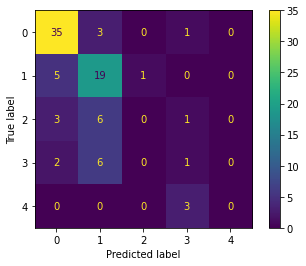

In [44]:
# Instantiating model
DT = DecisionTreeClassifier(criterion='entropy',
                            max_depth=6,
                            min_samples_split=2,
                            splitter='random')

# Training model
time_train_start = time()
DT.fit(X_full_train, y_full_train)
time_train_end = time()

# Testing model
time_test_start = time()
y_full_pred= DT.predict(X_full_test)
time_test_end = time()

# Calculating time metrics
time_train = time_train_end - time_train_start
time_test = time_test_end - time_test_start
print("Training time:", '%.2f' % time_train, 'seconds')
print("Testing time:", '%.2f' % time_test, 'seconds')

print("----------------------------------")

# Displaying scoring metrics
print("Accuracy:", '%.2f' % (accuracy_score(y_full_test, y_full_pred) * 100), '%')
print("Precision:", '%.2f' % (precision_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("Recall:", '%.2f' % (recall_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("F1 Score:", '%.2f' % (f1_score(y_full_test, y_full_pred, average='weighted') * 100), '%')

# Displaying confusion matrix
ConfusionMatrixDisplay.from_predictions(y_full_test, y_full_pred)

### Random Forest

Training time: 0.34 seconds
Testing time: 0.02 seconds
----------------------------------
Accuracy: 61.63 %
Precision: 49.63 %
Recall: 61.63 %
F1 Score: 54.96 %


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


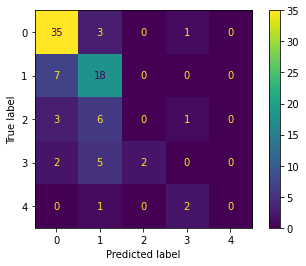

In [32]:
# Instantiating model
RF = RandomForestClassifier(criterion='entropy',
                            max_depth=7,
                            min_samples_split=7,
                            n_estimators=150)

# Training model
time_train_start = time()
RF.fit(X_full_train, y_full_train)
time_train_end = time()

# Testing model
time_test_start = time()
y_full_pred= RF.predict(X_full_test)
time_test_end = time()

# Calculating time metrics
time_train = time_train_end - time_train_start
time_test = time_test_end - time_test_start
print("Training time:", '%.2f' % time_train, 'seconds')
print("Testing time:", '%.2f' % time_test, 'seconds')

print("----------------------------------")

# Displaying scoring metrics
print("Accuracy:", '%.2f' % (accuracy_score(y_full_test, y_full_pred) * 100), '%')
print("Precision:", '%.2f' % (precision_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("Recall:", '%.2f' % (recall_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("F1 Score:", '%.2f' % (f1_score(y_full_test, y_full_pred, average='weighted') * 100), '%')

# Displaying confusion matrix
ConfusionMatrixDisplay.from_predictions(y_full_test, y_full_pred)

### K-Nearest Neighbor

Training time: 0.00 seconds
Testing time: 0.01 seconds
----------------------------------
Accuracy: 48.84 %
Precision: 39.98 %
Recall: 48.84 %
F1 Score: 43.27 %


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


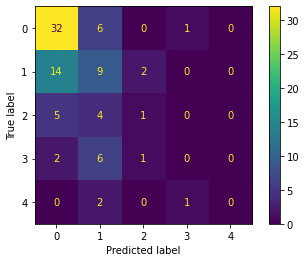

In [43]:
# Instantiating model
KNN = KNeighborsClassifier(algorithm='brute',
                           n_jobs=4,
                           n_neighbors=12,
                           p=1,
                           weights='uniform')

# Training model
time_train_start = time()
KNN.fit(X_full_train, y_full_train)
time_train_end = time()

# Testing model
time_test_start = time()
y_full_pred= KNN.predict(X_full_test)
time_test_end = time()

# Calculating time metrics
time_train = time_train_end - time_train_start
time_test = time_test_end - time_test_start
print("Training time:", '%.2f' % time_train, 'seconds')
print("Testing time:", '%.2f' % time_test, 'seconds')

print("----------------------------------")

# Displaying scoring metrics
print("Accuracy:", '%.2f' % (accuracy_score(y_full_test, y_full_pred) * 100), '%')
print("Precision:", '%.2f' % (precision_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("Recall:", '%.2f' % (recall_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("F1 Score:", '%.2f' % (f1_score(y_full_test, y_full_pred, average='weighted') * 100), '%')

# Displaying confusion matrix
ConfusionMatrixDisplay.from_predictions(y_full_test, y_full_pred)

### Neural Network (MLP)

Training time: 0.18 seconds
Testing time: 0.00 seconds
----------------------------------
Accuracy: 56.98 %
Precision: 52.16 %
Recall: 56.98 %
F1 Score: 52.06 %


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


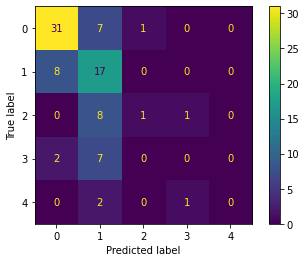

In [25]:
# Instantiating model
NET = MLPClassifier(activation='identity',
                    hidden_layer_sizes=2,
                    learning_rate='invscaling',
                    learning_rate_init=0.01,
                    max_iter=250,
                    solver = 'lbfgs')

# Training model
time_train_start = time()
NET.fit(X_full_train, y_full_train)
time_train_end = time()

# Testing model
time_test_start = time()
y_full_pred= NET.predict(X_full_test)
time_test_end = time()

# Calculating time metrics
time_train = time_train_end - time_train_start
time_test = time_test_end - time_test_start
print("Training time:", '%.2f' % time_train, 'seconds')
print("Testing time:", '%.2f' % time_test, 'seconds')

print("----------------------------------")

# Displaying scoring metrics
print("Accuracy:", '%.2f' % (accuracy_score(y_full_test, y_full_pred) * 100), '%')
print("Precision:", '%.2f' % (precision_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("Recall:", '%.2f' % (recall_score(y_full_test, y_full_pred, average='weighted') * 100), '%')
print("F1 Score:", '%.2f' % (f1_score(y_full_test, y_full_pred, average='weighted') * 100), '%')

# Displaying confusion matrix
ConfusionMatrixDisplay.from_predictions(y_full_test, y_full_pred)